In [88]:
import scipy.io as scio
import numpy as np
import random
import math
import matplotlib.pyplot as plt
%matplotlib inline

# 数据预处理

In [2]:
# 导入四类语音信号数据
dict_data1 = scio.loadmat("./dataset/BP_data/data1.mat")
dict_data2 = scio.loadmat("./dataset/BP_data/data2.mat")
dict_data3 = scio.loadmat("./dataset/BP_data/data3.mat")
dict_data4 = scio.loadmat("./dataset/BP_data/data4.mat")

In [3]:
dict_data1.keys()

dict_keys(['__header__', '__version__', '__globals__', 'c1'])

In [4]:
dict_data2

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN, Created on: Sat Aug 29 16:54:12 2009',
 '__version__': '1.0',
 '__globals__': [],
 'c2': array([[ 2.        , -7.12467503, -3.2912213 , ..., -2.1276986 ,
         -0.38493019, -0.19032406],
        [ 2.        , -7.49116827, -3.87655975, ..., -1.79263099,
         -0.30147387, -0.16403501],
        [ 2.        , -7.00807325, -3.04678115, ...,  0.25381618,
         -0.59033238,  0.19383652],
        ...,
        [ 2.        , -7.18362793, -3.78715702, ...,  1.20381466,
          1.69395555, -0.08477044],
        [ 2.        , -6.88627401, -4.48883195, ...,  1.11719008,
          0.83331303,  0.19504106],
        [ 2.        , -7.92756531, -5.20836423, ...,  0.38952646,
          0.27415831,  0.1901538 ]])}

In [5]:
dict_data1['c1']

array([[ 1.00000000e+00, -1.48271317e+01, -3.00108551e+00, ...,
         1.42235911e+00,  9.41647983e-01,  2.13976743e-01],
       [ 1.00000000e+00, -1.62288612e+01, -2.80187434e+00, ...,
         2.42777233e-01, -1.31732958e-02,  3.20707761e-01],
       [ 1.00000000e+00, -1.51242838e+01, -2.59871264e+00, ...,
        -2.81593940e-01, -2.28980228e-01,  5.96002471e-01],
       ...,
       [ 1.00000000e+00, -1.38512969e+01,  1.78928067e+00, ...,
        -1.34010339e+00, -2.63390802e-01,  4.14925046e-01],
       [ 1.00000000e+00, -1.44791748e+01,  7.15716851e-01, ...,
        -3.25554094e-01,  5.88228534e-01,  3.08701709e-01],
       [ 1.00000000e+00, -1.33760251e+01,  9.69687473e-01, ...,
         4.88889363e-01,  3.28772324e-01,  7.71866119e-02]])

In [6]:
# 将四个特征信号矩阵合成一个矩阵
temp1 = np.append(dict_data1['c1'],dict_data2['c2'],axis=0)
temp2 = np.append(dict_data3['c3'],dict_data4['c4'],axis=0)

dataset= np.append(temp1,temp2,axis=0)

In [7]:
dataset.shape

(2000, 25)

In [8]:
len(dataset)

2000

In [9]:
# 从1到2000生成2000个随机数
k = [random.randint(1,2000) for _ in range(2000)]
m = sorted(k) # 从小到大排序后的数组
n = np.argsort(np.array(k)) # 排序后数组元素在未排序数组中的下标

In [10]:
# dataset前24列为数据样本-->输入，最后一列为标签-->输出
input = dataset[:,1:26]
output_temp = dataset[:,0]

In [11]:
input.shape

(2000, 24)

In [12]:
output_temp

array([1., 1., 1., ..., 4., 4., 4.])

In [13]:
# 对输出数据进行独热编码
output = np.empty((2000,4))
for i in range(2000):
    if output_temp[i] == 1:
        output[i] = [1,0,0,0]
    elif output_temp[i] == 2:
        output[i] = [0,1,0,0]
    elif output_temp[i] == 3:
        output[i] = [0,0,1,0]
    elif output_temp[i] == 4:
        output[i] = [0,0,0,1]

In [14]:
output

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.],
       ...,
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.]])

In [83]:
# 随机提取1500个样本作为训练样本，500个样本为预测样本
#random_dataset = np.random.permutation(input)
input_train = input[n[:1500],:]
output_train = output[n[:1500],:]

input_test = input[n[1500:],:]
output_test = output[n[1500:],:]
output1 = output_temp[n[1500:]]

In [105]:
output1

array([2., 4., 3., 3., 1., 4., 1., 1., 2., 3., 3., 1., 4., 4., 2., 3., 1.,
       4., 4., 2., 4., 2., 2., 2., 2., 3., 1., 4., 4., 3., 4., 2., 4., 3.,
       4., 2., 1., 4., 4., 2., 1., 4., 2., 2., 4., 4., 1., 3., 4., 2., 1.,
       4., 2., 4., 4., 4., 3., 1., 1., 2., 2., 2., 2., 3., 1., 1., 2., 4.,
       3., 3., 3., 1., 2., 1., 1., 2., 4., 1., 1., 1., 4., 3., 1., 3., 1.,
       2., 2., 1., 3., 4., 1., 1., 1., 4., 1., 2., 1., 3., 3., 4., 2., 1.,
       2., 4., 1., 1., 2., 2., 2., 2., 1., 2., 4., 1., 3., 2., 4., 3., 4.,
       2., 1., 1., 1., 3., 2., 1., 4., 3., 1., 1., 2., 4., 4., 4., 1., 4.,
       2., 2., 1., 4., 2., 4., 2., 4., 4., 3., 4., 2., 2., 3., 3., 3., 1.,
       3., 3., 1., 1., 3., 4., 2., 1., 1., 4., 2., 1., 3., 3., 2., 1., 1.,
       3., 2., 2., 3., 1., 1., 1., 1., 1., 3., 2., 1., 4., 4., 2., 3., 2.,
       1., 1., 3., 3., 3., 2., 4., 2., 1., 2., 1., 3., 4., 3., 1., 2., 3.,
       4., 1., 3., 2., 1., 1., 1., 1., 1., 4., 2., 4., 2., 3., 2., 4., 2.,
       1., 3., 1., 2., 4.

In [16]:
len(input_train)

1500

In [17]:
input_train

array([[-1.56261762e+01,  4.20882671e-01,  5.40315952e-01, ...,
         3.46676030e-01, -3.93251520e-01, -1.73609977e-01],
       [-1.37547853e+01, -7.48844568e-01, -6.40204800e-01, ...,
        -6.78119136e-02,  6.88251002e-01, -2.10068069e-01],
       [-7.26591656e+00, -2.38870633e+00, -4.27920641e+00, ...,
        -9.63444116e-01,  4.00291608e-01, -4.47852938e-01],
       ...,
       [-7.66724553e+00, -2.82363096e+00, -2.31069330e+00, ...,
         4.71138120e-01, -4.44154760e-01,  7.40510934e-03],
       [-7.83203662e+00, -5.13619704e+00, -4.81175306e+00, ...,
        -8.14040487e-01, -1.01028897e+00, -2.88048817e-01],
       [-1.16657072e+01, -2.53062174e+00,  8.28655879e-01, ...,
         1.41494105e-01,  1.50751208e+00,  9.73721228e-03]])

In [18]:
# 归一化数组方法
def maxminnorm(array):
    maxcols=array.max(axis=0)
    mincols=array.min(axis=0)
    data_shape = array.shape
    data_rows = data_shape[0]
    data_cols = data_shape[1]
    t=np.empty((data_rows,data_cols))
    for i in range(data_cols):
        t[:,i]=(array[:,i]-mincols[i])/(maxcols[i]-mincols[i])
    return t

In [19]:
# 将输入数据归一化
normal_input = maxminnorm(input_train)

In [20]:
normal_input

array([[0.09872846, 0.48674507, 0.63153959, ..., 0.59082685, 0.42884184,
        0.50766502],
       [0.16692564, 0.45469155, 0.59414578, ..., 0.55930681, 0.56801107,
        0.4958933 ],
       [0.40339284, 0.40975514, 0.4788779 , ..., 0.49119779, 0.53095606,
        0.41911652],
       ...,
       [0.38876762, 0.3978371 , 0.54123191, ..., 0.60029166, 0.42229154,
        0.56611178],
       [0.3827623 , 0.33446687, 0.46200911, ..., 0.5025593 , 0.34944061,
        0.47071462],
       [0.24305578, 0.4058663 , 0.64067296, ..., 0.57522364, 0.67343471,
        0.56686478]])

# 网络初始化

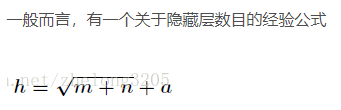
其中 h 为隐藏层节点数目，m为输入层节点数目，n为输出层节点数目 a 为 1-10 之间的调节常数。一般而言如果数据多的话我们可以设a稍微大一点，而数据不是太多的时候就设置的小一点防止过拟合。

In [21]:
innum=24; # 输入节点数
midnum=24; # 隐含层节点数
outnum=4; # 输出层节点数 

In [22]:
# 权值初始化(生成均匀分布在-1到1之间的随机矩阵)
w1 =  np.random.uniform(-1, 1, (midnum,innum))
b1 = np.random.uniform(-1, 1, (midnum, 1))
w2 = np.random.uniform(-1, 1, (midnum, outnum))
b2 = np.random.uniform(-1, 1, (outnum, 1))

In [23]:
w1.shape,b1.shape,w2.shape,b2.shape

((24, 24), (24, 1), (24, 4), (4, 1))

In [24]:
b1

array([[ 0.72409348],
       [-0.65446718],
       [-0.70290121],
       [ 0.16056052],
       [-0.12350062],
       [-0.75428265],
       [-0.10562604],
       [-0.6778063 ],
       [ 0.00381258],
       [-0.56163695],
       [ 0.18694261],
       [-0.84182313],
       [-0.33035886],
       [ 0.72487827],
       [ 0.02935646],
       [-0.97810385],
       [-0.2564925 ],
       [-0.21708394],
       [-0.09043602],
       [-0.9855696 ],
       [-0.45514268],
       [-0.76811598],
       [ 0.15782407],
       [-0.14731103]])

In [25]:
w2_1=w2
w2_2=w2_1
w1_1=w1
w1_2=w1_1
b1_1=b1
b1_2=b1_1
b2_1=b2
b2_2=b2_1

In [26]:
#学习率
xite=0.1
alfa=0.01;

In [27]:
b1[0][0]

0.7240934809455148

# 网络训练

In [28]:
# 训练10个epoch
# 记录每一个epoch的误差
E = np.empty(10)
for epoch in range(10):
    E[epoch]=0
    for i in range(1500):
        x=normal_input[i]
        # 隐含层输出
        # 记录隐含层输出
        I = np.empty((midnum))
        Iout = np.empty((midnum))
        for j in range(midnum):
            I[j] = np.dot(np.mat(x),np.transpose(np.mat(w1[j])))+b1[j][0]
            Iout[j] = 1/(1+math.exp(-I[j]))
        #print("b2",b2.shape)
        
        #print("np.mat(Iout)",np.mat(Iout).shape) 
        #print("np.transpose(np.mat(Iout))",np.transpose(np.mat(Iout)).shape) 
        # 输出层输出
        yn = np.dot(np.transpose(w2),np.transpose(np.mat(Iout)))+b2
        
        # 权值阈值修正
        # 计算误差
        #print("output_train",output_train.shape)
        #print("output_train[i]",np.mat(output_train[i]).shape)
        #print("np.transpose(output_train[i])",np.transpose(output_train[i]).shape)
        #print("yn",yn.shape)
        #print("np.mat(output_train[i])",np.mat(output_train[i]).shape)
        e = np.transpose(np.mat(output_train[i])) - yn
        #print("e",e.shape)
        E[epoch] += sum(abs(e))
        
        # 计算权值变化率
        dw2 = e * Iout
        db2 = np.transpose(e)
        
        FI = np.empty(midnum)
        for j in range(midnum):
            print("-I[j]",math.exp(-I[j]))
            S = 1/(1+math.exp(-I[j]))
            FI[j] = S * (1 - S)
            
        dw1 = np.empty((innum,midnum))
        db1 = np.empty(midnum)
        for k in range(innum):
            for j in range(midnum):
                dw1[k,j]=FI[j]*x[k]*(e[0]*w2[j,0]+e[1]*w2[j,1]+e[2]*w2[j,2]+e[3]*w2[j,3])
                db1[j]=FI[j]*(e[0]*w2[j,0]+e[1]*w2[j,1]+e[2]*w2[j,2]+e[3]*w2[j,3])
           
        # 权值阈值更新
        w1=w1_1+xite*np.transpose(dw1)+alfa*(w1_1-w1_2);
        b1=b1_1+xite*np.transpose(db1)+alfa*(b1_1-b1_2);
        w2=w2_1+xite*np.transpose(dw2)+alfa*(w2_1-w2_2);
        b2=b2_1+xite*np.transpose(db2)+alfa*(b2_1-b2_2);
        
        # 结果保存
        w1_2=w1_1;w1_1=w1;
        w2_2=w2_1;w2_1=w2;
        b1_2=b1_1;b1_1=b1;
        b2_2=b2_1;b2_1=b2;

-I[j] 0.42986286186585154
-I[j] 0.6048183752067221
-I[j] 35.96077640041431
-I[j] 3.6193222238840064
-I[j] 0.2226500764280204
-I[j] 1.48808817151022
-I[j] 0.4798896577034089
-I[j] 16.636659106820773
-I[j] 16.624175930713214
-I[j] 8.218134992356141
-I[j] 5.2107020835876545
-I[j] 3.2289674080422652
-I[j] 0.43727333893128423
-I[j] 0.06428327890549085
-I[j] 3.7192363455491053
-I[j] 5.720783098282566
-I[j] 4.248540931137009
-I[j] 1.669002037072471
-I[j] 0.6276887868531495
-I[j] 2.672043557501444
-I[j] 0.3008038488501735
-I[j] 6.100943152184317
-I[j] 1.151090917478351
-I[j] 4.224740082917874
-I[j] 0.8585853255742774
-I[j] 1.3358683646349085
-I[j] 38.934900351162675
-I[j] 3.965363098696779
-I[j] 0.44715436715061413
-I[j] 2.515330366905528
-I[j] 1.221485886674412
-I[j] 15.712395820130432
-I[j] 16.11750466110221
-I[j] 8.895934216554757
-I[j] 2.9556738033500056
-I[j] 3.052075886364148
-I[j] 0.7345296454000282
-I[j] 0.18195353076769222
-I[j] 5.547661314138442
-I[j] 7.930663115624776
-I[j] 5.625982

-I[j] 1.2786165873612925
-I[j] 0.8757748093686922
-I[j] 26.182963770638896
-I[j] 4.715579526970842
-I[j] 0.5944669953949399
-I[j] 2.779265583556931
-I[j] 0.5081592105157522
-I[j] 22.990660170548882
-I[j] 10.732011718350732
-I[j] 11.116874727586188
-I[j] 4.42772734685539
-I[j] 5.40262398532311
-I[j] 0.8882866333138708
-I[j] 0.11624419117386266
-I[j] 4.029017953240579
-I[j] 7.000506540649202
-I[j] 4.084706968106967
-I[j] 1.0581683139850728
-I[j] 1.5860750963710994
-I[j] 6.049471510091227
-I[j] 0.192376092366183
-I[j] 3.7451011266982963
-I[j] 1.0754321920332517
-I[j] 4.746583945207436
-I[j] 1.5791959268990092
-I[j] 1.9894779921625227
-I[j] 16.548240975519374
-I[j] 3.9903287177670945
-I[j] 0.8187173566819408
-I[j] 2.467717822893072
-I[j] 0.546502340706495
-I[j] 13.984917681366074
-I[j] 13.169151162774053
-I[j] 10.405195099094016
-I[j] 3.7985837726548444
-I[j] 2.492440144331971
-I[j] 1.9489901253559028
-I[j] 0.07714868499214168
-I[j] 3.8748102121211545
-I[j] 8.917255779848928
-I[j] 3.991661

-I[j] 2.0017404768172593
-I[j] 1.4395368853593233
-I[j] 18.286083202819754
-I[j] 4.945838321090799
-I[j] 0.6387116249409704
-I[j] 1.5317274162502368
-I[j] 0.46232291316527835
-I[j] 23.38153947014038
-I[j] 11.014244325301043
-I[j] 15.888549216869235
-I[j] 6.012968166394027
-I[j] 6.528328310728769
-I[j] 1.5291739378749976
-I[j] 0.07675714135748944
-I[j] 3.895496968823831
-I[j] 7.882713283430293
-I[j] 4.422523107786441
-I[j] 1.5991291217344987
-I[j] 2.1071684420190313
-I[j] 4.620631639047655
-I[j] 0.23104366598168943
-I[j] 4.244441627469416
-I[j] 1.7094188111211375
-I[j] 6.251056235616991
-I[j] 0.8147149368736366
-I[j] 1.4805340386145687
-I[j] 41.02421306485634
-I[j] 5.869391020593946
-I[j] 0.5349232396803614
-I[j] 1.7892015665055632
-I[j] 0.8289308819187701
-I[j] 15.109010169926405
-I[j] 15.337113229006237
-I[j] 14.881402786495464
-I[j] 4.386579886560826
-I[j] 2.928315885879405
-I[j] 0.8094669692154862
-I[j] 0.10875852238286864
-I[j] 5.358762092700055
-I[j] 11.810377844532738
-I[j] 3.837

-I[j] 2.177359998630096
-I[j] 2.4997931504377813
-I[j] 27.620641724821276
-I[j] 4.943718041232955
-I[j] 0.6492153598398138
-I[j] 3.8724578296803465
-I[j] 0.7311734422957598
-I[j] 14.18480076461338
-I[j] 20.49738995033313
-I[j] 12.918586796910295
-I[j] 2.9058177545104287
-I[j] 4.336481256591823
-I[j] 1.2967003043167273
-I[j] 0.2106272196008381
-I[j] 5.223559397968561
-I[j] 10.530246893495299
-I[j] 4.740518961560012
-I[j] 2.1193527224019384
-I[j] 1.6034455788162578
-I[j] 6.335567438673315
-I[j] 0.16304984979584863
-I[j] 5.879825892119336
-I[j] 1.9097362036607977
-I[j] 6.055363593377533
-I[j] 2.543988134877176
-I[j] 2.4720312209317514
-I[j] 19.363867702005287
-I[j] 4.064416024132493
-I[j] 0.7180452761928219
-I[j] 3.975387298264789
-I[j] 0.8174447397550281
-I[j] 16.264251845257093
-I[j] 10.840976278294699
-I[j] 7.322502837602224
-I[j] 4.664536022940453
-I[j] 4.195283837133218
-I[j] 2.281389722974684
-I[j] 0.12784691598184295
-I[j] 5.967690727307665
-I[j] 10.279778755228225
-I[j] 3.99969896

-I[j] 1.851553094445838
-I[j] 2.7728938985225624
-I[j] 24.013743489114702
-I[j] 8.24211270145698
-I[j] 1.2578728831738997
-I[j] 2.7791733516046686
-I[j] 0.9553374940013527
-I[j] 6.605413892917489
-I[j] 4.901892406900387
-I[j] 14.320175800348467
-I[j] 1.9611219818125707
-I[j] 6.881893269119752
-I[j] 2.6789011617143172
-I[j] 0.30525186361622464
-I[j] 3.63333512538089
-I[j] 13.459052262230266
-I[j] 10.244020511571586
-I[j] 1.9137325488466612
-I[j] 2.1016467820292695
-I[j] 3.5175102580258466
-I[j] 0.41442680734282317
-I[j] 9.436233617640925
-I[j] 2.4184141334893905
-I[j] 3.0369846797660527
-I[j] 1.2754351609136911
-I[j] 0.9146741321564364
-I[j] 16.054425571000476
-I[j] 4.22179874068371
-I[j] 0.3683942160674414
-I[j] 2.6922587909383635
-I[j] 0.42590929576400555
-I[j] 14.25095210650384
-I[j] 18.018882404580292
-I[j] 9.067025926704884
-I[j] 4.294315936068283
-I[j] 1.521179298217458
-I[j] 1.7432745634621183
-I[j] 0.08873548196100489
-I[j] 3.767661445590211
-I[j] 9.648182811314575
-I[j] 3.34653

-I[j] 1.5718562226117996
-I[j] 1.5874190393465735
-I[j] 41.1662594980389
-I[j] 7.238993429099335
-I[j] 1.0429756042974416
-I[j] 2.8205750387473407
-I[j] 0.9124252242223464
-I[j] 18.35689769931687
-I[j] 12.876295441151257
-I[j] 11.356945205175503
-I[j] 4.690271936316527
-I[j] 8.403311131693966
-I[j] 1.5026384842926541
-I[j] 0.16859600275431044
-I[j] 5.604025535156731
-I[j] 9.315710004771322
-I[j] 8.936428630597261
-I[j] 2.7050315392608155
-I[j] 1.380551872087898
-I[j] 5.260955289553155
-I[j] 0.13503041978991676
-I[j] 5.887033351087133
-I[j] 1.9457976137178183
-I[j] 7.461443279378875
-I[j] 0.7371884662662849
-I[j] 2.2743439742085725
-I[j] 36.59355471680599
-I[j] 5.353656219615499
-I[j] 0.1610835136922136
-I[j] 4.258960205182027
-I[j] 0.7033642670478816
-I[j] 13.823764933470592
-I[j] 23.740994677606178
-I[j] 11.775557887233147
-I[j] 1.6324948039905973
-I[j] 3.504638056874777
-I[j] 1.3030460496339262
-I[j] 0.12379401169674373
-I[j] 8.124371992429525
-I[j] 23.121564854067294
-I[j] 2.7193780

-I[j] 2.0718536954051094
-I[j] 5.133519097283376
-I[j] 9.036632563929938
-I[j] 4.132044231327913
-I[j] 0.7835372979822678
-I[j] 10.288662535459538
-I[j] 0.5715026505851148
-I[j] 9.697971060074535
-I[j] 8.883780013810416
-I[j] 6.001739416145899
-I[j] 1.3659725041862951
-I[j] 4.340735243752384
-I[j] 3.397371086664664
-I[j] 0.1859551630417755
-I[j] 4.427613199443979
-I[j] 25.571919800995385
-I[j] 2.792621925649167
-I[j] 2.568041952727178
-I[j] 2.0619867004539594
-I[j] 6.584926193398497
-I[j] 0.5269874934382008
-I[j] 5.560911814848076
-I[j] 1.7611373360920035
-I[j] 4.2245359543158
-I[j] 2.681329283458508
-I[j] 1.2382146449600047
-I[j] 51.93010805579084
-I[j] 6.699158400834949
-I[j] 0.43371394717638784
-I[j] 2.2460644792456743
-I[j] 0.47174958984271315
-I[j] 13.664139177370487
-I[j] 15.53077533969552
-I[j] 21.02934911027804
-I[j] 4.982116580646082
-I[j] 4.099798105175163
-I[j] 1.8592456785680154
-I[j] 0.11723932775769444
-I[j] 7.047459669653416
-I[j] 18.60896325169282
-I[j] 5.43061428083148

-I[j] 2.0099319512019815
-I[j] 2.299222430880651
-I[j] 18.74080562935764
-I[j] 3.4485474331363934
-I[j] 0.5019504998909344
-I[j] 3.882897082527098
-I[j] 0.4253853458902407
-I[j] 12.763227976153416
-I[j] 25.226717376210388
-I[j] 6.1788473957061845
-I[j] 4.791690310036627
-I[j] 5.200181713222661
-I[j] 3.0122266257743244
-I[j] 0.11308459794875705
-I[j] 5.158150250604484
-I[j] 20.250018549151545
-I[j] 2.3549112463287676
-I[j] 1.952937836296887
-I[j] 1.0816373898004397
-I[j] 5.424795794444778
-I[j] 0.685692499669581
-I[j] 7.2478558412182394
-I[j] 1.2732617583264176
-I[j] 6.6771838386107305
-I[j] 1.2448529432709836
-I[j] 2.2189423488021314
-I[j] 28.29642236990394
-I[j] 6.348355243150031
-I[j] 0.9238229087186588
-I[j] 2.7863480477634655
-I[j] 0.8453547272084584
-I[j] 19.622075141978023
-I[j] 17.24401070119896
-I[j] 7.247461161923384
-I[j] 5.519759088898514
-I[j] 5.334573310912925
-I[j] 1.8322853223483548
-I[j] 0.10732620742604217
-I[j] 5.757943758970694
-I[j] 12.622186794788059
-I[j] 3.679799

-I[j] 1.5704042629572237
-I[j] 2.7405373130403663
-I[j] 27.409155026221047
-I[j] 7.2914448237737775
-I[j] 1.070343233153334
-I[j] 5.155175365253579
-I[j] 0.7982760886565353
-I[j] 15.532294322369152
-I[j] 17.308649029441217
-I[j] 9.178782771332923
-I[j] 3.9276609257821264
-I[j] 9.231430200207884
-I[j] 2.5918848625177646
-I[j] 0.25625911122802264
-I[j] 6.828761413943774
-I[j] 16.174576978345858
-I[j] 3.9794162889777995
-I[j] 2.6450596032485465
-I[j] 1.6237097877910773
-I[j] 7.7888727695373134
-I[j] 0.31036936070874227
-I[j] 8.372447065848792
-I[j] 2.3477311231931544
-I[j] 6.693800453602747
-I[j] 1.5188180417608494
-I[j] 2.1859815525071045
-I[j] 27.902785915831686
-I[j] 10.884710337938275
-I[j] 1.015482577165596
-I[j] 3.97110790074395
-I[j] 0.710909570529765
-I[j] 21.16041858728275
-I[j] 11.51605467342756
-I[j] 15.2673459990081
-I[j] 4.674804981999828
-I[j] 7.498826235760258
-I[j] 2.1321768983206693
-I[j] 0.1261337619422312
-I[j] 4.6097044459726835
-I[j] 17.58250429062853
-I[j] 3.63598157

-I[j] 1.5078150593871464
-I[j] 2.6701059214247627
-I[j] 37.25710524332461
-I[j] 7.806869523803018
-I[j] 0.8882875478228879
-I[j] 1.4293716699848036
-I[j] 0.711220631506873
-I[j] 11.560038723781108
-I[j] 16.199510027954513
-I[j] 11.631361967272287
-I[j] 4.2172974356430215
-I[j] 6.9494905633835655
-I[j] 3.2727103372038293
-I[j] 0.13571866931282708
-I[j] 5.92614375569254
-I[j] 9.277408610803299
-I[j] 4.842455341508443
-I[j] 2.0819288318023097
-I[j] 2.868408272099463
-I[j] 5.073332279818847
-I[j] 0.19417738728760722
-I[j] 4.96523186665349
-I[j] 3.5419565719753647
-I[j] 5.534756857994276
-I[j] 1.3511462482402883
-I[j] 2.756396132317265
-I[j] 31.76229442822221
-I[j] 7.286413530425453
-I[j] 0.9087041810239671
-I[j] 3.4242002499712365
-I[j] 0.9690755863481036
-I[j] 14.858863473218669
-I[j] 18.010795154437407
-I[j] 9.392885791271643
-I[j] 3.6779854130396274
-I[j] 6.151445718115743
-I[j] 2.237184747381708
-I[j] 0.23003330645176268
-I[j] 6.4971061101763325
-I[j] 16.804459227861905
-I[j] 3.5438355

-I[j] 4.764299054212199
-I[j] 9.085964813648678
-I[j] 4.0455735943254885
-I[j] 0.1706962892103719
-I[j] 7.269173719073556
-I[j] 11.015973091301301
-I[j] 3.4552979009571794
-I[j] 2.7567815815567727
-I[j] 1.857039802105366
-I[j] 4.72172242356658
-I[j] 0.341133930292099
-I[j] 4.8711888620825485
-I[j] 2.2718051777747483
-I[j] 8.254213018465538
-I[j] 1.0369137391980539
-I[j] 1.4949048872188704
-I[j] 44.43094398224579
-I[j] 7.857621625907994
-I[j] 1.4477050031341157
-I[j] 2.2895343932389256
-I[j] 0.5505392758991702
-I[j] 19.999230747975112
-I[j] 17.71163908047532
-I[j] 11.183878490257177
-I[j] 5.2590507648590235
-I[j] 8.069254159378898
-I[j] 1.7598495970016457
-I[j] 0.19535702178872733
-I[j] 5.526072302909157
-I[j] 8.44638395984489
-I[j] 3.832607255545452
-I[j] 2.6392051563719456
-I[j] 3.041034181688689
-I[j] 7.063396614005566
-I[j] 0.1975186145097941
-I[j] 6.821605687676065
-I[j] 3.039966014619942
-I[j] 9.797668701446563
-I[j] 1.2875629912067974
-I[j] 1.6375725600045314
-I[j] 56.16792000485

-I[j] 7.257543617599563
-I[j] 17.920205395949605
-I[j] 3.0489873010806106
-I[j] 2.3616769692781263
-I[j] 3.074054897207923
-I[j] 10.947629997210443
-I[j] 0.5177819181067035
-I[j] 6.264093337459917
-I[j] 1.9420928246944762
-I[j] 3.9336152562283075
-I[j] 0.43437535849126957
-I[j] 0.9362298805600944
-I[j] 51.959702794571264
-I[j] 7.646931446341685
-I[j] 1.261605544897472
-I[j] 2.8260094212726736
-I[j] 0.9422935719131407
-I[j] 13.216635908543473
-I[j] 18.48245259246759
-I[j] 5.192068048542819
-I[j] 4.070530238044837
-I[j] 6.793229516869045
-I[j] 1.6442904609910527
-I[j] 0.3349754171818117
-I[j] 6.578800297591342
-I[j] 6.944677425784121
-I[j] 3.95178067564247
-I[j] 2.0610518747930473
-I[j] 1.5396600768247173
-I[j] 9.767684330941513
-I[j] 0.2193830406317736
-I[j] 7.4858626772198775
-I[j] 2.2649171411614075
-I[j] 7.661588729447832
-I[j] 1.4397136974140046
-I[j] 2.021546332505099
-I[j] 29.56942599929776
-I[j] 4.541593699160776
-I[j] 0.7960633788055208
-I[j] 3.4703585442403466
-I[j] 0.850393976

-I[j] 1.4829805274768624
-I[j] 2.4030915640624784
-I[j] 48.14689865099937
-I[j] 8.679317110407036
-I[j] 1.016478667938675
-I[j] 2.273589202333717
-I[j] 0.7653565429765224
-I[j] 14.116832334039792
-I[j] 13.572302090467465
-I[j] 11.00148354241398
-I[j] 6.588311558179119
-I[j] 6.966592324335658
-I[j] 2.918334321685959
-I[j] 0.16310943923029247
-I[j] 7.6008235697306805
-I[j] 11.24747786202987
-I[j] 4.393651751867556
-I[j] 2.867527537753173
-I[j] 2.966185239027532
-I[j] 7.003950471634896
-I[j] 0.39564976516072764
-I[j] 5.4178142708988295
-I[j] 2.538815682948062
-I[j] 5.768301462661704
-I[j] 1.5213065445637557
-I[j] 1.800592548347575
-I[j] 19.85117487272414
-I[j] 4.627418008245911
-I[j] 1.2217131992981318
-I[j] 4.067540053179108
-I[j] 0.7173173771050574
-I[j] 16.10146918081175
-I[j] 16.634141813068933
-I[j] 6.1004251529711535
-I[j] 6.4926721090536565
-I[j] 8.059407549835331
-I[j] 4.168026945322945
-I[j] 0.19925003100639951
-I[j] 6.3854792262230955
-I[j] 8.689676719110421
-I[j] 3.679226271010

-I[j] 1.0779592013558867
-I[j] 1.8848375749950381
-I[j] 39.84146951747149
-I[j] 11.995721067689178
-I[j] 0.673396068924385
-I[j] 1.9912810589516943
-I[j] 0.9167731346111513
-I[j] 17.586161343068053
-I[j] 11.48642428125661
-I[j] 11.984162088298852
-I[j] 5.59989508859489
-I[j] 9.48115803600752
-I[j] 1.586908331002542
-I[j] 0.16836223442404188
-I[j] 10.568251075780896
-I[j] 19.181292167221148
-I[j] 5.176330840960527
-I[j] 3.105957060946552
-I[j] 4.183290049184863
-I[j] 8.79764462749785
-I[j] 0.48484724524038875
-I[j] 7.030446219009256
-I[j] 1.6880450012866723
-I[j] 6.405715577615812
-I[j] 1.611180305687301
-I[j] 1.6883925259151387
-I[j] 50.97080182472402
-I[j] 7.484170003907642
-I[j] 0.6978260579856662
-I[j] 2.0925024389198787
-I[j] 0.975991042470888
-I[j] 21.97945430750106
-I[j] 14.306270903411045
-I[j] 11.558049606702678
-I[j] 6.313370875134762
-I[j] 15.130516241589932
-I[j] 2.2899566112600835
-I[j] 0.18868300383868883
-I[j] 9.033308479520645
-I[j] 9.87605196654947
-I[j] 6.0148827387748

-I[j] 2.972358361987531
-I[j] 3.1136585120650437
-I[j] 28.09032171216579
-I[j] 9.238832191227411
-I[j] 1.3696431757645882
-I[j] 1.7028616022445175
-I[j] 0.7974196759168968
-I[j] 16.194005340139743
-I[j] 9.859595285636031
-I[j] 15.505390114236505
-I[j] 7.141084894094755
-I[j] 10.946029968392068
-I[j] 3.7030457084797272
-I[j] 0.13980996448242927
-I[j] 6.405729183942126
-I[j] 13.162672226228903
-I[j] 4.942771043298727
-I[j] 5.138870975943649
-I[j] 4.854973185106042
-I[j] 6.724841113935048
-I[j] 0.33895378243118524
-I[j] 4.2213057426381475
-I[j] 3.6810149674365293
-I[j] 6.828963237324953
-I[j] 1.5370435374679814
-I[j] 1.974015757370475
-I[j] 50.52731506719255
-I[j] 15.00738974570305
-I[j] 1.0615787729880608
-I[j] 1.6769453467616287
-I[j] 1.2499546080390573
-I[j] 17.337653224790976
-I[j] 9.892783721050327
-I[j] 18.206625074675713
-I[j] 5.404531498723726
-I[j] 7.117854921514587
-I[j] 1.8322093359834497
-I[j] 0.16890410398729103
-I[j] 5.2196175207435624
-I[j] 13.257181748985898
-I[j] 4.891538

-I[j] 1.215739349812405
-I[j] 1.9357139818670932
-I[j] 66.52774196840227
-I[j] 9.814838078500058
-I[j] 1.3753714933932208
-I[j] 1.9529275115706162
-I[j] 1.368937072956458
-I[j] 15.588715676530121
-I[j] 13.429118942973547
-I[j] 9.731718621011222
-I[j] 4.41516846649184
-I[j] 9.201823123133462
-I[j] 3.2005236176158465
-I[j] 0.21785610318770948
-I[j] 7.113419326859472
-I[j] 10.23344403770049
-I[j] 6.516631248828312
-I[j] 3.4649313535370894
-I[j] 3.2050201464414068
-I[j] 5.640588308963809
-I[j] 0.23601069157849028
-I[j] 6.0245414664514
-I[j] 4.276024477805911
-I[j] 7.517134413580593
-I[j] 3.1522939302870707
-I[j] 7.295484581033093
-I[j] 19.853017469927842
-I[j] 4.96203989371609
-I[j] 0.4979990123281638
-I[j] 6.717723935761126
-I[j] 1.6205205381748735
-I[j] 14.284958925421096
-I[j] 9.994201526590167
-I[j] 2.4219958248791453
-I[j] 2.2886394971295405
-I[j] 4.6754674923323085
-I[j] 4.547826051074254
-I[j] 0.22619631340644308
-I[j] 11.7601176162998
-I[j] 17.269563241867132
-I[j] 3.29290450806481

-I[j] 9.950838494770483
-I[j] 2.8853133879861215
-I[j] 0.23752135701084462
-I[j] 26.248215461375292
-I[j] 38.93279799927395
-I[j] 1.8048406335918936
-I[j] 3.5940766246034244
-I[j] 2.8229176225828
-I[j] 12.74439671585592
-I[j] 0.6953746160760523
-I[j] 6.619350678581905
-I[j] 2.467226375587098
-I[j] 5.441058114484418
-I[j] 1.682447218902171
-I[j] 2.375544176551138
-I[j] 36.49614147879253
-I[j] 8.710233020853712
-I[j] 0.7509492371990006
-I[j] 1.7146896390466302
-I[j] 0.8604639300038522
-I[j] 12.714034885727688
-I[j] 12.802111955452425
-I[j] 12.948331489746009
-I[j] 4.789993066115256
-I[j] 9.030843084688085
-I[j] 2.837695286244594
-I[j] 0.19089188110162306
-I[j] 11.768013768019822
-I[j] 13.999771805132829
-I[j] 4.762551787914589
-I[j] 3.2926149350230682
-I[j] 3.7906665668950534
-I[j] 7.29223005856287
-I[j] 0.42215393637469084
-I[j] 5.8302936999600865
-I[j] 2.541904590325694
-I[j] 4.479036401018346
-I[j] 1.3741580745551822
-I[j] 1.7914304514908022
-I[j] 54.3738458438638
-I[j] 14.21777840568

-I[j] 7.8909516728862155
-I[j] 13.873036547787812
-I[j] 8.136182218334277
-I[j] 5.740599203314153
-I[j] 4.403796369838524
-I[j] 5.757403255707408
-I[j] 0.3219843733128989
-I[j] 3.4782039992052725
-I[j] 3.2818318491045413
-I[j] 4.627020052647287
-I[j] 2.9211348906564267
-I[j] 3.2212982624179647
-I[j] 45.32101550956753
-I[j] 9.842806998846504
-I[j] 0.889803601327147
-I[j] 6.659845093163901
-I[j] 1.7584087244231716
-I[j] 18.992666089396398
-I[j] 33.9221918439814
-I[j] 8.153356802223021
-I[j] 4.104532993670828
-I[j] 6.699734667400421
-I[j] 3.563517594106539
-I[j] 0.211199917148014
-I[j] 4.716195905210701
-I[j] 18.092749170322403
-I[j] 9.231676693221411
-I[j] 6.178597332272151
-I[j] 4.491945223544263
-I[j] 5.50471324784398
-I[j] 0.2156232045724719
-I[j] 5.763899558438122
-I[j] 5.2240967827981395
-I[j] 5.146561896038986
-I[j] 1.7050783365189184
-I[j] 1.93442670272903
-I[j] 34.164970674902406
-I[j] 8.753639317288805
-I[j] 1.1578793964795773
-I[j] 2.036315984668727
-I[j] 1.3542880200765974
-I[

-I[j] 1.5895343260288608
-I[j] 2.8136513615894754
-I[j] 27.260852001284402
-I[j] 9.74646902103632
-I[j] 1.3125678059040773
-I[j] 3.268235708863158
-I[j] 1.5003432088109245
-I[j] 18.850194089030254
-I[j] 11.51965452336037
-I[j] 6.734532330920519
-I[j] 4.801197170711513
-I[j] 9.21138568145533
-I[j] 4.1565720644839494
-I[j] 0.26473556351306726
-I[j] 10.96756308982784
-I[j] 15.673052697698848
-I[j] 3.5912758083458707
-I[j] 4.123270298563743
-I[j] 2.9694313571857758
-I[j] 6.9810355758553095
-I[j] 0.4400460265185355
-I[j] 5.187093743526179
-I[j] 3.4111362782525894
-I[j] 6.245318902659665
-I[j] 1.3917777268902012
-I[j] 1.8167982913359702
-I[j] 25.33451389338992
-I[j] 6.2326734503203545
-I[j] 1.075019348070511
-I[j] 3.6035677472452203
-I[j] 0.9219670949974202
-I[j] 10.453830221627639
-I[j] 18.24675446506988
-I[j] 7.276694394514037
-I[j] 2.804048907165268
-I[j] 7.345928261211769
-I[j] 4.435867670600597
-I[j] 0.43054287557048515
-I[j] 6.417602156884136
-I[j] 15.819838225730146
-I[j] 1.5225358436

-I[j] 1.3960467674466799
-I[j] 2.0019822726662073
-I[j] 62.75938094311649
-I[j] 12.5416410551033
-I[j] 1.2166883208416022
-I[j] 2.6074505916410793
-I[j] 1.4252387153192412
-I[j] 16.75311426398787
-I[j] 15.305529931614243
-I[j] 11.170791698212135
-I[j] 5.992102175193339
-I[j] 5.947843111877693
-I[j] 3.049354271714326
-I[j] 0.3019904019831506
-I[j] 8.648139807096785
-I[j] 14.446701466688857
-I[j] 3.9814964162340365
-I[j] 3.165311747925958
-I[j] 3.4468906316714976
-I[j] 6.618882151698153
-I[j] 0.6215484657023624
-I[j] 6.31935806619518
-I[j] 2.838265861494679
-I[j] 6.7962432512619815
-I[j] 1.3795714528487986
-I[j] 2.666505311446205
-I[j] 26.99069756140488
-I[j] 9.920983910250873
-I[j] 1.8979438969107043
-I[j] 3.895212162940539
-I[j] 0.8523557447604866
-I[j] 12.377611318224131
-I[j] 13.303845433885922
-I[j] 7.479709405498808
-I[j] 6.939086583654352
-I[j] 5.1749922260591
-I[j] 5.526317854311598
-I[j] 0.18883968635519519
-I[j] 7.778290966605417
-I[j] 14.199986892271498
-I[j] 3.700197705641784

-I[j] 0.9327997797770738
-I[j] 1.984921678082897
-I[j] 55.114099227045344
-I[j] 7.2427130229428585
-I[j] 1.601281799774769
-I[j] 1.6972275725403494
-I[j] 0.9832081286215801
-I[j] 10.119457337237224
-I[j] 19.82180863021482
-I[j] 9.717368135717665
-I[j] 4.480203104356148
-I[j] 8.757956788351992
-I[j] 2.637349583360732
-I[j] 0.2701067297292872
-I[j] 9.680954078005445
-I[j] 12.20685170461205
-I[j] 4.396274248017116
-I[j] 4.549441819723919
-I[j] 3.082578211788826
-I[j] 6.1953666241918235
-I[j] 0.28261079755312113
-I[j] 5.233046353970056
-I[j] 3.706194328059451
-I[j] 11.103090834430068
-I[j] 0.5642702498815957
-I[j] 1.2388238439230583
-I[j] 74.69126048607825
-I[j] 12.488544451865017
-I[j] 1.4297772906328623
-I[j] 2.0414486410188557
-I[j] 2.5010756986481795
-I[j] 16.33983926841781
-I[j] 16.011221634063965
-I[j] 12.721530795763442
-I[j] 3.6791367133589152
-I[j] 7.112568927845513
-I[j] 2.7699414039887227
-I[j] 0.3713276317801061
-I[j] 7.162745551301598
-I[j] 10.894306554619117
-I[j] 6.201609370

-I[j] 2.5943618509174704
-I[j] 8.162869278489802
-I[j] 9.825637250353285
-I[j] 7.9797595677217625
-I[j] 0.7568376126976131
-I[j] 4.137291942527725
-I[j] 1.0775920685813771
-I[j] 24.637688122477986
-I[j] 10.28232813365041
-I[j] 6.512697082344686
-I[j] 5.16215393006559
-I[j] 4.409914696404193
-I[j] 6.616973902871314
-I[j] 0.09895895673719517
-I[j] 7.1759668021522725
-I[j] 26.024917483642476
-I[j] 0.9936699371539124
-I[j] 2.5015403157674467
-I[j] 5.506418111659554
-I[j] 5.4636822955065
-I[j] 1.6973884821364438
-I[j] 3.126711923817344
-I[j] 2.6444212839124988
-I[j] 5.5713126635170465
-I[j] 1.6698013625387682
-I[j] 2.5071551119140434
-I[j] 56.98173093901365
-I[j] 9.323479255593282
-I[j] 1.2735634063073538
-I[j] 1.7121817672689474
-I[j] 1.3059713238532409
-I[j] 20.85595257198064
-I[j] 17.31628075594524
-I[j] 9.989621523758895
-I[j] 6.585173356508443
-I[j] 8.533309377012499
-I[j] 4.5118487702805234
-I[j] 0.20469187629544558
-I[j] 9.523880919525963
-I[j] 13.051484467881247
-I[j] 5.539546453029

-I[j] 1.3801798684522473
-I[j] 2.245598010920007
-I[j] 71.47330298441955
-I[j] 9.141287754985196
-I[j] 0.7236217920219716
-I[j] 1.8049592128106684
-I[j] 1.620880068926189
-I[j] 15.026291988565097
-I[j] 14.423338600994345
-I[j] 12.580897259445555
-I[j] 4.505778859882085
-I[j] 9.963874615787084
-I[j] 3.0460689068084346
-I[j] 0.38104040672805817
-I[j] 11.17991979195899
-I[j] 14.72116915445477
-I[j] 4.754588069332778
-I[j] 3.4801467984642587
-I[j] 4.681146905910806
-I[j] 11.129927934052827
-I[j] 0.44434769554328285
-I[j] 4.215500881343264
-I[j] 2.734222615878316
-I[j] 4.595409981469923
-I[j] 1.3469487021083084
-I[j] 1.6389978049311866
-I[j] 40.14853728237988
-I[j] 9.517977561308587
-I[j] 1.5410566058422663
-I[j] 2.570063850940607
-I[j] 1.1138874401948793
-I[j] 21.799997370275612
-I[j] 17.142945588638288
-I[j] 10.951672159220351
-I[j] 8.795306960126346
-I[j] 12.687287648884306
-I[j] 3.412090602109928
-I[j] 0.30355716070317507
-I[j] 12.845695928172672
-I[j] 11.64466405936215
-I[j] 4.86918541

-I[j] 1.3674075135297101
-I[j] 10.56899849625455
-I[j] 8.206147706744886
-I[j] 21.15894824895142
-I[j] 3.8572413250518713
-I[j] 8.242868994515272
-I[j] 4.1110060296414375
-I[j] 0.4163905553911759
-I[j] 4.6403355653678515
-I[j] 9.355089232853995
-I[j] 6.336431602502852
-I[j] 3.8893878684323773
-I[j] 7.293231217937218
-I[j] 3.349008053307675
-I[j] 0.46302445734132686
-I[j] 11.111102371044733
-I[j] 5.563698645608289
-I[j] 7.414867561990172
-I[j] 1.2664916760854923
-I[j] 2.306669043544799
-I[j] 44.74873734575594
-I[j] 12.885985578189098
-I[j] 1.58176722610158
-I[j] 3.0153568900892918
-I[j] 1.6038631571360726
-I[j] 12.895962043510806
-I[j] 10.551750501096095
-I[j] 13.72795293796409
-I[j] 5.813459468505074
-I[j] 9.493615988815103
-I[j] 4.230745869766885
-I[j] 0.32406618222911104
-I[j] 8.363083037344007
-I[j] 12.676894749914073
-I[j] 4.291444341110176
-I[j] 3.686749285917463
-I[j] 5.211482848303535
-I[j] 6.826022507368107
-I[j] 0.6202242863413996
-I[j] 5.204172786105411
-I[j] 4.46068075467319

-I[j] 1.1448137455176355
-I[j] 2.053362807276189
-I[j] 39.07912556819093
-I[j] 11.743692417315959
-I[j] 0.9270591062480295
-I[j] 2.156324267645158
-I[j] 1.701067410700391
-I[j] 19.183626917119934
-I[j] 8.165998521363655
-I[j] 17.713677277313963
-I[j] 7.947908040709749
-I[j] 9.767262212151643
-I[j] 4.263515925197837
-I[j] 0.21685908150668393
-I[j] 10.95753869187704
-I[j] 13.444356497378806
-I[j] 3.718964569331817
-I[j] 3.3796534638249796
-I[j] 8.368462319408913
-I[j] 8.91713136617206
-I[j] 1.1336645233350284
-I[j] 4.0291509985458
-I[j] 4.109381497469249
-I[j] 4.346221343649781
-I[j] 0.7997151042361892
-I[j] 1.3495417159126493
-I[j] 88.04869239553334
-I[j] 12.661305554306425
-I[j] 1.5481267080998045
-I[j] 1.9630624232891247
-I[j] 2.1029694317350534
-I[j] 17.894124017901245
-I[j] 11.957638197465663
-I[j] 12.403665150013742
-I[j] 6.340130568346711
-I[j] 8.553278118720371
-I[j] 3.468390455376904
-I[j] 0.40912873404993255
-I[j] 9.651146526361233
-I[j] 11.564251426585036
-I[j] 5.6629114633878

-I[j] 1.9935352058443376
-I[j] 5.546788651776221
-I[j] 21.8053591439899
-I[j] 4.807429925461845
-I[j] 0.6572799651016241
-I[j] 5.75183198059883
-I[j] 1.3578403193142046
-I[j] 13.684457720989027
-I[j] 17.27900595949873
-I[j] 4.004405959302745
-I[j] 3.878074478982034
-I[j] 8.231287825414146
-I[j] 7.958258597336677
-I[j] 0.3063913595302939
-I[j] 28.102344931564947
-I[j] 29.284739819105912
-I[j] 1.888411765884117
-I[j] 3.98690407253686
-I[j] 3.5942573422401654
-I[j] 9.072159364394336
-I[j] 0.7740334272882473
-I[j] 3.4404748773374783
-I[j] 2.6929575288127774
-I[j] 3.552184061856859
-I[j] 1.9963093709177373
-I[j] 2.147194740638692
-I[j] 31.169093508693994
-I[j] 9.930095239927066
-I[j] 1.7440298243501429
-I[j] 1.8984217672320365
-I[j] 1.1086307086540907
-I[j] 15.499984393372223
-I[j] 9.554785220551507
-I[j] 13.582353304563558
-I[j] 8.96359168626821
-I[j] 14.155745483958942
-I[j] 6.36401228423705
-I[j] 0.2234153467830042
-I[j] 10.049732564646321
-I[j] 13.810698758963554
-I[j] 5.030441524632859

-I[j] 1.6815064295820346
-I[j] 2.779164614224453
-I[j] 24.482051324952693
-I[j] 8.342489132507646
-I[j] 1.785828705013512
-I[j] 2.3607499144482875
-I[j] 1.3691543077522121
-I[j] 20.610562570404507
-I[j] 13.28655278799988
-I[j] 11.311220452997468
-I[j] 6.365060311837658
-I[j] 8.399468033887546
-I[j] 4.988229515366592
-I[j] 0.23852496106099697
-I[j] 9.231887441945153
-I[j] 17.248664449619515
-I[j] 1.9452328708764988
-I[j] 3.458354508281066
-I[j] 4.651532336242273
-I[j] 5.40280847845149
-I[j] 0.9432508307844857
-I[j] 5.810136793724997
-I[j] 3.0320812285962107
-I[j] 13.180583235010928
-I[j] 1.0977504509124014
-I[j] 2.527478191542038
-I[j] 68.03516421153063
-I[j] 18.878912885489875
-I[j] 1.8488955990381202
-I[j] 2.7105618092519244
-I[j] 1.9700274234840842
-I[j] 16.081880933856255
-I[j] 8.543263647731006
-I[j] 10.31807901503276
-I[j] 7.241971645636623
-I[j] 7.497153245654386
-I[j] 3.9092893049763107
-I[j] 0.3131564430546995
-I[j] 9.623170774436469
-I[j] 18.013764919014342
-I[j] 5.73092979791

-I[j] 0.8474069702215182
-I[j] 4.795877318558415
-I[j] 7.474157930120925
-I[j] 14.020854222795862
-I[j] 4.235777770182787
-I[j] 3.8733919118957534
-I[j] 0.7124905956736979
-I[j] 3.4949434358947085
-I[j] 14.705309432649795
-I[j] 18.227477274115913
-I[j] 2.217213993373886
-I[j] 8.061289400997484
-I[j] 5.90962415106773
-I[j] 0.4340618157187412
-I[j] 10.955830433765732
-I[j] 26.399063571044387
-I[j] 7.533214254492461
-I[j] 6.167166498096782
-I[j] 3.3105661082490307
-I[j] 5.557509834835235
-I[j] 0.2817319230934986
-I[j] 15.47608450512343
-I[j] 5.2275489153386125
-I[j] 7.789319920096235
-I[j] 1.3241079532804352
-I[j] 1.993186240784452
-I[j] 33.83268368866674
-I[j] 8.233867522486861
-I[j] 1.9737398374846833
-I[j] 1.6039738504219712
-I[j] 1.4374027825180198
-I[j] 23.595987666122145
-I[j] 14.011270108756307
-I[j] 13.966708919530353
-I[j] 7.4654715003567285
-I[j] 17.247253473030913
-I[j] 4.82609514198287
-I[j] 0.29557096780718506
-I[j] 14.52301209771354
-I[j] 11.058805905320817
-I[j] 3.849310246

-I[j] 1.0729095152562567
-I[j] 1.1830359507935044
-I[j] 34.085388321925386
-I[j] 7.798486287697209
-I[j] 1.4002027046803924
-I[j] 1.7461625580376285
-I[j] 1.6888710732806944
-I[j] 26.310269232269476
-I[j] 17.90946465178219
-I[j] 11.079431244209845
-I[j] 5.968701748021825
-I[j] 11.732748569493893
-I[j] 3.5419701897546716
-I[j] 0.33201350150313524
-I[j] 10.271661125515143
-I[j] 10.585437691974596
-I[j] 2.83162568576224
-I[j] 3.57445266113588
-I[j] 4.294635041636995
-I[j] 7.641528960187347
-I[j] 0.8104703910183587
-I[j] 6.004035918262901
-I[j] 2.913042774957172
-I[j] 10.85402935006977
-I[j] 3.1496773049233466
-I[j] 11.705788656291444
-I[j] 25.135963451515916
-I[j] 8.965398023363852
-I[j] 1.156613720112857
-I[j] 4.219867795923938
-I[j] 1.8671732956726061
-I[j] 13.806147797338229
-I[j] 29.88832432777704
-I[j] 6.4943736153194465
-I[j] 3.116598860568795
-I[j] 4.295578659352581
-I[j] 5.403538589002523
-I[j] 0.22656020171125563
-I[j] 17.029112476995795
-I[j] 21.96191451617204
-I[j] 3.7275346527

-I[j] 0.7413420679342774
-I[j] 3.5935281936377397
-I[j] 31.606958306204138
-I[j] 10.675954636232284
-I[j] 1.8407628875911586
-I[j] 2.8136372949059565
-I[j] 1.4125223705189611
-I[j] 17.202548164386748
-I[j] 18.30452179196871
-I[j] 7.048417437486169
-I[j] 4.747846070533659
-I[j] 5.702603744481838
-I[j] 5.434942115018028
-I[j] 0.26118423062386015
-I[j] 14.374006635509991
-I[j] 18.390705591516458
-I[j] 2.46528474171099
-I[j] 2.999112958975336
-I[j] 4.683903935554743
-I[j] 5.66932521107497
-I[j] 1.1272227729201159
-I[j] 6.035916118873587
-I[j] 3.6334769591872065
-I[j] 8.763738323196138
-I[j] 1.5015904471010104
-I[j] 2.593145478044832
-I[j] 17.450573903323814
-I[j] 11.208371236988457
-I[j] 2.337147796253996
-I[j] 4.915498368005989
-I[j] 1.3867117851423318
-I[j] 21.634958933388585
-I[j] 8.759104773718672
-I[j] 9.270416645190302
-I[j] 6.93955216544754
-I[j] 12.411528822051123
-I[j] 5.11977340708954
-I[j] 0.3296137120682757
-I[j] 10.239701703824874
-I[j] 15.80770475739246
-I[j] 2.44149310851085

-I[j] 0.9306624141598953
-I[j] 9.306287896302658
-I[j] 7.824155490333829
-I[j] 17.12212624553769
-I[j] 3.3835143019810485
-I[j] 4.853026921361499
-I[j] 0.972452468528863
-I[j] 3.874188720132102
-I[j] 14.648442611847303
-I[j] 14.51956844433889
-I[j] 2.3803238806513054
-I[j] 11.609076548163031
-I[j] 5.238101890968738
-I[j] 0.47431484543761626
-I[j] 19.43291238320628
-I[j] 41.50110855015297
-I[j] 9.100883055237407
-I[j] 8.933549968239197
-I[j] 3.06656916657815
-I[j] 6.069096839237559
-I[j] 0.24133689432607758
-I[j] 10.623424007916519
-I[j] 4.905253381277567
-I[j] 6.258664268646806
-I[j] 2.3005886183192397
-I[j] 6.447480627845386
-I[j] 15.209094949252476
-I[j] 14.768928816939638
-I[j] 2.7652159904207894
-I[j] 4.993247830012031
-I[j] 2.981848879771965
-I[j] 21.643392878548237
-I[j] 7.036867177045393
-I[j] 10.243058242107221
-I[j] 7.872581366832264
-I[j] 19.282280510963638
-I[j] 3.6750572644578727
-I[j] 0.5273115759503072
-I[j] 24.35419601877202
-I[j] 25.939225756909256
-I[j] 4.0616526290706

-I[j] 1.3965050469042102
-I[j] 1.6439464742435028
-I[j] 61.4175568287572
-I[j] 14.03058341727885
-I[j] 2.3933913148075696
-I[j] 2.883876219776315
-I[j] 3.9713205232453226
-I[j] 29.279879852127337
-I[j] 12.411427515794832
-I[j] 11.31794488972807
-I[j] 6.40908579611105
-I[j] 8.886993405892687
-I[j] 4.051192329082034
-I[j] 0.591665265326448
-I[j] 9.777490895475541
-I[j] 14.325075168652003
-I[j] 4.649247582760054
-I[j] 4.851740227950786
-I[j] 4.799972489304224
-I[j] 6.513914405919392
-I[j] 0.6822781282680422
-I[j] 4.2644678835160015
-I[j] 4.650809778425428
-I[j] 11.975994074431936
-I[j] 1.3027211936713434
-I[j] 2.1967309075100445
-I[j] 34.53984484073663
-I[j] 13.133063129145095
-I[j] 2.069469203874944
-I[j] 4.839611719711275
-I[j] 2.279126994638578
-I[j] 22.28634788058936
-I[j] 13.568563540821739
-I[j] 12.522389557838817
-I[j] 5.310222415798128
-I[j] 9.588699567309712
-I[j] 5.754026352124665
-I[j] 0.4017645237630714
-I[j] 10.14363511481395
-I[j] 14.672171357120915
-I[j] 4.738487214628993
-

-I[j] 1.2725198752224827
-I[j] 2.174530661624864
-I[j] 32.814615826876995
-I[j] 7.825022653846419
-I[j] 1.522097886147177
-I[j] 2.795505554670491
-I[j] 1.401506783170049
-I[j] 17.661895499404594
-I[j] 18.763353350841324
-I[j] 10.219232915280656
-I[j] 5.160828527366474
-I[j] 10.42623016931074
-I[j] 5.151496752044706
-I[j] 0.5133362492277456
-I[j] 17.746900863391517
-I[j] 19.448970960588582
-I[j] 3.3041889190273475
-I[j] 4.145598523777764
-I[j] 4.091199884081562
-I[j] 7.552349173414576
-I[j] 1.1954881129020436
-I[j] 6.244919578845781
-I[j] 3.139504772188625
-I[j] 7.534177143760506
-I[j] 2.3082961917565132
-I[j] 1.8878392363169791
-I[j] 62.83324270905571
-I[j] 11.832320625615159
-I[j] 1.7702419516749697
-I[j] 2.2680479977039374
-I[j] 1.2381843855641108
-I[j] 22.980454969692072
-I[j] 23.98620069017507
-I[j] 18.256876160190856
-I[j] 8.044828189334357
-I[j] 10.911517911462385
-I[j] 4.646815937751882
-I[j] 0.3995655153292868
-I[j] 18.154165756533168
-I[j] 18.985291150431124
-I[j] 5.7351647617

-I[j] 1.2297152855422468
-I[j] 2.7860338093582935
-I[j] 30.99910965441226
-I[j] 12.59829365262037
-I[j] 2.103967102488769
-I[j] 4.153273581875816
-I[j] 2.155182865586172
-I[j] 19.90543798948163
-I[j] 16.227819426823302
-I[j] 11.028590106312993
-I[j] 4.855805955414888
-I[j] 8.355998894700926
-I[j] 5.71815033092193
-I[j] 0.47230244846844394
-I[j] 12.943396206881859
-I[j] 17.4870983067522
-I[j] 3.1427139538931517
-I[j] 3.6849923435496454
-I[j] 5.376671217888284
-I[j] 6.23702606974012
-I[j] 1.1468693332358153
-I[j] 6.434786786109167
-I[j] 4.183986838082802
-I[j] 7.321205191327048
-I[j] 1.400847734898373
-I[j] 6.276581329519875
-I[j] 44.322042559957744
-I[j] 19.80281156971326
-I[j] 3.899262431493994
-I[j] 11.633974512341243
-I[j] 4.6022397028972
-I[j] 11.446119408246531
-I[j] 10.644420562612497
-I[j] 8.622501108495245
-I[j] 3.0539238018914294
-I[j] 10.316366183125329
-I[j] 6.32358473686888
-I[j] 1.1105006230662047
-I[j] 15.126765060796561
-I[j] 22.441983138174276
-I[j] 6.388729117845378
-I[

-I[j] 9.996165533659106
-I[j] 1.8164678330960087
-I[j] 2.2057704554723685
-I[j] 2.3705206620315304
-I[j] 22.405405481463113
-I[j] 19.83647741631856
-I[j] 11.583705414252604
-I[j] 5.128599811442762
-I[j] 13.85248019241423
-I[j] 5.090482509150482
-I[j] 0.5875049852074947
-I[j] 19.569029582309362
-I[j] 12.72852197877918
-I[j] 5.012615043007636
-I[j] 4.481440352734401
-I[j] 4.875139032359713
-I[j] 7.521555146199737
-I[j] 0.6207613519956713
-I[j] 5.296675966341504
-I[j] 4.386117444330443
-I[j] 9.019428813109139
-I[j] 1.2000404360192367
-I[j] 5.074230923130416
-I[j] 26.607467834842875
-I[j] 6.460018553121543
-I[j] 1.1470176686574642
-I[j] 2.220300837165444
-I[j] 1.2244806154915777
-I[j] 14.553489514854707
-I[j] 33.555342149957404
-I[j] 9.072792571981742
-I[j] 3.3801747494613794
-I[j] 17.750903837779752
-I[j] 6.490209852120425
-I[j] 0.4637838717314069
-I[j] 24.27250561514863
-I[j] 24.836302922169878
-I[j] 3.1944497240976513
-I[j] 4.011330692238545
-I[j] 4.090305141935738
-I[j] 7.9844204667064

-I[j] 48.626094672688886
-I[j] 5.266789922770355
-I[j] 2.375239354413558
-I[j] 1.6394432515194628
-I[j] 1.8688622078650619
-I[j] 13.631504786389185
-I[j] 21.56899676480283
-I[j] 7.117061752374145
-I[j] 4.334572133785144
-I[j] 10.795899089515961
-I[j] 3.9433989185194593
-I[j] 0.5445358068788634
-I[j] 10.116196129058666
-I[j] 7.1725198389309615
-I[j] 4.536692847508181
-I[j] 3.7640636473170894
-I[j] 5.331627213110982
-I[j] 6.305941360998119
-I[j] 0.6920675895932028
-I[j] 5.487969297192279
-I[j] 4.631231639799908
-I[j] 8.68654744746068
-I[j] 1.8111549383357015
-I[j] 2.696913750501662
-I[j] 29.959659414686055
-I[j] 10.728533896097687
-I[j] 3.141293161554913
-I[j] 3.4862302581191287
-I[j] 2.3495293985902794
-I[j] 16.82552852444171
-I[j] 12.688692896432002
-I[j] 9.227267877134771
-I[j] 5.3174229913779945
-I[j] 8.436054278742867
-I[j] 6.933405885607292
-I[j] 0.5516694281622972
-I[j] 8.587232350222813
-I[j] 16.667593091564374
-I[j] 3.0909988307647054
-I[j] 4.1231984036185985
-I[j] 4.88192841623

-I[j] 0.8461846689518341
-I[j] 1.3654853644703024
-I[j] 45.679786675032574
-I[j] 8.405868725302277
-I[j] 2.463465501732275
-I[j] 1.393167817520537
-I[j] 2.933248450128583
-I[j] 24.106065793378495
-I[j] 14.525624906496613
-I[j] 7.151971520673869
-I[j] 3.12240128560546
-I[j] 20.153915106666737
-I[j] 4.150270517161254
-I[j] 0.8361209051894746
-I[j] 15.752111243216715
-I[j] 12.597068274687791
-I[j] 5.0614334345594685
-I[j] 5.783925981053098
-I[j] 3.7727193337648526
-I[j] 8.191554312888815
-I[j] 0.4834388601853775
-I[j] 5.667866019324008
-I[j] 4.038148771084781
-I[j] 12.428502074233167
-I[j] 2.851730845820294
-I[j] 3.1793966087449665
-I[j] 29.3591432957958
-I[j] 12.747796321090808
-I[j] 2.951326501267206
-I[j] 3.9622427648369536
-I[j] 2.137508265595092
-I[j] 15.268328058117064
-I[j] 10.525443439539144
-I[j] 15.137072788982772
-I[j] 3.5070750400440063
-I[j] 9.080711500198056
-I[j] 5.489174686065463
-I[j] 0.5655478222396091
-I[j] 7.600338268020014
-I[j] 11.281529288620815
-I[j] 5.482155936432

-I[j] 2.554304082049359
-I[j] 5.59334433867975
-I[j] 17.976833218691784
-I[j] 7.557948308892869
-I[j] 3.141008600794067
-I[j] 4.727251730566262
-I[j] 1.975921879836754
-I[j] 18.295090046150317
-I[j] 20.00993648964206
-I[j] 3.9737148226482777
-I[j] 9.312846441394225
-I[j] 4.731916644830109
-I[j] 4.849012750560487
-I[j] 0.38355941658539633
-I[j] 7.884299176558244
-I[j] 14.512953811977889
-I[j] 2.421824937728409
-I[j] 5.629782654947741
-I[j] 2.595504160653524
-I[j] 4.026681933786323
-I[j] 0.8220256343880309
-I[j] 2.6295381447760944
-I[j] 2.9299402043722655
-I[j] 10.664819812980513
-I[j] 2.2689479214777206
-I[j] 11.333291352940241
-I[j] 11.165081795092668
-I[j] 18.043853497112142
-I[j] 1.9358327372523945
-I[j] 4.509927695129676
-I[j] 1.4755854681867995
-I[j] 5.017585273591092
-I[j] 9.919062998049853
-I[j] 14.710689515729413
-I[j] 3.3325485441628784
-I[j] 20.870814284347592
-I[j] 5.452553830482872
-I[j] 0.6091376373219819
-I[j] 36.52625273939375
-I[j] 69.30906272598574
-I[j] 9.9112266390926

-I[j] 1.7865336241566854
-I[j] 2.515173814966495
-I[j] 53.92572867917382
-I[j] 10.270108976129581
-I[j] 2.3419546561811715
-I[j] 2.132277884578247
-I[j] 2.2040886696625472
-I[j] 18.121518839284267
-I[j] 15.988782146936392
-I[j] 9.40207185966663
-I[j] 6.827759159300727
-I[j] 9.776178393922958
-I[j] 5.8203929142377735
-I[j] 0.5055490651174493
-I[j] 12.457351143925822
-I[j] 13.04908301317201
-I[j] 4.218428211540138
-I[j] 5.954769694529809
-I[j] 5.498850791085105
-I[j] 5.678996483434083
-I[j] 1.2011441153645095
-I[j] 3.3415020015796344
-I[j] 3.8289197791293277
-I[j] 6.915211492795384
-I[j] 1.207744996412439
-I[j] 1.4690183269867152
-I[j] 37.43091572834594
-I[j] 9.384674297546633
-I[j] 2.8658208188082277
-I[j] 1.501883666970338
-I[j] 1.903143184750378
-I[j] 13.493099547098678
-I[j] 13.243014446802873
-I[j] 12.112539853873477
-I[j] 4.894760352526582
-I[j] 13.07020475608113
-I[j] 4.730162712665226
-I[j] 0.5171536837589602
-I[j] 11.266965347264941
-I[j] 9.706276389743339
-I[j] 4.03108165959104

-I[j] 2.3493450267143823
-I[j] 4.162577964430265
-I[j] 27.600858483111043
-I[j] 12.448598939448079
-I[j] 1.3697566758800581
-I[j] 2.3705069485249592
-I[j] 2.26849088895663
-I[j] 16.852082454425545
-I[j] 10.749067228664503
-I[j] 10.431024271135996
-I[j] 4.3400194535465255
-I[j] 13.649927732021245
-I[j] 4.795622689894983
-I[j] 0.6367881674584982
-I[j] 16.160542435708976
-I[j] 24.267306323944698
-I[j] 3.3549053828211477
-I[j] 4.158748581409938
-I[j] 5.739369552938348
-I[j] 6.6934479169795305
-I[j] 1.5816687101687745
-I[j] 5.378844508572932
-I[j] 3.4952001609096786
-I[j] 5.630065250388071
-I[j] 2.0937139269938903
-I[j] 3.314700189218124
-I[j] 23.81114199075181
-I[j] 10.177873292475322
-I[j] 1.9936092620761765
-I[j] 3.7896336385334095
-I[j] 2.124118854591265
-I[j] 34.08378879319515
-I[j] 15.168694177489108
-I[j] 4.0547399494611405
-I[j] 3.0045288285843266
-I[j] 14.902396993019238
-I[j] 9.908507156347655
-I[j] 0.3640700870721951
-I[j] 19.534752592633644
-I[j] 23.294779212052468
-I[j] 2.76608

-I[j] 1.406147421972048
-I[j] 2.6750069213770447
-I[j] 30.225096702561633
-I[j] 8.825166723160676
-I[j] 2.8277135571266014
-I[j] 2.3405237030465615
-I[j] 2.219253269949781
-I[j] 17.21582996537726
-I[j] 13.945598878811849
-I[j] 10.244808100492838
-I[j] 4.17287582506381
-I[j] 14.998716785610517
-I[j] 4.76899051313366
-I[j] 0.7055502111650839
-I[j] 10.635734820618744
-I[j] 15.613238908179252
-I[j] 2.8551439183303007
-I[j] 4.731101184873537
-I[j] 4.785559228238171
-I[j] 6.615479209994042
-I[j] 1.050770747523489
-I[j] 4.66680723376955
-I[j] 4.330466170974366
-I[j] 10.242364762225561
-I[j] 2.3520489137643077
-I[j] 2.9346397622093954
-I[j] 24.13527556949488
-I[j] 6.85470413141371
-I[j] 1.8455609029862703
-I[j] 4.256386900030874
-I[j] 2.91092475264099
-I[j] 16.363306509280644
-I[j] 32.836265708483
-I[j] 6.656008863444038
-I[j] 6.57912946905697
-I[j] 8.252164633808505
-I[j] 6.4838678453437835
-I[j] 0.5713364702374567
-I[j] 14.376147608992026
-I[j] 11.271090502309498
-I[j] 2.67676055220425
-I[j]

-I[j] 1.268562942056784
-I[j] 2.4498938570853066
-I[j] 83.9230854507093
-I[j] 20.90165878618162
-I[j] 2.7619598560570253
-I[j] 1.7090756223906518
-I[j] 4.155048992700602
-I[j] 16.535897071509808
-I[j] 9.06427288446353
-I[j] 17.59111845366343
-I[j] 4.208780327285903
-I[j] 10.96811487347487
-I[j] 4.004288781912329
-I[j] 0.8148166423765985
-I[j] 11.381517467991927
-I[j] 16.359439797642896
-I[j] 8.268440091373558
-I[j] 5.201989912906088
-I[j] 7.895055698255593
-I[j] 6.5574340909156374
-I[j] 0.9092926092530762
-I[j] 4.016722342607028
-I[j] 5.500547267891302
-I[j] 7.23214898354102
-I[j] 2.6673312151850608
-I[j] 4.531784799796939
-I[j] 26.51452861475209
-I[j] 6.600593958477829
-I[j] 1.2355194477744091
-I[j] 1.3695872373894757
-I[j] 1.4920319328033238
-I[j] 10.684991297831736
-I[j] 8.859750326154643
-I[j] 7.300171656900933
-I[j] 2.6855496156811154
-I[j] 19.15097403374267
-I[j] 4.5325199819909745
-I[j] 0.8434173680905208
-I[j] 10.249359943662915
-I[j] 42.4534432597679
-I[j] 1.6277222348971594
-

-I[j] 2.1316938836536528
-I[j] 4.153843596715904
-I[j] 34.5964442357902
-I[j] 7.859650683075024
-I[j] 2.3747562471754775
-I[j] 5.038440378574363
-I[j] 3.6129382017929514
-I[j] 14.399001788597332
-I[j] 43.34819593553866
-I[j] 4.189818117853673
-I[j] 4.555578692761878
-I[j] 9.318987046695334
-I[j] 8.361513025835905
-I[j] 0.6357642443118113
-I[j] 18.294293712126986
-I[j] 14.122638842956862
-I[j] 3.9397683184719026
-I[j] 6.35325716888241
-I[j] 6.2093383159865665
-I[j] 5.278880077867417
-I[j] 0.4856160779832941
-I[j] 3.8041030175261996
-I[j] 9.4353089443518
-I[j] 6.935141918513629
-I[j] 17.80669365424283
-I[j] 8.692309116213755
-I[j] 8.256092872455401
-I[j] 6.585821772905306
-I[j] 1.042281337235246
-I[j] 3.3001613458530503
-I[j] 0.682929674356568
-I[j] 18.42225713940582
-I[j] 21.238361405990734
-I[j] 11.093032135633933
-I[j] 4.068817812053604
-I[j] 14.391020013211387
-I[j] 12.487558086936055
-I[j] 0.26008835034268735
-I[j] 11.679215096928393
-I[j] 42.290077897106606
-I[j] 2.614734446925175


-I[j] 1.2245938067450644
-I[j] 2.2885394980199734
-I[j] 50.995291210064174
-I[j] 9.121949437265705
-I[j] 2.3726681754794003
-I[j] 2.0341260396391596
-I[j] 3.3631174606627683
-I[j] 15.178161978949253
-I[j] 17.29515468931436
-I[j] 8.307305237876118
-I[j] 5.243240184449901
-I[j] 11.934956932812854
-I[j] 4.150954535973662
-I[j] 0.9869070056021392
-I[j] 12.776852813477095
-I[j] 13.85991977909197
-I[j] 3.6766020468982603
-I[j] 4.610937843304188
-I[j] 5.5306827361214355
-I[j] 7.668088030802374
-I[j] 1.0267506146888508
-I[j] 4.6830880150102
-I[j] 5.1454930052602315
-I[j] 7.367741698092606
-I[j] 1.4880329513115018
-I[j] 1.9546175343718117
-I[j] 52.38654049501453
-I[j] 11.671344015301592
-I[j] 3.2682618427372088
-I[j] 1.5191838559337338
-I[j] 2.723119096178767
-I[j] 12.197793403761079
-I[j] 11.610779736448487
-I[j] 9.676751967675846
-I[j] 5.265818383850312
-I[j] 9.774517238328645
-I[j] 4.876268013787461
-I[j] 0.6733332271346081
-I[j] 8.38207579816986
-I[j] 12.58286387792762
-I[j] 7.0403263809992

-I[j] 1.1480464877795606
-I[j] 2.169057061746839
-I[j] 62.745560056687445
-I[j] 12.840806739360657
-I[j] 3.0231529647984097
-I[j] 1.7596471812956673
-I[j] 2.775698560112727
-I[j] 13.93497008853877
-I[j] 17.661813222763126
-I[j] 12.127700533443091
-I[j] 5.561214826041987
-I[j] 9.136156518541492
-I[j] 5.158468126974104
-I[j] 0.5628932165023347
-I[j] 8.136518341946285
-I[j] 13.136099411053992
-I[j] 5.938620712332899
-I[j] 4.618271841126012
-I[j] 7.469600918721788
-I[j] 4.8173625106793
-I[j] 1.130630867870895
-I[j] 3.1544085814760003
-I[j] 4.588812741347277
-I[j] 9.23387361501974
-I[j] 1.7449190798642162
-I[j] 2.497705825953934
-I[j] 35.499812275847226
-I[j] 8.976556098840126
-I[j] 2.383208895472061
-I[j] 2.0611839477132974
-I[j] 1.677605789670121
-I[j] 17.0369194368939
-I[j] 15.836128447485002
-I[j] 14.882429492435358
-I[j] 8.390347092085522
-I[j] 23.68245668400957
-I[j] 5.886955749056151
-I[j] 0.6704708116713721
-I[j] 16.753583730648007
-I[j] 15.002284021146103
-I[j] 6.168021256324825
-I

-I[j] 1.4269096968185613
-I[j] 4.476541751398196
-I[j] 31.93304479102707
-I[j] 7.040163570315609
-I[j] 0.6009825276531232
-I[j] 4.4085703942213925
-I[j] 2.156119423025852
-I[j] 17.807966686968815
-I[j] 54.237410193304335
-I[j] 4.6089957873150516
-I[j] 2.1226587140734985
-I[j] 11.936317275319904
-I[j] 7.571344111871734
-I[j] 0.807257950343941
-I[j] 43.701383417165005
-I[j] 31.618339099688995
-I[j] 1.8686755806442963
-I[j] 1.9161725148437976
-I[j] 7.402952292806784
-I[j] 11.148002754752415
-I[j] 1.397740581440965
-I[j] 8.174900479119415
-I[j] 4.687174426483487
-I[j] 4.076910389371478
-I[j] 1.5502116193168647
-I[j] 4.1123700582712575
-I[j] 52.794361737260886
-I[j] 10.996299083560876
-I[j] 2.325526628392861
-I[j] 1.1551509445698303
-I[j] 1.6438806453190686
-I[j] 8.483052647399957
-I[j] 15.721471977316156
-I[j] 15.744830179935382
-I[j] 3.625589802607571
-I[j] 14.831041484087073
-I[j] 5.182805951427147
-I[j] 0.8026073176888151
-I[j] 18.66536159429934
-I[j] 20.035389758481713
-I[j] 6.78784676

-I[j] 1.1752671748145502
-I[j] 2.243918198947024
-I[j] 75.34848925001275
-I[j] 14.204104533777983
-I[j] 2.144611654429092
-I[j] 2.030289985155796
-I[j] 3.8451946682580798
-I[j] 15.190776911402633
-I[j] 15.161128094719158
-I[j] 10.546997603773661
-I[j] 3.8065336422951943
-I[j] 10.067739523960249
-I[j] 3.8800355100259116
-I[j] 0.927258878916499
-I[j] 10.973712508182492
-I[j] 14.920991143541823
-I[j] 6.5111741193135675
-I[j] 3.8067594964832074
-I[j] 6.667138053323247
-I[j] 6.069071644638088
-I[j] 1.2588176392559993
-I[j] 5.217753215158734
-I[j] 4.812232517078664
-I[j] 6.006906497935956
-I[j] 3.097162370029349
-I[j] 6.7485637934116856
-I[j] 17.92624745086093
-I[j] 3.6922354631759293
-I[j] 1.4537355448030678
-I[j] 2.545608439816277
-I[j] 1.9836343849807083
-I[j] 7.757584036986879
-I[j] 9.126805710676118
-I[j] 5.112203301385934
-I[j] 1.758639875950803
-I[j] 10.048091669253102
-I[j] 3.007339630300064
-I[j] 1.0138632458227563
-I[j] 12.925553886812493
-I[j] 12.176401223309268
-I[j] 1.4378507253

-I[j] 5.100317419250314
-I[j] 13.526990490745865
-I[j] 12.721503584486603
-I[j] 5.876088724103624
-I[j] 1.114204513192406
-I[j] 1.2568904562629641
-I[j] 1.366634827558084
-I[j] 10.263532027142391
-I[j] 21.52420727180669
-I[j] 2.955425938661768
-I[j] 2.0377059700681195
-I[j] 7.854645481583944
-I[j] 7.660326491251401
-I[j] 0.23536912334046522
-I[j] 16.29695702159646
-I[j] 27.311896319880958
-I[j] 6.3737501848992695
-I[j] 6.67362172744919
-I[j] 7.17290201141536
-I[j] 2.9186321398102058
-I[j] 1.174248768661
-I[j] 4.0901408627852485
-I[j] 2.033178467167434
-I[j] 7.153269520529459
-I[j] 2.1834787930877613
-I[j] 2.3185528860165894
-I[j] 33.15921673750803
-I[j] 9.294080408226899
-I[j] 3.1052610603923645
-I[j] 1.9435869217700215
-I[j] 1.9776262811700842
-I[j] 18.584804585908536
-I[j] 13.606194324977128
-I[j] 16.31910815107584
-I[j] 6.962653832740208
-I[j] 27.56973909366443
-I[j] 3.8267261442463
-I[j] 0.7956320251068548
-I[j] 11.374280526939064
-I[j] 12.53408458476493
-I[j] 5.414130772600826
-I[

-I[j] 2.2721579585961647
-I[j] 2.6557595819226063
-I[j] 36.42727462276192
-I[j] 7.98049909498641
-I[j] 2.0771155738927476
-I[j] 2.3678071418503275
-I[j] 3.039301075072748
-I[j] 15.798898115303428
-I[j] 19.080646902232846
-I[j] 11.547037162261581
-I[j] 4.0091178926891935
-I[j] 14.440511173408856
-I[j] 4.953569926556649
-I[j] 1.0135338958698883
-I[j] 9.2720935243349
-I[j] 18.369615814488572
-I[j] 2.694244932507265
-I[j] 3.36454355530777
-I[j] 7.455662368804215
-I[j] 6.005016087624675
-I[j] 1.6214143834769157
-I[j] 6.233351831720233
-I[j] 5.960397555709887
-I[j] 8.734256317122211
-I[j] 5.809971175085866
-I[j] 5.525082116436867
-I[j] 38.00931826944458
-I[j] 8.715538994993693
-I[j] 2.1204012146220794
-I[j] 3.7662541555818536
-I[j] 2.5006461480742095
-I[j] 14.390825173687999
-I[j] 20.285060917698498
-I[j] 10.823256816403315
-I[j] 3.840478178231386
-I[j] 14.886555091344134
-I[j] 5.8407763100282635
-I[j] 0.8462397799321258
-I[j] 11.784651426759712
-I[j] 14.005994473299415
-I[j] 4.4362279263683

-I[j] 2.797748763244746
-I[j] 2.752348446427322
-I[j] 36.39926011693865
-I[j] 9.42044817214079
-I[j] 3.567415305519621
-I[j] 1.6343024603307599
-I[j] 1.9948398917718888
-I[j] 13.66753578539965
-I[j] 14.254323176247377
-I[j] 9.323744934405724
-I[j] 8.066122452275202
-I[j] 19.117193714027607
-I[j] 7.017129581042295
-I[j] 0.7442798078468881
-I[j] 14.352230835545095
-I[j] 12.767123652085766
-I[j] 6.9458516471999845
-I[j] 7.701158397680302
-I[j] 4.984077392217013
-I[j] 4.472526558057026
-I[j] 1.6591953481327657
-I[j] 3.028924663338005
-I[j] 3.7528508418655337
-I[j] 9.65397902216069
-I[j] 2.4705854329645374
-I[j] 2.681146362884851
-I[j] 28.72362918353651
-I[j] 8.140988482383142
-I[j] 2.767333042188429
-I[j] 2.219985677299153
-I[j] 2.225099506531883
-I[j] 16.829804381960933
-I[j] 13.483141823370298
-I[j] 10.780132308469454
-I[j] 4.029924611231614
-I[j] 15.074257863447693
-I[j] 5.668774418806485
-I[j] 0.9633054839460273
-I[j] 10.339557701777704
-I[j] 12.825679063476809
-I[j] 2.535356493024685


-I[j] 1.2985983107530281
-I[j] 2.26855177775286
-I[j] 56.51832176722615
-I[j] 8.839787893010863
-I[j] 2.847456203136362
-I[j] 1.9411442484311343
-I[j] 3.210988028654888
-I[j] 20.24236698974776
-I[j] 25.997049224514683
-I[j] 8.272690547742522
-I[j] 4.669074251589081
-I[j] 12.576304409541557
-I[j] 5.573784365101735
-I[j] 1.2209717876812205
-I[j] 13.62162941266248
-I[j] 11.892982196891834
-I[j] 2.9822069395792217
-I[j] 4.289862276743909
-I[j] 5.023083900673989
-I[j] 6.520990916240917
-I[j] 1.283416966176137
-I[j] 3.675592975208334
-I[j] 5.1680719298540865
-I[j] 11.158302951364155
-I[j] 1.9679179071775224
-I[j] 5.63928503728223
-I[j] 15.023654737039742
-I[j] 6.56210529301668
-I[j] 1.934879819547384
-I[j] 1.7704791082957858
-I[j] 1.5952594293216178
-I[j] 9.997362863741778
-I[j] 14.138939692316457
-I[j] 14.067986737243027
-I[j] 6.861402634876849
-I[j] 57.46623011496985
-I[j] 5.68712911808605
-I[j] 0.6871288448289644
-I[j] 19.932376032305815
-I[j] 16.674870694550116
-I[j] 3.1748957520177696
-

-I[j] 1.9000192461450554
-I[j] 4.163864028834513
-I[j] 15.875695697721092
-I[j] 9.384497286291204
-I[j] 5.2965953230392175
-I[j] 4.479553206880436
-I[j] 2.1266436676832874
-I[j] 13.794186871059143
-I[j] 14.255684688350177
-I[j] 13.039611571134746
-I[j] 4.723134357836142
-I[j] 16.619483804560453
-I[j] 5.559882090322486
-I[j] 0.8218284388922572
-I[j] 11.0651654665383
-I[j] 10.155803286014992
-I[j] 2.7033256798697294
-I[j] 5.555473303524431
-I[j] 7.80907467810017
-I[j] 5.28274419785115
-I[j] 1.328135859049476
-I[j] 4.6079342787924045
-I[j] 5.80486726565807
-I[j] 9.518046590079589
-I[j] 1.2260729216506705
-I[j] 2.1484473563315674
-I[j] 37.343425152132
-I[j] 12.561413969630555
-I[j] 2.79289710989851
-I[j] 1.3128364913776136
-I[j] 2.267393775144854
-I[j] 14.575021872983651
-I[j] 19.112994524945652
-I[j] 17.52442609665867
-I[j] 4.585823650778408
-I[j] 17.21259511949894
-I[j] 4.3854385497468495
-I[j] 0.8908908346411281
-I[j] 14.084901169394453
-I[j] 17.249829641272953
-I[j] 5.79988409126632
-I

-I[j] 1.3044009431980805
-I[j] 1.7918895247256508
-I[j] 49.28849461192653
-I[j] 7.663997168335423
-I[j] 2.5713664547517165
-I[j] 1.2741714094301457
-I[j] 2.5991089484366108
-I[j] 10.916614484310193
-I[j] 16.36951824006155
-I[j] 10.759044625392882
-I[j] 3.9117888173978006
-I[j] 16.675724485217923
-I[j] 4.653305415822714
-I[j] 1.3848706284647274
-I[j] 11.959596082686328
-I[j] 13.574601104100836
-I[j] 5.544230215493156
-I[j] 6.323932922416973
-I[j] 6.031179045162515
-I[j] 7.508242539123763
-I[j] 1.162138786942846
-I[j] 3.0248278687600405
-I[j] 4.744059664952373
-I[j] 7.303163397152048
-I[j] 1.1705816488742753
-I[j] 1.2001314567367347
-I[j] 29.211799623060973
-I[j] 7.678952255383684
-I[j] 2.59560205039387
-I[j] 1.144149120401608
-I[j] 1.8018467501436721
-I[j] 17.556229088561548
-I[j] 19.954116585599053
-I[j] 12.092859350659378
-I[j] 6.922964283579765
-I[j] 16.97507767674709
-I[j] 4.190771799034224
-I[j] 1.0165649059173485
-I[j] 12.197866071293717
-I[j] 13.107018101173713
-I[j] 3.4282489909

-I[j] 1.269582317567191
-I[j] 2.218439124236047
-I[j] 29.895795718052497
-I[j] 9.716218734614937
-I[j] 3.076132763549783
-I[j] 4.04614517020536
-I[j] 3.7536693666479812
-I[j] 19.70838708902054
-I[j] 16.24707998867903
-I[j] 6.260539636439285
-I[j] 5.626432514075927
-I[j] 10.116394285197948
-I[j] 5.053134451115814
-I[j] 0.746865673178411
-I[j] 9.720636451190572
-I[j] 15.751837938213077
-I[j] 2.369291038016857
-I[j] 3.839506964357194
-I[j] 5.28035265218072
-I[j] 5.2658402704617355
-I[j] 2.526073264824303
-I[j] 3.8225774268772628
-I[j] 4.247036040545949
-I[j] 9.09435093314308
-I[j] 0.9694064778730697
-I[j] 1.5737941883044235
-I[j] 42.72921131305314
-I[j] 8.135504484845148
-I[j] 3.3986396996506527
-I[j] 2.8013281027630805
-I[j] 4.658484223456891
-I[j] 20.490417664457922
-I[j] 21.223100615895138
-I[j] 5.82265104204631
-I[j] 3.218340415140503
-I[j] 11.367558875236599
-I[j] 4.8253737753148505
-I[j] 1.1987807878268686
-I[j] 9.287543324449388
-I[j] 13.263411563825073
-I[j] 2.3265499450813545
-I[

-I[j] 2.6634233840019603
-I[j] 9.879530901490337
-I[j] 12.18678228846507
-I[j] 8.09337810090077
-I[j] 2.199390237678849
-I[j] 7.037634005742404
-I[j] 2.450861751197872
-I[j] 9.669069819007724
-I[j] 12.654887106360952
-I[j] 5.87932606204313
-I[j] 1.247258721846154
-I[j] 10.415133161550203
-I[j] 5.301204891292088
-I[j] 0.8347249263512113
-I[j] 9.318192646898744
-I[j] 30.102253988449
-I[j] 1.371265058804785
-I[j] 3.692467628976861
-I[j] 7.129796972272756
-I[j] 6.657820705817962
-I[j] 1.9428550588829583
-I[j] 5.717669695622894
-I[j] 3.0057794202904877
-I[j] 6.002263970528589
-I[j] 1.4781905868560758
-I[j] 1.7057129031035554
-I[j] 63.81186751514048
-I[j] 13.662089044453035
-I[j] 3.3252643304209237
-I[j] 2.018039631091363
-I[j] 5.141598313519051
-I[j] 19.513912696608653
-I[j] 11.092030762130324
-I[j] 15.61424904131285
-I[j] 6.18795680609774
-I[j] 22.04741925072755
-I[j] 3.6212062858271876
-I[j] 1.4300341064973543
-I[j] 10.26729106014706
-I[j] 14.272589339250349
-I[j] 4.1492206829518326
-I[j]

-I[j] 1.451065339746388
-I[j] 3.0472278500405663
-I[j] 37.382363568488984
-I[j] 12.980090472307914
-I[j] 1.937378561277584
-I[j] 1.5524335620297813
-I[j] 2.58791938362603
-I[j] 16.973712615562658
-I[j] 17.172414247971965
-I[j] 12.706397440358977
-I[j] 5.870659106057517
-I[j] 12.712822666143083
-I[j] 4.3033491346888395
-I[j] 0.8969959461038262
-I[j] 18.016268792803807
-I[j] 22.944814716505373
-I[j] 4.25567090685826
-I[j] 4.6783702884046665
-I[j] 7.547554464720001
-I[j] 6.859278097999001
-I[j] 1.786715321360904
-I[j] 3.531328724950798
-I[j] 4.286840014476184
-I[j] 9.131204362080657
-I[j] 1.3401895500935928
-I[j] 1.7715283397318442
-I[j] 50.137123741701544
-I[j] 12.317229236695676
-I[j] 5.299962008785928
-I[j] 1.5876103700153668
-I[j] 2.665998528250965
-I[j] 12.595214927341223
-I[j] 12.999434905442007
-I[j] 16.275393949515635
-I[j] 6.569878810840873
-I[j] 17.936730257092783
-I[j] 5.632503531568221
-I[j] 1.4597878335208194
-I[j] 9.638465914975187
-I[j] 14.360827453300233
-I[j] 5.9848597509

-I[j] 6.779625770989133
-I[j] 5.629736701160271
-I[j] 2.2839030322107194
-I[j] 4.833438944541009
-I[j] 4.5148180457328975
-I[j] 8.596010687638667
-I[j] 1.8025332811711374
-I[j] 3.776286134334924
-I[j] 26.586256673976294
-I[j] 10.066506726934703
-I[j] 2.4013356339515943
-I[j] 4.607149186279952
-I[j] 2.7402698141894044
-I[j] 23.150287791713478
-I[j] 17.710637193007322
-I[j] 3.8990853605119593
-I[j] 3.065632834969539
-I[j] 13.612974586449422
-I[j] 10.019460391837551
-I[j] 0.8674016182724835
-I[j] 25.495071662544376
-I[j] 32.026500037384814
-I[j] 1.9895239481424225
-I[j] 5.945614746812491
-I[j] 4.610330540372664
-I[j] 6.365952858324206
-I[j] 2.21735193432545
-I[j] 2.94270010092733
-I[j] 3.8730240024139535
-I[j] 7.947132453656002
-I[j] 2.8482627072222075
-I[j] 4.434048119813838
-I[j] 28.626973814128544
-I[j] 11.321890925946283
-I[j] 0.9684847825665427
-I[j] 1.8777977488675557
-I[j] 1.8686697970983401
-I[j] 10.01335288326373
-I[j] 15.63009037411448
-I[j] 10.162837488705174
-I[j] 2.2787665774

-I[j] 1.20024649234176
-I[j] 2.2377065639467393
-I[j] 35.55883733295808
-I[j] 9.887031239003202
-I[j] 2.918686321628379
-I[j] 5.101613985684342
-I[j] 3.3864279525721903
-I[j] 17.045640275614225
-I[j] 17.511289557563426
-I[j] 7.584857746417101
-I[j] 4.868339562473939
-I[j] 14.190410808828137
-I[j] 5.270711469504057
-I[j] 1.5183715462737053
-I[j] 14.244616615591925
-I[j] 17.590091668251436
-I[j] 1.8544712838874233
-I[j] 3.7413403894878985
-I[j] 6.149317827143138
-I[j] 8.626189545110726
-I[j] 3.6151898639923035
-I[j] 5.784648967291835
-I[j] 3.9188510243670907
-I[j] 6.905028196716618
-I[j] 2.436067430843401
-I[j] 2.187461790580665
-I[j] 41.47304271763238
-I[j] 19.27812351646197
-I[j] 3.0579357358216988
-I[j] 2.0331997251413556
-I[j] 2.507603359073552
-I[j] 21.461952797570717
-I[j] 16.423275785320232
-I[j] 19.741884385726067
-I[j] 3.6154728400929224
-I[j] 11.533621469541822
-I[j] 6.3171250775737
-I[j] 0.7313047854340126
-I[j] 9.679854083310603
-I[j] 21.773805581618923
-I[j] 3.94575882003437

-I[j] 2.1839868205065525
-I[j] 3.33193142909453
-I[j] 45.61092466206916
-I[j] 11.849532150567812
-I[j] 1.2506378442120332
-I[j] 3.399801093706891
-I[j] 2.830778103307294
-I[j] 27.315595527529062
-I[j] 50.52424078367722
-I[j] 10.71221433815671
-I[j] 3.152291054330661
-I[j] 8.792819283726864
-I[j] 11.433467511370077
-I[j] 0.7023399560881854
-I[j] 24.4828346470656
-I[j] 26.06591053473902
-I[j] 1.859132016080584
-I[j] 3.6313670292728704
-I[j] 11.489712407455578
-I[j] 6.664009400735839
-I[j] 2.876159913705805
-I[j] 4.632225990895596
-I[j] 7.206608352583908
-I[j] 6.228242442371073
-I[j] 2.0934305334210817
-I[j] 1.8566537959219689
-I[j] 40.103880293736495
-I[j] 11.590486908992668
-I[j] 2.715061070282713
-I[j] 1.1899157972329
-I[j] 3.7000546828223104
-I[j] 16.21905825392703
-I[j] 13.03687790516389
-I[j] 15.77922499084653
-I[j] 5.212019034881715
-I[j] 13.627903138624305
-I[j] 3.3363429572160483
-I[j] 1.2681105696645973
-I[j] 11.460448979930904
-I[j] 13.614526697476991
-I[j] 3.367834688668754
-I

-I[j] 8.93041347169598
-I[j] 5.336690197876531
-I[j] 13.650368363554465
-I[j] 4.467349146950912
-I[j] 1.5779346646892158
-I[j] 11.61444713157691
-I[j] 16.671846371169508
-I[j] 4.985182379659931
-I[j] 6.183288326942386
-I[j] 5.2748175161149815
-I[j] 6.580909740391249
-I[j] 1.8316096660820633
-I[j] 4.068450449350034
-I[j] 5.057781183402145
-I[j] 7.774800778523166
-I[j] 3.1200414840969692
-I[j] 2.6355425905271397
-I[j] 36.00464433907385
-I[j] 8.429375472401983
-I[j] 2.839096349127065
-I[j] 2.266788914516204
-I[j] 2.2397175041536985
-I[j] 14.921246292347517
-I[j] 12.17528095932078
-I[j] 8.699916329156393
-I[j] 6.862420719952346
-I[j] 14.280629281304208
-I[j] 8.355046519917911
-I[j] 1.2045935783954758
-I[j] 12.598002034448204
-I[j] 14.070709842017665
-I[j] 4.459770040858068
-I[j] 7.621822611190254
-I[j] 5.133491400534004
-I[j] 5.187810371105817
-I[j] 2.566007263375637
-I[j] 2.4356740444693705
-I[j] 3.5795676497535034
-I[j] 6.496627945413715
-I[j] 4.220584744620352
-I[j] 3.6335795362167573
-

-I[j] 2.8118632718298375
-I[j] 3.8665393513527895
-I[j] 25.513386841485648
-I[j] 12.244383470289986
-I[j] 3.496382910334058
-I[j] 2.386141515189639
-I[j] 2.760184256568712
-I[j] 18.944865455631792
-I[j] 16.959201631540655
-I[j] 11.181697120082752
-I[j] 6.117852857742223
-I[j] 12.772472175662632
-I[j] 9.913120510064191
-I[j] 0.8892324753136243
-I[j] 14.184170813126707
-I[j] 18.637000167999705
-I[j] 3.300693146138968
-I[j] 6.0011595590820646
-I[j] 6.404457299844742
-I[j] 3.8945062230585483
-I[j] 2.235318393905112
-I[j] 4.102761376974271
-I[j] 5.690351899688517
-I[j] 10.908709524925884
-I[j] 3.6193035679343963
-I[j] 4.328860479045407
-I[j] 28.31926939035766
-I[j] 12.519560242479994
-I[j] 4.091647936658405
-I[j] 4.151976000934532
-I[j] 2.5693357779099024
-I[j] 17.17626907208731
-I[j] 14.914035481699827
-I[j] 15.408841930027007
-I[j] 8.218365334337774
-I[j] 14.195714269724146
-I[j] 7.635444701371139
-I[j] 1.1152866757535584
-I[j] 12.027993394530355
-I[j] 21.98657429742832
-I[j] 2.1867128478

-I[j] 1.2690714880310208
-I[j] 2.224512165548897
-I[j] 36.27467855225085
-I[j] 15.664543231402083
-I[j] 3.3355985494316385
-I[j] 1.849681241133056
-I[j] 2.9421601750133055
-I[j] 9.932566068766379
-I[j] 9.742068370274934
-I[j] 18.726802116766823
-I[j] 2.256873099798355
-I[j] 10.500439943193069
-I[j] 6.293431455390836
-I[j] 1.4124317011821597
-I[j] 4.912477395515764
-I[j] 17.262989271421976
-I[j] 4.661892359370164
-I[j] 4.315192544301699
-I[j] 11.513431025617784
-I[j] 6.988062320802487
-I[j] 2.359218133409515
-I[j] 5.715724456468976
-I[j] 6.5385715847150765
-I[j] 3.6494796678129235
-I[j] 3.5635796124822017
-I[j] 3.8024085509683614
-I[j] 22.781142461090155
-I[j] 7.190478836959772
-I[j] 2.2095607729414795
-I[j] 6.358005352229178
-I[j] 2.3652327022937
-I[j] 12.871822477210806
-I[j] 16.226737640269974
-I[j] 7.299888573994518
-I[j] 6.621433862452813
-I[j] 11.00657966271261
-I[j] 9.581260435627499
-I[j] 0.906934060476158
-I[j] 19.6879151442605
-I[j] 15.335327599153164
-I[j] 3.6050685399988276


-I[j] 1.5477731322273716
-I[j] 2.208897461091874
-I[j] 61.74519755504975
-I[j] 11.504112169736743
-I[j] 3.1757027039459738
-I[j] 1.2476684937250049
-I[j] 3.983074098955235
-I[j] 19.872182712879106
-I[j] 14.667475052879709
-I[j] 13.32765682553642
-I[j] 5.698013473306624
-I[j] 12.140100700076012
-I[j] 4.625894548520498
-I[j] 1.3962960899798824
-I[j] 12.118255767022873
-I[j] 12.22346070807656
-I[j] 3.4493288056152567
-I[j] 6.122464521565983
-I[j] 10.608850999465226
-I[j] 6.72835427889705
-I[j] 2.223087810995969
-I[j] 3.4143019149528357
-I[j] 7.060205717194597
-I[j] 9.003789880960777
-I[j] 0.8353974950035944
-I[j] 2.426122420219131
-I[j] 36.62899523106312
-I[j] 19.844775575539494
-I[j] 2.8118563394719924
-I[j] 1.9137708409354846
-I[j] 1.9154718911058934
-I[j] 7.2960022057829095
-I[j] 7.60601598906451
-I[j] 39.229988411660514
-I[j] 1.9485393657430905
-I[j] 6.68998036591821
-I[j] 3.898663133642606
-I[j] 1.5037007905919746
-I[j] 5.807473219370003
-I[j] 11.201480875019223
-I[j] 4.3369485118578

-I[j] 1.692478526548646
-I[j] 2.5418430562942285
-I[j] 25.468012145965425
-I[j] 6.973683712145883
-I[j] 2.559204513996343
-I[j] 2.1735836170280507
-I[j] 2.8726904226073415
-I[j] 18.567815616467207
-I[j] 19.035026838565244
-I[j] 6.941583138812163
-I[j] 5.180809028489921
-I[j] 13.048241955379112
-I[j] 6.727275330776041
-I[j] 1.0481431398373657
-I[j] 15.479770381999995
-I[j] 16.235557762366128
-I[j] 1.9433864169524147
-I[j] 4.5316835899193215
-I[j] 6.323115261113339
-I[j] 5.794102470206236
-I[j] 3.234479212471048
-I[j] 4.263248991494581
-I[j] 4.933281988948596
-I[j] 8.39028439982209
-I[j] 1.6194659200120132
-I[j] 2.301391116854604
-I[j] 41.09364400863473
-I[j] 7.760597465176615
-I[j] 2.4986355807130063
-I[j] 1.6151109676323085
-I[j] 2.991268129388565
-I[j] 14.4184971255908
-I[j] 17.486068263988866
-I[j] 8.490391841952013
-I[j] 5.739591763438159
-I[j] 16.72578720298276
-I[j] 5.340187613214509
-I[j] 1.7765754609946218
-I[j] 20.77674420578504
-I[j] 14.265780373705542
-I[j] 3.321724580695124


-I[j] 2.140975351746744
-I[j] 3.178857481186104
-I[j] 27.79299557132082
-I[j] 8.215804560974203
-I[j] 2.7960155203808004
-I[j] 2.9043954644581724
-I[j] 3.401135264754376
-I[j] 15.182395010627662
-I[j] 15.74530501559257
-I[j] 7.1344300213245475
-I[j] 4.795256506339564
-I[j] 14.234459536094816
-I[j] 6.99870574843757
-I[j] 1.3374039672046734
-I[j] 15.408373405743736
-I[j] 14.09116753948626
-I[j] 2.8768412907118415
-I[j] 5.511845677463795
-I[j] 4.734541403250911
-I[j] 4.9776055025613095
-I[j] 2.019775443205955
-I[j] 3.1047783055235434
-I[j] 4.255071664274691
-I[j] 6.633296648152843
-I[j] 0.7127397849509901
-I[j] 2.1334465129668727
-I[j] 57.23480423456538
-I[j] 10.163185928017374
-I[j] 4.189873548614175
-I[j] 1.757228664799985
-I[j] 2.196378040833023
-I[j] 13.807259663708185
-I[j] 22.80574485561344
-I[j] 16.71721448678346
-I[j] 5.364451589773318
-I[j] 16.146505608082094
-I[j] 7.044829960171737
-I[j] 1.2416553498141243
-I[j] 12.0025167691965
-I[j] 11.841720145384336
-I[j] 3.396475912016524
-

-I[j] 2.765596052258012
-I[j] 9.975425647805771
-I[j] 12.63540983637823
-I[j] 9.798338502014209
-I[j] 1.7132496117704294
-I[j] 2.2650269460591597
-I[j] 1.42503257318133
-I[j] 9.829079856858746
-I[j] 16.339373834082956
-I[j] 12.341139988215847
-I[j] 6.073045152344745
-I[j] 33.19036076360621
-I[j] 5.36368833711375
-I[j] 1.059710775744067
-I[j] 25.052562070449863
-I[j] 44.160346144121156
-I[j] 2.328914903673958
-I[j] 5.909429632153183
-I[j] 12.780372160155755
-I[j] 9.77341221176852
-I[j] 3.6880375565085695
-I[j] 4.503429923888734
-I[j] 3.541302124048002
-I[j] 4.927196089938556
-I[j] 1.912810102816446
-I[j] 1.6425867954374762
-I[j] 36.65532924069015
-I[j] 9.612005196289896
-I[j] 3.630806172445909
-I[j] 1.003327025445387
-I[j] 2.523114723068239
-I[j] 17.55853343491495
-I[j] 12.965311598357106
-I[j] 14.948613446453809
-I[j] 8.137466673874322
-I[j] 15.577537485975776
-I[j] 3.543700968777605
-I[j] 1.175487473837692
-I[j] 9.777934628859803
-I[j] 12.035076822499525
-I[j] 2.7480790792966596
-I[j]

-I[j] 0.9070818380905559
-I[j] 1.3635121082291977
-I[j] 94.98973198408734
-I[j] 13.053132733556122
-I[j] 3.3732996384001117
-I[j] 2.2863333771372734
-I[j] 5.522078582250753
-I[j] 19.13755202178971
-I[j] 14.261689190340869
-I[j] 9.383676912818427
-I[j] 3.706706550872397
-I[j] 10.94240506364775
-I[j] 4.303450198662044
-I[j] 2.091531390280613
-I[j] 13.164935046811804
-I[j] 12.767284146395914
-I[j] 3.447717731144765
-I[j] 4.865416191214341
-I[j] 8.604815306578086
-I[j] 6.911581734393215
-I[j] 2.6301929844466363
-I[j] 3.374633120833935
-I[j] 5.77940891541487
-I[j] 7.2023311125825265
-I[j] 1.1867700056503556
-I[j] 1.8752244653887173
-I[j] 72.61573171302217
-I[j] 11.49331744530866
-I[j] 4.264742409365881
-I[j] 1.5175189078045472
-I[j] 4.834218340716715
-I[j] 11.501535681946681
-I[j] 13.800823312454204
-I[j] 8.792623072754868
-I[j] 3.0182048727167174
-I[j] 14.03186425974316
-I[j] 5.220377288119449
-I[j] 2.679965390625522
-I[j] 11.9097677799748
-I[j] 9.77178890493026
-I[j] 6.529738982256578
-I[

-I[j] 1.7538895882032648
-I[j] 3.89603795835064
-I[j] 22.966553475624774
-I[j] 11.247772206922296
-I[j] 3.111480954813491
-I[j] 1.8641342933541156
-I[j] 2.3669180274697657
-I[j] 13.672059967515205
-I[j] 15.825243018991618
-I[j] 14.866279512134124
-I[j] 3.694586400934072
-I[j] 11.942624332526224
-I[j] 4.832520536509285
-I[j] 1.220760466625838
-I[j] 11.170849795847083
-I[j] 18.51166295203667
-I[j] 1.7138448845924865
-I[j] 4.608019375225486
-I[j] 9.90581050797579
-I[j] 7.5160708482313074
-I[j] 2.266231883778612
-I[j] 3.8588591819674485
-I[j] 5.5851339895512435
-I[j] 8.318685436765952
-I[j] 1.1525025719580364
-I[j] 2.7204252513892917
-I[j] 41.74337447486967
-I[j] 10.609515941374124
-I[j] 2.631340673054586
-I[j] 2.904312182576093
-I[j] 3.4310896980330323
-I[j] 18.35754195461519
-I[j] 16.625565331195336
-I[j] 9.02899341091657
-I[j] 3.3221441828951424
-I[j] 12.836887121644704
-I[j] 6.936575323630965
-I[j] 1.530281493996233
-I[j] 15.344811577883416
-I[j] 17.63495544020591
-I[j] 1.8522363550802

-I[j] 1.5346006264274517
-I[j] 3.059919087280647
-I[j] 52.148560133463086
-I[j] 15.120819948205988
-I[j] 3.584641007509967
-I[j] 3.089149986934457
-I[j] 5.138901362654708
-I[j] 15.424197187633187
-I[j] 12.120269751104514
-I[j] 11.342286655815059
-I[j] 3.4852247017179185
-I[j] 10.837182162385734
-I[j] 6.868613782212715
-I[j] 1.6286319634668602
-I[j] 12.182139379384944
-I[j] 19.802110611336502
-I[j] 2.6246418207471054
-I[j] 3.7667316226300906
-I[j] 8.30892565990143
-I[j] 5.5597014204633854
-I[j] 3.691465580438681
-I[j] 4.813550449216451
-I[j] 5.535155797032432
-I[j] 6.9965582904555195
-I[j] 1.4456775069693086
-I[j] 2.5651133048882553
-I[j] 65.39181464922738
-I[j] 9.607392487087917
-I[j] 2.833935292677021
-I[j] 1.8075704975481666
-I[j] 4.5609754380583105
-I[j] 14.768056486757363
-I[j] 15.718670628422105
-I[j] 10.611448018638884
-I[j] 4.674512536924551
-I[j] 19.18160739758022
-I[j] 4.726091009127014
-I[j] 2.2614037560659495
-I[j] 19.28474480933127
-I[j] 13.181013516823011
-I[j] 4.551905037

-I[j] 1.0663303831222137
-I[j] 3.475102673040971
-I[j] 37.00477575924988
-I[j] 12.79800957945027
-I[j] 3.2966943979040635
-I[j] 2.2986233592694236
-I[j] 4.81058048812196
-I[j] 17.197216697850052
-I[j] 17.350692691122624
-I[j] 6.85209407380137
-I[j] 4.386028145880519
-I[j] 13.338469875930464
-I[j] 6.1592458518422175
-I[j] 2.037421412972654
-I[j] 21.14510280384141
-I[j] 22.513732201980314
-I[j] 2.8225417724674267
-I[j] 4.327510778217353
-I[j] 6.309396373706331
-I[j] 7.922719589459612
-I[j] 2.8454630894060973
-I[j] 4.764955417534819
-I[j] 5.3746584515105775
-I[j] 8.097530107294627
-I[j] 1.3164296052489635
-I[j] 3.2556134566746193
-I[j] 57.53073418826516
-I[j] 15.890002046617532
-I[j] 2.781372477646961
-I[j] 1.0204591281750826
-I[j] 3.731457945277269
-I[j] 10.100680836509765
-I[j] 14.043736808450122
-I[j] 26.546669068059693
-I[j] 4.691409950657592
-I[j] 11.419194264084124
-I[j] 4.739953795934894
-I[j] 1.6857811703937762
-I[j] 15.847047177814089
-I[j] 24.037085283406373
-I[j] 2.571754172211

-I[j] 0.9344100384151963
-I[j] 2.6363715132800896
-I[j] 54.59424581822672
-I[j] 9.706902965685407
-I[j] 3.438546312379342
-I[j] 0.8802947196520994
-I[j] 2.906987345689718
-I[j] 9.796010502693129
-I[j] 19.33960653882529
-I[j] 8.722801176381743
-I[j] 4.324194445709768
-I[j] 10.587479088036424
-I[j] 3.117892529531037
-I[j] 2.6985795430043082
-I[j] 28.92272133121832
-I[j] 23.806158742553198
-I[j] 2.8742858674354106
-I[j] 7.264056766815158
-I[j] 4.871287004517043
-I[j] 8.238902277691064
-I[j] 2.8095607409298404
-I[j] 5.123429455775693
-I[j] 3.451683042902401
-I[j] 13.474756402543546
-I[j] 1.061919509999984
-I[j] 3.258656322045388
-I[j] 46.033904589239306
-I[j] 7.463089905030441
-I[j] 3.1535484231419906
-I[j] 2.442336709624456
-I[j] 4.00310661644721
-I[j] 10.697656340673115
-I[j] 16.47662346244663
-I[j] 7.02082488085841
-I[j] 3.1671516513315185
-I[j] 14.707003163452255
-I[j] 6.3124836434533105
-I[j] 2.5655243033818516
-I[j] 15.534150963422706
-I[j] 16.29440613467289
-I[j] 1.8716096843490966


-I[j] 1.2341961683561622
-I[j] 2.9548208675544916
-I[j] 61.41450998738135
-I[j] 10.026242792045377
-I[j] 2.597350714112422
-I[j] 0.9278483859645137
-I[j] 3.6904295008786367
-I[j] 11.680093543796874
-I[j] 14.630425223822991
-I[j] 11.7803957586354
-I[j] 4.199184063464683
-I[j] 11.790363321114404
-I[j] 4.581287048792746
-I[j] 1.6380752365001359
-I[j] 12.301401822754858
-I[j] 13.023294634605561
-I[j] 4.477415624512115
-I[j] 4.821483993646667
-I[j] 8.438977471488213
-I[j] 5.8816680070811245
-I[j] 2.2905380000608346
-I[j] 3.3957523366791724
-I[j] 6.180127517003203
-I[j] 7.657073387713043
-I[j] 1.4383478114812742
-I[j] 11.01827404218037
-I[j] 29.910196109008236
-I[j] 11.067199451263944
-I[j] 1.430493747893657
-I[j] 2.746695041583184
-I[j] 2.724736522673172
-I[j] 14.270652653224483
-I[j] 17.725041962197064
-I[j] 22.118815057935553
-I[j] 3.4524200223625745
-I[j] 51.55014288988414
-I[j] 4.927930250437244
-I[j] 3.262819691950401
-I[j] 52.84451376028051
-I[j] 40.10553862359739
-I[j] 2.022527680859

-I[j] 0.9310154048860083
-I[j] 1.7075008122076425
-I[j] 40.28364412977426
-I[j] 8.720916050978143
-I[j] 2.715655569585523
-I[j] 0.9667637128617068
-I[j] 2.873196228918239
-I[j] 12.621117593621792
-I[j] 18.35525079702521
-I[j] 14.800866091190063
-I[j] 4.123069364799557
-I[j] 15.718592057961853
-I[j] 4.102228648397223
-I[j] 1.6915999059250935
-I[j] 13.216939249181019
-I[j] 11.141375640329981
-I[j] 4.378538322008262
-I[j] 6.04787614301242
-I[j] 11.267831096857096
-I[j] 8.095006111074461
-I[j] 1.5546403044429398
-I[j] 2.988208163023173
-I[j] 7.419170198888602
-I[j] 6.920121221347995
-I[j] 1.2041066686396398
-I[j] 2.6906599897985655
-I[j] 49.156046500199665
-I[j] 8.316688078377007
-I[j] 4.020515753619127
-I[j] 2.7630373865921523
-I[j] 4.48442168893564
-I[j] 18.247955901349943
-I[j] 17.11295921803504
-I[j] 5.828993117129706
-I[j] 4.491353556379228
-I[j] 10.573594220340583
-I[j] 6.2583694360302955
-I[j] 2.2098963143283443
-I[j] 12.908527533823946
-I[j] 15.122559296797439
-I[j] 2.1545894022179

-I[j] 1.2954144210231837
-I[j] 2.46087998781374
-I[j] 45.75373788529944
-I[j] 10.818788416118556
-I[j] 4.22251970199349
-I[j] 1.317014054922014
-I[j] 3.31584029029005
-I[j] 11.562219009135713
-I[j] 15.214543630414022
-I[j] 12.818585322530598
-I[j] 4.0955744756136125
-I[j] 12.879250189773435
-I[j] 6.614170015841782
-I[j] 2.0349199941962905
-I[j] 11.503253877154005
-I[j] 11.218464423341537
-I[j] 4.553495511284172
-I[j] 6.669887055846843
-I[j] 9.592902094141413
-I[j] 5.832799322819348
-I[j] 2.758048918187029
-I[j] 3.7685790402899935
-I[j] 7.437983459802336
-I[j] 8.547257767969127
-I[j] 1.6708856377162866
-I[j] 23.198477576375485
-I[j] 14.924147407305892
-I[j] 3.747689741100027
-I[j] 1.4786894107449138
-I[j] 4.095825015993661
-I[j] 1.4300652154673907
-I[j] 4.847563277721481
-I[j] 53.57976298891109
-I[j] 4.7175173081336625
-I[j] 0.8881467437161247
-I[j] 6.5860650756835
-I[j] 14.377971361559815
-I[j] 2.187827015016059
-I[j] 29.032655478025067
-I[j] 25.100188761402723
-I[j] 1.4114568817215394

-I[j] 1.1023550179269617
-I[j] 3.0770379155302865
-I[j] 42.17248589269797
-I[j] 8.430685115212789
-I[j] 3.1210867964807623
-I[j] 1.8330502361246084
-I[j] 3.2636090586500703
-I[j] 15.034999912621911
-I[j] 19.980392033658884
-I[j] 8.850846853512179
-I[j] 3.884910447673107
-I[j] 7.930469595901405
-I[j] 9.853198978423142
-I[j] 1.3951209895709762
-I[j] 13.546874844565593
-I[j] 10.91946831772094
-I[j] 1.9526691612438913
-I[j] 3.4549684369890405
-I[j] 7.056027520544726
-I[j] 4.837440293343429
-I[j] 3.770420491997332
-I[j] 4.323223553931663
-I[j] 7.41165178201736
-I[j] 9.109942152798926
-I[j] 1.610695766978271
-I[j] 3.6163750079929264
-I[j] 32.62223023232439
-I[j] 11.277736710993384
-I[j] 3.6416813477563137
-I[j] 2.9673404948465048
-I[j] 3.9306445205142033
-I[j] 14.319998398419541
-I[j] 18.35056245148889
-I[j] 10.373415666682146
-I[j] 3.451009360683437
-I[j] 12.053475121510537
-I[j] 11.412462241455168
-I[j] 1.9474058139357566
-I[j] 14.344586846096751
-I[j] 15.265573901652331
-I[j] 2.5682335337

-I[j] 1.2954253436427956
-I[j] 2.657420181716905
-I[j] 47.631960490642236
-I[j] 9.94309643224559
-I[j] 2.802238021512632
-I[j] 1.047278952514074
-I[j] 3.2975804274047853
-I[j] 13.327489368115051
-I[j] 16.476553740824393
-I[j] 17.993616514911388
-I[j] 4.7399307260447285
-I[j] 22.22186311850456
-I[j] 6.676543608039811
-I[j] 3.1146288457408002
-I[j] 21.784924326931282
-I[j] 12.538074586120606
-I[j] 3.684525520399378
-I[j] 6.810479776950918
-I[j] 9.334006210407862
-I[j] 9.766537957976729
-I[j] 3.0674212731439767
-I[j] 4.9044116890438
-I[j] 6.066934235626125
-I[j] 6.510603083408914
-I[j] 1.1022668028578098
-I[j] 2.9668256741349426
-I[j] 53.51636774496396
-I[j] 12.36749335196353
-I[j] 3.2643865450893963
-I[j] 0.8264092390174562
-I[j] 3.5615406986191376
-I[j] 8.048063192772453
-I[j] 11.926061296092888
-I[j] 13.807889542779714
-I[j] 3.300958457804004
-I[j] 12.204359530589194
-I[j] 2.6727784585874836
-I[j] 2.42491748841356
-I[j] 13.950013808282183
-I[j] 17.62407956872581
-I[j] 3.226453920217623

-I[j] 2.960503798738308
-I[j] 6.071798044025861
-I[j] 18.38950950765562
-I[j] 13.488068054750972
-I[j] 2.484943238481778
-I[j] 2.431029784491565
-I[j] 3.157818916734243
-I[j] 6.980803970195021
-I[j] 2.8575938870001543
-I[j] 21.995230918136635
-I[j] 2.508803340249934
-I[j] 17.19796360926277
-I[j] 5.9558773423741656
-I[j] 1.9687356781784464
-I[j] 7.282964346459818
-I[j] 23.832038892174015
-I[j] 3.108118169553009
-I[j] 3.7489193684579014
-I[j] 12.260404444422516
-I[j] 6.522274618773622
-I[j] 4.864357664292232
-I[j] 6.060413160821004
-I[j] 4.36021312591157
-I[j] 2.920543359783093
-I[j] 0.9692498738374977
-I[j] 2.8039285516073655
-I[j] 73.06849577807152
-I[j] 16.451707313598636
-I[j] 4.298197961939091
-I[j] 2.149695395234119
-I[j] 5.98667595201306
-I[j] 19.354677135607126
-I[j] 15.317640365836299
-I[j] 11.692253476907526
-I[j] 3.4226275785971354
-I[j] 14.641979327419294
-I[j] 8.09785485252966
-I[j] 2.806548732406435
-I[j] 12.883177561785558
-I[j] 10.531374189921456
-I[j] 3.54483927168357
-I

-I[j] 1.3000757270918344
-I[j] 4.320357742390257
-I[j] 57.05060790051243
-I[j] 10.902682119675383
-I[j] 2.4827884538758767
-I[j] 0.819286998466959
-I[j] 4.171502040665534
-I[j] 14.679412724441764
-I[j] 15.60183004196941
-I[j] 18.66204907824926
-I[j] 4.930068911175708
-I[j] 22.15560696427858
-I[j] 3.4737817949994407
-I[j] 2.5819721094675363
-I[j] 31.046670830973607
-I[j] 19.230872987703446
-I[j] 3.0448981470593117
-I[j] 7.533310478375583
-I[j] 12.010668497873226
-I[j] 10.349244458214502
-I[j] 2.2160894346872055
-I[j] 5.2621588330711795
-I[j] 6.661352694016918
-I[j] 8.761055485225633
-I[j] 0.944964377695031
-I[j] 5.344412913221456
-I[j] 85.52991711930342
-I[j] 11.460652336428572
-I[j] 3.2245497419304994
-I[j] 3.147486702989243
-I[j] 6.585730893242411
-I[j] 13.715889297728443
-I[j] 15.51236102796265
-I[j] 6.985112729813932
-I[j] 2.5093275585423225
-I[j] 9.067145148462878
-I[j] 8.117671314687772
-I[j] 2.878538505039708
-I[j] 15.01218457265778
-I[j] 15.67707277084092
-I[j] 2.65881141082121


-I[j] 2.8786338065741046
-I[j] 5.826489197802865
-I[j] 16.949500794827213
-I[j] 8.68382620380983
-I[j] 1.9598468946957195
-I[j] 4.698657784418195
-I[j] 2.3593274560688675
-I[j] 9.618442571136473
-I[j] 13.139488249055841
-I[j] 5.606759501139946
-I[j] 6.024132006820105
-I[j] 7.129408207995454
-I[j] 7.182799674422464
-I[j] 1.4446253358531926
-I[j] 20.68132302203393
-I[j] 18.62818867237221
-I[j] 3.0188655653500023
-I[j] 8.2443385823226
-I[j] 4.527142985822655
-I[j] 4.905418855153264
-I[j] 4.405248588180311
-I[j] 2.777273253493715
-I[j] 2.9186246855065594
-I[j] 3.10866782140142
-I[j] 0.9985113624723844
-I[j] 3.5174934567462084
-I[j] 30.90281493068852
-I[j] 10.070199482864096
-I[j] 3.1030604837510185
-I[j] 3.2963767111546267
-I[j] 3.5253899553815393
-I[j] 15.72062243156246
-I[j] 12.41415615739729
-I[j] 7.9856236078604095
-I[j] 4.253468430463083
-I[j] 12.95038734179136
-I[j] 6.328512364292655
-I[j] 2.043286248990627
-I[j] 17.761488865763123
-I[j] 16.629458434394497
-I[j] 1.7971166325126522
-I

-I[j] 1.390315828327428
-I[j] 3.0384775224800986
-I[j] 59.00481839728573
-I[j] 10.313370720335769
-I[j] 3.0531210824865953
-I[j] 1.7345000613348944
-I[j] 4.705190807024876
-I[j] 20.074753597664948
-I[j] 13.502138638141565
-I[j] 9.652143333217671
-I[j] 5.42484485146901
-I[j] 12.133878996590061
-I[j] 8.135802463528504
-I[j] 1.8056851693847122
-I[j] 12.692569403957478
-I[j] 8.96251070906231
-I[j] 3.0841117512284693
-I[j] 4.92672270146381
-I[j] 9.467458873002258
-I[j] 4.5443008636332145
-I[j] 3.7600877422879027
-I[j] 2.7435345560315167
-I[j] 6.202715780033108
-I[j] 7.680441480960471
-I[j] 1.0545179344919682
-I[j] 8.410583681477837
-I[j] 23.11109878318864
-I[j] 18.32132437572433
-I[j] 1.436605186945124
-I[j] 5.732480929596591
-I[j] 4.72378959832055
-I[j] 17.523991014696435
-I[j] 14.07830359859383
-I[j] 12.329580632919434
-I[j] 4.344540615350635
-I[j] 16.569415378529886
-I[j] 2.8223190972348973
-I[j] 1.9293401341319065
-I[j] 47.15821236384604
-I[j] 46.24970218184684
-I[j] 2.030260265488944
-

-I[j] 5.1755113435745965
-I[j] 3.841003052442729
-I[j] 31.486961629451205
-I[j] 8.284036633488624
-I[j] 1.9342371921604506
-I[j] 2.2726804658260478
-I[j] 2.8862928193225565
-I[j] 23.812526734995224
-I[j] 14.684677721416984
-I[j] 9.82743333800883
-I[j] 2.860978684314164
-I[j] 17.532375138739408
-I[j] 8.668577753967048
-I[j] 0.9596053033785112
-I[j] 15.94246744372863
-I[j] 11.349404294375807
-I[j] 6.814718539034179
-I[j] 8.51586993257632
-I[j] 9.981084761879394
-I[j] 2.328941210413216
-I[j] 2.303926993099424
-I[j] 5.2670346330571585
-I[j] 3.607948755164945
-I[j] 6.994136944884638
-I[j] 2.1581420441879153
-I[j] 4.757264203451342
-I[j] 17.729577472853435
-I[j] 8.049911684972262
-I[j] 0.8176759604401088
-I[j] 3.401768471341473
-I[j] 2.570994127830953
-I[j] 11.243837032702077
-I[j] 21.08518084899226
-I[j] 8.214398879396086
-I[j] 3.1037841615674706
-I[j] 8.332821181702364
-I[j] 14.33271626432962
-I[j] 1.132019026590947
-I[j] 58.00602212283576
-I[j] 27.783317942743164
-I[j] 2.321895432327423
-

-I[j] 0.77197983645741
-I[j] 3.212966844442886
-I[j] 39.74089040013108
-I[j] 12.065252362395594
-I[j] 2.36698585354043
-I[j] 1.5023651149457153
-I[j] 3.683716959528238
-I[j] 10.213451849564622
-I[j] 12.50850073430977
-I[j] 13.561684966653402
-I[j] 4.275606612906089
-I[j] 15.721846412850011
-I[j] 5.886881241819346
-I[j] 3.1105050173948294
-I[j] 24.9251259659681
-I[j] 14.717921007139388
-I[j] 4.031934826030759
-I[j] 5.744895168670651
-I[j] 9.46056468912301
-I[j] 8.693312257324024
-I[j] 4.717033854468206
-I[j] 5.572488127826363
-I[j] 4.853115462183124
-I[j] 5.334046397833061
-I[j] 1.0566498785562914
-I[j] 3.503117061719958
-I[j] 34.11252838765436
-I[j] 7.329514342476822
-I[j] 1.180661604831547
-I[j] 1.441302980318695
-I[j] 2.8678752227147433
-I[j] 16.334643868633
-I[j] 19.890733136280314
-I[j] 8.388095204268625
-I[j] 3.6568450798138756
-I[j] 10.02900279054349
-I[j] 6.553491649242849
-I[j] 2.026630047776768
-I[j] 23.829857584207726
-I[j] 22.162066810663017
-I[j] 1.9909896139304741
-I[j] 3.

-I[j] 1.080699514603401
-I[j] 3.516637259065038
-I[j] 32.650095023338885
-I[j] 10.022606120171671
-I[j] 2.697182373720807
-I[j] 2.3038980170652335
-I[j] 3.6932488253077325
-I[j] 15.713784422861767
-I[j] 13.505647028645477
-I[j] 10.01120532335507
-I[j] 4.195083733870217
-I[j] 11.419548004282259
-I[j] 6.548058130731917
-I[j] 1.9674562593701501
-I[j] 13.366013066129524
-I[j] 13.95725972304211
-I[j] 2.2359579491585455
-I[j] 5.212686171176661
-I[j] 8.875021986539856
-I[j] 5.9710873041912835
-I[j] 3.863907961763877
-I[j] 4.357678721613442
-I[j] 5.806325463464897
-I[j] 6.772310954147183
-I[j] 1.798408026718796
-I[j] 19.195575643282574
-I[j] 11.871554125953562
-I[j] 13.08020564757203
-I[j] 3.7215338721808826
-I[j] 7.073015194141072
-I[j] 2.733272144955346
-I[j] 10.860840953137462
-I[j] 10.539264298839303
-I[j] 6.205538536599165
-I[j] 0.9606965626375281
-I[j] 13.205561772604092
-I[j] 6.545093875537834
-I[j] 1.9333336461878763
-I[j] 11.558345844272585
-I[j] 26.34693973842826
-I[j] 0.960903705195

-I[j] 1.5429582331186247
-I[j] 5.616488913416082
-I[j] 34.198325765280764
-I[j] 12.693224695627709
-I[j] 2.7202312191377613
-I[j] 2.5067495856172477
-I[j] 3.8827648032922872
-I[j] 15.921763848989588
-I[j] 14.672430295936081
-I[j] 11.080316825466268
-I[j] 5.015609286524399
-I[j] 10.81479060785946
-I[j] 8.556302679598742
-I[j] 1.5610034382506077
-I[j] 16.54006761389495
-I[j] 20.19029861740362
-I[j] 2.717694319475697
-I[j] 5.712749650675573
-I[j] 10.026920549071212
-I[j] 4.372350725228326
-I[j] 4.197990055957132
-I[j] 4.447360409450954
-I[j] 5.728392333989303
-I[j] 8.688232857434635
-I[j] 1.3172246679242277
-I[j] 2.3130982381161522
-I[j] 38.88209050687764
-I[j] 13.840848625582392
-I[j] 4.681330180007201
-I[j] 1.481388844404538
-I[j] 3.6696732653127744
-I[j] 11.314090359132125
-I[j] 6.7310777641837545
-I[j] 17.64067082686473
-I[j] 4.336752924735164
-I[j] 21.835912996211633
-I[j] 4.623214326513208
-I[j] 2.703000037960569
-I[j] 11.45094150886539
-I[j] 11.269515982428898
-I[j] 4.0805092618765

-I[j] 0.8532474661236865
-I[j] 4.2033304154696065
-I[j] 24.1918123096195
-I[j] 8.940527037033325
-I[j] 2.953527407659567
-I[j] 3.0903817274316587
-I[j] 2.0543086051003154
-I[j] 14.165244479638162
-I[j] 17.464646474940814
-I[j] 7.800449384835506
-I[j] 6.315253659681844
-I[j] 11.09727727479563
-I[j] 7.37370485845072
-I[j] 1.4747471167508754
-I[j] 18.554991547009852
-I[j] 16.682979830483344
-I[j] 1.7312307223682228
-I[j] 5.332713952754275
-I[j] 7.181756552148656
-I[j] 7.418435958533437
-I[j] 6.014180057104027
-I[j] 3.4337312846731582
-I[j] 3.4399332013026687
-I[j] 7.023619935392027
-I[j] 0.8764478492041616
-I[j] 2.0761006701587763
-I[j] 52.39166968408313
-I[j] 10.247935431756591
-I[j] 2.6356212441606144
-I[j] 1.53056865866665
-I[j] 3.9558159471792114
-I[j] 16.99261913644972
-I[j] 14.969426555503409
-I[j] 13.074084294662546
-I[j] 6.51781065909267
-I[j] 14.695377066141276
-I[j] 5.28352377900739
-I[j] 2.543757965785903
-I[j] 18.09612375795554
-I[j] 10.888589503524313
-I[j] 3.040555352326094


-I[j] 1.9039793581064866
-I[j] 4.681319218703325
-I[j] 53.38979116025544
-I[j] 12.944083607494537
-I[j] 2.7292672670009965
-I[j] 2.7793812064024563
-I[j] 6.506338332357619
-I[j] 11.613756926773164
-I[j] 7.466420110219993
-I[j] 9.906492693665005
-I[j] 3.1823705750230555
-I[j] 10.14655283131509
-I[j] 6.136229205730846
-I[j] 2.9624350552507863
-I[j] 14.334836947003629
-I[j] 16.40246911912537
-I[j] 2.6723379676082586
-I[j] 5.5447241588818486
-I[j] 8.991247548170387
-I[j] 5.481315406907713
-I[j] 4.35314606657946
-I[j] 4.7357258068327255
-I[j] 6.605085072926124
-I[j] 5.011246555325553
-I[j] 0.8426087671697647
-I[j] 2.739672863905277
-I[j] 58.07159109959478
-I[j] 8.896549315698953
-I[j] 3.145093587699203
-I[j] 1.3764462941085316
-I[j] 3.889724051951792
-I[j] 14.13181505264151
-I[j] 15.552562485022252
-I[j] 8.497612061075515
-I[j] 6.184982981823849
-I[j] 11.034620546114297
-I[j] 6.643079958262089
-I[j] 2.1521244085277784
-I[j] 18.285398225744075
-I[j] 11.102421108714054
-I[j] 3.242151955948072

-I[j] 2.7756067147899905
-I[j] 10.313483425983847
-I[j] 12.429578786933833
-I[j] 20.66758953155523
-I[j] 5.473997605572483
-I[j] 3.285823473255993
-I[j] 3.355591938953614
-I[j] 6.885999418529294
-I[j] 6.11639193789633
-I[j] 24.662602995783875
-I[j] 3.3030519127772537
-I[j] 9.817212612875391
-I[j] 5.706498304890405
-I[j] 1.729859712805605
-I[j] 9.1928396527071
-I[j] 15.229326563029119
-I[j] 4.602576211402946
-I[j] 7.042734650115018
-I[j] 16.295223096455185
-I[j] 3.358699570035265
-I[j] 2.494244655055743
-I[j] 9.703415334323195
-I[j] 9.214792536021676
-I[j] 6.631743776723274
-I[j] 0.9120036860302102
-I[j] 3.4858883041794284
-I[j] 45.757419425382565
-I[j] 13.02813104680614
-I[j] 3.924740224245653
-I[j] 2.6102513041183064
-I[j] 5.073430905748264
-I[j] 15.956566122447592
-I[j] 11.704553557770192
-I[j] 10.734731776036497
-I[j] 4.161623912785872
-I[j] 8.99620172003989
-I[j] 5.655172520705337
-I[j] 1.8751571235238953
-I[j] 10.582006334059859
-I[j] 13.681282233623914
-I[j] 1.918483481198871
-I[

-I[j] 0.7853109346405787
-I[j] 3.7683651062556516
-I[j] 35.73951425215091
-I[j] 10.303866729822955
-I[j] 3.1018857737323122
-I[j] 3.480540846592002
-I[j] 3.288380231889883
-I[j] 15.378327199935898
-I[j] 16.14196423765932
-I[j] 9.690695423486646
-I[j] 3.6805716342994463
-I[j] 15.748816521600613
-I[j] 6.089589461672758
-I[j] 2.943179331287067
-I[j] 20.87603528052086
-I[j] 15.534699799560103
-I[j] 1.6425739619808695
-I[j] 4.7559619068103585
-I[j] 8.737771881511698
-I[j] 9.554201469668754
-I[j] 3.778550010258876
-I[j] 4.979257544230836
-I[j] 5.562358329738959
-I[j] 6.5240994308408915
-I[j] 0.9983084026363349
-I[j] 4.107222817350479
-I[j] 31.19850764415936
-I[j] 12.014241708784615
-I[j] 3.595595371966202
-I[j] 3.2908176099154813
-I[j] 3.7723477502802263
-I[j] 17.130238996302282
-I[j] 20.80531356474343
-I[j] 8.328882766850626
-I[j] 4.293736728696795
-I[j] 10.980541213727635
-I[j] 9.059907414478358
-I[j] 2.0997004544151108
-I[j] 18.942991205329623
-I[j] 16.773068523549895
-I[j] 2.359726654783

-I[j] 2.416387198164654
-I[j] 4.031594032601718
-I[j] 52.2429263721381
-I[j] 7.316524433603817
-I[j] 2.1937152241345834
-I[j] 1.2028697289092567
-I[j] 4.536856535115208
-I[j] 15.736191849267126
-I[j] 11.80564017584653
-I[j] 12.326894394779004
-I[j] 5.901437848949788
-I[j] 26.48834736000319
-I[j] 7.624111094277804
-I[j] 2.79711928355022
-I[j] 29.577192679522753
-I[j] 9.562057329050738
-I[j] 4.7397721172765825
-I[j] 8.637983381814387
-I[j] 12.398130167498477
-I[j] 8.048231163605731
-I[j] 2.564878166987035
-I[j] 2.852456930176161
-I[j] 6.6735905993305575
-I[j] 4.741108755101551
-I[j] 1.7526121945637563
-I[j] 4.487483895546769
-I[j] 40.12513206292769
-I[j] 14.047501122164844
-I[j] 3.2404908527161305
-I[j] 0.9615826129657112
-I[j] 3.7801561228913574
-I[j] 17.877471822612332
-I[j] 15.471443732078017
-I[j] 28.46131274272231
-I[j] 9.49044638690874
-I[j] 18.331845895406467
-I[j] 7.123883647072473
-I[j] 1.436923669239964
-I[j] 12.964087798275084
-I[j] 10.875643914203607
-I[j] 2.8993849568650853


-I[j] 11.573137879789073
-I[j] 4.485867082767204
-I[j] 1.1545096232801033
-I[j] 2.431612759774926
-I[j] 5.650017198996692
-I[j] 17.950878825925706
-I[j] 21.08028055864957
-I[j] 3.1346166518828755
-I[j] 19.36709364601853
-I[j] 6.806220642882765
-I[j] 2.2849525796936314
-I[j] 13.133289769861022
-I[j] 8.4782155067838
-I[j] 7.233324118444392
-I[j] 5.515219875668336
-I[j] 17.336396615680638
-I[j] 5.227483753298983
-I[j] 1.6045226490302364
-I[j] 8.736064425539555
-I[j] 12.809908788044524
-I[j] 7.027819374450284
-I[j] 2.07171814186393
-I[j] 9.773807193416904
-I[j] 26.146521002269964
-I[j] 8.038075064691967
-I[j] 1.518291670805259
-I[j] 2.913256046883154
-I[j] 3.91127637160857
-I[j] 10.673691637887144
-I[j] 43.789928403857175
-I[j] 5.646533517963801
-I[j] 6.279802003800826
-I[j] 7.296500851533469
-I[j] 6.856619338664362
-I[j] 1.3332590460491032
-I[j] 41.82073853153839
-I[j] 10.574259052297398
-I[j] 3.466034220585875
-I[j] 5.066825388582822
-I[j] 11.491318780774892
-I[j] 4.633061128154776
-I[j]

-I[j] 1.2787217112763212
-I[j] 2.5716782727549248
-I[j] 41.48471573228897
-I[j] 7.1308090617330775
-I[j] 3.056964890468356
-I[j] 1.2772509884551042
-I[j] 3.2683779457157707
-I[j] 26.688901136593266
-I[j] 18.55754129229172
-I[j] 11.535258094797477
-I[j] 8.461191892497103
-I[j] 25.743598676134216
-I[j] 5.71583861295233
-I[j] 2.2527648145795265
-I[j] 24.599164004329783
-I[j] 13.687961471474821
-I[j] 2.7500103631384367
-I[j] 8.387709662143127
-I[j] 8.382118931240827
-I[j] 8.520518238204248
-I[j] 2.8618395351520136
-I[j] 2.2380703257133345
-I[j] 4.491890138686481
-I[j] 14.434713958663421
-I[j] 4.788626933238327
-I[j] 8.130763252402682
-I[j] 9.060826056222774
-I[j] 7.195463960201967
-I[j] 0.8107540649084897
-I[j] 0.7254297274991157
-I[j] 1.2029036478018378
-I[j] 7.882946572477765
-I[j] 8.970779753617753
-I[j] 13.246126694098
-I[j] 1.9790543265689078
-I[j] 20.50798001503205
-I[j] 9.672290783293217
-I[j] 0.7733649896386962
-I[j] 30.247409498552578
-I[j] 22.840548759280136
-I[j] 4.1095557330882

-I[j] 1.760597901989311
-I[j] 3.298358616450479
-I[j] 29.33661377764568
-I[j] 8.937472334566722
-I[j] 3.5569041461910285
-I[j] 2.218702885683109
-I[j] 3.4770280448002158
-I[j] 13.99619311928339
-I[j] 10.936347756547676
-I[j] 10.604652732162705
-I[j] 4.677919419850575
-I[j] 16.498343368458258
-I[j] 7.053865337729862
-I[j] 2.209696846242329
-I[j] 15.953304453507245
-I[j] 14.15432468898288
-I[j] 2.646709289415878
-I[j] 5.546015966961015
-I[j] 8.4229047235442
-I[j] 5.920580180066676
-I[j] 4.563566376883059
-I[j] 3.853821487387875
-I[j] 5.537722681903293
-I[j] 6.677843320636953
-I[j] 2.4032905706054035
-I[j] 11.5056501722133
-I[j] 22.76967692896141
-I[j] 27.084043060338868
-I[j] 5.13026221318741
-I[j] 4.3097073132311055
-I[j] 8.245116981095713
-I[j] 16.917550284025545
-I[j] 6.505299239919895
-I[j] 21.29631385954399
-I[j] 3.694439829498361
-I[j] 26.39002382276348
-I[j] 4.8516108314491655
-I[j] 3.281613837942846
-I[j] 28.380621870311415
-I[j] 27.848892890205157
-I[j] 3.6041201143721153
-I[j] 

-I[j] 2.296917365959773
-I[j] 6.715591109749914
-I[j] 23.03373518277352
-I[j] 7.176491825796159
-I[j] 1.710049567785283
-I[j] 7.1196313370693405
-I[j] 4.162882772796674
-I[j] 21.740780709058576
-I[j] 19.533986971975963
-I[j] 2.5518245855460497
-I[j] 3.1303969970154366
-I[j] 13.563471446167702
-I[j] 10.357469031587284
-I[j] 2.7194154992816575
-I[j] 39.869196937304956
-I[j] 29.574471219014693
-I[j] 1.2268811155454458
-I[j] 4.170760377771325
-I[j] 8.009070666609848
-I[j] 9.458860389554749
-I[j] 6.663840705120653
-I[j] 3.893626656704001
-I[j] 3.705495850298742
-I[j] 5.168509353262286
-I[j] 1.528451480305435
-I[j] 3.1918533412801273
-I[j] 49.696749188051655
-I[j] 12.453661822789908
-I[j] 2.8761013706092178
-I[j] 1.9746820996440952
-I[j] 4.600527330941393
-I[j] 16.449960228722325
-I[j] 13.106695186989928
-I[j] 11.202673816667286
-I[j] 6.68150489250292
-I[j] 11.033449800474298
-I[j] 5.8008532751803825
-I[j] 2.828761259170219
-I[j] 22.474835197952167
-I[j] 15.740765707216166
-I[j] 3.1347640478

-I[j] 1.227324679101792
-I[j] 10.758807471152524
-I[j] 23.146594060896476
-I[j] 24.890907131276837
-I[j] 2.55630592082371
-I[j] 1.8536489749012486
-I[j] 2.926873436928473
-I[j] 4.5232098423966995
-I[j] 7.425647337751688
-I[j] 16.920554572113584
-I[j] 1.9552540175082795
-I[j] 15.854628578786427
-I[j] 8.296330093887011
-I[j] 2.8417305956210503
-I[j] 21.32973882416942
-I[j] 29.60013321542384
-I[j] 6.908986459517817
-I[j] 4.961462144330711
-I[j] 16.889676416663985
-I[j] 8.324060690346723
-I[j] 4.45561341537175
-I[j] 5.349034287991758
-I[j] 7.138889714140595
-I[j] 2.4331574206924915
-I[j] 2.220045935334361
-I[j] 4.027889307735297
-I[j] 51.05932039239889
-I[j] 10.250432857148786
-I[j] 2.954348591401161
-I[j] 1.3776215625174741
-I[j] 3.572877688850515
-I[j] 9.704624660374652
-I[j] 12.21157168505166
-I[j] 12.04787812772805
-I[j] 3.9674862583451005
-I[j] 13.576918443614964
-I[j] 7.667475398823798
-I[j] 3.3859773912419775
-I[j] 22.386333004862518
-I[j] 11.557386744159754
-I[j] 5.016020274637907


-I[j] 3.8224691958248926
-I[j] 6.966384055011215
-I[j] 37.21893893058065
-I[j] 8.092111276853693
-I[j] 1.2385369258584489
-I[j] 1.6860688615635406
-I[j] 3.3544682308988456
-I[j] 17.84827842345087
-I[j] 33.62640639818381
-I[j] 10.21964082192592
-I[j] 2.0880511350714874
-I[j] 11.674008389759955
-I[j] 18.78696331729275
-I[j] 2.0518515144292357
-I[j] 34.4316329154848
-I[j] 17.75457288651599
-I[j] 2.442948174006792
-I[j] 3.193749452726577
-I[j] 13.338213013281543
-I[j] 3.9944974211105224
-I[j] 3.545601466062499
-I[j] 5.296428120210064
-I[j] 9.88158568769625
-I[j] 5.853537043370467
-I[j] 2.1562238097280497
-I[j] 4.072124503211615
-I[j] 68.72978357417504
-I[j] 14.299342344680605
-I[j] 4.394085254302064
-I[j] 0.8784063864273511
-I[j] 4.296224498332394
-I[j] 17.399670070643246
-I[j] 12.590473705832407
-I[j] 15.667994323104384
-I[j] 6.452868943059384
-I[j] 11.037387779890253
-I[j] 5.267478392783079
-I[j] 2.7369709120631374
-I[j] 14.520735754868742
-I[j] 14.563814767632843
-I[j] 3.093831726159668

-I[j] 3.01793533498156
-I[j] 4.877148035066208
-I[j] 30.273509372869334
-I[j] 9.387880249459688
-I[j] 4.793755107460034
-I[j] 0.9933654735158659
-I[j] 3.4151966487261443
-I[j] 13.75265515370266
-I[j] 11.4582270709886
-I[j] 17.886029169557936
-I[j] 5.9942235443143685
-I[j] 18.19444505673662
-I[j] 5.156183280146517
-I[j] 2.271534102523594
-I[j] 11.66158206330947
-I[j] 14.62739377673071
-I[j] 2.344792083099532
-I[j] 8.556876761732738
-I[j] 11.63382044386607
-I[j] 6.130653879121833
-I[j] 2.573181137391583
-I[j] 2.1271425564662594
-I[j] 6.261535951733259
-I[j] 15.176923745252491
-I[j] 2.0362510297058876
-I[j] 14.196397656695936
-I[j] 41.6140435395523
-I[j] 23.630082265288927
-I[j] 4.019078329039177
-I[j] 3.6826860217892183
-I[j] 9.640509877068519
-I[j] 14.132211276412422
-I[j] 14.422352482619115
-I[j] 17.827262529202343
-I[j] 2.0716260977860967
-I[j] 10.089542474546915
-I[j] 7.162632848333295
-I[j] 4.17779405140805
-I[j] 12.227882241410875
-I[j] 11.928975990677442
-I[j] 4.011497770742841
-I

-I[j] 1.3085832363758396
-I[j] 3.042350705782453
-I[j] 68.54518866201167
-I[j] 9.423429464715154
-I[j] 4.575649882557745
-I[j] 1.3297895757936422
-I[j] 4.095943759495846
-I[j] 14.156441496336548
-I[j] 14.669717991765179
-I[j] 8.693410136329547
-I[j] 4.7979938981051085
-I[j] 12.968968071565481
-I[j] 6.380159720680737
-I[j] 2.981839398777214
-I[j] 17.915078597750053
-I[j] 12.116749627975652
-I[j] 2.8687451065664007
-I[j] 6.760342045707046
-I[j] 8.983136051055933
-I[j] 5.365067931761881
-I[j] 4.5355011953289095
-I[j] 3.379683056643041
-I[j] 6.787660384376473
-I[j] 9.488994070496105
-I[j] 1.7849826236466957
-I[j] 3.1668601829505234
-I[j] 33.274340311762195
-I[j] 14.486817952329217
-I[j] 3.3845781554660634
-I[j] 1.4361973103227237
-I[j] 4.4833330349928335
-I[j] 22.378325989493447
-I[j] 10.770826336800308
-I[j] 15.523938899245945
-I[j] 7.929712255016935
-I[j] 19.361151044269743
-I[j] 9.172596136059122
-I[j] 2.1222707297529793
-I[j] 25.123990589935215
-I[j] 20.625527077993066
-I[j] 3.06684049

-I[j] 2.240033007389699
-I[j] 2.6642405441120744
-I[j] 46.77366874549879
-I[j] 11.1053560605285
-I[j] 4.1692706047029695
-I[j] 1.1093645286152927
-I[j] 4.5618825595153885
-I[j] 9.50525418170012
-I[j] 9.27993493907873
-I[j] 5.638910842061683
-I[j] 5.852430534803154
-I[j] 12.305016642843292
-I[j] 8.15969407279292
-I[j] 2.8596839493917146
-I[j] 27.44788612586516
-I[j] 13.536022282843833
-I[j] 11.201250732830054
-I[j] 11.810529504468414
-I[j] 6.286039395382661
-I[j] 3.075824838328485
-I[j] 2.977143585416428
-I[j] 2.3934318294151855
-I[j] 5.904234961262741
-I[j] 5.323090237570163
-I[j] 1.6296673655769096
-I[j] 3.2235286297893118
-I[j] 52.694779178235216
-I[j] 12.466717481298554
-I[j] 3.538375410213343
-I[j] 0.7158353174028389
-I[j] 3.923548918493251
-I[j] 10.525516349827162
-I[j] 12.833086396649493
-I[j] 14.415359337529726
-I[j] 4.248705752056178
-I[j] 12.006676448269062
-I[j] 7.191498754115365
-I[j] 3.187085327742171
-I[j] 16.909118635407523
-I[j] 11.59464407553434
-I[j] 4.074871713612816


-I[j] 3.078140241252099
-I[j] 22.33773449608039
-I[j] 20.566285077209084
-I[j] 34.3712937647908
-I[j] 4.118393392552296
-I[j] 16.88211540953329
-I[j] 7.543074331789532
-I[j] 2.918360825189272
-I[j] 35.05866514766643
-I[j] 16.60759617743506
-I[j] 5.152866169064259
-I[j] 6.872034709772775
-I[j] 23.758185554128513
-I[j] 4.498387214930892
-I[j] 5.26107491289565
-I[j] 4.298759370704297
-I[j] 10.179203875390144
-I[j] 9.585602541396261
-I[j] 2.262634122251817
-I[j] 3.6766263423342687
-I[j] 38.28573304220863
-I[j] 10.525469858470897
-I[j] 3.3235291412991206
-I[j] 1.7973186835844406
-I[j] 3.298212693174138
-I[j] 20.066178697612358
-I[j] 15.969592408560239
-I[j] 16.43321759816161
-I[j] 4.605806582923065
-I[j] 16.14680603591665
-I[j] 8.433240073780272
-I[j] 2.50250318374297
-I[j] 15.21318861057081
-I[j] 10.348299330202682
-I[j] 3.116358042839526
-I[j] 6.357179359400357
-I[j] 16.219012318498685
-I[j] 6.530927634593676
-I[j] 4.969038260549904
-I[j] 2.6962930390577027
-I[j] 6.838417549565792
-I[j] 7

-I[j] 1.6079665522960123
-I[j] 3.2450022198331547
-I[j] 49.632744015493415
-I[j] 11.024217558788601
-I[j] 3.1276043139922916
-I[j] 1.0488378388063735
-I[j] 5.285982981064912
-I[j] 14.445910798317728
-I[j] 11.296567798291616
-I[j] 15.519895240817013
-I[j] 4.815489691067449
-I[j] 22.5496334441007
-I[j] 6.994111227690209
-I[j] 3.018289140767687
-I[j] 17.364368215296096
-I[j] 12.88682100746017
-I[j] 4.112326227203476
-I[j] 5.537819796368146
-I[j] 11.156653262371693
-I[j] 5.005645387732683
-I[j] 3.5829073175730333
-I[j] 2.3030371445345708
-I[j] 7.232148484624669
-I[j] 10.398762422276961
-I[j] 1.0854619771281375
-I[j] 3.67526960826724
-I[j] 34.86687408765391
-I[j] 11.896274785748329
-I[j] 5.207708659303352
-I[j] 3.142175772550104
-I[j] 4.354977741543897
-I[j] 18.9623622565267
-I[j] 18.757979560613524
-I[j] 12.93731778938319
-I[j] 3.4787498519808806
-I[j] 16.919391675022723
-I[j] 8.244712940181621
-I[j] 2.667662275529681
-I[j] 13.145726288295048
-I[j] 13.10728907003454
-I[j] 2.284561863583187

-I[j] 0.821640050247731
-I[j] 6.340326827991061
-I[j] 13.87673478900773
-I[j] 15.40018287415245
-I[j] 23.9977004377569
-I[j] 2.5882665088632852
-I[j] 21.495938903419297
-I[j] 3.8796972234049907
-I[j] 5.089434272950152
-I[j] 28.289337902225643
-I[j] 16.355014004755148
-I[j] 4.296102051311319
-I[j] 7.410657104599706
-I[j] 15.056795454824158
-I[j] 7.603175697419834
-I[j] 2.4839792602431143
-I[j] 5.5561301815319535
-I[j] 10.64891322069745
-I[j] 11.036304130681687
-I[j] 1.2136890327327363
-I[j] 4.839080899737478
-I[j] 45.28956857064438
-I[j] 10.098863612040779
-I[j] 3.7525855868514335
-I[j] 1.9672199147364118
-I[j] 3.7063296522112723
-I[j] 11.35667347459516
-I[j] 12.983540550901703
-I[j] 9.62512343213838
-I[j] 4.081248499014488
-I[j] 21.031456884877713
-I[j] 4.365584956886689
-I[j] 3.9797670142427597
-I[j] 31.786401410359282
-I[j] 16.77835970815141
-I[j] 4.315688638706615
-I[j] 7.534580874395311
-I[j] 6.788809301069126
-I[j] 7.26165918162609
-I[j] 2.9623288381865676
-I[j] 3.158938461937046


-I[j] 1.7807687014808602
-I[j] 2.434158053485829
-I[j] 74.68425979385302
-I[j] 11.883128917793403
-I[j] 2.2112021127276487
-I[j] 1.0861461337337737
-I[j] 3.0804221948792003
-I[j] 21.08159413363311
-I[j] 27.1483403725378
-I[j] 27.849207375676983
-I[j] 3.7549775085914487
-I[j] 15.35411814640552
-I[j] 5.891965478127651
-I[j] 3.5624403477789945
-I[j] 28.5845816665047
-I[j] 16.10532472940929
-I[j] 3.331296810710731
-I[j] 4.413317708235966
-I[j] 14.927249789770798
-I[j] 6.27398275116504
-I[j] 5.454518409723747
-I[j] 5.0710616785668945
-I[j] 7.396377963710175
-I[j] 9.413266703594248
-I[j] 2.691875140265037
-I[j] 4.783933265801672
-I[j] 58.310723440549346
-I[j] 9.975866207500655
-I[j] 4.075746605931172
-I[j] 1.472416158458595
-I[j] 4.538155320378189
-I[j] 15.805791348670066
-I[j] 12.558933921953889
-I[j] 14.78774224449147
-I[j] 4.078232298560117
-I[j] 17.648411431060687
-I[j] 8.108329113898144
-I[j] 2.8037456446471527
-I[j] 13.915497543413698
-I[j] 9.212977938042258
-I[j] 3.5809743153220053
-I

-I[j] 2.0983731077638192
-I[j] 4.669405708513272
-I[j] 37.590115437955795
-I[j] 10.063843528544144
-I[j] 2.754493405094584
-I[j] 0.7986480281624527
-I[j] 3.1633743018717646
-I[j] 10.235047917614859
-I[j] 13.233315125752679
-I[j] 18.487997796198826
-I[j] 3.388966564748839
-I[j] 13.41522691295677
-I[j] 7.374492709484366
-I[j] 2.3976750950004577
-I[j] 14.445089906440082
-I[j] 10.87108835240143
-I[j] 5.1021668814094685
-I[j] 6.244191098045503
-I[j] 15.263554475660808
-I[j] 5.068549814397621
-I[j] 3.9094102005683267
-I[j] 2.2978234087760527
-I[j] 8.305429069866847
-I[j] 6.75004421056406
-I[j] 1.320199141323227
-I[j] 2.834350391461104
-I[j] 41.54767073173107
-I[j] 7.724644916833983
-I[j] 4.755056976609362
-I[j] 1.1851170258871409
-I[j] 3.403238095458543
-I[j] 10.125049547194251
-I[j] 14.477026792611925
-I[j] 11.706054905333282
-I[j] 3.976460749819745
-I[j] 13.702854807680659
-I[j] 7.669220957657915
-I[j] 3.5365631659493317
-I[j] 17.16787446622226
-I[j] 11.725093874002706
-I[j] 4.048399450492

-I[j] 1.158101650208569
-I[j] 4.180347113882647
-I[j] 67.0959840815198
-I[j] 10.762949020776567
-I[j] 2.9922829306047007
-I[j] 1.480966672601595
-I[j] 7.4611152319205125
-I[j] 13.75472107949582
-I[j] 19.32908003482202
-I[j] 11.687809653915133
-I[j] 3.060450885828493
-I[j] 13.567199326653816
-I[j] 4.7185636598873835
-I[j] 5.398229663827429
-I[j] 22.00297735731692
-I[j] 11.947343894544293
-I[j] 4.587856004580665
-I[j] 5.430665713365493
-I[j] 8.412084325759059
-I[j] 6.179215821773023
-I[j] 2.420426781387512
-I[j] 3.978355753952603
-I[j] 8.924075729769255
-I[j] 8.9744537458952
-I[j] 0.9064816537170511
-I[j] 6.96082956359366
-I[j] 36.49805837418244
-I[j] 13.898866160346747
-I[j] 3.2083121042086415
-I[j] 3.0373136682143715
-I[j] 4.947372156071165
-I[j] 16.23823380387871
-I[j] 19.941036779514526
-I[j] 8.285270666002823
-I[j] 3.7611884442934462
-I[j] 10.080423969159975
-I[j] 6.318963695944984
-I[j] 2.7159201423169166
-I[j] 26.64234895281219
-I[j] 24.3161677256058
-I[j] 1.884184237513601
-I[j] 

-I[j] 1.6532819780778736
-I[j] 4.97526918781035
-I[j] 27.716506241479557
-I[j] 10.462063707980237
-I[j] 5.065198708029752
-I[j] 2.3282309131685004
-I[j] 3.6665867237801106
-I[j] 12.650212796189962
-I[j] 14.810601230683684
-I[j] 11.924625228172983
-I[j] 3.229919509101766
-I[j] 11.885137688236663
-I[j] 8.625142895225236
-I[j] 2.0283175376527423
-I[j] 12.02208129660525
-I[j] 13.197784476059335
-I[j] 2.168382500511846
-I[j] 7.4204511231727075
-I[j] 8.6184880304151
-I[j] 3.950930312563123
-I[j] 3.3913492526725713
-I[j] 2.2878985615077574
-I[j] 6.8573041539002135
-I[j] 11.18899892801076
-I[j] 1.1074681413483267
-I[j] 2.839486261902039
-I[j] 64.78828912277875
-I[j] 9.351120113954918
-I[j] 3.911862898689219
-I[j] 1.6061814538932706
-I[j] 5.5295711494885875
-I[j] 17.91159764411353
-I[j] 15.828356173767425
-I[j] 9.06568854613861
-I[j] 5.063764513999848
-I[j] 13.056186666527243
-I[j] 6.292779858611213
-I[j] 3.6612704039252257
-I[j] 15.95331312342051
-I[j] 10.689838687142414
-I[j] 2.36454116630792

-I[j] 2.040263038444519
-I[j] 3.253617905390141
-I[j] 29.455895548964605
-I[j] 10.342384250599379
-I[j] 3.2691639126851797
-I[j] 0.8577128969868777
-I[j] 3.176200964235515
-I[j] 19.31909043990808
-I[j] 12.096812734058558
-I[j] 20.261160208893887
-I[j] 5.797652060192562
-I[j] 21.100287313865415
-I[j] 6.7255400506006
-I[j] 2.1808403260437084
-I[j] 12.989429358953183
-I[j] 11.299024329426794
-I[j] 3.387063586433139
-I[j] 6.708760065468891
-I[j] 14.79105818895413
-I[j] 5.021640075764846
-I[j] 3.72722584271408
-I[j] 2.4377536701760296
-I[j] 7.435748700069524
-I[j] 11.591733021981863
-I[j] 0.7777693683097493
-I[j] 3.1912797195457543
-I[j] 65.89337034850595
-I[j] 11.94969916864529
-I[j] 3.032732345779915
-I[j] 0.9172210344433767
-I[j] 4.9135812450429945
-I[j] 12.20259716013543
-I[j] 17.244996284781074
-I[j] 18.914720225191918
-I[j] 4.259329467182138
-I[j] 8.756837258812727
-I[j] 4.25810447533715
-I[j] 3.3165318724701622
-I[j] 17.39973809212036
-I[j] 16.00473931417161
-I[j] 2.7886591997222028


-I[j] 5.856003223798263
-I[j] 15.02882262562041
-I[j] 13.637113485213618
-I[j] 10.132739136730438
-I[j] 2.6514655275836243
-I[j] 1.0911865667265375
-I[j] 2.571690425326133
-I[j] 14.708335197174156
-I[j] 8.534202264300443
-I[j] 9.658518146088477
-I[j] 2.8713509708628653
-I[j] 51.689754353362495
-I[j] 6.786249789607169
-I[j] 2.1321667490303886
-I[j] 17.24668035914575
-I[j] 35.440247162028726
-I[j] 2.3911183859993503
-I[j] 7.010733087843556
-I[j] 9.77589194104445
-I[j] 4.297002082302607
-I[j] 2.398032928482145
-I[j] 2.582859895441196
-I[j] 3.717260738845931
-I[j] 22.028328006229724
-I[j] 3.0445219931864136
-I[j] 7.267253629239999
-I[j] 43.47276684487602
-I[j] 10.768710319730154
-I[j] 3.0833542583574305
-I[j] 3.0039531725617055
-I[j] 4.804294108245231
-I[j] 12.437288898687788
-I[j] 22.995547235869424
-I[j] 15.506269733479792
-I[j] 2.1180846594117546
-I[j] 14.301742269590719
-I[j] 7.233497845735914
-I[j] 4.8677144764387545
-I[j] 19.133235124829685
-I[j] 14.157291821978616
-I[j] 3.0093864028

-I[j] 1.321800309866977
-I[j] 2.8515673329810785
-I[j] 43.586516847634265
-I[j] 14.581442882394121
-I[j] 4.245593698442054
-I[j] 1.0909440970897333
-I[j] 4.099835188238812
-I[j] 11.30642751943278
-I[j] 11.765080992232413
-I[j] 22.68886861637616
-I[j] 4.954849324248729
-I[j] 14.049720388916608
-I[j] 5.99254443674419
-I[j] 3.0435992829861274
-I[j] 18.045964250652634
-I[j] 13.240330947021237
-I[j] 5.579543740049575
-I[j] 8.098263129268698
-I[j] 13.2878750948793
-I[j] 5.43603092086709
-I[j] 3.906512538646505
-I[j] 2.579759435791654
-I[j] 8.773028417721907
-I[j] 9.11604983369539
-I[j] 1.8974662642773867
-I[j] 5.276945637950827
-I[j] 34.701052297012424
-I[j] 14.575144754736604
-I[j] 5.559857996910648
-I[j] 2.2957272704746625
-I[j] 4.702586266598746
-I[j] 5.801874078885147
-I[j] 5.290428088108697
-I[j] 16.69409693838013
-I[j] 1.5846427376693457
-I[j] 18.208643130550207
-I[j] 10.131329486583773
-I[j] 5.391967051309796
-I[j] 10.212091430752194
-I[j] 16.87399997964875
-I[j] 6.641965097934739
-I[

-I[j] 1.520165737023899
-I[j] 3.619857366888046
-I[j] 60.30094630786264
-I[j] 12.581807642689647
-I[j] 5.598041405142803
-I[j] 1.3956242356156305
-I[j] 6.311318239727003
-I[j] 13.77040135701192
-I[j] 14.215327374706025
-I[j] 14.734587889100643
-I[j] 3.791050225675198
-I[j] 20.194109811650197
-I[j] 6.2440397498706135
-I[j] 5.242742840358351
-I[j] 18.8786765621856
-I[j] 12.646717664660798
-I[j] 7.3477628506276345
-I[j] 8.710797402087122
-I[j] 8.669425043214027
-I[j] 4.978018822118601
-I[j] 2.114615482920906
-I[j] 3.0159511054924697
-I[j] 8.22127529096529
-I[j] 13.594573909679864
-I[j] 1.20002222116226
-I[j] 7.705136581603845
-I[j] 54.65554900770462
-I[j] 11.472515809818681
-I[j] 0.7905930120292523
-I[j] 2.610040684990901
-I[j] 5.37005009629071
-I[j] 11.845777653682523
-I[j] 25.794617496357258
-I[j] 14.71042106637827
-I[j] 0.9482887158449139
-I[j] 9.667071431495636
-I[j] 7.394918768176079
-I[j] 3.653404812865397
-I[j] 36.79626214352249
-I[j] 30.25274637138003
-I[j] 1.801695337540376
-I[j]

-I[j] 4.2583742446633375
-I[j] 56.094482930266636
-I[j] 10.768644014411725
-I[j] 4.161816550590528
-I[j] 1.541671167380586
-I[j] 5.588208323716743
-I[j] 11.44295221005437
-I[j] 10.926347961873086
-I[j] 13.700297339057322
-I[j] 4.016013232023675
-I[j] 15.634845416518548
-I[j] 8.671668334061208
-I[j] 3.497297548153102
-I[j] 15.802536535036854
-I[j] 13.977565557720217
-I[j] 4.112552853228452
-I[j] 7.216869721636752
-I[j] 9.108747098769669
-I[j] 4.811412405772016
-I[j] 2.974939620436231
-I[j] 1.8563101852846882
-I[j] 8.87945132534241
-I[j] 9.083325476116528
-I[j] 3.2297038921081267
-I[j] 13.789185550848108
-I[j] 12.204540384594143
-I[j] 8.185032817214397
-I[j] 2.169286204033919
-I[j] 12.154118297611108
-I[j] 2.910488214508319
-I[j] 8.965746889531335
-I[j] 9.004940888975755
-I[j] 6.482400161395466
-I[j] 0.7936011466820747
-I[j] 11.739722401558152
-I[j] 9.98583975338433
-I[j] 2.2055026714397696
-I[j] 14.113289124367697
-I[j] 32.097356909875806
-I[j] 1.4955200501881034
-I[j] 3.304252785725006

-I[j] 1.1532469080837575
-I[j] 4.680165561075203
-I[j] 38.3063488677707
-I[j] 9.700006621284986
-I[j] 4.103111483798426
-I[j] 2.026115544771766
-I[j] 4.150125804911695
-I[j] 14.756810058032258
-I[j] 19.332868224099396
-I[j] 9.173130635648388
-I[j] 3.855143881002638
-I[j] 11.386123475035221
-I[j] 6.568342785285801
-I[j] 2.9794155102754365
-I[j] 16.108507375000006
-I[j] 16.179541602897345
-I[j] 2.7101316647860108
-I[j] 5.820843607559968
-I[j] 10.434293285925552
-I[j] 5.76334039010516
-I[j] 3.4358360224963826
-I[j] 3.132371038715203
-I[j] 8.914738092454662
-I[j] 9.648182848488567
-I[j] 1.6230287328184563
-I[j] 6.042844227025068
-I[j] 28.6375365464822
-I[j] 8.472793402401594
-I[j] 2.5858797345327513
-I[j] 3.690190435934149
-I[j] 3.382091219794254
-I[j] 14.429341992538085
-I[j] 15.2713906132159
-I[j] 10.052513936528776
-I[j] 3.4391521902785516
-I[j] 16.434383443168418
-I[j] 6.039146340449619
-I[j] 3.481391043832717
-I[j] 21.06420788098207
-I[j] 25.64205393182062
-I[j] 2.3292657669792978
-I[

-I[j] 1.5917214729491487
-I[j] 6.050146652241823
-I[j] 35.96224452543269
-I[j] 10.521099945581241
-I[j] 4.242693964564931
-I[j] 4.354479248929961
-I[j] 4.659541610121699
-I[j] 12.527278301763978
-I[j] 18.768619258688773
-I[j] 11.360819343548318
-I[j] 2.8230294882584452
-I[j] 17.258389252767934
-I[j] 8.385611552482251
-I[j] 5.556861983046512
-I[j] 18.951872607872442
-I[j] 20.552918354661255
-I[j] 2.5126330626712075
-I[j] 5.9253216359345675
-I[j] 7.467869845670069
-I[j] 6.398185965505777
-I[j] 4.1117529731444
-I[j] 5.683862263443839
-I[j] 7.286602787364349
-I[j] 10.227295115096975
-I[j] 1.469371673694098
-I[j] 5.045520066702616
-I[j] 36.65901763108979
-I[j] 15.62514248709082
-I[j] 4.11219983104976
-I[j] 3.250234802669909
-I[j] 4.606007853552773
-I[j] 16.719779705959297
-I[j] 12.43007755076778
-I[j] 19.109197426856102
-I[j] 3.541934919322761
-I[j] 13.916118907129029
-I[j] 6.789211248823895
-I[j] 2.7650270972827857
-I[j] 13.105732593504552
-I[j] 22.677079177232837
-I[j] 2.335512764832865
-

-I[j] 1.3469323793998937
-I[j] 5.99668758120454
-I[j] 40.64317005896881
-I[j] 10.154803735801718
-I[j] 3.3374984974539985
-I[j] 2.7932296349546815
-I[j] 4.797418230908497
-I[j] 11.716449288827066
-I[j] 19.360778862985242
-I[j] 11.791074381874333
-I[j] 2.497651696758176
-I[j] 10.879769465558315
-I[j] 7.213718979719228
-I[j] 4.325689949241829
-I[j] 17.89146549843064
-I[j] 20.837428903231594
-I[j] 2.448967055380083
-I[j] 5.128826394245373
-I[j] 7.464624381848575
-I[j] 5.319633433662917
-I[j] 3.6996639660769706
-I[j] 5.607199066337122
-I[j] 7.213965949008678
-I[j] 9.962060093041254
-I[j] 1.3692532012595557
-I[j] 4.086418297799724
-I[j] 60.752849759367685
-I[j] 17.51335881808059
-I[j] 4.382864089976609
-I[j] 1.301483562784576
-I[j] 5.654130078106798
-I[j] 12.31796369402027
-I[j] 10.826990705513403
-I[j] 24.545872718854937
-I[j] 4.551098167431809
-I[j] 17.904419393889835
-I[j] 4.345887183095353
-I[j] 5.1848836967927605
-I[j] 17.95136727382888
-I[j] 15.912629051399916
-I[j] 5.6563843088310115

-I[j] 0.9769985863935171
-I[j] 3.309049034718826
-I[j] 57.115300823553866
-I[j] 10.234418220032971
-I[j] 5.238211873582773
-I[j] 1.366156462858637
-I[j] 3.8891575050102407
-I[j] 15.471275533730479
-I[j] 19.07232470195153
-I[j] 14.647672769916293
-I[j] 3.8982226735196974
-I[j] 12.623071296382173
-I[j] 5.2025446706386935
-I[j] 4.508459615956609
-I[j] 16.088930795579476
-I[j] 10.540239467513121
-I[j] 2.9783890495493583
-I[j] 6.611268395633351
-I[j] 11.249219263403264
-I[j] 5.9233439840362445
-I[j] 2.9414564195389854
-I[j] 3.567979028315049
-I[j] 10.1243952821844
-I[j] 14.140245700225714
-I[j] 1.204629599282429
-I[j] 3.4542422148216696
-I[j] 71.68895627595771
-I[j] 12.449824894612755
-I[j] 4.5183457687428605
-I[j] 2.09758391405378
-I[j] 4.647000745344481
-I[j] 11.93581587584518
-I[j] 10.530288939731165
-I[j] 9.76441484016663
-I[j] 4.479210456599054
-I[j] 10.240178089975545
-I[j] 6.320213749591879
-I[j] 4.364809187255441
-I[j] 19.192320148482988
-I[j] 13.391832509248989
-I[j] 4.737681476932

-I[j] 1.052494708584814
-I[j] 3.4922506544234992
-I[j] 82.09847185571711
-I[j] 12.066155489566855
-I[j] 5.79943244706156
-I[j] 2.602519219021275
-I[j] 5.049578132782105
-I[j] 13.01060666340161
-I[j] 14.248215603900618
-I[j] 11.129378596897645
-I[j] 5.008282362099548
-I[j] 8.537290166093145
-I[j] 7.179493962879588
-I[j] 4.1471720951855024
-I[j] 12.195800040285464
-I[j] 11.37151092681495
-I[j] 2.8855619061241646
-I[j] 5.7237246306345275
-I[j] 8.66402014471588
-I[j] 5.409844122597893
-I[j] 5.130220759044988
-I[j] 2.138002869542653
-I[j] 6.833379212929805
-I[j] 9.067509779377577
-I[j] 1.8213314849558895
-I[j] 6.182807320478632
-I[j] 32.51810741275149
-I[j] 8.947560058316304
-I[j] 3.038605075431527
-I[j] 3.424617597057319
-I[j] 3.32002160549554
-I[j] 12.81428359852145
-I[j] 12.073094528792609
-I[j] 12.400298598925197
-I[j] 3.076038600116723
-I[j] 15.309026213756917
-I[j] 8.269444145068066
-I[j] 3.3118742717398515
-I[j] 18.229150214227374
-I[j] 17.237429145676874
-I[j] 1.8450253563709014
-I[

-I[j] 3.9168054472320106
-I[j] 24.759021681501366
-I[j] 6.342355675428097
-I[j] 4.840489205021527
-I[j] 4.526592032833038
-I[j] 3.54582453323066
-I[j] 13.088283490388717
-I[j] 18.111611262871214
-I[j] 7.451755343945205
-I[j] 3.7476534677406383
-I[j] 14.533928418076046
-I[j] 9.789148511368868
-I[j] 3.731652030060648
-I[j] 16.661028594375217
-I[j] 11.081892438184948
-I[j] 1.9106666812522768
-I[j] 6.289145126014172
-I[j] 6.703951634841631
-I[j] 5.366069645534023
-I[j] 3.5585176130250344
-I[j] 3.913861070324279
-I[j] 8.00991380491003
-I[j] 7.509785141794291
-I[j] 7.8162607429066036
-I[j] 19.92246042142338
-I[j] 19.61619867393024
-I[j] 15.518555757942977
-I[j] 1.0238308803206895
-I[j] 3.7593084561946006
-I[j] 2.5301821697054248
-I[j] 15.982821104632293
-I[j] 17.351006922096875
-I[j] 15.647153755050114
-I[j] 1.2507990030694391
-I[j] 8.240279000357805
-I[j] 12.533505461186813
-I[j] 1.306251420006362
-I[j] 19.93764172117781
-I[j] 50.65683326301879
-I[j] 2.270204836584279
-I[j] 5.07831322620845

-I[j] 1.25846000105147
-I[j] 3.701855760167175
-I[j] 62.352284363393565
-I[j] 9.231605993349588
-I[j] 2.6322016660283234
-I[j] 1.037940690770831
-I[j] 5.248888017390489
-I[j] 15.001289354826485
-I[j] 15.17455452387066
-I[j] 15.417784908846391
-I[j] 4.685239136418106
-I[j] 23.10064406519385
-I[j] 5.4417784264126405
-I[j] 4.025421594141946
-I[j] 25.350086187050245
-I[j] 12.410121971425221
-I[j] 4.803810687489811
-I[j] 7.162515804731075
-I[j] 11.79849000795437
-I[j] 7.3084214963606104
-I[j] 2.6404433739468622
-I[j] 2.128462260253931
-I[j] 6.016026751224564
-I[j] 9.192345082612949
-I[j] 0.7217796426198266
-I[j] 3.244063344283194
-I[j] 68.28092245749038
-I[j] 8.444013211168908
-I[j] 3.9068876098022565
-I[j] 0.9666409064393776
-I[j] 4.328823979854102
-I[j] 9.149060422030646
-I[j] 21.920617476540624
-I[j] 11.328278719236062
-I[j] 2.576799508281753
-I[j] 12.439246306979017
-I[j] 5.639563190459242
-I[j] 4.959829173274929
-I[j] 17.262294002399106
-I[j] 13.39503821832127
-I[j] 3.457254741138653
-

-I[j] 2.298184106893826
-I[j] 5.3891367110322275
-I[j] 24.91648099806266
-I[j] 9.584539628778218
-I[j] 4.379935803552868
-I[j] 1.1982800388515444
-I[j] 2.5466598308666493
-I[j] 12.618201227477632
-I[j] 13.556853762661655
-I[j] 15.446901884702052
-I[j] 6.3609359343216925
-I[j] 29.25037548056705
-I[j] 9.539220291410317
-I[j] 2.773686584513677
-I[j] 25.554338277394926
-I[j] 17.904685113290206
-I[j] 5.008871132537476
-I[j] 11.469166370163189
-I[j] 7.735268748702507
-I[j] 4.43924630269289
-I[j] 2.739154832898101
-I[j] 2.05997573821675
-I[j] 5.562534309453997
-I[j] 12.256490133549196
-I[j] 1.5515265277871115
-I[j] 4.993250558064931
-I[j] 40.308654375275864
-I[j] 10.55182482180538
-I[j] 4.831124204829853
-I[j] 2.7954395687527898
-I[j] 5.545281913846024
-I[j] 10.771983060904248
-I[j] 15.59399853582987
-I[j] 12.23046370720887
-I[j] 2.373983161032374
-I[j] 12.478393104405331
-I[j] 9.738809645940718
-I[j] 4.55221196383521
-I[j] 12.242147404450087
-I[j] 13.104463661369588
-I[j] 2.727103512896512
-

-I[j] 1.3641132664897926
-I[j] 20.75599876765803
-I[j] 15.670206165231619
-I[j] 32.35574100468957
-I[j] 3.569149260125538
-I[j] 6.312086648476712
-I[j] 3.3381308411592436
-I[j] 8.166185580348413
-I[j] 14.699365150167727
-I[j] 14.26719288730854
-I[j] 1.197798284808286
-I[j] 13.61480086775044
-I[j] 5.0035813395757875
-I[j] 2.863372778283447
-I[j] 53.827460975181395
-I[j] 64.28523724877822
-I[j] 6.58373222383115
-I[j] 11.952133876737117
-I[j] 7.1502370462172005
-I[j] 4.889227697328238
-I[j] 1.2758924188089844
-I[j] 8.622322006216107
-I[j] 5.479040790656175
-I[j] 6.2275504082549755
-I[j] 3.2001666053078743
-I[j] 5.050501426847875
-I[j] 39.57509032639573
-I[j] 13.541141680282138
-I[j] 1.9382398529404052
-I[j] 1.0150180506793607
-I[j] 4.2623490870468626
-I[j] 10.41046211930539
-I[j] 16.995661302020952
-I[j] 20.988813986765237
-I[j] 0.9872579696641085
-I[j] 6.156295996993342
-I[j] 7.239030385191783
-I[j] 3.4336022893738902
-I[j] 11.801802980802027
-I[j] 11.625322379444821
-I[j] 3.764339012928

-I[j] 2.073387447557603
-I[j] 6.154733010732156
-I[j] 42.80281589986535
-I[j] 9.881990034163916
-I[j] 3.132527317810318
-I[j] 1.1652694394788983
-I[j] 3.6501468809326805
-I[j] 10.83790242436647
-I[j] 10.350350685019695
-I[j] 21.21892610839574
-I[j] 7.016138110665731
-I[j] 17.33837236407673
-I[j] 7.402080285797848
-I[j] 3.8442829506830827
-I[j] 22.971870924903342
-I[j] 16.076285661503476
-I[j] 3.2857555403794994
-I[j] 9.88082818836507
-I[j] 15.760706497416864
-I[j] 10.51038863352823
-I[j] 4.360330508423271
-I[j] 1.3271085070717288
-I[j] 8.7404240736922
-I[j] 4.63069481066609
-I[j] 1.378848449642643
-I[j] 6.929535657633269
-I[j] 28.46077350134406
-I[j] 11.087025494095053
-I[j] 4.112588503378364
-I[j] 3.7096689360255564
-I[j] 3.6827821322817633
-I[j] 10.664640644679267
-I[j] 18.00745765731784
-I[j] 10.597367623444146
-I[j] 3.812973007733584
-I[j] 9.823171655613216
-I[j] 7.813087689022853
-I[j] 3.004463308819827
-I[j] 13.892458464445648
-I[j] 18.290833623523245
-I[j] 1.7851323565233896
-I[

-I[j] 2.3178402978863484
-I[j] 8.408418362883186
-I[j] 39.58325029786526
-I[j] 7.799783570467075
-I[j] 2.5961974356218143
-I[j] 1.3787779981450141
-I[j] 3.979961988237659
-I[j] 6.034230185904747
-I[j] 14.771518488571513
-I[j] 12.884070593382969
-I[j] 4.461842694883847
-I[j] 11.054384153020345
-I[j] 4.5449376974659605
-I[j] 4.9250981763393495
-I[j] 23.39682143229595
-I[j] 20.006874528231606
-I[j] 3.5106535311275118
-I[j] 8.592700361393831
-I[j] 10.710110446800794
-I[j] 8.155034121413866
-I[j] 3.8741075675335503
-I[j] 2.979513013812896
-I[j] 6.6307782872591465
-I[j] 5.513919482121798
-I[j] 1.7838860707864375
-I[j] 6.311678298896969
-I[j] 54.37539130546171
-I[j] 9.064075430918466
-I[j] 3.7328689066158764
-I[j] 1.9726685397563362
-I[j] 3.866527492837408
-I[j] 8.08799879362099
-I[j] 12.807951194241015
-I[j] 12.428784418544797
-I[j] 3.7152981767887763
-I[j] 21.136711659559285
-I[j] 7.865256263348591
-I[j] 4.68648494833323
-I[j] 23.822919752064934
-I[j] 16.310241172201618
-I[j] 4.511331001129

-I[j] 1.9496948862797627
-I[j] 5.216128273235409
-I[j] 38.98088155464375
-I[j] 10.390404921431607
-I[j] 3.676383376768338
-I[j] 3.5507964960464005
-I[j] 5.536514690147561
-I[j] 16.054267761667738
-I[j] 11.330175073935724
-I[j] 10.240522419853216
-I[j] 4.0677290793790455
-I[j] 8.01130741468416
-I[j] 10.295139118183936
-I[j] 2.76454352540186
-I[j] 13.148525381876187
-I[j] 16.553212391738533
-I[j] 1.7145462201616217
-I[j] 4.648688056567118
-I[j] 8.913910072057227
-I[j] 3.8786252239017425
-I[j] 7.297205422432961
-I[j] 3.204513016291895
-I[j] 6.872455710403632
-I[j] 8.348152397124919
-I[j] 1.3394943087824571
-I[j] 3.9372123665410625
-I[j] 50.725265668012426
-I[j] 12.751809763782306
-I[j] 3.8053627793833273
-I[j] 1.5020018558394854
-I[j] 4.238854801606349
-I[j] 10.438960489761717
-I[j] 14.111499593745235
-I[j] 15.935394674219099
-I[j] 2.9209756642283358
-I[j] 11.763096682089841
-I[j] 7.167283911998358
-I[j] 4.211996607334459
-I[j] 16.415513120103558
-I[j] 13.750520502270513
-I[j] 4.135679896

-I[j] 2.1027278356744783
-I[j] 4.477902787970022
-I[j] 43.93501876013517
-I[j] 10.108193117558146
-I[j] 2.7735432191524705
-I[j] 1.2776259549895443
-I[j] 4.12853664474159
-I[j] 11.243164033070814
-I[j] 9.114991327295998
-I[j] 25.40505933240138
-I[j] 4.507804718803236
-I[j] 11.772010209783655
-I[j] 5.743972643863298
-I[j] 2.3810180999783994
-I[j] 12.979162707395451
-I[j] 13.669226742275855
-I[j] 2.4024159738015918
-I[j] 6.600383104486762
-I[j] 22.513583220584344
-I[j] 6.791525854438834
-I[j] 6.636126005101614
-I[j] 2.115956467837106
-I[j] 6.841857294044234
-I[j] 7.042712788923818
-I[j] 2.071895269860145
-I[j] 4.758055946716888
-I[j] 44.41718402585759
-I[j] 11.63877429428218
-I[j] 4.035186249541934
-I[j] 1.5677732300855645
-I[j] 5.565627424256701
-I[j] 10.619238732662348
-I[j] 9.370150220786906
-I[j] 15.348442767350608
-I[j] 3.300605184331241
-I[j] 14.076599711174211
-I[j] 6.513246029123634
-I[j] 4.059282054876068
-I[j] 13.572399952322392
-I[j] 13.0749320259989
-I[j] 3.9237116832582233
-

-I[j] 4.5982945005944185
-I[j] 6.322778454930314
-I[j] 37.02422020862142
-I[j] 9.581551512305548
-I[j] 1.9199399315886099
-I[j] 1.1958675973932331
-I[j] 2.4669471021362828
-I[j] 9.292892414848332
-I[j] 20.81736109777769
-I[j] 18.949357738227103
-I[j] 4.357030239056136
-I[j] 14.38347863855929
-I[j] 7.810712296499793
-I[j] 3.3097003966710306
-I[j] 43.5435796822857
-I[j] 27.3240065984154
-I[j] 5.261155292039459
-I[j] 8.166778468951552
-I[j] 9.851390422910939
-I[j] 3.868574366513373
-I[j] 3.639856725208214
-I[j] 3.9154508951945064
-I[j] 4.949543453200584
-I[j] 8.686158091235853
-I[j] 2.080983719704908
-I[j] 5.3997978708365135
-I[j] 63.400419926533196
-I[j] 11.725056746113866
-I[j] 5.204890527184773
-I[j] 1.1265941398609693
-I[j] 5.33077283116255
-I[j] 10.313693125301935
-I[j] 12.90990552593154
-I[j] 14.273933299269764
-I[j] 3.155476869350498
-I[j] 14.910138146105435
-I[j] 7.911560641934002
-I[j] 3.7259589735012844
-I[j] 14.361642459736972
-I[j] 12.017221601004941
-I[j] 6.789755411126645
-I

-I[j] 4.419752951901554
-I[j] 6.427543357435168
-I[j] 48.818809239373955
-I[j] 9.969468534033428
-I[j] 3.2878893205468414
-I[j] 1.7032884238930162
-I[j] 3.1972261845454866
-I[j] 15.356263962720002
-I[j] 12.034071681519533
-I[j] 16.507389431502205
-I[j] 2.745290648510644
-I[j] 8.561111548503302
-I[j] 9.365572783195585
-I[j] 3.021819301999536
-I[j] 10.984268416073956
-I[j] 15.7781568923949
-I[j] 2.252139184556827
-I[j] 7.4897231250482115
-I[j] 9.748854207413174
-I[j] 3.7175326139557856
-I[j] 5.9048738411287225
-I[j] 2.7971913460056372
-I[j] 5.569859427927563
-I[j] 10.231095419053021
-I[j] 2.147463077301285
-I[j] 14.294376884047677
-I[j] 37.65987089520264
-I[j] 19.70835754193234
-I[j] 4.703550907557543
-I[j] 9.480132014688657
-I[j] 8.220427051945912
-I[j] 9.475875020443702
-I[j] 9.397622936559735
-I[j] 8.549737966477279
-I[j] 2.7689641572935613
-I[j] 10.451391524415778
-I[j] 8.752942504386606
-I[j] 5.461790609212747
-I[j] 30.435970031378016
-I[j] 29.093564600386188
-I[j] 3.565180551762326

-I[j] 1.7200332099337314
-I[j] 5.221623846639156
-I[j] 97.5865739470948
-I[j] 10.078007603380449
-I[j] 3.487810759020685
-I[j] 1.07675491507824
-I[j] 5.369644121594801
-I[j] 8.122387074005733
-I[j] 13.215550435204985
-I[j] 12.003111963012769
-I[j] 2.5283390907496592
-I[j] 8.138221002080384
-I[j] 6.91211994951314
-I[j] 5.031845292122737
-I[j] 12.940601064254778
-I[j] 10.491601220748693
-I[j] 5.47813278377482
-I[j] 7.025570877467838
-I[j] 10.243163111168919
-I[j] 4.737998081584603
-I[j] 3.7276966574903323
-I[j] 2.7723329999853235
-I[j] 8.345032688093111
-I[j] 6.956264470257684
-I[j] 1.3277208595863228
-I[j] 5.859409246616192
-I[j] 45.67623775835709
-I[j] 14.011147114992255
-I[j] 4.910505915007259
-I[j] 5.62003575859894
-I[j] 5.643473226119863
-I[j] 16.33028933809617
-I[j] 15.992380468005422
-I[j] 11.781410458857833
-I[j] 4.508309293972649
-I[j] 10.64212777465209
-I[j] 9.937202154865748
-I[j] 4.283573610524671
-I[j] 18.86589815171685
-I[j] 19.302109557420298
-I[j] 1.760306121322567
-I[j] 

-I[j] 0.8176711406426497
-I[j] 3.270620735646893
-I[j] 67.95112520293203
-I[j] 10.370116356900356
-I[j] 2.9596455802479857
-I[j] 0.9111611643382567
-I[j] 6.369723221158073
-I[j] 11.67847986814411
-I[j] 13.901236570853643
-I[j] 14.807616626768626
-I[j] 3.498555873839859
-I[j] 8.872560858563325
-I[j] 5.653483059064072
-I[j] 4.353348909147527
-I[j] 14.939120012286036
-I[j] 12.147599933965626
-I[j] 3.2983751165919326
-I[j] 5.0449067211564484
-I[j] 15.196614195284718
-I[j] 7.003401638468866
-I[j] 4.735299356220182
-I[j] 3.206917478992809
-I[j] 10.546299071053552
-I[j] 8.516550810757064
-I[j] 6.4932089602798895
-I[j] 5.543467965222529
-I[j] 69.2094092876892
-I[j] 7.878900053225139
-I[j] 2.8436939686950775
-I[j] 1.3460742660205482
-I[j] 3.292739758878757
-I[j] 8.424652714461583
-I[j] 15.019839827028894
-I[j] 16.255910553373457
-I[j] 4.172967650771185
-I[j] 10.073355654744361
-I[j] 8.806523772990332
-I[j] 5.4443109861962995
-I[j] 22.47094975213216
-I[j] 14.87042753108673
-I[j] 6.36870847697583

-I[j] 1.6179195321437538
-I[j] 5.860576178907252
-I[j] 42.85607213696727
-I[j] 10.75913605949917
-I[j] 3.248340142307005
-I[j] 4.1970310214883835
-I[j] 6.903224814367834
-I[j] 13.1912258287829
-I[j] 14.158298481626995
-I[j] 9.126688134239505
-I[j] 2.147378467988456
-I[j] 11.194920688760261
-I[j] 9.577549757669543
-I[j] 4.73223500865996
-I[j] 26.120917052199605
-I[j] 14.24762958220395
-I[j] 3.0920417505665396
-I[j] 6.352493200619387
-I[j] 9.428481539241673
-I[j] 4.245877864839026
-I[j] 5.2748731783762794
-I[j] 5.917689468835661
-I[j] 8.781608211861265
-I[j] 7.36734029508345
-I[j] 1.1103180011762148
-I[j] 5.541933341261529
-I[j] 41.7682731821418
-I[j] 9.750226485167934
-I[j] 4.2475371310996515
-I[j] 1.365495295583872
-I[j] 3.5199148926770696
-I[j] 11.63630764013481
-I[j] 18.158398284905097
-I[j] 11.450188090861474
-I[j] 4.0913185904180125
-I[j] 8.539152478553603
-I[j] 6.820277514416546
-I[j] 2.826294001793834
-I[j] 19.29571506756166
-I[j] 14.554926659319106
-I[j] 4.120123382694097
-I[j] 

-I[j] 1.4932452412009132
-I[j] 4.336124300064114
-I[j] 51.488008386523816
-I[j] 10.60552006957398
-I[j] 2.963781664114694
-I[j] 1.8246294232066302
-I[j] 5.181870427200172
-I[j] 18.826460040181118
-I[j] 16.339879044968587
-I[j] 14.90892757060301
-I[j] 3.415257642889218
-I[j] 12.238708806017783
-I[j] 8.1789380865416
-I[j] 4.672244206533567
-I[j] 19.518773659340177
-I[j] 11.486219564244806
-I[j] 4.111944940627069
-I[j] 6.024541020682261
-I[j] 14.248263167054784
-I[j] 6.550736017839581
-I[j] 4.522643587035078
-I[j] 3.3792497249844944
-I[j] 8.626280116145947
-I[j] 7.4123379863775085
-I[j] 1.5974007509400048
-I[j] 13.814513918456639
-I[j] 51.212325864526356
-I[j] 8.608042221703991
-I[j] 1.937108290738026
-I[j] 4.0282304187067535
-I[j] 5.336730332981163
-I[j] 8.868885997417637
-I[j] 16.35254961081352
-I[j] 7.344206301145888
-I[j] 1.4472673037550392
-I[j] 8.371263914955199
-I[j] 13.187125256837483
-I[j] 3.9040745428434
-I[j] 28.54224820963667
-I[j] 17.353729375982677
-I[j] 3.0621423551353826
-

-I[j] 1.2224159596923259
-I[j] 3.5739523925203596
-I[j] 53.216092881500956
-I[j] 7.997374558812682
-I[j] 3.2541832387652696
-I[j] 1.46809415943603
-I[j] 3.0290569351410523
-I[j] 12.576480270405135
-I[j] 12.229597015311981
-I[j] 13.005066093699364
-I[j] 4.7202263460658616
-I[j] 10.175133383207548
-I[j] 5.464832976949851
-I[j] 3.397451637172318
-I[j] 18.303575241630096
-I[j] 11.591053943157783
-I[j] 3.0374832347055927
-I[j] 7.564631602051231
-I[j] 11.167748758160533
-I[j] 7.266383244186362
-I[j] 5.539582539493297
-I[j] 1.8241038466181247
-I[j] 5.788925584792578
-I[j] 8.131037066525163
-I[j] 2.42128320913931
-I[j] 7.086137593362826
-I[j] 17.143629120672703
-I[j] 6.164087171701825
-I[j] 2.4860471774561352
-I[j] 7.640114760450243
-I[j] 2.1879576057007655
-I[j] 8.531318767569422
-I[j] 16.82381671033681
-I[j] 5.220472025480766
-I[j] 2.012318522116526
-I[j] 8.309078516025195
-I[j] 17.174362684761913
-I[j] 2.714587288406104
-I[j] 22.473947073320307
-I[j] 21.756217996028877
-I[j] 1.3488616874885

-I[j] 1.7458956867659747
-I[j] 4.707351059899652
-I[j] 54.84551968470699
-I[j] 8.387246887296033
-I[j] 3.8673748465617224
-I[j] 3.148044792745811
-I[j] 4.602746919379983
-I[j] 13.534709259103565
-I[j] 14.705362978231612
-I[j] 9.781262974923795
-I[j] 3.9449334061693495
-I[j] 14.314771638908093
-I[j] 14.72264129194646
-I[j] 4.583199264195874
-I[j] 22.04344200933879
-I[j] 9.820834594577564
-I[j] 6.0479323129951545
-I[j] 6.8897821341125765
-I[j] 7.836264923772857
-I[j] 3.7508694661964106
-I[j] 3.7302925870613093
-I[j] 2.597876156728004
-I[j] 8.896923866305855
-I[j] 7.249758553598726
-I[j] 1.6032814074768829
-I[j] 5.125803642218691
-I[j] 32.382401490090494
-I[j] 12.700918535950228
-I[j] 4.4548385542511655
-I[j] 3.906029329903054
-I[j] 5.072822203789717
-I[j] 16.802998023468774
-I[j] 11.326747710543536
-I[j] 20.260918423615045
-I[j] 3.357968409579502
-I[j] 10.600095383405776
-I[j] 8.61972151208186
-I[j] 2.9494784420460145
-I[j] 13.59790661192661
-I[j] 17.628542409839753
-I[j] 1.8863654702977

-I[j] 5.515624087129837
-I[j] 5.2427877259832085
-I[j] 79.28748930321939
-I[j] 12.087045887424578
-I[j] 3.590096127876985
-I[j] 1.2770837990388382
-I[j] 3.4884686022643394
-I[j] 16.738792772623732
-I[j] 17.01950844941928
-I[j] 30.909262899212955
-I[j] 4.187645892665605
-I[j] 10.717160167402927
-I[j] 9.466671591386676
-I[j] 4.183622032777793
-I[j] 18.80003903214261
-I[j] 15.41516853619576
-I[j] 7.780079836746507
-I[j] 10.439922674412657
-I[j] 14.148250057457178
-I[j] 3.006516794532134
-I[j] 4.728006673398379
-I[j] 3.7258348917602824
-I[j] 9.125114889704644
-I[j] 16.430225316989755
-I[j] 2.1440919500220423
-I[j] 5.5570789148215365
-I[j] 35.56448251112888
-I[j] 10.778997251497325
-I[j] 3.0443077248520556
-I[j] 2.354180672473435
-I[j] 4.418360338951485
-I[j] 10.128621768423233
-I[j] 12.625801828707143
-I[j] 22.391952615941193
-I[j] 3.4248827790386094
-I[j] 19.051045804386547
-I[j] 9.094293416548194
-I[j] 4.883900116526298
-I[j] 28.28216564799945
-I[j] 12.154548518641667
-I[j] 6.92792639571

-I[j] 1.0039106463114584
-I[j] 4.077707484001903
-I[j] 47.74589878454683
-I[j] 9.183884226564613
-I[j] 3.87590783134966
-I[j] 2.0844007055276617
-I[j] 3.336239206904981
-I[j] 11.803965121941971
-I[j] 27.331363529127668
-I[j] 24.098273633565586
-I[j] 3.910253988306368
-I[j] 12.385752211042515
-I[j] 7.454148839449399
-I[j] 5.376501464485618
-I[j] 22.77703617294749
-I[j] 12.81005990420839
-I[j] 3.3115750594523257
-I[j] 6.5022339435293395
-I[j] 13.276442696646043
-I[j] 6.514395233500111
-I[j] 4.577585341969626
-I[j] 4.926056208297466
-I[j] 8.769976915461763
-I[j] 12.464059908876298
-I[j] 0.7543203371974403
-I[j] 4.184116965168489
-I[j] 69.71548843728769
-I[j] 14.274747884285542
-I[j] 2.54856432273535
-I[j] 1.7339545037584148
-I[j] 5.518730368440712
-I[j] 12.171948625027422
-I[j] 15.84180894339168
-I[j] 20.473085857251824
-I[j] 2.7831042326789013
-I[j] 9.662443252745586
-I[j] 3.134315854213341
-I[j] 6.57983570859007
-I[j] 26.28551649841709
-I[j] 18.092224266622534
-I[j] 4.234907139552826
-I

-I[j] 1.717843661718765
-I[j] 5.49714779945037
-I[j] 24.58671245572097
-I[j] 7.5792123371190385
-I[j] 3.5907260568219628
-I[j] 3.844227896942421
-I[j] 3.359976083498772
-I[j] 12.990435865612227
-I[j] 16.72342699446427
-I[j] 8.559537931110441
-I[j] 2.4525661563494325
-I[j] 9.314029044331107
-I[j] 12.686975172881793
-I[j] 3.397752647344275
-I[j] 18.016080013377763
-I[j] 14.355180244431851
-I[j] 3.251267473245736
-I[j] 6.433394281460173
-I[j] 8.244352651515747
-I[j] 3.5758072827024985
-I[j] 4.563996391666679
-I[j] 4.651900593520174
-I[j] 8.712253933666851
-I[j] 7.994612629825667
-I[j] 2.061123894435084
-I[j] 7.9650116067351355
-I[j] 34.62490265240294
-I[j] 8.880279262186175
-I[j] 4.513836814761247
-I[j] 5.1445526977058895
-I[j] 3.464234372520645
-I[j] 11.191958518097843
-I[j] 12.876444259894857
-I[j] 10.69512288151898
-I[j] 3.753113275709068
-I[j] 9.57056868152076
-I[j] 14.191375470450966
-I[j] 3.2220602817710544
-I[j] 17.30812310533047
-I[j] 13.887411786541659
-I[j] 3.3920796802509026
-I

-I[j] 2.283762251419026
-I[j] 22.260757199031005
-I[j] 10.323273553513644
-I[j] 3.9261519432469996
-I[j] 2.383636624433971
-I[j] 8.013745867535034
-I[j] 0.9308237323892116
-I[j] 4.399675918192354
-I[j] 21.332958635477652
-I[j] 4.228009218089434
-I[j] 1.0782992612208788
-I[j] 6.828886427741793
-I[j] 19.019929316601903
-I[j] 1.7629432151033357
-I[j] 13.303590372255314
-I[j] 26.002747063031173
-I[j] 1.1808816360457928
-I[j] 2.5162228060051492
-I[j] 8.476853121421392
-I[j] 3.7594700747758543
-I[j] 14.21230295800724
-I[j] 8.562582713442346
-I[j] 2.692321577517962
-I[j] 5.303777652814456
-I[j] 1.141151898446087
-I[j] 5.5651311036076585
-I[j] 32.486799937537384
-I[j] 13.20338911049571
-I[j] 1.9601257586864986
-I[j] 3.673145828746615
-I[j] 1.7989480231965618
-I[j] 4.887919628837689
-I[j] 7.431287950638225
-I[j] 43.797131898648466
-I[j] 1.2426351406639757
-I[j] 5.322849711823524
-I[j] 7.887116657494562
-I[j] 3.2457501485558033
-I[j] 9.034179194605002
-I[j] 9.018059288054598
-I[j] 5.160328892334

-I[j] 17.067423153568814
-I[j] 5.890606022794204
-I[j] 8.932213682199157
-I[j] 6.185328060981795
-I[j] 5.049186865201219
-I[j] 31.50316663087608
-I[j] 22.58631564774401
-I[j] 6.011218174531379
-I[j] 7.594670003001308
-I[j] 11.632478050021277
-I[j] 6.523460901262143
-I[j] 5.403414883225584
-I[j] 2.337944274609587
-I[j] 7.104932202259243
-I[j] 13.21038080460521
-I[j] 1.48758584020434
-I[j] 8.043736317086985
-I[j] 43.32390217966245
-I[j] 12.880440691933616
-I[j] 3.9422708468516414
-I[j] 4.661063796246331
-I[j] 4.157466862731645
-I[j] 13.354511912336761
-I[j] 20.99750976770105
-I[j] 19.213963055422898
-I[j] 3.0284416093962907
-I[j] 8.45407255000237
-I[j] 9.664043146439882
-I[j] 4.00555563653473
-I[j] 19.38848222938087
-I[j] 18.835633687703574
-I[j] 2.732762541153282
-I[j] 5.995688765893765
-I[j] 15.2561947049118
-I[j] 5.706400291126757
-I[j] 6.921381059384507
-I[j] 4.893346140544223
-I[j] 9.147251674240703
-I[j] 9.679842119561341
-I[j] 1.5951234731001271
-I[j] 4.727197194535357
-I[j] 46.23

-I[j] 1.2921357485920237
-I[j] 6.848673524282823
-I[j] 51.666540768522495
-I[j] 12.382912387894509
-I[j] 3.8511495480649423
-I[j] 1.9969057697099608
-I[j] 4.386728835411662
-I[j] 10.822919207708896
-I[j] 16.868727388258968
-I[j] 15.111701814507017
-I[j] 3.98610401421198
-I[j] 7.557579471872224
-I[j] 9.319195296139668
-I[j] 3.4606205523366085
-I[j] 20.62804058927898
-I[j] 19.804027885615653
-I[j] 4.332126595873217
-I[j] 8.701056030236918
-I[j] 11.006770335036716
-I[j] 5.080909202276724
-I[j] 5.444823466452557
-I[j] 2.3108336464861674
-I[j] 8.066496971394448
-I[j] 10.07531291451286
-I[j] 5.169801274075233
-I[j] 5.352118361815433
-I[j] 68.4679466014544
-I[j] 8.613793493430904
-I[j] 2.8482933464317974
-I[j] 1.8715323683850664
-I[j] 3.3286886051201647
-I[j] 18.584659162977154
-I[j] 19.57641763803602
-I[j] 23.778988783971865
-I[j] 3.8868566931234554
-I[j] 11.733184960553494
-I[j] 10.053631459054541
-I[j] 5.521560756212698
-I[j] 24.33409129491254
-I[j] 15.282601346195932
-I[j] 6.1063736674640

-I[j] 3.156902018828113
-I[j] 3.879562204653815
-I[j] 5.873185614862427
-I[j] 18.23538857418318
-I[j] 15.022343883416976
-I[j] 12.848719129692812
-I[j] 2.7336209818350823
-I[j] 13.687435827117767
-I[j] 7.570269029088323
-I[j] 4.489337534374286
-I[j] 13.844775323550037
-I[j] 16.169602327633893
-I[j] 2.853555199168893
-I[j] 4.183392925088508
-I[j] 10.784987010808738
-I[j] 5.490521349191926
-I[j] 3.7393271102361676
-I[j] 4.701300848351644
-I[j] 9.301792842659445
-I[j] 10.385687540009586
-I[j] 2.035239884525961
-I[j] 6.953076508036704
-I[j] 36.7423244282057
-I[j] 10.327888234393729
-I[j] 3.145576867269237
-I[j] 4.841295707105541
-I[j] 4.471553323696673
-I[j] 15.456246314682458
-I[j] 14.218792140490097
-I[j] 11.268828460456096
-I[j] 3.2974688270159085
-I[j] 10.98238257637449
-I[j] 8.06971179274857
-I[j] 3.4069532478244997
-I[j] 14.709771852807664
-I[j] 17.494435545451175
-I[j] 2.9067219587438777
-I[j] 4.865216953187479
-I[j] 9.841199895024618
-I[j] 4.8683906399393
-I[j] 5.163918931804184
-I

-I[j] 2.5434266632675597
-I[j] 11.158377207336855
-I[j] 30.223987785052625
-I[j] 6.4684619964008485
-I[j] 2.128503903486148
-I[j] 5.627880180346947
-I[j] 3.3739155582287963
-I[j] 14.027601045768984
-I[j] 21.42740933167174
-I[j] 11.23037747494448
-I[j] 2.0028886259439154
-I[j] 13.808389885512735
-I[j] 14.427397024029869
-I[j] 3.742427366193549
-I[j] 39.746251867989386
-I[j] 23.77104216476579
-I[j] 2.3359022407808903
-I[j] 7.3006633108158985
-I[j] 11.275957883571031
-I[j] 6.491650704488041
-I[j] 4.703020758536947
-I[j] 3.5329228417782867
-I[j] 7.513077770043305
-I[j] 6.68178717254419
-I[j] 2.6028737612008115
-I[j] 7.879888261767557
-I[j] 52.56408516045569
-I[j] 13.211895749080519
-I[j] 3.1529083469774757
-I[j] 4.848116755149956
-I[j] 3.8350887868223067
-I[j] 10.99876436845206
-I[j] 15.882281483555568
-I[j] 14.322967180956178
-I[j] 1.9761487770928061
-I[j] 7.327369293174883
-I[j] 10.855567414703955
-I[j] 5.929573475055865
-I[j] 11.026658239766022
-I[j] 18.28733824980397
-I[j] 2.4387069349

-I[j] 2.3479836127632225
-I[j] 7.496671649039355
-I[j] 30.972235145630904
-I[j] 11.817012111309317
-I[j] 4.86395931630378
-I[j] 5.137856942156
-I[j] 4.626129125036304
-I[j] 12.367949926052678
-I[j] 10.965751510066164
-I[j] 10.572321421388073
-I[j] 2.626442818086075
-I[j] 11.05441235051656
-I[j] 10.710341527175414
-I[j] 3.051322385404936
-I[j] 10.237813046074201
-I[j] 14.929899395731775
-I[j] 2.5955449879154817
-I[j] 5.174316667593477
-I[j] 10.938584759915178
-I[j] 3.788646278022149
-I[j] 4.984599850679786
-I[j] 3.472124280677835
-I[j] 8.673041717668626
-I[j] 9.297274630035634
-I[j] 3.916788161848748
-I[j] 12.690258981459069
-I[j] 18.13591256162757
-I[j] 7.982999261809791
-I[j] 2.485621987330127
-I[j] 4.2882572830972805
-I[j] 3.221324283290287
-I[j] 13.734583632054074
-I[j] 18.946342696619684
-I[j] 6.925812560188479
-I[j] 4.427035704848593
-I[j] 7.470729922727849
-I[j] 7.4502790001699495
-I[j] 2.138238762936527
-I[j] 19.257429581282352
-I[j] 25.46415601437669
-I[j] 2.145193120682643
-I[

-I[j] 13.469448301297161
-I[j] 13.276207746585023
-I[j] 2.0532927220863346
-I[j] 4.729630777194381
-I[j] 10.907924862462135
-I[j] 5.441865381690379
-I[j] 4.883918356226428
-I[j] 3.939536229786671
-I[j] 9.988948616525498
-I[j] 8.033430118002714
-I[j] 1.8530641946814337
-I[j] 8.229869985796526
-I[j] 53.897590852388156
-I[j] 13.818567168319335
-I[j] 4.1062003880612865
-I[j] 5.6027074882716805
-I[j] 6.807454114190175
-I[j] 13.626278629517788
-I[j] 12.086013726308698
-I[j] 12.276656676852582
-I[j] 2.5883927300696925
-I[j] 8.37835905296311
-I[j] 7.726846041426585
-I[j] 4.1735829266817985
-I[j] 11.523641540628518
-I[j] 17.360482223019137
-I[j] 2.3230789748260148
-I[j] 4.350395826217231
-I[j] 14.990236862222952
-I[j] 4.710279696702523
-I[j] 5.814493355000704
-I[j] 4.662672386682723
-I[j] 11.80654695625192
-I[j] 7.192169324279909
-I[j] 1.1339029634048474
-I[j] 2.8099222816622422
-I[j] 57.95281235907582
-I[j] 8.270607235667335
-I[j] 4.273880220265079
-I[j] 1.3378149420526626
-I[j] 3.736474910993

-I[j] 1.562618698121514
-I[j] 3.694854137248491
-I[j] 51.40945825718861
-I[j] 11.472044286734013
-I[j] 4.095396036688915
-I[j] 2.689083480392548
-I[j] 4.618680489791747
-I[j] 22.046796038578233
-I[j] 14.263994687582322
-I[j] 16.541727149974527
-I[j] 5.0401692351864105
-I[j] 13.563140002471094
-I[j] 6.541458619563494
-I[j] 3.948889120915129
-I[j] 13.28492390998129
-I[j] 12.393741096512981
-I[j] 2.320123055987261
-I[j] 5.609063475225372
-I[j] 12.364451365214126
-I[j] 5.812262130118761
-I[j] 5.24818836012957
-I[j] 2.313158076311193
-I[j] 8.684865863134545
-I[j] 13.809380534980153
-I[j] 1.6989462168283775
-I[j] 4.2765029219137505
-I[j] 45.24833027657717
-I[j] 11.289431296591701
-I[j] 4.078330416373927
-I[j] 1.2071576358580995
-I[j] 3.5123414323954516
-I[j] 12.944634059579338
-I[j] 12.43305914863495
-I[j] 23.808138908098645
-I[j] 3.1675537308468473
-I[j] 8.825314869041645
-I[j] 4.633538761148247
-I[j] 3.688530058213418
-I[j] 10.734120777932063
-I[j] 10.081488818807268
-I[j] 2.96074322318272

-I[j] 6.366483566343272
-I[j] 13.564999558647745
-I[j] 58.16261959123494
-I[j] 9.23102286918039
-I[j] 1.893797155589976
-I[j] 4.588302035078453
-I[j] 6.573429455753018
-I[j] 14.871943935150375
-I[j] 22.752474760545883
-I[j] 8.970644738261381
-I[j] 1.7928724329506007
-I[j] 12.224571014887001
-I[j] 14.139246905140864
-I[j] 5.031256446769003
-I[j] 27.011944408040375
-I[j] 15.26875569237688
-I[j] 6.137153546073701
-I[j] 5.9039402641892025
-I[j] 8.847964774141117
-I[j] 3.113594720328103
-I[j] 6.3470341696783015
-I[j] 5.377399023555134
-I[j] 4.491154741286085
-I[j] 9.010519669945309
-I[j] 1.7366029321295893
-I[j] 4.089781925804674
-I[j] 52.90000896525342
-I[j] 6.594552066507408
-I[j] 3.1531922951000104
-I[j] 1.1384249800106696
-I[j] 4.530276907204586
-I[j] 17.33411360131149
-I[j] 21.32074903609609
-I[j] 15.671951851822534
-I[j] 3.3870302042058884
-I[j] 14.945773156564092
-I[j] 7.6578369908745065
-I[j] 4.2483341703975155
-I[j] 19.464108940701323
-I[j] 11.610862051273761
-I[j] 3.43521847898988

-I[j] 1.9654810530337719
-I[j] 4.792919701242573
-I[j] 66.9050288255302
-I[j] 10.833359770081774
-I[j] 2.4636514211720626
-I[j] 1.4723032191618344
-I[j] 5.329711553701084
-I[j] 14.29943673848903
-I[j] 16.383631659922784
-I[j] 17.557058131393458
-I[j] 2.846708050954465
-I[j] 14.758618815739522
-I[j] 4.919737744182923
-I[j] 5.3645776379770185
-I[j] 22.061905448126026
-I[j] 15.997422916954966
-I[j] 6.350600179988859
-I[j] 7.056330427417322
-I[j] 11.332584561850728
-I[j] 5.759872328115968
-I[j] 2.958230284122164
-I[j] 3.3741494526079494
-I[j] 7.977654612048796
-I[j] 9.379809403197067
-I[j] 1.5634867240391443
-I[j] 6.304827984141907
-I[j] 89.63984687293151
-I[j] 21.955825494599573
-I[j] 4.145739845090581
-I[j] 1.5317028306980187
-I[j] 6.6181639724311605
-I[j] 11.330480220210777
-I[j] 9.056968827766068
-I[j] 26.560264935951963
-I[j] 2.5903677406609367
-I[j] 11.473900791873525
-I[j] 5.717079085451121
-I[j] 5.826113493785454
-I[j] 18.915084077852754
-I[j] 18.662653194873457
-I[j] 8.88874916875

-I[j] 2.726758145930805
-I[j] 8.065258907693373
-I[j] 40.83774082413195
-I[j] 9.376978132494324
-I[j] 3.629640276213386
-I[j] 4.621497732659527
-I[j] 2.1318611133387226
-I[j] 10.525196868287157
-I[j] 20.706462103125645
-I[j] 8.813160143876422
-I[j] 3.9335658897497527
-I[j] 6.667321001837397
-I[j] 14.478484976859127
-I[j] 2.79539532152124
-I[j] 20.55643236169915
-I[j] 19.547072258093575
-I[j] 4.410057240534259
-I[j] 7.37082475400248
-I[j] 8.639719015984966
-I[j] 2.807657005445751
-I[j] 7.552370211641271
-I[j] 3.1668046809510177
-I[j] 7.145981504906355
-I[j] 6.096909980844906
-I[j] 8.875070827082212
-I[j] 24.268371618607688
-I[j] 19.28882454201319
-I[j] 7.228197120379821
-I[j] 0.7092568799850109
-I[j] 1.0306210038506733
-I[j] 3.174317413987368
-I[j] 8.392261231197356
-I[j] 12.908749131490074
-I[j] 14.982030564427331
-I[j] 1.004340572519098
-I[j] 11.72488239369175
-I[j] 6.991029364585806
-I[j] 1.365701172733598
-I[j] 19.620128489165197
-I[j] 26.29539404110969
-I[j] 6.251316613188617
-I[j]

-I[j] 1.7361887388228678
-I[j] 5.943411855124478
-I[j] 56.41260116334567
-I[j] 12.98214756971938
-I[j] 3.332809984909144
-I[j] 2.2701696056410787
-I[j] 5.7665251152113735
-I[j] 11.857051012283444
-I[j] 11.184718551891242
-I[j] 27.065815760749246
-I[j] 3.166642240181442
-I[j] 12.063370909386425
-I[j] 5.794263603331648
-I[j] 4.290506819027738
-I[j] 11.524810149917801
-I[j] 15.510725000826275
-I[j] 3.4360097978064115
-I[j] 5.368237185498848
-I[j] 23.55057094553638
-I[j] 6.278835369091996
-I[j] 5.4516142010512825
-I[j] 3.688566909254161
-I[j] 13.54648877981592
-I[j] 7.795334580885819
-I[j] 1.5732916441574958
-I[j] 6.132856413009454
-I[j] 53.542019017976465
-I[j] 9.296616224471235
-I[j] 3.656368611254832
-I[j] 2.1337721872288262
-I[j] 5.289380479204119
-I[j] 10.743542278161877
-I[j] 17.57969276335523
-I[j] 12.764098888862254
-I[j] 3.6211691824163252
-I[j] 11.688803643389972
-I[j] 6.456053082123102
-I[j] 6.576467781056741
-I[j] 21.5911973452073
-I[j] 15.55184169825471
-I[j] 4.032149838779295

-I[j] 1.7845518412754042
-I[j] 4.571663076316647
-I[j] 46.25623477585381
-I[j] 9.02694092946389
-I[j] 3.90187989522308
-I[j] 1.979597906713785
-I[j] 4.772601950957511
-I[j] 12.735638535284746
-I[j] 10.831564574584903
-I[j] 11.641701917453082
-I[j] 3.8957409920107167
-I[j] 11.328062271672822
-I[j] 7.39072666694021
-I[j] 3.625636694376098
-I[j] 11.835063353919397
-I[j] 13.842364558720533
-I[j] 3.915297165894666
-I[j] 7.721405732984175
-I[j] 10.267762270322853
-I[j] 5.0674131766756085
-I[j] 4.839567880555896
-I[j] 1.9541824731604411
-I[j] 7.362382569294635
-I[j] 10.826592229695455
-I[j] 1.5204526610622395
-I[j] 6.4054384098824375
-I[j] 66.20561960779645
-I[j] 13.166732445416265
-I[j] 4.6816866872288685
-I[j] 1.8725367358084812
-I[j] 4.338495975411279
-I[j] 9.776285287035236
-I[j] 18.059066487666286
-I[j] 18.749880824596623
-I[j] 3.903136991221226
-I[j] 8.896945264258301
-I[j] 8.259650787000563
-I[j] 3.7020486473224845
-I[j] 13.894945039403805
-I[j] 14.75068552382551
-I[j] 6.52001018241111

-I[j] 2.1152594538726435
-I[j] 6.215848260182364
-I[j] 85.81777090267445
-I[j] 24.548040109743646
-I[j] 4.69430803319777
-I[j] 2.37104037748142
-I[j] 8.082292169487834
-I[j] 19.750965240021863
-I[j] 9.003761066341939
-I[j] 15.156002940771026
-I[j] 5.26727317215711
-I[j] 9.567165988151682
-I[j] 6.542068878857568
-I[j] 5.443508254165392
-I[j] 23.43835031455541
-I[j] 21.44324334849968
-I[j] 8.281186682725492
-I[j] 8.90912119588845
-I[j] 10.551140240945138
-I[j] 4.925183116042536
-I[j] 5.7725923680478175
-I[j] 2.619567780753837
-I[j] 7.412725336392731
-I[j] 13.602109343857807
-I[j] 2.26964960844017
-I[j] 19.279655484217933
-I[j] 19.990081626848603
-I[j] 5.624206475940794
-I[j] 1.3337868333765066
-I[j] 2.5543480098606075
-I[j] 2.19767334196041
-I[j] 7.83070168180984
-I[j] 52.33684793530879
-I[j] 9.121323279562
-I[j] 2.7498977575275405
-I[j] 9.262713904361421
-I[j] 6.983318211081243
-I[j] 1.825641068621739
-I[j] 34.81923657768575
-I[j] 12.87383958644968
-I[j] 3.8279434894998
-I[j] 4.13060142

-I[j] 1.609687948764677
-I[j] 6.067119916075034
-I[j] 79.2327363689521
-I[j] 14.367235899153824
-I[j] 3.296137049682705
-I[j] 2.0775832243520234
-I[j] 5.572596305591065
-I[j] 10.641284753365586
-I[j] 15.08603806728171
-I[j] 16.309390718334225
-I[j] 2.440043015943277
-I[j] 9.82441702744017
-I[j] 5.972889635108234
-I[j] 5.3913703125739545
-I[j] 17.99516286476731
-I[j] 16.962281457422087
-I[j] 7.0124510679811864
-I[j] 5.95308716242363
-I[j] 12.66306188808419
-I[j] 5.189039141517088
-I[j] 4.693698190051937
-I[j] 4.696881499205713
-I[j] 9.165565413669944
-I[j] 7.567298367435509
-I[j] 4.511041657724108
-I[j] 14.85101530394301
-I[j] 17.911986526498733
-I[j] 3.664979694174081
-I[j] 1.5585048835254016
-I[j] 2.999837532717453
-I[j] 2.572881866901755
-I[j] 5.871876505475361
-I[j] 8.758906482875096
-I[j] 7.124209558224008
-I[j] 1.179952244040134
-I[j] 9.639704271048306
-I[j] 4.142892392616181
-I[j] 3.5475798159618015
-I[j] 18.79563488229551
-I[j] 13.014941843807689
-I[j] 1.8108580064526099
-I[j] 5

-I[j] 2.8765014777035915
-I[j] 6.23134542645412
-I[j] 34.764264542939
-I[j] 9.487791901346695
-I[j] 4.971693892028397
-I[j] 2.225919706609547
-I[j] 2.900356960695066
-I[j] 13.575223844558533
-I[j] 13.714874328022361
-I[j] 24.4941496604313
-I[j] 5.104524280168481
-I[j] 27.14108672734656
-I[j] 5.642254550622351
-I[j] 4.245079278563607
-I[j] 17.939926193060877
-I[j] 14.302427494562934
-I[j] 5.330580143375394
-I[j] 12.554838692303996
-I[j] 12.417228696418562
-I[j] 6.104253774431878
-I[j] 2.8661483770827054
-I[j] 2.2476774421524794
-I[j] 8.139529993061887
-I[j] 14.728948744469314
-I[j] 2.6804806599730613
-I[j] 5.816976725617767
-I[j] 53.17363207247479
-I[j] 9.959886558817388
-I[j] 3.5081839153617187
-I[j] 1.482648200784615
-I[j] 4.02336148980873
-I[j] 15.317406629838793
-I[j] 19.786249034605273
-I[j] 30.047351468604532
-I[j] 3.8984121985531734
-I[j] 19.343966604388857
-I[j] 6.203624708661355
-I[j] 6.0049638727455505
-I[j] 17.703599711435
-I[j] 16.025382675310844
-I[j] 4.255544197366144
-I[j

-I[j] 8.874914147911275
-I[j] 2.6569618963763104
-I[j] 4.177551426934332
-I[j] 3.582434677387711
-I[j] 10.51869185641805
-I[j] 20.107809279609828
-I[j] 16.711050229909556
-I[j] 2.708691556114604
-I[j] 14.034855294052608
-I[j] 9.22903604471627
-I[j] 3.8589107488462595
-I[j] 19.580926120327977
-I[j] 15.40342058055567
-I[j] 5.285565541557431
-I[j] 7.333961853278404
-I[j] 14.762516159136316
-I[j] 3.0084157761195147
-I[j] 6.321236373965277
-I[j] 5.893152775663994
-I[j] 6.0223607398592875
-I[j] 13.255943471876652
-I[j] 1.5709378797122866
-I[j] 6.637113092938034
-I[j] 73.29625512208968
-I[j] 9.77336365188339
-I[j] 3.3369389235991362
-I[j] 1.7202067997862351
-I[j] 6.02371089888903
-I[j] 8.326659970478111
-I[j] 18.455436507416508
-I[j] 12.871856923507398
-I[j] 2.9006197391748962
-I[j] 10.648120194687213
-I[j] 6.163648565589252
-I[j] 7.757777076537972
-I[j] 20.689830764174875
-I[j] 15.342318581365802
-I[j] 5.700175481217307
-I[j] 7.098256354891779
-I[j] 9.393363113791889
-I[j] 7.298016034706162


-I[j] 1.3648205437913576
-I[j] 3.1649941340661645
-I[j] 75.54309047643697
-I[j] 7.893360551045004
-I[j] 3.8383920503423266
-I[j] 1.30380936278131
-I[j] 5.225163632044633
-I[j] 13.188636316226196
-I[j] 17.509200464733702
-I[j] 22.76479300011852
-I[j] 2.6328034120696326
-I[j] 19.934195384445587
-I[j] 4.5309249332949015
-I[j] 7.563310161993967
-I[j] 16.036526140267416
-I[j] 7.98467709265728
-I[j] 4.121190798189688
-I[j] 6.047462311169591
-I[j] 16.115692395713975
-I[j] 7.989705953645659
-I[j] 3.2439097720970747
-I[j] 3.750759712180362
-I[j] 13.89557480983778
-I[j] 13.595385282366834
-I[j] 7.839345025188825
-I[j] 6.488594840305521
-I[j] 59.700535424093616
-I[j] 4.9438759512903925
-I[j] 2.049126372441188
-I[j] 3.4939261540650812
-I[j] 4.487969321811907
-I[j] 15.663700027103276
-I[j] 20.1549731131886
-I[j] 9.648456631724697
-I[j] 2.615873832487121
-I[j] 9.860124227315238
-I[j] 15.404969527732723
-I[j] 4.04983842458172
-I[j] 17.838543240378087
-I[j] 12.423778457959562
-I[j] 3.3902079513630463


-I[j] 8.969062044795272
-I[j] 6.533033907728697
-I[j] 6.3309313663952045
-I[j] 22.687534954299743
-I[j] 14.349406835888233
-I[j] 6.923398716056753
-I[j] 8.964034453650399
-I[j] 10.117885976440604
-I[j] 7.470609558177475
-I[j] 3.955849181983286
-I[j] 3.403167302945301
-I[j] 8.282323461624062
-I[j] 8.957945023236391
-I[j] 1.7250834512396556
-I[j] 7.595057033899324
-I[j] 43.52944835973145
-I[j] 11.753275930844566
-I[j] 4.694078586509166
-I[j] 4.34561871242752
-I[j] 4.074821772756504
-I[j] 15.704365900729128
-I[j] 17.7223567050692
-I[j] 13.785355476100877
-I[j] 3.533606110139115
-I[j] 10.70031590693609
-I[j] 7.127565338774553
-I[j] 3.7357945544823195
-I[j] 15.235446461305237
-I[j] 16.40697672226789
-I[j] 2.3160562847415154
-I[j] 5.6693551198291425
-I[j] 14.73800005278111
-I[j] 6.411273986897745
-I[j] 7.532272180563624
-I[j] 3.9992325029015676
-I[j] 8.369183497700625
-I[j] 12.740464135285352
-I[j] 2.759259053469917
-I[j] 5.0708754663014775
-I[j] 58.175953467934484
-I[j] 8.89339039993699
-I[

-I[j] 2.6574067506659893
-I[j] 4.447659091880819
-I[j] 69.92776345672691
-I[j] 9.193265930900056
-I[j] 4.610839130892177
-I[j] 1.400636941260439
-I[j] 4.928644946597772
-I[j] 16.040525889564165
-I[j] 17.081160801255052
-I[j] 17.222298267101568
-I[j] 3.962316825903132
-I[j] 13.176511864641503
-I[j] 6.2645308579974
-I[j] 4.731246442865519
-I[j] 12.016214692021721
-I[j] 11.420726086885958
-I[j] 5.553623418343717
-I[j] 9.128242398192015
-I[j] 11.316486446335682
-I[j] 4.540427052396291
-I[j] 3.5252877898841635
-I[j] 2.7329728342979607
-I[j] 10.28137742041509
-I[j] 19.073233032723188
-I[j] 2.1655435753497874
-I[j] 5.0675423873247
-I[j] 52.3779681114093
-I[j] 10.96108404614137
-I[j] 4.512864653251378
-I[j] 4.027616826889419
-I[j] 4.833750011189566
-I[j] 23.621627731803716
-I[j] 23.72996056946613
-I[j] 19.047550327371155
-I[j] 3.6412590148634925
-I[j] 17.02963972449041
-I[j] 9.011381438151439
-I[j] 5.842381285894214
-I[j] 17.322920924956353
-I[j] 12.841494485692449
-I[j] 2.884764916047971
-I[j

-I[j] 3.5887318745010672
-I[j] 4.513110476500681
-I[j] 38.73575731006884
-I[j] 7.491699996413349
-I[j] 3.2757418353954555
-I[j] 1.7484078559476883
-I[j] 3.9747668599741264
-I[j] 14.63415184280394
-I[j] 13.465605039090192
-I[j] 14.862766206961036
-I[j] 5.178853325322616
-I[j] 21.731009731783555
-I[j] 8.298790303372037
-I[j] 5.009027521659938
-I[j] 22.005989004264357
-I[j] 11.215046961615835
-I[j] 5.8635761969104605
-I[j] 9.84774440945508
-I[j] 10.30883951420861
-I[j] 5.619372240604457
-I[j] 3.6636037638316346
-I[j] 2.156241056008704
-I[j] 8.430088140047639
-I[j] 9.567511307053179
-I[j] 1.3748924347636062
-I[j] 5.490840072183813
-I[j] 47.832970975872776
-I[j] 11.18056771465269
-I[j] 5.045674149269546
-I[j] 3.75481420717018
-I[j] 5.0714358075730726
-I[j] 15.655983703459983
-I[j] 24.032326820185784
-I[j] 13.657618703173076
-I[j] 3.002039275551016
-I[j] 12.739171769666786
-I[j] 9.09107472958318
-I[j] 5.5884907148633545
-I[j] 16.362195212658698
-I[j] 14.891557502886561
-I[j] 2.37429233772801

-I[j] 1.2962661715297847
-I[j] 15.67098537355394
-I[j] 19.863461063986854
-I[j] 20.495220046763695
-I[j] 3.1169035720122302
-I[j] 3.2388527314770656
-I[j] 3.0109261998482584
-I[j] 3.753569632824683
-I[j] 7.554946723947747
-I[j] 21.164194087439988
-I[j] 1.7431095934737613
-I[j] 13.162778942980077
-I[j] 8.06746347842772
-I[j] 3.5791417383628183
-I[j] 15.143841206410308
-I[j] 28.696782897700906
-I[j] 8.59153318669597
-I[j] 5.815200510291093
-I[j] 20.57425964905632
-I[j] 8.961170541656491
-I[j] 6.006189165011693
-I[j] 4.769039343808455
-I[j] 8.719552049886941
-I[j] 2.7011599198073686
-I[j] 1.8977178057240847
-I[j] 4.474506228341077
-I[j] 29.54911232448203
-I[j] 8.930531454370094
-I[j] 3.975388739930261
-I[j] 4.319817610743927
-I[j] 4.71444744893686
-I[j] 20.25574537630434
-I[j] 14.089556127562098
-I[j] 10.70885060113206
-I[j] 6.196928712414134
-I[j] 14.471260979320135
-I[j] 8.228417396137003
-I[j] 3.9529863190175774
-I[j] 19.04553694186579
-I[j] 20.18117986182804
-I[j] 1.5243509759161187
-

-I[j] 23.402133370879504
-I[j] 3.475566068069549
-I[j] 6.070245651298357
-I[j] 18.754699161457008
-I[j] 4.060355601707667
-I[j] 12.608198653351176
-I[j] 6.629569518478066
-I[j] 8.97247663522432
-I[j] 6.122639751862282
-I[j] 3.67322406317325
-I[j] 6.197399970613831
-I[j] 22.847631769887947
-I[j] 5.662562464601124
-I[j] 2.0743886512270677
-I[j] 3.7141626043042657
-I[j] 2.8667308104817515
-I[j] 9.921253484057587
-I[j] 34.09492651873929
-I[j] 17.498957373364572
-I[j] 1.7560235113329712
-I[j] 5.918568936593377
-I[j] 11.643770180324232
-I[j] 3.556034117930588
-I[j] 19.109548911603053
-I[j] 14.47648679455961
-I[j] 3.5335910387190355
-I[j] 4.629155879003728
-I[j] 6.422703741989595
-I[j] 2.604609421467947
-I[j] 4.302702038843692
-I[j] 10.426686228614269
-I[j] 7.0558913452589325
-I[j] 11.407354417039235
-I[j] 1.6842435882816869
-I[j] 4.6584600564166845
-I[j] 50.36521810758878
-I[j] 8.213842531810707
-I[j] 5.68450057767988
-I[j] 1.311014422014153
-I[j] 3.6547599658010794
-I[j] 11.069028303940787


-I[j] 10.149578627735748
-I[j] 9.467801612157363
-I[j] 3.537788675713641
-I[j] 17.090870302136953
-I[j] 19.455270611707814
-I[j] 1.9401290097389974
-I[j] 5.55708065232711
-I[j] 11.382063091338388
-I[j] 6.243623484738096
-I[j] 7.840607013922549
-I[j] 3.6753372381373612
-I[j] 7.60313856218038
-I[j] 13.832721601577743
-I[j] 1.6643094083478769
-I[j] 5.173028736563785
-I[j] 46.63226952452721
-I[j] 11.547413387915805
-I[j] 3.388541160706298
-I[j] 2.383154158464816
-I[j] 3.903240328260185
-I[j] 14.271861484972305
-I[j] 17.85598748627676
-I[j] 26.82157611978878
-I[j] 3.9190291500967613
-I[j] 11.910369009711808
-I[j] 4.349943722220623
-I[j] 4.776886005363436
-I[j] 17.484859252986528
-I[j] 16.139502102595273
-I[j] 2.8878115842898255
-I[j] 7.731833294130699
-I[j] 17.9922276863885
-I[j] 11.141240895353087
-I[j] 6.710176704488708
-I[j] 3.9336240519978305
-I[j] 8.26217930406925
-I[j] 11.42634747125472
-I[j] 4.208941033514988
-I[j] 26.541286412426984
-I[j] 18.479595015218745
-I[j] 7.886859309823303
-

-I[j] 3.170767296507997
-I[j] 6.704267091944501
-I[j] 34.6311618169377
-I[j] 10.893986468860216
-I[j] 6.994529590892773
-I[j] 5.7268149809642415
-I[j] 4.146014259474262
-I[j] 14.472971999951037
-I[j] 14.089383102937168
-I[j] 11.87637960579244
-I[j] 3.643820362033606
-I[j] 10.934046148711193
-I[j] 13.636651025906273
-I[j] 4.195512462495782
-I[j] 11.835523008733258
-I[j] 11.79357336994519
-I[j] 3.237978994536148
-I[j] 8.213132081020788
-I[j] 8.636331228954653
-I[j] 3.419814451108937
-I[j] 4.851573865858199
-I[j] 3.3695903780101806
-I[j] 10.831048838133713
-I[j] 13.81349808032978
-I[j] 4.177976857474944
-I[j] 6.632095501507735
-I[j] 73.36176474385724
-I[j] 15.237144580598473
-I[j] 6.2298229507008465
-I[j] 1.7178869133125947
-I[j] 6.149295100794667
-I[j] 14.133810130825688
-I[j] 9.020702492165848
-I[j] 27.930964583808226
-I[j] 3.6677374820393367
-I[j] 24.359398555835885
-I[j] 8.059423636135136
-I[j] 9.571662150423522
-I[j] 15.226690571040635
-I[j] 11.51464985599015
-I[j] 8.26105746509976
-

-I[j] 1.4675723581610418
-I[j] 7.405238955404185
-I[j] 47.18257124200607
-I[j] 12.837463455861666
-I[j] 3.2550974883057013
-I[j] 4.381403636359943
-I[j] 5.581069246105192
-I[j] 12.443164621345643
-I[j] 19.626829721606
-I[j] 9.627346612544011
-I[j] 2.5273855924812043
-I[j] 8.326571691180233
-I[j] 11.084479315720378
-I[j] 4.915975627136903
-I[j] 21.32675260983271
-I[j] 21.36307727174989
-I[j] 4.198119288756822
-I[j] 5.490238117342593
-I[j] 9.729899468005774
-I[j] 5.162096570290089
-I[j] 6.268868437683401
-I[j] 5.692746913633132
-I[j] 9.697675311416154
-I[j] 7.885412643873098
-I[j] 8.104452114862623
-I[j] 21.491743986370388
-I[j] 22.698736063528465
-I[j] 8.368763602928455
-I[j] 1.3393256384340402
-I[j] 7.298690190456575
-I[j] 3.392013491497995
-I[j] 7.967132143104695
-I[j] 24.93479663713643
-I[j] 8.789192595835651
-I[j] 1.987229099495752
-I[j] 7.889328373114529
-I[j] 16.246138990605473
-I[j] 4.926004330429074
-I[j] 32.90423702583111
-I[j] 41.57962090186675
-I[j] 2.7763503960860674
-I[j] 5

-I[j] 3.9223192499914763
-I[j] 11.533669405317186
-I[j] 10.33549503696956
-I[j] 4.1811363188313235
-I[j] 11.331790022290969
-I[j] 14.098734541509314
-I[j] 2.049795904859341
-I[j] 6.049913882879089
-I[j] 10.162701862412302
-I[j] 3.9240842593129988
-I[j] 6.082973325208292
-I[j] 4.153396210644607
-I[j] 10.151367485859499
-I[j] 18.5554633959143
-I[j] 0.7834164819033254
-I[j] 2.2954616524260802
-I[j] 52.3835418341232
-I[j] 14.610768157824417
-I[j] 2.571606133041684
-I[j] 1.7699208272968243
-I[j] 4.9756391564859825
-I[j] 25.96509516226659
-I[j] 15.705118770082708
-I[j] 22.950124868224673
-I[j] 2.8766686361534393
-I[j] 12.454920138248816
-I[j] 4.144599402702457
-I[j] 4.40488684407463
-I[j] 16.02930235816854
-I[j] 22.44096620353333
-I[j] 2.310016142770358
-I[j] 5.869497384893925
-I[j] 17.512150349531172
-I[j] 11.231187054122062
-I[j] 4.388247780746049
-I[j] 3.041092039415224
-I[j] 9.478241012347432
-I[j] 11.785010782252202
-I[j] 6.5428892935810765
-I[j] 24.412199526915416
-I[j] 29.453875383208

-I[j] 1.9912929852879542
-I[j] 6.866937851671229
-I[j] 36.98795715786988
-I[j] 11.86096989538422
-I[j] 2.6962350310663226
-I[j] 3.3578559314741496
-I[j] 4.844355570131049
-I[j] 15.329107902984202
-I[j] 18.787839982178852
-I[j] 15.859681929794899
-I[j] 2.1799426986091683
-I[j] 11.57292437436946
-I[j] 7.451706327183486
-I[j] 4.752408602439809
-I[j] 15.103293064207268
-I[j] 18.456090136630902
-I[j] 2.45873948531754
-I[j] 5.056506068716417
-I[j] 16.325120274196735
-I[j] 7.124373622951394
-I[j] 5.774272602302651
-I[j] 6.625575090524437
-I[j] 11.923966374712556
-I[j] 10.048111195726987
-I[j] 2.293870318363405
-I[j] 6.706176217636495
-I[j] 36.41718452378396
-I[j] 9.664826793711972
-I[j] 3.801348105974317
-I[j] 1.9595902262001008
-I[j] 3.0332875210843624
-I[j] 11.082237426972487
-I[j] 13.945667743400511
-I[j] 19.864988420524348
-I[j] 4.8198585099279985
-I[j] 19.801429551073607
-I[j] 7.095685825857739
-I[j] 4.46613261891947
-I[j] 23.428853323617673
-I[j] 17.20850850421378
-I[j] 5.33720903392444

-I[j] 12.4492907856611
-I[j] 6.600838619976201
-I[j] 27.744803992025915
-I[j] 5.2933365766158555
-I[j] 3.957326856902498
-I[j] 2.607254167117807
-I[j] 2.5978536841827125
-I[j] 24.80792622212421
-I[j] 4.436792845721033
-I[j] 10.462765609255662
-I[j] 8.25147235927889
-I[j] 17.853259437261595
-I[j] 3.5262536918525615
-I[j] 2.372263285979553
-I[j] 4.513276590448828
-I[j] 10.6581928573891
-I[j] 1.7382203015021775
-I[j] 8.886829908021026
-I[j] 15.9338238531387
-I[j] 5.672921339621164
-I[j] 11.501337655224912
-I[j] 2.2186548463310696
-I[j] 3.256208367171671
-I[j] 13.848605893819437
-I[j] 2.9685249924870947
-I[j] 10.298453939786793
-I[j] 35.41756108707045
-I[j] 9.681752537053102
-I[j] 2.929729509606006
-I[j] 3.616503545651377
-I[j] 3.973780273956634
-I[j] 9.26959661825159
-I[j] 16.579163174018426
-I[j] 13.997828960872475
-I[j] 2.49142631224231
-I[j] 10.005224697510753
-I[j] 9.285176875093647
-I[j] 5.649636941160193
-I[j] 19.730692050985077
-I[j] 22.003005306603896
-I[j] 2.550874713566507
-I[j]

-I[j] 2.084661022162603
-I[j] 4.48936463593132
-I[j] 44.74810706663187
-I[j] 9.668098272502764
-I[j] 2.807349188745325
-I[j] 1.7559258533713027
-I[j] 4.031711707582136
-I[j] 14.803383537054925
-I[j] 10.188320767862322
-I[j] 12.680582623946291
-I[j] 5.7987963509353335
-I[j] 11.355403994600652
-I[j] 7.450492247609605
-I[j] 3.5409599523924036
-I[j] 15.748909830837947
-I[j] 13.488870999485979
-I[j] 3.6182913054210286
-I[j] 5.818137152734179
-I[j] 11.470192034507617
-I[j] 5.545345350684892
-I[j] 6.42344173344117
-I[j] 2.1642062657212358
-I[j] 5.734064410707965
-I[j] 8.94328255721784
-I[j] 2.244886369021779
-I[j] 8.884422926557765
-I[j] 31.390442584887175
-I[j] 11.849388048657767
-I[j] 3.4929917904093792
-I[j] 3.589382808606106
-I[j] 3.7831505526561635
-I[j] 13.484023043220382
-I[j] 18.358913833638557
-I[j] 16.64585126693214
-I[j] 3.5376591697687303
-I[j] 10.733258457474694
-I[j] 10.637649883907347
-I[j] 4.006193631103659
-I[j] 17.05741316211603
-I[j] 19.601906953897952
-I[j] 2.7155467996831

-I[j] 1.3726563330988297
-I[j] 4.742022612769965
-I[j] 66.34194071365475
-I[j] 13.940932672044525
-I[j] 3.6656839502319345
-I[j] 1.3539579430830964
-I[j] 4.462269729092618
-I[j] 14.554648976236605
-I[j] 14.594319455893384
-I[j] 28.50148942680308
-I[j] 4.3333197644075945
-I[j] 9.204471907946159
-I[j] 5.501985026343118
-I[j] 6.191787567733587
-I[j] 18.52897378739643
-I[j] 18.253875323035295
-I[j] 2.989885704821501
-I[j] 8.007128103044213
-I[j] 19.05331921450752
-I[j] 12.47238283507186
-I[j] 7.905333375797354
-I[j] 3.1756536740753556
-I[j] 8.299960128548175
-I[j] 12.207409571980484
-I[j] 2.2143361551669747
-I[j] 12.44480221462358
-I[j] 45.21163422783904
-I[j] 7.143381455171771
-I[j] 1.418013791491139
-I[j] 2.7256321661479808
-I[j] 2.683316693971033
-I[j] 12.719108883753329
-I[j] 37.986139545285944
-I[j] 22.37688479186356
-I[j] 1.733856270559537
-I[j] 14.930436409456897
-I[j] 15.57457256477906
-I[j] 3.778915926360431
-I[j] 57.25285268426041
-I[j] 25.282839688058658
-I[j] 3.285057492605523


-I[j] 0.964079286356504
-I[j] 3.6237899774009477
-I[j] 83.74497464818145
-I[j] 12.186672798443313
-I[j] 6.942416871449589
-I[j] 2.096875098845869
-I[j] 6.295298791181992
-I[j] 8.686068013641387
-I[j] 18.125804746156188
-I[j] 19.175196030404088
-I[j] 3.4271508936216013
-I[j] 7.766209952847563
-I[j] 5.45921821585623
-I[j] 7.52258567682533
-I[j] 10.584591597460067
-I[j] 11.475031218675964
-I[j] 3.4792501100855797
-I[j] 7.964044680825412
-I[j] 13.154524279573273
-I[j] 6.971032983275075
-I[j] 4.8182673167352945
-I[j] 4.230797104497304
-I[j] 13.347634859604822
-I[j] 12.09527526613955
-I[j] 1.526154013360743
-I[j] 4.994328818349966
-I[j] 71.26734584463253
-I[j] 14.670092431144326
-I[j] 6.203550890189565
-I[j] 0.9767590100630569
-I[j] 5.60278215481542
-I[j] 10.217345593488362
-I[j] 17.98750827176655
-I[j] 45.89727567855834
-I[j] 3.013116262007143
-I[j] 18.31892403144343
-I[j] 3.798737636669114
-I[j] 8.165429299610338
-I[j] 18.25434776388267
-I[j] 13.364038084289295
-I[j] 4.4437112918836945
-I[

-I[j] 2.345250337254509
-I[j] 4.632330203911089
-I[j] 30.946642998801476
-I[j] 6.439371218240908
-I[j] 4.524540587120082
-I[j] 1.0092213684908087
-I[j] 3.067200934916499
-I[j] 7.319286230898823
-I[j] 17.02691912294103
-I[j] 22.35883147686042
-I[j] 4.174225645815973
-I[j] 17.614472787320423
-I[j] 6.895426685516962
-I[j] 5.154045916370258
-I[j] 15.149925400065312
-I[j] 8.975866061160634
-I[j] 4.0375821255705295
-I[j] 11.643924259374508
-I[j] 16.23963712001888
-I[j] 7.346297656473403
-I[j] 2.9876145263905434
-I[j] 2.9240614484830263
-I[j] 14.05110166315063
-I[j] 8.838840205690017
-I[j] 3.5911260608410496
-I[j] 21.644702521757434
-I[j] 12.317682338042951
-I[j] 9.662927263713973
-I[j] 2.23400969237318
-I[j] 2.9310192715354337
-I[j] 1.670594015669027
-I[j] 7.5074250683908375
-I[j] 16.3926575640864
-I[j] 17.795352594015284
-I[j] 5.252170478181179
-I[j] 31.6817396369002
-I[j] 7.116329884600853
-I[j] 3.0382464749291214
-I[j] 32.30862033393453
-I[j] 48.986851812168986
-I[j] 2.5810259832744236
-I

-I[j] 13.492120979124325
-I[j] 13.896574964135826
-I[j] 13.404585005727302
-I[j] 2.622058049398752
-I[j] 16.289302438403052
-I[j] 8.41570688509813
-I[j] 5.7243978635743895
-I[j] 18.565587876400407
-I[j] 12.884210491242236
-I[j] 2.1285144919747268
-I[j] 6.372641968554344
-I[j] 11.715019312186936
-I[j] 7.709023964740381
-I[j] 5.3842125629226745
-I[j] 4.405344362960372
-I[j] 6.896560691147874
-I[j] 10.173017318606725
-I[j] 1.1417606595196477
-I[j] 3.5297440538596656
-I[j] 93.51875912234951
-I[j] 12.696062007274703
-I[j] 4.5676106477735825
-I[j] 2.3350201512510362
-I[j] 6.382159937500516
-I[j] 14.558344237858835
-I[j] 14.635477381906043
-I[j] 13.953539061527907
-I[j] 3.3186971411079487
-I[j] 9.640049071269132
-I[j] 5.890203800893996
-I[j] 6.1382385133084
-I[j] 17.86518773068266
-I[j] 13.769614565994829
-I[j] 3.435299410085114
-I[j] 7.351415000795278
-I[j] 13.666509144508382
-I[j] 6.784162924676904
-I[j] 5.6437718198297935
-I[j] 3.768856889413244
-I[j] 9.387670422116782
-I[j] 10.43161688765

-I[j] 4.791218346457697
-I[j] 17.117713596776813
-I[j] 10.88323315554506
-I[j] 3.246024609040322
-I[j] 9.986537639551969
-I[j] 11.276409499393855
-I[j] 7.900924416381966
-I[j] 3.5604189754748767
-I[j] 2.6096335701809408
-I[j] 8.234968837335854
-I[j] 18.797940455455432
-I[j] 2.4616481597716855
-I[j] 9.556801684533045
-I[j] 22.521306114482172
-I[j] 11.266730231572387
-I[j] 3.7602262567018405
-I[j] 2.4037193615911514
-I[j] 2.622813252976075
-I[j] 10.59571034226975
-I[j] 16.10771107009668
-I[j] 21.37247919588057
-I[j] 3.0142848255239567
-I[j] 11.04404537997778
-I[j] 6.382423052390755
-I[j] 3.3680307532996467
-I[j] 14.790740297643497
-I[j] 20.20075277366564
-I[j] 1.7902876635920748
-I[j] 6.632767475855876
-I[j] 15.305918886771048
-I[j] 7.0724301164404615
-I[j] 4.671690886706227
-I[j] 5.147297891257592
-I[j] 8.51004382998448
-I[j] 11.292303272044078
-I[j] 1.4951712852012502
-I[j] 6.497973870677299
-I[j] 40.802145105938706
-I[j] 10.428657044404186
-I[j] 3.4174030358227623
-I[j] 3.624586798675

-I[j] 15.175759595151893
-I[j] 4.825870572999506
-I[j] 3.8933726170688616
-I[j] 5.681820523295168
-I[j] 11.727682527820198
-I[j] 12.487307227402841
-I[j] 16.435422930655626
-I[j] 2.963020906443815
-I[j] 10.136160341555973
-I[j] 9.539413458405576
-I[j] 4.711195257996348
-I[j] 15.9728072151751
-I[j] 21.643598516231755
-I[j] 2.5375940414706744
-I[j] 5.5729799400852125
-I[j] 13.167458852848805
-I[j] 5.297282088323425
-I[j] 7.762062126930291
-I[j] 6.418145922665113
-I[j] 8.791197685387122
-I[j] 9.866683684578296
-I[j] 1.9569317133566857
-I[j] 6.126596707659379
-I[j] 64.72304188002184
-I[j] 9.435013572558821
-I[j] 3.711486684583212
-I[j] 1.6142677879112417
-I[j] 5.097748544673524
-I[j] 10.955148261851209
-I[j] 16.025933053381703
-I[j] 15.753782853742278
-I[j] 4.137848218319433
-I[j] 17.07966270391302
-I[j] 6.245742019351527
-I[j] 6.414160204142168
-I[j] 25.835410356018716
-I[j] 14.420528537936423
-I[j] 5.111039731549406
-I[j] 9.261653270522439
-I[j] 11.404412940177103
-I[j] 7.376631144281584

-I[j] 1.7629515286608033
-I[j] 8.208025824269065
-I[j] 57.57053446764515
-I[j] 15.693250592673941
-I[j] 3.4182083530926692
-I[j] 0.9236170479378474
-I[j] 4.314825066746374
-I[j] 7.195412819534223
-I[j] 14.318288985484092
-I[j] 39.35991882116752
-I[j] 4.207543787694515
-I[j] 10.557326968007864
-I[j] 5.9841719587088535
-I[j] 4.982898162320654
-I[j] 21.02374946166755
-I[j] 26.84774438714004
-I[j] 2.998766169530463
-I[j] 7.32996378759151
-I[j] 22.856901107020352
-I[j] 8.193366116861405
-I[j] 7.215009716029773
-I[j] 4.018584913885356
-I[j] 10.525546536930607
-I[j] 10.601606582732831
-I[j] 2.0374821584253326
-I[j] 9.711552053440677
-I[j] 31.563249437168416
-I[j] 9.763129111278113
-I[j] 4.977838974940575
-I[j] 4.297869935060367
-I[j] 3.567048620045991
-I[j] 9.064424447553849
-I[j] 21.507941616143015
-I[j] 16.71635006162606
-I[j] 4.639971124993365
-I[j] 13.191735886297009
-I[j] 8.028325226183918
-I[j] 5.328620777317226
-I[j] 20.488079091434305
-I[j] 26.065602120894372
-I[j] 1.9901771561557704


-I[j] 4.364617893018191
-I[j] 8.284727945730117
-I[j] 16.888705329651167
-I[j] 9.966390940309681
-I[j] 2.7318781883410495
-I[j] 13.419564106532132
-I[j] 8.648812774125316
-I[j] 6.553259717282045
-I[j] 19.715696759013383
-I[j] 17.47074843609077
-I[j] 1.755483846320828
-I[j] 5.314825250677243
-I[j] 9.454983714586717
-I[j] 7.041586767999682
-I[j] 6.135296670740587
-I[j] 6.354487157544133
-I[j] 9.721700288437109
-I[j] 8.90066384783372
-I[j] 1.5615338649751085
-I[j] 5.205222229404794
-I[j] 51.46101712647455
-I[j] 12.136190743708484
-I[j] 4.057693667581478
-I[j] 1.780340651689269
-I[j] 4.038927365865515
-I[j] 10.016860623155198
-I[j] 14.219541089142142
-I[j] 14.995702429443668
-I[j] 4.342068779137953
-I[j] 11.57923724059789
-I[j] 6.819693850715414
-I[j] 4.907974972669953
-I[j] 22.98683971573972
-I[j] 16.79945681436412
-I[j] 3.3671430134430045
-I[j] 7.450441283662227
-I[j] 12.737522382153085
-I[j] 6.081102389629907
-I[j] 6.818182064587751
-I[j] 4.304956779882349
-I[j] 7.840658679824476
-I[j] 

-I[j] 1.6088386033504414
-I[j] 5.636836632743341
-I[j] 42.596656300582794
-I[j] 8.67873515757614
-I[j] 2.8025760844566894
-I[j] 0.8902623987451592
-I[j] 2.927476928373296
-I[j] 9.976423584463706
-I[j] 18.93064930906593
-I[j] 16.566834762559402
-I[j] 3.1803218525666384
-I[j] 9.10111138756043
-I[j] 5.629099951855873
-I[j] 3.7041571946166174
-I[j] 19.54334032865559
-I[j] 15.536540247605377
-I[j] 3.2162406878783365
-I[j] 8.109286224716138
-I[j] 11.297834628602986
-I[j] 6.357297962146983
-I[j] 4.965013012239491
-I[j] 3.9552719048331655
-I[j] 6.813711568822211
-I[j] 13.58802530801827
-I[j] 1.76030982158041
-I[j] 7.437080577982789
-I[j] 29.36199926562982
-I[j] 8.80926834651051
-I[j] 3.0958301878050274
-I[j] 2.946426629797062
-I[j] 2.730233204262632
-I[j] 12.87051352731159
-I[j] 20.42394614431325
-I[j] 19.51218067028201
-I[j] 3.5000513359366936
-I[j] 15.116571126773408
-I[j] 7.946393278856329
-I[j] 4.4751063770105555
-I[j] 21.485180124359655
-I[j] 16.68964176666104
-I[j] 1.6873153189502508
-I[

-I[j] 2.4426166057902092
-I[j] 9.986810939635872
-I[j] 27.280516727474925
-I[j] 10.349435644873223
-I[j] 4.605810236142681
-I[j] 3.0409836821451495
-I[j] 2.273004063857149
-I[j] 11.335920128749121
-I[j] 17.67659722208633
-I[j] 20.64904984383748
-I[j] 5.477842919093428
-I[j] 14.00696961151307
-I[j] 7.755063087730933
-I[j] 3.105718139624417
-I[j] 17.17678478418781
-I[j] 22.392842222579073
-I[j] 1.7288345810900312
-I[j] 8.435096841018268
-I[j] 19.87469280470762
-I[j] 6.775624492320434
-I[j] 8.476557516175452
-I[j] 4.454575850856529
-I[j] 7.497069415187439
-I[j] 13.616542042947739
-I[j] 1.7637128152845345
-I[j] 6.458916276658751
-I[j] 41.44786610132685
-I[j] 7.793655446295855
-I[j] 3.3659932177942524
-I[j] 3.6959874222578857
-I[j] 3.916848518828602
-I[j] 9.919303249004782
-I[j] 19.72742604497676
-I[j] 14.347026334027168
-I[j] 2.787123209904355
-I[j] 11.78559049245641
-I[j] 11.089007304947936
-I[j] 6.204853308788194
-I[j] 17.067569042262452
-I[j] 15.034406288343487
-I[j] 2.2588701196401324


-I[j] 4.8940792244574105
-I[j] 56.51566298438785
-I[j] 9.902328609555925
-I[j] 2.759799437916991
-I[j] 0.6727759994288317
-I[j] 4.029395832981885
-I[j] 10.826300439195316
-I[j] 16.513763538601633
-I[j] 23.47287277607286
-I[j] 4.334937997278814
-I[j] 9.454470628359932
-I[j] 5.002476155806324
-I[j] 6.444745749847368
-I[j] 18.615769184974724
-I[j] 16.524146557212575
-I[j] 2.7244699825476983
-I[j] 7.289237327889385
-I[j] 11.935176023193026
-I[j] 7.893873442074744
-I[j] 5.100964429126128
-I[j] 3.4124896610572466
-I[j] 8.768379597998306
-I[j] 15.840512539385072
-I[j] 3.5148953380163004
-I[j] 12.87302178770207
-I[j] 13.45434331630678
-I[j] 9.853401905232412
-I[j] 1.403156811775046
-I[j] 4.289253228064419
-I[j] 1.8149375971985864
-I[j] 12.435148044547168
-I[j] 9.615761479994868
-I[j] 9.924223414243066
-I[j] 3.3580331721485397
-I[j] 8.340772773252198
-I[j] 8.319874750023757
-I[j] 1.7303523971832764
-I[j] 31.764491830632235
-I[j] 21.4724787833359
-I[j] 1.9383782058657342
-I[j] 5.734612686847547


-I[j] 14.836660000224336
-I[j] 2.9699025497426574
-I[j] 10.794704535565842
-I[j] 14.762842422222368
-I[j] 5.064121581121066
-I[j] 17.970643405261672
-I[j] 16.42178607602747
-I[j] 2.3527716978331483
-I[j] 7.680867047035226
-I[j] 11.487137044138308
-I[j] 4.58901418142603
-I[j] 6.208425682000556
-I[j] 7.224981376188288
-I[j] 11.42057927361691
-I[j] 10.291937799058534
-I[j] 4.84604210651806
-I[j] 12.171765574613232
-I[j] 25.52402344232107
-I[j] 5.198223687609598
-I[j] 1.8096175073262843
-I[j] 2.39792206835279
-I[j] 1.6246722622570355
-I[j] 10.964549013602344
-I[j] 23.0603059360742
-I[j] 10.770455944128882
-I[j] 5.696098316671074
-I[j] 7.872782514413638
-I[j] 13.527247670893566
-I[j] 2.4212610739993794
-I[j] 19.819030849899093
-I[j] 19.364275672575587
-I[j] 1.5784815410930977
-I[j] 7.539774031972753
-I[j] 14.46236677203532
-I[j] 5.488846873957729
-I[j] 15.466064726596782
-I[j] 4.343524496781967
-I[j] 5.821525020168617
-I[j] 6.035558206054486
-I[j] 2.3262401593381057
-I[j] 9.498647066861356


-I[j] 1.4518452862650828
-I[j] 6.190425007390106
-I[j] 52.54729901839871
-I[j] 10.516679744490673
-I[j] 4.356119391511917
-I[j] 1.1791761632215252
-I[j] 3.7082546349154
-I[j] 8.821939397724403
-I[j] 12.797950815749136
-I[j] 12.813312154070813
-I[j] 4.209404880154015
-I[j] 9.36837496824287
-I[j] 7.696359193183001
-I[j] 4.991678493449274
-I[j] 19.46162742336866
-I[j] 15.223544435336168
-I[j] 3.9300155388498177
-I[j] 7.222999347405418
-I[j] 10.834893615373083
-I[j] 4.624737321374046
-I[j] 5.110337790272619
-I[j] 4.480086791046604
-I[j] 8.5116582219595
-I[j] 10.805379854366047
-I[j] 1.4185307344320275
-I[j] 5.879523138335473
-I[j] 35.85279568514073
-I[j] 9.871741852552525
-I[j] 3.4554323797549094
-I[j] 2.9422213450343877
-I[j] 5.356523849255178
-I[j] 14.932075658454925
-I[j] 12.08708833749148
-I[j] 12.018001366999675
-I[j] 2.7617924689383253
-I[j] 12.87577256762428
-I[j] 7.275459032723024
-I[j] 5.5086709752166225
-I[j] 15.616066881129148
-I[j] 17.520742404023032
-I[j] 1.7742968596310886
-I

-I[j] 1.890276415814942
-I[j] 6.182039721683996
-I[j] 51.284518844201294
-I[j] 10.55842412666966
-I[j] 3.4740395758095106
-I[j] 1.0281141727337757
-I[j] 4.189435882851878
-I[j] 11.259987219955994
-I[j] 15.100625464186988
-I[j] 22.84089860852129
-I[j] 4.437297807072047
-I[j] 11.336469278083262
-I[j] 5.392860057700609
-I[j] 4.196395434597061
-I[j] 13.366604933397621
-I[j] 13.619495813545432
-I[j] 2.5316107744740197
-I[j] 6.652617822025328
-I[j] 17.22254021951034
-I[j] 5.259984869364614
-I[j] 5.237310202423469
-I[j] 5.305698507614885
-I[j] 10.034111321412912
-I[j] 15.26948142642879
-I[j] 1.707605800547585
-I[j] 7.353796963336462
-I[j] 51.74309095089421
-I[j] 20.015177026756053
-I[j] 4.882040263402625
-I[j] 0.9529518859234508
-I[j] 4.781967006640304
-I[j] 8.948235854753511
-I[j] 9.976410078414993
-I[j] 23.470688653340556
-I[j] 5.024524965503856
-I[j] 9.05283762220182
-I[j] 3.1063272738827363
-I[j] 6.571800012603487
-I[j] 22.43220897574118
-I[j] 28.43515287724881
-I[j] 2.7883159359491754
-I

-I[j] 1.319423207496896
-I[j] 5.465018210393876
-I[j] 70.59680286803658
-I[j] 19.435445861256973
-I[j] 3.0096610836430635
-I[j] 1.7675884985221948
-I[j] 7.6261748909610985
-I[j] 14.975257746699755
-I[j] 12.567197155798066
-I[j] 22.862349422914118
-I[j] 3.8874701579652875
-I[j] 11.171915172067072
-I[j] 4.87587304560187
-I[j] 7.192212574132826
-I[j] 21.223002441985486
-I[j] 17.52391309672046
-I[j] 4.449570988719474
-I[j] 7.3323188865382605
-I[j] 18.07475994654416
-I[j] 9.481540476222735
-I[j] 5.83819011332656
-I[j] 6.352102068979331
-I[j] 10.06831044363587
-I[j] 9.124994432103
-I[j] 2.427280802994052
-I[j] 8.576584713094023
-I[j] 50.82401727984067
-I[j] 14.414449438355447
-I[j] 3.997458664593397
-I[j] 1.154555879028852
-I[j] 3.9501193788033127
-I[j] 11.944996095693654
-I[j] 12.746991982615281
-I[j] 23.95353747211132
-I[j] 6.5427675455882195
-I[j] 10.778535336469652
-I[j] 6.478312101721615
-I[j] 3.4917149533348364
-I[j] 17.988279046512098
-I[j] 14.493399083154948
-I[j] 4.263052149013179
-

-I[j] 5.883640739045387
-I[j] 13.151719509197052
-I[j] 16.919514394662325
-I[j] 19.687108000080993
-I[j] 4.8253822407707005
-I[j] 4.265028211298418
-I[j] 3.401379589457825
-I[j] 6.465645611955247
-I[j] 6.497116068830182
-I[j] 45.556848406109125
-I[j] 1.9428692460814987
-I[j] 9.301006456018321
-I[j] 7.661123319870803
-I[j] 3.6388993341010236
-I[j] 8.002822363481872
-I[j] 12.456878638391355
-I[j] 5.641987424520988
-I[j] 6.196164128925701
-I[j] 23.351931103289626
-I[j] 2.0179216389650443
-I[j] 4.08897094435148
-I[j] 17.60320513261162
-I[j] 14.033434111786518
-I[j] 7.71719817433119
-I[j] 1.8776112104185703
-I[j] 6.570971327462399
-I[j] 25.764072879878388
-I[j] 9.27380364572143
-I[j] 4.126468514522102
-I[j] 2.837407745765321
-I[j] 3.358756427927048
-I[j] 15.208494302321117
-I[j] 19.46726156973474
-I[j] 14.117606212317046
-I[j] 3.317484671308401
-I[j] 11.141402703807753
-I[j] 9.359470387987184
-I[j] 3.946808057654189
-I[j] 16.6352214225379
-I[j] 14.315377428108183
-I[j] 1.797060402902698
-I[

-I[j] 1.3482735853421601
-I[j] 7.036631870198626
-I[j] 38.5034075925348
-I[j] 7.300375177252647
-I[j] 2.6751974865719985
-I[j] 3.53415633667971
-I[j] 4.103554549670368
-I[j] 11.537620097824444
-I[j] 16.0888676396976
-I[j] 11.073480650091291
-I[j] 2.8387006981660416
-I[j] 13.466738189152885
-I[j] 7.399643717074929
-I[j] 7.778743773870078
-I[j] 20.92757560444812
-I[j] 15.183393574526832
-I[j] 1.8097120390082828
-I[j] 5.457992659045393
-I[j] 10.810175881888782
-I[j] 8.244287626919816
-I[j] 6.2900312843083785
-I[j] 7.4198110626307265
-I[j] 8.370870672435673
-I[j] 7.366110264502947
-I[j] 3.962545155604905
-I[j] 11.482273359723958
-I[j] 48.89270471812425
-I[j] 8.726883562027002
-I[j] 2.2307501163241126
-I[j] 2.341858064357028
-I[j] 3.045451036161303
-I[j] 11.635971012955023
-I[j] 24.45545818271158
-I[j] 17.250898299872908
-I[j] 2.810985450854942
-I[j] 8.209424258162082
-I[j] 17.55406475841598
-I[j] 3.4932090866994328
-I[j] 19.39458108557936
-I[j] 13.997304588604132
-I[j] 3.1074039696007816
-

-I[j] 1.340123666733025
-I[j] 5.884833634358672
-I[j] 64.15356340601613
-I[j] 13.125732643081664
-I[j] 4.367275785787381
-I[j] 1.474521993938849
-I[j] 5.427560942653063
-I[j] 10.30074941044045
-I[j] 9.552491703437976
-I[j] 22.702189702312786
-I[j] 4.546849522695051
-I[j] 10.532267608040646
-I[j] 6.6777801422788885
-I[j] 4.413123071403716
-I[j] 12.527368740718599
-I[j] 11.974782405056283
-I[j] 3.5791791777579367
-I[j] 8.015807681355016
-I[j] 16.634215999652188
-I[j] 4.7157063425213765
-I[j] 4.88993879789807
-I[j] 3.6109974183314595
-I[j] 10.996454181434483
-I[j] 10.95187414690258
-I[j] 1.3452656690526241
-I[j] 4.817197974359767
-I[j] 25.62288573582336
-I[j] 7.992643339770619
-I[j] 3.8352848645329565
-I[j] 0.8421283593854884
-I[j] 2.2972913285340857
-I[j] 7.195376125525651
-I[j] 14.766955840727963
-I[j] 22.202695318525027
-I[j] 4.1120417349228555
-I[j] 17.807888768141197
-I[j] 6.739152692250117
-I[j] 3.572941323365009
-I[j] 22.266443013825725
-I[j] 12.436586397478619
-I[j] 4.149645256756

-I[j] 1.080689430991195
-I[j] 5.6800909132813535
-I[j] 43.16870323332382
-I[j] 8.216402178587217
-I[j] 3.0435538836265597
-I[j] 0.7762419652612992
-I[j] 2.4469305980529317
-I[j] 7.4038935170754065
-I[j] 20.48771406466506
-I[j] 26.773838018716784
-I[j] 4.095226329121782
-I[j] 11.861941781908637
-I[j] 6.115759197168278
-I[j] 4.994951690008467
-I[j] 25.264477319102898
-I[j] 13.116632268927338
-I[j] 3.528776646051171
-I[j] 11.170719455740109
-I[j] 16.440034170882196
-I[j] 8.134440521824612
-I[j] 4.613349458169788
-I[j] 4.705616503531762
-I[j] 8.788395108590938
-I[j] 9.748898237354021
-I[j] 1.877796628397634
-I[j] 6.435322746978059
-I[j] 34.452925806946325
-I[j] 9.284627922882223
-I[j] 2.187331981162423
-I[j] 1.5690419870457688
-I[j] 3.6426578728415393
-I[j] 11.114757510023031
-I[j] 13.349943255301568
-I[j] 18.717944343124337
-I[j] 4.7492322099699535
-I[j] 14.467442609793894
-I[j] 7.105083671171996
-I[j] 4.6923961034457715
-I[j] 22.70984742163887
-I[j] 14.472996007923301
-I[j] 3.59493659581

-I[j] 1.6000829486522292
-I[j] 13.960756785426499
-I[j] 34.31964708921072
-I[j] 12.831352691647401
-I[j] 0.7122942883804435
-I[j] 1.2119933429027188
-I[j] 3.4442534112907106
-I[j] 6.490629110673188
-I[j] 16.553352240849936
-I[j] 20.733037015362335
-I[j] 1.333237971989896
-I[j] 4.997995765483783
-I[j] 9.458987693983644
-I[j] 3.365355168576668
-I[j] 28.446655703516324
-I[j] 26.392696726195766
-I[j] 4.0013122742481695
-I[j] 3.0761808465232807
-I[j] 25.166034148830818
-I[j] 5.970922816439458
-I[j] 11.728122040838743
-I[j] 13.91917147480951
-I[j] 8.602427038877366
-I[j] 4.143035045075131
-I[j] 2.112014339723574
-I[j] 5.962148952030498
-I[j] 41.328588589067245
-I[j] 7.679242700791653
-I[j] 2.7552417695917826
-I[j] 1.9741685300962446
-I[j] 4.061316156757827
-I[j] 11.58689769458059
-I[j] 11.63494325323374
-I[j] 15.549787041172669
-I[j] 4.375421239932533
-I[j] 12.99328476047754
-I[j] 6.006726855831013
-I[j] 6.696817665380958
-I[j] 19.512516258244723
-I[j] 10.909648182378007
-I[j] 3.800314062087

-I[j] 1.2599717410968156
-I[j] 4.940701389913745
-I[j] 26.049559890203223
-I[j] 8.03839863454569
-I[j] 4.425306246814243
-I[j] 3.6068847331385117
-I[j] 3.578727137523163
-I[j] 17.52201579863952
-I[j] 14.076569354241729
-I[j] 11.690726138921473
-I[j] 6.035923951214573
-I[j] 13.021291990793076
-I[j] 9.553628842878869
-I[j] 3.6687032050572825
-I[j] 17.2951273409647
-I[j] 12.98784549493554
-I[j] 1.335713200995245
-I[j] 7.984132786560665
-I[j] 11.050021243516817
-I[j] 5.688284060516477
-I[j] 7.918762660131491
-I[j] 4.214708194558457
-I[j] 6.214505478880933
-I[j] 14.800406250724775
-I[j] 6.954101104503693
-I[j] 21.988087934625224
-I[j] 20.008422446884865
-I[j] 15.591954365177228
-I[j] 1.5803471375144407
-I[j] 4.729472213156589
-I[j] 3.226356402562909
-I[j] 20.03098821172369
-I[j] 25.31159671931682
-I[j] 52.171908025115634
-I[j] 4.56489432702599
-I[j] 14.923604345946073
-I[j] 10.34404328677054
-I[j] 1.8444817236533548
-I[j] 10.599721356478334
-I[j] 25.136619166008337
-I[j] 1.6343702751338494


-I[j] 1.7882335174845354
-I[j] 6.6398867491457825
-I[j] 23.26444625819443
-I[j] 11.941318854709655
-I[j] 3.6254949871647484
-I[j] 1.3622382238011335
-I[j] 2.328281473115367
-I[j] 11.335270175919312
-I[j] 11.311202302636966
-I[j] 21.87388026881195
-I[j] 6.960191076085877
-I[j] 18.956918038202026
-I[j] 10.349549624412784
-I[j] 2.9440653030240944
-I[j] 24.08175134771225
-I[j] 13.251746659708733
-I[j] 6.700156521355492
-I[j] 9.696618827985839
-I[j] 13.867462249579814
-I[j] 3.622952594130253
-I[j] 4.301733261718221
-I[j] 3.7488387982452074
-I[j] 7.639727140827675
-I[j] 12.897655691574174
-I[j] 10.609874669263759
-I[j] 20.441362580063224
-I[j] 17.34714912254854
-I[j] 14.41957789583228
-I[j] 1.187532416498479
-I[j] 2.692266803649771
-I[j] 2.139641105395137
-I[j] 8.116376095462764
-I[j] 10.793580090604118
-I[j] 17.80124589001317
-I[j] 1.7712896048461237
-I[j] 5.925820047557509
-I[j] 22.54370698899437
-I[j] 1.421171023190777
-I[j] 16.67101902158386
-I[j] 32.6380455559937
-I[j] 5.290932208865853

-I[j] 1.384221605038724
-I[j] 6.046432855888328
-I[j] 43.75772688812511
-I[j] 11.03905571978743
-I[j] 3.8748018219644784
-I[j] 1.2074124061386269
-I[j] 4.675479103414357
-I[j] 6.653741397933648
-I[j] 11.544987342980717
-I[j] 13.629338042210946
-I[j] 5.643760939754977
-I[j] 10.362207946963974
-I[j] 9.481899661060204
-I[j] 5.814694160422661
-I[j] 25.132442527960293
-I[j] 15.147353759337697
-I[j] 5.896889038134293
-I[j] 11.911197515247995
-I[j] 8.035632294140946
-I[j] 5.126912707796558
-I[j] 5.0955932671836806
-I[j] 3.3446387405731395
-I[j] 6.753807861644236
-I[j] 10.444359934018753
-I[j] 1.045867850455748
-I[j] 7.30691153263127
-I[j] 31.44861684314941
-I[j] 13.66543976176794
-I[j] 5.147656480156924
-I[j] 5.392069353886249
-I[j] 3.9150822032389017
-I[j] 13.250379829330079
-I[j] 13.385719496212593
-I[j] 13.969991036263007
-I[j] 5.572959364064499
-I[j] 13.478442500833602
-I[j] 9.162142241261781
-I[j] 4.449162533014984
-I[j] 18.974771522720484
-I[j] 16.294578996199583
-I[j] 2.153302840276986

-I[j] 4.710166031487319
-I[j] 7.482717571166921
-I[j] 5.494875668149068
-I[j] 9.119063596408202
-I[j] 16.434179031383035
-I[j] 1.9272951323491427
-I[j] 7.345091569343348
-I[j] 48.64327308330966
-I[j] 8.132608284269853
-I[j] 2.9949728136244635
-I[j] 1.3745731929037184
-I[j] 3.3380266096898117
-I[j] 13.273909899912875
-I[j] 19.77577687111011
-I[j] 12.913918613563656
-I[j] 5.287478019950493
-I[j] 15.592520233124704
-I[j] 12.78005401359556
-I[j] 5.11331742416092
-I[j] 32.85346810466401
-I[j] 10.837544401579606
-I[j] 5.0562479438743795
-I[j] 10.123066674128266
-I[j] 9.267215803327012
-I[j] 4.58302780434013
-I[j] 3.7725849432901017
-I[j] 3.5084312316112296
-I[j] 7.689181048850713
-I[j] 12.68844709923037
-I[j] 1.1250036218490143
-I[j] 3.5521429860050526
-I[j] 58.59817797055571
-I[j] 10.320506221889447
-I[j] 3.118806783729362
-I[j] 1.4321020517633654
-I[j] 5.7440237240724645
-I[j] 14.078437860157857
-I[j] 12.453926674687317
-I[j] 12.238624658691315
-I[j] 6.076943314047102
-I[j] 9.5814192421750

-I[j] 1.1036454397804594
-I[j] 6.2918722798305335
-I[j] 37.42406499838385
-I[j] 9.92920041687128
-I[j] 4.31518818332929
-I[j] 1.9603358034822027
-I[j] 4.172302771801804
-I[j] 12.611735233202603
-I[j] 17.42970254961329
-I[j] 15.473733274185006
-I[j] 6.419912268622709
-I[j] 10.829176696597735
-I[j] 7.945769675385854
-I[j] 4.00683294171391
-I[j] 17.13536042497717
-I[j] 13.654726441635178
-I[j] 2.4536938256177847
-I[j] 7.611374192476149
-I[j] 14.83405923516765
-I[j] 6.134503409372131
-I[j] 4.959732372215613
-I[j] 4.466685698323878
-I[j] 9.356087583977066
-I[j] 13.250052690374268
-I[j] 1.7510655861664073
-I[j] 7.397524218330925
-I[j] 53.52316374192032
-I[j] 15.90921760070351
-I[j] 3.3784907420403005
-I[j] 1.599631940050082
-I[j] 3.242252320391548
-I[j] 11.289992936825955
-I[j] 8.645391075804836
-I[j] 19.53357490856251
-I[j] 6.98732013161745
-I[j] 8.872480456321291
-I[j] 8.044332790127534
-I[j] 3.1389427137608408
-I[j] 19.045883383574797
-I[j] 18.858359651127607
-I[j] 3.612334995867662
-I[j]

-I[j] 1.4515153814152402
-I[j] 4.532671991559919
-I[j] 51.67748235772532
-I[j] 6.0481734007777135
-I[j] 2.9241624806179285
-I[j] 1.237322597364069
-I[j] 2.669994150925163
-I[j] 11.268808106270376
-I[j] 17.67312218787076
-I[j] 17.91424971299892
-I[j] 6.55206230174681
-I[j] 13.11750808597845
-I[j] 7.01054499463058
-I[j] 5.563925800702423
-I[j] 22.193405393792506
-I[j] 11.047620686382034
-I[j] 2.1911488935534815
-I[j] 6.751089815711982
-I[j] 10.678520128039228
-I[j] 7.652550816772461
-I[j] 7.969309515907285
-I[j] 3.5285567209888464
-I[j] 5.683898559358274
-I[j] 12.661813334489057
-I[j] 1.0767140507120099
-I[j] 8.17252748736431
-I[j] 54.970269609263795
-I[j] 10.603332742208208
-I[j] 3.4518662125141395
-I[j] 1.1961340901618198
-I[j] 4.569292945447926
-I[j] 8.35912509523066
-I[j] 24.325595929822125
-I[j] 14.647453244931219
-I[j] 4.288629577242564
-I[j] 9.841175411380984
-I[j] 7.2364035893702106
-I[j] 6.118081949903196
-I[j] 26.060276002253858
-I[j] 16.257922111750542
-I[j] 4.438623960035699


-I[j] 0.844225474543041
-I[j] 10.793337706639669
-I[j] 112.80320787331955
-I[j] 16.27332297044542
-I[j] 3.9441386528051776
-I[j] 2.9033434905112974
-I[j] 8.842659575017365
-I[j] 9.613755718037513
-I[j] 12.410013024627032
-I[j] 23.473460799139648
-I[j] 1.9646289014898843
-I[j] 29.193506121372465
-I[j] 9.852030005207254
-I[j] 8.438056220517018
-I[j] 69.23625956895116
-I[j] 18.134590769593085
-I[j] 5.096546708977193
-I[j] 11.573526680678961
-I[j] 17.346788571753766
-I[j] 6.191146581325935
-I[j] 3.6068095833805787
-I[j] 6.623346710394135
-I[j] 18.0283389134483
-I[j] 8.702956816847658
-I[j] 1.7896649823410726
-I[j] 7.49906829384054
-I[j] 52.61043683226641
-I[j] 16.486020313909346
-I[j] 4.613301061995877
-I[j] 1.1097689707776066
-I[j] 3.6427041390116925
-I[j] 11.70620136756227
-I[j] 16.46961032722811
-I[j] 25.076722872305297
-I[j] 5.537952287108761
-I[j] 10.48116319925996
-I[j] 8.005368520595272
-I[j] 3.964645556262999
-I[j] 22.338962415571405
-I[j] 18.669769960594955
-I[j] 4.297316019246118

-I[j] 2.190491459342104
-I[j] 7.39776363959561
-I[j] 37.06535558402885
-I[j] 9.614242194547922
-I[j] 2.6689422443085604
-I[j] 3.4553723923084063
-I[j] 4.605407780928068
-I[j] 15.290391478465988
-I[j] 15.258461829030903
-I[j] 11.596654274022777
-I[j] 3.7682613783742993
-I[j] 11.748705536073684
-I[j] 9.379074171794256
-I[j] 5.898099515839359
-I[j] 31.66558775474858
-I[j] 13.932738979441224
-I[j] 3.0144238934512924
-I[j] 6.513866567737285
-I[j] 12.359180937561238
-I[j] 6.239741374953152
-I[j] 8.892688896121541
-I[j] 7.157844139346013
-I[j] 7.416708026768825
-I[j] 8.28629639421041
-I[j] 2.0259197784074514
-I[j] 9.006614674995056
-I[j] 30.925941815621027
-I[j] 9.701907933070324
-I[j] 5.0161331589803435
-I[j] 6.224328882996092
-I[j] 4.063032998161988
-I[j] 5.565601701013755
-I[j] 8.79041578767304
-I[j] 27.84654416209036
-I[j] 2.551943799628414
-I[j] 29.445793518573637
-I[j] 11.400605095973694
-I[j] 10.044196148748078
-I[j] 17.698969613563097
-I[j] 8.316459797177583
-I[j] 6.190115095692467
-I

-I[j] 6.7214426714636355
-I[j] 39.8141523857909
-I[j] 9.230902434849572
-I[j] 3.723629331766923
-I[j] 2.0321116905024676
-I[j] 4.949456228015224
-I[j] 14.231836762287355
-I[j] 16.00506769034612
-I[j] 11.196472268734297
-I[j] 5.451249852515268
-I[j] 14.583447740305198
-I[j] 8.742698770770165
-I[j] 5.737625386191127
-I[j] 25.1723201378206
-I[j] 11.845503194733599
-I[j] 4.459348719749095
-I[j] 9.746596424249
-I[j] 11.552621893192692
-I[j] 5.932262924311539
-I[j] 4.846555060857293
-I[j] 3.4906407986348515
-I[j] 7.455655933484109
-I[j] 12.875110620638454
-I[j] 1.1025748936201336
-I[j] 5.938741249679354
-I[j] 57.55781122801919
-I[j] 13.551869368009966
-I[j] 4.439520787846383
-I[j] 1.9716996013862538
-I[j] 4.318971818047785
-I[j] 10.956182908287238
-I[j] 16.2690927812948
-I[j] 24.366734729640918
-I[j] 5.5436807347647346
-I[j] 10.996515726682357
-I[j] 6.438776877667264
-I[j] 5.919562793238657
-I[j] 22.283556691455136
-I[j] 16.204677967575606
-I[j] 2.4566781822309367
-I[j] 7.551042776473705
-I[

-I[j] 1.589728016141175
-I[j] 5.815242657817665
-I[j] 41.845045878121
-I[j] 10.060385936455747
-I[j] 2.713448158607306
-I[j] 1.3335606105980173
-I[j] 4.757375886369595
-I[j] 11.540804699519338
-I[j] 17.082905460438305
-I[j] 11.665564371111186
-I[j] 4.704272899472663
-I[j] 11.8845319917921
-I[j] 7.8282296980164645
-I[j] 4.86413159666133
-I[j] 31.911625905146355
-I[j] 17.97906901167616
-I[j] 4.315627754094082
-I[j] 8.694924703650946
-I[j] 10.07785341338161
-I[j] 6.035412774976545
-I[j] 4.719965407953992
-I[j] 3.526009169484745
-I[j] 8.042748374658258
-I[j] 10.590054367365978
-I[j] 2.8639943952586693
-I[j] 10.335078744297062
-I[j] 37.493524708343806
-I[j] 10.863702550257832
-I[j] 2.962837356066862
-I[j] 3.9104918451465913
-I[j] 4.360436276124029
-I[j] 11.516326786143111
-I[j] 13.510376237064339
-I[j] 17.331146683880586
-I[j] 3.986214537417175
-I[j] 9.953022819083973
-I[j] 7.340470682496422
-I[j] 6.043428271705005
-I[j] 21.656984577036877
-I[j] 19.91885591977786
-I[j] 2.1458178355677062
-I

-I[j] 1.7226086879746754
-I[j] 7.39747051656947
-I[j] 22.223242554343745
-I[j] 10.390966640825068
-I[j] 3.396988904252842
-I[j] 4.133790577036675
-I[j] 3.288980223009022
-I[j] 11.634060207696237
-I[j] 17.24262532764556
-I[j] 13.17210011488854
-I[j] 3.400935716942215
-I[j] 13.855039983683561
-I[j] 13.17840159451292
-I[j] 3.3026947182483397
-I[j] 27.38661326845867
-I[j] 17.933827748105237
-I[j] 2.5302336939776335
-I[j] 6.3546795418650435
-I[j] 12.62204450853219
-I[j] 4.888642607275623
-I[j] 7.150776749226303
-I[j] 5.300535518554483
-I[j] 8.49678098536918
-I[j] 8.513969712045114
-I[j] 1.9357128923235962
-I[j] 5.880612312869995
-I[j] 54.34733108429884
-I[j] 11.24692701165728
-I[j] 2.988032205119907
-I[j] 0.7971520062988107
-I[j] 3.7274800544257833
-I[j] 10.285835363985802
-I[j] 15.705722400773324
-I[j] 22.46708408116947
-I[j] 3.9703483083277504
-I[j] 9.832427844172255
-I[j] 5.686344641526946
-I[j] 5.836521060151624
-I[j] 27.383108273920687
-I[j] 16.11442114908185
-I[j] 4.023438275101134
-I

-I[j] 1.0249325432579746
-I[j] 4.37660150223751
-I[j] 33.121465221621854
-I[j] 9.580649846051122
-I[j] 3.778486195176914
-I[j] 3.9603943910243
-I[j] 5.537361149806086
-I[j] 19.335368903649197
-I[j] 21.330803785699807
-I[j] 11.852009212382276
-I[j] 3.983976069352939
-I[j] 10.111472293483757
-I[j] 9.5198438907531
-I[j] 5.248909582419501
-I[j] 26.172516856896564
-I[j] 15.145354898068266
-I[j] 1.627543299375178
-I[j] 4.614509206002121
-I[j] 10.685285086034174
-I[j] 5.8021133672472445
-I[j] 7.336208004570788
-I[j] 7.561037880942628
-I[j] 9.51743264032122
-I[j] 13.125480930303876
-I[j] 2.886107961073936
-I[j] 6.55438003721871
-I[j] 42.51914997976633
-I[j] 10.941246194373155
-I[j] 4.645478400106079
-I[j] 1.0617492642767254
-I[j] 2.5382269036396186
-I[j] 11.921631558014955
-I[j] 12.140777075275533
-I[j] 26.54499688683387
-I[j] 6.262656165666833
-I[j] 13.026309299347146
-I[j] 8.062367320285539
-I[j] 4.314722737538103
-I[j] 22.016197347895393
-I[j] 18.029268825740278
-I[j] 3.9050068481436884
-I[

-I[j] 1.9185230451490853
-I[j] 5.977097365353168
-I[j] 83.03636009491078
-I[j] 12.5544724704478
-I[j] 3.55303602959714
-I[j] 0.6979807822043487
-I[j] 5.5828719525937
-I[j] 14.41742559565603
-I[j] 18.099440466124225
-I[j] 17.299881290220373
-I[j] 4.863808367226215
-I[j] 7.533874572723005
-I[j] 7.414526725053594
-I[j] 6.800798863665113
-I[j] 18.373836933774008
-I[j] 11.872511877378322
-I[j] 5.064601845149224
-I[j] 6.1470546694979
-I[j] 12.440173977392154
-I[j] 5.771744693123739
-I[j] 5.674086393310905
-I[j] 3.257005071801243
-I[j] 9.093603160692593
-I[j] 15.616377760258622
-I[j] 1.6523347527920351
-I[j] 6.009376766999624
-I[j] 40.446038237493475
-I[j] 10.056742874754407
-I[j] 5.216711226451583
-I[j] 2.1963465282606696
-I[j] 3.7672560951842193
-I[j] 13.023810159224443
-I[j] 14.489093576320691
-I[j] 12.050845412660575
-I[j] 3.7947746307497887
-I[j] 7.119185258872996
-I[j] 12.277688654991218
-I[j] 3.4906612907099737
-I[j] 13.844102419584452
-I[j] 10.741300626076795
-I[j] 2.209969516206188
-

-I[j] 1.9161685069141001
-I[j] 15.626556816348682
-I[j] 17.637945848524478
-I[j] 4.890297137058719
-I[j] 1.7710321042192343
-I[j] 3.0400599483453097
-I[j] 1.9974332900619254
-I[j] 8.63477114142439
-I[j] 28.40838511423528
-I[j] 11.613073592563872
-I[j] 2.9358985059899205
-I[j] 25.299460046197616
-I[j] 10.535685560056393
-I[j] 4.382283117164441
-I[j] 53.83968297518349
-I[j] 30.34028045044577
-I[j] 1.9721734734656344
-I[j] 7.631135115955986
-I[j] 9.415555998961558
-I[j] 9.34081925363657
-I[j] 5.714450028553333
-I[j] 7.442622869692493
-I[j] 6.027979169589917
-I[j] 7.126135561547401
-I[j] 3.141975113239609
-I[j] 7.66734950829673
-I[j] 48.496572653538784
-I[j] 8.069576333749906
-I[j] 4.772510049481329
-I[j] 1.3308412811770798
-I[j] 2.9229930867019287
-I[j] 11.94167306200803
-I[j] 14.754610879979623
-I[j] 19.66345422304564
-I[j] 5.995750366739653
-I[j] 13.692979209821754
-I[j] 8.318742232928258
-I[j] 4.474168364527025
-I[j] 20.061583472911472
-I[j] 14.948266837512794
-I[j] 3.1615399695241084


-I[j] 1.6436841830709066
-I[j] 5.3229510927566395
-I[j] 40.97074537737334
-I[j] 13.968249957115537
-I[j] 4.2264082874958175
-I[j] 1.0131130217008213
-I[j] 4.127965436856624
-I[j] 11.814353733055682
-I[j] 18.14920487347506
-I[j] 25.54787427281141
-I[j] 4.453135794807399
-I[j] 15.868751854389698
-I[j] 7.7601952576995625
-I[j] 5.372651917195988
-I[j] 31.503652357420663
-I[j] 15.680111750719838
-I[j] 5.413721752917153
-I[j] 8.169960056314144
-I[j] 18.11976951092519
-I[j] 5.1547060102216715
-I[j] 4.6412017633017575
-I[j] 4.803205581898781
-I[j] 12.266112035758946
-I[j] 16.86530532300904
-I[j] 3.1542371950613664
-I[j] 7.477732356673243
-I[j] 34.78491543373729
-I[j] 13.251600605802102
-I[j] 6.257361378441224
-I[j] 1.6387144667580256
-I[j] 3.312780146743613
-I[j] 8.969062608509889
-I[j] 12.663197595744215
-I[j] 18.562048696462952
-I[j] 4.101299457650628
-I[j] 13.636551257118793
-I[j] 7.311826657642553
-I[j] 4.794145383362288
-I[j] 18.514389319081154
-I[j] 11.825518061908868
-I[j] 5.78096641125

-I[j] 1.7419289018328337
-I[j] 6.444297330179982
-I[j] 43.6981945167979
-I[j] 13.4144351096735
-I[j] 4.3408157420923255
-I[j] 0.8027474273363924
-I[j] 4.058539350131797
-I[j] 11.85330159376368
-I[j] 16.39307113031653
-I[j] 19.93421567268885
-I[j] 3.7393151146290284
-I[j] 10.26246238981915
-I[j] 5.48200457929928
-I[j] 3.8276448153585965
-I[j] 20.251466173883276
-I[j] 17.23271531750421
-I[j] 4.00447458875284
-I[j] 7.70137536986061
-I[j] 16.82000962653806
-I[j] 4.693983250836241
-I[j] 5.082144465268947
-I[j] 3.6315256940673404
-I[j] 8.934444403696014
-I[j] 19.15540215665475
-I[j] 4.700645920596214
-I[j] 5.761256561337764
-I[j] 21.21967385577577
-I[j] 6.589494197036044
-I[j] 3.4627452195628403
-I[j] 2.1174862139204165
-I[j] 5.21126377724691
-I[j] 14.360670418409446
-I[j] 10.837137049833178
-I[j] 21.571298628645504
-I[j] 1.6539209187299184
-I[j] 13.960279996765513
-I[j] 8.012864689479143
-I[j] 3.1607930344280475
-I[j] 11.389266798002565
-I[j] 7.5632928290133545
-I[j] 4.02846666294701
-I[j] 

-I[j] 1.8388403045962962
-I[j] 6.502340120097421
-I[j] 32.40609311791826
-I[j] 10.848335246598722
-I[j] 4.365920703502232
-I[j] 3.247806435282156
-I[j] 4.053317362627841
-I[j] 16.964761416591436
-I[j] 18.097438773282153
-I[j] 12.98232104755319
-I[j] 2.7959999509253493
-I[j] 11.985558441447678
-I[j] 13.375831716697606
-I[j] 4.509265069459044
-I[j] 18.379456283931933
-I[j] 13.741364028965954
-I[j] 2.354555183867695
-I[j] 4.931454245145384
-I[j] 10.365376667011228
-I[j] 4.223032515164736
-I[j] 6.05429088637015
-I[j] 4.0911779536133706
-I[j] 9.352361200284156
-I[j] 16.01210267446816
-I[j] 2.869005673676065
-I[j] 10.781636281950101
-I[j] 55.37370215766974
-I[j] 13.493844305262058
-I[j] 2.9946161063116756
-I[j] 0.8821527223529543
-I[j] 5.149824700448849
-I[j] 6.294662326118775
-I[j] 11.352634623588655
-I[j] 25.124177354078277
-I[j] 1.6666764733772355
-I[j] 13.923054261687703
-I[j] 6.13216898333014
-I[j] 7.788204904208464
-I[j] 27.213137785272817
-I[j] 16.391087395161698
-I[j] 9.0165506570174

-I[j] 1.4645681269356625
-I[j] 7.492516528349897
-I[j] 57.90742265753738
-I[j] 13.846209665132738
-I[j] 4.141464431241951
-I[j] 2.7253855424624676
-I[j] 6.001679558022329
-I[j] 11.13792684903664
-I[j] 14.47556463606858
-I[j] 17.74727253438002
-I[j] 3.887309150526711
-I[j] 14.660328262665182
-I[j] 7.277861686269879
-I[j] 7.6975937376508385
-I[j] 34.37764307727087
-I[j] 14.333725162818268
-I[j] 4.41522259583619
-I[j] 9.466624531244145
-I[j] 14.212587049153678
-I[j] 7.553628851681312
-I[j] 4.274621511470831
-I[j] 2.802238251232952
-I[j] 9.716650376072666
-I[j] 7.731110099708796
-I[j] 1.6269227883825261
-I[j] 9.96393442161892
-I[j] 60.654270137992505
-I[j] 16.45671238942888
-I[j] 3.50602386612712
-I[j] 0.8028187161555915
-I[j] 5.352410215654601
-I[j] 10.090490285134026
-I[j] 20.69618027175546
-I[j] 40.27046501896913
-I[j] 2.873528886708586
-I[j] 13.073528869397673
-I[j] 4.090061946914831
-I[j] 6.916405502829173
-I[j] 29.35021145200714
-I[j] 21.52825621838589
-I[j] 5.433522048458089
-I[j] 9

-I[j] 8.768180370656777
-I[j] 21.21938575892135
-I[j] 18.486172618037394
-I[j] 7.653733856883204
-I[j] 4.339338344958641
-I[j] 2.3197923121533783
-I[j] 2.748432349509447
-I[j] 15.24369575887304
-I[j] 8.034775877492697
-I[j] 6.681859506702342
-I[j] 2.498515586860405
-I[j] 39.35665873556684
-I[j] 7.548897198666421
-I[j] 4.5088765676039735
-I[j] 18.95845204919391
-I[j] 30.205961839904813
-I[j] 2.7861947010747694
-I[j] 10.992854694797108
-I[j] 8.325176887425107
-I[j] 3.9019895152110577
-I[j] 2.703595894054428
-I[j] 2.7091502609342015
-I[j] 5.37709403381257
-I[j] 28.80855060077877
-I[j] 5.798981735817172
-I[j] 12.546483639526535
-I[j] 41.11718642300406
-I[j] 10.741271554732704
-I[j] 2.3722141175243743
-I[j] 6.16461303158954
-I[j] 9.012926619266569
-I[j] 12.387036852828428
-I[j] 17.068339775442382
-I[j] 15.727549437568712
-I[j] 1.6665036769747512
-I[j] 13.68803727648784
-I[j] 9.303128097524612
-I[j] 13.719422714734746
-I[j] 28.059184053652174
-I[j] 12.171011788325476
-I[j] 2.754139313302289


-I[j] 11.616385130177235
-I[j] 10.52571996846421
-I[j] 13.570090166028091
-I[j] 3.2585088942308276
-I[j] 2.2763298943904093
-I[j] 2.814180678485423
-I[j] 1.4625196101900346
-I[j] 14.798622956661854
-I[j] 4.163105014323641
-I[j] 12.005054486059096
-I[j] 4.9758991455223525
-I[j] 13.729367603553186
-I[j] 2.655215562454585
-I[j] 2.0603962635886743
-I[j] 5.235899410761512
-I[j] 11.018039517716074
-I[j] 0.8015835343898765
-I[j] 4.35610310145627
-I[j] 21.03985245906578
-I[j] 6.276707516279959
-I[j] 13.93344376965517
-I[j] 3.3968741760987538
-I[j] 3.560369902236625
-I[j] 8.371277606151198
-I[j] 2.9533076093356803
-I[j] 8.195134798305837
-I[j] 36.760493784874065
-I[j] 9.893730233751077
-I[j] 3.191331792584102
-I[j] 0.8923913526006323
-I[j] 3.17843401572136
-I[j] 8.608608698074233
-I[j] 13.78403938514034
-I[j] 25.729901048298984
-I[j] 3.3909199446710474
-I[j] 11.723444486081998
-I[j] 8.251218366847441
-I[j] 4.556626536689854
-I[j] 17.649056366175852
-I[j] 11.195394296119877
-I[j] 6.3899610458802

-I[j] 8.031770789128467
-I[j] 7.739992241964363
-I[j] 25.472769304256875
-I[j] 15.131876638545993
-I[j] 3.6648361847430633
-I[j] 6.9755875137546735
-I[j] 11.370602161174986
-I[j] 5.276781564745922
-I[j] 5.18447149431586
-I[j] 4.597082069037995
-I[j] 9.095734298568756
-I[j] 15.68704466457533
-I[j] 1.28652958743264
-I[j] 6.446682553210267
-I[j] 61.6241296020873
-I[j] 9.801198371846294
-I[j] 3.8944715575422792
-I[j] 1.3996116897773945
-I[j] 5.157569931549596
-I[j] 11.616630311593104
-I[j] 23.968667757574405
-I[j] 21.097316477199687
-I[j] 4.745447741503169
-I[j] 11.416912637769883
-I[j] 5.042083068315565
-I[j] 5.315377356626877
-I[j] 28.501300945547825
-I[j] 13.572508743992971
-I[j] 5.001444850487175
-I[j] 9.67026064712361
-I[j] 21.144973007552537
-I[j] 7.059823379260923
-I[j] 5.06543402643899
-I[j] 3.663040161316099
-I[j] 11.628638576552413
-I[j] 12.354541385644684
-I[j] 1.5767627923339338
-I[j] 7.2475111888823855
-I[j] 65.28566574496529
-I[j] 10.617790948334639
-I[j] 3.468050365363448
-I

-I[j] 1.4755335713829079
-I[j] 8.283150498655289
-I[j] 20.847974724926704
-I[j] 9.63877530758997
-I[j] 2.8129449317024466
-I[j] 4.705442080647376
-I[j] 3.465025544877323
-I[j] 10.585973298450835
-I[j] 23.74819224230245
-I[j] 13.372555784659406
-I[j] 2.936268022107524
-I[j] 8.990785892352722
-I[j] 8.639141998719532
-I[j] 3.1409882076153774
-I[j] 18.625023916832546
-I[j] 17.158515487050625
-I[j] 2.1381201505835823
-I[j] 4.6038804193644
-I[j] 13.12911584950247
-I[j] 4.68505358377414
-I[j] 5.843306070871562
-I[j] 5.975104854179275
-I[j] 8.87043977021969
-I[j] 8.344798833450064
-I[j] 1.721332275422171
-I[j] 4.661352139673101
-I[j] 42.28879831128637
-I[j] 10.622605515443885
-I[j] 4.362833676322004
-I[j] 1.7916447504450381
-I[j] 3.9163559289886245
-I[j] 15.863483615816499
-I[j] 12.395336317448363
-I[j] 19.28760089521817
-I[j] 4.627008728751511
-I[j] 17.517492389792373
-I[j] 6.35772793815716
-I[j] 6.331152140890079
-I[j] 16.42842624767003
-I[j] 10.644388956084175
-I[j] 3.1913618340576826
-I[j]

-I[j] 1.2563172035614587
-I[j] 4.187733773856181
-I[j] 44.565556621056224
-I[j] 11.34262831856293
-I[j] 3.654663000860163
-I[j] 1.3588678438245885
-I[j] 4.801325213166873
-I[j] 13.696781540947653
-I[j] 12.887940608341486
-I[j] 19.7097336465426
-I[j] 4.087719559933107
-I[j] 11.698413717718934
-I[j] 7.3944334273043255
-I[j] 5.008577028792954
-I[j] 17.177516929047954
-I[j] 12.049889519799489
-I[j] 3.187821704393502
-I[j] 5.72224693861109
-I[j] 19.304245677044065
-I[j] 5.859511144030667
-I[j] 6.285600997325755
-I[j] 3.9545049262745793
-I[j] 11.378594293919464
-I[j] 10.272430377436146
-I[j] 2.510561063329279
-I[j] 5.486441574365539
-I[j] 28.708296547418826
-I[j] 10.198440032873998
-I[j] 4.0208085468872214
-I[j] 0.9807905093886796
-I[j] 3.2415966809779007
-I[j] 16.289727771585042
-I[j] 12.519083158389885
-I[j] 27.30881882375874
-I[j] 6.1632713511914465
-I[j] 18.816755683883194
-I[j] 7.583371557973142
-I[j] 3.9719367498465212
-I[j] 15.582926246521891
-I[j] 11.517566164527755
-I[j] 3.591279659

-I[j] 3.4130760427511135
-I[j] 14.399404862200223
-I[j] 7.6208308705124
-I[j] 5.4630449431355546
-I[j] 26.48418138808127
-I[j] 22.918719068345204
-I[j] 2.383205377604611
-I[j] 5.847426344683709
-I[j] 17.366616983453827
-I[j] 6.9298818490701235
-I[j] 6.241795603260291
-I[j] 6.40953559037967
-I[j] 8.090365716735809
-I[j] 10.065826177235232
-I[j] 7.5123220508869535
-I[j] 24.434382456334152
-I[j] 13.158311438874977
-I[j] 10.053777732109012
-I[j] 3.0781870491153143
-I[j] 1.5041035847127706
-I[j] 2.792733428190771
-I[j] 12.132096898601652
-I[j] 8.614281843419368
-I[j] 13.106934468349877
-I[j] 3.1994417986417987
-I[j] 48.69171988860376
-I[j] 7.587791380330643
-I[j] 3.6470005794570954
-I[j] 20.43417959735182
-I[j] 36.7800676027093
-I[j] 3.240097220426959
-I[j] 9.29252430353586
-I[j] 12.654940565461303
-I[j] 4.539147649885309
-I[j] 2.949866633465174
-I[j] 3.1861423279272136
-I[j] 4.801064765530151
-I[j] 28.22434036010889
-I[j] 4.448857105070716
-I[j] 12.917644993169818
-I[j] 41.63744381128005
-

-I[j] 8.051786774850147
-I[j] 6.835356692546281
-I[j] 7.103021550485138
-I[j] 5.103589882961279
-I[j] 1.7301615264577932
-I[j] 5.037874640234426
-I[j] 42.80219685229605
-I[j] 14.423960394224165
-I[j] 5.41890601978579
-I[j] 1.3020082061055693
-I[j] 4.221231096089785
-I[j] 9.583395453740133
-I[j] 12.238222545813302
-I[j] 30.849440546465775
-I[j] 5.3307955319158165
-I[j] 12.382825568370933
-I[j] 6.814109978654486
-I[j] 5.5062248774410145
-I[j] 22.103444868419764
-I[j] 13.3744779916792
-I[j] 6.230262445502777
-I[j] 10.525749383421084
-I[j] 18.159778346739635
-I[j] 5.469821210223763
-I[j] 4.963775003956851
-I[j] 3.0819400535572314
-I[j] 12.142006952908051
-I[j] 12.433424095045776
-I[j] 2.1787551715765696
-I[j] 7.910874439221829
-I[j] 33.42291665149794
-I[j] 14.179400631268072
-I[j] 6.820384877409825
-I[j] 3.072555893950701
-I[j] 4.910869216704219
-I[j] 4.974940770140494
-I[j] 5.358611220253395
-I[j] 21.425432162206043
-I[j] 1.7295532157497808
-I[j] 16.871362402770576
-I[j] 11.41789716911222

-I[j] 2.2241583028717256
-I[j] 9.527957066473444
-I[j] 35.922014533161104
-I[j] 17.73412557976258
-I[j] 4.37034287474724
-I[j] 1.272226795901273
-I[j] 3.728741021138394
-I[j] 7.760791482763716
-I[j] 11.339650273822508
-I[j] 35.611422173082275
-I[j] 4.485420308729199
-I[j] 15.539379774890143
-I[j] 7.612261057752267
-I[j] 5.001948933853226
-I[j] 25.598253621313347
-I[j] 19.35432106262025
-I[j] 9.611325753957663
-I[j] 8.837917792825056
-I[j] 19.306327820923208
-I[j] 4.7572965938610965
-I[j] 4.080842368057761
-I[j] 3.5684692519525587
-I[j] 10.764869963684726
-I[j] 10.759450211484895
-I[j] 1.9394258706623355
-I[j] 6.340223390380523
-I[j] 59.32058624765637
-I[j] 12.445404782350153
-I[j] 6.971058281618914
-I[j] 1.4760404286386493
-I[j] 6.667494232664097
-I[j] 11.068237997344246
-I[j] 14.644961713893563
-I[j] 20.0971899782219
-I[j] 4.108741273658846
-I[j] 18.385271688010334
-I[j] 6.929862200276965
-I[j] 9.60220154377074
-I[j] 23.174181297790767
-I[j] 12.955775085043785
-I[j] 8.621337247542005


-I[j] 1.5829439044770908
-I[j] 7.4987528697833845
-I[j] 27.445337646841217
-I[j] 10.405777736929068
-I[j] 3.7529630840557164
-I[j] 3.353843625129117
-I[j] 3.0130393980125736
-I[j] 12.274521846685959
-I[j] 14.163335839641144
-I[j] 14.82224423557863
-I[j] 3.0898099192209165
-I[j] 14.865232630468688
-I[j] 7.641844951544126
-I[j] 4.406544552014554
-I[j] 20.426953143591767
-I[j] 21.871886052862923
-I[j] 2.4104629995971942
-I[j] 5.95381737612279
-I[j] 9.827600896066324
-I[j] 6.365028035689369
-I[j] 5.801288064351741
-I[j] 4.375071167614292
-I[j] 5.553902640179113
-I[j] 13.334820079114474
-I[j] 1.9589885990900116
-I[j] 7.240911216146042
-I[j] 54.849911518262616
-I[j] 10.626720959854918
-I[j] 5.095363635540388
-I[j] 1.7443510305530137
-I[j] 5.810124314068176
-I[j] 9.43243875598953
-I[j] 11.30555690061121
-I[j] 18.29236812736781
-I[j] 4.451613420731301
-I[j] 14.200496072165121
-I[j] 9.961006709944082
-I[j] 6.131080318825763
-I[j] 18.93557141018146
-I[j] 13.994730629876466
-I[j] 4.54574293385688

-I[j] 1.0770084869023178
-I[j] 5.002558249124212
-I[j] 58.417820883826245
-I[j] 8.74595793206241
-I[j] 4.0585696435530965
-I[j] 2.2150531309751558
-I[j] 5.57719296331258
-I[j] 10.066648567068322
-I[j] 29.41216709945717
-I[j] 18.62059634041598
-I[j] 2.305967679587854
-I[j] 8.210689980926105
-I[j] 6.950425666559441
-I[j] 8.690367042058803
-I[j] 20.331520634170154
-I[j] 9.487164284391621
-I[j] 5.07729976666745
-I[j] 8.503052237272607
-I[j] 11.587771261458274
-I[j] 5.118325630220092
-I[j] 2.4462225494503693
-I[j] 5.06538327978525
-I[j] 13.852679104148772
-I[j] 12.421401515518024
-I[j] 2.831478587698851
-I[j] 10.528710002960649
-I[j] 23.829108332319745
-I[j] 5.889032627222148
-I[j] 2.5078996556565762
-I[j] 4.69416641602651
-I[j] 2.5088213329834947
-I[j] 8.449631932603387
-I[j] 29.003167105157978
-I[j] 10.593039741088646
-I[j] 2.9685170379043027
-I[j] 10.525726305199184
-I[j] 14.576754599594947
-I[j] 5.084513295685956
-I[j] 22.05826361590827
-I[j] 25.86503012389146
-I[j] 1.7338333936365347
-

-I[j] 2.0213795223988402
-I[j] 9.04865232638297
-I[j] 48.97317530564602
-I[j] 13.907278121028273
-I[j] 4.0098910776632035
-I[j] 4.679310995269081
-I[j] 7.378206418161701
-I[j] 14.560757325709506
-I[j] 13.95502164152886
-I[j] 16.27031654721333
-I[j] 2.546397254862235
-I[j] 12.799410096483866
-I[j] 11.651154412459633
-I[j] 6.854080397506176
-I[j] 20.532019574732768
-I[j] 17.267243044562097
-I[j] 3.3646345457673084
-I[j] 6.422034659874254
-I[j] 17.195137570058233
-I[j] 5.027400521534798
-I[j] 6.076010458767037
-I[j] 5.6714807995525485
-I[j] 12.613924669921875
-I[j] 10.217042083513123
-I[j] 1.937709483536165
-I[j] 9.72234626916855
-I[j] 34.504401044081256
-I[j] 10.25958361137481
-I[j] 4.658749910323068
-I[j] 5.561277573859556
-I[j] 4.7775638065204165
-I[j] 10.414831801306283
-I[j] 19.29395628710493
-I[j] 15.07748443401204
-I[j] 3.004266973190531
-I[j] 15.804042817063651
-I[j] 9.590701309878858
-I[j] 9.494289920673232
-I[j] 22.190798224519185
-I[j] 20.57003787707799
-I[j] 2.7612225499661043

-I[j] 12.565017462960581
-I[j] 4.251229137812001
-I[j] 9.778202525139125
-I[j] 6.639993756052683
-I[j] 7.398985949000673
-I[j] 4.763043738356823
-I[j] 1.672298219187901
-I[j] 8.455599165120802
-I[j] 47.795377399885446
-I[j] 9.547686101725606
-I[j] 3.3527119756130936
-I[j] 0.6617992668718066
-I[j] 4.420412400675651
-I[j] 6.363345080590297
-I[j] 18.017668322723193
-I[j] 21.127027481216945
-I[j] 3.82100700785843
-I[j] 10.248108707901281
-I[j] 9.97785095678631
-I[j] 5.815579424207751
-I[j] 18.40248257932979
-I[j] 11.885595725351033
-I[j] 6.705891049525765
-I[j] 8.90315011622603
-I[j] 15.534842973786683
-I[j] 4.682819673330036
-I[j] 2.749167808762311
-I[j] 2.309730447591272
-I[j] 17.374066931157145
-I[j] 11.15599709212074
-I[j] 1.6332575158803055
-I[j] 9.456299085169217
-I[j] 39.164189050229545
-I[j] 9.958990992631527
-I[j] 3.6699610778103504
-I[j] 3.6855980552871963
-I[j] 4.820509708323013
-I[j] 9.767825718175976
-I[j] 19.97109990276958
-I[j] 15.376670167050804
-I[j] 2.58079763216655
-I[j]

-I[j] 1.2425836802588879
-I[j] 5.476287910858559
-I[j] 55.606185856185476
-I[j] 9.865352251935944
-I[j] 5.839686835555707
-I[j] 1.4282465539931501
-I[j] 3.8589403624207597
-I[j] 13.05330274931799
-I[j] 19.756950877236577
-I[j] 19.558920225761767
-I[j] 4.116128189519099
-I[j] 10.818158098982924
-I[j] 5.893973219497323
-I[j] 7.724796608285184
-I[j] 19.494817407497248
-I[j] 10.302419423022402
-I[j] 3.3568089561858034
-I[j] 8.770619466670288
-I[j] 14.807822532035148
-I[j] 5.851478930958885
-I[j] 3.651902389261471
-I[j] 4.206378074753252
-I[j] 13.64249681354063
-I[j] 18.525775721239274
-I[j] 1.5245253019242127
-I[j] 5.686377287202788
-I[j] 69.6519854981836
-I[j] 12.042575049105047
-I[j] 5.132361367732366
-I[j] 2.1538348073018914
-I[j] 4.548455996437794
-I[j] 10.020563215162664
-I[j] 10.817302435535014
-I[j] 12.999490013757944
-I[j] 4.689471755673218
-I[j] 8.857396300684854
-I[j] 6.939916885273243
-I[j] 7.439837933378314
-I[j] 23.294848854647576
-I[j] 13.273231672465903
-I[j] 5.3366384583600

-I[j] 1.8875703330359104
-I[j] 7.82555959559054
-I[j] 35.62262343467363
-I[j] 6.287085356547045
-I[j] 3.4298559118190193
-I[j] 4.0641237955632175
-I[j] 4.213834156770054
-I[j] 10.04731466207473
-I[j] 20.08409180694344
-I[j] 9.172093231662176
-I[j] 2.3424582261022446
-I[j] 11.927135082865016
-I[j] 11.593794335396808
-I[j] 4.930349130126978
-I[j] 20.80037870127556
-I[j] 12.397511145716708
-I[j] 2.832538711089889
-I[j] 5.447034084937243
-I[j] 11.120775987350548
-I[j] 4.26885002747873
-I[j] 5.194679499403322
-I[j] 6.521777339529853
-I[j] 9.560432041697815
-I[j] 8.807958082802232
-I[j] 1.3053186815383955
-I[j] 5.681410842797255
-I[j] 80.01862416866788
-I[j] 11.798644209310707
-I[j] 6.848592749510148
-I[j] 2.711412533859904
-I[j] 5.114772185931266
-I[j] 10.969487144730353
-I[j] 14.850515617971714
-I[j] 14.818068764893335
-I[j] 5.573433811920085
-I[j] 7.509313219215657
-I[j] 8.232939841086806
-I[j] 6.975918228297933
-I[j] 14.873036237662337
-I[j] 11.218548561275636
-I[j] 3.046855775588197
-I[

-I[j] 1.7119759536020118
-I[j] 6.053760633880966
-I[j] 23.90642742600583
-I[j] 6.264463508239522
-I[j] 5.655101673873917
-I[j] 6.039506423101511
-I[j] 3.5804323741692294
-I[j] 11.259024679422755
-I[j] 18.839953505532087
-I[j] 9.742256397996194
-I[j] 3.9629363229681176
-I[j] 13.155083124346833
-I[j] 11.15562731537253
-I[j] 6.175367460716109
-I[j] 19.67982378967934
-I[j] 11.085345272058648
-I[j] 1.9363915947278665
-I[j] 7.886822261078002
-I[j] 8.784836710931955
-I[j] 5.392674652390118
-I[j] 4.449562014509824
-I[j] 5.0011563386966635
-I[j] 10.424548836039227
-I[j] 9.488087013393782
-I[j] 11.528654336688902
-I[j] 33.09698236617107
-I[j] 18.557430523886147
-I[j] 15.290359680067635
-I[j] 1.0240272435859659
-I[j] 6.627889630047438
-I[j] 2.449534592448832
-I[j] 14.318387588776204
-I[j] 17.882305645095492
-I[j] 21.04384589265641
-I[j] 1.1758317851502675
-I[j] 7.33000316978809
-I[j] 15.421874277360184
-I[j] 2.1289887798457956
-I[j] 24.302026712128782
-I[j] 49.49494047040251
-I[j] 3.0053347070528

-I[j] 0.9541117970621213
-I[j] 5.388999375841275
-I[j] 67.04595697387393
-I[j] 8.302048045649759
-I[j] 4.755944354071873
-I[j] 1.055352424469503
-I[j] 4.462067670405758
-I[j] 7.630855342497719
-I[j] 23.055782034607525
-I[j] 15.213690504603159
-I[j] 2.808041548172619
-I[j] 11.078749706175056
-I[j] 6.546986621680484
-I[j] 8.389320175325055
-I[j] 21.128200817743412
-I[j] 13.273919536967027
-I[j] 3.776321241272958
-I[j] 8.254945454169299
-I[j] 11.506718673126118
-I[j] 6.944476568318414
-I[j] 2.9933701806240016
-I[j] 4.02457646963117
-I[j] 10.791947090945333
-I[j] 14.081168690622432
-I[j] 1.7438084529652726
-I[j] 7.075604528123837
-I[j] 76.85643175123353
-I[j] 9.956117145073057
-I[j] 4.387286829793698
-I[j] 1.8374810908228185
-I[j] 6.7409843622965715
-I[j] 10.74280366657813
-I[j] 13.464414718402809
-I[j] 14.827066040539684
-I[j] 4.59406938851632
-I[j] 12.550545478663077
-I[j] 8.195604915455895
-I[j] 7.984780377400749
-I[j] 28.015160315838866
-I[j] 13.303980553549835
-I[j] 4.231888473441903


-I[j] 2.6953905404046368
-I[j] 7.956053673044942
-I[j] 24.223622730654
-I[j] 9.39543690695508
-I[j] 5.6426579243206
-I[j] 1.3970210978406024
-I[j] 2.602272280605041
-I[j] 10.462963351166735
-I[j] 14.067260785573094
-I[j] 20.20294023765656
-I[j] 6.851364468707724
-I[j] 26.638509638128266
-I[j] 10.423605559084521
-I[j] 4.679183151609653
-I[j] 29.75533345226708
-I[j] 18.058190473985796
-I[j] 5.182120588505597
-I[j] 14.39554831422886
-I[j] 10.120517618694747
-I[j] 4.638091568698023
-I[j] 3.1160157408239995
-I[j] 2.4023128715098085
-I[j] 7.200010901422893
-I[j] 17.037199729613945
-I[j] 1.8784068018587567
-I[j] 7.475136364531567
-I[j] 38.721633850698076
-I[j] 10.304047190594195
-I[j] 5.617044967324235
-I[j] 3.6681413184988476
-I[j] 5.628660056345691
-I[j] 9.11359329014827
-I[j] 16.250335380703163
-I[j] 15.937501595140708
-I[j] 2.4740128593452946
-I[j] 11.286722517365371
-I[j] 11.2834448965657
-I[j] 7.471780574609831
-I[j] 14.250020240859499
-I[j] 12.877576265845681
-I[j] 2.790851316040078
-I

-I[j] 12.512013279131581
-I[j] 7.349682349052005
-I[j] 3.7868547172772287
-I[j] 2.4298507354706635
-I[j] 10.068687411493324
-I[j] 10.662253493856001
-I[j] 2.014886854530488
-I[j] 32.09267684595446
-I[j] 14.78981518426791
-I[j] 32.35271352618747
-I[j] 3.7022132216703207
-I[j] 10.34974119841633
-I[j] 3.318813046510411
-I[j] 6.861122976208013
-I[j] 14.761334309831224
-I[j] 18.307936182991266
-I[j] 1.0730243576849523
-I[j] 13.161315591324753
-I[j] 5.752345957736012
-I[j] 4.4599632470335235
-I[j] 62.01108766694158
-I[j] 65.4482839056123
-I[j] 6.942879845161062
-I[j] 14.469347022405618
-I[j] 9.042549398184608
-I[j] 4.848076717630888
-I[j] 1.5326211479664684
-I[j] 12.647130659009992
-I[j] 6.760291646863171
-I[j] 7.094189210201767
-I[j] 4.768609263267878
-I[j] 8.464975312603482
-I[j] 37.8567649236547
-I[j] 13.230949418877444
-I[j] 1.9796522003761845
-I[j] 1.315909867803639
-I[j] 4.05289417401509
-I[j] 8.812454321603763
-I[j] 17.683810843254683
-I[j] 27.580829933329166
-I[j] 0.8843592506228161


-I[j] 27.454196138523272
-I[j] 16.032818525543572
-I[j] 3.5982754439956466
-I[j] 12.825955707704404
-I[j] 20.87265206401273
-I[j] 10.905820589456331
-I[j] 5.077791238298036
-I[j] 1.5886264423259704
-I[j] 11.592197076083337
-I[j] 6.5289420012556025
-I[j] 1.8133994748820321
-I[j] 10.549026974859709
-I[j] 27.355620117527593
-I[j] 10.986370052266027
-I[j] 4.527924487644683
-I[j] 4.788011679607063
-I[j] 3.72092891730756
-I[j] 8.954221100539051
-I[j] 18.6866748736863
-I[j] 13.766199795875686
-I[j] 4.017932491426282
-I[j] 8.988712162568827
-I[j] 9.024714777094403
-I[j] 4.925987069092721
-I[j] 16.450032245829966
-I[j] 18.144545021761296
-I[j] 1.9384038815918636
-I[j] 6.515270025487973
-I[j] 11.64364399583407
-I[j] 5.909805127844117
-I[j] 5.838471587698252
-I[j] 4.15946347174568
-I[j] 9.316806209374334
-I[j] 9.85810977287724
-I[j] 1.664935227829922
-I[j] 7.052096042742275
-I[j] 47.0773262391489
-I[j] 11.749548150657274
-I[j] 4.98362895729068
-I[j] 5.093347158359437
-I[j] 7.600562813849914
-I[j]

-I[j] 20.45591704718215
-I[j] 13.66883767121476
-I[j] 4.0496462689791075
-I[j] 8.338678415597355
-I[j] 10.048428373171799
-I[j] 4.8208997376011204
-I[j] 3.0501320196607606
-I[j] 2.530208435282935
-I[j] 8.109770864633363
-I[j] 14.401098807483551
-I[j] 3.1116513246197712
-I[j] 12.865352330060828
-I[j] 38.53683322987381
-I[j] 7.690900288225643
-I[j] 2.8692404431386955
-I[j] 1.429976924721829
-I[j] 4.069988663340975
-I[j] 4.870746861028898
-I[j] 15.151885357117445
-I[j] 16.785159860836583
-I[j] 4.910449006270424
-I[j] 9.99645205988301
-I[j] 4.771205963258569
-I[j] 8.104375870029406
-I[j] 27.69608956264562
-I[j] 20.021997266485847
-I[j] 4.483471846013499
-I[j] 11.293779882273428
-I[j] 13.712899003585255
-I[j] 8.511320397358167
-I[j] 4.230495573726799
-I[j] 3.486844806643528
-I[j] 8.431817884941351
-I[j] 7.094230674679095
-I[j] 2.3406830822895257
-I[j] 9.823296075688091
-I[j] 53.04971167478779
-I[j] 9.017840050449642
-I[j] 4.486738440908818
-I[j] 2.2102776300387252
-I[j] 3.975970472888983
-I

-I[j] 2.528667771605911
-I[j] 8.036464839177778
-I[j] 28.39306996892411
-I[j] 7.5168613336989925
-I[j] 2.8501883815057423
-I[j] 5.426362818562011
-I[j] 3.8624065627525948
-I[j] 7.412552037152664
-I[j] 19.611436784190463
-I[j] 13.05264657250004
-I[j] 1.5531804184214753
-I[j] 10.3182441555733
-I[j] 12.379294550902422
-I[j] 10.00581167091713
-I[j] 18.41481882266026
-I[j] 17.667422940145602
-I[j] 1.0888786291608377
-I[j] 2.5297824671234443
-I[j] 10.095372180212948
-I[j] 3.989643222899362
-I[j] 12.03875959131722
-I[j] 18.058135257538886
-I[j] 12.437915917927791
-I[j] 10.531711635528923
-I[j] 2.210041489664125
-I[j] 7.400946590483372
-I[j] 37.63366632156238
-I[j] 10.188480450085851
-I[j] 4.3556349692949174
-I[j] 4.780303665724124
-I[j] 5.666356490390431
-I[j] 13.887228172018814
-I[j] 11.80571470565465
-I[j] 12.94032240191098
-I[j] 4.630493997121131
-I[j] 7.21938949171674
-I[j] 11.742315283663071
-I[j] 4.479972646480641
-I[j] 14.98496154953921
-I[j] 16.090114060156743
-I[j] 1.744069922673741


-I[j] 2.0944529579884152
-I[j] 9.064097989046651
-I[j] 37.6211309380293
-I[j] 11.400410914188669
-I[j] 5.696716120633667
-I[j] 4.911549316632624
-I[j] 5.225452796559404
-I[j] 8.688188711130133
-I[j] 15.8362507868825
-I[j] 20.18762128199063
-I[j] 2.8993003767515093
-I[j] 9.735509477254745
-I[j] 11.875332243914048
-I[j] 8.623858460322886
-I[j] 16.01293706107148
-I[j] 15.143485591736182
-I[j] 1.8100732464463634
-I[j] 6.307125968043965
-I[j] 13.980672680428176
-I[j] 4.773283341833343
-I[j] 6.175759032795169
-I[j] 7.470537331050588
-I[j] 16.30425606459325
-I[j] 11.207517591036307
-I[j] 2.7056366488697416
-I[j] 6.842988990285482
-I[j] 42.94863974472797
-I[j] 9.926278038739863
-I[j] 3.1838953354773443
-I[j] 1.364619879157965
-I[j] 4.245271605553705
-I[j] 9.460823433720131
-I[j] 9.435062197176633
-I[j] 33.03403809489379
-I[j] 5.011094290533978
-I[j] 10.282321869004482
-I[j] 6.2602428069957385
-I[j] 3.8778755863869723
-I[j] 15.631680223132737
-I[j] 13.420654507550351
-I[j] 2.9852287161111257
-I

-I[j] 2.7001913219017495
-I[j] 6.701957660830826
-I[j] 3.5962869065854117
-I[j] 8.164920330593672
-I[j] 6.932301135090288
-I[j] 13.193407434515157
-I[j] 28.28708244484674
-I[j] 30.74171995732469
-I[j] 18.832518671875015
-I[j] 1.9610282894412738
-I[j] 3.3581015259855294
-I[j] 3.7928486890515383
-I[j] 5.87563018629826
-I[j] 9.513112495737452
-I[j] 17.696359702353785
-I[j] 0.983719161595046
-I[j] 4.794590521534895
-I[j] 17.114283722465228
-I[j] 2.332764267363526
-I[j] 13.568527233595423
-I[j] 30.611061248749994
-I[j] 5.9321505425569905
-I[j] 6.317510839225023
-I[j] 15.60929964228632
-I[j] 1.5691772361606888
-I[j] 8.05008837674701
-I[j] 8.088068162172105
-I[j] 7.124165979287929
-I[j] 6.493966809036171
-I[j] 6.69138107158271
-I[j] 10.6045948470866
-I[j] 35.863063985287106
-I[j] 9.649726548721269
-I[j] 2.1901063899819238
-I[j] 1.3700717621962413
-I[j] 2.4361277018907366
-I[j] 7.5149890623691435
-I[j] 21.676182762661178
-I[j] 25.616008173714725
-I[j] 4.339317551256437
-I[j] 12.524838583289402

-I[j] 2.483238597100669
-I[j] 11.8041725373123
-I[j] 22.13731007687302
-I[j] 7.349169936536212
-I[j] 3.8939526880660975
-I[j] 1.8991510775871336
-I[j] 2.2790403004970177
-I[j] 3.690252616063631
-I[j] 6.270043932986284
-I[j] 10.562194371916252
-I[j] 1.0146975510963792
-I[j] 9.825090900812468
-I[j] 7.233943726264108
-I[j] 3.6806717569813805
-I[j] 9.595043018184704
-I[j] 10.898056842757907
-I[j] 3.1490460011924295
-I[j] 6.450326337002101
-I[j] 8.339402483059663
-I[j] 3.3300687564916536
-I[j] 2.7266040684117394
-I[j] 4.1914395550296515
-I[j] 9.416856121658974
-I[j] 7.987171430300546
-I[j] 5.5353245283737
-I[j] 9.732924024929158
-I[j] 46.96570799194465
-I[j] 9.746289289911036
-I[j] 3.6046508944126443
-I[j] 2.1685963257162117
-I[j] 3.105090421745669
-I[j] 13.466109609524183
-I[j] 12.549318852844399
-I[j] 21.395495148701684
-I[j] 2.9627972062296375
-I[j] 7.241840702890872
-I[j] 10.573462482627141
-I[j] 5.0170689931448935
-I[j] 13.211437791156557
-I[j] 15.195107550923904
-I[j] 2.77168658332625

-I[j] 0.8428208960367994
-I[j] 5.402582215620582
-I[j] 72.41048554191342
-I[j] 15.377466743953988
-I[j] 5.682120152205083
-I[j] 1.662135428372212
-I[j] 6.506867534079112
-I[j] 9.14652144500302
-I[j] 12.316573272232219
-I[j] 14.700097906771589
-I[j] 4.462064246989406
-I[j] 6.040898985647293
-I[j] 6.273733601055169
-I[j] 6.228816568117041
-I[j] 18.434203400125874
-I[j] 15.659297676891043
-I[j] 4.325330595311455
-I[j] 7.380246597476544
-I[j] 14.504165388805879
-I[j] 6.127686923386195
-I[j] 6.5092682249713665
-I[j] 4.034109779925514
-I[j] 11.523319837348675
-I[j] 10.729576621509493
-I[j] 1.7832391483829158
-I[j] 7.510858251280666
-I[j] 34.63307380942107
-I[j] 11.230256381173486
-I[j] 4.049883587380745
-I[j] 4.247956222912319
-I[j] 4.805194798810212
-I[j] 12.493817427588047
-I[j] 14.704672471888525
-I[j] 15.630244630312749
-I[j] 4.06931684360112
-I[j] 7.534120423773757
-I[j] 6.15353855875425
-I[j] 4.9149956752550015
-I[j] 15.094632128337597
-I[j] 17.920861103417597
-I[j] 1.6235658952004948


-I[j] 2.080570252341331
-I[j] 7.5134408851981815
-I[j] 44.44022002008799
-I[j] 8.295706141553216
-I[j] 2.827761881503657
-I[j] 1.177336107422719
-I[j] 4.628500202615144
-I[j] 7.551490591409915
-I[j] 14.074418396602281
-I[j] 19.01317791709054
-I[j] 3.922028514913226
-I[j] 8.319821599633478
-I[j] 5.165136262199039
-I[j] 7.294095950970824
-I[j] 23.017226729334777
-I[j] 13.166836813743744
-I[j] 4.391648541979816
-I[j] 9.317918993359696
-I[j] 15.146764765196881
-I[j] 7.606946305620152
-I[j] 4.248685627300799
-I[j] 3.7633730427688366
-I[j] 10.372686946245006
-I[j] 8.773360657390375
-I[j] 1.0770923236014776
-I[j] 4.9969831594751
-I[j] 67.0352225038725
-I[j] 10.233798301627441
-I[j] 3.4776648353219
-I[j] 1.0364177011285933
-I[j] 6.555750366578881
-I[j] 10.054259572771107
-I[j] 14.714490110739971
-I[j] 19.12966776208205
-I[j] 4.037337279839057
-I[j] 7.772476727394816
-I[j] 6.0920187776298915
-I[j] 7.317478358365949
-I[j] 17.678444049249535
-I[j] 11.96114170921545
-I[j] 3.9859755930555774
-I[j] 

-I[j] 2.113511696459076
-I[j] 8.338117480258246
-I[j] 41.25809113125476
-I[j] 10.553294563720042
-I[j] 3.418933484984461
-I[j] 5.864022862902599
-I[j] 7.006137116282265
-I[j] 11.49812794710159
-I[j] 14.833616361828588
-I[j] 11.748914667452492
-I[j] 2.2909444724902186
-I[j] 9.777998591208696
-I[j] 10.7328442018564
-I[j] 7.830082152643649
-I[j] 30.023463086755758
-I[j] 13.945738452765
-I[j] 3.651893189572936
-I[j] 8.096632898820848
-I[j] 12.083259581873271
-I[j] 4.544916891351195
-I[j] 6.472628100926519
-I[j] 7.196324133780142
-I[j] 11.065496793123932
-I[j] 8.850919964532583
-I[j] 1.484708494281569
-I[j] 8.227568785562488
-I[j] 40.91694484993161
-I[j] 9.617280329397921
-I[j] 4.7571188163237625
-I[j] 1.588242416479715
-I[j] 3.5528578445217205
-I[j] 10.169294535374474
-I[j] 19.033568209037966
-I[j] 14.779269493638916
-I[j] 4.577030405451545
-I[j] 7.375013518958326
-I[j] 7.394422526544551
-I[j] 4.65760717238019
-I[j] 22.7621434481616
-I[j] 14.310370726642606
-I[j] 5.065162796676759
-I[j] 11

-I[j] 1.875474448312728
-I[j] 6.147176320929422
-I[j] 50.28184693101711
-I[j] 10.35616537025493
-I[j] 3.4043936944941495
-I[j] 2.241138551191239
-I[j] 5.254444307724286
-I[j] 16.50257582062869
-I[j] 17.22862812446789
-I[j] 18.96949092530351
-I[j] 3.8776133617875495
-I[j] 10.532851602959084
-I[j] 8.943651797131213
-I[j] 7.996537327668059
-I[j] 22.531609762515192
-I[j] 11.129179075506942
-I[j] 4.822327626124271
-I[j] 7.9698707410172345
-I[j] 18.483408392429002
-I[j] 7.001323365367959
-I[j] 5.446900516328062
-I[j] 3.8422747944548563
-I[j] 11.377130475078454
-I[j] 9.788899674832873
-I[j] 2.1404982829212273
-I[j] 18.586290042533488
-I[j] 48.72068431675958
-I[j] 8.255005881971448
-I[j] 1.8927098479614206
-I[j] 6.050521475265482
-I[j] 5.278054995193267
-I[j] 8.176130353244584
-I[j] 17.28301417977337
-I[j] 9.335655674332052
-I[j] 1.5240424553386873
-I[j] 6.951462011775553
-I[j] 15.542239027119319
-I[j] 6.389858353681101
-I[j] 32.21693408511414
-I[j] 16.190296564695753
-I[j] 3.9424679498360544


-I[j] 1.6433517852232413
-I[j] 5.2522342678124225
-I[j] 52.32494152119681
-I[j] 7.883468331607221
-I[j] 3.707009554634045
-I[j] 1.5586312389905408
-I[j] 2.9836450201255857
-I[j] 11.321085525075402
-I[j] 12.82966576605674
-I[j] 16.55389565873837
-I[j] 5.251682386746637
-I[j] 8.559343131377233
-I[j] 6.013011179162069
-I[j] 5.419190115475421
-I[j] 21.614712624913395
-I[j] 11.147669917472715
-I[j] 3.723806567720815
-I[j] 9.596420518526733
-I[j] 14.380602663917218
-I[j] 7.648909267286157
-I[j] 6.557994886025112
-I[j] 2.068399275633924
-I[j] 7.450451756643153
-I[j] 10.516030043919352
-I[j] 3.33960247362565
-I[j] 10.414329931885177
-I[j] 16.426719707447496
-I[j] 6.193264980886725
-I[j] 2.470759233765441
-I[j] 11.895501259033528
-I[j] 2.195047236835541
-I[j] 7.458956364309375
-I[j] 17.505334253661637
-I[j] 6.718720798929974
-I[j] 2.0685588763223794
-I[j] 7.520492022265186
-I[j] 19.465120643008323
-I[j] 4.335513276515622
-I[j] 26.10419191346432
-I[j] 21.61402671256315
-I[j] 1.7793458624900018
-

-I[j] 9.626568980267521
-I[j] 7.221537961702885
-I[j] 8.80780472800167
-I[j] 10.2338358814866
-I[j] 4.062815554668199
-I[j] 4.409902083525135
-I[j] 2.90677910902729
-I[j] 11.632572035132652
-I[j] 9.433762540704786
-I[j] 2.091285545806685
-I[j] 7.402803754481291
-I[j] 31.55769625404181
-I[j] 12.691365408283932
-I[j] 4.970757198835798
-I[j] 5.412427711277609
-I[j] 5.248047024067361
-I[j] 15.150227126486785
-I[j] 11.851950287970402
-I[j] 25.54629874247261
-I[j] 3.8162637783225977
-I[j] 9.430334349306904
-I[j] 9.744740096839427
-I[j] 4.769707728896901
-I[j] 15.732934904976345
-I[j] 17.154002168365967
-I[j] 2.2234678007765596
-I[j] 6.173615482032566
-I[j] 19.540519324988303
-I[j] 5.061112384623431
-I[j] 9.341393896461733
-I[j] 5.865505451930853
-I[j] 12.725819297744506
-I[j] 15.223299391967258
-I[j] 10.706050542863608
-I[j] 22.69520710021891
-I[j] 17.699935194410493
-I[j] 5.975458543152741
-I[j] 1.0620990160034411
-I[j] 12.963886564501568
-I[j] 2.065394219175894
-I[j] 11.953269826080945
-I[

-I[j] 13.548189445845372
-I[j] 19.492252171528875
-I[j] 3.1226238860370534
-I[j] 5.769635588123452
-I[j] 4.666536726782981
-I[j] 12.253859116199708
-I[j] 22.6719781131241
-I[j] 2.9187442589930668
-I[j] 7.752268846974414
-I[j] 35.204923258919436
-I[j] 10.863216675678528
-I[j] 3.6563871095344647
-I[j] 2.7686361102310935
-I[j] 4.438990543219772
-I[j] 8.881462270644242
-I[j] 13.20169823402101
-I[j] 28.35635335606734
-I[j] 3.85728797186339
-I[j] 16.91526458389089
-I[j] 9.657817600811999
-I[j] 8.183936332027793
-I[j] 32.77927753357954
-I[j] 12.064021484120142
-I[j] 8.51640215562696
-I[j] 13.413939402142683
-I[j] 17.479531793334353
-I[j] 6.451674151802016
-I[j] 3.712207368918031
-I[j] 3.8902804152900154
-I[j] 13.02828085165222
-I[j] 7.3310152098573065
-I[j] 1.8576323716592373
-I[j] 7.377598033463426
-I[j] 70.00363095855337
-I[j] 11.900608292985392
-I[j] 4.374730585352459
-I[j] 2.639587918864369
-I[j] 4.290057666383945
-I[j] 8.10389696541013
-I[j] 17.28098795587041
-I[j] 20.655265636963367
-I[

-I[j] 1.4363891655124463
-I[j] 5.9101008603503375
-I[j] 47.22789087469569
-I[j] 9.219890887153367
-I[j] 4.495790248927538
-I[j] 2.319705063197074
-I[j] 3.4316102930398684
-I[j] 10.461828076162563
-I[j] 28.961510128856567
-I[j] 31.145071737727445
-I[j] 4.534764965203526
-I[j] 10.926664320933597
-I[j] 8.419651068773852
-I[j] 8.827030339788822
-I[j] 26.88307802695879
-I[j] 12.437590395742935
-I[j] 4.001548416582243
-I[j] 8.601906722246413
-I[j] 17.498592594107617
-I[j] 6.942731189927792
-I[j] 5.601068725934295
-I[j] 5.532951832049031
-I[j] 11.899601116246714
-I[j] 16.107699362493637
-I[j] 1.1592522891932566
-I[j] 6.233319556840054
-I[j] 69.07934076731932
-I[j] 14.429620248684667
-I[j] 2.918146241685052
-I[j] 1.891149135022907
-I[j] 5.439592070153001
-I[j] 10.875471971639785
-I[j] 16.58423662722883
-I[j] 26.128395039021953
-I[j] 3.0091287077443747
-I[j] 8.523502473228682
-I[j] 3.4305081317752695
-I[j] 10.461912222611895
-I[j] 31.10346537339981
-I[j] 17.643844758833943
-I[j] 5.0678781669964

-I[j] 15.293662000764753
-I[j] 32.45671532628792
-I[j] 5.32217921558973
-I[j] 10.502635699401973
-I[j] 8.036479827213272
-I[j] 5.9115405036285695
-I[j] 23.37856630003844
-I[j] 13.779376200706494
-I[j] 6.44342987062956
-I[j] 11.815725321733051
-I[j] 19.786769235945066
-I[j] 6.915192502941334
-I[j] 6.065556918672447
-I[j] 2.323529742709389
-I[j] 10.483529508760798
-I[j] 10.471631321641171
-I[j] 2.340079717363353
-I[j] 7.633740437681946
-I[j] 24.061761535381464
-I[j] 7.659365523793241
-I[j] 4.141463467247942
-I[j] 5.636336838600731
-I[j] 3.4638155178993046
-I[j] 11.839564924120355
-I[j] 17.664697967482727
-I[j] 10.797613514394913
-I[j] 2.757176637057661
-I[j] 8.419676723868289
-I[j] 14.222836784973584
-I[j] 5.504178508140492
-I[j] 20.687145141520627
-I[j] 14.043711810959062
-I[j] 3.6660336952886623
-I[j] 8.08490855984772
-I[j] 10.713379499440826
-I[j] 3.866922344675071
-I[j] 5.720397948629736
-I[j] 5.734248858609914
-I[j] 11.118454760673773
-I[j] 9.934298723879186
-I[j] 2.7749555608858882

-I[j] 7.569879794118853
-I[j] 18.228231714087364
-I[j] 4.851060647203531
-I[j] 8.114200729137378
-I[j] 5.771786175357302
-I[j] 4.308232148096137
-I[j] 4.4449834103875645
-I[j] 6.318755064749111
-I[j] 8.21298902885903
-I[j] 40.10986560090883
-I[j] 15.070270985732023
-I[j] 4.919515773187106
-I[j] 9.90837143861818
-I[j] 3.943763777418971
-I[j] 21.29109482414703
-I[j] 23.676530128319907
-I[j] 42.87071007029559
-I[j] 2.1007993103734437
-I[j] 13.566908563864907
-I[j] 16.47999147753809
-I[j] 7.362310585087603
-I[j] 14.37735216529933
-I[j] 13.687753976194415
-I[j] 7.745106680599539
-I[j] 8.834128359474489
-I[j] 35.718356654727096
-I[j] 4.059658499983038
-I[j] 7.66664550851347
-I[j] 11.212734970283172
-I[j] 13.332848212451395
-I[j] 12.68917205919794
-I[j] 3.0940852434759543
-I[j] 29.048183608216483
-I[j] 9.811149848970102
-I[j] 3.9267297622681236
-I[j] 2.2390447945551766
-I[j] 13.257655204486742
-I[j] 0.9855232398034197
-I[j] 3.7876857370947796
-I[j] 21.962821417049486
-I[j] 5.275658880282603
-

-I[j] 19.80784693865015
-I[j] 16.235152384400866
-I[j] 4.04012986454765
-I[j] 7.326468809236907
-I[j] 15.847575362301994
-I[j] 6.267963198937009
-I[j] 6.064138596576754
-I[j] 4.059336196131658
-I[j] 9.220777856145098
-I[j] 15.358472120065402
-I[j] 1.4849248185244386
-I[j] 6.748536589619827
-I[j] 83.32038075803477
-I[j] 22.16874971546022
-I[j] 4.1914193779187885
-I[j] 2.2599173154437993
-I[j] 7.884898981201753
-I[j] 21.11988299823642
-I[j] 12.02375637841798
-I[j] 21.69154350077544
-I[j] 6.895099482151499
-I[j] 7.957099974964339
-I[j] 6.64522829708679
-I[j] 8.26068606925145
-I[j] 36.91180569354277
-I[j] 21.996919694650494
-I[j] 6.580428968953455
-I[j] 9.604861031075856
-I[j] 15.269832307376914
-I[j] 7.052576568810135
-I[j] 6.248042481503473
-I[j] 2.5584339423747506
-I[j] 9.233307833666196
-I[j] 17.41296350913206
-I[j] 2.051638150727168
-I[j] 11.282034301359143
-I[j] 42.184484164573156
-I[j] 12.995397387302354
-I[j] 4.273222302976761
-I[j] 6.063088079960486
-I[j] 4.291130978581764
-I[j] 1

-I[j] 3.0671329488289354
-I[j] 7.453233555467577
-I[j] 28.43939078439524
-I[j] 7.41612207737139
-I[j] 3.5676786492481813
-I[j] 1.770022902075934
-I[j] 3.270807234154869
-I[j] 10.934268958179894
-I[j] 16.463867274333094
-I[j] 26.44856917012509
-I[j] 5.745650460950321
-I[j] 13.175980354507393
-I[j] 7.080026004214962
-I[j] 5.649455346997164
-I[j] 19.24876171037043
-I[j] 13.784567696970463
-I[j] 3.3216887696621566
-I[j] 10.02225119036497
-I[j] 16.699210660065027
-I[j] 6.548705957938578
-I[j] 4.795443838246461
-I[j] 2.5381860504970644
-I[j] 9.627222551419687
-I[j] 16.656279373942187
-I[j] 1.6684555912347592
-I[j] 9.262874046077485
-I[j] 50.8252993432017
-I[j] 12.430401513008015
-I[j] 4.460163819575388
-I[j] 2.25575446418243
-I[j] 4.556527809135537
-I[j] 9.573784000109548
-I[j] 17.785042044206264
-I[j] 19.005133313561966
-I[j] 4.589148418655986
-I[j] 6.828769262475439
-I[j] 10.131344276718899
-I[j] 5.654001005413338
-I[j] 23.776439999528247
-I[j] 19.202756134549965
-I[j] 4.784396450301403
-I

-I[j] 8.892494111017607
-I[j] 14.875818424085516
-I[j] 10.345548055246017
-I[j] 6.347012973161567
-I[j] 2.6168228810612684
-I[j] 2.2781126301780197
-I[j] 11.017803716189006
-I[j] 15.485340055285466
-I[j] 2.2231318840294314
-I[j] 6.891023672368122
-I[j] 36.19606588480719
-I[j] 9.241729297474388
-I[j] 3.594892401088544
-I[j] 4.939109208587349
-I[j] 5.994545190084968
-I[j] 16.241840205758397
-I[j] 15.682652535232489
-I[j] 15.919939081298269
-I[j] 3.0089492068835098
-I[j] 12.68146365756219
-I[j] 8.476335527030281
-I[j] 7.053119853949846
-I[j] 15.90742395652608
-I[j] 15.740939308283076
-I[j] 3.0602819637008447
-I[j] 5.234277353403387
-I[j] 13.88620243668602
-I[j] 5.802513852284537
-I[j] 4.537292380631532
-I[j] 5.54584048147831
-I[j] 11.993618505756226
-I[j] 13.325166005560343
-I[j] 2.629551709944676
-I[j] 9.335807572992351
-I[j] 35.51542826850808
-I[j] 10.341720920564049
-I[j] 3.421821043322848
-I[j] 5.914364829856868
-I[j] 4.512637831747597
-I[j] 13.821472108341784
-I[j] 14.754926038371952

-I[j] 2.5308317334826644
-I[j] 6.886467968562932
-I[j] 10.953843693560462
-I[j] 6.355730288045984
-I[j] 5.860496200337009
-I[j] 4.125449084429019
-I[j] 7.194485774537233
-I[j] 10.532317471449495
-I[j] 1.8986214726271184
-I[j] 6.37605866204948
-I[j] 52.86110273132244
-I[j] 11.906421864647449
-I[j] 5.524619952785781
-I[j] 1.858058550595612
-I[j] 4.155140077717174
-I[j] 13.703292109874502
-I[j] 15.53819236581553
-I[j] 25.092870749628847
-I[j] 6.604319241049358
-I[j] 11.130791031622918
-I[j] 7.779191186604515
-I[j] 7.132140029204002
-I[j] 24.336043977163985
-I[j] 16.51725726811193
-I[j] 3.968474718221621
-I[j] 11.232384757261428
-I[j] 14.823437948695645
-I[j] 7.134978050917779
-I[j] 6.421690262122823
-I[j] 2.4269320907301335
-I[j] 8.829272098913737
-I[j] 17.44534085362305
-I[j] 3.4982639285631723
-I[j] 14.825805133618225
-I[j] 29.15618516562439
-I[j] 6.429422832334701
-I[j] 2.194676290900893
-I[j] 8.210469586417092
-I[j] 3.4846898539982445
-I[j] 12.828015630544838
-I[j] 22.605389074067443


-I[j] 19.511932381481028
-I[j] 9.079812894786551
-I[j] 4.3185363194313116
-I[j] 5.333409313045427
-I[j] 14.165144853635095
-I[j] 14.919764833838604
-I[j] 1.80918420489825
-I[j] 7.7033087093248165
-I[j] 58.159304275744894
-I[j] 13.230354530023686
-I[j] 5.514336928423414
-I[j] 2.145748511060163
-I[j] 7.535798114472298
-I[j] 12.674476168602244
-I[j] 18.822879439283735
-I[j] 22.077213465333127
-I[j] 3.356626340583911
-I[j] 10.185686369726174
-I[j] 8.556198355277834
-I[j] 7.666053987760986
-I[j] 12.681275228713695
-I[j] 13.610331078943814
-I[j] 6.096757124022802
-I[j] 8.805337367381261
-I[j] 18.27081338067937
-I[j] 5.402875814745472
-I[j] 2.5418070660562417
-I[j] 3.440184197434849
-I[j] 21.08949161613405
-I[j] 16.87849986894832
-I[j] 2.2208819644947777
-I[j] 6.106917236602348
-I[j] 28.394915871733613
-I[j] 13.290922888613851
-I[j] 4.860085994169612
-I[j] 3.8274465289031903
-I[j] 4.5623015963494336
-I[j] 17.686539641855607
-I[j] 10.04171716112523
-I[j] 13.972876598885536
-I[j] 3.844739595470

-I[j] 1.4868601317000614
-I[j] 9.66583005009805
-I[j] 25.031547835450954
-I[j] 10.451337551067837
-I[j] 3.464401997936986
-I[j] 4.5050861924844
-I[j] 3.806851741617846
-I[j] 14.447853783936774
-I[j] 18.751728537375232
-I[j] 13.340955879233986
-I[j] 4.268452248102214
-I[j] 9.894796543870207
-I[j] 8.153379684388554
-I[j] 3.9943226492157753
-I[j] 21.353131985429012
-I[j] 20.737338005116513
-I[j] 2.1503376304017694
-I[j] 7.386446880018405
-I[j] 15.798793670572401
-I[j] 8.570225362241755
-I[j] 6.418371755471839
-I[j] 3.3782659122855656
-I[j] 8.753815600727108
-I[j] 10.963005091643934
-I[j] 2.7691659013902656
-I[j] 8.623499690609043
-I[j] 40.98657171997167
-I[j] 8.582182998525903
-I[j] 4.5065067776962415
-I[j] 1.2537695044505304
-I[j] 2.466150364026452
-I[j] 10.65578474876199
-I[j] 21.238416664145955
-I[j] 39.832354783219174
-I[j] 4.508119849065772
-I[j] 16.422667673949636
-I[j] 8.600769294937386
-I[j] 6.141375420337103
-I[j] 20.89088613416956
-I[j] 12.887677326929081
-I[j] 4.401492190474992

-I[j] 2.198883069629516
-I[j] 12.380874601221974
-I[j] 27.344508722703715
-I[j] 13.727663600716381
-I[j] 3.8206547191614577
-I[j] 5.159840763956008
-I[j] 3.1833337954176484
-I[j] 15.73607791872862
-I[j] 16.24547179233079
-I[j] 15.189849677767869
-I[j] 5.119186017979624
-I[j] 9.034052061761976
-I[j] 8.81851326768591
-I[j] 3.8358029220143557
-I[j] 22.410261543956793
-I[j] 24.819503205626354
-I[j] 1.829939073189036
-I[j] 6.569439566276406
-I[j] 16.45343173393741
-I[j] 7.2184959479681785
-I[j] 11.541172062676585
-I[j] 3.896488228030717
-I[j] 6.679284158850832
-I[j] 11.581781433160304
-I[j] 2.332524068166607
-I[j] 5.067328871810344
-I[j] 69.87344044376465
-I[j] 12.710424851670806
-I[j] 4.551379617431668
-I[j] 1.2655275190852084
-I[j] 7.79286239561315
-I[j] 17.509320204299303
-I[j] 9.532207370833065
-I[j] 19.884239925675423
-I[j] 5.363205869274827
-I[j] 11.441317996854762
-I[j] 7.232990853670053
-I[j] 8.149168501063894
-I[j] 18.430566086567133
-I[j] 15.712689489433291
-I[j] 3.202829876554154

-I[j] 23.117612517687864
-I[j] 3.3966304490726205
-I[j] 8.535536754568417
-I[j] 15.2193728489125
-I[j] 3.797288136828739
-I[j] 8.30197998060367
-I[j] 4.753776019882533
-I[j] 6.651081931573207
-I[j] 6.72502403166985
-I[j] 1.1443517503098959
-I[j] 4.199484224117461
-I[j] 75.4000913660851
-I[j] 9.907820586158161
-I[j] 5.200191007038726
-I[j] 1.3859704474813779
-I[j] 3.6552217654973944
-I[j] 7.6397858452539475
-I[j] 15.373593240836351
-I[j] 12.229192520110427
-I[j] 3.6434986736982187
-I[j] 7.434313263746719
-I[j] 6.505410806587697
-I[j] 13.655758379116325
-I[j] 23.993376600892763
-I[j] 12.149312716976976
-I[j] 4.348241684655542
-I[j] 6.7578731229551225
-I[j] 6.186187790101623
-I[j] 6.113104223038279
-I[j] 6.266576202472182
-I[j] 3.2409359163968374
-I[j] 7.586552285572764
-I[j] 13.688744032593231
-I[j] 5.767880561244807
-I[j] 24.22570767293663
-I[j] 37.82719000010289
-I[j] 6.624348447020649
-I[j] 1.9183738424999877
-I[j] 10.675228671748878
-I[j] 4.584729022219535
-I[j] 10.425168098999489
-I

-I[j] 4.105659130647978
-I[j] 8.77005730052222
-I[j] 10.513306811020879
-I[j] 3.6158227024095075
-I[j] 4.016134217298202
-I[j] 4.681108713644123
-I[j] 10.015142332986585
-I[j] 13.530472196490406
-I[j] 2.263065164744503
-I[j] 7.860609947344547
-I[j] 48.4013327766585
-I[j] 10.951844390250645
-I[j] 3.571924754568671
-I[j] 1.5788360520010747
-I[j] 3.3656589806796378
-I[j] 10.141536399551242
-I[j] 13.897935958219096
-I[j] 22.342293736384836
-I[j] 5.9044453538698995
-I[j] 10.975782373010084
-I[j] 6.891399146686485
-I[j] 5.65528484151789
-I[j] 25.7030913315975
-I[j] 18.981678389750886
-I[j] 5.013022589801399
-I[j] 9.30440872190869
-I[j] 15.644310649728185
-I[j] 6.00603911334942
-I[j] 7.222918508278507
-I[j] 2.7406676264248127
-I[j] 7.888124529870444
-I[j] 11.472551301981165
-I[j] 11.244919673951934
-I[j] 24.83181066785399
-I[j] 27.127028054448328
-I[j] 4.56963067331352
-I[j] 0.79598180241722
-I[j] 2.2924937413334128
-I[j] 4.359273886416978
-I[j] 11.617307390257393
-I[j] 20.800151292313448
-I[

-I[j] 2.334001604103381
-I[j] 7.061843129799166
-I[j] 52.567285526884206
-I[j] 12.27158070616856
-I[j] 4.645934245238395
-I[j] 1.9742510052844204
-I[j] 5.191387486620416
-I[j] 16.720804881657724
-I[j] 13.348907418851088
-I[j] 22.180659582156014
-I[j] 7.396607763863779
-I[j] 13.492941460534293
-I[j] 7.908093322506917
-I[j] 5.694040839511245
-I[j] 24.81249212698571
-I[j] 17.408684880079566
-I[j] 4.608275027147787
-I[j] 8.806594889650103
-I[j] 17.098346354465697
-I[j] 4.822496379764947
-I[j] 5.558615400428089
-I[j] 2.58575029936762
-I[j] 10.439784939252396
-I[j] 16.353698021743
-I[j] 3.2662959456331846
-I[j] 24.705328682155272
-I[j] 9.065795412664905
-I[j] 3.6643011720522405
-I[j] 1.7994541850922843
-I[j] 11.832144750547629
-I[j] 1.190931301956569
-I[j] 7.777448676528099
-I[j] 29.38153633921976
-I[j] 7.867200474599993
-I[j] 1.9742711978216
-I[j] 7.443441040180296
-I[j] 15.186781852197596
-I[j] 2.24391734091117
-I[j] 12.86401903502876
-I[j] 28.343627499799116
-I[j] 0.938774502145852
-I[j] 

-I[j] 2.420435109665484
-I[j] 6.4470704565157515
-I[j] 48.75329510722148
-I[j] 7.034631385048448
-I[j] 2.5526762310961333
-I[j] 1.505914354848215
-I[j] 4.035963630427913
-I[j] 13.862823177665126
-I[j] 18.04469012625231
-I[j] 21.751079742620345
-I[j] 3.9458888282726243
-I[j] 13.560096758629696
-I[j] 8.411404743085953
-I[j] 5.687767060566253
-I[j] 18.834516001971423
-I[j] 10.902375410680648
-I[j] 6.752657699054108
-I[j] 7.005683608269072
-I[j] 17.540165038083945
-I[j] 5.67148297354659
-I[j] 4.19482249897891
-I[j] 2.994869984148641
-I[j] 10.60583607082015
-I[j] 13.382193025324614
-I[j] 2.9097259391541006
-I[j] 5.3190820402482295
-I[j] 46.80303399402467
-I[j] 7.099585664098635
-I[j] 5.135360575179409
-I[j] 3.099741165693564
-I[j] 3.537389711420084
-I[j] 14.30056926119115
-I[j] 15.906551634635985
-I[j] 15.840363143301765
-I[j] 8.583999353321301
-I[j] 7.619508185763888
-I[j] 7.550012188055145
-I[j] 5.55530338212092
-I[j] 11.377888251631639
-I[j] 9.927041185799311
-I[j] 3.5598104119772214
-I[

-I[j] 16.232234041695406
-I[j] 11.094877154252526
-I[j] 1.9263842291568214
-I[j] 7.387460450742204
-I[j] 63.36289369361476
-I[j] 12.604478958318447
-I[j] 4.443503699716548
-I[j] 7.079054550322589
-I[j] 6.886409295225291
-I[j] 20.180547657256703
-I[j] 21.019948452000307
-I[j] 14.62827923056829
-I[j] 3.7617754605534572
-I[j] 9.3716646507377
-I[j] 10.514428912917214
-I[j] 9.177878285624178
-I[j] 24.606204194560025
-I[j] 18.323870672623688
-I[j] 2.9938681860235112
-I[j] 7.555464061339244
-I[j] 15.64724517351704
-I[j] 7.214077113435394
-I[j] 11.199365662179812
-I[j] 6.3393939865769795
-I[j] 11.948239287294408
-I[j] 13.615562885423863
-I[j] 4.540735385304578
-I[j] 15.49327362718215
-I[j] 33.81969272877812
-I[j] 15.355771088316411
-I[j] 4.0927215351653015
-I[j] 7.403742211699819
-I[j] 4.686969803136146
-I[j] 10.10842819338771
-I[j] 12.305229508178654
-I[j] 19.390122007841175
-I[j] 3.4227624230629616
-I[j] 10.058845439780088
-I[j] 11.637652929669404
-I[j] 6.886281613215935
-I[j] 24.42102023394

-I[j] 7.230760394209126
-I[j] 13.630177148928519
-I[j] 24.95595495103983
-I[j] 7.402499834176338
-I[j] 2.958172967504772
-I[j] 6.582895023075817
-I[j] 4.421166013759918
-I[j] 7.4286632389611125
-I[j] 27.417469659644155
-I[j] 18.20309063082355
-I[j] 1.622882843654968
-I[j] 14.416496959326956
-I[j] 10.137403137147984
-I[j] 11.309477085697907
-I[j] 19.294606309071202
-I[j] 11.623183548079236
-I[j] 4.463489447560328
-I[j] 12.540923940938582
-I[j] 14.983237722898517
-I[j] 5.6953265707821155
-I[j] 3.839463827966387
-I[j] 8.087987529409492
-I[j] 15.19509765677108
-I[j] 11.803424873120443
-I[j] 2.6036880050747935
-I[j] 12.474677286838038
-I[j] 57.97791050462732
-I[j] 14.223670250316907
-I[j] 2.0582363767053726
-I[j] 2.4970666619069366
-I[j] 4.5523689348995955
-I[j] 11.845353975774133
-I[j] 15.921256401605483
-I[j] 27.85520635248215
-I[j] 3.6904732007292864
-I[j] 10.317831562520196
-I[j] 6.136521600258063
-I[j] 6.431447053967961
-I[j] 37.156486762841645
-I[j] 21.438435691549703
-I[j] 7.25816545

-I[j] 6.68184706596359
-I[j] 3.095397500988701
-I[j] 7.492573935190394
-I[j] 6.622216057330612
-I[j] 12.431652709311221
-I[j] 2.401709901637007
-I[j] 6.763738647534597
-I[j] 30.753294968974842
-I[j] 7.229201648479342
-I[j] 4.820060047041815
-I[j] 5.8360236175242415
-I[j] 4.262509638106211
-I[j] 16.918203420800676
-I[j] 15.864100071104605
-I[j] 8.789113641014298
-I[j] 4.226151887274818
-I[j] 13.696541888213645
-I[j] 8.379907363440424
-I[j] 6.529304038916767
-I[j] 17.590869712796504
-I[j] 11.737188847862738
-I[j] 2.905062840468447
-I[j] 9.126241836959263
-I[j] 8.277995637855819
-I[j] 5.901077457674831
-I[j] 4.289869902285407
-I[j] 3.38055460752552
-I[j] 8.505507490312981
-I[j] 13.75775209087364
-I[j] 2.9781359338508646
-I[j] 9.040096643327223
-I[j] 64.53668905353591
-I[j] 14.561547698956357
-I[j] 6.7355459442511645
-I[j] 2.657447026451552
-I[j] 6.674675778410818
-I[j] 9.698455585051198
-I[j] 12.147824321551466
-I[j] 21.539665932139744
-I[j] 4.500577052085882
-I[j] 13.275685420917599
-I[j

-I[j] 7.213425476629802
-I[j] 17.616104980039683
-I[j] 15.61368563690137
-I[j] 4.346821639711256
-I[j] 9.027375056258569
-I[j] 15.16474844579468
-I[j] 5.93472077008495
-I[j] 5.723718591609253
-I[j] 3.9473157383000603
-I[j] 12.203891407209483
-I[j] 16.199692614970886
-I[j] 1.7138547986954176
-I[j] 6.676630429765795
-I[j] 52.52468405286675
-I[j] 15.381669314933784
-I[j] 5.645266800266036
-I[j] 2.042154748920614
-I[j] 5.746737974056678
-I[j] 11.971998953939131
-I[j] 14.225054877959494
-I[j] 17.137308356188743
-I[j] 4.849124110726729
-I[j] 8.90216184958999
-I[j] 6.88834877941906
-I[j] 7.896224398055181
-I[j] 17.5788927998954
-I[j] 16.000515619142675
-I[j] 4.805132183982759
-I[j] 8.116958453771312
-I[j] 11.669808549152087
-I[j] 6.031471745939326
-I[j] 5.7446794825590395
-I[j] 3.115288914544663
-I[j] 10.46758843691226
-I[j] 19.478876710269386
-I[j] 2.817512933098242
-I[j] 9.840149234656202
-I[j] 42.13792752464239
-I[j] 9.05262080174236
-I[j] 4.5372673922203495
-I[j] 5.010504758360882
-I[j] 4

-I[j] 9.260981397271793
-I[j] 8.025041516451907
-I[j] 7.361494130668356
-I[j] 17.358698818286776
-I[j] 16.984615823330056
-I[j] 2.2632113433702226
-I[j] 6.724956571685198
-I[j] 13.786347500136937
-I[j] 6.532414199516442
-I[j] 10.428390192757766
-I[j] 5.826279552935727
-I[j] 10.459602911441015
-I[j] 14.578996674125818
-I[j] 2.8555240407850837
-I[j] 9.879428236080129
-I[j] 87.65900651331589
-I[j] 11.60272435754854
-I[j] 4.02007137861024
-I[j] 1.6452214121394952
-I[j] 8.303061840317621
-I[j] 10.039429206844366
-I[j] 17.376614646194785
-I[j] 16.65562559093281
-I[j] 4.169587994137297
-I[j] 12.562310393723452
-I[j] 5.890722619668226
-I[j] 13.382920328945183
-I[j] 23.954519865653122
-I[j] 14.965705013825815
-I[j] 9.133120490403323
-I[j] 10.633574215145071
-I[j] 15.039519104591218
-I[j] 7.165626985871892
-I[j] 3.4892850198780767
-I[j] 4.075202091643503
-I[j] 14.54361932020006
-I[j] 12.408936536309195
-I[j] 12.851920981043065
-I[j] 16.611507363882332
-I[j] 23.05838967767616
-I[j] 13.27339334622

-I[j] 29.833260697430777
-I[j] 4.757044367217899
-I[j] 4.061879575257717
-I[j] 18.390372362719603
-I[j] 32.49429007468565
-I[j] 5.318493450263554
-I[j] 9.905489366245511
-I[j] 15.941282317087014
-I[j] 5.358259364244046
-I[j] 5.345892153242079
-I[j] 4.298984622087115
-I[j] 5.828909148329483
-I[j] 20.299191835855286
-I[j] 3.9237208760998836
-I[j] 6.997706429685586
-I[j] 52.705151509689074
-I[j] 11.674111502477144
-I[j] 5.537383715824625
-I[j] 1.4958126297294043
-I[j] 4.477233611811359
-I[j] 7.5441766307351505
-I[j] 12.578931922025962
-I[j] 31.866502739602147
-I[j] 4.349013550922849
-I[j] 14.382740996384289
-I[j] 6.9897536606745545
-I[j] 8.560226032205781
-I[j] 16.15247608178996
-I[j] 10.284628073935714
-I[j] 7.508298012091128
-I[j] 9.96775644859095
-I[j] 21.286946106175236
-I[j] 4.311126132846579
-I[j] 5.041376878984875
-I[j] 3.7609504202036104
-I[j] 16.554866662668996
-I[j] 13.555249550158726
-I[j] 3.201707697350163
-I[j] 7.816884207298952
-I[j] 49.12288140612192
-I[j] 13.26343600410709

-I[j] 1.8994039303743064
-I[j] 5.263782135820636
-I[j] 11.566748174292144
-I[j] 5.0379441842838775
-I[j] 7.238097672852576
-I[j] 10.817909945733357
-I[j] 6.109417437700057
-I[j] 6.757598739375182
-I[j] 5.262807596582537
-I[j] 21.430682951208443
-I[j] 24.15868944521061
-I[j] 11.426336910870694
-I[j] 3.717257718580599
-I[j] 1.4859093457525372
-I[j] 2.170004479106252
-I[j] 8.755855947448216
-I[j] 8.592353706615505
-I[j] 16.409265473915212
-I[j] 3.5880086308022663
-I[j] 18.356573308189933
-I[j] 4.77231092904404
-I[j] 4.515560162225345
-I[j] 15.740144184662789
-I[j] 23.86612949935414
-I[j] 2.5313035370893866
-I[j] 9.744228191050327
-I[j] 12.689950528827941
-I[j] 7.168030034927637
-I[j] 6.175101173084927
-I[j] 2.455151861028674
-I[j] 5.752800794357382
-I[j] 24.138120174413647
-I[j] 1.5248937601589694
-I[j] 20.444716280223076
-I[j] 17.49649566249969
-I[j] 5.899936285786454
-I[j] 1.0119886484418255
-I[j] 3.943898998013064
-I[j] 2.985067702258267
-I[j] 7.536189974584738
-I[j] 41.441931005980265

-I[j] 2.8766882998689343
-I[j] 7.415875056647872
-I[j] 47.23099809895964
-I[j] 8.107455244332359
-I[j] 5.085657081453937
-I[j] 1.6266673444467508
-I[j] 2.943196630322302
-I[j] 11.049867397293522
-I[j] 18.633505465146715
-I[j] 15.537693891944725
-I[j] 5.79573396528447
-I[j] 8.71776277949285
-I[j] 8.500751454105076
-I[j] 6.322800343073567
-I[j] 17.614924782356734
-I[j] 11.728224393924542
-I[j] 4.736226904082085
-I[j] 8.509755244603394
-I[j] 11.806900898631381
-I[j] 5.538722508843555
-I[j] 5.898347233466269
-I[j] 2.7134279486901014
-I[j] 9.390144236174894
-I[j] 19.66413698112313
-I[j] 3.0544081330013166
-I[j] 10.712333788513746
-I[j] 42.0173076221649
-I[j] 12.2340233498766
-I[j] 4.099922030543036
-I[j] 5.459679999974882
-I[j] 4.921286048507589
-I[j] 13.514705449176844
-I[j] 18.903003605418665
-I[j] 15.172567131884785
-I[j] 2.797410533462792
-I[j] 9.921864475588698
-I[j] 9.745945680212893
-I[j] 6.775628135336689
-I[j] 22.1018239505966
-I[j] 18.01013252123651
-I[j] 4.072407076362629
-I[j] 7

-I[j] 2.5884033213948143
-I[j] 8.177294619920406
-I[j] 48.586346766658885
-I[j] 13.775847205293816
-I[j] 3.637011787664508
-I[j] 1.0790132988882968
-I[j] 5.040212058082318
-I[j] 6.926856747012089
-I[j] 10.409439898073767
-I[j] 23.00873974826408
-I[j] 3.3341465791044276
-I[j] 10.890193492718474
-I[j] 5.196341872853558
-I[j] 6.767262949070658
-I[j] 22.488860074921558
-I[j] 17.24075978765251
-I[j] 9.93420440717601
-I[j] 9.930436454329058
-I[j] 18.621758516949008
-I[j] 6.61031961480067
-I[j] 5.084157304295534
-I[j] 3.429921379534316
-I[j] 10.886515737904737
-I[j] 11.56014947318422
-I[j] 2.5137951096413604
-I[j] 9.765852211119405
-I[j] 54.26573735634855
-I[j] 14.423334631293924
-I[j] 8.83082833046412
-I[j] 5.739553177580307
-I[j] 6.050506429511384
-I[j] 12.464554321463675
-I[j] 21.150457166401463
-I[j] 15.352744979431225
-I[j] 5.147317131971277
-I[j] 8.237315360882612
-I[j] 9.445211260272632
-I[j] 6.940318803858297
-I[j] 14.326906811832593
-I[j] 15.520835397283056
-I[j] 3.404100845746283
-I

-I[j] 16.027188519228023
-I[j] 9.535172224204201
-I[j] 7.622898848090285
-I[j] 25.55069749097404
-I[j] 15.133804019056381
-I[j] 4.093425761876768
-I[j] 8.587914203358705
-I[j] 17.065807664745364
-I[j] 6.736998938573176
-I[j] 6.83406560386208
-I[j] 3.6003966280024695
-I[j] 11.964624875879972
-I[j] 18.517631485904968
-I[j] 3.6186150207549823
-I[j] 9.244255405593307
-I[j] 28.405015295108026
-I[j] 6.911100439351095
-I[j] 4.204909122199647
-I[j] 5.501711962168905
-I[j] 3.8700711521614553
-I[j] 9.908570108004598
-I[j] 18.260806868747284
-I[j] 12.60165325652263
-I[j] 4.242907202478091
-I[j] 10.001033202738038
-I[j] 8.844894285167955
-I[j] 5.5933326062834094
-I[j] 18.649445409954843
-I[j] 16.48351895833966
-I[j] 2.369648968878914
-I[j] 8.830018676517977
-I[j] 11.99286088409723
-I[j] 5.4791538976465946
-I[j] 7.737317975973601
-I[j] 5.445513084192494
-I[j] 9.450174145917398
-I[j] 11.88482408562666
-I[j] 4.163599292561462
-I[j] 9.172347901790586
-I[j] 46.43256826346331
-I[j] 10.102814530051761
-I

-I[j] 2.2345949539738053
-I[j] 4.933205060523198
-I[j] 49.618676620784505
-I[j] 19.317257540731465
-I[j] 8.840948237580522
-I[j] 1.1998576654049389
-I[j] 3.199807718114663
-I[j] 5.873475519085829
-I[j] 11.253257208497228
-I[j] 51.947515225748724
-I[j] 5.14691543702659
-I[j] 10.172524843861618
-I[j] 5.909519297297941
-I[j] 7.2512304283919
-I[j] 11.683225318636188
-I[j] 12.75812668865346
-I[j] 9.212211203023006
-I[j] 10.819062694006842
-I[j] 22.828772330319815
-I[j] 4.925183361618783
-I[j] 5.9733724465928395
-I[j] 3.331166719966051
-I[j] 16.222169644360363
-I[j] 20.001707137096318
-I[j] 2.5952360525509897
-I[j] 9.043757762590399
-I[j] 46.0537065651029
-I[j] 13.808319530622976
-I[j] 3.646130084779151
-I[j] 1.689592683978543
-I[j] 5.016231332993565
-I[j] 8.192961495272144
-I[j] 13.919034822293414
-I[j] 25.832155095110743
-I[j] 4.3411085459455725
-I[j] 8.022970901991794
-I[j] 5.410742248886747
-I[j] 5.976542538840944
-I[j] 19.10869098192865
-I[j] 18.15917266692966
-I[j] 5.60018682913738
-I[

-I[j] 5.700009672189789
-I[j] 4.078656567412183
-I[j] 3.1770587252147373
-I[j] 11.312786726774377
-I[j] 19.500626616830527
-I[j] 2.751294903165394
-I[j] 6.987695484268681
-I[j] 34.88951676610125
-I[j] 12.326675450066626
-I[j] 5.0220944520293616
-I[j] 1.5940457477021155
-I[j] 3.2628068494444413
-I[j] 10.600291416802076
-I[j] 15.008966361995949
-I[j] 30.042443927800598
-I[j] 4.522078023936128
-I[j] 9.772920095879241
-I[j] 4.99403035050938
-I[j] 5.068582142915082
-I[j] 12.68267835285013
-I[j] 15.480814975015114
-I[j] 5.030320516849032
-I[j] 10.062407736865309
-I[j] 19.711919983668487
-I[j] 6.181003428390371
-I[j] 5.972898091612826
-I[j] 4.293819684982077
-I[j] 10.507348378524963
-I[j] 22.275860730408002
-I[j] 2.2019267671522718
-I[j] 6.926915901580557
-I[j] 28.550472296207413
-I[j] 8.776338760203519
-I[j] 4.988207655604254
-I[j] 4.514804247124622
-I[j] 3.4989789544978995
-I[j] 17.063568276243014
-I[j] 16.181726609244613
-I[j] 21.016303882593668
-I[j] 4.7026161666200625
-I[j] 13.6828071251

-I[j] 15.510962254281196
-I[j] 7.103463187417988
-I[j] 9.876505667713486
-I[j] 20.671281328100225
-I[j] 10.770338069733889
-I[j] 2.4835663829377803
-I[j] 3.1203373365819997
-I[j] 2.1830436970630394
-I[j] 8.449709319900142
-I[j] 14.847172154122653
-I[j] 32.608406470397696
-I[j] 2.1244856970845327
-I[j] 5.819120759128881
-I[j] 8.055880412662763
-I[j] 2.617779193182084
-I[j] 13.181297393032933
-I[j] 12.166136300435603
-I[j] 7.365150418436353
-I[j] 7.633752371792053
-I[j] 14.897673761211834
-I[j] 2.32563465381352
-I[j] 4.113530760623003
-I[j] 6.631532310747663
-I[j] 9.182719097523384
-I[j] 10.308130372739573
-I[j] 3.6829114095749276
-I[j] 7.710506679381771
-I[j] 36.12730819269902
-I[j] 8.764819870217835
-I[j] 4.330754923981373
-I[j] 5.755205960627424
-I[j] 4.047664603295898
-I[j] 10.906070696514194
-I[j] 14.574485003295246
-I[j] 14.310193665997003
-I[j] 3.1066806352921557
-I[j] 13.388537387709569
-I[j] 8.721178062811461
-I[j] 7.669953841653624
-I[j] 23.46141714717642
-I[j] 17.4372026734463

-I[j] 2.9846528665039425
-I[j] 5.5681636132441
-I[j] 63.340952369937504
-I[j] 8.214864929959454
-I[j] 4.84168465312847
-I[j] 1.977776273031295
-I[j] 3.648069781447672
-I[j] 7.699295235328573
-I[j] 15.328954532390041
-I[j] 21.50570800850245
-I[j] 3.778095150264887
-I[j] 11.436906276978256
-I[j] 6.620161501495918
-I[j] 10.899969555628191
-I[j] 15.179974517199568
-I[j] 9.879041869106983
-I[j] 6.889691774509635
-I[j] 11.340061373981483
-I[j] 12.951682210988396
-I[j] 6.381114522925749
-I[j] 4.973288369093638
-I[j] 3.2762052788097766
-I[j] 10.955974157340263
-I[j] 13.738580422486908
-I[j] 5.291224376082212
-I[j] 17.061796766409035
-I[j] 42.65972354846209
-I[j] 11.823298140657455
-I[j] 1.5489476360572307
-I[j] 10.228403941343599
-I[j] 3.4311373228781576
-I[j] 19.656028779748226
-I[j] 56.75135349888381
-I[j] 23.097375884110853
-I[j] 2.071761583009588
-I[j] 7.061613338149003
-I[j] 24.14298794117463
-I[j] 5.348326074201023
-I[j] 49.240421136004365
-I[j] 27.002238345928966
-I[j] 3.069247599338042

-I[j] 10.501029064620768
-I[j] 2.3850651828876774
-I[j] 8.659930165032566
-I[j] 80.4388625473251
-I[j] 11.340709463287412
-I[j] 5.41245046823495
-I[j] 1.5076077689795793
-I[j] 7.023223487033901
-I[j] 12.186098374605006
-I[j] 19.959530140970035
-I[j] 16.708396029312542
-I[j] 6.2200557890149
-I[j] 8.74642075118708
-I[j] 5.626366778133708
-I[j] 8.672437509251878
-I[j] 16.882568500856582
-I[j] 13.937399620182925
-I[j] 5.330825535290632
-I[j] 9.92559791669276
-I[j] 16.187106149794168
-I[j] 6.94833634763716
-I[j] 4.374560943199399
-I[j] 4.104277253533085
-I[j] 15.599182517504318
-I[j] 24.508946010327485
-I[j] 2.2609769203721326
-I[j] 6.1103161796062
-I[j] 45.703437465820386
-I[j] 10.590582971788365
-I[j] 5.619264788030323
-I[j] 1.4410118190337566
-I[j] 3.4243058635937738
-I[j] 7.199602683484508
-I[j] 14.335995825772086
-I[j] 16.546048136339614
-I[j] 4.338831712776245
-I[j] 12.17901045771719
-I[j] 6.715733946663411
-I[j] 8.524639624888218
-I[j] 21.198914761704767
-I[j] 18.46664418206337
-I[j]

-I[j] 14.278237528337486
-I[j] 3.9428643913021464
-I[j] 8.031113221083261
-I[j] 16.084429250897827
-I[j] 6.635587974093942
-I[j] 8.175596805691924
-I[j] 4.078987344736573
-I[j] 13.62353841105536
-I[j] 19.526229735648492
-I[j] 3.8687868806949104
-I[j] 19.260948764264747
-I[j] 6.013127048826904
-I[j] 11.874897459664483
-I[j] 5.4994517705937565
-I[j] 6.5620522107068116
-I[j] 1.1772521853000224
-I[j] 2.1784394121452997
-I[j] 20.93816070355537
-I[j] 29.60779710496552
-I[j] 0.9790071919549327
-I[j] 8.018994583041433
-I[j] 13.670062384739206
-I[j] 3.3540850799455875
-I[j] 11.807438056683024
-I[j] 27.91316348151201
-I[j] 8.75219664453424
-I[j] 7.491070179390781
-I[j] 9.013554306480685
-I[j] 2.209541778585455
-I[j] 3.419425272237774
-I[j] 29.416920663869377
-I[j] 9.023402824392548
-I[j] 11.89403061411659
-I[j] 4.1400253058485
-I[j] 12.44552958150351
-I[j] 24.202940345748928
-I[j] 12.080194880406978
-I[j] 5.388641482723652
-I[j] 4.441566446274341
-I[j] 3.523051286073839
-I[j] 13.125181338834121


-I[j] 2.2762763954394485
-I[j] 8.568674371819094
-I[j] 35.189196403635364
-I[j] 16.25158017387133
-I[j] 5.059239652663115
-I[j] 3.004841377324797
-I[j] 3.4519617543104357
-I[j] 7.0112488281984655
-I[j] 9.92103952096135
-I[j] 32.399421951754164
-I[j] 1.8321508370041324
-I[j] 10.03392148866532
-I[j] 8.968584479715737
-I[j] 6.742528208001316
-I[j] 8.152008439135617
-I[j] 19.251922363618586
-I[j] 5.1061496781075935
-I[j] 7.634560994648212
-I[j] 23.099635818573066
-I[j] 6.773902322981081
-I[j] 6.295755829006942
-I[j] 8.589396678990685
-I[j] 13.369181905013997
-I[j] 6.4658674690113065
-I[j] 5.703968882530032
-I[j] 11.184958702193757
-I[j] 20.934700771509448
-I[j] 7.14397383821239
-I[j] 2.900340368443564
-I[j] 10.165472088271134
-I[j] 2.6098915905574653
-I[j] 9.068445072595289
-I[j] 16.695341196775477
-I[j] 12.695386931837774
-I[j] 5.168720544579781
-I[j] 9.379814475928274
-I[j] 14.27320430620511
-I[j] 4.165563026547178
-I[j] 29.970153567211064
-I[j] 16.26121765042031
-I[j] 4.326546886160986


-I[j] 6.919469229087542
-I[j] 5.654516241401449
-I[j] 4.342867035936308
-I[j] 14.27058415685445
-I[j] 16.607459967279752
-I[j] 1.7144065475259995
-I[j] 7.857851641023814
-I[j] 34.01460860576325
-I[j] 19.202738465800152
-I[j] 3.028949234544516
-I[j] 2.085430550761436
-I[j] 1.9686863399965853
-I[j] 5.267570191279488
-I[j] 7.380054927222858
-I[j] 61.9900398062885
-I[j] 1.314924872598589
-I[j] 5.5868718732337115
-I[j] 5.086247299241546
-I[j] 5.33803889725423
-I[j] 9.05288126114462
-I[j] 11.601408996298002
-I[j] 5.258350964752157
-I[j] 4.863821716243711
-I[j] 14.046212500900545
-I[j] 5.082192095915726
-I[j] 6.3634504677864525
-I[j] 6.85101690698736
-I[j] 6.786747567501349
-I[j] 6.240368450881812
-I[j] 2.3822285638936473
-I[j] 5.976348820228068
-I[j] 67.3027581096256
-I[j] 10.779789496156644
-I[j] 5.8328352727317085
-I[j] 2.206260777512348
-I[j] 4.984417050120821
-I[j] 17.425480117746172
-I[j] 15.0053285745368
-I[j] 27.058028236665564
-I[j] 6.985086757790648
-I[j] 12.779652629046037
-I[j] 9.

-I[j] 2.5986282699442937
-I[j] 7.053617490614462
-I[j] 39.2726825691349
-I[j] 7.527518474592579
-I[j] 3.6633770619232666
-I[j] 1.6122462958311703
-I[j] 3.4024695448742395
-I[j] 10.085353852945326
-I[j] 18.194726074833586
-I[j] 14.804167726623655
-I[j] 5.384427325576846
-I[j] 13.718168766077332
-I[j] 7.160771021279011
-I[j] 7.854274063112687
-I[j] 31.070372589226555
-I[j] 15.128418393308834
-I[j] 4.14148579598747
-I[j] 10.708092115594926
-I[j] 9.398553271345222
-I[j] 6.866374705295138
-I[j] 5.3644912068539465
-I[j] 3.7498912285214256
-I[j] 7.834685628350837
-I[j] 16.789352872454767
-I[j] 1.9572708373427665
-I[j] 4.984085572080339
-I[j] 61.86107379121509
-I[j] 10.572944406307101
-I[j] 4.64168737214284
-I[j] 0.9806057695124534
-I[j] 4.012469505590884
-I[j] 12.103406383784469
-I[j] 10.92251950181707
-I[j] 25.752646387196034
-I[j] 3.867595909724111
-I[j] 11.380472142115497
-I[j] 7.067100041425921
-I[j] 6.060162431717237
-I[j] 16.926516243825848
-I[j] 12.32269180378504
-I[j] 4.57102365026439

-I[j] 8.980038108639633
-I[j] 24.303409838713286
-I[j] 30.42207865232628
-I[j] 5.457256482608967
-I[j] 14.239619546191362
-I[j] 10.472737117973203
-I[j] 6.169654283952202
-I[j] 18.773832384677984
-I[j] 13.011556777075542
-I[j] 3.7062084268667204
-I[j] 8.469240781834525
-I[j] 17.581218733503622
-I[j] 8.084133891326486
-I[j] 4.657544622660075
-I[j] 2.8734180959010547
-I[j] 12.25443206466152
-I[j] 19.588891113200777
-I[j] 3.197757857952727
-I[j] 13.7673169211787
-I[j] 49.708817374501166
-I[j] 14.790786697272168
-I[j] 5.639838476728826
-I[j] 1.2760554095160295
-I[j] 4.639677870235934
-I[j] 6.436336473538916
-I[j] 14.210908077574242
-I[j] 26.33214485972117
-I[j] 6.042220364057444
-I[j] 13.244881764790309
-I[j] 3.1204238526919488
-I[j] 8.570362248125814
-I[j] 37.46052952509865
-I[j] 20.777346783722102
-I[j] 7.194685477892383
-I[j] 20.72599500411415
-I[j] 18.760170476853556
-I[j] 11.01264919657848
-I[j] 2.6353306913149686
-I[j] 3.347685319316104
-I[j] 11.783097286064262
-I[j] 13.0843360729757

-I[j] 1.9434392795640127
-I[j] 5.646235742331789
-I[j] 52.91219633916165
-I[j] 10.451715405860801
-I[j] 4.476996718322428
-I[j] 1.2696988198618313
-I[j] 4.811890913821449
-I[j] 7.671921304022353
-I[j] 15.848810165954143
-I[j] 19.210415224039888
-I[j] 3.613935268433522
-I[j] 9.954064487943056
-I[j] 7.711028734944088
-I[j] 8.859548916675141
-I[j] 19.3033356954677
-I[j] 12.066801894161848
-I[j] 6.87364237872886
-I[j] 8.490378575210118
-I[j] 16.63264541132176
-I[j] 6.363337069117839
-I[j] 5.0441402832089235
-I[j] 5.433723233672538
-I[j] 14.790655482783926
-I[j] 11.28780175148158
-I[j] 3.0424483376710922
-I[j] 8.50098288177434
-I[j] 69.22484816708824
-I[j] 6.977866348486483
-I[j] 2.80183583482387
-I[j] 1.0240422913864982
-I[j] 4.099785037713134
-I[j] 7.2281105815579885
-I[j] 17.53787782364091
-I[j] 11.081648318167103
-I[j] 3.774717542171049
-I[j] 10.451426564925889
-I[j] 7.02480251430273
-I[j] 10.092486266650534
-I[j] 36.57161940976286
-I[j] 14.068181601832475
-I[j] 11.330556692394026
-I[j]

-I[j] 16.188582439172833
-I[j] 15.311740435346259
-I[j] 2.3571072345286415
-I[j] 7.259733522624418
-I[j] 13.882763670352219
-I[j] 4.596206004216644
-I[j] 9.730304442444291
-I[j] 6.088453067243805
-I[j] 11.755568122561971
-I[j] 12.865836498794248
-I[j] 1.3118366061724562
-I[j] 4.324482921954822
-I[j] 68.28933629621086
-I[j] 8.414294754220737
-I[j] 3.928730913023693
-I[j] 0.8702957899828435
-I[j] 5.633927218415473
-I[j] 13.867684949447554
-I[j] 23.582590684668975
-I[j] 26.995721485550607
-I[j] 5.5266286715835085
-I[j] 15.700923943428142
-I[j] 7.25092318950352
-I[j] 9.911792397241951
-I[j] 33.11944154743737
-I[j] 13.648292461556562
-I[j] 4.5264676743172085
-I[j] 10.190802226951265
-I[j] 16.36705013222297
-I[j] 9.20221343404268
-I[j] 3.5537495692282346
-I[j] 4.008948036679973
-I[j] 15.426972242891283
-I[j] 19.94497600564339
-I[j] 2.49400776071713
-I[j] 11.707429278458013
-I[j] 45.84063253364274
-I[j] 12.788091757549246
-I[j] 3.1881263021494277
-I[j] 2.3586995298172986
-I[j] 4.2312138271110

-I[j] 11.168197197013507
-I[j] 4.399205859083537
-I[j] 12.630085085550869
-I[j] 12.928977062884075
-I[j] 6.900262263989536
-I[j] 3.2276608146554624
-I[j] 2.034612799830605
-I[j] 8.489148225793638
-I[j] 22.347586249198837
-I[j] 3.4833392292073952
-I[j] 11.753322041375268
-I[j] 41.267341359349146
-I[j] 13.28845648098711
-I[j] 6.751858002299586
-I[j] 5.505926980110899
-I[j] 5.894561840516982
-I[j] 10.411085087009646
-I[j] 13.767814228625717
-I[j] 18.601882839538174
-I[j] 3.649081114255229
-I[j] 14.977787576024731
-I[j] 11.544317368068333
-I[j] 8.804035598008968
-I[j] 21.25812316425665
-I[j] 19.115665868816222
-I[j] 3.2472449180040903
-I[j] 10.712470670767654
-I[j] 14.54179658850943
-I[j] 5.460011496514342
-I[j] 4.967725682372883
-I[j] 6.982107006116795
-I[j] 12.239748343412588
-I[j] 13.92753281257065
-I[j] 1.331126839985382
-I[j] 4.955233061804118
-I[j] 93.13873451277514
-I[j] 16.226096700348126
-I[j] 8.314637038153124
-I[j] 1.8663292110160026
-I[j] 8.199189358274134
-I[j] 13.148034591705

-I[j] 2.300210366384587
-I[j] 8.172744193295582
-I[j] 15.239391173475196
-I[j] 7.192536494608496
-I[j] 6.19753538763997
-I[j] 5.688884601862303
-I[j] 13.613726393422137
-I[j] 14.350877471000512
-I[j] 2.1559476948753913
-I[j] 10.215852595437092
-I[j] 30.004620042700246
-I[j] 13.12265899665147
-I[j] 5.369456368469
-I[j] 2.890991894376516
-I[j] 2.735535400749702
-I[j] 12.09060494845142
-I[j] 22.68842047890891
-I[j] 24.30791771269581
-I[j] 5.1526622310879935
-I[j] 10.475426113825291
-I[j] 9.451299284625877
-I[j] 5.0997785049195
-I[j] 17.930167586443492
-I[j] 18.904868553732307
-I[j] 1.9454282858787004
-I[j] 8.151410785004433
-I[j] 19.251802821704484
-I[j] 6.930162865471905
-I[j] 6.983646250851529
-I[j] 5.562003506157875
-I[j] 11.487042203551196
-I[j] 20.88152131272281
-I[j] 2.0599440760935606
-I[j] 10.874646795721251
-I[j] 27.53255214866691
-I[j] 6.061334016192186
-I[j] 4.382174265463026
-I[j] 1.7882672144507832
-I[j] 1.9257186608966694
-I[j] 3.6875406607909507
-I[j] 15.883480323144502
-I[

-I[j] 3.763685760891727
-I[j] 8.652359820050714
-I[j] 29.579885269231614
-I[j] 13.390070434535584
-I[j] 4.783522449862823
-I[j] 2.1590759157502375
-I[j] 4.5542511857500285
-I[j] 10.467437567058472
-I[j] 9.748696245425267
-I[j] 30.46057381852598
-I[j] 3.834073648771808
-I[j] 20.837539264899625
-I[j] 6.283136558991702
-I[j] 8.187079120213912
-I[j] 18.208099153666097
-I[j] 15.691144054503724
-I[j] 4.640454357781719
-I[j] 11.287305388670115
-I[j] 22.087909075246746
-I[j] 7.650814961037932
-I[j] 3.4903552428984685
-I[j] 4.653003046950527
-I[j] 13.122556587920798
-I[j] 15.362282128563205
-I[j] 2.4348315655386457
-I[j] 9.588496749219068
-I[j] 41.0915263808083
-I[j] 12.200141834920878
-I[j] 4.2176166118737
-I[j] 3.5197631324751795
-I[j] 4.5983708333574675
-I[j] 12.795403332751969
-I[j] 14.338705939758816
-I[j] 16.53041820477304
-I[j] 3.6833629994607446
-I[j] 10.82672525504908
-I[j] 10.99699255285452
-I[j] 6.391655105859334
-I[j] 20.068672447695285
-I[j] 16.065474733892394
-I[j] 3.2500032527990

-I[j] 13.737380957872304
-I[j] 5.36418518893536
-I[j] 7.370894386986094
-I[j] 4.446284927297915
-I[j] 11.235913636664671
-I[j] 12.41493510484805
-I[j] 2.6686070117152867
-I[j] 8.408795495948556
-I[j] 43.03744427325481
-I[j] 9.841966945400776
-I[j] 4.8597764736798075
-I[j] 1.3000860457992007
-I[j] 2.901834597061077
-I[j] 10.91824852150697
-I[j] 16.656353311273115
-I[j] 22.540205053969032
-I[j] 6.127615651795036
-I[j] 9.340394785653507
-I[j] 6.960990932784605
-I[j] 5.818503095069602
-I[j] 20.173417436980202
-I[j] 15.037723419058727
-I[j] 3.083429095309547
-I[j] 12.438397802031023
-I[j] 16.791407823153524
-I[j] 6.6365647233631515
-I[j] 7.023374446948373
-I[j] 3.8168279765258184
-I[j] 8.525743063922265
-I[j] 17.57140847380935
-I[j] 8.809041024157876
-I[j] 11.835482147854556
-I[j] 22.331783975811806
-I[j] 15.801938955835187
-I[j] 3.4237153360037964
-I[j] 4.712607244624194
-I[j] 1.6200837427323027
-I[j] 12.491171909775316
-I[j] 18.602678367683005
-I[j] 32.02168377022914
-I[j] 3.4324102635512

-I[j] 1.7417728065250493
-I[j] 4.925345743693578
-I[j] 32.63145538478709
-I[j] 7.627783092170921
-I[j] 5.420747340244252
-I[j] 3.4843067584919254
-I[j] 4.396267950603017
-I[j] 12.92321807438399
-I[j] 11.325106182664616
-I[j] 10.090285534559632
-I[j] 4.02169290519103
-I[j] 7.427174744591545
-I[j] 10.6453006039795
-I[j] 5.344217988640015
-I[j] 10.578443170004093
-I[j] 11.99584490192441
-I[j] 1.8963762106167854
-I[j] 6.233165892726343
-I[j] 8.787977538716133
-I[j] 4.2085081811829665
-I[j] 7.074837441719135
-I[j] 4.542915278058693
-I[j] 8.234689851902457
-I[j] 17.917857718277673
-I[j] 2.6630099670091036
-I[j] 10.098161932210784
-I[j] 27.980442913082605
-I[j] 11.139894225497134
-I[j] 3.213756459846408
-I[j] 1.3703721735309509
-I[j] 4.036929875399628
-I[j] 10.39295956021194
-I[j] 10.817666244539005
-I[j] 22.153193014722262
-I[j] 5.197420928785221
-I[j] 11.678982584695976
-I[j] 9.080124835768487
-I[j] 4.376083452546582
-I[j] 25.692091018266186
-I[j] 18.17637911646017
-I[j] 3.475474542573147
-

-I[j] 3.168329852864176
-I[j] 6.682338823443633
-I[j] 35.62092984081169
-I[j] 13.055089138962025
-I[j] 4.443261393694732
-I[j] 1.6258116017254338
-I[j] 3.8511576756981234
-I[j] 9.53174401293563
-I[j] 9.708654516991606
-I[j] 25.444348375899924
-I[j] 3.3921639202911
-I[j] 17.485284106347446
-I[j] 5.077401205395589
-I[j] 7.302928651747235
-I[j] 16.334957532807422
-I[j] 11.268390410544107
-I[j] 6.574060532802914
-I[j] 11.69596647453997
-I[j] 15.491505111428657
-I[j] 5.147617867064766
-I[j] 2.744432672317479
-I[j] 4.36489917160426
-I[j] 11.35630547587784
-I[j] 13.943041596550826
-I[j] 2.098233424956335
-I[j] 9.438474755618463
-I[j] 30.922786798252286
-I[j] 12.8057596352912
-I[j] 5.497406833883457
-I[j] 5.312014886526287
-I[j] 3.889139110401159
-I[j] 12.632422775370111
-I[j] 17.4456089234506
-I[j] 24.698892805960504
-I[j] 4.125660243700688
-I[j] 16.48689375589267
-I[j] 10.328766086022029
-I[j] 7.618667199116603
-I[j] 16.744042657178905
-I[j] 14.53761455890608
-I[j] 2.7525313008415786
-I[j] 8

-I[j] 4.286719231344067
-I[j] 12.166989104499105
-I[j] 12.560834896789958
-I[j] 26.794077309450948
-I[j] 4.923029680497581
-I[j] 10.845797685596562
-I[j] 8.83837142880098
-I[j] 6.7690759080226615
-I[j] 16.715054578248992
-I[j] 13.529713221371432
-I[j] 4.893702461248156
-I[j] 11.701754588624048
-I[j] 20.421384602175323
-I[j] 5.250438809750676
-I[j] 5.698583396028695
-I[j] 4.118646827170746
-I[j] 12.409154728734858
-I[j] 16.194530713087865
-I[j] 1.850143528724628
-I[j] 6.488466732692806
-I[j] 44.92426026396887
-I[j] 12.83880180179346
-I[j] 5.279123379984263
-I[j] 1.2939440600329548
-I[j] 3.7621264995101806
-I[j] 12.548104375685357
-I[j] 11.838036229642409
-I[j] 21.133939197035154
-I[j] 5.487938835729133
-I[j] 9.408431316778445
-I[j] 6.76771187607676
-I[j] 5.8181153198811035
-I[j] 18.513605588896514
-I[j] 11.689176859076728
-I[j] 3.7932808536008893
-I[j] 11.971514526304896
-I[j] 17.002725321164966
-I[j] 6.549292442998492
-I[j] 5.438339794091928
-I[j] 2.9520210482515634
-I[j] 10.7327573388

-I[j] 5.728188503737775
-I[j] 45.828384358223744
-I[j] 18.96187629540672
-I[j] 18.5197211773056
-I[j] 4.312339246012803
-I[j] 10.232652807527312
-I[j] 3.5706472948493917
-I[j] 4.883438670095549
-I[j] 8.438701462023216
-I[j] 43.99303967436461
-I[j] 2.3924159821563733
-I[j] 39.929290460776954
-I[j] 13.101004738003464
-I[j] 10.781756947822553
-I[j] 45.70106254837795
-I[j] 28.738448877844334
-I[j] 7.223669899944201
-I[j] 17.344280532494093
-I[j] 31.878814025608065
-I[j] 7.437797262186084
-I[j] 4.849008578207112
-I[j] 17.99161064015585
-I[j] 16.56135957485409
-I[j] 4.843687534674759
-I[j] 2.6043607578299715
-I[j] 8.122516004382964
-I[j] 22.568327024862732
-I[j] 7.3334496299673075
-I[j] 4.592506608037198
-I[j] 4.949382345001673
-I[j] 3.0637227805664176
-I[j] 14.39421751520303
-I[j] 20.27481596166564
-I[j] 12.80577022209341
-I[j] 6.628868120469571
-I[j] 13.480255385338506
-I[j] 13.637604650534982
-I[j] 4.1720172643686455
-I[j] 18.346289670241568
-I[j] 14.414268365597113
-I[j] 1.63071840506175

-I[j] 3.841981508389046
-I[j] 5.339174848248432
-I[j] 17.967801596762442
-I[j] 2.0798795400939567
-I[j] 14.94698762545195
-I[j] 28.36265984795033
-I[j] 5.206898030041299
-I[j] 10.116203779956402
-I[j] 1.2665382879580065
-I[j] 6.184100327844861
-I[j] 38.988600302496565
-I[j] 9.396028691094127
-I[j] 3.898414993054039
-I[j] 4.08764481110009
-I[j] 6.065211179747653
-I[j] 14.465851495964428
-I[j] 11.614577025303209
-I[j] 12.502695858049478
-I[j] 4.231771355785978
-I[j] 8.439201628809162
-I[j] 8.85469648904241
-I[j] 6.793537994432232
-I[j] 9.23970455883497
-I[j] 13.498010200305906
-I[j] 1.350025098011883
-I[j] 4.178454879437297
-I[j] 11.700294521436222
-I[j] 6.738955846373129
-I[j] 8.9026629630874
-I[j] 5.365145996714298
-I[j] 8.497666743573225
-I[j] 14.979673567390803
-I[j] 1.7470231440017463
-I[j] 6.258152875070545
-I[j] 73.58646448657905
-I[j] 9.993591972631673
-I[j] 4.007816699141797
-I[j] 1.6589353469741561
-I[j] 6.20285714779647
-I[j] 10.746180954872447
-I[j] 15.109824967665423
-I[j] 1

-I[j] 8.328851630541454
-I[j] 20.646506239630323
-I[j] 41.68184553808652
-I[j] 6.896224744872797
-I[j] 1.1160843667332372
-I[j] 3.0297791657694857
-I[j] 3.061712379364472
-I[j] 10.196114124937772
-I[j] 22.647607485016206
-I[j] 17.585748618392277
-I[j] 2.175415859190119
-I[j] 8.640995639009326
-I[j] 24.012220477723606
-I[j] 6.092954491730119
-I[j] 35.22544935801367
-I[j] 18.85656372460528
-I[j] 3.9539875402299627
-I[j] 5.881001320889487
-I[j] 18.62282975817321
-I[j] 3.6274472542155767
-I[j] 7.949055815096392
-I[j] 8.986276379065934
-I[j] 11.5053672599492
-I[j] 8.58298786511786
-I[j] 7.300175871168195
-I[j] 37.93697917286986
-I[j] 10.796922701051862
-I[j] 7.565590990693903
-I[j] 0.659532199646589
-I[j] 13.897143563270555
-I[j] 2.9328831291550252
-I[j] 16.49734792592822
-I[j] 16.499872827153595
-I[j] 10.242246646840005
-I[j] 1.9558160215449996
-I[j] 6.4628068825506135
-I[j] 24.570826084409806
-I[j] 1.631645294947525
-I[j] 18.685170792202975
-I[j] 21.764902017743747
-I[j] 1.909956275421044

-I[j] 3.1279320500229653
-I[j] 19.90457645239464
-I[j] 30.817493618450108
-I[j] 7.372466090468026
-I[j] 2.5213477841781384
-I[j] 5.680642315535266
-I[j] 4.9184177920443295
-I[j] 7.3633424984371105
-I[j] 10.852902151042239
-I[j] 6.892334181236348
-I[j] 1.4611247156482627
-I[j] 10.348343266583155
-I[j] 9.1358501297134
-I[j] 7.680833164973953
-I[j] 21.156918255681965
-I[j] 11.039323075137485
-I[j] 2.301004236577375
-I[j] 7.0285863793400445
-I[j] 18.8114883541955
-I[j] 5.074827789759735
-I[j] 5.121955954012549
-I[j] 8.526077217701374
-I[j] 17.65549473135649
-I[j] 5.713436615871617
-I[j] 7.986384298045601
-I[j] 10.41034544760236
-I[j] 59.08730960170698
-I[j] 11.13349496129177
-I[j] 2.3808079577638757
-I[j] 1.047247016446976
-I[j] 2.1225914722848636
-I[j] 11.057804467492367
-I[j] 19.991500307554812
-I[j] 36.96512910339044
-I[j] 3.1098454384087324
-I[j] 11.918882160820084
-I[j] 11.41123582586862
-I[j] 8.42250704654048
-I[j] 34.70937351893369
-I[j] 20.561627453320487
-I[j] 6.573153188851181
-I

-I[j] 1.3190629251805759
-I[j] 5.721317998241559
-I[j] 53.69512987328577
-I[j] 10.505434408514102
-I[j] 3.778366900287174
-I[j] 1.4967853657355263
-I[j] 3.169155036569826
-I[j] 9.174203984578416
-I[j] 11.260261855239012
-I[j] 17.166915802749056
-I[j] 3.950432616293559
-I[j] 9.164723520032112
-I[j] 6.8291148301341735
-I[j] 5.8962143660519555
-I[j] 19.757323504171598
-I[j] 12.673752901510715
-I[j] 3.919795848697541
-I[j] 9.977081501658505
-I[j] 16.52392866761338
-I[j] 6.087481435348791
-I[j] 6.747886177965791
-I[j] 3.916136479347965
-I[j] 7.747621350100094
-I[j] 9.749619742696012
-I[j] 2.0849291733334305
-I[j] 9.397688991577791
-I[j] 25.047408160107814
-I[j] 9.528337999661241
-I[j] 4.889951748919352
-I[j] 3.9560125324375783
-I[j] 2.719574290852713
-I[j] 14.878828613965352
-I[j] 16.736962122623364
-I[j] 16.83140621802442
-I[j] 5.908995087994032
-I[j] 16.828889519927557
-I[j] 8.595021357356872
-I[j] 5.440608578525837
-I[j] 25.59806334899387
-I[j] 19.06643770605707
-I[j] 2.0686463686094236


-I[j] 2.642714321271935
-I[j] 12.53951441056033
-I[j] 38.425220723495194
-I[j] 11.772977686803689
-I[j] 1.2205344438131147
-I[j] 2.441426056322504
-I[j] 1.8238036459055773
-I[j] 4.979888041031703
-I[j] 9.722078467095438
-I[j] 20.509067922820183
-I[j] 2.9543251822366376
-I[j] 5.130835651743826
-I[j] 10.619622933138748
-I[j] 4.038150642229382
-I[j] 23.231983974403505
-I[j] 22.078958204489705
-I[j] 6.376368726383037
-I[j] 4.791827407699008
-I[j] 16.490898022588937
-I[j] 4.868122997985433
-I[j] 15.063430218531801
-I[j] 7.124115611617554
-I[j] 5.3087637585051795
-I[j] 3.014445897132231
-I[j] 2.5314572287653547
-I[j] 47.914940738837764
-I[j] 19.660784728825732
-I[j] 5.848406016408459
-I[j] 1.3922333378218081
-I[j] 4.332529454042389
-I[j] 1.4820276058178763
-I[j] 4.199095956002719
-I[j] 54.444299087005135
-I[j] 20.582623588727564
-I[j] 1.551177833429708
-I[j] 5.131678873253095
-I[j] 14.605945226290496
-I[j] 4.63692257427861
-I[j] 27.80941644798818
-I[j] 21.28089061850726
-I[j] 2.4980008362965

-I[j] 1.6675583552262003
-I[j] 7.498202433425287
-I[j] 62.839905058440564
-I[j] 17.764959423365482
-I[j] 4.06527523048643
-I[j] 1.435021471110812
-I[j] 5.370874956743762
-I[j] 11.757438442612134
-I[j] 10.791518409054945
-I[j] 23.404201399829752
-I[j] 6.3396410394924905
-I[j] 7.991023251252302
-I[j] 7.04860936652304
-I[j] 9.916405405598189
-I[j] 22.081941358937247
-I[j] 17.650425511895268
-I[j] 4.600973225426887
-I[j] 10.863548687548061
-I[j] 16.55417618085359
-I[j] 7.0643876264173775
-I[j] 8.464047416950871
-I[j] 4.899083468930255
-I[j] 8.642596904459216
-I[j] 15.465666964020018
-I[j] 1.5180361340652826
-I[j] 10.698026600438489
-I[j] 31.49002476086278
-I[j] 11.657978868131625
-I[j] 3.137678304193681
-I[j] 3.8265835414384504
-I[j] 4.302962822416959
-I[j] 11.126215709417965
-I[j] 19.857437750231078
-I[j] 18.1936327781308
-I[j] 4.334550492981969
-I[j] 9.436321910700588
-I[j] 10.379856004416926
-I[j] 6.511127566205205
-I[j] 27.69851781509594
-I[j] 18.965080037346965
-I[j] 2.432978541413016

-I[j] 2.2266059221313883
-I[j] 8.100242430917003
-I[j] 10.892041952098271
-I[j] 5.3598711437905395
-I[j] 6.742886791142066
-I[j] 10.075858842034396
-I[j] 10.449429085722997
-I[j] 15.19270346734614
-I[j] 1.5032240063100661
-I[j] 8.30621334449263
-I[j] 55.11029182611281
-I[j] 9.877278206413468
-I[j] 4.104479539623082
-I[j] 1.33373985643782
-I[j] 4.516425153050765
-I[j] 9.456489892563226
-I[j] 16.669826538415037
-I[j] 32.77957612440958
-I[j] 6.768331593278025
-I[j] 12.122496269955038
-I[j] 7.684228949188944
-I[j] 8.399863542746903
-I[j] 19.813162240066873
-I[j] 10.673150680071181
-I[j] 4.6273926444644315
-I[j] 11.148639465752247
-I[j] 23.18260139164301
-I[j] 6.441574789994862
-I[j] 5.275362106759011
-I[j] 4.567072524674641
-I[j] 14.218869176450035
-I[j] 16.443970625133854
-I[j] 3.214268746558164
-I[j] 12.508302624166433
-I[j] 23.237605821842813
-I[j] 5.744447462778103
-I[j] 1.863761734990378
-I[j] 2.738475755310045
-I[j] 1.8571789313290912
-I[j] 10.326427699207986
-I[j] 20.07427793468232


-I[j] 1.6973197957180457
-I[j] 8.859429835219382
-I[j] 45.3526060441045
-I[j] 8.926957640777362
-I[j] 3.5889633505860123
-I[j] 4.655714748115866
-I[j] 4.9642507177810575
-I[j] 13.341574054164331
-I[j] 18.598359798832316
-I[j] 11.648312501608228
-I[j] 4.5826300052437565
-I[j] 6.368184000715603
-I[j] 13.004057433753621
-I[j] 7.7872624551880305
-I[j] 18.37280400606588
-I[j] 9.768621729639241
-I[j] 3.412188961998111
-I[j] 9.396500717014348
-I[j] 11.213051537171564
-I[j] 5.525271878905897
-I[j] 6.666042951928281
-I[j] 5.287925147754943
-I[j] 10.444955217015938
-I[j] 12.24902298590147
-I[j] 0.9893444870160598
-I[j] 8.47195214128935
-I[j] 65.26700035786472
-I[j] 14.631612876348898
-I[j] 2.6953165778192414
-I[j] 1.4843598160735094
-I[j] 5.88994269636371
-I[j] 12.771762525247045
-I[j] 22.813768147473493
-I[j] 24.87682014932045
-I[j] 5.007926800589469
-I[j] 12.599592474190386
-I[j] 5.477993939601163
-I[j] 11.605188776795547
-I[j] 51.77670191326368
-I[j] 21.214095797407975
-I[j] 5.149384309084652

-I[j] 0.843172925579784
-I[j] 6.523892994583302
-I[j] 29.318981599868504
-I[j] 9.22796037868477
-I[j] 3.8982331298892143
-I[j] 6.883585727573249
-I[j] 5.169007952875951
-I[j] 13.652608692156136
-I[j] 17.04259644282757
-I[j] 10.386744170858012
-I[j] 5.544013959086961
-I[j] 9.778477236739485
-I[j] 13.373640439485643
-I[j] 6.9835022924057855
-I[j] 19.103223492600804
-I[j] 12.368581659072742
-I[j] 1.7225531945598864
-I[j] 6.309430925849789
-I[j] 11.00661859705202
-I[j] 7.384172795391158
-I[j] 8.01790639985963
-I[j] 5.851286182258405
-I[j] 9.183059763104811
-I[j] 9.846918801571533
-I[j] 1.6088142424397525
-I[j] 9.181225958906682
-I[j] 21.828654153533332
-I[j] 11.519136249618043
-I[j] 2.7658308716780886
-I[j] 1.0330011228433835
-I[j] 2.63406401271934
-I[j] 5.965877136616418
-I[j] 11.798903253418992
-I[j] 33.34675603806201
-I[j] 2.802278643928173
-I[j] 15.75901158624494
-I[j] 5.457556773694065
-I[j] 6.37502901321246
-I[j] 25.691935733925323
-I[j] 17.770067055750445
-I[j] 4.227402990287496
-I[

-I[j] 5.610087019254996
-I[j] 12.673337068761798
-I[j] 28.374050291899223
-I[j] 12.887103171592472
-I[j] 3.3034889189469396
-I[j] 4.352251142548491
-I[j] 1.6289574093481576
-I[j] 9.050824563348188
-I[j] 13.33894280055329
-I[j] 20.328356724176587
-I[j] 4.868690918932935
-I[j] 7.702074862389488
-I[j] 16.838969945649463
-I[j] 3.5742279667730075
-I[j] 20.450714234876262
-I[j] 16.12585519389117
-I[j] 6.334657317301131
-I[j] 12.864285213127822
-I[j] 14.739054585186658
-I[j] 2.8052023425210666
-I[j] 10.763513849071092
-I[j] 6.284248841881011
-I[j] 6.1788733451482765
-I[j] 9.75494925329453
-I[j] 1.1747393362532523
-I[j] 5.471810148278832
-I[j] 49.60517298361844
-I[j] 12.557894500256356
-I[j] 4.044855419770435
-I[j] 0.6431364685886807
-I[j] 3.7718507016562035
-I[j] 12.116686906400513
-I[j] 17.856626530881687
-I[j] 29.9424843220178
-I[j] 6.927115977804972
-I[j] 18.491327124448038
-I[j] 5.39735714556823
-I[j] 9.632696166245767
-I[j] 46.87940492031378
-I[j] 15.638805733907137
-I[j] 4.3123082589667

-I[j] 5.083582174047278
-I[j] 5.961176731200451
-I[j] 19.944151332919006
-I[j] 7.409427036951749
-I[j] 3.3819302960903768
-I[j] 11.441804933588907
-I[j] 18.94869461104924
-I[j] 12.479641694416527
-I[j] 2.674498182971549
-I[j] 7.957144783058013
-I[j] 33.05006869257413
-I[j] 7.6215220369008065
-I[j] 4.598943661492166
-I[j] 0.9962121271383447
-I[j] 2.6576557069729474
-I[j] 9.937517015775816
-I[j] 10.44357608127896
-I[j] 16.65167067066242
-I[j] 8.50338820572386
-I[j] 13.651095624741217
-I[j] 7.043656810040817
-I[j] 5.825307378334954
-I[j] 23.62175787702654
-I[j] 10.734360819420225
-I[j] 5.3123280421704715
-I[j] 13.012435653534048
-I[j] 12.042068761237694
-I[j] 5.106544323064206
-I[j] 4.279805546819814
-I[j] 3.5722577575920766
-I[j] 7.463301238144407
-I[j] 19.379181687221852
-I[j] 0.9400103201944228
-I[j] 3.8003611199641707
-I[j] 51.609336259228364
-I[j] 8.492436664154976
-I[j] 3.064892451779255
-I[j] 1.0735761022803327
-I[j] 3.6283221988147782
-I[j] 12.127221757253068
-I[j] 22.701303797772

-I[j] 3.955074915615724
-I[j] 16.766977088717248
-I[j] 32.45667813931292
-I[j] 10.89696054425579
-I[j] 3.095429481105119
-I[j] 2.2797116299131037
-I[j] 3.1826179881439813
-I[j] 10.648503726426402
-I[j] 21.464235008690693
-I[j] 17.0675848984171
-I[j] 5.398852917158075
-I[j] 5.619316601132235
-I[j] 8.409878466773185
-I[j] 6.583500449139509
-I[j] 20.84116048198004
-I[j] 25.75031957507584
-I[j] 2.090947215675236
-I[j] 7.664463652957685
-I[j] 15.447812709686037
-I[j] 4.312034879158886
-I[j] 11.233189781713735
-I[j] 12.607221375488912
-I[j] 9.216593323865148
-I[j] 25.66043403452751
-I[j] 2.565063733068749
-I[j] 10.840997213409306
-I[j] 28.660264173174294
-I[j] 9.917243492355997
-I[j] 3.899699722626205
-I[j] 4.321876460510742
-I[j] 3.406402824911896
-I[j] 14.65205983972276
-I[j] 16.537114833283105
-I[j] 15.676455954829372
-I[j] 7.413009189405087
-I[j] 8.383641967226108
-I[j] 13.542509358615213
-I[j] 4.94312201828766
-I[j] 17.85617396099176
-I[j] 13.802716423606228
-I[j] 2.323020361950208
-I[j

-I[j] 11.425032128561325
-I[j] 12.906483541586246
-I[j] 6.707906497770161
-I[j] 5.694431623562853
-I[j] 4.8289286368444175
-I[j] 7.379122435390776
-I[j] 15.249423011945208
-I[j] 1.4785705372722628
-I[j] 6.039056266074014
-I[j] 76.63330905820386
-I[j] 10.251451491703815
-I[j] 4.224038733202995
-I[j] 1.0165098059471438
-I[j] 4.561013573143728
-I[j] 8.355896839578676
-I[j] 16.534100261492668
-I[j] 16.39294862247595
-I[j] 4.896038842407329
-I[j] 8.464328408616318
-I[j] 8.05227644072624
-I[j] 12.090370184135988
-I[j] 27.14989234555965
-I[j] 10.90369602393643
-I[j] 7.2194986210589125
-I[j] 10.99310839149686
-I[j] 11.862480834709032
-I[j] 6.273847778047035
-I[j] 4.485565393893648
-I[j] 4.823380295437969
-I[j] 11.72196792671982
-I[j] 12.653993552240165
-I[j] 1.6119694829222724
-I[j] 6.8842512220106995
-I[j] 42.664363847193826
-I[j] 10.889119052367928
-I[j] 2.701722184394973
-I[j] 3.201118121401499
-I[j] 4.910246995899369
-I[j] 11.654638448557863
-I[j] 15.292594771487963
-I[j] 17.87045792346484

-I[j] 11.557671939144246
-I[j] 15.961374917296691
-I[j] 49.74951751735197
-I[j] 8.089379209078832
-I[j] 0.9000642260889249
-I[j] 3.9809113927121804
-I[j] 2.423786217021615
-I[j] 12.16667680148813
-I[j] 33.88545356464006
-I[j] 20.731573490444635
-I[j] 3.1821058904723007
-I[j] 4.462067388699499
-I[j] 29.70635852500709
-I[j] 4.491031248437358
-I[j] 31.191181907084253
-I[j] 20.276188601964623
-I[j] 4.557667978604758
-I[j] 5.382625384379818
-I[j] 16.116559266837744
-I[j] 2.4184914489226474
-I[j] 29.729157989904007
-I[j] 11.839210721551353
-I[j] 5.272267047654717
-I[j] 8.706171176242925
-I[j] 1.9773845738155054
-I[j] 12.815925601152873
-I[j] 39.2971174300226
-I[j] 11.257847457744791
-I[j] 2.778244559141929
-I[j] 5.295058813476604
-I[j] 3.485974570207921
-I[j] 11.34349377811332
-I[j] 17.688109257391687
-I[j] 22.39588755084654
-I[j] 4.563857799137244
-I[j] 15.199514132616692
-I[j] 12.810176150016488
-I[j] 6.2112826383952155
-I[j] 31.447902553460654
-I[j] 17.330751128570743
-I[j] 2.796575744775

-I[j] 4.534111700445578
-I[j] 39.37664834730256
-I[j] 18.19333399729768
-I[j] 8.199640769541523
-I[j] 1.109565878851078
-I[j] 5.170503192537338
-I[j] 0.9405624448995878
-I[j] 6.816752209834668
-I[j] 40.212259404883504
-I[j] 25.213520500271233
-I[j] 1.3895911109770234
-I[j] 5.545949328393832
-I[j] 11.24117390146299
-I[j] 2.240721392422581
-I[j] 30.586467949739017
-I[j] 25.114050766952396
-I[j] 3.803300331699875
-I[j] 6.458318341970199
-I[j] 22.999472670390606
-I[j] 4.475544739882142
-I[j] 7.794853349391073
-I[j] 19.01385058638406
-I[j] 7.115498788288318
-I[j] 5.307890604829382
-I[j] 3.116218667163773
-I[j] 9.672890102303025
-I[j] 52.660715058690144
-I[j] 10.082728925425673
-I[j] 5.358636891624411
-I[j] 0.9396919704347129
-I[j] 4.35868087927138
-I[j] 8.936554754578264
-I[j] 15.801685103456144
-I[j] 25.194447379614186
-I[j] 4.456412100279082
-I[j] 12.917062405988544
-I[j] 7.743212494948389
-I[j] 9.147384277549616
-I[j] 22.29780508059452
-I[j] 8.59212125038734
-I[j] 9.075288326590554
-I[j]

-I[j] 1.980206301711705
-I[j] 8.226398164420795
-I[j] 32.821988676814286
-I[j] 10.784911871372604
-I[j] 3.8853365005295037
-I[j] 5.626296838294503
-I[j] 5.011985930812917
-I[j] 15.940006911293644
-I[j] 18.70753861516383
-I[j] 16.694766411624105
-I[j] 4.525377690425043
-I[j] 11.863488179327046
-I[j] 11.562221764193984
-I[j] 7.47864932673575
-I[j] 23.79932841549802
-I[j] 15.547042189050783
-I[j] 2.1265869795384833
-I[j] 7.603253928218718
-I[j] 15.594386685541314
-I[j] 7.246122381767426
-I[j] 9.665067494552423
-I[j] 7.5365454722691405
-I[j] 9.994348114033363
-I[j] 13.089998856293624
-I[j] 2.3072568851818933
-I[j] 9.160437191069999
-I[j] 21.321094128498984
-I[j] 8.44325049466226
-I[j] 4.770094675673238
-I[j] 4.864524540785797
-I[j] 2.372447207302339
-I[j] 9.430362524338829
-I[j] 18.346953385785106
-I[j] 14.066371928524802
-I[j] 4.264144983903848
-I[j] 11.935756681860981
-I[j] 9.562150972144996
-I[j] 6.122286338266678
-I[j] 22.874189557003447
-I[j] 14.292293589649113
-I[j] 2.843952767492945

-I[j] 7.814972513406216
-I[j] 14.307040388211734
-I[j] 6.0355361347681775
-I[j] 8.259718698295503
-I[j] 6.325940195975523
-I[j] 11.16253074552374
-I[j] 11.233019903568216
-I[j] 2.2914113383191896
-I[j] 9.906109612191939
-I[j] 58.08335418298329
-I[j] 12.706026884217867
-I[j] 4.799820149328957
-I[j] 0.8717303590257135
-I[j] 3.6807634932647297
-I[j] 7.238425479088834
-I[j] 23.486698693658862
-I[j] 27.738692339184414
-I[j] 4.47460917711985
-I[j] 6.638918990211155
-I[j] 7.589764960077613
-I[j] 7.7720422739715636
-I[j] 20.592720815095547
-I[j] 11.1525074197883
-I[j] 8.23592305644218
-I[j] 12.06074342494198
-I[j] 16.56097129096164
-I[j] 5.101855708929354
-I[j] 4.595416722122732
-I[j] 4.555846754294182
-I[j] 11.20744123599155
-I[j] 19.779898116435326
-I[j] 2.060201915637597
-I[j] 9.321275711246397
-I[j] 31.226660444107626
-I[j] 11.917490753223978
-I[j] 6.0806873588792225
-I[j] 4.954769205303859
-I[j] 5.160411878747511
-I[j] 13.703605466014551
-I[j] 20.67332898326687
-I[j] 14.580466215509047
-I

-I[j] 7.218915874802006
-I[j] 20.010598271659152
-I[j] 7.794226919999181
-I[j] 6.9583606324253715
-I[j] 5.02147922976705
-I[j] 14.238207852835352
-I[j] 18.072051994619258
-I[j] 2.923906279941549
-I[j] 8.907386412889418
-I[j] 34.77352065176538
-I[j] 9.208471130049826
-I[j] 3.8441478312934683
-I[j] 4.231078924612938
-I[j] 5.3843702088060565
-I[j] 11.167654198402179
-I[j] 12.507251077169869
-I[j] 17.78924101414179
-I[j] 3.9053518342012623
-I[j] 8.490728498256177
-I[j] 10.696178238704885
-I[j] 7.094902629100386
-I[j] 16.75358414300652
-I[j] 14.537503314872158
-I[j] 2.305354669771037
-I[j] 6.56541004591667
-I[j] 15.16055512170237
-I[j] 5.423274624134431
-I[j] 9.340286279823216
-I[j] 7.088735498469164
-I[j] 11.532506703754711
-I[j] 11.006953254086866
-I[j] 16.674333314807924
-I[j] 5.720657025010289
-I[j] 38.258878073379144
-I[j] 12.287891056419085
-I[j] 3.8080125791848483
-I[j] 1.5067938860656187
-I[j] 3.695346055199109
-I[j] 19.323335351201262
-I[j] 11.219974774826207
-I[j] 24.9112959547849

-I[j] 8.705527295352217
-I[j] 4.243410603397507
-I[j] 8.513777708707787
-I[j] 21.305379051221202
-I[j] 2.422499416948331
-I[j] 9.448363510825587
-I[j] 50.33965910833852
-I[j] 13.163124162027602
-I[j] 6.121982528726546
-I[j] 1.2426142532372582
-I[j] 4.846966596345286
-I[j] 13.710041336863368
-I[j] 14.859637841957195
-I[j] 19.69578495681778
-I[j] 6.643669833011395
-I[j] 11.85623772228867
-I[j] 10.945917527175204
-I[j] 7.471517785571558
-I[j] 27.534134140441363
-I[j] 11.843083440865316
-I[j] 7.8273866755560535
-I[j] 13.831651636145182
-I[j] 17.02076134709114
-I[j] 5.711718565636614
-I[j] 5.1691449461096575
-I[j] 3.711401445887874
-I[j] 12.640306920238965
-I[j] 15.030028264922976
-I[j] 2.814561167184731
-I[j] 7.789124569996354
-I[j] 41.785391709321736
-I[j] 10.306098612071091
-I[j] 4.640951201808293
-I[j] 2.69468712714471
-I[j] 3.999654230706866
-I[j] 14.398544750209458
-I[j] 13.751441530377225
-I[j] 20.939721252649118
-I[j] 4.540041746608721
-I[j] 9.814051270399641
-I[j] 9.57765373768032


-I[j] 13.114887491318653
-I[j] 4.758068632049502
-I[j] 15.155537178440323
-I[j] 10.191069993150451
-I[j] 2.473510859269973
-I[j] 6.451329802394277
-I[j] 14.175514466117843
-I[j] 4.169634941967002
-I[j] 8.41796287646577
-I[j] 4.519513125029883
-I[j] 11.555048441360237
-I[j] 13.892109521378673
-I[j] 1.8707141825512685
-I[j] 9.491978143117572
-I[j] 33.50412423014515
-I[j] 11.013545225896435
-I[j] 4.291526465199961
-I[j] 3.849490031576575
-I[j] 4.599638412147331
-I[j] 13.219350437341824
-I[j] 20.059243793184113
-I[j] 14.947750085928657
-I[j] 4.464238533134242
-I[j] 8.962593616924977
-I[j] 10.897055372649751
-I[j] 5.775772084315105
-I[j] 26.709229533857172
-I[j] 17.436043179054348
-I[j] 2.2346102874137137
-I[j] 7.8451768950203284
-I[j] 13.781230470458302
-I[j] 5.280847918417774
-I[j] 7.230881610772926
-I[j] 6.655880243447844
-I[j] 10.673037110953835
-I[j] 13.025826863983957
-I[j] 8.25117483609563
-I[j] 18.254284026846555
-I[j] 35.045679805312226
-I[j] 9.961013255653445
-I[j] 2.5959008454917

-I[j] 14.049038203070427
-I[j] 3.64886807912424
-I[j] 14.008629551245193
-I[j] 14.04832611503413
-I[j] 6.302534987905029
-I[j] 6.8431223197989794
-I[j] 3.2460522249585027
-I[j] 8.211557785433675
-I[j] 18.811964921533
-I[j] 1.8763926725073925
-I[j] 5.253466110911926
-I[j] 51.75336516324928
-I[j] 9.25717144478179
-I[j] 3.093519848415099
-I[j] 1.0887001161310108
-I[j] 4.704316035928179
-I[j] 16.198972434577737
-I[j] 18.64954319396898
-I[j] 22.055092805171874
-I[j] 3.551898414663387
-I[j] 11.41260660108133
-I[j] 7.214792202266613
-I[j] 9.328435919553087
-I[j] 21.402145015552772
-I[j] 8.412691628617528
-I[j] 3.994146338898815
-I[j] 6.241023956148616
-I[j] 20.471555976084037
-I[j] 8.792689352692438
-I[j] 4.819898890165604
-I[j] 4.658192937511502
-I[j] 13.094253188946816
-I[j] 12.305157269664404
-I[j] 2.0294763552758748
-I[j] 8.78904225836947
-I[j] 32.0092425398528
-I[j] 8.386361284033002
-I[j] 3.9675934580900267
-I[j] 5.201311136485405
-I[j] 3.8837220129556878
-I[j] 14.974557642110817
-I[j] 

-I[j] 3.2842744169288065
-I[j] 7.036180924227205
-I[j] 58.50432799003732
-I[j] 14.079297429879372
-I[j] 6.247017037047618
-I[j] 1.7476137514508292
-I[j] 5.423858424659993
-I[j] 11.656225324590102
-I[j] 11.425961898842159
-I[j] 23.054260373806137
-I[j] 4.68332485100002
-I[j] 9.594080007212272
-I[j] 8.370574992379815
-I[j] 7.714816224641556
-I[j] 16.257190945032725
-I[j] 10.715857388971553
-I[j] 6.790328624788023
-I[j] 13.703512963418428
-I[j] 18.94830539710105
-I[j] 4.996403277499584
-I[j] 4.9159493487261265
-I[j] 2.8440845276966895
-I[j] 14.001359666768044
-I[j] 14.021815093303907
-I[j] 3.6815625725703645
-I[j] 11.424184381192429
-I[j] 39.62945023871405
-I[j] 8.969029277938139
-I[j] 2.5724636424541525
-I[j] 1.7390758764945617
-I[j] 3.54156356336749
-I[j] 8.779195201312016
-I[j] 18.617572484754348
-I[j] 23.254264602429267
-I[j] 4.332073888656015
-I[j] 13.606960667876839
-I[j] 12.626905104221457
-I[j] 9.194273124052655
-I[j] 39.90309696379282
-I[j] 16.350867011245487
-I[j] 6.487327375193

-I[j] 3.8623067873203487
-I[j] 8.23221616182561
-I[j] 37.25483470710319
-I[j] 6.71837069353398
-I[j] 3.557290305141929
-I[j] 1.2733588079090432
-I[j] 2.8212621169767447
-I[j] 12.509584654390116
-I[j] 12.557128043790671
-I[j] 28.991057771421197
-I[j] 7.270097773508077
-I[j] 22.640089341733656
-I[j] 9.594641140303562
-I[j] 7.719454079639568
-I[j] 29.432872025073294
-I[j] 9.663612637895662
-I[j] 4.741229431837975
-I[j] 12.646193475257432
-I[j] 23.997186432432414
-I[j] 9.689702601073055
-I[j] 5.802991118515606
-I[j] 1.8492916094351064
-I[j] 11.442841242812598
-I[j] 8.324821627086186
-I[j] 2.893132870458479
-I[j] 14.877480142806903
-I[j] 30.416077563828516
-I[j] 10.824485699915877
-I[j] 3.644106635735671
-I[j] 5.804352062414531
-I[j] 3.1535543113498155
-I[j] 9.022907571408053
-I[j] 19.145562507018557
-I[j] 15.599154185247349
-I[j] 2.9789213894840194
-I[j] 10.540459363734112
-I[j] 10.209774459673394
-I[j] 6.968794515364066
-I[j] 24.4085902148354
-I[j] 15.253020872519464
-I[j] 3.7699293782495

-I[j] 1.9334853057732504
-I[j] 6.857333436146393
-I[j] 52.59227606234821
-I[j] 12.360327342320682
-I[j] 6.706379156632753
-I[j] 1.2244794154788285
-I[j] 4.848741684650173
-I[j] 12.790979180715764
-I[j] 16.724560649593254
-I[j] 16.338684897551715
-I[j] 5.847963048865674
-I[j] 6.569991149492294
-I[j] 6.449945337693589
-I[j] 6.844177555066316
-I[j] 13.498504576359585
-I[j] 9.492710223516955
-I[j] 4.608235855993644
-I[j] 7.321914643013449
-I[j] 13.174607633027952
-I[j] 4.10981335413488
-I[j] 4.904856100893941
-I[j] 3.068817670248307
-I[j] 11.70324791645782
-I[j] 28.208032951096815
-I[j] 5.729469476846437
-I[j] 18.83864805636744
-I[j] 35.28571411923951
-I[j] 12.790115703339454
-I[j] 1.8231942667989034
-I[j] 3.691463741915862
-I[j] 2.8456156888455597
-I[j] 7.643690768700967
-I[j] 26.270170247075615
-I[j] 20.56219229211157
-I[j] 1.507313435319629
-I[j] 4.39183812356648
-I[j] 13.039585293028997
-I[j] 7.399886408378846
-I[j] 29.121600765996536
-I[j] 15.163904518211126
-I[j] 4.59863840556041
-I[

-I[j] 2.079347281036169
-I[j] 12.333117568141622
-I[j] 57.225532357942356
-I[j] 16.487119423776026
-I[j] 3.7276222853167353
-I[j] 0.8817126820867767
-I[j] 5.4820129779692905
-I[j] 9.334063991302706
-I[j] 21.16515846536879
-I[j] 47.964928740655125
-I[j] 3.284179915842136
-I[j] 12.045124661668758
-I[j] 4.2813841357070155
-I[j] 9.563457402618974
-I[j] 32.257796752110316
-I[j] 20.511126457265384
-I[j] 6.729215657190138
-I[j] 11.136360749129643
-I[j] 26.09295754539941
-I[j] 7.107975728999034
-I[j] 3.6398225149141394
-I[j] 5.580837929251697
-I[j] 11.797465246347098
-I[j] 23.473316301482516
-I[j] 2.816845196484131
-I[j] 22.124074007560463
-I[j] 14.300590014362465
-I[j] 12.108128456682739
-I[j] 4.208151662847723
-I[j] 11.545312159047901
-I[j] 5.628218738715407
-I[j] 12.285585147484914
-I[j] 10.827745467638639
-I[j] 10.48794208908181
-I[j] 6.586757458982551
-I[j] 23.469890457285917
-I[j] 7.986792848125641
-I[j] 6.972795702757819
-I[j] 61.52196829906039
-I[j] 28.383590229702573
-I[j] 3.263904169

-I[j] 10.56122382468341
-I[j] 25.632789479595857
-I[j] 17.130167479763408
-I[j] 7.7353646837352885
-I[j] 4.431695329238094
-I[j] 3.4756195258912603
-I[j] 2.6942005857819944
-I[j] 14.612529185928777
-I[j] 8.026934821982488
-I[j] 7.9170275616299035
-I[j] 2.7430606332921013
-I[j] 36.92119564008963
-I[j] 8.13063379194382
-I[j] 5.978077246569316
-I[j] 20.832033963782276
-I[j] 29.15399050192824
-I[j] 3.649816253490663
-I[j] 13.073359493536413
-I[j] 9.507995790584628
-I[j] 4.152984031118724
-I[j] 2.966149608207317
-I[j] 3.47542553710621
-I[j] 5.997110589502988
-I[j] 33.12529548193273
-I[j] 7.092266447114174
-I[j] 15.287289293179743
-I[j] 37.95541107393084
-I[j] 10.749794705951432
-I[j] 2.214185910672503
-I[j] 8.652410375121569
-I[j] 8.8969472704055
-I[j] 11.674368915968406
-I[j] 17.46208998556856
-I[j] 18.82454446865483
-I[j] 1.8202315860593834
-I[j] 12.549899182780756
-I[j] 10.074200592718086
-I[j] 18.924317252179346
-I[j] 30.696174138633744
-I[j] 11.50637122877236
-I[j] 3.6387694294946917
-

-I[j] 26.210874652607927
-I[j] 11.297765733234668
-I[j] 3.6936835981906126
-I[j] 9.627202180528238
-I[j] 10.640456228304297
-I[j] 7.532950112297071
-I[j] 4.859077941846399
-I[j] 3.1201391450766223
-I[j] 11.592244154167306
-I[j] 20.80832494339004
-I[j] 13.889303367636302
-I[j] 12.474265356511285
-I[j] 12.489094093770424
-I[j] 3.2298017147199953
-I[j] 2.0658393856886663
-I[j] 3.417727734906177
-I[j] 1.3183572867086943
-I[j] 14.180598521246175
-I[j] 4.081218815187868
-I[j] 13.533583673446358
-I[j] 5.1409885815501335
-I[j] 12.23543376108102
-I[j] 2.780479143900642
-I[j] 2.5297267123602096
-I[j] 5.79808966207722
-I[j] 10.309999536316313
-I[j] 1.0517490277881234
-I[j] 4.978243111993224
-I[j] 23.23867986007664
-I[j] 6.2284338590631165
-I[j] 15.103447558543351
-I[j] 4.210160439592768
-I[j] 3.7902097318749415
-I[j] 8.87127394548225
-I[j] 3.737576091434407
-I[j] 10.075789688665783
-I[j] 34.80075168578809
-I[j] 9.928487465447706
-I[j] 3.5402482914890427
-I[j] 1.0151513104468526
-I[j] 3.1134248482

-I[j] 1.879846009864606
-I[j] 9.274808778660114
-I[j] 56.6966495924977
-I[j] 12.559286161162758
-I[j] 5.19349405673389
-I[j] 2.907437507129733
-I[j] 5.131991235768107
-I[j] 13.766960225040267
-I[j] 24.040769928652583
-I[j] 20.316936834359844
-I[j] 4.389547846280113
-I[j] 11.17477728577772
-I[j] 8.575640746386224
-I[j] 10.501801357754815
-I[j] 28.01266496140094
-I[j] 14.401103690914189
-I[j] 4.21261041331651
-I[j] 8.488869645954743
-I[j] 13.26250489994296
-I[j] 5.5918052700168515
-I[j] 5.576937720783521
-I[j] 5.190067712350966
-I[j] 10.72438977871921
-I[j] 18.42318781550816
-I[j] 1.6472772892970982
-I[j] 7.997142883807555
-I[j] 58.13283772443225
-I[j] 9.845208677131225
-I[j] 4.173994339273328
-I[j] 1.4479330729024014
-I[j] 5.151330780229118
-I[j] 10.991668637313847
-I[j] 24.668777952724405
-I[j] 24.927048435112418
-I[j] 5.482379017441421
-I[j] 10.361340419460182
-I[j] 5.262576670503362
-I[j] 7.195807048532945
-I[j] 31.448544137839015
-I[j] 12.863239094888296
-I[j] 5.95898646453917
-I[j]

-I[j] 9.861929169464622
-I[j] 36.81534417019983
-I[j] 16.769048422419857
-I[j] 6.686188317549965
-I[j] 16.382952660594743
-I[j] 16.835144268202505
-I[j] 7.052943960546879
-I[j] 4.148331890602845
-I[j] 3.2509797689014417
-I[j] 9.798274642787332
-I[j] 15.445858177283464
-I[j] 1.8039236521028645
-I[j] 10.106565170641597
-I[j] 19.294521323629233
-I[j] 9.710967175024
-I[j] 2.767310381208577
-I[j] 6.18655367561838
-I[j] 3.4432214170668582
-I[j] 10.107037746895838
-I[j] 24.240988314586804
-I[j] 15.62191217224109
-I[j] 3.221232395987659
-I[j] 8.397900222222134
-I[j] 9.481051775951446
-I[j] 4.18439613056641
-I[j] 20.277555312911815
-I[j] 16.368554983158347
-I[j] 2.4965918676049825
-I[j] 5.483271209869566
-I[j] 15.057051741615544
-I[j] 4.927803000320285
-I[j] 6.461200216904487
-I[j] 7.22454301244336
-I[j] 10.215761386645658
-I[j] 9.2646571926633
-I[j] 2.054875120623098
-I[j] 5.836565813720946
-I[j] 40.02889030932183
-I[j] 10.74276079692371
-I[j] 4.843368229301122
-I[j] 1.9233235885519395
-I[j] 3

-I[j] 6.32066233304762
-I[j] 17.245303420130963
-I[j] 15.311867532464728
-I[j] 14.302913894963414
-I[j] 7.406702702316477
-I[j] 2.3957767164854196
-I[j] 7.960124736982192
-I[j] 32.10161867515147
-I[j] 7.862371283091602
-I[j] 4.466341010650422
-I[j] 6.141735210767212
-I[j] 4.3217216622130366
-I[j] 11.587085701698209
-I[j] 18.973972754386722
-I[j] 11.715600617546421
-I[j] 3.700956005652405
-I[j] 9.781488943024137
-I[j] 12.366453668455494
-I[j] 6.8699710718175995
-I[j] 20.061848392015307
-I[j] 11.463486488031018
-I[j] 3.037955289759472
-I[j] 7.717279902465513
-I[j] 9.948893596464163
-I[j] 4.043127912418053
-I[j] 6.358392957209409
-I[j] 6.9878244950861035
-I[j] 10.19967795811643
-I[j] 11.835464024338853
-I[j] 1.5017239247442937
-I[j] 5.177170760360198
-I[j] 42.14222417620384
-I[j] 11.40350107647212
-I[j] 4.136299929073246
-I[j] 1.5225696170338368
-I[j] 4.773389022802795
-I[j] 13.166609055506894
-I[j] 13.219046441637447
-I[j] 22.93255263711413
-I[j] 4.733109100371337
-I[j] 10.77278066103672

-I[j] 2.9054047574255386
-I[j] 10.665517372330468
-I[j] 25.450253929411392
-I[j] 10.719538632196343
-I[j] 2.8859998645945337
-I[j] 4.337765554133215
-I[j] 3.7215915983291
-I[j] 10.680040856502204
-I[j] 19.235329067513703
-I[j] 29.992044725448245
-I[j] 3.8675804981382647
-I[j] 13.630222007548257
-I[j] 8.114231208779206
-I[j] 7.297138141783361
-I[j] 29.067621672576355
-I[j] 22.01217670894923
-I[j] 2.8964043727845477
-I[j] 6.996308161177068
-I[j] 20.01082427814277
-I[j] 7.348725935726975
-I[j] 6.560026507213405
-I[j] 7.573871714341549
-I[j] 9.322237817511901
-I[j] 11.310495459362947
-I[j] 8.98277431327029
-I[j] 29.197385316406038
-I[j] 12.261376623193762
-I[j] 10.146807810188069
-I[j] 3.2220950119039236
-I[j] 2.1537674115327157
-I[j] 2.886177813634714
-I[j] 11.290000957451786
-I[j] 8.563410389193209
-I[j] 15.25437878463201
-I[j] 3.62419540740268
-I[j] 47.251517956963085
-I[j] 7.8572910332842
-I[j] 4.779209882502241
-I[j] 22.228563167988096
-I[j] 36.037888082924184
-I[j] 4.505894022798711


-I[j] 3.7746532752212945
-I[j] 19.131599067884107
-I[j] 19.546466199727707
-I[j] 10.305522287667571
-I[j] 2.0632812750961467
-I[j] 21.820480466047083
-I[j] 4.910501431492619
-I[j] 11.151671782389144
-I[j] 10.438911523794834
-I[j] 9.70121921409376
-I[j] 1.6376247760705755
-I[j] 14.687882664845757
-I[j] 15.350874785739737
-I[j] 7.974746270502261
-I[j] 47.64898643199858
-I[j] 42.182583739703475
-I[j] 2.652545587755023
-I[j] 8.195151895938375
-I[j] 13.49402079389109
-I[j] 9.164295929687771
-I[j] 9.334057331435892
-I[j] 8.856462638272403
-I[j] 8.063145267352532
-I[j] 5.365847495800193
-I[j] 2.0863292636691635
-I[j] 6.242696243442377
-I[j] 40.4938042703519
-I[j] 14.459256267407898
-I[j] 6.203298281067839
-I[j] 1.4231147054138922
-I[j] 4.1968772663285305
-I[j] 9.156971788390258
-I[j] 12.515281953411153
-I[j] 35.85398381743899
-I[j] 6.2384187377531095
-I[j] 11.287828687730947
-I[j] 7.073574749415466
-I[j] 7.325065640684401
-I[j] 24.455397450401662
-I[j] 12.681548779172058
-I[j] 7.1123352255622

-I[j] 2.305635361033527
-I[j] 7.886030917074732
-I[j] 56.25122734986551
-I[j] 12.569221538346177
-I[j] 7.9482165669585205
-I[j] 1.5343290793356732
-I[j] 6.83077101896006
-I[j] 10.255034286107517
-I[j] 14.886054588497938
-I[j] 23.422205861505656
-I[j] 4.821428683704582
-I[j] 17.353935533558122
-I[j] 7.05022509049333
-I[j] 12.908732670599898
-I[j] 25.748844284903434
-I[j] 12.523413472515799
-I[j] 9.970749046187768
-I[j] 14.323184986337084
-I[j] 13.755096264411709
-I[j] 5.342484370241595
-I[j] 2.5122606661266476
-I[j] 3.636274639206423
-I[j] 13.471574517210232
-I[j] 22.297304837187735
-I[j] 2.8405087872142896
-I[j] 18.724629675746584
-I[j] 48.25767154076638
-I[j] 11.165527549361665
-I[j] 0.7344918706829395
-I[j] 6.238328057491004
-I[j] 5.3560771649470595
-I[j] 9.895334725843602
-I[j] 28.33474669385129
-I[j] 25.333360324849693
-I[j] 0.9334730664109987
-I[j] 7.519471870979371
-I[j] 11.174798773165705
-I[j] 9.429369955574941
-I[j] 51.50351972857249
-I[j] 27.042582775901383
-I[j] 3.6653282468

-I[j] 11.340566509681073
-I[j] 14.09650059348387
-I[j] 5.1179185112451115
-I[j] 3.8021546865958746
-I[j] 2.435511799817568
-I[j] 14.256903567084114
-I[j] 15.026721579577071
-I[j] 5.265334910601953
-I[j] 26.007451314414688
-I[j] 10.294689616601511
-I[j] 8.023945424497107
-I[j] 1.601265554211488
-I[j] 36.60565381288938
-I[j] 2.9407428329264955
-I[j] 7.061501977398477
-I[j] 8.88871943209439
-I[j] 9.550135608791098
-I[j] 0.7265037716899414
-I[j] 10.839755314170183
-I[j] 12.973082569610641
-I[j] 4.380497662480738
-I[j] 17.25257172042465
-I[j] 30.554603224401404
-I[j] 2.5272526079280464
-I[j] 4.99529576395773
-I[j] 11.535464055562567
-I[j] 4.844154899391193
-I[j] 8.176328213122881
-I[j] 14.492220124158413
-I[j] 4.519744419244279
-I[j] 4.632656552098977
-I[j] 5.650428202138058
-I[j] 10.679167697573348
-I[j] 70.38974815517886
-I[j] 12.481643041754424
-I[j] 2.9939348736353217
-I[j] 1.4583339665360058
-I[j] 4.1323773193895335
-I[j] 7.5428352212132435
-I[j] 18.429223731741082
-I[j] 48.20089106806

-I[j] 3.2924695407531277
-I[j] 12.933479586182013
-I[j] 22.008899480656172
-I[j] 5.920546928622069
-I[j] 2.4074043767377042
-I[j] 6.378136146523744
-I[j] 2.5395899949803806
-I[j] 7.913169001218551
-I[j] 29.797303184751666
-I[j] 12.331342931528491
-I[j] 3.2882160536635827
-I[j] 9.976542952933237
-I[j] 16.07505264146603
-I[j] 6.7989382898833775
-I[j] 24.194977727733185
-I[j] 24.452641171151864
-I[j] 2.0833915170421626
-I[j] 5.6159849799047965
-I[j] 10.296576118738786
-I[j] 4.9238616298194255
-I[j] 15.395226534624019
-I[j] 9.576204845293201
-I[j] 5.645566990718015
-I[j] 14.94929435282836
-I[j] 1.5564155332133107
-I[j] 9.404615194914992
-I[j] 34.772388599219184
-I[j] 9.552541647541384
-I[j] 5.090299412175374
-I[j] 3.1696516114639914
-I[j] 4.340822856368908
-I[j] 11.384365992458608
-I[j] 20.64832397753521
-I[j] 13.929949439600886
-I[j] 4.783915995093669
-I[j] 9.735916882438481
-I[j] 8.204747768069797
-I[j] 7.104159076255016
-I[j] 20.84605751251947
-I[j] 15.234535723515659
-I[j] 3.1187433358

-I[j] 9.15242999134413
-I[j] 22.071224405479104
-I[j] 16.28110317877397
-I[j] 3.7295372981221373
-I[j] 7.653856123910011
-I[j] 19.739372276873482
-I[j] 5.361079546424729
-I[j] 6.505494270342587
-I[j] 6.565132891398537
-I[j] 14.463605297820823
-I[j] 11.62048939843847
-I[j] 2.202953875170827
-I[j] 11.576155783258368
-I[j] 31.98380162431894
-I[j] 10.222267157588938
-I[j] 4.697840562250458
-I[j] 6.5352631977355875
-I[j] 4.817072045996721
-I[j] 9.725005102453439
-I[j] 19.54808418794851
-I[j] 17.35246142104723
-I[j] 3.3799508266684075
-I[j] 15.032658753736039
-I[j] 10.114130817659428
-I[j] 12.498519366251202
-I[j] 23.916999501669878
-I[j] 19.553201030968072
-I[j] 3.075063060918222
-I[j] 9.150272958844882
-I[j] 11.257790684220383
-I[j] 6.851236236851845
-I[j] 5.5215262503968505
-I[j] 8.235676840759236
-I[j] 10.7797641425583
-I[j] 14.03305377967764
-I[j] 2.100076641884816
-I[j] 10.2344901643002
-I[j] 33.0780929891767
-I[j] 15.432231045934014
-I[j] 4.791754706728426
-I[j] 4.592487460215487
-I[j

-I[j] 1.8535722601482405
-I[j] 11.23513002711817
-I[j] 36.47296994904896
-I[j] 9.966940965377141
-I[j] 3.7400598765351942
-I[j] 4.521141595486647
-I[j] 4.810231096259396
-I[j] 9.213951204497183
-I[j] 20.327476978323187
-I[j] 17.51718185079571
-I[j] 2.885134090190087
-I[j] 9.388709437862273
-I[j] 8.954404734397784
-I[j] 9.637369393496124
-I[j] 22.550390808664748
-I[j] 19.409920864357815
-I[j] 2.916171693281453
-I[j] 7.850959699910533
-I[j] 11.242227946758403
-I[j] 5.493907387898876
-I[j] 5.164519412296571
-I[j] 8.507561729492425
-I[j] 10.872976842545127
-I[j] 14.372807951507856
-I[j] 2.032929498400229
-I[j] 8.211392922063713
-I[j] 56.089079938110466
-I[j] 17.083280279640988
-I[j] 5.746460794312298
-I[j] 1.2779722338913158
-I[j] 5.567827632227059
-I[j] 9.429843739609405
-I[j] 11.17442816292951
-I[j] 37.50813165407708
-I[j] 5.633577733487255
-I[j] 14.718886939336151
-I[j] 4.855435913498913
-I[j] 11.822080678809808
-I[j] 24.100046894343045
-I[j] 15.084147690661208
-I[j] 7.5063810537938025


-I[j] 1.8063800942263997
-I[j] 6.89018265945804
-I[j] 65.59135018600614
-I[j] 11.951128395519595
-I[j] 5.601785684483778
-I[j] 2.1187419680363258
-I[j] 4.359450637779753
-I[j] 9.502748631802065
-I[j] 10.97652655061407
-I[j] 14.952945605219963
-I[j] 5.3521307943885805
-I[j] 8.038167130054044
-I[j] 7.096699471577373
-I[j] 9.709455758885714
-I[j] 25.69635699254723
-I[j] 12.411974215996842
-I[j] 6.0038101883071135
-I[j] 11.038180113365982
-I[j] 13.265777702725329
-I[j] 5.865020557041615
-I[j] 7.027354781250352
-I[j] 3.5018914598184225
-I[j] 9.60142958396176
-I[j] 9.8634832204276
-I[j] 2.9763880754318652
-I[j] 19.165424772723767
-I[j] 20.256787627589222
-I[j] 9.69957216603925
-I[j] 2.6196415882297326
-I[j] 2.70728121324145
-I[j] 2.7390922542203073
-I[j] 10.11380040240612
-I[j] 14.710986521813295
-I[j] 12.145053823352534
-I[j] 2.863320953815006
-I[j] 20.27635625889451
-I[j] 9.405931118303725
-I[j] 8.848084249438717
-I[j] 24.303815953503648
-I[j] 28.956499747927175
-I[j] 1.6260317200549288
-I

-I[j] 1.5345758321470528
-I[j] 6.84096088257837
-I[j] 75.57149257644545
-I[j] 11.789863416108888
-I[j] 7.4643872709492145
-I[j] 2.6684749275093407
-I[j] 5.048780841369283
-I[j] 10.504552993435848
-I[j] 15.251790389334532
-I[j] 17.084754998969643
-I[j] 6.590909671099393
-I[j] 6.84603480646119
-I[j] 8.676267337854084
-I[j] 9.10587802108023
-I[j] 16.490213211865516
-I[j] 10.493966649316846
-I[j] 3.289757791053161
-I[j] 9.06846592987335
-I[j] 13.25398572228415
-I[j] 5.637327065528894
-I[j] 6.65931453946768
-I[j] 2.8153647411192133
-I[j] 10.844361509904427
-I[j] 14.440201822174442
-I[j] 2.8125490883335873
-I[j] 11.222956370488564
-I[j] 29.00070759961906
-I[j] 8.705827073974628
-I[j] 3.3437705085425713
-I[j] 5.261589263327261
-I[j] 3.313151578448668
-I[j] 10.455687327639062
-I[j] 12.66684664667373
-I[j] 18.67544831093562
-I[j] 3.5308371489917003
-I[j] 12.759321151177067
-I[j] 10.239913793729828
-I[j] 7.06754451142896
-I[j] 23.371144533944115
-I[j] 15.984905501836712
-I[j] 2.3671897363579135


-I[j] 14.86807561714329
-I[j] 40.38371643947122
-I[j] 17.044864020463407
-I[j] 15.326491653312937
-I[j] 0.9666936332486856
-I[j] 11.76398075881357
-I[j] 2.3785119012004823
-I[j] 14.330066182418227
-I[j] 18.257801094741538
-I[j] 24.54011880974347
-I[j] 1.241033046071109
-I[j] 6.858088705389298
-I[j] 17.57140468322827
-I[j] 2.8232815821916017
-I[j] 26.81141743644491
-I[j] 46.145564210504155
-I[j] 4.167169193798941
-I[j] 7.867286595597693
-I[j] 21.41628168756183
-I[j] 3.2958761728846033
-I[j] 11.388099723269537
-I[j] 13.699708347302574
-I[j] 5.695175852089884
-I[j] 6.558430433139483
-I[j] 1.707048159835578
-I[j] 6.390866927814376
-I[j] 24.25598464230217
-I[j] 6.509735223728727
-I[j] 4.6832662487868335
-I[j] 6.713431546251058
-I[j] 4.0909698001549035
-I[j] 12.221782906943101
-I[j] 18.491902217647556
-I[j] 9.583065738177906
-I[j] 5.044837842237939
-I[j] 13.158772493554554
-I[j] 18.861802100355924
-I[j] 7.5856252351294975
-I[j] 22.451241855804735
-I[j] 12.903246335742777
-I[j] 1.817774630269

-I[j] 6.368730178583745
-I[j] 11.05745142461584
-I[j] 17.800809356700615
-I[j] 8.008882828507717
-I[j] 2.9060019897709353
-I[j] 2.550985566661594
-I[j] 9.326474270806898
-I[j] 15.432168044114507
-I[j] 1.1700976208496712
-I[j] 6.568684508761812
-I[j] 63.76933024996509
-I[j] 8.311539252181015
-I[j] 5.400717922139255
-I[j] 1.1385629296752968
-I[j] 4.474278951467696
-I[j] 7.337803703443182
-I[j] 23.912642636938706
-I[j] 17.617099499069006
-I[j] 3.2751998868888217
-I[j] 10.213109929747844
-I[j] 6.996741206864959
-I[j] 10.955119720519395
-I[j] 23.328576051779173
-I[j] 12.470112048802552
-I[j] 4.211650184308035
-I[j] 9.830579694670787
-I[j] 13.25015764752028
-I[j] 7.273270422194504
-I[j] 3.050509200997982
-I[j] 4.558576383661934
-I[j] 12.710277016572814
-I[j] 17.293523771862052
-I[j] 2.047691030260854
-I[j] 8.433886934888735
-I[j] 72.8348406421314
-I[j] 9.94578928279521
-I[j] 5.012994551465587
-I[j] 1.95173363855178
-I[j] 6.69334236781819
-I[j] 10.347549135455647
-I[j] 13.832380071021543
-I[j

-I[j] 15.41551850176202
-I[j] 19.753903710418314
-I[j] 7.922983086728296
-I[j] 12.565106428373651
-I[j] 10.352952481342982
-I[j] 5.8780563543076045
-I[j] 12.876575871267738
-I[j] 21.58855072328423
-I[j] 2.383286954332891
-I[j] 6.075549017662709
-I[j] 12.548635622821415
-I[j] 12.80321754146076
-I[j] 14.910642331705748
-I[j] 3.056009291299462
-I[j] 9.262455330792493
-I[j] 22.844959735542346
-I[j] 9.430588332379353
-I[j] 6.641351212154809
-I[j] 1.5255740532031143
-I[j] 2.594070584926659
-I[j] 9.878593768121256
-I[j] 14.336671877263877
-I[j] 23.106065963207627
-I[j] 7.863019591787416
-I[j] 25.159943923967223
-I[j] 10.747813451338521
-I[j] 6.055406136098001
-I[j] 32.25044840683153
-I[j] 17.33131673404739
-I[j] 5.571922351305312
-I[j] 16.528232662843514
-I[j] 11.552722750013745
-I[j] 4.886564525975545
-I[j] 3.057276690723496
-I[j] 2.6310329146019416
-I[j] 8.160967748693267
-I[j] 20.768426038872573
-I[j] 2.1349951873740776
-I[j] 8.707387027788926
-I[j] 36.03197014698179
-I[j] 10.2559414313863

-I[j] 2.581810477918409
-I[j] 38.01322899664889
-I[j] 13.498115650344369
-I[j] 32.77633353716702
-I[j] 3.6329870108049773
-I[j] 16.01824708284007
-I[j] 3.334527990229526
-I[j] 6.441625243600357
-I[j] 14.67314210039307
-I[j] 20.78750659532659
-I[j] 1.057261865183804
-I[j] 13.257050804980997
-I[j] 6.156518897244625
-I[j] 5.684420818818913
-I[j] 65.99765547299722
-I[j] 63.89292713098286
-I[j] 7.658351994802622
-I[j] 16.546058104810523
-I[j] 10.106015990292153
-I[j] 5.053935727211144
-I[j] 1.5981625390439795
-I[j] 16.155951278527816
-I[j] 7.431942507695357
-I[j] 7.420386780282709
-I[j] 6.140209015425313
-I[j] 10.422411157231979
-I[j] 35.28422750415897
-I[j] 13.227676100610948
-I[j] 1.9923007457241193
-I[j] 1.7936490342286313
-I[j] 3.8841418737839133
-I[j] 8.594037154033808
-I[j] 18.310635106199555
-I[j] 31.615436371729874
-I[j] 0.8909652105571977
-I[j] 4.679325751855986
-I[j] 9.439824005923036
-I[j] 7.272659568539981
-I[j] 16.18867829346455
-I[j] 10.218231128387702
-I[j] 5.765559462010523


-I[j] 17.92351124983925
-I[j] 17.239513394957278
-I[j] 2.1874006769635446
-I[j] 7.69336599064125
-I[j] 13.23689700968815
-I[j] 6.229611422387599
-I[j] 6.195677232157916
-I[j] 4.972351225085815
-I[j] 10.517266097664006
-I[j] 11.077183579574292
-I[j] 1.8731060724733153
-I[j] 8.200332401669922
-I[j] 43.98708153549511
-I[j] 11.771949375366663
-I[j] 5.220081250904466
-I[j] 5.665773079452356
-I[j] 7.792356922341532
-I[j] 12.366982275016907
-I[j] 17.26718656851684
-I[j] 18.403203408417255
-I[j] 4.269704081768137
-I[j] 9.471431281330675
-I[j] 9.691150733688271
-I[j] 8.76065465744022
-I[j] 20.645137906007857
-I[j] 16.38864729559584
-I[j] 2.336329449858783
-I[j] 8.76546678003415
-I[j] 13.052433203851304
-I[j] 5.366543185352713
-I[j] 5.402555705051258
-I[j] 5.704696782332105
-I[j] 11.848896539419627
-I[j] 14.16311433983302
-I[j] 12.715287063221755
-I[j] 17.913791692556472
-I[j] 8.668903377157106
-I[j] 5.971375260261487
-I[j] 1.0537792606812466
-I[j] 2.144824724714678
-I[j] 1.2783442483681533
-I[j

-I[j] 18.69577411996275
-I[j] 4.631822040653868
-I[j] 18.000322954652244
-I[j] 9.054296987987899
-I[j] 10.096028858821494
-I[j] 31.057064700442393
-I[j] 15.712032683061802
-I[j] 5.63722621968459
-I[j] 12.257919766272487
-I[j] 12.477584822631988
-I[j] 6.117560851113183
-I[j] 3.5078575962908634
-I[j] 2.898752274842915
-I[j] 9.432113652916966
-I[j] 12.744161173040032
-I[j] 1.9459428518317687
-I[j] 8.089451130318032
-I[j] 28.15447177172839
-I[j] 12.458469857998029
-I[j] 4.127696801561028
-I[j] 7.403585542689628
-I[j] 6.133006538812813
-I[j] 15.404864994893348
-I[j] 12.44851423275781
-I[j] 16.92473327556242
-I[j] 4.098796878767008
-I[j] 10.853681800398466
-I[j] 10.657112351987154
-I[j] 5.680353345423317
-I[j] 14.354902996429471
-I[j] 14.842400099415745
-I[j] 1.5594474642225307
-I[j] 6.455612634505712
-I[j] 17.39728575414516
-I[j] 6.153285211213442
-I[j] 6.629853480814675
-I[j] 3.99991429906371
-I[j] 11.359162973187642
-I[j] 11.012060197887395
-I[j] 2.2518871558944165
-I[j] 8.029010933016965

-I[j] 2.125465862820667
-I[j] 7.252761187445427
-I[j] 46.91917692630319
-I[j] 12.577570442395439
-I[j] 4.986140022548953
-I[j] 1.8310785532269622
-I[j] 4.243260248601729
-I[j] 8.414657885333364
-I[j] 15.119052023018458
-I[j] 23.76428003427057
-I[j] 3.6120909390678704
-I[j] 9.459303707591271
-I[j] 8.358687797804148
-I[j] 9.097587780120653
-I[j] 21.44648552247258
-I[j] 12.74586757975775
-I[j] 5.342533362136176
-I[j] 10.757964733919545
-I[j] 16.993038801464387
-I[j] 5.8553879791779355
-I[j] 4.856729577489636
-I[j] 4.205423065360797
-I[j] 11.229784026392466
-I[j] 13.28791296669064
-I[j] 1.7487733563187902
-I[j] 9.75551509117609
-I[j] 62.071493883720116
-I[j] 10.743670382962499
-I[j] 5.269966433207412
-I[j] 1.8733361444556436
-I[j] 4.396925653450871
-I[j] 6.944430706327386
-I[j] 18.376851594627848
-I[j] 23.956046084601613
-I[j] 3.9140463602741695
-I[j] 11.04237494963653
-I[j] 6.601105765692191
-I[j] 10.720881008260662
-I[j] 31.81518450821225
-I[j] 14.271148582320338
-I[j] 5.056682619510044


-I[j] 4.9995872439004945
-I[j] 17.25573776515006
-I[j] 12.613913930526993
-I[j] 3.706561589842049
-I[j] 10.34837171818529
-I[j] 32.99231824136289
-I[j] 7.4048021338587136
-I[j] 7.600154912943882
-I[j] 2.7219351549503403
-I[j] 10.129550322384633
-I[j] 10.929095687096071
-I[j] 3.0846262767333923
-I[j] 8.454609996036274
-I[j] 40.8546148042024
-I[j] 11.554459037154432
-I[j] 5.1785148144576025
-I[j] 1.9209675604181535
-I[j] 5.73147084923931
-I[j] 8.437088471260644
-I[j] 9.798811889334154
-I[j] 22.46874493038744
-I[j] 3.9858506858950125
-I[j] 11.663793761844776
-I[j] 7.192385421010561
-I[j] 8.369478199051562
-I[j] 17.68259409214038
-I[j] 12.391119351943317
-I[j] 5.350244090397771
-I[j] 10.7906911835861
-I[j] 16.830307843657845
-I[j] 4.6428739841526685
-I[j] 3.724892983344197
-I[j] 3.983530855229657
-I[j] 12.274267735905338
-I[j] 15.492907198935182
-I[j] 2.1353773761616948
-I[j] 8.034571948115916
-I[j] 62.21873520945428
-I[j] 16.252799982045367
-I[j] 4.278974332675853
-I[j] 1.7731076759938835

-I[j] 8.61232630778398
-I[j] 13.296466808184242
-I[j] 33.613270013581044
-I[j] 9.932432781378358
-I[j] 2.32654540853499
-I[j] 1.6303866790605213
-I[j] 2.3762313547751663
-I[j] 7.096247076248208
-I[j] 22.339633108031972
-I[j] 29.89385710920484
-I[j] 4.653143808500251
-I[j] 11.538605037025782
-I[j] 9.375321904244323
-I[j] 7.453112372537411
-I[j] 61.88239244747937
-I[j] 26.208977773869695
-I[j] 8.500431598611694
-I[j] 12.481112781367822
-I[j] 15.536523471258198
-I[j] 4.142377773611059
-I[j] 4.101236735528709
-I[j] 5.997765644820188
-I[j] 7.350837542835428
-I[j] 14.044151564808345
-I[j] 2.873087066710318
-I[j] 9.209920033365627
-I[j] 58.173176274131215
-I[j] 11.587937384495087
-I[j] 7.246801733215257
-I[j] 1.2067871102908894
-I[j] 5.478878825885067
-I[j] 7.933517969980867
-I[j] 13.631130259832371
-I[j] 21.053656950340724
-I[j] 4.101183296903584
-I[j] 12.035011727675814
-I[j] 8.763187834144913
-I[j] 8.121506675234617
-I[j] 18.679519029512793
-I[j] 11.25346138176472
-I[j] 8.967401317591996
-

-I[j] 3.0677909201846205
-I[j] 13.994348111396606
-I[j] 20.703112063977866
-I[j] 7.49213557154106
-I[j] 3.9753941961174943
-I[j] 2.496217157619402
-I[j] 2.158117412659416
-I[j] 3.5282921084311787
-I[j] 6.322919646758141
-I[j] 11.776561015985841
-I[j] 1.022161298869088
-I[j] 9.20745164375646
-I[j] 7.539883335904752
-I[j] 4.601428970391972
-I[j] 10.495685731478904
-I[j] 10.469804844758114
-I[j] 3.8810129273152825
-I[j] 7.217503555707381
-I[j] 9.268651836545285
-I[j] 3.3500004392359206
-I[j] 2.778200093512457
-I[j] 5.175294735192818
-I[j] 10.267579044850727
-I[j] 8.977779961212262
-I[j] 6.3804416125668215
-I[j] 11.514340186951598
-I[j] 43.78430301820938
-I[j] 9.727913989422241
-I[j] 3.7774627850611653
-I[j] 2.6840569742350695
-I[j] 3.0222161592257284
-I[j] 13.190949876034825
-I[j] 12.922217831178276
-I[j] 24.40449256010324
-I[j] 3.3577497789131137
-I[j] 6.46552458595765
-I[j] 11.392840335761822
-I[j] 6.599032584767246
-I[j] 14.623501245274555
-I[j] 14.069576401247573
-I[j] 3.4785755772227

-I[j] 2.039727271667488
-I[j] 8.73296940832012
-I[j] 32.228727986568515
-I[j] 11.281190576767887
-I[j] 4.104648747179789
-I[j] 5.045295643085085
-I[j] 4.811468453684664
-I[j] 11.99575159580259
-I[j] 15.046503247600514
-I[j] 17.509591655964897
-I[j] 4.519978960973346
-I[j] 6.982572027853927
-I[j] 6.6339829758934385
-I[j] 6.267400940348908
-I[j] 16.31176647447596
-I[j] 16.831127934763874
-I[j] 1.7928455075039136
-I[j] 7.069459912680596
-I[j] 13.84747973646509
-I[j] 6.292914843415895
-I[j] 6.183136016338101
-I[j] 5.1835759215466055
-I[j] 10.025952755515378
-I[j] 14.459011751125997
-I[j] 2.786545525276765
-I[j] 9.16905369448014
-I[j] 89.9302514856801
-I[j] 9.70524422752994
-I[j] 4.294443078901299
-I[j] 1.1755077234842715
-I[j] 5.297734313475704
-I[j] 6.920949174739833
-I[j] 14.31570875069675
-I[j] 17.677094203074965
-I[j] 3.224666789313558
-I[j] 6.052464365416122
-I[j] 8.190542747886381
-I[j] 10.631832788553927
-I[j] 17.32008812324553
-I[j] 9.248300615906073
-I[j] 8.770124133726705
-I[j] 1

-I[j] 1.326641370100105
-I[j] 5.953613300166699
-I[j] 63.775934404802626
-I[j] 10.289584249526609
-I[j] 3.9380571108270037
-I[j] 1.10041502871156
-I[j] 6.646322453693648
-I[j] 9.715006536838258
-I[j] 15.297039634822205
-I[j] 21.729660020293608
-I[j] 4.736029086640351
-I[j] 7.112684492425815
-I[j] 6.3053512485025776
-I[j] 9.557599901535585
-I[j] 19.341063866957057
-I[j] 11.233358593106741
-I[j] 4.741912606295823
-I[j] 7.63060225235113
-I[j] 22.512655580852865
-I[j] 7.93713515359547
-I[j] 5.550396622820455
-I[j] 4.029704220229834
-I[j] 15.886347511537364
-I[j] 13.859312720109031
-I[j] 12.933725907390333
-I[j] 12.307337904784678
-I[j] 63.79356580872078
-I[j] 8.244199699039829
-I[j] 3.3540144045883444
-I[j] 1.998865205575374
-I[j] 2.8952344769641676
-I[j] 7.187456348632247
-I[j] 16.41918707991952
-I[j] 25.455181494882506
-I[j] 4.622505049789988
-I[j] 7.727370299961857
-I[j] 10.67689357775945
-I[j] 12.320738854353232
-I[j] 33.51525837925155
-I[j] 13.924642018493492
-I[j] 11.581106551947403


-I[j] 1.8095540904652454
-I[j] 9.67491970010806
-I[j] 38.63066123126285
-I[j] 9.653707106057391
-I[j] 5.143042015169884
-I[j] 1.7411676531919371
-I[j] 3.537631129316538
-I[j] 9.8295405413103
-I[j] 19.61504886285238
-I[j] 16.76424364355276
-I[j] 5.23249199269697
-I[j] 6.6882805222040815
-I[j] 7.685284228417781
-I[j] 6.046756628184435
-I[j] 24.858135712855272
-I[j] 13.453754815440822
-I[j] 6.108441282135393
-I[j] 13.366394309098983
-I[j] 11.740102709219146
-I[j] 5.114470978774228
-I[j] 3.234367924732968
-I[j] 3.181583452711061
-I[j] 11.431846374032437
-I[j] 20.58298679417941
-I[j] 1.8407073931139528
-I[j] 9.586463287911117
-I[j] 51.31650421305905
-I[j] 9.176629000988736
-I[j] 2.4453450479626024
-I[j] 2.0510679121508755
-I[j] 4.8668900742949734
-I[j] 7.773401387578964
-I[j] 17.295593092758743
-I[j] 26.422169528255072
-I[j] 3.6212581818858554
-I[j] 8.929227659652913
-I[j] 8.811145014779038
-I[j] 12.32898253675899
-I[j] 38.49316687572773
-I[j] 15.471353367832503
-I[j] 5.517040486766544
-I[j

-I[j] 14.134710868379987
-I[j] 4.906596292557669
-I[j] 1.8009557529607991
-I[j] 13.17749609233654
-I[j] 28.500853094521457
-I[j] 13.512922765390625
-I[j] 3.5230274062831506
-I[j] 9.518820835095479
-I[j] 4.491338823610072
-I[j] 11.554320254813508
-I[j] 17.31063378577409
-I[j] 20.744508909756448
-I[j] 3.1280893870059328
-I[j] 9.276770018344633
-I[j] 9.920288030756018
-I[j] 7.23453602787869
-I[j] 25.905533150735835
-I[j] 19.81323696656673
-I[j] 2.7187541293013275
-I[j] 7.2029844956135864
-I[j] 14.951542592104552
-I[j] 6.875689681741159
-I[j] 7.100611705320144
-I[j] 8.258457359947181
-I[j] 11.687713870523723
-I[j] 9.393798927542965
-I[j] 2.05040280352271
-I[j] 7.887762037721453
-I[j] 32.451900398610974
-I[j] 10.74692718340118
-I[j] 5.726209879329354
-I[j] 1.4121642247691235
-I[j] 2.5623201329507608
-I[j] 8.559395262380944
-I[j] 17.700000509256064
-I[j] 30.507298494328715
-I[j] 6.907560789309079
-I[j] 12.136149155290699
-I[j] 8.791580273744371
-I[j] 5.783455989692944
-I[j] 26.74269154626248

-I[j] 6.701804943746387
-I[j] 3.39853791378612
-I[j] 19.163553509443222
-I[j] 11.022847682653211
-I[j] 3.9926443334881836
-I[j] 9.175924807142234
-I[j] 1.8718180465700112
-I[j] 7.595774722875654
-I[j] 43.862765421290064
-I[j] 10.097505862506836
-I[j] 3.5311567230760543
-I[j] 2.3510163258903205
-I[j] 3.363614133301519
-I[j] 10.093037058725372
-I[j] 19.424121232944724
-I[j] 28.387815781062372
-I[j] 4.902173488945363
-I[j] 8.243500732790896
-I[j] 8.26418129377428
-I[j] 9.224221059437061
-I[j] 27.591639379819053
-I[j] 13.778944534978265
-I[j] 5.163095966626891
-I[j] 9.948430181384838
-I[j] 18.486737171224103
-I[j] 8.833780688355343
-I[j] 7.343498807566506
-I[j] 4.005998935741203
-I[j] 10.854389034596418
-I[j] 12.344897846751682
-I[j] 2.090298627039094
-I[j] 23.426600543098683
-I[j] 15.854788308276637
-I[j] 11.333148673510731
-I[j] 0.6624207159729404
-I[j] 8.416762056805405
-I[j] 3.7355556856144636
-I[j] 11.744311831470636
-I[j] 21.9000955488621
-I[j] 17.320514209155736
-I[j] 3.865970634738

-I[j] 19.44293625827528
-I[j] 7.007375328752856
-I[j] 37.81469830720106
-I[j] 31.922009329073692
-I[j] 3.4038417391618863
-I[j] 7.392315128248293
-I[j] 10.492309323736968
-I[j] 4.536782419291264
-I[j] 10.397929769331778
-I[j] 14.008043658315641
-I[j] 6.323981326802489
-I[j] 8.748954093754344
-I[j] 18.125840897931653
-I[j] 14.139325349842334
-I[j] 63.27403464701754
-I[j] 18.090569717485963
-I[j] 5.744145042779955
-I[j] 3.460893852287898
-I[j] 3.4663172292988262
-I[j] 13.902724835925175
-I[j] 16.659860378104582
-I[j] 51.445093264007575
-I[j] 6.754890540331071
-I[j] 13.21371287879173
-I[j] 12.076695124487788
-I[j] 15.322351695259949
-I[j] 36.00511177693041
-I[j] 21.797309684172355
-I[j] 14.218446800453206
-I[j] 23.42661104103815
-I[j] 22.49387628434662
-I[j] 3.4654931116427563
-I[j] 7.643480933887232
-I[j] 6.460365352090994
-I[j] 12.946122190216379
-I[j] 24.719663723717037
-I[j] 1.3264147407447686
-I[j] 9.535152931139393
-I[j] 68.73275948322016
-I[j] 9.855274077305214
-I[j] 3.274276023346

-I[j] 3.3699377565612987
-I[j] 11.572613233344725
-I[j] 51.70241131405788
-I[j] 13.04342073444492
-I[j] 4.351345591544125
-I[j] 2.34639470621378
-I[j] 4.8296452103049115
-I[j] 9.681978689257138
-I[j] 15.40650886335539
-I[j] 27.511321728304818
-I[j] 6.098464977519055
-I[j] 7.600546893209432
-I[j] 7.509167466283468
-I[j] 7.542861762177955
-I[j] 22.886704246523504
-I[j] 13.209703949439145
-I[j] 7.592519514292484
-I[j] 15.137497836700087
-I[j] 19.439086450547222
-I[j] 6.217240833726116
-I[j] 4.347535611948608
-I[j] 2.4988007024452425
-I[j] 11.4155727746997
-I[j] 13.31853675189282
-I[j] 5.833485418013439
-I[j] 15.703513780714818
-I[j] 38.133997306362545
-I[j] 10.875936035574068
-I[j] 1.083899115173665
-I[j] 2.582117307782853
-I[j] 1.5303670388199002
-I[j] 2.6395721744209335
-I[j] 8.105542954762404
-I[j] 16.044286614874203
-I[j] 1.6173362677003007
-I[j] 3.5878889012551514
-I[j] 11.829335353119006
-I[j] 5.177650626438652
-I[j] 25.885347907708393
-I[j] 21.532884918780926
-I[j] 22.8977011911829

-I[j] 9.727603583421937
-I[j] 8.540118829310385
-I[j] 34.716224453118826
-I[j] 15.00403182567297
-I[j] 4.839634505631116
-I[j] 7.174915614362028
-I[j] 32.33866181701019
-I[j] 8.315655581022384
-I[j] 6.495570741732158
-I[j] 9.629088081508616
-I[j] 24.335634695415454
-I[j] 15.933539909158583
-I[j] 2.7743055693422303
-I[j] 6.626658430452199
-I[j] 82.20872319863263
-I[j] 12.904120991410469
-I[j] 7.6454356415754114
-I[j] 2.5988708599993404
-I[j] 8.614562119515675
-I[j] 21.09666053225193
-I[j] 12.912805325796377
-I[j] 18.21559174164915
-I[j] 6.562122038540091
-I[j] 12.396847346336699
-I[j] 5.740679149164379
-I[j] 10.950323762822332
-I[j] 25.067318669564987
-I[j] 11.303594376018365
-I[j] 5.950637806236757
-I[j] 13.624186669874346
-I[j] 15.061608292701203
-I[j] 6.36344917131177
-I[j] 4.138797415905976
-I[j] 3.149549858457026
-I[j] 10.512743250600694
-I[j] 28.625840411401487
-I[j] 3.502275437209396
-I[j] 8.852485429259755
-I[j] 30.78506324223248
-I[j] 10.090453442329466
-I[j] 4.225642155391318


-I[j] 16.839961413604506
-I[j] 6.619697503667925
-I[j] 21.79470197319871
-I[j] 12.737306948631877
-I[j] 4.691834107126553
-I[j] 11.094171343019761
-I[j] 11.45280081681976
-I[j] 4.075364725723088
-I[j] 7.357443287710584
-I[j] 3.6057091569999358
-I[j] 11.66907361160519
-I[j] 10.582024857438135
-I[j] 2.4541351612802655
-I[j] 10.535686161163941
-I[j] 34.69016230203427
-I[j] 12.954902701669539
-I[j] 4.036008373797854
-I[j] 6.097208207868186
-I[j] 6.254247540820315
-I[j] 9.204283331568597
-I[j] 11.68358927002048
-I[j] 19.93891322519687
-I[j] 2.273908517432982
-I[j] 6.1525102902814055
-I[j] 7.099127990227598
-I[j] 8.269190803916194
-I[j] 18.605196654279357
-I[j] 17.717511217811698
-I[j] 4.2363019990616975
-I[j] 8.468906597472007
-I[j] 13.15754307527118
-I[j] 5.125446731272074
-I[j] 6.222224237279679
-I[j] 8.540281290257473
-I[j] 12.387476869977533
-I[j] 11.641093944575177
-I[j] 4.40091709111171
-I[j] 37.56545681045966
-I[j] 14.313645420731973
-I[j] 10.675714994026748
-I[j] 2.4117686025388667


-I[j] 22.592328494687315
-I[j] 3.559467861219569
-I[j] 15.549713820182522
-I[j] 24.631246773477475
-I[j] 2.161207856723795
-I[j] 3.946035063611275
-I[j] 11.473227333430223
-I[j] 4.507586290514303
-I[j] 20.37260435189154
-I[j] 13.479582816849781
-I[j] 3.5145948558441673
-I[j] 5.548218736850422
-I[j] 2.1436451510835823
-I[j] 8.650907826254858
-I[j] 29.305787147378474
-I[j] 13.177951181766542
-I[j] 2.0791270340829815
-I[j] 4.598475105565622
-I[j] 1.6739813519425462
-I[j] 4.38179217918289
-I[j] 7.724538643987507
-I[j] 57.18011598170137
-I[j] 1.245951813113252
-I[j] 4.421602233451017
-I[j] 9.006347037585225
-I[j] 5.814689795391528
-I[j] 11.256808902692944
-I[j] 8.146552439006712
-I[j] 6.692036048314042
-I[j] 4.15723574918599
-I[j] 11.509572266479124
-I[j] 4.9163174075579175
-I[j] 8.724593870089269
-I[j] 5.2950373477563275
-I[j] 5.595303553788501
-I[j] 2.9427762450489423
-I[j] 3.5561079411907177
-I[j] 10.400673993894568
-I[j] 39.2962593587724
-I[j] 12.760689883993901
-I[j] 6.604502987437535


-I[j] 2.47185851238095
-I[j] 12.94073659965654
-I[j] 39.17080033471711
-I[j] 13.197874741855138
-I[j] 4.375027510913292
-I[j] 7.007118736450817
-I[j] 4.425513041447427
-I[j] 11.52849505740096
-I[j] 22.819759513955105
-I[j] 27.739984674766585
-I[j] 3.9204618209354587
-I[j] 7.284722866060708
-I[j] 11.819027107326674
-I[j] 8.687029206968596
-I[j] 24.507275598676816
-I[j] 17.11374804749668
-I[j] 3.5396545546167393
-I[j] 9.378489037871653
-I[j] 22.787045097363958
-I[j] 6.531704102273524
-I[j] 9.780681265997524
-I[j] 6.821216704156401
-I[j] 13.778758384296719
-I[j] 12.941674982493486
-I[j] 2.7268001661984558
-I[j] 7.945742550229738
-I[j] 43.30581006153492
-I[j] 10.533083697657775
-I[j] 3.9355148530897335
-I[j] 2.034100998317428
-I[j] 4.279334672943147
-I[j] 12.494881840533921
-I[j] 15.464323335929945
-I[j] 30.159435682601003
-I[j] 5.168914733493542
-I[j] 9.856349580487441
-I[j] 7.0127664515180035
-I[j] 8.598534466954757
-I[j] 23.463300065372177
-I[j] 12.80210028166587
-I[j] 4.751638453853194

-I[j] 17.95527391273745
-I[j] 5.283047929944259
-I[j] 13.139618566001298
-I[j] 16.356461412769164
-I[j] 5.8912208148145
-I[j] 6.943457530486843
-I[j] 2.8154863909733496
-I[j] 11.977922091834886
-I[j] 15.177316398346186
-I[j] 9.794981285707918
-I[j] 9.889880187039328
-I[j] 63.7105281547793
-I[j] 9.092872634580589
-I[j] 3.5668209450704436
-I[j] 2.2560181274423416
-I[j] 3.0181123158318006
-I[j] 16.915687374432036
-I[j] 21.572501507889708
-I[j] 35.46744102820058
-I[j] 4.43211406193852
-I[j] 9.167130310910288
-I[j] 12.222271764331369
-I[j] 12.146213750777491
-I[j] 34.262217073039515
-I[j] 13.755553314951571
-I[j] 8.41594845811461
-I[j] 14.027726394648955
-I[j] 15.786647783554248
-I[j] 3.9007951822847247
-I[j] 6.132190912234486
-I[j] 4.968577720783478
-I[j] 11.983554613070046
-I[j] 22.001154128037662
-I[j] 2.336314164743613
-I[j] 9.59247790072938
-I[j] 63.838387977606594
-I[j] 15.575939581804086
-I[j] 5.50361921050934
-I[j] 1.7557000674040553
-I[j] 3.8502233417034244
-I[j] 9.338530663756606


-I[j] 10.430807219770758
-I[j] 3.5110822615237245
-I[j] 6.6258991614349165
-I[j] 4.516532776729822
-I[j] 13.554686617391633
-I[j] 15.073222976475881
-I[j] 15.6716029186415
-I[j] 4.006694801600381
-I[j] 9.420032137756666
-I[j] 9.821961031746289
-I[j] 6.581173890737
-I[j] 18.464573997603942
-I[j] 15.95256525700393
-I[j] 3.6661240544088547
-I[j] 7.059187815826007
-I[j] 14.150696523532012
-I[j] 5.401877083726631
-I[j] 6.790236076338643
-I[j] 4.631223374368189
-I[j] 9.40419834711117
-I[j] 12.196899343323393
-I[j] 29.106510311242097
-I[j] 25.238780095164614
-I[j] 14.788515129035236
-I[j] 4.6316028566397796
-I[j] 0.6911115514427558
-I[j] 3.948808219948885
-I[j] 3.9264808588274986
-I[j] 9.639423771948811
-I[j] 10.834377707546913
-I[j] 24.010698336394626
-I[j] 1.9784574038449947
-I[j] 19.99500838329259
-I[j] 19.39765557106155
-I[j] 7.365516454063092
-I[j] 24.38812836209107
-I[j] 16.338321982963922
-I[j] 13.05816556588926
-I[j] 5.7764740085080835
-I[j] 24.448255456262093
-I[j] 3.7722045109934483

-I[j] 2.436495199188096
-I[j] 11.496266505360557
-I[j] 18.60119410815445
-I[j] 7.739203157096382
-I[j] 48.62174432717026
-I[j] 21.003420225248494
-I[j] 3.675352673513909
-I[j] 11.3403534840823
-I[j] 16.34699978083362
-I[j] 7.766590703862351
-I[j] 7.063827501889832
-I[j] 5.236899114808998
-I[j] 10.89983158412457
-I[j] 8.563671654203059
-I[j] 4.5663876755277
-I[j] 12.2623320498215
-I[j] 46.095734907548405
-I[j] 13.112242909072348
-I[j] 3.117348299423404
-I[j] 7.203253891820033
-I[j] 3.5888384333724503
-I[j] 9.866566267465094
-I[j] 17.05891970812407
-I[j] 20.756025955844095
-I[j] 2.175272751136206
-I[j] 5.841572113979712
-I[j] 13.807332066948602
-I[j] 12.135753827009768
-I[j] 14.463537013896195
-I[j] 15.96721712978784
-I[j] 3.6568900253961836
-I[j] 4.509015074544496
-I[j] 15.522941117003931
-I[j] 4.789465626690759
-I[j] 17.891699491438594
-I[j] 10.186122803013372
-I[j] 11.309372193230226
-I[j] 10.91563363247341
-I[j] 2.9384651811615305
-I[j] 9.052536275790192
-I[j] 23.727282813984218
-I[j

-I[j] 3.9164383624102577
-I[j] 28.426068331604604
-I[j] 22.6473701709942
-I[j] 9.773870532665446
-I[j] 1.29963106610175
-I[j] 3.8024972785200934
-I[j] 3.5531510753389832
-I[j] 6.996365681518554
-I[j] 50.846117930644
-I[j] 12.813088080411069
-I[j] 3.940462665660251
-I[j] 5.005902056396317
-I[j] 7.19496345210388
-I[j] 4.837656635909673
-I[j] 50.941723850799114
-I[j] 13.887888807930668
-I[j] 6.550355648389122
-I[j] 6.339234504355677
-I[j] 21.90278756403753
-I[j] 5.389004882146395
-I[j] 4.301817422246567
-I[j] 7.613665900998785
-I[j] 13.658223369040936
-I[j] 9.289945436640059
-I[j] 3.161754480122356
-I[j] 10.953317138523186
-I[j] 27.633669057107912
-I[j] 11.911150142282597
-I[j] 5.537235058731112
-I[j] 7.6038679580557424
-I[j] 4.734366391629195
-I[j] 10.649894368905285
-I[j] 11.498180041967759
-I[j] 14.559379401331404
-I[j] 3.249405501442782
-I[j] 9.610751400097385
-I[j] 12.656166230444281
-I[j] 5.902766563433811
-I[j] 12.587986409044513
-I[j] 13.664298909212569
-I[j] 3.2502465882433462
-I

-I[j] 2.39648448542333
-I[j] 9.57636737914985
-I[j] 44.44116947701499
-I[j] 8.132844606464351
-I[j] 4.3806082052167294
-I[j] 4.798194531866609
-I[j] 5.114552437784135
-I[j] 11.207424252698424
-I[j] 16.311332460889624
-I[j] 14.386546110507489
-I[j] 3.031046364193686
-I[j] 9.587359449137516
-I[j] 10.89832527092253
-I[j] 10.251017578943989
-I[j] 16.55770373904987
-I[j] 11.981242004184827
-I[j] 2.509905751641428
-I[j] 7.0734010729291406
-I[j] 15.840218715820576
-I[j] 6.187067941393165
-I[j] 6.402721116660318
-I[j] 5.077254515976791
-I[j] 14.721793019175676
-I[j] 11.412675690815632
-I[j] 2.670556742909163
-I[j] 12.867372832931997
-I[j] 48.02335959102347
-I[j] 14.040922813202938
-I[j] 4.4991516384990025
-I[j] 7.90739082280394
-I[j] 6.964965893111073
-I[j] 11.676325074899289
-I[j] 12.703537111561399
-I[j] 17.223952352288432
-I[j] 3.238806083595723
-I[j] 7.4288651947182505
-I[j] 9.273374239795624
-I[j] 8.330419693692557
-I[j] 14.5069598784121
-I[j] 15.922813363123645
-I[j] 2.991094824852059
-I

-I[j] 2.1938273924251797
-I[j] 5.761483324538222
-I[j] 46.820617128532966
-I[j] 11.451760225853114
-I[j] 5.196544791785387
-I[j] 2.6280544204684753
-I[j] 4.3786170489534815
-I[j] 19.42985704578654
-I[j] 15.170594934187994
-I[j] 23.186663374536874
-I[j] 6.5465632086367895
-I[j] 10.936981355116162
-I[j] 7.57654141907984
-I[j] 7.709753530458483
-I[j] 17.00211884668681
-I[j] 11.124654571579962
-I[j] 2.6907216693039793
-I[j] 8.06612932812451
-I[j] 17.896325412192848
-I[j] 6.442701256969671
-I[j] 6.350745360010889
-I[j] 2.771962611080573
-I[j] 12.503491753841399
-I[j] 20.253628808407754
-I[j] 2.6503828433605547
-I[j] 6.825453901918252
-I[j] 41.66004725808057
-I[j] 11.2426800041058
-I[j] 4.97818474158433
-I[j] 1.2234096356825572
-I[j] 3.3087937168608925
-I[j] 11.417572099949526
-I[j] 13.235097769896758
-I[j] 33.14982629226691
-I[j] 3.9325167513682344
-I[j] 6.99977736507604
-I[j] 5.189213419344508
-I[j] 7.221385730863688
-I[j] 13.902862327479605
-I[j] 8.935332865473598
-I[j] 4.071130486380722


-I[j] 10.065752979577503
-I[j] 20.841756626999068
-I[j] 50.66004542711663
-I[j] 9.167884919364022
-I[j] 1.7313009192299078
-I[j] 6.526143343584765
-I[j] 6.5664213109130465
-I[j] 12.585657108842035
-I[j] 24.0982676270485
-I[j] 13.001620649001564
-I[j] 1.984164601628671
-I[j] 10.166073417043483
-I[j] 17.497865872376064
-I[j] 10.1709870672322
-I[j] 34.773051142904315
-I[j] 13.735327446360648
-I[j] 11.44803656259083
-I[j] 9.157344284696121
-I[j] 12.70514783702122
-I[j] 3.564238581810004
-I[j] 8.510222295734454
-I[j] 6.95739075534725
-I[j] 6.233401838380106
-I[j] 11.075892911145104
-I[j] 2.4539879033049723
-I[j] 6.501671836323144
-I[j] 49.13264406821305
-I[j] 6.720388404921535
-I[j] 4.362387065458528
-I[j] 1.2722043511863408
-I[j] 4.692929525748715
-I[j] 15.204089443709277
-I[j] 23.336697332337135
-I[j] 22.09919173344867
-I[j] 4.575277737866366
-I[j] 12.617809526564047
-I[j] 9.00325503855356
-I[j] 8.787720731892684
-I[j] 24.728483687178585
-I[j] 10.612479954973216
-I[j] 4.313354801348725
-I

-I[j] 11.074568910651038
-I[j] 12.943551457001332
-I[j] 6.920676979534143
-I[j] 7.373235813151817
-I[j] 2.9185876600238334
-I[j] 11.34472609440034
-I[j] 26.108158796100696
-I[j] 3.004217088041828
-I[j] 7.830530811950589
-I[j] 60.845953254520225
-I[j] 11.026156753485118
-I[j] 3.113755449699602
-I[j] 1.5147510739956407
-I[j] 5.009797171649826
-I[j] 12.306914782633811
-I[j] 17.36038960078991
-I[j] 24.318830508273894
-I[j] 3.325829573486969
-I[j] 12.255381930179007
-I[j] 5.696509265399163
-I[j] 10.721607349558276
-I[j] 28.56348262920155
-I[j] 14.647305148967478
-I[j] 7.921107783580615
-I[j] 10.069529117155463
-I[j] 16.731611487310552
-I[j] 6.162643327490031
-I[j] 3.406005900409689
-I[j] 4.110237846616721
-I[j] 11.74129308316175
-I[j] 14.564279382090819
-I[j] 2.3816835850451303
-I[j] 10.432522379496252
-I[j] 82.35572973895955
-I[j] 22.49156483558284
-I[j] 5.52448141320702
-I[j] 1.585412593658561
-I[j] 6.528177292687031
-I[j] 9.617225579219742
-I[j] 9.473213792441467
-I[j] 36.921622286566
-I

-I[j] 15.664521572639005
-I[j] 40.24761973277186
-I[j] 17.297463292717836
-I[j] 7.395028947732751
-I[j] 0.6801642116856991
-I[j] 2.073114661916403
-I[j] 3.1209618196713316
-I[j] 7.105235617322905
-I[j] 13.178649020671307
-I[j] 20.775664238217043
-I[j] 1.074997511856456
-I[j] 10.53354082400291
-I[j] 7.662155174552807
-I[j] 2.6604044429566236
-I[j] 25.000258535720846
-I[j] 24.733620610955423
-I[j] 16.809779195004666
-I[j] 9.75993022879212
-I[j] 34.604861014101445
-I[j] 4.320304514216646
-I[j] 3.528660241543955
-I[j] 6.109191229514801
-I[j] 8.30770935688833
-I[j] 6.325288560352897
-I[j] 4.585569369198092
-I[j] 18.967001657366257
-I[j] 31.41467488475538
-I[j] 8.222106867717985
-I[j] 3.2029738995625245
-I[j] 10.869572827125245
-I[j] 5.897342354524358
-I[j] 8.955010911933087
-I[j] 48.35275677983272
-I[j] 9.93165043561771
-I[j] 3.5545813372652084
-I[j] 7.437181789064295
-I[j] 17.79924868693707
-I[j] 9.764608794163737
-I[j] 41.7324394697489
-I[j] 13.993426992114067
-I[j] 9.150212769580474
-I[j

-I[j] 2.305121670928407
-I[j] 9.891430146139763
-I[j] 48.25212218007622
-I[j] 9.438312161639374
-I[j] 4.263709330923963
-I[j] 2.482246369765747
-I[j] 5.40914972100056
-I[j] 9.128103871659498
-I[j] 18.623206062555862
-I[j] 17.925342976709732
-I[j] 4.556677294011395
-I[j] 9.926002383407024
-I[j] 7.471157852447308
-I[j] 13.262735530587907
-I[j] 28.01218889797816
-I[j] 14.31566205620597
-I[j] 5.63333200215145
-I[j] 10.611356600459718
-I[j] 15.802403754212703
-I[j] 7.740249826967905
-I[j] 5.4473888264387815
-I[j] 4.838990506853209
-I[j] 14.662185066107003
-I[j] 12.786009638957482
-I[j] 3.00256198892359
-I[j] 9.152705172120195
-I[j] 50.363920073416224
-I[j] 12.261540660761453
-I[j] 6.169964448596592
-I[j] 1.6843969122819962
-I[j] 4.252471784662667
-I[j] 7.526998610265165
-I[j] 12.341651561826703
-I[j] 20.726937679955793
-I[j] 4.332844379001571
-I[j] 7.975524285197175
-I[j] 8.150207889478079
-I[j] 8.94041015318914
-I[j] 19.404463043530452
-I[j] 13.283005117614175
-I[j] 10.890329392874369
-I[j

-I[j] 2.265513220987904
-I[j] 10.57922682495527
-I[j] 60.29998422527681
-I[j] 13.36683316114192
-I[j] 5.663862152072243
-I[j] 2.036825226140977
-I[j] 4.583751311417088
-I[j] 8.15896651379314
-I[j] 19.27915871009313
-I[j] 26.421055995844018
-I[j] 5.170984525256963
-I[j] 7.572445709791802
-I[j] 9.580460625110621
-I[j] 7.589635096752466
-I[j] 18.289598114295863
-I[j] 13.570667529125869
-I[j] 9.254134213532398
-I[j] 11.041998026854476
-I[j] 21.751060070084492
-I[j] 4.838708447960496
-I[j] 6.411454573194256
-I[j] 3.3949928351462337
-I[j] 13.585413245732829
-I[j] 17.95853130372845
-I[j] 3.3355515449246664
-I[j] 11.385397173101461
-I[j] 33.939729065102966
-I[j] 9.50579641620294
-I[j] 5.007115969636643
-I[j] 2.815403183649069
-I[j] 2.649502344553571
-I[j] 10.610915660170424
-I[j] 17.055831142105657
-I[j] 31.99859480222996
-I[j] 7.385709082238391
-I[j] 20.411162669414182
-I[j] 10.377819555398062
-I[j] 8.86478153010853
-I[j] 36.11932690307519
-I[j] 16.258709660899157
-I[j] 8.141159641182096
-I[j

-I[j] 3.1493568944702157
-I[j] 18.010626931602655
-I[j] 51.792299966290635
-I[j] 11.309428272447516
-I[j] 4.872504795972407
-I[j] 1.3412410983518537
-I[j] 2.6216038501740595
-I[j] 4.870928413306971
-I[j] 16.33250914444857
-I[j] 34.19276349335556
-I[j] 3.31392579890863
-I[j] 13.536383717120923
-I[j] 7.920662303927936
-I[j] 10.596620830035512
-I[j] 38.74214215790754
-I[j] 21.925971441653434
-I[j] 12.742758387034748
-I[j] 15.304134096737815
-I[j] 16.670858181894914
-I[j] 6.689121764811938
-I[j] 4.455613415121693
-I[j] 4.354916714360835
-I[j] 10.74251768208818
-I[j] 15.111496767689493
-I[j] 2.979556576328251
-I[j] 7.548680245894374
-I[j] 44.19123289847618
-I[j] 9.880492727097483
-I[j] 5.578762030761959
-I[j] 1.9975422152453064
-I[j] 5.491531098880956
-I[j] 6.692353441162808
-I[j] 14.936251805884016
-I[j] 15.783706249716506
-I[j] 5.455375623600934
-I[j] 10.370094508007378
-I[j] 6.506508397506902
-I[j] 12.229041261207449
-I[j] 28.669672833505807
-I[j] 19.023810250944944
-I[j] 7.8348967981685

-I[j] 2.7385270647228563
-I[j] 7.4646222162361395
-I[j] 34.96061345406589
-I[j] 7.449192357097872
-I[j] 6.489610488263906
-I[j] 1.8832647361172805
-I[j] 2.583543947430769
-I[j] 8.37658819383201
-I[j] 20.234344732842644
-I[j] 19.090712585149344
-I[j] 5.278414368762586
-I[j] 11.532070587069757
-I[j] 8.76915928859176
-I[j] 9.28923459045329
-I[j] 20.36146224210148
-I[j] 11.123113016068825
-I[j] 7.243000717347365
-I[j] 14.90800470536911
-I[j] 12.795235506122152
-I[j] 5.133619264365311
-I[j] 4.259903559697344
-I[j] 3.6986454591791564
-I[j] 11.315607433299672
-I[j] 17.863574662403682
-I[j] 1.886702372592433
-I[j] 8.953572185117343
-I[j] 35.49411146812156
-I[j] 6.919311868395761
-I[j] 3.602330069620234
-I[j] 5.039070127425556
-I[j] 4.807180324061914
-I[j] 11.111059646216596
-I[j] 22.02230101956679
-I[j] 16.266001867786454
-I[j] 3.614705282621618
-I[j] 10.942116255535854
-I[j] 10.613334254888768
-I[j] 10.90547572640973
-I[j] 20.417913660911008
-I[j] 12.460578923013513
-I[j] 2.2341424067888473
-

-I[j] 2.3771171871784786
-I[j] 7.98965559922364
-I[j] 60.3735932868159
-I[j] 10.471368059813452
-I[j] 7.979147446324544
-I[j] 1.1491160255629045
-I[j] 5.210671441529294
-I[j] 10.619552424339638
-I[j] 30.91850104265967
-I[j] 39.70870870213262
-I[j] 11.808337098975347
-I[j] 6.344080072492053
-I[j] 4.71049442084057
-I[j] 7.335804612857252
-I[j] 19.876790913717088
-I[j] 15.715123338177944
-I[j] 3.877245858755249
-I[j] 17.081306811812652
-I[j] 27.571967049703243
-I[j] 6.3602854823968284
-I[j] 5.75894186192333
-I[j] 3.3220232977838298
-I[j] 20.64399675928001
-I[j] 33.84418388155191
-I[j] 2.3144693274738852
-I[j] 7.068837358934541
-I[j] 64.15331849890804
-I[j] 11.43249756002466
-I[j] 6.321819708427639
-I[j] 1.3455573342334048
-I[j] 4.754795831506354
-I[j] 8.005614079365818
-I[j] 15.709165312171063
-I[j] 22.526824114385292
-I[j] 5.990139610233366
-I[j] 12.918762230864274
-I[j] 6.771555897411045
-I[j] 14.83914185316905
-I[j] 23.679232566333972
-I[j] 13.744924977365097
-I[j] 7.528995632367445
-I

-I[j] 3.7611105443816046
-I[j] 19.658043919953645
-I[j] 56.660462962043894
-I[j] 14.053444716005014
-I[j] 1.0085785197973363
-I[j] 4.258415463497353
-I[j] 5.648345540877029
-I[j] 9.882855392845267
-I[j] 28.963918049184937
-I[j] 33.18199361396423
-I[j] 1.0663595629842224
-I[j] 5.074310698486928
-I[j] 12.168277215817136
-I[j] 9.751352451034789
-I[j] 33.76612120868863
-I[j] 24.830299940736303
-I[j] 4.773559085893489
-I[j] 3.020775786614489
-I[j] 50.829215447394354
-I[j] 9.891649499068002
-I[j] 20.555628598589077
-I[j] 21.008377598762657
-I[j] 22.099375742961218
-I[j] 6.390838985457294
-I[j] 3.6587373280712407
-I[j] 12.308567200347879
-I[j] 23.404941265547848
-I[j] 10.650012165577115
-I[j] 5.0729556706179
-I[j] 4.678521006174493
-I[j] 3.334452091636557
-I[j] 13.602923860603585
-I[j] 21.09475303169523
-I[j] 20.635737127260164
-I[j] 5.751222570551269
-I[j] 14.357169467960222
-I[j] 9.4762901854567
-I[j] 8.36803651874976
-I[j] 23.927562241611973
-I[j] 24.17956346302326
-I[j] 2.9358868134659843

-I[j] 3.8867949741980388
-I[j] 12.150963083237004
-I[j] 34.958105366858945
-I[j] 8.585117796998073
-I[j] 2.7606954631918255
-I[j] 2.9513227695307784
-I[j] 4.4064797825448405
-I[j] 14.811028556118291
-I[j] 28.19288207432275
-I[j] 15.776481266840229
-I[j] 3.8351042779920954
-I[j] 12.967283348640077
-I[j] 8.439739454836728
-I[j] 8.131843011741537
-I[j] 31.8169260309045
-I[j] 12.160563842285535
-I[j] 5.609417539405571
-I[j] 8.406637777935249
-I[j] 17.867834462386405
-I[j] 7.13171788595204
-I[j] 4.762554092067103
-I[j] 5.555870704223294
-I[j] 12.525364996667596
-I[j] 14.764369757936347
-I[j] 3.9383274344320665
-I[j] 10.939104936177833
-I[j] 47.82544997796982
-I[j] 13.72944467935808
-I[j] 4.994630502978597
-I[j] 1.35644498523489
-I[j] 4.59016918314097
-I[j] 8.216484404303083
-I[j] 17.736272422369016
-I[j] 52.39780770108549
-I[j] 5.263706197029818
-I[j] 12.403245222700484
-I[j] 6.388690471352527
-I[j] 8.85094492083049
-I[j] 17.912355627041375
-I[j] 16.8422323349982
-I[j] 8.69286582716787
-I[j

-I[j] 3.8785818251596687
-I[j] 7.840202431220055
-I[j] 53.151761527718776
-I[j] 8.867183123913323
-I[j] 6.310527001860685
-I[j] 1.953275709492988
-I[j] 3.8129430838400418
-I[j] 14.304956573675472
-I[j] 15.80405744099707
-I[j] 18.86452356797198
-I[j] 7.904979529435344
-I[j] 11.025984434587183
-I[j] 8.891400131483914
-I[j] 7.62988083894969
-I[j] 18.26502139904921
-I[j] 11.054184853897471
-I[j] 5.462888215730114
-I[j] 10.829262719611949
-I[j] 15.360846770124526
-I[j] 4.9238822509063604
-I[j] 6.544386701264771
-I[j] 2.8506012596624366
-I[j] 11.12401010998349
-I[j] 25.37788193682482
-I[j] 3.861207601960325
-I[j] 10.737736710949825
-I[j] 37.717290924066425
-I[j] 11.210757942449577
-I[j] 3.8494165946024737
-I[j] 1.5369691556779739
-I[j] 3.3825076925325632
-I[j] 9.745075262316517
-I[j] 19.118683687853945
-I[j] 36.04161723523293
-I[j] 4.782063371797237
-I[j] 10.558585406036752
-I[j] 5.09810809303126
-I[j] 8.38860240357276
-I[j] 25.749321801265822
-I[j] 14.271537135055492
-I[j] 6.48127424804658


-I[j] 23.35574829165092
-I[j] 5.104639729187764
-I[j] 10.861628631988879
-I[j] 7.19982875084173
-I[j] 8.896263458136687
-I[j] 15.246890859441816
-I[j] 10.15086729239165
-I[j] 6.832192294004139
-I[j] 12.63306794337672
-I[j] 16.16858142548025
-I[j] 5.058931994335354
-I[j] 4.199063664647651
-I[j] 3.3014577964231675
-I[j] 14.467738114303467
-I[j] 29.234858711765607
-I[j] 3.0833515543895786
-I[j] 7.991523680627084
-I[j] 46.497108266465446
-I[j] 10.954881483012363
-I[j] 5.280379549606039
-I[j] 4.903479935617719
-I[j] 4.8389945726611225
-I[j] 20.752242930068917
-I[j] 25.14590692490162
-I[j] 26.445701140103075
-I[j] 4.501964200933746
-I[j] 14.761685239792829
-I[j] 10.946488536529303
-I[j] 11.546114406310755
-I[j] 21.66079708337292
-I[j] 11.588902131339632
-I[j] 3.3243948388649045
-I[j] 7.358619741875023
-I[j] 18.33259086348945
-I[j] 6.318229187567138
-I[j] 8.49555550540666
-I[j] 7.46547926300338
-I[j] 13.438254966208367
-I[j] 26.114387902976397
-I[j] 1.924527523565459
-I[j] 6.002133404879518
-

-I[j] 13.435049090091617
-I[j] 14.190497319126676
-I[j] 20.106592515695016
-I[j] 6.746708276914003
-I[j] 18.124098782185186
-I[j] 9.667766359188747
-I[j] 9.029445607364256
-I[j] 27.478120448739045
-I[j] 10.091384064617921
-I[j] 7.776512338804976
-I[j] 13.40793767171121
-I[j] 14.496041781703132
-I[j] 6.264385112533468
-I[j] 4.350741339487536
-I[j] 2.5860986563819717
-I[j] 11.765860247226337
-I[j] 14.488798481606231
-I[j] 1.97011907111108
-I[j] 8.620311582307824
-I[j] 42.62964373533207
-I[j] 11.160613207580939
-I[j] 5.893419864207873
-I[j] 5.285842979927363
-I[j] 5.270876694920088
-I[j] 14.041955266388033
-I[j] 25.811345362022053
-I[j] 18.939346628559974
-I[j] 3.915965086070341
-I[j] 11.204927711558566
-I[j] 11.393370623446117
-I[j] 10.815433221115558
-I[j] 20.090876406150606
-I[j] 13.338410798818432
-I[j] 2.8554573086017876
-I[j] 8.017207177512436
-I[j] 20.675642698512316
-I[j] 8.185811028500813
-I[j] 8.092505599936802
-I[j] 6.401471466941221
-I[j] 19.11701171887411
-I[j] 17.71518069726

-I[j] 8.672027236539208
-I[j] 34.99093769918647
-I[j] 15.463990954321844
-I[j] 5.282448894973245
-I[j] 8.234485572664806
-I[j] 9.288949613906375
-I[j] 9.866680357578772
-I[j] 24.17970041724466
-I[j] 8.93426003289199
-I[j] 6.425981983568838
-I[j] 11.08166659721614
-I[j] 12.052995204730626
-I[j] 7.250866966011238
-I[j] 5.140150354356286
-I[j] 3.486446011835188
-I[j] 12.64392788225629
-I[j] 20.870048249497724
-I[j] 2.18931856204864
-I[j] 23.818137781812464
-I[j] 17.76577578341055
-I[j] 20.82154487253689
-I[j] 3.6737677078903097
-I[j] 5.035254050624088
-I[j] 3.2405455980266216
-I[j] 3.138237536495391
-I[j] 7.536923847248544
-I[j] 28.348691096808643
-I[j] 2.1500078198195807
-I[j] 13.630920284939114
-I[j] 8.132000927374362
-I[j] 6.520583623803748
-I[j] 18.25323088215993
-I[j] 28.581417821685903
-I[j] 15.400174921414509
-I[j] 8.211944437508834
-I[j] 26.782369214569545
-I[j] 10.35699993000647
-I[j] 6.258204833227475
-I[j] 5.688783193293063
-I[j] 11.505762252272119
-I[j] 3.3372666746510142
-I[j

-I[j] 13.949486495217776
-I[j] 23.543146307656453
-I[j] 13.728922861926206
-I[j] 4.702900285455571
-I[j] 7.234029893915027
-I[j] 14.385845896679443
-I[j] 9.111866740767155
-I[j] 6.503911486980368
-I[j] 4.55541733892016
-I[j] 12.257963991027811
-I[j] 17.372391840060125
-I[j] 4.8549836545494465
-I[j] 11.977603077447597
-I[j] 45.574401936899925
-I[j] 12.055537287071063
-I[j] 5.659684509007201
-I[j] 2.1977975895893413
-I[j] 5.083756199292001
-I[j] 10.321640155645172
-I[j] 14.575126130054747
-I[j] 28.754111746923243
-I[j] 5.04039993440728
-I[j] 14.754314054218344
-I[j] 6.397298497270861
-I[j] 10.732568221261916
-I[j] 21.271173012241455
-I[j] 16.145325576704824
-I[j] 9.828777829214657
-I[j] 14.897889764712849
-I[j] 19.573123041575215
-I[j] 5.764876800976166
-I[j] 3.6681689646187845
-I[j] 4.6116762527855535
-I[j] 13.271347321044152
-I[j] 22.97194972460165
-I[j] 15.759218690514489
-I[j] 20.98439861719286
-I[j] 45.69542050609567
-I[j] 7.824229986024936
-I[j] 1.304498424559965
-I[j] 9.9224593171

-I[j] 5.584503867769273
-I[j] 18.296514441981884
-I[j] 36.08462521468209
-I[j] 11.897155241445903
-I[j] 1.5669777436127086
-I[j] 3.7358685828253924
-I[j] 1.6894354553362758
-I[j] 4.43079584171156
-I[j] 9.333508060085842
-I[j] 18.767222139862998
-I[j] 2.609525681033971
-I[j] 4.80094804178607
-I[j] 10.513223795030951
-I[j] 4.716124654734769
-I[j] 23.25171216874292
-I[j] 25.145278526095748
-I[j] 13.310650458976458
-I[j] 6.8172186759891655
-I[j] 16.9536482948548
-I[j] 6.033475202350854
-I[j] 16.139828367112493
-I[j] 4.716837160964601
-I[j] 6.601427826483056
-I[j] 3.293501948675213
-I[j] 3.6807155880309863
-I[j] 9.143774369460296
-I[j] 61.293654169339014
-I[j] 7.7281439773821985
-I[j] 4.726455577656458
-I[j] 2.15008631984481
-I[j] 4.508001452602049
-I[j] 10.36716975710058
-I[j] 16.24114408370687
-I[j] 13.096499518604311
-I[j] 4.708295241749135
-I[j] 8.412710994337397
-I[j] 7.304327611771019
-I[j] 9.02885832583079
-I[j] 20.61614904318462
-I[j] 9.684959157712314
-I[j] 8.249483553604795
-I[j] 

-I[j] 8.51397783622983
-I[j] 10.156432841195423
-I[j] 59.887228498814764
-I[j] 10.667434677648359
-I[j] 4.02982536014671
-I[j] 2.2093952160629464
-I[j] 2.807840097653528
-I[j] 14.519435741976034
-I[j] 25.037670960977344
-I[j] 28.522922096834307
-I[j] 4.517452331921666
-I[j] 10.749961190374597
-I[j] 9.316619665162465
-I[j] 13.466689834091971
-I[j] 42.048437274066146
-I[j] 18.66881959384057
-I[j] 10.823725485584331
-I[j] 14.429158110955438
-I[j] 14.331284674039729
-I[j] 5.407351521187091
-I[j] 7.4438137672002425
-I[j] 7.412199934688104
-I[j] 10.337312102958549
-I[j] 27.360071078880875
-I[j] 3.7891952431320037
-I[j] 9.780447946591385
-I[j] 30.182689076729297
-I[j] 10.832268208796078
-I[j] 7.857565876890539
-I[j] 7.768326670629036
-I[j] 4.125861734587
-I[j] 12.748503023645997
-I[j] 14.652690622227556
-I[j] 15.867164861294269
-I[j] 4.588014412884954
-I[j] 9.613678913289437
-I[j] 15.949692669739568
-I[j] 7.743078903776235
-I[j] 14.537957718397188
-I[j] 10.761707848209351
-I[j] 4.141641664261

-I[j] 2.4199614551838255
-I[j] 10.193493416915707
-I[j] 43.634013074642354
-I[j] 16.873775007962358
-I[j] 4.247698409021111
-I[j] 1.8579767438264585
-I[j] 5.091476866585731
-I[j] 9.845304572622394
-I[j] 15.016692270563368
-I[j] 25.953888985343834
-I[j] 5.570554409087336
-I[j] 10.296019869379485
-I[j] 9.048664582455965
-I[j] 8.00166641016476
-I[j] 31.757366902014148
-I[j] 21.713448320471723
-I[j] 9.280385002634787
-I[j] 14.245305506556239
-I[j] 16.622368143297084
-I[j] 7.8599329638957185
-I[j] 5.1462978937111465
-I[j] 3.043860513959195
-I[j] 14.971639946770463
-I[j] 14.395423560550189
-I[j] 3.1153457334451384
-I[j] 6.757294606688091
-I[j] 30.413202172125718
-I[j] 8.937037864157814
-I[j] 4.553573710851653
-I[j] 1.5644381694427059
-I[j] 2.633169786505035
-I[j] 11.568586196763794
-I[j] 17.698497050534787
-I[j] 31.99454761330785
-I[j] 5.7999570951787405
-I[j] 16.412252661666713
-I[j] 8.097103155652869
-I[j] 8.065704817091396
-I[j] 24.482916739760476
-I[j] 14.469071364331842
-I[j] 4.35724884

-I[j] 2.1522981740921887
-I[j] 9.48738364474635
-I[j] 44.18274312133263
-I[j] 6.780193349520798
-I[j] 4.610195269062836
-I[j] 7.161183173395477
-I[j] 4.587686997818866
-I[j] 11.234037013615936
-I[j] 20.81583185078071
-I[j] 14.478262081563875
-I[j] 3.969993477129195
-I[j] 10.358731509729527
-I[j] 15.934149504956295
-I[j] 10.833908571848264
-I[j] 21.328787337292
-I[j] 12.116002034621129
-I[j] 3.0630762071671684
-I[j] 8.785229159627425
-I[j] 10.567349373496084
-I[j] 5.775813851055897
-I[j] 7.3314773244166656
-I[j] 4.994292094934624
-I[j] 14.214796613276556
-I[j] 14.293218194624595
-I[j] 2.34040301954161
-I[j] 6.243851530479479
-I[j] 34.448490257657156
-I[j] 10.390641040933906
-I[j] 6.528158865875603
-I[j] 6.281964771075981
-I[j] 5.4371618712752365
-I[j] 19.054400400858288
-I[j] 15.10609886939107
-I[j] 18.386122131518402
-I[j] 4.914296387680396
-I[j] 10.242557032810298
-I[j] 12.361539789009608
-I[j] 7.44227436403508
-I[j] 13.805733997580376
-I[j] 12.84206539663055
-I[j] 2.1825180614542363


-I[j] 16.667185767883026
-I[j] 23.66079452246997
-I[j] 26.920654232342176
-I[j] 12.382439794718056
-I[j] 1.7605771238823509
-I[j] 11.04330403793504
-I[j] 3.9476553538786123
-I[j] 19.104244863714815
-I[j] 35.63559829696864
-I[j] 36.28036675295992
-I[j] 2.472884191505489
-I[j] 11.278009242961293
-I[j] 16.729122994559503
-I[j] 4.646012902361568
-I[j] 9.646742305175959
-I[j] 17.00184704595638
-I[j] 8.97654682376803
-I[j] 10.778086447549342
-I[j] 49.818914375886635
-I[j] 4.862030742706004
-I[j] 9.144107820983606
-I[j] 14.085699875560415
-I[j] 23.180881783130253
-I[j] 11.252711594906552
-I[j] 3.990389637148465
-I[j] 5.8508851158722885
-I[j] 45.54860336699207
-I[j] 10.392251891370028
-I[j] 5.028540966068404
-I[j] 1.1765931797258327
-I[j] 4.962793225815984
-I[j] 9.930232174596272
-I[j] 9.568312014700508
-I[j] 24.419228674737585
-I[j] 3.1767483888448362
-I[j] 15.36430354760187
-I[j] 5.4158704966404345
-I[j] 11.697114013539927
-I[j] 18.87473713801899
-I[j] 10.739722207466507
-I[j] 9.064437988571

-I[j] 5.943098347418795
-I[j] 57.44675874460914
-I[j] 11.44241149379062
-I[j] 14.324996141791294
-I[j] 1.5569755963978313
-I[j] 34.737621140119
-I[j] 3.3715274400922697
-I[j] 9.363949016191095
-I[j] 20.84455001598508
-I[j] 8.167627592217846
-I[j] 0.9235583322057178
-I[j] 6.565377609280945
-I[j] 14.988528290189256
-I[j] 3.6444487464419564
-I[j] 18.752200355948062
-I[j] 34.4103849797673
-I[j] 4.754743699750802
-I[j] 11.333837234105227
-I[j] 9.607735636990519
-I[j] 6.109697056832744
-I[j] 6.040912704398813
-I[j] 10.008889990323961
-I[j] 4.800037277580203
-I[j] 8.465654174245694
-I[j] 3.5519129692078715
-I[j] 11.519125101018574
-I[j] 26.736103743960655
-I[j] 9.001299652457158
-I[j] 2.65053315634475
-I[j] 5.164559298601741
-I[j] 4.337041097503628
-I[j] 13.549175104081993
-I[j] 15.591466962877526
-I[j] 18.501996411743537
-I[j] 3.5488444433513413
-I[j] 13.501274287279333
-I[j] 8.187570653353765
-I[j] 9.426047410720631
-I[j] 29.745104579029142
-I[j] 21.555603905172838
-I[j] 2.807147721173341
-

-I[j] 4.315220487074494
-I[j] 10.624890587454006
-I[j] 46.78742182935544
-I[j] 15.47648540696355
-I[j] 5.397150940544634
-I[j] 1.0733022664066048
-I[j] 3.6322248887748705
-I[j] 6.900684383466706
-I[j] 7.817003683293715
-I[j] 20.097877375104414
-I[j] 6.632494668685985
-I[j] 7.831387522630423
-I[j] 6.545017088682871
-I[j] 8.403131669831536
-I[j] 26.577224209545964
-I[j] 22.492787026926422
-I[j] 8.242522032454078
-I[j] 21.731955741977295
-I[j] 13.658929310951178
-I[j] 7.081801291258659
-I[j] 6.651274499883869
-I[j] 2.26779065135785
-I[j] 6.602125189770503
-I[j] 14.154529209967782
-I[j] 8.193641514257227
-I[j] 13.390322504683246
-I[j] 30.029363077378587
-I[j] 10.651810800426249
-I[j] 2.919050529929926
-I[j] 3.0496477079727558
-I[j] 3.856033334972642
-I[j] 15.640754876532574
-I[j] 9.928371776921576
-I[j] 17.154308890837854
-I[j] 8.265096183270444
-I[j] 15.107863996857626
-I[j] 8.749431371074465
-I[j] 6.535230777395846
-I[j] 33.25755114067122
-I[j] 16.36959081912089
-I[j] 7.645022659423134
-

-I[j] 9.517324976833942
-I[j] 13.597410380406188
-I[j] 21.033058858826163
-I[j] 13.307962941125597
-I[j] 1.2851604651019373
-I[j] 1.2769960147740187
-I[j] 1.494863260181655
-I[j] 6.416189266069876
-I[j] 7.907966160090857
-I[j] 51.71348608754493
-I[j] 1.4367408425628856
-I[j] 7.658526923544204
-I[j] 14.19107141429216
-I[j] 3.232424790511404
-I[j] 13.631962739240791
-I[j] 12.620124901758535
-I[j] 18.386613958898685
-I[j] 7.640694927492212
-I[j] 32.829064767998325
-I[j] 4.122294653647207
-I[j] 9.734676776817553
-I[j] 4.971823707854334
-I[j] 11.892209490210684
-I[j] 5.717096546837311
-I[j] 2.665344422458706
-I[j] 7.62832673907501
-I[j] 35.45397907635012
-I[j] 6.934519544229725
-I[j] 6.05303968531762
-I[j] 1.7383927264209504
-I[j] 3.254040707835719
-I[j] 10.672285243543666
-I[j] 25.367699694263198
-I[j] 24.250854538428364
-I[j] 6.125370171877742
-I[j] 12.803021882557916
-I[j] 8.532863711337114
-I[j] 11.202409205719222
-I[j] 24.016042440672322
-I[j] 10.915778786217203
-I[j] 3.343932104923441

-I[j] 2.415319397447191
-I[j] 8.037937181956865
-I[j] 19.836572731436835
-I[j] 9.717389670499607
-I[j] 3.7932236164776287
-I[j] 5.471404099980931
-I[j] 3.2457888890975672
-I[j] 16.46492123218555
-I[j] 18.351465890999208
-I[j] 20.680711412009835
-I[j] 5.776941917471076
-I[j] 12.870969752098494
-I[j] 9.641692623626563
-I[j] 5.6898913456383235
-I[j] 24.641824061974557
-I[j] 17.191654192945496
-I[j] 2.249715762771145
-I[j] 7.81500600457346
-I[j] 14.450273111333585
-I[j] 7.634010662395001
-I[j] 9.555357809794854
-I[j] 6.800406390195659
-I[j] 7.303541394687902
-I[j] 18.321511157722526
-I[j] 2.9789195934254464
-I[j] 9.4121237888881
-I[j] 43.88222371990419
-I[j] 12.069558854316474
-I[j] 4.633924693437792
-I[j] 1.5501321880601782
-I[j] 4.355810238648696
-I[j] 10.634729646466043
-I[j] 12.829129017206148
-I[j] 36.6975029969818
-I[j] 6.1306668958076385
-I[j] 13.075190525903132
-I[j] 6.6981133400509
-I[j] 9.666618089075873
-I[j] 22.532213069608012
-I[j] 17.16233430261317
-I[j] 4.870997890437495
-I[

-I[j] 1.746584317532704
-I[j] 5.977084209408314
-I[j] 52.279761436605085
-I[j] 9.63302932389039
-I[j] 6.919833121415964
-I[j] 1.7754233510165032
-I[j] 3.8146306351773562
-I[j] 13.504388221612167
-I[j] 23.175758851805536
-I[j] 16.253418173171955
-I[j] 6.80882356668475
-I[j] 7.447669211414128
-I[j] 9.8663499248118
-I[j] 8.614008212751985
-I[j] 21.20663886307163
-I[j] 12.828516718761158
-I[j] 3.1573165949468014
-I[j] 9.841429516768926
-I[j] 12.31097990732622
-I[j] 6.082943751012328
-I[j] 7.175135515895959
-I[j] 4.34340150321672
-I[j] 11.789081320745323
-I[j] 24.71512506564907
-I[j] 2.861794201590949
-I[j] 6.452726567959463
-I[j] 43.83417613526102
-I[j] 12.442595783209207
-I[j] 7.015889149869915
-I[j] 0.7401944422673922
-I[j] 2.1959117925892073
-I[j] 8.565928384485343
-I[j] 15.234274589685235
-I[j] 65.07543418446647
-I[j] 9.023742906628543
-I[j] 14.815164922273274
-I[j] 8.17486548779768
-I[j] 9.98732074504611
-I[j] 24.088133254760105
-I[j] 17.373459962210198
-I[j] 5.057551401419289
-I[j] 1

-I[j] 2.4694691746643174
-I[j] 8.272447763663463
-I[j] 40.58195951436123
-I[j] 15.398607010555422
-I[j] 5.700779285423752
-I[j] 1.1115185430619055
-I[j] 4.049563448953091
-I[j] 8.048081943140827
-I[j] 12.380113853584378
-I[j] 38.21825376723105
-I[j] 5.3012600823750375
-I[j] 19.631167328142592
-I[j] 7.497911974640477
-I[j] 9.900715615144186
-I[j] 31.4089871941017
-I[j] 15.36373911114305
-I[j] 8.586412953043688
-I[j] 10.70036176149849
-I[j] 23.889146883909437
-I[j] 7.240062490722828
-I[j] 4.095352310384918
-I[j] 4.558239430498649
-I[j] 15.506523589996833
-I[j] 16.8089485477614
-I[j] 2.539806061773246
-I[j] 8.087513857976184
-I[j] 26.82699986440217
-I[j] 10.150930610114024
-I[j] 4.5479033399408335
-I[j] 3.3400135453818294
-I[j] 4.714194093614938
-I[j] 11.228643712900789
-I[j] 17.847006085780865
-I[j] 23.455967959331044
-I[j] 3.652637378720258
-I[j] 10.801818593966633
-I[j] 10.231491518026939
-I[j] 9.537880647004373
-I[j] 16.367295370716032
-I[j] 13.314040158879983
-I[j] 2.2257285958040236

-I[j] 1.8336305606425467
-I[j] 6.208361359019153
-I[j] 43.39765020705282
-I[j] 9.130793275379595
-I[j] 7.18265682161312
-I[j] 0.9372986878504357
-I[j] 2.689923167854331
-I[j] 12.439133944836323
-I[j] 22.943069377000086
-I[j] 22.624634445844666
-I[j] 6.712899770146099
-I[j] 10.491657117780168
-I[j] 6.30950980314514
-I[j] 8.531956497699303
-I[j] 21.021233847718282
-I[j] 9.859244576658176
-I[j] 4.226075958085819
-I[j] 13.777042141864845
-I[j] 15.380765347662956
-I[j] 8.982696942796144
-I[j] 3.8833431641649567
-I[j] 3.2842945505153804
-I[j] 11.225214268012499
-I[j] 28.611774817392487
-I[j] 3.589472868973003
-I[j] 14.320680173102778
-I[j] 19.54265483508541
-I[j] 11.481646087736504
-I[j] 3.903781927445719
-I[j] 3.830362734945744
-I[j] 2.5292281951001625
-I[j] 9.558387106253365
-I[j] 16.520646110455086
-I[j] 28.32275298819759
-I[j] 3.5526699593105158
-I[j] 9.94412234264032
-I[j] 7.375352859388276
-I[j] 5.890321669890612
-I[j] 17.66866131938789
-I[j] 18.70764288850192
-I[j] 2.555064843213549
-

-I[j] 2.7713444325390015
-I[j] 10.647304070346284
-I[j] 45.02084913846404
-I[j] 15.505023910618469
-I[j] 5.502054528548778
-I[j] 5.170595824048022
-I[j] 5.488823577697158
-I[j] 10.583460843504241
-I[j] 12.94968969991863
-I[j] 21.945664396815594
-I[j] 3.772087451599596
-I[j] 9.169432272907311
-I[j] 11.41318282507778
-I[j] 8.479912305372673
-I[j] 19.11353682639089
-I[j] 20.10908225835486
-I[j] 3.131777618286801
-I[j] 7.7596835810013145
-I[j] 17.767089878452587
-I[j] 5.960141855769581
-I[j] 9.101595666293932
-I[j] 9.03386338729049
-I[j] 11.798099537350597
-I[j] 13.420464355146951
-I[j] 3.0024227903580925
-I[j] 9.132885697516107
-I[j] 57.90318281754944
-I[j] 9.508434208822084
-I[j] 4.60955527209456
-I[j] 1.5140428558142125
-I[j] 4.704899119143485
-I[j] 9.867236905281095
-I[j] 16.616490131951878
-I[j] 21.19113786009709
-I[j] 5.276672330373326
-I[j] 14.430661400152811
-I[j] 6.974229211828432
-I[j] 11.24954098562497
-I[j] 31.536329420654084
-I[j] 13.312249587201931
-I[j] 7.288693636347391
-I[

-I[j] 2.6204001170191815
-I[j] 12.737963627803081
-I[j] 51.924358848308664
-I[j] 16.20975880229674
-I[j] 4.2414094954220385
-I[j] 0.9867866557515728
-I[j] 4.260152712725007
-I[j] 6.216396994028418
-I[j] 14.874169249736823
-I[j] 52.80344273379527
-I[j] 5.502888166533185
-I[j] 9.662515165777304
-I[j] 6.442409262272561
-I[j] 9.07169610612073
-I[j] 25.4276731750915
-I[j] 25.366069162133797
-I[j] 4.367549509777815
-I[j] 10.416176955178134
-I[j] 30.8845093290623
-I[j] 9.248625206910772
-I[j] 7.393611721291049
-I[j] 5.040747335487804
-I[j] 14.25971683356562
-I[j] 16.01796882549733
-I[j] 2.7560678798003884
-I[j] 14.3386879242461
-I[j] 27.23439201680668
-I[j] 10.040044929057647
-I[j] 5.130053314976817
-I[j] 5.892491708427306
-I[j] 3.446244963760386
-I[j] 8.079692193258104
-I[j] 22.127008902886434
-I[j] 22.162450834594257
-I[j] 5.583415337006465
-I[j] 12.127245764129173
-I[j] 9.503298647525108
-I[j] 9.30934841415934
-I[j] 24.31193112034865
-I[j] 24.37894015763647
-I[j] 2.4270062445142497
-I[j] 1

-I[j] 2.844890097856585
-I[j] 9.243594346663446
-I[j] 31.993588456836456
-I[j] 9.26440213489279
-I[j] 4.917829736441448
-I[j] 1.3070082111098147
-I[j] 2.612217684041677
-I[j] 8.48322737291409
-I[j] 19.91448602545193
-I[j] 33.05089103241173
-I[j] 4.374025761954908
-I[j] 16.837484129552877
-I[j] 9.885086488595409
-I[j] 9.433361753022512
-I[j] 28.55225774796637
-I[j] 12.281622154324108
-I[j] 5.288426415828399
-I[j] 14.658055629000522
-I[j] 18.001025448125407
-I[j] 7.1122595938810305
-I[j] 3.605731901375388
-I[j] 4.572928409507985
-I[j] 14.181824608717399
-I[j] 18.076916738281724
-I[j] 13.035107585350467
-I[j] 14.23102372285545
-I[j] 78.6661434898312
-I[j] 11.990271613086525
-I[j] 4.919584843711222
-I[j] 1.0953148452185828
-I[j] 2.6840767339265525
-I[j] 10.78918241213324
-I[j] 16.298530533573715
-I[j] 46.533372777414314
-I[j] 7.182350366622957
-I[j] 10.351677308302461
-I[j] 10.55196681880332
-I[j] 13.240577792851555
-I[j] 32.53031652409887
-I[j] 21.336496952407998
-I[j] 7.161893936020565
-

-I[j] 2.3960785772548254
-I[j] 10.645345232151973
-I[j] 25.096732709203323
-I[j] 8.767220621020096
-I[j] 3.190896208311658
-I[j] 4.255665009966086
-I[j] 2.5604739384397255
-I[j] 11.544326542900508
-I[j] 21.153659251300176
-I[j] 25.747618891948974
-I[j] 4.008186032468642
-I[j] 13.049528631344126
-I[j] 9.24411927973321
-I[j] 8.139688144436178
-I[j] 25.23861614169146
-I[j] 15.143051659709556
-I[j] 2.153634381888463
-I[j] 8.458586659189985
-I[j] 21.223925889678803
-I[j] 8.748585701706686
-I[j] 7.060889631113466
-I[j] 7.163202836596233
-I[j] 12.072690961416377
-I[j] 13.965651800191255
-I[j] 2.390923950076711
-I[j] 7.9984056718144885
-I[j] 43.44769229349465
-I[j] 9.300092932756563
-I[j] 3.4721834174962685
-I[j] 1.4988971754648175
-I[j] 3.2381780682644132
-I[j] 8.88067760365716
-I[j] 14.058422456828087
-I[j] 29.795856069261845
-I[j] 4.762626812820032
-I[j] 14.478162467040192
-I[j] 6.9691860173361775
-I[j] 9.660969219309749
-I[j] 28.456902501294778
-I[j] 14.058922718433607
-I[j] 5.918547157479

-I[j] 2.1361527526170048
-I[j] 8.928179065697261
-I[j] 35.58509036997239
-I[j] 7.674787437256682
-I[j] 3.5812287591001226
-I[j] 4.8294116278318
-I[j] 3.7794195494909695
-I[j] 8.945904290512495
-I[j] 20.311265711188536
-I[j] 18.616371490142498
-I[j] 3.384971007798959
-I[j] 10.23573156271258
-I[j] 12.89469023744931
-I[j] 10.583927017583965
-I[j] 19.755123078720768
-I[j] 13.520925719652038
-I[j] 2.644850134904971
-I[j] 7.60605462721955
-I[j] 13.686893320760502
-I[j] 6.30009474234714
-I[j] 8.716872758021099
-I[j] 9.514924407277569
-I[j] 10.065155442904137
-I[j] 10.918339278073583
-I[j] 1.9488797181339996
-I[j] 7.0011530874044325
-I[j] 42.056970481032295
-I[j] 9.183234998679762
-I[j] 4.351899897165109
-I[j] 2.066185325116341
-I[j] 2.4611248091018942
-I[j] 7.810164990129544
-I[j] 13.889692306107607
-I[j] 26.108676440924196
-I[j] 5.709802543922396
-I[j] 11.136953996934597
-I[j] 7.7000487827192075
-I[j] 10.959722119632428
-I[j] 26.160123700164412
-I[j] 13.991921348119662
-I[j] 3.49197895558626

-I[j] 2.399196193171846
-I[j] 10.781006563408518
-I[j] 47.552965111336086
-I[j] 16.17813317988281
-I[j] 4.99547682175331
-I[j] 1.1154910999883554
-I[j] 4.056784490140221
-I[j] 10.204038684623484
-I[j] 14.605975182884462
-I[j] 42.142464387138645
-I[j] 6.777784185199624
-I[j] 7.817764520494617
-I[j] 8.05564287558292
-I[j] 6.502269082027568
-I[j] 16.88477330678126
-I[j] 13.976991784705017
-I[j] 4.8602140486754095
-I[j] 12.973274642214916
-I[j] 31.80998106423078
-I[j] 6.630928166676508
-I[j] 6.870934316386837
-I[j] 3.529878906444097
-I[j] 15.030036207196492
-I[j] 17.649648335005676
-I[j] 8.21279996460557
-I[j] 11.305326770943342
-I[j] 26.642515597712862
-I[j] 6.290083190415043
-I[j] 1.605471458215601
-I[j] 3.94066689676696
-I[j] 2.7830879677109617
-I[j] 12.182331311683711
-I[j] 33.27338934416913
-I[j] 17.53732380668007
-I[j] 3.2707452942058746
-I[j] 4.310053764893701
-I[j] 17.574337086940254
-I[j] 8.03946639219022
-I[j] 29.838390758300232
-I[j] 19.97288278746741
-I[j] 2.8360794972676797
-I

-I[j] 3.471024125556307
-I[j] 12.377946300936607
-I[j] 25.225371397852847
-I[j] 7.82222778338631
-I[j] 2.710455522301862
-I[j] 3.415538982554034
-I[j] 3.0348911388804556
-I[j] 11.299297166133988
-I[j] 19.870743808082967
-I[j] 14.767636377192808
-I[j] 3.679494160444143
-I[j] 9.192474427355586
-I[j] 14.518513236338793
-I[j] 7.5755592306166735
-I[j] 23.49512761953713
-I[j] 14.51406018981038
-I[j] 2.7690390734571864
-I[j] 8.528441257959658
-I[j] 13.46416489870156
-I[j] 5.577835482786834
-I[j] 9.079667781228594
-I[j] 8.95979727295269
-I[j] 9.767884713280342
-I[j] 14.22426554941735
-I[j] 2.2574149059639885
-I[j] 9.643359617587386
-I[j] 42.25270641906047
-I[j] 8.50085976648018
-I[j] 5.9773566344484745
-I[j] 4.996255398989016
-I[j] 5.25816307974394
-I[j] 12.955291014276519
-I[j] 16.686775726041333
-I[j] 11.723259726527525
-I[j] 3.8182728174897758
-I[j] 10.982899887699848
-I[j] 12.460825714274838
-I[j] 8.234252027621896
-I[j] 16.157218737734524
-I[j] 10.62305511340658
-I[j] 2.6878748524539864
-

-I[j] 2.070288569753174
-I[j] 10.191447691949065
-I[j] 28.838915105270818
-I[j] 8.815813104811149
-I[j] 4.952781183134322
-I[j] 7.485206308312915
-I[j] 4.024824807757701
-I[j] 14.93998081797694
-I[j] 17.468217694553225
-I[j] 15.950836700784643
-I[j] 5.192721134447187
-I[j] 12.623493550974354
-I[j] 15.398843412423306
-I[j] 7.527398257344831
-I[j] 19.536971378819985
-I[j] 11.857797196878762
-I[j] 1.7893842483419775
-I[j] 7.109067877096244
-I[j] 14.680846254821482
-I[j] 5.134494311720513
-I[j] 8.941429040132002
-I[j] 8.152514758035185
-I[j] 12.413392201426442
-I[j] 15.337253432599848
-I[j] 1.8679586568829323
-I[j] 10.092624532616602
-I[j] 35.388225653047215
-I[j] 14.60318451680658
-I[j] 4.202807358887555
-I[j] 4.931791483594984
-I[j] 4.706924038151263
-I[j] 15.398711864622433
-I[j] 13.056436321874292
-I[j] 19.860228821343455
-I[j] 3.4353573242563726
-I[j] 10.486872175425066
-I[j] 9.0703838910911
-I[j] 8.052024537928848
-I[j] 16.245612034483262
-I[j] 15.656930368559062
-I[j] 2.374944294672

-I[j] 1.2154671289953194
-I[j] 7.123443180195799
-I[j] 60.75367331167333
-I[j] 11.121244149179859
-I[j] 3.733835515449863
-I[j] 1.1813841110802599
-I[j] 4.711610656734058
-I[j] 9.459760723426708
-I[j] 20.205884208088204
-I[j] 21.76142378624682
-I[j] 3.972469927572643
-I[j] 9.778717052271867
-I[j] 8.095782561479858
-I[j] 11.317306007015283
-I[j] 25.503162667914758
-I[j] 13.484880744294657
-I[j] 4.391370473893667
-I[j] 7.472745868000669
-I[j] 18.32887888313923
-I[j] 7.67433180853025
-I[j] 4.719626149676675
-I[j] 6.693446184240933
-I[j] 13.7366252741731
-I[j] 14.822076932800162
-I[j] 2.3088191231756268
-I[j] 11.95490339022062
-I[j] 40.756318616672885
-I[j] 5.908554821040141
-I[j] 3.6229057825923237
-I[j] 3.5689740466302555
-I[j] 3.812290061085138
-I[j] 7.413380849366778
-I[j] 21.25320607591659
-I[j] 17.386609287583948
-I[j] 4.004220562694654
-I[j] 10.395983441487232
-I[j] 13.537054285869754
-I[j] 11.945097953000555
-I[j] 20.887450322449006
-I[j] 13.116356035712048
-I[j] 2.371492189246345


-I[j] 2.805488094408866
-I[j] 12.104610865193802
-I[j] 58.25576739139275
-I[j] 10.205339816294078
-I[j] 4.445638756933866
-I[j] 1.3748484821624636
-I[j] 5.858719199248651
-I[j] 10.811721303221328
-I[j] 15.404139163077478
-I[j] 27.926319292310954
-I[j] 9.428690361567927
-I[j] 17.346716650354196
-I[j] 9.7065133331216
-I[j] 10.884925273460285
-I[j] 33.224995885511255
-I[j] 13.22704974327753
-I[j] 6.7366513212076775
-I[j] 18.50172047437658
-I[j] 22.055858267108466
-I[j] 7.68367304946288
-I[j] 3.6020938680017247
-I[j] 3.0173519343842865
-I[j] 13.832592012519592
-I[j] 14.505280683068772
-I[j] 1.803151446479538
-I[j] 9.810563919847917
-I[j] 32.616234863242184
-I[j] 10.271655954196003
-I[j] 4.15735803581153
-I[j] 4.3248867801255875
-I[j] 5.1667126809276445
-I[j] 8.452427477760724
-I[j] 19.12573696453032
-I[j] 13.557369115669218
-I[j] 2.6252089031929495
-I[j] 8.19313110943764
-I[j] 13.843660278086373
-I[j] 7.959038648482988
-I[j] 13.96907347956716
-I[j] 10.334784655168015
-I[j] 4.82903858891143

-I[j] 1.5931462240111856
-I[j] 7.3440773738032075
-I[j] 32.182298072178824
-I[j] 9.177354471790165
-I[j] 4.275188153723234
-I[j] 1.6792687470727816
-I[j] 1.7864485895809936
-I[j] 8.209037304257489
-I[j] 14.074671277730543
-I[j] 30.211787932105935
-I[j] 6.722979326371282
-I[j] 13.920734663900856
-I[j] 8.029385999825337
-I[j] 7.7429721890003975
-I[j] 28.471022731472182
-I[j] 11.177223868476046
-I[j] 3.37331999920682
-I[j] 8.234945070796838
-I[j] 16.56330739215641
-I[j] 7.002467194194731
-I[j] 5.275702702548942
-I[j] 4.38132259362165
-I[j] 12.14043078315594
-I[j] 13.799822361740242
-I[j] 3.5595057937784556
-I[j] 21.223914194596414
-I[j] 27.548716434640273
-I[j] 7.307327807808266
-I[j] 2.3184063932129284
-I[j] 7.823242738506152
-I[j] 4.895484821769941
-I[j] 7.413852330312103
-I[j] 10.903115111680785
-I[j] 7.656615313631482
-I[j] 1.5453251858077102
-I[j] 9.594538707075525
-I[j] 10.064868721875639
-I[j] 9.604354907680458
-I[j] 22.317021113237065
-I[j] 10.299410160615412
-I[j] 2.9911272371776

-I[j] 1.9902536902299195
-I[j] 9.25906712205786
-I[j] 29.629212249053456
-I[j] 9.214195612011904
-I[j] 3.9713024470432416
-I[j] 5.942045164425359
-I[j] 3.459390734175958
-I[j] 12.003204372531703
-I[j] 15.259331618904051
-I[j] 16.296125906093945
-I[j] 2.9492533705591395
-I[j] 15.73116757834268
-I[j] 12.695773775066314
-I[j] 11.910968329541406
-I[j] 25.70339426802088
-I[j] 14.964236706418339
-I[j] 2.595141678766103
-I[j] 9.973162917127905
-I[j] 12.440052859229699
-I[j] 6.116961172465828
-I[j] 6.841192094309174
-I[j] 9.881120434795685
-I[j] 10.484988062256638
-I[j] 13.118813669602694
-I[j] 1.2125831436786652
-I[j] 5.41100571788337
-I[j] 26.12469488325734
-I[j] 6.581710075565164
-I[j] 4.01576943530139
-I[j] 0.8500265801357253
-I[j] 2.0746996727304037
-I[j] 8.956154447197791
-I[j] 17.128017741071194
-I[j] 20.86889836289038
-I[j] 6.484880243437435
-I[j] 13.06083965797246
-I[j] 6.657840081045445
-I[j] 6.3524820000923965
-I[j] 27.84404056144026
-I[j] 10.512482798630698
-I[j] 2.645459862388336


-I[j] 1.7729758792492567
-I[j] 8.632006974968668
-I[j] 49.62691818512756
-I[j] 14.832379502910769
-I[j] 4.432128237253051
-I[j] 0.7024998751858071
-I[j] 3.7432345268912144
-I[j] 6.701032628445011
-I[j] 8.550534361130374
-I[j] 32.279086736572374
-I[j] 6.402593650594214
-I[j] 9.599378329318638
-I[j] 5.35985432447944
-I[j] 8.327959392555751
-I[j] 24.251559995773988
-I[j] 17.272883696787094
-I[j] 4.516550252604027
-I[j] 16.054591836645272
-I[j] 23.634606122579537
-I[j] 7.9944094658857345
-I[j] 5.925133900342178
-I[j] 3.2109931457722327
-I[j] 9.717000695250935
-I[j] 13.444101669457723
-I[j] 13.367841237299825
-I[j] 23.81856461932983
-I[j] 9.026504117599112
-I[j] 5.295969112807881
-I[j] 0.6010701049184068
-I[j] 2.4098591658713313
-I[j] 1.3970472107333425
-I[j] 4.835393225109489
-I[j] 10.655943951243001
-I[j] 20.603961229189043
-I[j] 1.3246088476167512
-I[j] 11.798701842827825
-I[j] 7.652576947548817
-I[j] 2.527066706850507
-I[j] 37.57955423134609
-I[j] 21.093573895572597
-I[j] 15.42950403190

-I[j] 7.13935444939062
-I[j] 5.624726631163892
-I[j] 5.775127909662035
-I[j] 9.371752693221211
-I[j] 21.02193511659228
-I[j] 2.05700135638177
-I[j] 8.392105004787414
-I[j] 30.227216182802742
-I[j] 9.28434617684592
-I[j] 5.304097044397306
-I[j] 3.7092119147848557
-I[j] 2.96889540285238
-I[j] 10.557916469741905
-I[j] 11.917592638355732
-I[j] 20.31392894715629
-I[j] 5.698846256463867
-I[j] 7.679173095874473
-I[j] 11.471671772918903
-I[j] 6.519227293960362
-I[j] 15.389029264338962
-I[j] 10.726062123268568
-I[j] 2.546126419018591
-I[j] 10.535916686662746
-I[j] 16.118778793203838
-I[j] 4.8397527165076015
-I[j] 10.057132543963935
-I[j] 6.305701049523712
-I[j] 8.820001587109582
-I[j] 15.976196341555703
-I[j] 1.892503955770195
-I[j] 8.349600252416506
-I[j] 58.2224140443839
-I[j] 17.872140758263228
-I[j] 4.516827701846226
-I[j] 1.410363188802224
-I[j] 5.234628913799018
-I[j] 11.718220438780113
-I[j] 10.90077210624368
-I[j] 25.823656725909718
-I[j] 7.264146592062983
-I[j] 7.452256393590558
-I[j] 

-I[j] 1.4141735903415613
-I[j] 6.18377491364555
-I[j] 32.0380808271904
-I[j] 8.350473869348718
-I[j] 3.5489490353597746
-I[j] 1.0638601218819779
-I[j] 3.081308623137826
-I[j] 11.287787792598401
-I[j] 13.047464717994787
-I[j] 20.187930416536034
-I[j] 7.450320691914891
-I[j] 8.491904584031882
-I[j] 5.88789294787239
-I[j] 6.681324847896722
-I[j] 17.275449193166963
-I[j] 9.344205618928216
-I[j] 3.4661715980090357
-I[j] 8.892290004294082
-I[j] 15.451430343752676
-I[j] 6.90365049080802
-I[j] 7.306356526485927
-I[j] 4.177900916792776
-I[j] 8.104974816037137
-I[j] 20.77734348310787
-I[j] 1.558889980306909
-I[j] 7.358035751528415
-I[j] 27.105441633827244
-I[j] 6.700629839080444
-I[j] 3.9403372188498795
-I[j] 4.446254018119206
-I[j] 4.630025747865561
-I[j] 11.619449171295003
-I[j] 17.26767136808644
-I[j] 13.15912358146748
-I[j] 4.048851912490958
-I[j] 9.536717801296057
-I[j] 10.58457989079029
-I[j] 10.817042506044137
-I[j] 20.504989819029166
-I[j] 11.007010322788657
-I[j] 2.3362655866961983
-I[j

-I[j] 5.157601471355263
-I[j] 26.57076287129175
-I[j] 9.602744499177568
-I[j] 5.0557309632652645
-I[j] 1.020768284392363
-I[j] 25.196568968423712
-I[j] 2.2069440638321787
-I[j] 10.915485582481308
-I[j] 19.481741220178446
-I[j] 7.105539064531767
-I[j] 2.712037550419823
-I[j] 5.659981018425567
-I[j] 42.78871120681828
-I[j] 2.9418081223935486
-I[j] 20.01218022181989
-I[j] 18.159495346185512
-I[j] 2.082458886947481
-I[j] 7.636488570931936
-I[j] 11.31117647921129
-I[j] 3.3781663621738223
-I[j] 23.199708444850078
-I[j] 11.360820062750845
-I[j] 5.645501000704153
-I[j] 4.610552924883601
-I[j] 3.2128683863276257
-I[j] 11.50374210128746
-I[j] 21.883207243574507
-I[j] 17.295692671068647
-I[j] 3.238966601734926
-I[j] 2.574245693589695
-I[j] 3.0955431203242787
-I[j] 4.5288687758811275
-I[j] 4.24137851216937
-I[j] 46.86841465886169
-I[j] 2.657467682981104
-I[j] 11.675104789402052
-I[j] 7.347915468391593
-I[j] 9.131070507484308
-I[j] 9.559799970147278
-I[j] 23.01412726827837
-I[j] 7.45939020539716
-I

-I[j] 8.535724946354069
-I[j] 18.159856752303234
-I[j] 7.939687785135304
-I[j] 11.435291367841451
-I[j] 7.620690068159501
-I[j] 9.677709898336039
-I[j] 9.90136014786192
-I[j] 1.5076783477396494
-I[j] 9.019521845234252
-I[j] 19.35176342581433
-I[j] 8.424764100295947
-I[j] 3.016893951047482
-I[j] 5.890734328867712
-I[j] 3.068027791808369
-I[j] 12.347169801899142
-I[j] 18.151940261438064
-I[j] 19.118653446279016
-I[j] 5.229583430542693
-I[j] 12.886250674312985
-I[j] 11.981411766312087
-I[j] 7.7385071622587756
-I[j] 27.65017720401606
-I[j] 17.18891401838122
-I[j] 1.7706119248589942
-I[j] 8.771842997213012
-I[j] 14.041069670926781
-I[j] 7.666529047251513
-I[j] 8.2641432273627
-I[j] 9.434952146146692
-I[j] 9.275302679540713
-I[j] 13.755222147780225
-I[j] 0.9003116406315536
-I[j] 7.11263909845594
-I[j] 26.696354696558465
-I[j] 9.23629372981061
-I[j] 3.9045633669336977
-I[j] 7.303865707493154
-I[j] 5.293191411983544
-I[j] 13.545058100946356
-I[j] 17.242450364517826
-I[j] 11.38515236696663
-I[j

-I[j] 7.506996569157093
-I[j] 19.731305068259193
-I[j] 11.405923140091671
-I[j] 3.2047324957914283
-I[j] 11.676320917556863
-I[j] 22.235038245312158
-I[j] 7.124971145469471
-I[j] 5.448062989713992
-I[j] 6.324152369511473
-I[j] 13.806626185863113
-I[j] 16.47648296494345
-I[j] 1.2403454972770505
-I[j] 6.98680923982659
-I[j] 55.15707521610523
-I[j] 12.881270829964375
-I[j] 5.562076816037763
-I[j] 0.8655974097390684
-I[j] 2.505666889872119
-I[j] 8.307492583612216
-I[j] 16.499670107551996
-I[j] 54.74666065401329
-I[j] 9.34877193563079
-I[j] 10.76265370495047
-I[j] 6.3617998279281105
-I[j] 7.994373463819561
-I[j] 22.82874014153719
-I[j] 11.778535436504159
-I[j] 4.162178965084285
-I[j] 12.965620748734587
-I[j] 26.247264045165885
-I[j] 9.38872907215165
-I[j] 7.488623117856289
-I[j] 3.734226922131829
-I[j] 9.557072516194356
-I[j] 24.659840478451926
-I[j] 6.331483981215911
-I[j] 14.055449802020394
-I[j] 25.591803241165383
-I[j] 12.93527805633576
-I[j] 3.2941928232656035
-I[j] 5.1571030924755865


-I[j] 29.32253934568243
-I[j] 10.004291863955777
-I[j] 5.592204455222747
-I[j] 10.27516363468152
-I[j] 18.87398625699946
-I[j] 7.834133806432391
-I[j] 4.525921079017462
-I[j] 6.290167848547442
-I[j] 12.541996941769552
-I[j] 15.930044791054348
-I[j] 0.8733160233938918
-I[j] 5.886937610297809
-I[j] 64.51295689216207
-I[j] 10.706475061348081
-I[j] 3.7013869611487125
-I[j] 1.4435044493657878
-I[j] 7.485490845582872
-I[j] 9.829130429732363
-I[j] 24.772423443015327
-I[j] 25.705141924965055
-I[j] 2.4995130701848436
-I[j] 7.990389619469191
-I[j] 7.325432899061498
-I[j] 16.3516580059953
-I[j] 21.31035277037397
-I[j] 6.9220070723832405
-I[j] 5.3976560634044075
-I[j] 6.816393569556343
-I[j] 21.602596124363213
-I[j] 7.693952371991224
-I[j] 3.410323763659096
-I[j] 12.196403834660963
-I[j] 21.34438694452615
-I[j] 14.165181256104766
-I[j] 2.990705610240576
-I[j] 8.830074991661892
-I[j] 30.48672157014394
-I[j] 7.700229524658941
-I[j] 5.063425191226837
-I[j] 0.9856906415821343
-I[j] 2.54751192272124
-I

-I[j] 1.71678182031614
-I[j] 8.362558520842716
-I[j] 51.56091591347901
-I[j] 8.623506025014656
-I[j] 4.89813888151236
-I[j] 1.073162271903401
-I[j] 4.306032615374711
-I[j] 9.179036618373758
-I[j] 21.29594303974709
-I[j] 25.051677673086136
-I[j] 5.798174159665977
-I[j] 9.198528088621023
-I[j] 9.060350550982013
-I[j] 10.558783157477286
-I[j] 23.711104421103578
-I[j] 9.705706524278542
-I[j] 4.963092378407888
-I[j] 12.980751313073558
-I[j] 19.432232656107495
-I[j] 5.55739613452687
-I[j] 4.093560869716437
-I[j] 6.212840061559686
-I[j] 17.616690103702428
-I[j] 20.287833045147504
-I[j] 4.539164190951199
-I[j] 18.91627303876052
-I[j] 29.365266614414775
-I[j] 11.02042953563676
-I[j] 3.0270395313059866
-I[j] 2.780849049796611
-I[j] 3.1288554966272732
-I[j] 10.654907395113849
-I[j] 21.711373363438412
-I[j] 19.062607709519337
-I[j] 5.923501971783316
-I[j] 5.234382470118513
-I[j] 9.1837535028604
-I[j] 8.23601144393897
-I[j] 22.319151380508803
-I[j] 24.23410265669641
-I[j] 2.5578097920836846
-I[j] 8

-I[j] 13.863225425338927
-I[j] 12.238742362116456
-I[j] 14.036603022031647
-I[j] 9.790451715564364
-I[j] 4.706493010113199
-I[j] 3.917199358063373
-I[j] 4.410076910515037
-I[j] 7.446203275929835
-I[j] 16.30194904529721
-I[j] 1.779794398919037
-I[j] 6.972803789956168
-I[j] 42.68369289750201
-I[j] 12.0097474620834
-I[j] 4.678451415230026
-I[j] 1.6068016693123057
-I[j] 3.176268495067427
-I[j] 10.769223721297541
-I[j] 16.37516138609865
-I[j] 19.954032508959937
-I[j] 6.5222875841279055
-I[j] 9.812136952841406
-I[j] 7.599973015388159
-I[j] 10.360124686784907
-I[j] 30.070782176589834
-I[j] 13.070471995080984
-I[j] 4.7534451651419865
-I[j] 13.06016879776438
-I[j] 14.047713577855957
-I[j] 6.908526609552942
-I[j] 5.845813169112259
-I[j] 5.2772549441104895
-I[j] 8.24571896975306
-I[j] 17.279474566549947
-I[j] 1.7184539034049535
-I[j] 6.823841223027738
-I[j] 70.87314763685418
-I[j] 10.33640984335283
-I[j] 4.790426387476319
-I[j] 0.9991456283214276
-I[j] 4.420121853453445
-I[j] 8.493543074992921
-I

-I[j] 1.6734652767218008
-I[j] 6.958622837519225
-I[j] 38.493565181620525
-I[j] 9.007458588295455
-I[j] 5.404868165097652
-I[j] 3.213364628787022
-I[j] 4.190925058351025
-I[j] 11.54398066837022
-I[j] 16.307816213603836
-I[j] 13.210593271578556
-I[j] 5.892872487092169
-I[j] 5.521609150009383
-I[j] 10.285099715790645
-I[j] 8.226630562047916
-I[j] 16.185510830636073
-I[j] 11.640400890378565
-I[j] 1.9212015537031941
-I[j] 7.302502909391207
-I[j] 13.837589794643053
-I[j] 4.246839163450336
-I[j] 10.505726583417186
-I[j] 9.319709937247012
-I[j] 14.035317073933742
-I[j] 17.126801004731103
-I[j] 13.54328606721049
-I[j] 18.220836318873424
-I[j] 44.91139503779304
-I[j] 8.169759057512433
-I[j] 0.8680810672219005
-I[j] 5.26514468271731
-I[j] 2.351136364377346
-I[j] 12.548112272705204
-I[j] 34.94380813193079
-I[j] 23.465831652128387
-I[j] 3.5032027617556185
-I[j] 4.077304077718267
-I[j] 34.09077470517007
-I[j] 5.804061108115335
-I[j] 33.941627409972696
-I[j] 18.752439571587566
-I[j] 6.11590092743848

-I[j] 29.276221682453233
-I[j] 8.836143271518612
-I[j] 2.8719274876074588
-I[j] 6.733763422073673
-I[j] 11.463558866078374
-I[j] 7.387553243727212
-I[j] 6.481721287093958
-I[j] 10.786014216624308
-I[j] 11.74413270721526
-I[j] 4.933474271614007
-I[j] 5.411794475439853
-I[j] 43.659808442255915
-I[j] 16.28745260402069
-I[j] 8.271577318580153
-I[j] 1.0330911438654438
-I[j] 7.542450836383815
-I[j] 0.9204694978878144
-I[j] 6.901876319640784
-I[j] 40.502643248107624
-I[j] 27.639336031302463
-I[j] 1.42709744192698
-I[j] 5.3464431463936695
-I[j] 12.596274746039116
-I[j] 2.7653715295741943
-I[j] 32.034994512893604
-I[j] 23.632138623299866
-I[j] 4.661432672362151
-I[j] 7.44301625598899
-I[j] 24.612482105897787
-I[j] 4.625291785941212
-I[j] 8.993466501220952
-I[j] 23.88666807486458
-I[j] 7.628040629645473
-I[j] 5.458710623763297
-I[j] 3.590425678783563
-I[j] 10.779702648061798
-I[j] 48.520846264699394
-I[j] 10.185969393347618
-I[j] 6.059558954083631
-I[j] 0.9743042284471474
-I[j] 4.379177763971467

-I[j] 5.0361704157762865
-I[j] 17.267423682133124
-I[j] 9.416230452063125
-I[j] 36.038389803717
-I[j] 21.10264393930903
-I[j] 4.097316404210999
-I[j] 5.688443602179504
-I[j] 12.565705325880685
-I[j] 4.505568030574183
-I[j] 9.887446405356519
-I[j] 26.088396306574552
-I[j] 8.65891333166577
-I[j] 10.413180658116548
-I[j] 2.1902410241385186
-I[j] 8.946708220652647
-I[j] 29.58007798615449
-I[j] 10.751335018719024
-I[j] 3.858005380826655
-I[j] 6.369663937390854
-I[j] 5.150667276979518
-I[j] 16.08994557264146
-I[j] 18.9320809712242
-I[j] 18.393695458932022
-I[j] 4.934849666024471
-I[j] 11.122593852884023
-I[j] 12.82543955069364
-I[j] 9.123963531661941
-I[j] 24.890145836655893
-I[j] 14.520723188528427
-I[j] 2.2605693460519567
-I[j] 8.766250147916434
-I[j] 16.833788925654563
-I[j] 7.730842880207107
-I[j] 10.83599208411388
-I[j] 8.588494143972971
-I[j] 10.897749549845637
-I[j] 13.722256571515354
-I[j] 2.57268279814956
-I[j] 10.07820379410542
-I[j] 19.303657672429317
-I[j] 8.488884968071675
-I[j]

-I[j] 5.47627846539768
-I[j] 30.672370812467328
-I[j] 16.21191573579762
-I[j] 3.0914327589761124
-I[j] 8.605201943547238
-I[j] 15.704578079760077
-I[j] 5.670104694140443
-I[j] 8.844410778388655
-I[j] 7.239382397309354
-I[j] 10.661125169324455
-I[j] 10.174798555481674
-I[j] 2.966683224293633
-I[j] 8.38449492274674
-I[j] 47.78116243411062
-I[j] 11.175232224330792
-I[j] 3.5546399164396423
-I[j] 0.8461524019143892
-I[j] 3.623638720114693
-I[j] 9.970759968934596
-I[j] 16.502329556989732
-I[j] 29.620720130414576
-I[j] 5.161607911100682
-I[j] 7.856446310100948
-I[j] 6.420660182011294
-I[j] 9.715096861424707
-I[j] 32.425838154119475
-I[j] 14.074386084740075
-I[j] 6.100078721270262
-I[j] 14.279392643514441
-I[j] 21.06431760061826
-I[j] 9.37331817592885
-I[j] 6.549827218330138
-I[j] 3.9297209914740536
-I[j] 11.17556605010868
-I[j] 15.127662098625601
-I[j] 1.5420566526255015
-I[j] 4.292913904128748
-I[j] 55.23375467801337
-I[j] 9.886250685221949
-I[j] 6.789963221284148
-I[j] 1.1925047202439125
-I

-I[j] 4.051726210522862
-I[j] 8.866006563836443
-I[j] 36.85300905730793
-I[j] 10.84030932004436
-I[j] 5.619222640875487
-I[j] 1.1446804679990514
-I[j] 2.36738159689362
-I[j] 11.826397777461931
-I[j] 12.53496506678291
-I[j] 34.48094445772879
-I[j] 7.858873739242491
-I[j] 10.344480721121336
-I[j] 9.35984388195394
-I[j] 6.957028826632449
-I[j] 25.916031004366868
-I[j] 15.611186810277696
-I[j] 4.999527632360924
-I[j] 14.67844830023838
-I[j] 18.076276655604694
-I[j] 4.97212798386919
-I[j] 9.326751582665738
-I[j] 4.751942460210337
-I[j] 9.38071243097028
-I[j] 24.105245464791576
-I[j] 2.834945803852505
-I[j] 10.56439226406514
-I[j] 46.54065062021082
-I[j] 13.300604209952812
-I[j] 7.246824961467507
-I[j] 1.2913495186703923
-I[j] 4.931650732554709
-I[j] 14.017964853992957
-I[j] 15.074520678486953
-I[j] 21.804202464147668
-I[j] 7.713080577419279
-I[j] 11.16882747763575
-I[j] 11.598466326460745
-I[j] 9.12008909300862
-I[j] 29.413786336210926
-I[j] 11.257102447485225
-I[j] 9.007016973189211
-I[j] 

-I[j] 11.485143427402146
-I[j] 22.08972195633068
-I[j] 10.5413501839312
-I[j] 7.7895658535231584
-I[j] 8.790105378588745
-I[j] 15.704998955948376
-I[j] 6.384961664501256
-I[j] 6.0165439327501655
-I[j] 3.8077233743693304
-I[j] 11.95184113682017
-I[j] 22.747969780370816
-I[j] 2.1736225219553784
-I[j] 8.186673857702322
-I[j] 34.99425712378568
-I[j] 10.127178647945223
-I[j] 6.009825253602529
-I[j] 2.881273927432504
-I[j] 3.8238040615906757
-I[j] 12.472077425598982
-I[j] 15.134661597799612
-I[j] 15.655802607968202
-I[j] 4.865998082184591
-I[j] 6.1161708361415075
-I[j] 14.238908953077456
-I[j] 5.7819866800328725
-I[j] 16.072079448796767
-I[j] 9.62952049298227
-I[j] 2.7579976808475366
-I[j] 7.455967872043204
-I[j] 15.246965333335664
-I[j] 4.3477185870437856
-I[j] 9.087538975607178
-I[j] 5.2117873409597335
-I[j] 12.652986159649933
-I[j] 15.177782651262259
-I[j] 2.0638660470527426
-I[j] 10.433613227149344
-I[j] 30.51514724722633
-I[j] 11.079322262756403
-I[j] 4.556535975098232
-I[j] 4.337601431

-I[j] 4.094589465001937
-I[j] 10.239765581322294
-I[j] 41.82862218754847
-I[j] 8.10689289002888
-I[j] 5.541287095547301
-I[j] 1.3913255165571716
-I[j] 2.7501188996857855
-I[j] 11.621334159543167
-I[j] 15.234980538606347
-I[j] 25.323879640884098
-I[j] 7.821714339208418
-I[j] 11.143614017904309
-I[j] 9.465671046758274
-I[j] 7.293665944847661
-I[j] 23.528025802384402
-I[j] 13.154311169706107
-I[j] 4.18177672620546
-I[j] 16.151109965728146
-I[j] 15.19917817980835
-I[j] 6.485396203677749
-I[j] 7.237415371343729
-I[j] 3.6104333959833315
-I[j] 9.026005577799165
-I[j] 21.218847154035196
-I[j] 2.2441620486587386
-I[j] 5.928508269784878
-I[j] 47.74941262757864
-I[j] 9.328541286571026
-I[j] 3.5031749760138027
-I[j] 1.107971083965707
-I[j] 4.695130143125579
-I[j] 16.55652111909164
-I[j] 19.03200712703903
-I[j] 24.27944924892188
-I[j] 3.9788854744061957
-I[j] 10.52905720486986
-I[j] 7.736314499780997
-I[j] 11.349429627707904
-I[j] 22.839884863136856
-I[j] 7.929969665092725
-I[j] 4.653218744116288
-

-I[j] 9.184922896815522
-I[j] 36.28731087380459
-I[j] 14.242139985921277
-I[j] 6.967511978656427
-I[j] 11.262813916597285
-I[j] 22.877484368790206
-I[j] 5.64949441696271
-I[j] 4.816983829733365
-I[j] 5.571950120970495
-I[j] 16.048736482483847
-I[j] 24.071543046050994
-I[j] 4.326824906674035
-I[j] 10.353419636771156
-I[j] 29.860250286473452
-I[j] 13.62221610892594
-I[j] 7.565950665738005
-I[j] 1.909124577443634
-I[j] 3.147143351900152
-I[j] 8.253280885961463
-I[j] 12.849669148301318
-I[j] 24.194030698453663
-I[j] 5.183554906342556
-I[j] 11.69310665990203
-I[j] 7.861149869368232
-I[j] 8.041433502331651
-I[j] 22.106495976543606
-I[j] 11.022795137038775
-I[j] 7.9439722467655995
-I[j] 14.278789615785461
-I[j] 17.79656661866979
-I[j] 3.722057940001605
-I[j] 3.986495122607527
-I[j] 5.1963451667250595
-I[j] 14.832583500903539
-I[j] 16.708680494714923
-I[j] 3.7127782295626717
-I[j] 7.9242295438889405
-I[j] 53.68299614784264
-I[j] 14.285435995665935
-I[j] 6.990649794944424
-I[j] 1.78751950054093

-I[j] 2.4639776613549778
-I[j] 9.068710478094022
-I[j] 38.08235953437302
-I[j] 13.76297299427928
-I[j] 5.393143124768109
-I[j] 0.9863454675282537
-I[j] 4.111188785399769
-I[j] 11.220431187704877
-I[j] 17.124069801022227
-I[j] 25.962054314828396
-I[j] 4.971405478287926
-I[j] 8.874918959044887
-I[j] 6.245559362380792
-I[j] 6.473777916686733
-I[j] 23.914438607608034
-I[j] 15.7430238185
-I[j] 5.282028971332422
-I[j] 10.748983641970277
-I[j] 21.29974001839804
-I[j] 5.108145131850235
-I[j] 5.616807938970861
-I[j] 4.660666919216934
-I[j] 11.659369268276102
-I[j] 27.137420628171057
-I[j] 6.01869602562008
-I[j] 7.896765403970326
-I[j] 18.188721797990894
-I[j] 6.7559507267683765
-I[j] 3.7203647568712976
-I[j] 3.465278086793552
-I[j] 5.271047727687352
-I[j] 13.449873637275266
-I[j] 10.956007296770126
-I[j] 26.852869133095556
-I[j] 1.8757389479919044
-I[j] 12.569118992356252
-I[j] 9.033374795019032
-I[j] 4.970484917309207
-I[j] 13.152224765672475
-I[j] 7.054251429575297
-I[j] 5.312468259814303
-I[

-I[j] 5.441182882192552
-I[j] 5.788484872575796
-I[j] 11.59588007385253
-I[j] 4.297759351460712
-I[j] 11.557199708417533
-I[j] 8.895820812906974
-I[j] 2.865300532650344
-I[j] 10.950715365957935
-I[j] 8.376193400733957
-I[j] 3.2602079209628148
-I[j] 4.828567577643042
-I[j] 4.552142884770158
-I[j] 8.010012535900456
-I[j] 12.347265695234508
-I[j] 2.3713282878864756
-I[j] 8.371067437905934
-I[j] 27.192978131945047
-I[j] 10.771270405623756
-I[j] 4.663009453088917
-I[j] 4.6371734003261675
-I[j] 4.076051614196496
-I[j] 16.41676409596742
-I[j] 18.89324971683046
-I[j] 16.83782755619052
-I[j] 3.6440877949986747
-I[j] 10.05592492536064
-I[j] 16.060389656173605
-I[j] 7.713132907751054
-I[j] 20.878581529840346
-I[j] 12.172255820528944
-I[j] 3.0376344161638182
-I[j] 6.962483573889463
-I[j] 13.03409832961997
-I[j] 4.709117159864515
-I[j] 7.555379255031106
-I[j] 5.416928025886163
-I[j] 11.999067811553251
-I[j] 20.351444894436003
-I[j] 4.357511698196346
-I[j] 14.840500472320198
-I[j] 48.37433291548737


-I[j] 15.795379829601261
-I[j] 6.844169427268804
-I[j] 11.191705622659873
-I[j] 19.488906681475818
-I[j] 5.324410485035928
-I[j] 7.039833363013823
-I[j] 4.188041633514731
-I[j] 10.984639329555058
-I[j] 12.549262654686794
-I[j] 2.2340069551831907
-I[j] 9.530108520875281
-I[j] 38.11639446594061
-I[j] 13.113019583816126
-I[j] 6.43335897543891
-I[j] 1.5705847813164224
-I[j] 4.211950185807912
-I[j] 6.793676357094346
-I[j] 12.990769932355533
-I[j] 23.7760111362978
-I[j] 5.842005038397465
-I[j] 9.287197853173488
-I[j] 6.943060205890086
-I[j] 9.655941901419716
-I[j] 24.319111107239486
-I[j] 14.568844251235474
-I[j] 6.588306333992014
-I[j] 13.786268049473948
-I[j] 14.034434765425207
-I[j] 5.303116149234993
-I[j] 4.041153031345148
-I[j] 3.1660170798314686
-I[j] 13.019083021107813
-I[j] 16.152294142907966
-I[j] 1.4686298432643454
-I[j] 6.692191447773861
-I[j] 36.07948793175412
-I[j] 8.008592937523884
-I[j] 7.013953023180274
-I[j] 1.3709917199630555
-I[j] 3.278328487783305
-I[j] 7.930962740535782


-I[j] 1.9611455186531468
-I[j] 13.911263025221917
-I[j] 34.988416892746095
-I[j] 19.861363077169585
-I[j] 7.9726583657805925
-I[j] 0.8302179995311406
-I[j] 3.4318195175892385
-I[j] 10.151191834197842
-I[j] 19.009092255329687
-I[j] 96.69671451566998
-I[j] 8.757122491666381
-I[j] 17.84072614887938
-I[j] 4.244462609200784
-I[j] 8.001884260224447
-I[j] 25.326548821340346
-I[j] 17.776033228508975
-I[j] 4.580345812868586
-I[j] 12.179495109498076
-I[j] 33.93546746599518
-I[j] 8.392144963040808
-I[j] 3.095754077401861
-I[j] 2.441051966592048
-I[j] 14.20834766168019
-I[j] 49.224190382015315
-I[j] 2.19429192905827
-I[j] 9.48899357983153
-I[j] 41.15665501742034
-I[j] 11.424749331804316
-I[j] 4.762038858883917
-I[j] 1.1755663676177182
-I[j] 3.6570429952451313
-I[j] 5.3742031871373
-I[j] 12.728469545025046
-I[j] 30.756546728300027
-I[j] 4.8322800168021915
-I[j] 7.194331213940176
-I[j] 7.919607167259587
-I[j] 8.573808087321922
-I[j] 20.107267251348098
-I[j] 12.952128293635148
-I[j] 5.877216094035035

-I[j] 1.2988983977410367
-I[j] 4.063568500062411
-I[j] 45.39087537421897
-I[j] 7.1363065127798615
-I[j] 8.008696023633869
-I[j] 2.97834154409028
-I[j] 5.3920242295208825
-I[j] 18.925025954471295
-I[j] 18.921471290613532
-I[j] 11.838198336280428
-I[j] 8.733934844527035
-I[j] 15.111239971866635
-I[j] 10.577841043891727
-I[j] 14.843409821300419
-I[j] 18.46592055473475
-I[j] 7.94253806729491
-I[j] 2.701211301487414
-I[j] 7.3931808078532635
-I[j] 9.015135665359573
-I[j] 6.356131838204678
-I[j] 5.399261465539323
-I[j] 3.016563412785598
-I[j] 10.887121822069567
-I[j] 24.420954582756547
-I[j] 2.3471634455876815
-I[j] 13.035838992021775
-I[j] 27.368326045034568
-I[j] 11.133967717751988
-I[j] 4.388169482563899
-I[j] 5.741195254514793
-I[j] 4.684667891233865
-I[j] 15.358910274998289
-I[j] 12.767468486010635
-I[j] 16.248953220484562
-I[j] 6.420289180417494
-I[j] 8.682590891403127
-I[j] 9.913722630371318
-I[j] 6.348681495909544
-I[j] 22.470714951675166
-I[j] 14.973385786967844
-I[j] 2.2160345796092

-I[j] 8.367793883321477
-I[j] 11.273908677248222
-I[j] 73.05910896283038
-I[j] 41.26603423287489
-I[j] 4.3195552488713505
-I[j] 12.338803817232915
-I[j] 19.365326600378825
-I[j] 13.887351834866951
-I[j] 8.278902116059427
-I[j] 9.896562810270954
-I[j] 8.330437511382193
-I[j] 5.911102191324907
-I[j] 2.806859819476835
-I[j] 12.2577959630214
-I[j] 27.428173154099817
-I[j] 11.94381461104116
-I[j] 4.919171395712344
-I[j] 5.1272475615054285
-I[j] 5.603924753354661
-I[j] 10.858945841195005
-I[j] 16.129544447417654
-I[j] 16.452176627385043
-I[j] 5.3192773173935235
-I[j] 8.862630141988136
-I[j] 9.790138296011778
-I[j] 8.523047432837156
-I[j] 21.282123700120998
-I[j] 18.576888753768298
-I[j] 2.8138977707028143
-I[j] 9.039842315872495
-I[j] 13.9658992393341
-I[j] 5.300263194476709
-I[j] 7.613740697266568
-I[j] 5.838776335901652
-I[j] 11.944652912356448
-I[j] 14.943178332096458
-I[j] 2.0795364720618013
-I[j] 8.663912253034722
-I[j] 41.32527996306427
-I[j] 11.77178146310953
-I[j] 4.292952424403268
-

-I[j] 2.821306633109205
-I[j] 12.982731051354897
-I[j] 32.3685552507294
-I[j] 13.518820917632127
-I[j] 3.3445563820181046
-I[j] 7.019089992879711
-I[j] 5.151557423362039
-I[j] 19.513485580071652
-I[j] 18.680190652557656
-I[j] 26.858639525383474
-I[j] 4.347368676156334
-I[j] 9.7564646695901
-I[j] 12.473548718817378
-I[j] 6.548225038463425
-I[j] 21.602895560777927
-I[j] 16.14508782263333
-I[j] 2.1150002090221274
-I[j] 7.834650947068696
-I[j] 27.802500236373845
-I[j] 6.299097939411127
-I[j] 9.913988093593764
-I[j] 5.976070139353068
-I[j] 14.11911313684814
-I[j] 14.029568861789112
-I[j] 2.4227089836632714
-I[j] 11.872180969265626
-I[j] 30.11075476881138
-I[j] 11.365263411813658
-I[j] 4.389217953652888
-I[j] 1.6803945166339316
-I[j] 4.189920679103212
-I[j] 13.343180796023313
-I[j] 14.053535294667903
-I[j] 27.50840495735788
-I[j] 4.901658207836271
-I[j] 21.106122829515225
-I[j] 8.857228605338832
-I[j] 6.906497867173053
-I[j] 36.25496727259415
-I[j] 16.39252657265939
-I[j] 5.964945037017943
-

-I[j] 9.223928981943427
-I[j] 7.232997981686791
-I[j] 8.634656814114416
-I[j] 18.054249942807214
-I[j] 14.18313858094581
-I[j] 2.807815919285318
-I[j] 7.473609640894198
-I[j] 21.231430193641504
-I[j] 5.71256056683129
-I[j] 6.713076488510629
-I[j] 9.99479539296289
-I[j] 15.233835521568443
-I[j] 14.520366928071336
-I[j] 1.5757381973085005
-I[j] 6.447433098016782
-I[j] 44.39684961935138
-I[j] 8.06626252102685
-I[j] 3.60816537998677
-I[j] 0.9523692576295861
-I[j] 4.518785821848738
-I[j] 8.094806310053634
-I[j] 28.258564610018492
-I[j] 21.450552095506108
-I[j] 3.974180468972016
-I[j] 6.715870014548156
-I[j] 6.88337647424256
-I[j] 11.898955160823139
-I[j] 31.318148480539524
-I[j] 13.189026230634031
-I[j] 3.882154594369007
-I[j] 9.76657489715762
-I[j] 17.366424109612186
-I[j] 7.641420433111012
-I[j] 6.629292109578001
-I[j] 7.067753512424908
-I[j] 12.999257928865147
-I[j] 17.734155695289893
-I[j] 7.259582270247902
-I[j] 25.003388512386742
-I[j] 52.11915963538464
-I[j] 13.54279525190829
-I[j] 1

-I[j] 1.9361067528622706
-I[j] 7.1167896935335495
-I[j] 25.356169278125087
-I[j] 6.851628075718464
-I[j] 4.424100701915457
-I[j] 5.991546231550772
-I[j] 4.489520505112705
-I[j] 13.146794875789658
-I[j] 15.044348320595404
-I[j] 15.975916409960504
-I[j] 4.63266188942439
-I[j] 13.513180923459863
-I[j] 7.940215361166321
-I[j] 9.020384013909922
-I[j] 18.902869393579238
-I[j] 13.610266073077335
-I[j] 1.5975238101363607
-I[j] 8.487104131827277
-I[j] 13.300421577214543
-I[j] 8.256951762669914
-I[j] 6.367770743791205
-I[j] 6.557608378419277
-I[j] 9.452710745093988
-I[j] 14.680947214189548
-I[j] 37.07106978503884
-I[j] 24.953239891055972
-I[j] 8.125965133488117
-I[j] 5.080168175585736
-I[j] 0.7109608362679092
-I[j] 2.1002393870547933
-I[j] 1.3882346194286146
-I[j] 6.913046560490621
-I[j] 7.852187315620052
-I[j] 40.68005067081991
-I[j] 2.057811107518885
-I[j] 15.931431393047594
-I[j] 10.593332827226714
-I[j] 4.391732187954503
-I[j] 20.182930132020108
-I[j] 18.514891688680166
-I[j] 13.685967451409

-I[j] 4.9226058836937225
-I[j] 16.549124385887737
-I[j] 17.594964390313383
-I[j] 6.4360623067753915
-I[j] 3.9148821844634467
-I[j] 2.8519496611155915
-I[j] 10.54585977446631
-I[j] 24.065346410437524
-I[j] 12.975393118004627
-I[j] 47.37516436620892
-I[j] 8.145815541549487
-I[j] 4.795183537649801
-I[j] 0.7450161847905968
-I[j] 2.3949179836835275
-I[j] 1.6505342269641026
-I[j] 4.917518424442088
-I[j] 17.66744240418963
-I[j] 15.166176041864395
-I[j] 1.7623336789367823
-I[j] 6.8554689298845695
-I[j] 6.6876577437401314
-I[j] 1.8641311468648494
-I[j] 37.765548478980534
-I[j] 29.593253658881626
-I[j] 15.526220046050744
-I[j] 15.942022389320345
-I[j] 17.45635326741546
-I[j] 5.14132414638497
-I[j] 3.631973997155526
-I[j] 6.215779539899153
-I[j] 3.6986764787685376
-I[j] 8.388049385139007
-I[j] 2.4457776938044997
-I[j] 9.772071240929005
-I[j] 47.90611907670726
-I[j] 10.941217710291484
-I[j] 7.750388522922953
-I[j] 1.0146624033153164
-I[j] 4.0554596965130445
-I[j] 10.564942883893426
-I[j] 21.165737

-I[j] 8.931947363444287
-I[j] 14.870613628547519
-I[j] 36.537949434092454
-I[j] 10.876347845645457
-I[j] 2.760121596375882
-I[j] 5.471454317046293
-I[j] 4.099657638702979
-I[j] 12.378951792268753
-I[j] 15.06596712547192
-I[j] 23.995170970130417
-I[j] 3.051045596906486
-I[j] 8.756012572220234
-I[j] 9.29794509241775
-I[j] 11.685495129261515
-I[j] 30.219604665666566
-I[j] 11.95211765565851
-I[j] 5.788811216486679
-I[j] 12.159391976172177
-I[j] 15.905656009759518
-I[j] 5.470195975153391
-I[j] 8.398886678595538
-I[j] 6.728086694527901
-I[j] 8.703576218222905
-I[j] 12.534899218844384
-I[j] 2.799324916700372
-I[j] 11.668766869193654
-I[j] 25.89311112768362
-I[j] 12.040854399626008
-I[j] 4.74455143362364
-I[j] 4.849494367406141
-I[j] 3.321974232888639
-I[j] 10.635736507786456
-I[j] 14.838629012727427
-I[j] 26.68755483536708
-I[j] 2.810253654688762
-I[j] 12.806610888606716
-I[j] 9.207884163085337
-I[j] 8.692829407377966
-I[j] 20.134201845816666
-I[j] 15.965447851950026
-I[j] 3.808627339021677
-

-I[j] 1.6971180966950998
-I[j] 6.282247142648228
-I[j] 40.799045854459244
-I[j] 9.802473885752981
-I[j] 4.487542088148361
-I[j] 1.7346750775821533
-I[j] 4.612411242856672
-I[j] 10.298243274099267
-I[j] 12.424088520233008
-I[j] 18.962009072840157
-I[j] 6.052886601112739
-I[j] 13.47345618217748
-I[j] 5.7316303992452
-I[j] 9.209111394630108
-I[j] 29.283505636716853
-I[j] 13.254046638716316
-I[j] 4.820741067263535
-I[j] 10.312974962468525
-I[j] 18.711655448694955
-I[j] 9.549122882558299
-I[j] 5.072157253008504
-I[j] 3.3928383998560854
-I[j] 10.189029176753712
-I[j] 11.939975990146502
-I[j] 2.234936033178825
-I[j] 11.668817267009363
-I[j] 50.25740643504399
-I[j] 17.84252897161192
-I[j] 3.852950247744418
-I[j] 2.766307343880734
-I[j] 6.0365511282631825
-I[j] 11.393292894351795
-I[j] 11.470452687761018
-I[j] 27.7180557447334
-I[j] 5.226024874365358
-I[j] 11.630831113941062
-I[j] 7.494949979270798
-I[j] 10.765513164803277
-I[j] 38.479154253244644
-I[j] 19.156945203140854
-I[j] 5.95635770831925

-I[j] 23.500247098220395
-I[j] 19.809615786915398
-I[j] 3.859887235082268
-I[j] 9.592568964957454
-I[j] 15.939524125951603
-I[j] 7.704159605826447
-I[j] 8.071452255245045
-I[j] 7.415399807679084
-I[j] 10.829227236998529
-I[j] 11.840931645293374
-I[j] 6.863578251738576
-I[j] 28.86371693397642
-I[j] 10.449777860148895
-I[j] 6.374074889045602
-I[j] 0.6412194092534778
-I[j] 56.88467322500913
-I[j] 4.527508916366692
-I[j] 18.264383714268778
-I[j] 16.058075384724965
-I[j] 7.1268877329292994
-I[j] 2.0668063707236604
-I[j] 7.112924116637345
-I[j] 29.458975265667547
-I[j] 3.5316691093702732
-I[j] 30.047784659583357
-I[j] 18.091429065518078
-I[j] 2.9166711225684976
-I[j] 5.833980938502279
-I[j] 14.09359812991447
-I[j] 4.812240552660556
-I[j] 14.439468974304924
-I[j] 10.533819066611613
-I[j] 8.90070475248604
-I[j] 1.6810154247035112
-I[j] 1.7754041836229344
-I[j] 9.831358036811027
-I[j] 48.859030023542395
-I[j] 11.199768133461921
-I[j] 4.070985448328201
-I[j] 1.3833965756814066
-I[j] 5.0318879339

-I[j] 5.828626745336359
-I[j] 8.217797979414541
-I[j] 11.14750126513744
-I[j] 25.3632412221938
-I[j] 13.829437643259272
-I[j] 4.343612114206676
-I[j] 11.293107072186608
-I[j] 18.301382826860177
-I[j] 7.654575863975243
-I[j] 5.804993258662561
-I[j] 4.732421614614003
-I[j] 15.851058930688065
-I[j] 19.24878559331921
-I[j] 2.5726467058704907
-I[j] 16.303822633707973
-I[j] 17.313577202084105
-I[j] 4.043234762560118
-I[j] 1.4442417623193433
-I[j] 3.7511446243889583
-I[j] 1.3755622615882848
-I[j] 7.753886874712632
-I[j] 44.908373219392736
-I[j] 29.08112182900247
-I[j] 1.6674266115744039
-I[j] 4.9533484804368015
-I[j] 19.069130791538836
-I[j] 3.8385839806961872
-I[j] 25.0178557832305
-I[j] 9.66420187726716
-I[j] 3.583004790870514
-I[j] 5.573753748582734
-I[j] 9.467062578239819
-I[j] 3.980149166365914
-I[j] 3.8117451289613897
-I[j] 8.433819788223067
-I[j] 10.069945793906456
-I[j] 10.26258016854946
-I[j] 17.446811188062973
-I[j] 21.110370296143874
-I[j] 29.442208761760295
-I[j] 8.669325412593768

-I[j] 8.667470510351583
-I[j] 18.664536470190562
-I[j] 10.649969220891366
-I[j] 38.003512620694906
-I[j] 16.067284878487193
-I[j] 2.3311387352565633
-I[j] 3.1675307217651967
-I[j] 9.951793984824247
-I[j] 3.5229269491845616
-I[j] 13.828424188694896
-I[j] 20.14458004404777
-I[j] 13.480672664159886
-I[j] 5.9019284204648015
-I[j] 2.2667083337610725
-I[j] 9.654872103841782
-I[j] 25.864233746348773
-I[j] 10.385569984922244
-I[j] 3.895232428761796
-I[j] 4.880362053881477
-I[j] 4.653353292726501
-I[j] 11.72227849207435
-I[j] 11.207196920058204
-I[j] 14.102798848464714
-I[j] 5.769865745250512
-I[j] 7.059051671925604
-I[j] 9.231467254149326
-I[j] 7.066122326199296
-I[j] 19.59838037523945
-I[j] 16.90486930562775
-I[j] 2.463939862618891
-I[j] 6.302723758576436
-I[j] 12.34161296220712
-I[j] 5.027640281864032
-I[j] 10.465991379622315
-I[j] 6.630923271000336
-I[j] 8.996617510325999
-I[j] 13.103978987670226
-I[j] 5.406772054520259
-I[j] 23.506865861138056
-I[j] 10.885871773640085
-I[j] 7.2033226862748

-I[j] 5.257907750370506
-I[j] 9.624587400394045
-I[j] 8.301953624920326
-I[j] 8.661936307622188
-I[j] 37.73262617728562
-I[j] 13.243212492995532
-I[j] 6.768573292055356
-I[j] 12.82097627462575
-I[j] 12.552099454101288
-I[j] 6.849536662445242
-I[j] 5.817842166932636
-I[j] 3.715809514719674
-I[j] 7.800384710510482
-I[j] 12.665785222247518
-I[j] 2.890083699746371
-I[j] 9.308943232892949
-I[j] 32.360762277064524
-I[j] 11.1517129142825
-I[j] 3.317542602600498
-I[j] 4.506126015843705
-I[j] 4.751037290734095
-I[j] 16.787716702649952
-I[j] 13.507134625953515
-I[j] 20.55272284050451
-I[j] 3.878741114245006
-I[j] 8.127198264327355
-I[j] 8.250313779560976
-I[j] 9.278014516972414
-I[j] 19.40971170972569
-I[j] 14.354857452388577
-I[j] 2.7503168606944146
-I[j] 8.547016856635775
-I[j] 12.694610472815132
-I[j] 5.7724160945309
-I[j] 6.686288574073826
-I[j] 5.621540456063295
-I[j] 9.345670879135012
-I[j] 16.778209215958125
-I[j] 2.0744468503974494
-I[j] 7.876126215782046
-I[j] 31.036796377670218
-I[j] 6

-I[j] 11.248955561558335
-I[j] 26.823479730798358
-I[j] 13.827887574763277
-I[j] 2.7656719509915337
-I[j] 11.284953016781092
-I[j] 15.470888796431918
-I[j] 6.1175366167686045
-I[j] 10.072585181672185
-I[j] 8.19374661227214
-I[j] 13.17843161555284
-I[j] 11.187153290215143
-I[j] 3.954505754924549
-I[j] 18.958445886414847
-I[j] 45.864238191705596
-I[j] 19.871354792029262
-I[j] 5.368320041160126
-I[j] 1.8882550765185984
-I[j] 4.449453622650382
-I[j] 6.276710451371012
-I[j] 12.180469179889219
-I[j] 37.88306007131362
-I[j] 4.339600378414423
-I[j] 9.675885338541756
-I[j] 8.283968558848509
-I[j] 9.332081979952674
-I[j] 27.914266188344794
-I[j] 21.148822533007387
-I[j] 9.590354349000897
-I[j] 13.659701944258535
-I[j] 25.635612548282968
-I[j] 5.2063575169475
-I[j] 5.802823816090696
-I[j] 5.395164951099897
-I[j] 13.466614820023814
-I[j] 14.632669244341974
-I[j] 2.6057304389390046
-I[j] 11.58363710121618
-I[j] 29.32634367260198
-I[j] 12.08684718516547
-I[j] 2.5152166470518145
-I[j] 4.9133990803437

-I[j] 19.66732489685276
-I[j] 9.123796546855658
-I[j] 4.308536006088261
-I[j] 4.006508875293558
-I[j] 11.223788982251298
-I[j] 13.570748300695392
-I[j] 1.9877384879574986
-I[j] 9.453366852480215
-I[j] 54.053502140575084
-I[j] 13.022567277379883
-I[j] 4.351519406063063
-I[j] 1.239313071133
-I[j] 5.038370101379458
-I[j] 7.640040673786238
-I[j] 18.544309941135477
-I[j] 31.115538939155
-I[j] 4.177499815491213
-I[j] 8.429163995131542
-I[j] 5.267940110669312
-I[j] 11.066246291033039
-I[j] 24.906775880247125
-I[j] 14.351556778428114
-I[j] 5.201023339255603
-I[j] 10.556740894325236
-I[j] 19.61201640476047
-I[j] 8.05085322658676
-I[j] 3.997678578442766
-I[j] 4.659337186053418
-I[j] 13.05316577799847
-I[j] 15.650066170592915
-I[j] 2.7806401697817784
-I[j] 10.212682996537552
-I[j] 29.46743472656611
-I[j] 10.253058659556451
-I[j] 6.742417693403855
-I[j] 5.651964158708486
-I[j] 5.663076095124888
-I[j] 9.265227525927
-I[j] 11.92399103912274
-I[j] 18.951580772202057
-I[j] 3.65491888490451
-I[j] 13.15

-I[j] 46.56475948837392
-I[j] 2.181034784874866
-I[j] 13.39542922247909
-I[j] 36.44154469892509
-I[j] 9.744842706579453
-I[j] 3.504305909465643
-I[j] 5.120743980642952
-I[j] 6.685360340453002
-I[j] 10.904638145375493
-I[j] 22.57400067642533
-I[j] 13.332201661411931
-I[j] 3.671150566821021
-I[j] 8.533831493889677
-I[j] 13.104550680233087
-I[j] 10.714368129579837
-I[j] 29.968168971311307
-I[j] 16.011864701647312
-I[j] 2.9436278303535466
-I[j] 7.765205899588511
-I[j] 12.936945464780527
-I[j] 6.335296880877151
-I[j] 6.75964042827274
-I[j] 8.267790373305044
-I[j] 12.904816966910015
-I[j] 12.886207650592231
-I[j] 2.893236426463941
-I[j] 10.563239581860142
-I[j] 32.50602518989147
-I[j] 9.442572113246115
-I[j] 4.730748170437902
-I[j] 7.544165278855788
-I[j] 5.361350664957832
-I[j] 11.678926710567453
-I[j] 9.9625648036504
-I[j] 10.13863043974932
-I[j] 3.743956807325034
-I[j] 9.645944872405671
-I[j] 11.856366843182656
-I[j] 7.901926341240375
-I[j] 20.19804115233928
-I[j] 13.988686091800528
-I[j]

-I[j] 10.99960811552155
-I[j] 30.489575298650696
-I[j] 13.07225906006498
-I[j] 4.205399605379947
-I[j] 10.972730871202403
-I[j] 19.212090893717885
-I[j] 8.371289389668565
-I[j] 5.319516658848844
-I[j] 4.455277632144164
-I[j] 14.125232394795985
-I[j] 10.174226352640101
-I[j] 4.358358593981047
-I[j] 12.488160178805446
-I[j] 44.58491899747479
-I[j] 6.102179514267583
-I[j] 4.691824181105643
-I[j] 3.7754396911427546
-I[j] 3.1469191731811783
-I[j] 6.270852193487889
-I[j] 20.90876282176549
-I[j] 13.14498760237185
-I[j] 2.2510600304971966
-I[j] 12.12129729495686
-I[j] 14.592264472483542
-I[j] 18.314204325935886
-I[j] 22.56170747886033
-I[j] 9.400243204954917
-I[j] 5.42461370140992
-I[j] 9.21041788621218
-I[j] 11.588420636009431
-I[j] 4.516381003980539
-I[j] 7.603100960771808
-I[j] 11.65574870847121
-I[j] 12.41291481793995
-I[j] 10.277773783886945
-I[j] 2.9741605632326182
-I[j] 15.026964569079494
-I[j] 24.169491977864894
-I[j] 10.414512444753957
-I[j] 3.7846033739796203
-I[j] 7.131040532785432


-I[j] 1.611941393178127
-I[j] 11.612772650053154
-I[j] 56.29106146895188
-I[j] 12.947081064723951
-I[j] 4.644659512966587
-I[j] 1.4824335699803288
-I[j] 5.175801014095268
-I[j] 8.786382382536328
-I[j] 22.92753228425524
-I[j] 38.792916650295155
-I[j] 6.405950519843301
-I[j] 8.548516205425534
-I[j] 5.990960964204895
-I[j] 11.353460178277745
-I[j] 29.801583023626474
-I[j] 18.621972917737487
-I[j] 3.6946151089477803
-I[j] 10.07527280832525
-I[j] 21.330096098720784
-I[j] 8.967509781241208
-I[j] 5.29648946974687
-I[j] 5.296418187476531
-I[j] 13.002259071641776
-I[j] 18.112725787165385
-I[j] 3.118003942090402
-I[j] 8.244117338737865
-I[j] 33.58671094128714
-I[j] 8.434300352637871
-I[j] 8.569872718022765
-I[j] 1.6603006975813563
-I[j] 3.763257433786287
-I[j] 9.195209948750424
-I[j] 8.781300445667675
-I[j] 18.577679967813822
-I[j] 6.103635248619784
-I[j] 13.589806077656988
-I[j] 7.686138811831429
-I[j] 8.346034506793426
-I[j] 25.326014231901876
-I[j] 8.544452114734646
-I[j] 6.81093224985038
-I[

-I[j] 2.331280170353697
-I[j] 9.200961689348052
-I[j] 36.93534084041014
-I[j] 9.212887667723995
-I[j] 3.737555566393668
-I[j] 4.131080032563764
-I[j] 4.365016480921706
-I[j] 11.216985751353253
-I[j] 15.501772846027585
-I[j] 18.44622579685636
-I[j] 2.2088885168404233
-I[j] 8.45077514612123
-I[j] 9.665838511511826
-I[j] 12.433839146721873
-I[j] 24.07529188469915
-I[j] 12.388084638670598
-I[j] 2.3731714557577313
-I[j] 7.852054187799262
-I[j] 14.927903283162143
-I[j] 7.186753933081744
-I[j] 6.64741492212984
-I[j] 8.301182905221664
-I[j] 12.442912786911872
-I[j] 11.549992378473007
-I[j] 3.3812697045278686
-I[j] 12.271185919655393
-I[j] 48.10079700384716
-I[j] 10.30193298060353
-I[j] 4.057224799983043
-I[j] 1.692702864101226
-I[j] 5.46705588672848
-I[j] 10.949410788404641
-I[j] 16.72156132871083
-I[j] 28.75593010773636
-I[j] 4.451489880850681
-I[j] 10.668105766307706
-I[j] 8.400604797292816
-I[j] 10.665556329188492
-I[j] 30.08053125437047
-I[j] 12.337981539904751
-I[j] 4.832913963250818
-I[j

-I[j] 2.9767018741275866
-I[j] 8.982059852913716
-I[j] 44.323244299192325
-I[j] 11.752587537801945
-I[j] 6.044619105665171
-I[j] 0.9968957125971101
-I[j] 4.450961660415291
-I[j] 9.962613307689793
-I[j] 11.71643932847546
-I[j] 27.380755370814686
-I[j] 6.316685618357929
-I[j] 8.63285234235299
-I[j] 5.9340552029896685
-I[j] 6.5552635903403225
-I[j] 19.07035018156719
-I[j] 14.150805075911752
-I[j] 4.40917831072366
-I[j] 14.949921474804238
-I[j] 19.8174201308838
-I[j] 6.539434737145118
-I[j] 4.06012358546785
-I[j] 2.6118188118035524
-I[j] 10.702175521207005
-I[j] 22.41488601361603
-I[j] 3.543946222169212
-I[j] 9.168836325546264
-I[j] 30.881448116568937
-I[j] 10.112441002066179
-I[j] 5.517606644908416
-I[j] 1.9806123056035496
-I[j] 4.199560940015958
-I[j] 7.87414056405482
-I[j] 12.717816390153892
-I[j] 20.091267080941506
-I[j] 4.3116737637669935
-I[j] 13.436642830402219
-I[j] 5.8188371213207
-I[j] 12.001377513205108
-I[j] 30.006867596621124
-I[j] 16.976357562295117
-I[j] 5.675264478115752
-I

-I[j] 2.574550987189599
-I[j] 27.900988536672795
-I[j] 23.15965716580271
-I[j] 23.55966990475253
-I[j] 17.055960952102765
-I[j] 13.741684281411455
-I[j] 3.416183591094553
-I[j] 2.5581829319673433
-I[j] 6.884338435101887
-I[j] 4.510034914133394
-I[j] 10.296730656706119
-I[j] 2.546464273346902
-I[j] 10.74037245493125
-I[j] 37.31166086714248
-I[j] 14.889132012333192
-I[j] 8.428642568350458
-I[j] 9.082745016642745
-I[j] 7.075676383200401
-I[j] 10.350534197492095
-I[j] 15.934379272679031
-I[j] 16.989029537363166
-I[j] 4.144265222978848
-I[j] 7.155827745043343
-I[j] 17.448559186578677
-I[j] 11.166970881767904
-I[j] 18.887595319247758
-I[j] 12.332415045015425
-I[j] 3.006671178445172
-I[j] 9.97758864599251
-I[j] 13.589034094087038
-I[j] 3.9235426638427375
-I[j] 6.606153474815318
-I[j] 6.677279362316731
-I[j] 16.090461587655287
-I[j] 13.855950004877315
-I[j] 2.3148185688826177
-I[j] 5.679136465503715
-I[j] 61.7390138934084
-I[j] 10.979689709730053
-I[j] 5.56841714472332
-I[j] 1.0684054725153664

-I[j] 2.1703089266158644
-I[j] 12.684030536749704
-I[j] 17.021968023100737
-I[j] 8.963139647489882
-I[j] 3.3614431473642057
-I[j] 7.27260366912432
-I[j] 3.2031917497581235
-I[j] 8.435548178859078
-I[j] 20.874924459387735
-I[j] 24.00217501461755
-I[j] 3.9771205369914626
-I[j] 9.780567702357793
-I[j] 11.631254270171375
-I[j] 6.636178858115899
-I[j] 22.784286075780123
-I[j] 17.43251810506326
-I[j] 2.0162930725538795
-I[j] 7.660518804542233
-I[j] 20.629479431572673
-I[j] 7.725831055187196
-I[j] 6.391394073279794
-I[j] 7.872314926520281
-I[j] 13.263321117872833
-I[j] 9.514500792380975
-I[j] 2.121366450586102
-I[j] 10.615243101073217
-I[j] 25.745880062545478
-I[j] 27.893298362840724
-I[j] 6.299432772250447
-I[j] 5.856850854890741
-I[j] 8.259191071298492
-I[j] 10.083437408138119
-I[j] 6.503531285715798
-I[j] 52.75023044662907
-I[j] 2.7966109561064476
-I[j] 17.68865035187011
-I[j] 5.886311547612773
-I[j] 11.466040129711372
-I[j] 20.933754527301318
-I[j] 27.670634994745757
-I[j] 4.8760308676566

-I[j] 5.347061218586583
-I[j] 9.114559528512043
-I[j] 18.329359662655616
-I[j] 7.1012384104419946
-I[j] 3.112596192864072
-I[j] 5.239943854369418
-I[j] 5.556448181947059
-I[j] 12.872310499735198
-I[j] 11.309894107208363
-I[j] 26.631248973446336
-I[j] 5.61668201477125
-I[j] 10.539724786868229
-I[j] 11.117077294551386
-I[j] 4.734964539759787
-I[j] 21.290838316155593
-I[j] 12.609587827797231
-I[j] 3.2458172243320016
-I[j] 10.320391314800286
-I[j] 18.45806609638217
-I[j] 3.7594585016564728
-I[j] 7.9759796236912255
-I[j] 6.589185850500134
-I[j] 7.334108897737308
-I[j] 11.981459464385832
-I[j] 2.1929563144153525
-I[j] 6.670144552777005
-I[j] 26.438844739781405
-I[j] 10.403022900794207
-I[j] 2.977422050517214
-I[j] 5.195694303881333
-I[j] 7.0118272323288116
-I[j] 11.476274809176083
-I[j] 15.34894240972784
-I[j] 14.892976714366792
-I[j] 2.7439661822825836
-I[j] 9.195778109538503
-I[j] 12.33515539707829
-I[j] 11.953480650930539
-I[j] 27.32788127690871
-I[j] 14.640774413700909
-I[j] 2.8079826572

-I[j] 12.123773220242072
-I[j] 8.734946245966382
-I[j] 12.52936213026155
-I[j] 28.575908243624525
-I[j] 13.142445956988654
-I[j] 4.969775408945468
-I[j] 12.152295702959666
-I[j] 10.303328826667988
-I[j] 6.917233597966427
-I[j] 2.851336999399735
-I[j] 4.435369714627458
-I[j] 10.286035709525477
-I[j] 17.349402534697713
-I[j] 2.6103863060897172
-I[j] 7.874721649089594
-I[j] 34.96996650007012
-I[j] 11.839785431920665
-I[j] 4.520646271980884
-I[j] 1.4289193679048815
-I[j] 4.569946402443325
-I[j] 10.961669556731925
-I[j] 15.158735842425278
-I[j] 35.29903410302434
-I[j] 5.323029273268332
-I[j] 10.905339056718022
-I[j] 6.85193855663188
-I[j] 12.534730686637896
-I[j] 23.990187501279763
-I[j] 15.868312881787014
-I[j] 3.2679806691943742
-I[j] 10.224928808308027
-I[j] 18.599717782955775
-I[j] 7.667672857815802
-I[j] 4.340486206252121
-I[j] 4.809464191648489
-I[j] 11.857325809089854
-I[j] 23.17016611914567
-I[j] 2.829723493162952
-I[j] 8.23767961983612
-I[j] 43.7607730053572
-I[j] 7.046844838417351

-I[j] 3.933847877141988
-I[j] 17.434068644725258
-I[j] 12.048580769006339
-I[j] 11.816078065640799
-I[j] 1.693993300821235
-I[j] 16.85995416062946
-I[j] 2.9067068106159346
-I[j] 12.956989416788124
-I[j] 13.37498114962068
-I[j] 13.755348550797832
-I[j] 5.442861532468603
-I[j] 6.112063157668466
-I[j] 12.937646908678708
-I[j] 4.550854696107479
-I[j] 42.39136289890751
-I[j] 25.558204103955983
-I[j] 2.0535778008508405
-I[j] 9.198230609049446
-I[j] 23.262691864366744
-I[j] 9.448301083696094
-I[j] 19.644898904701726
-I[j] 6.184739827027095
-I[j] 7.550643510898919
-I[j] 5.128722624343361
-I[j] 2.797146673309731
-I[j] 9.877100587738994
-I[j] 36.661202442288314
-I[j] 8.441966157811832
-I[j] 3.853462420609501
-I[j] 1.5873082199441322
-I[j] 4.041327021125096
-I[j] 8.531478158573584
-I[j] 13.028932936833764
-I[j] 37.043421938245515
-I[j] 6.490633786849536
-I[j] 14.217504491291967
-I[j] 8.433504321968938
-I[j] 11.629468054307145
-I[j] 28.089018356480928
-I[j] 12.91422734461697
-I[j] 4.79236222547774

-I[j] 10.834387168125692
-I[j] 10.61578556768929
-I[j] 10.305101416068501
-I[j] 26.006221743400804
-I[j] 22.220619007390322
-I[j] 3.076530572304725
-I[j] 10.485538289851169
-I[j] 16.167044372553818
-I[j] 6.201025510440804
-I[j] 6.35390943171528
-I[j] 7.829811347848119
-I[j] 11.911851415295875
-I[j] 13.72201076874364
-I[j] 3.9980241660642952
-I[j] 15.39139256823477
-I[j] 37.962053356070676
-I[j] 13.966655766544118
-I[j] 3.6220027583327883
-I[j] 3.1298664025039473
-I[j] 5.177515250351016
-I[j] 8.518783376340316
-I[j] 15.683476260822738
-I[j] 26.4686082867255
-I[j] 5.652064509273361
-I[j] 9.480380449540489
-I[j] 10.361117556098216
-I[j] 9.085986439647964
-I[j] 31.38982430036356
-I[j] 17.87166286377637
-I[j] 6.872642207430026
-I[j] 12.464977460331854
-I[j] 23.41259103458159
-I[j] 6.396288970994189
-I[j] 5.180293500056568
-I[j] 4.511630922474196
-I[j] 13.848063381753402
-I[j] 11.317126481849453
-I[j] 3.594267108364377
-I[j] 12.35696385684194
-I[j] 28.354949883106958
-I[j] 12.957143968097363

-I[j] 26.763389261123503
-I[j] 9.535378590557062
-I[j] 3.7710955428795137
-I[j] 12.474877020329414
-I[j] 18.31280094998014
-I[j] 7.94487834000738
-I[j] 4.0570596819538
-I[j] 4.499419877774396
-I[j] 14.19241355702091
-I[j] 19.595410117687003
-I[j] 3.6102367981018872
-I[j] 9.103946194331991
-I[j] 99.50436138981522
-I[j] 16.79119145671099
-I[j] 8.574051578585085
-I[j] 1.6938077237334004
-I[j] 9.93175873298551
-I[j] 13.55668255516713
-I[j] 8.44957016871811
-I[j] 31.465142747571676
-I[j] 6.476244323800998
-I[j] 12.460182906065258
-I[j] 8.284044166188357
-I[j] 23.613840341125062
-I[j] 26.308870935177975
-I[j] 11.745706836191296
-I[j] 8.395746720654715
-I[j] 16.53581916855055
-I[j] 18.734731114374533
-I[j] 6.370090200136724
-I[j] 4.129728289164937
-I[j] 3.541757266117228
-I[j] 16.74473799937683
-I[j] 19.030597328623877
-I[j] 3.3110709513953642
-I[j] 11.828752004794255
-I[j] 31.643658205681092
-I[j] 10.73691487210002
-I[j] 4.225637696978302
-I[j] 1.670411632881546
-I[j] 3.311503862360506
-I[j]

-I[j] 11.58701729467164
-I[j] 5.492456730100804
-I[j] 14.968936496585542
-I[j] 27.125317919245745
-I[j] 8.142820868584527
-I[j] 4.7236190044550765
-I[j] 3.9649126541259228
-I[j] 13.59639426477489
-I[j] 15.999042620711652
-I[j] 2.868818062035188
-I[j] 10.33744601849282
-I[j] 31.544925810213243
-I[j] 8.581311776547382
-I[j] 4.192036206075285
-I[j] 1.3992562953525758
-I[j] 3.635264212181365
-I[j] 6.382817307594162
-I[j] 17.462887320577398
-I[j] 19.390052614138934
-I[j] 5.248701159471259
-I[j] 7.990199854550515
-I[j] 10.304054941731398
-I[j] 9.841589362940157
-I[j] 31.136565217041266
-I[j] 11.174309381987506
-I[j] 11.104240974014672
-I[j] 12.883301849844294
-I[j] 14.336428662961591
-I[j] 5.373867815461192
-I[j] 4.147457571309609
-I[j] 3.9744197338631
-I[j] 13.711257253597724
-I[j] 11.190473941092863
-I[j] 2.38257704595444
-I[j] 11.283161399187659
-I[j] 34.48203813048409
-I[j] 12.244809246590695
-I[j] 4.623751634578311
-I[j] 1.5604525639865385
-I[j] 5.0603130488981
-I[j] 12.228320256666674


-I[j] 2.0920872545356715
-I[j] 8.376478031882199
-I[j] 58.06267821786106
-I[j] 8.428959927984161
-I[j] 3.714021123564985
-I[j] 1.2763555209428556
-I[j] 6.045526468310002
-I[j] 10.94150426651293
-I[j] 17.73648910598629
-I[j] 17.96768340853839
-I[j] 2.8248854791290303
-I[j] 8.50063251360183
-I[j] 7.427718117481187
-I[j] 14.740047299415616
-I[j] 30.393401764511793
-I[j] 10.513173887957187
-I[j] 6.942461928252535
-I[j] 12.70227546836199
-I[j] 16.207462018608627
-I[j] 7.7510097027593305
-I[j] 3.7737415179723546
-I[j] 4.82046847538064
-I[j] 13.827560509874475
-I[j] 17.056470507842125
-I[j] 1.4416981207846102
-I[j] 8.337670349191395
-I[j] 64.44320241177785
-I[j] 16.11692201671129
-I[j] 6.197188051107357
-I[j] 1.5814443622477299
-I[j] 6.981250616663501
-I[j] 13.041253236330554
-I[j] 20.724078599987333
-I[j] 25.877331080456102
-I[j] 4.2184512265102185
-I[j] 10.486933358450976
-I[j] 8.48296658947759
-I[j] 11.778515192422699
-I[j] 34.96263557736744
-I[j] 12.482897397239968
-I[j] 11.86795784645871

-I[j] 1.6698813587590768
-I[j] 5.963918963094971
-I[j] 45.08173550520759
-I[j] 9.967503253283649
-I[j] 6.2359045982063925
-I[j] 1.8104452147752468
-I[j] 4.407092150583228
-I[j] 11.678795891647106
-I[j] 15.38499744664332
-I[j] 15.777146562309467
-I[j] 7.429569894883156
-I[j] 7.131785332402982
-I[j] 10.367789655511096
-I[j] 8.755099000220497
-I[j] 22.44713475162752
-I[j] 10.792874948535031
-I[j] 5.243063941645312
-I[j] 10.834334870924813
-I[j] 10.511166744155519
-I[j] 5.29117650719681
-I[j] 5.523737715331714
-I[j] 2.4574914940854806
-I[j] 10.143937853860287
-I[j] 21.70810214165365
-I[j] 3.499290703995744
-I[j] 31.273602332576637
-I[j] 6.943803658345097
-I[j] 19.91433094936224
-I[j] 6.13032639040074
-I[j] 16.824053861123822
-I[j] 2.231040576012038
-I[j] 2.1502386873184354
-I[j] 14.39219520303475
-I[j] 36.57198948706482
-I[j] 1.1202681575571565
-I[j] 12.95570810531595
-I[j] 10.400053844808133
-I[j] 9.010213403093172
-I[j] 28.111937707546332
-I[j] 36.07053585338519
-I[j] 12.748166303283552


-I[j] 9.287622165553275
-I[j] 29.388608162784745
-I[j] 13.400635823176797
-I[j] 5.3160446731691575
-I[j] 16.719146703907676
-I[j] 22.908580949168414
-I[j] 5.483213776786994
-I[j] 5.169842172948475
-I[j] 10.477516900113185
-I[j] 16.418592551085208
-I[j] 6.360767068544908
-I[j] 2.550807146946371
-I[j] 4.7152488574589135
-I[j] 32.38076301630772
-I[j] 8.57476518249525
-I[j] 4.163964590190393
-I[j] 2.516821622553929
-I[j] 4.031062473625453
-I[j] 18.120307912532954
-I[j] 22.238971758986242
-I[j] 24.682758922931143
-I[j] 4.46138297976334
-I[j] 9.372800081382628
-I[j] 8.39583205759951
-I[j] 10.935036787723359
-I[j] 23.442330540187566
-I[j] 10.21998876168254
-I[j] 3.673386113447306
-I[j] 9.636060794445548
-I[j] 19.002695909656772
-I[j] 7.996040567042005
-I[j] 7.97869872352046
-I[j] 6.360594718083388
-I[j] 10.937565067075873
-I[j] 21.51180589326488
-I[j] 14.694839018777563
-I[j] 57.857248037913834
-I[j] 21.30694696920504
-I[j] 10.937769409437534
-I[j] 1.0810044347960026
-I[j] 21.032759109119993


-I[j] 2.5676168498739367
-I[j] 5.23879225221756
-I[j] 40.77243600315091
-I[j] 11.69197569847268
-I[j] 9.804536529118772
-I[j] 1.8336630132173881
-I[j] 3.8123659955944085
-I[j] 9.763137096406934
-I[j] 11.265877968058756
-I[j] 29.46579447107343
-I[j] 5.930594028325806
-I[j] 10.178066569434217
-I[j] 6.866385170200366
-I[j] 8.921280247189598
-I[j] 14.553767678431727
-I[j] 9.040165690463047
-I[j] 7.275489059884909
-I[j] 13.934422231908787
-I[j] 16.293024834388728
-I[j] 4.9512169876420264
-I[j] 3.879440317264885
-I[j] 3.0698368251819717
-I[j] 12.68104052435456
-I[j] 26.246274521024354
-I[j] 1.8443717676030573
-I[j] 14.378399281286082
-I[j] 29.02366998601148
-I[j] 12.429297758177045
-I[j] 4.451864298783389
-I[j] 8.166290373302882
-I[j] 4.265114668992946
-I[j] 12.112236626715465
-I[j] 21.908089136252823
-I[j] 15.617209578047108
-I[j] 4.818625975451077
-I[j] 6.045328350609467
-I[j] 13.424361064017083
-I[j] 6.8015739016461705
-I[j] 31.020405027687204
-I[j] 18.518553915479576
-I[j] 3.333434691500

-I[j] 6.585675210630806
-I[j] 16.548789325557312
-I[j] 30.15014906769231
-I[j] 15.78103197402323
-I[j] 9.049167518577898
-I[j] 15.017123324113257
-I[j] 15.335368626698195
-I[j] 6.60685161635822
-I[j] 4.696686001192251
-I[j] 4.627801951755107
-I[j] 11.998035471954875
-I[j] 21.886327217663137
-I[j] 3.8276749554698637
-I[j] 44.33394596820759
-I[j] 6.952640458117149
-I[j] 23.89666675885919
-I[j] 5.768190627897015
-I[j] 25.198857761795534
-I[j] 2.359357061332711
-I[j] 2.5220284825019887
-I[j] 14.446426644484456
-I[j] 29.73367765205696
-I[j] 1.401890062235679
-I[j] 17.14874645741194
-I[j] 10.11945870299533
-I[j] 8.020926804101434
-I[j] 43.17606526876453
-I[j] 54.66331406967187
-I[j] 13.556965430976248
-I[j] 18.850141737885686
-I[j] 9.443568204202611
-I[j] 5.004435527929751
-I[j] 1.6736399993941389
-I[j] 19.451419119623715
-I[j] 12.513879435619097
-I[j] 6.552175421045351
-I[j] 3.8791405838053925
-I[j] 18.051801088952942
-I[j] 13.019182696970383
-I[j] 17.271877218707314
-I[j] 6.700954264546418

-I[j] 3.267868332092037
-I[j] 10.438307181385456
-I[j] 30.597338126934968
-I[j] 15.989535056203295
-I[j] 4.8628773913127485
-I[j] 12.353272369861106
-I[j] 5.499838492180888
-I[j] 15.685681755162399
-I[j] 15.376162584530231
-I[j] 27.5256030044178
-I[j] 4.214919642087339
-I[j] 9.505795899355146
-I[j] 13.829181522257286
-I[j] 10.010707160857361
-I[j] 24.039897036296555
-I[j] 15.064396397216784
-I[j] 4.895945857194766
-I[j] 9.585732674389117
-I[j] 21.27587949333395
-I[j] 5.81273103784612
-I[j] 7.995507210177504
-I[j] 7.651310244039724
-I[j] 14.225351864724935
-I[j] 10.167130426732097
-I[j] 2.7007307990638987
-I[j] 10.753073044737802
-I[j] 27.31750265409493
-I[j] 12.386419294732624
-I[j] 6.807134056357582
-I[j] 8.256019160437804
-I[j] 4.132127691788352
-I[j] 13.344363446651531
-I[j] 17.200724956940203
-I[j] 19.594613659801322
-I[j] 4.844300934585335
-I[j] 7.632719791999284
-I[j] 15.226720289058036
-I[j] 8.433795607717938
-I[j] 17.85995939534217
-I[j] 11.266472805626776
-I[j] 4.3955353637789

-I[j] 49.22741260500753
-I[j] 6.552892751207389
-I[j] 8.921453722328897
-I[j] 12.355381444581042
-I[j] 14.578956386669674
-I[j] 55.23887694829054
-I[j] 19.340280843920556
-I[j] 9.436274182724446
-I[j] 16.446673591207087
-I[j] 30.51453351327634
-I[j] 5.334897757180754
-I[j] 9.113534070726333
-I[j] 8.501772395034228
-I[j] 18.731406006976083
-I[j] 23.092951630678122
-I[j] 3.129682180687948
-I[j] 11.612368346046223
-I[j] 29.398720603718065
-I[j] 9.70328249864343
-I[j] 3.403564820404056
-I[j] 6.37812662746968
-I[j] 3.8006070242869865
-I[j] 11.48326230089485
-I[j] 17.526529008455668
-I[j] 19.21105117849502
-I[j] 3.6180238690492508
-I[j] 7.420296090812702
-I[j] 12.534487672355958
-I[j] 9.104477785884786
-I[j] 21.698652165093325
-I[j] 16.455358727668035
-I[j] 3.9755379666454997
-I[j] 10.135867477650624
-I[j] 15.692927951023442
-I[j] 7.060589536316116
-I[j] 8.923613427909928
-I[j] 6.030625459643551
-I[j] 11.235778256530665
-I[j] 10.927297857153667
-I[j] 19.740525725729096
-I[j] 37.0377272349340

-I[j] 15.499367109411553
-I[j] 18.76286747993493
-I[j] 7.105172470913158
-I[j] 6.466083414494128
-I[j] 10.650942211672149
-I[j] 17.395183026367327
-I[j] 5.257586371194043
-I[j] 2.6097171409882054
-I[j] 12.818872145178904
-I[j] 29.36747431939261
-I[j] 11.542038211030253
-I[j] 3.824738179964351
-I[j] 6.609352719003507
-I[j] 3.6271017628153843
-I[j] 12.516889307366792
-I[j] 17.45567249721032
-I[j] 15.441354825647052
-I[j] 4.729426658248896
-I[j] 7.959974025155736
-I[j] 12.353197428996795
-I[j] 6.539236674774744
-I[j] 30.89342305195428
-I[j] 22.34727216917547
-I[j] 3.8433874431319044
-I[j] 10.06493143732804
-I[j] 14.674380220778792
-I[j] 5.846436676245722
-I[j] 9.079774603552577
-I[j] 5.998545404896682
-I[j] 9.27814384135128
-I[j] 11.236279783045246
-I[j] 2.3894487314598063
-I[j] 11.314993048677758
-I[j] 21.162442825186922
-I[j] 27.23860423893526
-I[j] 6.814907933932582
-I[j] 6.108552597250256
-I[j] 3.131331704655266
-I[j] 4.872976868779007
-I[j] 11.704061783300922
-I[j] 46.17753074070684


-I[j] 50.206150591711
-I[j] 23.55629689000882
-I[j] 4.962685806141699
-I[j] 10.925204239387872
-I[j] 15.21981740319278
-I[j] 8.534609237856882
-I[j] 6.777559188154234
-I[j] 9.270646972602055
-I[j] 12.5372621116606
-I[j] 12.388607664375332
-I[j] 2.900068209715093
-I[j] 8.459701096683446
-I[j] 41.46425866000827
-I[j] 8.804855386491564
-I[j] 6.311239037464896
-I[j] 1.7670876400881428
-I[j] 2.745506544494638
-I[j] 10.346017237416165
-I[j] 21.864210878693232
-I[j] 34.2201679669899
-I[j] 4.756557685173778
-I[j] 11.163913526898359
-I[j] 8.13062948846118
-I[j] 11.369076391743572
-I[j] 21.433384544137592
-I[j] 7.872099763654387
-I[j] 7.1897826723976905
-I[j] 12.78374233373813
-I[j] 25.314722179945612
-I[j] 7.550911199512294
-I[j] 3.8041237962892027
-I[j] 3.5939504985455315
-I[j] 20.888896375039398
-I[j] 15.034088957292632
-I[j] 5.679469506404496
-I[j] 43.41932562601866
-I[j] 17.123054042982282
-I[j] 13.325522687592832
-I[j] 2.9884566525750107
-I[j] 19.425566129564288
-I[j] 3.2775861420811463
-I

-I[j] 17.189969180515977
-I[j] 3.287250054301962
-I[j] 9.636830447792786
-I[j] 16.296369920451465
-I[j] 4.770724946297427
-I[j] 10.567285019563403
-I[j] 7.91631288559478
-I[j] 13.688476740435576
-I[j] 14.694756979886911
-I[j] 3.3554480533571365
-I[j] 11.132514263189082
-I[j] 66.61283264418502
-I[j] 10.955481889397594
-I[j] 6.534565779081154
-I[j] 1.9689331695409344
-I[j] 7.267138419990065
-I[j] 10.872262319344458
-I[j] 13.48286564319421
-I[j] 22.314260616510396
-I[j] 4.969642391086989
-I[j] 11.199643959859705
-I[j] 8.889432842446093
-I[j] 12.758547691619349
-I[j] 23.385681936991606
-I[j] 11.172033920068355
-I[j] 11.49936328036373
-I[j] 12.091535747257472
-I[j] 20.966239592146557
-I[j] 5.720720119079926
-I[j] 3.756927180287342
-I[j] 3.7832945593011043
-I[j] 17.502332555616373
-I[j] 16.037238290384437
-I[j] 3.0121597976274983
-I[j] 8.862796739344631
-I[j] 43.37088583295057
-I[j] 19.041790295428044
-I[j] 9.374800950604014
-I[j] 2.632967972181286
-I[j] 5.754644914866316
-I[j] 16.3563159123

-I[j] 2.729184299634586
-I[j] 7.771274968884098
-I[j] 44.557321139276866
-I[j] 12.976346453892168
-I[j] 6.489701433218698
-I[j] 1.6704975861906064
-I[j] 4.647377755002034
-I[j] 11.184500685499813
-I[j] 15.100992824606386
-I[j] 26.435979314874476
-I[j] 6.9296002941636115
-I[j] 9.244779669760158
-I[j] 7.088576236502722
-I[j] 13.606044950142474
-I[j] 25.41875272902597
-I[j] 11.727097852925251
-I[j] 7.5085099389161485
-I[j] 14.598269986539126
-I[j] 14.157522873981767
-I[j] 8.781292535902157
-I[j] 4.746939925325963
-I[j] 2.5292359485176723
-I[j] 10.535604291256536
-I[j] 17.122909768213884
-I[j] 4.847755447087105
-I[j] 13.003841556442364
-I[j] 23.068831794196157
-I[j] 8.529541834616376
-I[j] 3.9595719845850454
-I[j] 6.566077964556348
-I[j] 3.080677600286859
-I[j] 14.465517821653116
-I[j] 20.474985942794838
-I[j] 23.343505169576915
-I[j] 4.351420130397115
-I[j] 9.384377368215638
-I[j] 14.83634330249394
-I[j] 7.312909789710681
-I[j] 22.09317308746377
-I[j] 13.752972187907261
-I[j] 3.9745551025

-I[j] 14.245391731968375
-I[j] 15.29135948342875
-I[j] 38.84931240883968
-I[j] 11.72512104248639
-I[j] 3.5562654743740834
-I[j] 4.042642937120279
-I[j] 3.0973508263273364
-I[j] 17.71498581491919
-I[j] 14.030286473982846
-I[j] 30.20014064365233
-I[j] 4.346567216405941
-I[j] 7.927538798285188
-I[j] 12.699812839955547
-I[j] 8.64106427636089
-I[j] 19.148153738615385
-I[j] 19.02392637677499
-I[j] 6.511860749575872
-I[j] 12.567347557317058
-I[j] 18.33533110461102
-I[j] 3.7824238596957045
-I[j] 10.746240455561354
-I[j] 5.8332808013638235
-I[j] 7.621145219439674
-I[j] 19.64037111406508
-I[j] 3.960069593238517
-I[j] 10.871148816569828
-I[j] 41.13877864288718
-I[j] 9.646700497021
-I[j] 2.966175574142526
-I[j] 2.6839016073600286
-I[j] 4.269361468966703
-I[j] 15.278797775950283
-I[j] 20.869796886322163
-I[j] 25.472641870480672
-I[j] 3.9610131929217296
-I[j] 10.215575851195561
-I[j] 10.116519037269574
-I[j] 10.512914397002453
-I[j] 30.672994839119838
-I[j] 11.187969738945835
-I[j] 5.962852055032899

-I[j] 1.3676707353783144
-I[j] 4.356062620780821
-I[j] 35.569714864096845
-I[j] 9.147938894730544
-I[j] 6.695633185020639
-I[j] 0.6256483772453798
-I[j] 1.9838875793790711
-I[j] 7.30114001284273
-I[j] 19.738661953112086
-I[j] 32.525546607005076
-I[j] 5.4932833601962265
-I[j] 10.572565930302048
-I[j] 9.134549382979209
-I[j] 9.160110684783701
-I[j] 22.441951818680494
-I[j] 7.986212216460491
-I[j] 6.092173052198367
-I[j] 8.661169680827328
-I[j] 20.064565939770866
-I[j] 6.8486444143834575
-I[j] 4.83802988152413
-I[j] 2.4630086663827684
-I[j] 17.129691336440388
-I[j] 18.10549883472197
-I[j] 4.624814666565531
-I[j] 12.37148699684143
-I[j] 45.83744952974645
-I[j] 11.495600424939335
-I[j] 5.940772555460763
-I[j] 1.5071251831978185
-I[j] 4.136363769686269
-I[j] 8.730167600665114
-I[j] 14.382675931909093
-I[j] 39.888928814943576
-I[j] 5.860654124961284
-I[j] 14.300071202613047
-I[j] 6.469189947849099
-I[j] 14.546082325714575
-I[j] 31.353042643005427
-I[j] 16.82971092224798
-I[j] 7.52568238735111

-I[j] 10.538730385767927
-I[j] 32.8311570379823
-I[j] 12.352134317552787
-I[j] 14.49394493208958
-I[j] 2.039412593695227
-I[j] 3.4293825580495327
-I[j] 2.1899249809924366
-I[j] 6.58386594512779
-I[j] 6.338623080093176
-I[j] 39.201785343134766
-I[j] 2.313433286748738
-I[j] 45.34434588662034
-I[j] 10.542135977822912
-I[j] 7.360219159231628
-I[j] 39.46215833939566
-I[j] 38.71679572035028
-I[j] 18.00693333299791
-I[j] 10.44869492698993
-I[j] 29.833580633608904
-I[j] 6.959052966749797
-I[j] 5.257011080672772
-I[j] 6.157946792485547
-I[j] 8.886326773752707
-I[j] 6.889515900962607
-I[j] 2.841082309664819
-I[j] 8.278359793242815
-I[j] 76.73750261702945
-I[j] 17.786317510148244
-I[j] 9.429859789922702
-I[j] 1.486421609327351
-I[j] 6.234761102149365
-I[j] 14.500912279786009
-I[j] 9.741354984835954
-I[j] 36.79360681353371
-I[j] 7.542450168433943
-I[j] 8.63212188717274
-I[j] 9.739159574807681
-I[j] 10.843216071844093
-I[j] 17.823619321920525
-I[j] 9.624200663952564
-I[j] 7.256597726712759
-I[j] 13

-I[j] 2.236769003665165
-I[j] 8.18997229655313
-I[j] 52.58551530777942
-I[j] 10.801888442410425
-I[j] 6.5951832787719376
-I[j] 1.6885203015343608
-I[j] 3.7538874197570165
-I[j] 9.217437160130197
-I[j] 14.32762536145056
-I[j] 20.568091400538243
-I[j] 4.277509133936525
-I[j] 10.42649396964817
-I[j] 9.591245933181016
-I[j] 13.033891999542945
-I[j] 27.662009431792836
-I[j] 11.989375035455563
-I[j] 6.732546392318772
-I[j] 11.429595916302102
-I[j] 12.915594120499001
-I[j] 5.89992232298912
-I[j] 4.57593622521995
-I[j] 2.9001844159817494
-I[j] 12.471780622351975
-I[j] 17.854565003579612
-I[j] 1.965200362944324
-I[j] 8.213945247138817
-I[j] 59.72187927839998
-I[j] 12.387016432069888
-I[j] 6.387118458294108
-I[j] 1.1881338403232902
-I[j] 6.722215890865891
-I[j] 14.8438092599988
-I[j] 17.457601525808048
-I[j] 25.954129223142868
-I[j] 5.081982484304722
-I[j] 8.276486923187104
-I[j] 9.23694119647292
-I[j] 10.026409796677852
-I[j] 21.997026833557054
-I[j] 12.749117968905434
-I[j] 6.470658201098268
-

-I[j] 17.198326946830786
-I[j] 21.59107288394244
-I[j] 7.87334916207032
-I[j] 6.197668385314939
-I[j] 10.584714539917552
-I[j] 10.35900722413638
-I[j] 16.50746200917329
-I[j] 8.297300101146881
-I[j] 4.118424216152803
-I[j] 10.908129363276572
-I[j] 14.563059810628044
-I[j] 5.27734132064422
-I[j] 7.046018031944521
-I[j] 2.1847519312240182
-I[j] 16.918126338280594
-I[j] 21.00896361750103
-I[j] 3.008852203201112
-I[j] 13.019974665727508
-I[j] 31.131302372514465
-I[j] 12.826185797375981
-I[j] 5.053102875535517
-I[j] 8.065075452416165
-I[j] 4.8439905779446315
-I[j] 13.936500699876483
-I[j] 18.54866999150033
-I[j] 21.237484354907615
-I[j] 3.8109337541437127
-I[j] 10.215839679591792
-I[j] 12.762744669319398
-I[j] 9.754198885428531
-I[j] 20.279943504919892
-I[j] 15.750183398581461
-I[j] 3.1506815209778054
-I[j] 8.330752235495877
-I[j] 17.950820926536252
-I[j] 4.96467718824945
-I[j] 8.402455666350068
-I[j] 7.593863574264246
-I[j] 13.906681568329795
-I[j] 16.85684010436796
-I[j] 3.241855112563812

-I[j] 23.960220003328917
-I[j] 7.545213458481603
-I[j] 7.67517337257811
-I[j] 8.002448271595233
-I[j] 14.168507127500833
-I[j] 15.71978010601599
-I[j] 3.074589907753857
-I[j] 14.900681607787211
-I[j] 26.393138543007012
-I[j] 13.03543926009778
-I[j] 3.4271620448808875
-I[j] 8.392590585597679
-I[j] 4.613113880329653
-I[j] 14.0919441082871
-I[j] 11.886919664882626
-I[j] 18.170253231502258
-I[j] 5.055506034341443
-I[j] 9.288705567803126
-I[j] 11.474203732920262
-I[j] 6.681012218742962
-I[j] 21.80014173990723
-I[j] 20.21276777416733
-I[j] 3.461113297570539
-I[j] 9.003237110337459
-I[j] 21.841624162465408
-I[j] 7.884550615095978
-I[j] 12.388429000034192
-I[j] 4.5080403531688304
-I[j] 9.979607262047596
-I[j] 8.474876773910616
-I[j] 2.126525940953082
-I[j] 9.082240469756055
-I[j] 45.70000606393718
-I[j] 8.970659012206845
-I[j] 6.555655326721899
-I[j] 3.4430572134015596
-I[j] 4.793501053308675
-I[j] 11.297018520894236
-I[j] 17.061998618737622
-I[j] 21.038002155483895
-I[j] 5.741576239580881
-I[

-I[j] 3.555539800613307
-I[j] 9.557813666097173
-I[j] 26.979180019413388
-I[j] 6.967374886138887
-I[j] 1.6729801018929187
-I[j] 6.7803091540227864
-I[j] 1.0982363826432844
-I[j] 4.228582985933408
-I[j] 11.740255740212762
-I[j] 46.795386235250284
-I[j] 1.6943995653473476
-I[j] 3.3679507850052244
-I[j] 16.154049251578996
-I[j] 6.680399060924971
-I[j] 12.601290835614767
-I[j] 7.099914223278792
-I[j] 5.883081127527245
-I[j] 4.461748565883949
-I[j] 11.531309962676032
-I[j] 4.613216758771999
-I[j] 17.504838891062303
-I[j] 6.895937024176669
-I[j] 6.399193306664789
-I[j] 2.11527336987123
-I[j] 1.7933727323848219
-I[j] 8.6413005352453
-I[j] 60.22256170618124
-I[j] 12.50808759485605
-I[j] 6.240067263151144
-I[j] 1.5088134534987887
-I[j] 5.917567914932804
-I[j] 11.09651355203135
-I[j] 24.912407272316315
-I[j] 47.894964469871105
-I[j] 6.182936987340431
-I[j] 12.883540325685226
-I[j] 7.508728397679047
-I[j] 22.12457064216237
-I[j] 36.04619383023751
-I[j] 13.12172304097796
-I[j] 7.011969441703702
-I

-I[j] 4.338599793978105
-I[j] 10.688525179170528
-I[j] 31.491947728288384
-I[j] 8.607891350781701
-I[j] 5.766163071129286
-I[j] 3.180714053284239
-I[j] 3.691902019740596
-I[j] 12.439573573902155
-I[j] 13.192336443971039
-I[j] 22.61905927202911
-I[j] 10.387507560049073
-I[j] 12.64646619743833
-I[j] 10.926079917751084
-I[j] 9.185926740784273
-I[j] 27.449689764999587
-I[j] 12.903576101222493
-I[j] 6.730411541245662
-I[j] 18.58834984880325
-I[j] 16.678157298070776
-I[j] 7.110670778699806
-I[j] 8.101918896335263
-I[j] 2.4303447151631463
-I[j] 9.488292756173717
-I[j] 16.482663705304297
-I[j] 2.986637318916317
-I[j] 19.25180881911783
-I[j] 62.261743547868676
-I[j] 9.203245698525592
-I[j] 2.151570658133294
-I[j] 5.419189142176121
-I[j] 4.402180279766189
-I[j] 15.504157196546602
-I[j] 50.401407916715165
-I[j] 27.18838108997299
-I[j] 2.6663879314292225
-I[j] 6.83338497293291
-I[j] 24.03518493096469
-I[j] 15.293426995269842
-I[j] 48.81156409127382
-I[j] 15.697881523904252
-I[j] 7.271370272094372


-I[j] 1.8374661996920345
-I[j] 5.675168852382137
-I[j] 49.46921367956885
-I[j] 7.8638583409206735
-I[j] 5.719997280935716
-I[j] 1.3958046315102257
-I[j] 3.9404048737363335
-I[j] 17.019016337312046
-I[j] 26.26767114722056
-I[j] 30.207778738519593
-I[j] 5.528309094370565
-I[j] 11.288582336529831
-I[j] 8.203531819658735
-I[j] 10.015959738513821
-I[j] 23.002829462238836
-I[j] 8.212990295446536
-I[j] 4.388051887910187
-I[j] 8.791835122443604
-I[j] 22.387116971707677
-I[j] 7.195781586572563
-I[j] 5.607512820749477
-I[j] 4.36679224074306
-I[j] 16.14649517551387
-I[j] 27.772575900602014
-I[j] 2.708849823284311
-I[j] 9.998436352061695
-I[j] 29.48536550529465
-I[j] 14.343720465942882
-I[j] 4.415646484367307
-I[j] 8.368059793208339
-I[j] 5.616597928249688
-I[j] 20.909220726027257
-I[j] 18.87911210184678
-I[j] 20.526833149417577
-I[j] 7.563757678208347
-I[j] 10.528365792459434
-I[j] 11.186268485052105
-I[j] 9.27291744656081
-I[j] 28.714364508062214
-I[j] 24.598854052637797
-I[j] 2.311748730017346


-I[j] 18.056476037255667
-I[j] 24.929374636120276
-I[j] 6.007380815526714
-I[j] 14.348513845033434
-I[j] 9.348465272212025
-I[j] 13.374657952561408
-I[j] 36.83273292588539
-I[j] 13.186613125415015
-I[j] 6.459232015465674
-I[j] 15.715606870007335
-I[j] 17.232999366051782
-I[j] 8.612900478743708
-I[j] 4.518726246365671
-I[j] 3.90531784768307
-I[j] 16.51369262555776
-I[j] 12.99608190233904
-I[j] 1.3255622237197324
-I[j] 8.080355921411803
-I[j] 52.715873119450244
-I[j] 11.16380929895921
-I[j] 11.545610998118873
-I[j] 1.3940683698692635
-I[j] 3.1904285740372944
-I[j] 7.526513560361881
-I[j] 30.817162784531387
-I[j] 30.50139493980816
-I[j] 5.154059856173948
-I[j] 8.61089779208708
-I[j] 8.126504187591111
-I[j] 10.569494937661874
-I[j] 21.032810437308
-I[j] 7.9589904270185245
-I[j] 6.941648235310411
-I[j] 15.803879478692405
-I[j] 18.74988581332691
-I[j] 5.994414935022515
-I[j] 3.6160179224324187
-I[j] 3.704502141207508
-I[j] 21.100212354540403
-I[j] 23.48445091107573
-I[j] 4.105627151144193
-I

-I[j] 8.572789547493006
-I[j] 13.371317181971227
-I[j] 11.694703581882374
-I[j] 5.334217208526814
-I[j] 9.832981010500523
-I[j] 27.42367233697598
-I[j] 5.759162157424722
-I[j] 4.607370766968974
-I[j] 4.878590949159074
-I[j] 16.572385100919796
-I[j] 16.665907306139164
-I[j] 3.3765202002333585
-I[j] 9.197198630736583
-I[j] 50.8247954491261
-I[j] 9.64605585396947
-I[j] 4.3034610896248715
-I[j] 1.479207840466753
-I[j] 3.714751282906659
-I[j] 10.33016223516489
-I[j] 15.533234536022588
-I[j] 37.55196689272907
-I[j] 5.690380351705064
-I[j] 12.211190198490272
-I[j] 7.907959881634001
-I[j] 10.911607077359813
-I[j] 26.107568704972994
-I[j] 12.839909854042622
-I[j] 5.698546108687958
-I[j] 9.567512990236226
-I[j] 27.030405333606666
-I[j] 7.692032167297519
-I[j] 7.8213459845511295
-I[j] 3.9332607719172676
-I[j] 13.855210575527416
-I[j] 14.930402320327186
-I[j] 3.596128970318997
-I[j] 10.378596207819468
-I[j] 29.658772097019387
-I[j] 8.261091875817833
-I[j] 4.887809763310696
-I[j] 5.219076025221818


-I[j] 23.28673754380674
-I[j] 3.0438638120151587
-I[j] 12.248064645045966
-I[j] 14.630542925999965
-I[j] 6.579627310928571
-I[j] 7.55291645027742
-I[j] 7.445272076962957
-I[j] 10.559599752207625
-I[j] 23.402071289682524
-I[j] 2.2716186875327233
-I[j] 10.441192723709444
-I[j] 51.240187572305786
-I[j] 9.141194830598781
-I[j] 3.551596432730387
-I[j] 2.1200662983869063
-I[j] 3.4964362649104808
-I[j] 12.049509341872248
-I[j] 30.204228161253027
-I[j] 22.925824397118433
-I[j] 5.037977840244805
-I[j] 7.72024737574901
-I[j] 10.149134281222624
-I[j] 9.43470146212874
-I[j] 32.841103771701185
-I[j] 14.512465674312391
-I[j] 4.888788036389314
-I[j] 9.359054702731488
-I[j] 17.72237792295656
-I[j] 8.410469563500302
-I[j] 8.952890288084127
-I[j] 4.860921069253143
-I[j] 11.885715793590066
-I[j] 15.069794568291009
-I[j] 3.1647688905221716
-I[j] 10.221385734128463
-I[j] 29.41216555857033
-I[j] 9.217249312741764
-I[j] 3.394318301419623
-I[j] 5.486428554442294
-I[j] 4.421241017310189
-I[j] 20.59693441654364

-I[j] 3.4664233662233275
-I[j] 13.973370484813382
-I[j] 36.51673659886403
-I[j] 12.43431799024162
-I[j] 4.655964085881415
-I[j] 6.529072713254489
-I[j] 6.436495002991701
-I[j] 14.497706981211364
-I[j] 19.164000142865127
-I[j] 17.065390970021973
-I[j] 4.654644888828167
-I[j] 8.898688587026495
-I[j] 13.44164306301722
-I[j] 11.726074570939618
-I[j] 22.65841448817471
-I[j] 18.011304664301896
-I[j] 4.120912931271244
-I[j] 7.903796346516545
-I[j] 14.876469276771438
-I[j] 6.104361573787677
-I[j] 9.613727880854412
-I[j] 7.382307083247623
-I[j] 12.897755924012003
-I[j] 14.705442190434567
-I[j] 3.948269084580338
-I[j] 7.958635918684396
-I[j] 53.09150912724893
-I[j] 11.274254731292649
-I[j] 9.006054446926871
-I[j] 1.4500774015413935
-I[j] 4.915306874644669
-I[j] 11.624693472719123
-I[j] 13.752562993410464
-I[j] 23.235645852588966
-I[j] 5.74235327550566
-I[j] 11.20082214539759
-I[j] 8.893658653442944
-I[j] 15.82837729084047
-I[j] 18.30523877199317
-I[j] 11.30782823875867
-I[j] 6.266865530754824
-I

-I[j] 4.526100485318141
-I[j] 11.878269312261079
-I[j] 34.254154783653036
-I[j] 11.373168318313882
-I[j] 4.401629524611261
-I[j] 1.5505925009428785
-I[j] 3.3933834848338416
-I[j] 9.979865922937641
-I[j] 19.454904780504933
-I[j] 38.70153628518084
-I[j] 5.2569289532443015
-I[j] 10.106877664644061
-I[j] 5.564647697824913
-I[j] 9.78075050813822
-I[j] 27.45217298489597
-I[j] 13.685592396052735
-I[j] 7.76240822284756
-I[j] 12.367075567811447
-I[j] 30.047497126241222
-I[j] 8.381346104846498
-I[j] 5.905671939983964
-I[j] 5.433738922735164
-I[j] 16.284437851923883
-I[j] 16.767224613605062
-I[j] 12.074444704625009
-I[j] 15.335277418117947
-I[j] 16.305977140283087
-I[j] 6.852517210322958
-I[j] 4.550939814547217
-I[j] 4.139079351629251
-I[j] 1.7222943259118018
-I[j] 11.556975468992073
-I[j] 7.410424423174572
-I[j] 10.607617697195984
-I[j] 1.7387628221987474
-I[j] 12.552171950081247
-I[j] 12.94910241135816
-I[j] 5.983255644219726
-I[j] 10.099115377271637
-I[j] 19.376378526814275
-I[j] 4.07509917159

-I[j] 14.141109289913855
-I[j] 12.250386496807218
-I[j] 13.625250845929752
-I[j] 22.926632523614288
-I[j] 11.06120866908163
-I[j] 3.49607758582091
-I[j] 8.349031866229673
-I[j] 19.676307233728025
-I[j] 6.634671997024072
-I[j] 9.359873093920596
-I[j] 8.171728394585852
-I[j] 14.524420214545398
-I[j] 27.10909455436485
-I[j] 2.1557801056418704
-I[j] 6.64891611075258
-I[j] 97.39347383691343
-I[j] 10.136730187095896
-I[j] 7.882428575955332
-I[j] 0.8031531882054972
-I[j] 6.755217857841299
-I[j] 17.597883813714166
-I[j] 21.95556538100943
-I[j] 25.51736044005517
-I[j] 7.7132535182443664
-I[j] 6.416687309872106
-I[j] 5.740297229011168
-I[j] 13.432789983941857
-I[j] 18.096517943955714
-I[j] 7.3629770048244065
-I[j] 4.527524567403384
-I[j] 10.508466311222325
-I[j] 20.87040607120644
-I[j] 7.955301493964735
-I[j] 5.793011009778207
-I[j] 2.9766964227036947
-I[j] 16.858942389125364
-I[j] 37.85683483165022
-I[j] 3.030985580262731
-I[j] 6.985784006724676
-I[j] 74.15867393007245
-I[j] 11.892856924701224


-I[j] 11.231501384615655
-I[j] 6.304252315682021
-I[j] 5.418547140838204
-I[j] 5.459066225095885
-I[j] 14.433544001152992
-I[j] 26.39385555778039
-I[j] 20.343602456743213
-I[j] 4.2532806589339325
-I[j] 10.784124320406521
-I[j] 12.897893280952337
-I[j] 12.726570155242602
-I[j] 21.112993733049464
-I[j] 12.720379131692646
-I[j] 3.0401405744807373
-I[j] 9.154174294708776
-I[j] 22.105697164192275
-I[j] 8.688978423086553
-I[j] 9.059049243986712
-I[j] 7.194931490597499
-I[j] 20.812634716414777
-I[j] 18.364968463943715
-I[j] 2.793959515062427
-I[j] 7.74452647815858
-I[j] 25.97513021101587
-I[j] 10.596134668837108
-I[j] 4.945541346392578
-I[j] 5.334927668706195
-I[j] 6.267100874115351
-I[j] 18.167025499576475
-I[j] 14.262551926321224
-I[j] 14.367625989773263
-I[j] 4.244233294674136
-I[j] 11.247203420916897
-I[j] 11.323922444720736
-I[j] 7.050990059284056
-I[j] 18.998756140769483
-I[j] 14.017708745398586
-I[j] 3.1614241874749864
-I[j] 7.421848435283435
-I[j] 15.594882569600218
-I[j] 5.7291164507

-I[j] 2.419921071683322
-I[j] 6.993891535868337
-I[j] 23.40885720414009
-I[j] 8.987391292749741
-I[j] 5.1871731888217125
-I[j] 5.41527337785612
-I[j] 4.652974586872797
-I[j] 18.558873583130893
-I[j] 14.947267667503679
-I[j] 15.052408957174134
-I[j] 8.99902150293008
-I[j] 12.182959254575243
-I[j] 10.87012053033451
-I[j] 8.23111863075666
-I[j] 23.44064599937477
-I[j] 17.393943809298655
-I[j] 1.5967843377007342
-I[j] 8.000634964459413
-I[j] 14.914342318379752
-I[j] 8.698001109432335
-I[j] 14.292787253850321
-I[j] 5.694456577189139
-I[j] 11.120921359812598
-I[j] 18.57769753683594
-I[j] 2.194668525511405
-I[j] 7.855021045215372
-I[j] 62.03820736922842
-I[j] 11.628668547911488
-I[j] 9.208405038404273
-I[j] 1.665867317156247
-I[j] 4.826161849505266
-I[j] 8.75830751743514
-I[j] 24.61011547236836
-I[j] 13.857368987647433
-I[j] 3.7064948527031563
-I[j] 6.777517582740946
-I[j] 7.5030576658227215
-I[j] 16.550356632464588
-I[j] 23.645178157431516
-I[j] 7.072018776738751
-I[j] 12.278185844081321
-I[

-I[j] 5.937848582309005
-I[j] 10.68904882050016
-I[j] 17.72977016488748
-I[j] 5.823396416673592
-I[j] 1.9857970788037502
-I[j] 7.27658833102998
-I[j] 2.9259444086713526
-I[j] 9.025917795674522
-I[j] 37.15880760653566
-I[j] 24.804849457018065
-I[j] 1.9057216815002944
-I[j] 5.089015913233867
-I[j] 16.778821325300772
-I[j] 7.546935808792932
-I[j] 24.815075644044526
-I[j] 12.493303307807091
-I[j] 6.02356602951004
-I[j] 7.047393697643609
-I[j] 9.333733774037379
-I[j] 2.8298688759778563
-I[j] 6.689954931079334
-I[j] 17.36505430624542
-I[j] 9.948151115208358
-I[j] 14.95878023489546
-I[j] 2.671346126393434
-I[j] 8.0673771905495
-I[j] 41.08890561584971
-I[j] 8.46549599337352
-I[j] 8.205396342080514
-I[j] 1.0661434331756454
-I[j] 3.5797266138799246
-I[j] 9.50773304455661
-I[j] 21.125112426852784
-I[j] 13.825403712283329
-I[j] 6.317598306855844
-I[j] 11.391585891739009
-I[j] 5.063501155813422
-I[j] 13.788448903838605
-I[j] 32.7120069746398
-I[j] 16.251264080584004
-I[j] 7.741176654766207
-I[j] 17

-I[j] 2.1947383372134754
-I[j] 10.493550616454081
-I[j] 26.39382584071033
-I[j] 12.832457211336093
-I[j] 4.271585952714297
-I[j] 8.441501309113233
-I[j] 5.405498274186968
-I[j] 16.806796587391684
-I[j] 18.481158370750737
-I[j] 20.1828461844212
-I[j] 5.23002085929161
-I[j] 8.858785572806356
-I[j] 12.461389609366234
-I[j] 7.443718322009676
-I[j] 21.0149403085262
-I[j] 16.831178652997664
-I[j] 2.659425982532055
-I[j] 8.580893358187518
-I[j] 16.285078060473566
-I[j] 7.676694436883424
-I[j] 10.944063592328135
-I[j] 5.298584082113904
-I[j] 10.66041553713299
-I[j] 17.99986247190463
-I[j] 2.865772520935194
-I[j] 9.059697983726407
-I[j] 37.480914993228055
-I[j] 11.473764557585643
-I[j] 4.136032420527634
-I[j] 2.44011024861555
-I[j] 3.7607015126060417
-I[j] 12.838263992920693
-I[j] 19.008250414672766
-I[j] 38.81973255181528
-I[j] 5.200080917920058
-I[j] 9.521498517418172
-I[j] 5.410881175768339
-I[j] 9.914635279045633
-I[j] 23.47630652262794
-I[j] 13.798408603833069
-I[j] 5.116297628852777
-I[j]

-I[j] 3.9114194797788957
-I[j] 10.515112302542848
-I[j] 26.76983265500069
-I[j] 10.919083930049606
-I[j] 8.341325785808689
-I[j] 7.829482739713475
-I[j] 4.219231309156877
-I[j] 12.924834194348417
-I[j] 14.787236935429016
-I[j] 16.88546308699392
-I[j] 4.979363508601297
-I[j] 9.269341549131816
-I[j] 17.476492654044467
-I[j] 8.981703250047481
-I[j] 15.338263196056328
-I[j] 10.372731130124196
-I[j] 4.478283969024474
-I[j] 12.661047275330802
-I[j] 12.545987353784982
-I[j] 3.9677906051464524
-I[j] 6.542835668093624
-I[j] 4.734685415485035
-I[j] 15.581029473450132
-I[j] 19.139355868292505
-I[j] 6.256730806318529
-I[j] 11.826113061813555
-I[j] 60.950110262954986
-I[j] 15.723713313480392
-I[j] 11.015120471277925
-I[j] 1.5686835183091112
-I[j] 5.994972427263642
-I[j] 12.61479094319824
-I[j] 9.374498812400043
-I[j] 41.007975493678266
-I[j] 5.561730123784282
-I[j] 21.02945442510978
-I[j] 8.906367103681104
-I[j] 20.890456308855807
-I[j] 21.286798932471665
-I[j] 10.65707419731054
-I[j] 14.2585888640

-I[j] 2.2264075501734975
-I[j] 12.184623411955998
-I[j] 36.841047205584054
-I[j] 13.057404892228208
-I[j] 3.9113265954723926
-I[j] 6.376299239840541
-I[j] 5.742741591831138
-I[j] 11.211939217642199
-I[j] 20.949779299348386
-I[j] 13.811985575561772
-I[j] 3.2148103949912716
-I[j] 7.556842146441815
-I[j] 14.378164895198942
-I[j] 10.687293856065452
-I[j] 27.17385542075131
-I[j] 19.04291458312031
-I[j] 5.741283311120566
-I[j] 8.33728470948348
-I[j] 14.294861709075914
-I[j] 6.179719099359066
-I[j] 8.330209437442031
-I[j] 8.235363051791502
-I[j] 14.081741356255643
-I[j] 11.062250298514801
-I[j] 13.611027172358172
-I[j] 37.02646097912725
-I[j] 16.82332139016328
-I[j] 8.757624227416493
-I[j] 1.0961006421292872
-I[j] 22.063167761041843
-I[j] 3.286583774874487
-I[j] 7.172094865169436
-I[j] 26.199240068815698
-I[j] 13.24036283088922
-I[j] 2.1668863566371646
-I[j] 7.517911920814164
-I[j] 22.569651268240566
-I[j] 11.011417965315273
-I[j] 43.65489569649258
-I[j] 37.54591242065997
-I[j] 7.286155913701

-I[j] 2.3937843362556825
-I[j] 6.788016864130045
-I[j] 30.699310972213173
-I[j] 10.444550179237991
-I[j] 6.926005218337139
-I[j] 6.3524215694808355
-I[j] 5.5322233740573585
-I[j] 19.304183104071612
-I[j] 15.231722223219695
-I[j] 19.514938248216517
-I[j] 5.298004990064114
-I[j] 9.836785035574126
-I[j] 13.564916833244423
-I[j] 8.56680473728654
-I[j] 14.523759443457946
-I[j] 12.321778096495025
-I[j] 2.1898092202549484
-I[j] 8.896831942987157
-I[j] 14.483813548979613
-I[j] 4.556583141363661
-I[j] 8.295241688486842
-I[j] 6.028585627546172
-I[j] 14.441077414361743
-I[j] 26.451272608388027
-I[j] 1.248769030026189
-I[j] 4.281455477190978
-I[j] 43.68376333671449
-I[j] 14.71452668585361
-I[j] 4.072919498422625
-I[j] 1.9791939598120751
-I[j] 4.723891926124595
-I[j] 24.983124882893314
-I[j] 16.95065447619346
-I[j] 32.391270144605286
-I[j] 4.018950666326212
-I[j] 10.228446315314509
-I[j] 5.292051516327322
-I[j] 8.890794714301634
-I[j] 20.784015480907943
-I[j] 19.499405022276065
-I[j] 2.517451707361

-I[j] 3.367924300957011
-I[j] 11.336663622825998
-I[j] 28.604908995101756
-I[j] 11.932203719911953
-I[j] 2.89041075395136
-I[j] 6.120988707262365
-I[j] 4.812366451424028
-I[j] 14.530032519576151
-I[j] 19.989042971677883
-I[j] 23.024714744364033
-I[j] 2.6266797110287645
-I[j] 9.948618673023578
-I[j] 10.179475645622583
-I[j] 10.204536307562414
-I[j] 19.718830575024846
-I[j] 15.980145121035338
-I[j] 3.6752295660247367
-I[j] 7.7838407569209105
-I[j] 23.748466568793262
-I[j] 8.514675749903065
-I[j] 8.578356994784365
-I[j] 10.219872831701284
-I[j] 17.485667409462643
-I[j] 14.009160233518283
-I[j] 3.7750377342292034
-I[j] 11.059141989994583
-I[j] 29.486175583648663
-I[j] 9.814783255411417
-I[j] 5.290828963354954
-I[j] 2.0590888051475025
-I[j] 2.8484270032889607
-I[j] 10.238556880495612
-I[j] 14.453221054621103
-I[j] 28.376197234638504
-I[j] 6.4319265696751895
-I[j] 16.80071816021808
-I[j] 8.404762634014057
-I[j] 8.993180473026857
-I[j] 31.120064189877212
-I[j] 15.502215702685165
-I[j] 7.94389

-I[j] 3.8177429886244583
-I[j] 12.32799048746016
-I[j] 23.69531777547293
-I[j] 9.049011020271541
-I[j] 2.7497884076281096
-I[j] 5.683349294718399
-I[j] 4.402570056525473
-I[j] 13.899521332443564
-I[j] 15.641542457295927
-I[j] 19.6196436266103
-I[j] 3.7630182190568693
-I[j] 13.224794900995656
-I[j] 8.949907047135946
-I[j] 10.828420643287
-I[j] 30.986854511786067
-I[j] 20.73869909323808
-I[j] 3.0678036917837073
-I[j] 10.041954816825884
-I[j] 16.02978498223863
-I[j] 10.099130116370205
-I[j] 9.889873415092131
-I[j] 9.52187465123502
-I[j] 8.530428574133529
-I[j] 13.520504695539254
-I[j] 15.696651716787713
-I[j] 10.034297410883706
-I[j] 21.33066069877257
-I[j] 5.117172016022589
-I[j] 3.9703938962174683
-I[j] 2.854351250951204
-I[j] 1.988677139133045
-I[j] 24.086184719792982
-I[j] 4.233380680771573
-I[j] 13.699844223897852
-I[j] 9.712928215698353
-I[j] 12.838009774056045
-I[j] 4.29034790593594
-I[j] 3.9544315467668394
-I[j] 6.200325359293393
-I[j] 8.734399908057242
-I[j] 2.671937039444571
-I[

-I[j] 4.871993247209487
-I[j] 11.798776510833155
-I[j] 42.77592738981041
-I[j] 15.848393048950731
-I[j] 6.409959747817333
-I[j] 1.026651096540491
-I[j] 3.5799206926323213
-I[j] 7.088054408912845
-I[j] 7.873191298551871
-I[j] 21.41598675131116
-I[j] 7.5135537017999425
-I[j] 7.593738661621715
-I[j] 6.8857678919560055
-I[j] 9.698022735054446
-I[j] 28.303743408716674
-I[j] 21.96885058238997
-I[j] 9.752948568899633
-I[j] 24.21947351084958
-I[j] 14.482325435296971
-I[j] 7.245683648297666
-I[j] 6.48212170970692
-I[j] 2.3962285808989634
-I[j] 7.122504739635858
-I[j] 15.901134294786358
-I[j] 9.241073278001709
-I[j] 14.681078139887507
-I[j] 26.962588869204684
-I[j] 10.858216278549476
-I[j] 3.1513519949984476
-I[j] 3.102132650495882
-I[j] 3.787370703788718
-I[j] 16.099739222072085
-I[j] 9.92196707551673
-I[j] 18.346323972139043
-I[j] 8.941486029124963
-I[j] 14.592456838978682
-I[j] 9.359124172740858
-I[j] 7.574396721002478
-I[j] 35.5968668861745
-I[j] 15.949229353598978
-I[j] 9.52428829111307
-I[

-I[j] 12.020758395345874
-I[j] 14.74254552851191
-I[j] 18.90237911228284
-I[j] 13.184123551754109
-I[j] 1.4353208362414143
-I[j] 1.5471654935095052
-I[j] 1.3951037564921238
-I[j] 7.104555084197163
-I[j] 8.044803316448323
-I[j] 55.13215477084494
-I[j] 1.4868134901252585
-I[j] 6.962535885402464
-I[j] 16.098203126582405
-I[j] 3.6898845337760915
-I[j] 14.592431025724423
-I[j] 11.684775769380499
-I[j] 25.61275142232082
-I[j] 8.535399573413363
-I[j] 34.74459203796001
-I[j] 4.198705753491167
-I[j] 11.193056116890348
-I[j] 5.654759305427481
-I[j] 12.955331403483576
-I[j] 6.362934808052039
-I[j] 2.9221455243540606
-I[j] 8.244946744341567
-I[j] 32.02917256087056
-I[j] 6.98544952794458
-I[j] 6.817643574911583
-I[j] 1.6300158944374215
-I[j] 3.2830204238550613
-I[j] 10.869020391369007
-I[j] 25.74160804922489
-I[j] 25.8877845803171
-I[j] 6.808668486359593
-I[j] 12.138361122273855
-I[j] 9.167588959790296
-I[j] 12.941627234169982
-I[j] 25.24357131894848
-I[j] 10.473969447367521
-I[j] 3.764531622094641

-I[j] 2.591185597364525
-I[j] 8.642461927906163
-I[j] 17.587762544381874
-I[j] 9.789749685038853
-I[j] 3.909861822880238
-I[j] 5.740049522104944
-I[j] 3.2851392613825876
-I[j] 16.937141915286876
-I[j] 18.454268054556568
-I[j] 21.95233685112915
-I[j] 6.208147630314746
-I[j] 12.39178134215475
-I[j] 10.653632194491003
-I[j] 6.55994023228519
-I[j] 25.737797188691186
-I[j] 16.525378022303602
-I[j] 2.405832993143923
-I[j] 8.711713774876674
-I[j] 15.25405602183097
-I[j] 7.991901954545586
-I[j] 10.299929704083318
-I[j] 7.4261335715675125
-I[j] 7.770611509181072
-I[j] 18.817759016222976
-I[j] 3.336937034178023
-I[j] 10.418297596259222
-I[j] 39.87316594162361
-I[j] 12.312781599369005
-I[j] 5.38257865977971
-I[j] 1.5205733769886296
-I[j] 4.3794351165090815
-I[j] 10.94521216125685
-I[j] 12.941407073155553
-I[j] 39.03710433836468
-I[j] 6.9359665821437835
-I[j] 12.69214255597234
-I[j] 7.162083558594132
-I[j] 11.137255811604856
-I[j] 23.856132067094983
-I[j] 16.712423340216954
-I[j] 5.559617890788843

-I[j] 1.9017719653933391
-I[j] 6.525304278679041
-I[j] 47.053549287729524
-I[j] 9.709995611215458
-I[j] 7.901212371476511
-I[j] 1.6448674544962698
-I[j] 3.8055494241573395
-I[j] 14.054009285797616
-I[j] 23.612473560965658
-I[j] 17.358020609296197
-I[j] 7.669984646695279
-I[j] 7.026767334269234
-I[j] 10.9353799878338
-I[j] 9.96052763490266
-I[j] 22.38758144534274
-I[j] 12.254509914831091
-I[j] 3.287990511827275
-I[j] 11.030750343944693
-I[j] 13.117094257513033
-I[j] 6.336564715519573
-I[j] 7.513317784210263
-I[j] 4.730145270162265
-I[j] 12.794766887969095
-I[j] 26.976900341603276
-I[j] 3.2356779957716055
-I[j] 7.127504708657072
-I[j] 39.653480885933114
-I[j] 12.635799349875724
-I[j] 8.594537801771734
-I[j] 0.6555254249726179
-I[j] 2.1637775139925632
-I[j] 8.855558344864539
-I[j] 15.440511640327644
-I[j] 69.70557735229382
-I[j] 10.263250810637446
-I[j] 14.127613333357221
-I[j] 8.84720616376182
-I[j] 11.597663898443676
-I[j] 25.700188824060707
-I[j] 16.863722148034586
-I[j] 5.622869857489

-I[j] 2.857170720508413
-I[j] 9.208974622476875
-I[j] 36.685578149078054
-I[j] 15.7458750621462
-I[j] 6.976973211882383
-I[j] 1.0688599790245417
-I[j] 4.054098380489654
-I[j] 8.224735411008334
-I[j] 12.45094983665545
-I[j] 40.93901512979874
-I[j] 5.890325006083926
-I[j] 19.29789750398424
-I[j] 7.9653474120269
-I[j] 11.474366384288231
-I[j] 33.30995772320953
-I[j] 15.224697049643352
-I[j] 9.843090251350182
-I[j] 11.914244623391367
-I[j] 25.340781202733364
-I[j] 7.5359543876865045
-I[j] 3.873066952427158
-I[j] 4.820518550876655
-I[j] 16.860238652881385
-I[j] 18.6177694832135
-I[j] 2.7661387792531467
-I[j] 8.7793641106151
-I[j] 23.812283542586187
-I[j] 10.261139384144197
-I[j] 4.80911396811065
-I[j] 3.6825925374755544
-I[j] 4.85410302852064
-I[j] 11.602961554847925
-I[j] 18.079454523617535
-I[j] 25.069915748212164
-I[j] 3.9345289900469487
-I[j] 10.43822139773478
-I[j] 11.387121772994343
-I[j] 11.126459765625475
-I[j] 17.172129208780376
-I[j] 12.82102631407432
-I[j] 2.4965057194891154
-I[j

-I[j] 7.483737555375285
-I[j] 18.35208605427709
-I[j] 17.44672045853919
-I[j] 5.859763654732397
-I[j] 6.166818951013159
-I[j] 3.6022729784354146
-I[j] 11.272281721077196
-I[j] 17.42639194408569
-I[j] 2.3605051670028554
-I[j] 6.84327627139507
-I[j] 44.96961577633164
-I[j] 9.034045478115054
-I[j] 7.22635499984984
-I[j] 1.7078325639343457
-I[j] 5.712989523568498
-I[j] 11.785483498505243
-I[j] 24.375217582292624
-I[j] 17.339882766995455
-I[j] 4.627095650206047
-I[j] 10.37672852391153
-I[j] 9.391301387407436
-I[j] 16.606244172240086
-I[j] 24.20928454440102
-I[j] 10.36752134126765
-I[j] 5.87440432664298
-I[j] 14.040023415223118
-I[j] 13.561957625315527
-I[j] 7.1522971879669965
-I[j] 3.4576654801096183
-I[j] 7.066533871086706
-I[j] 19.0568678712966
-I[j] 25.314374802597758
-I[j] 2.0755945992326708
-I[j] 6.785984798927222
-I[j] 39.1681840790219
-I[j] 9.183332922812989
-I[j] 8.363587504386155
-I[j] 0.8705161917176086
-I[j] 2.657585878804434
-I[j] 12.91757018130524
-I[j] 23.331544598737395
-I[j]

-I[j] 22.137807369650737
-I[j] 17.051524914574816
-I[j] 2.6879599567408743
-I[j] 8.894098252947735
-I[j] 17.14748225162014
-I[j] 9.379296453612719
-I[j] 9.373327131577504
-I[j] 10.501394353108292
-I[j] 12.556543895356482
-I[j] 10.700154444162807
-I[j] 0.8213084846959823
-I[j] 3.381537515085671
-I[j] 48.203847389525905
-I[j] 11.571026897637276
-I[j] 10.51451029371903
-I[j] 0.9221041709579793
-I[j] 4.001812963117503
-I[j] 10.46291792776934
-I[j] 25.57645880218895
-I[j] 28.5447164478319
-I[j] 5.275606737145888
-I[j] 7.462169547261396
-I[j] 11.342356764973923
-I[j] 9.152454924540288
-I[j] 15.645247371005745
-I[j] 8.204669067339244
-I[j] 2.8721456968919514
-I[j] 6.624650776900922
-I[j] 19.86869657331369
-I[j] 5.917357002530732
-I[j] 5.975015870842462
-I[j] 7.15244660446081
-I[j] 24.80731951206517
-I[j] 31.387436786942587
-I[j] 3.007778029911387
-I[j] 11.582931647946925
-I[j] 39.98584243120725
-I[j] 15.719425913272593
-I[j] 5.884906318213713
-I[j] 5.407031332461058
-I[j] 5.543942674112193
-I

-I[j] 9.597698489214165
-I[j] 15.393694010229144
-I[j] 8.059960412467731
-I[j] 7.8813739527348625
-I[j] 0.9719162287707556
-I[j] 12.837524061134836
-I[j] 2.0190626449610583
-I[j] 10.01048546113603
-I[j] 21.47496380435547
-I[j] 22.32464566043254
-I[j] 3.8443873921969685
-I[j] 13.642275117756752
-I[j] 33.809346159774115
-I[j] 5.255134882433289
-I[j] 80.14067667351574
-I[j] 33.809452211784496
-I[j] 3.788351902408026
-I[j] 5.917068762513262
-I[j] 18.851336808330995
-I[j] 4.178778625700732
-I[j] 15.304174631486912
-I[j] 12.367379967855545
-I[j] 8.233164389723214
-I[j] 7.492442057067649
-I[j] 2.318877814240165
-I[j] 12.917269084474558
-I[j] 27.916806933689596
-I[j] 12.919806927844153
-I[j] 4.728557438126169
-I[j] 4.007800218390533
-I[j] 5.420162208735146
-I[j] 12.397853012348952
-I[j] 18.728972474866172
-I[j] 14.158978441438117
-I[j] 4.89511737210364
-I[j] 10.902713931863165
-I[j] 10.983848544159688
-I[j] 12.251562657378368
-I[j] 33.61049353545832
-I[j] 21.869177842312094
-I[j] 4.16618469092

-I[j] 2.222751447527432
-I[j] 10.412835882925675
-I[j] 43.38549191795038
-I[j] 9.457795792042107
-I[j] 5.4089262710481965
-I[j] 0.6180659678851493
-I[j] 2.8721286035417024
-I[j] 6.597560242485186
-I[j] 20.51421049829961
-I[j] 18.303388331898667
-I[j] 5.017450630421278
-I[j] 7.2259140414279575
-I[j] 4.594716492423901
-I[j] 14.428635377211181
-I[j] 47.661802983009004
-I[j] 22.49407504473287
-I[j] 5.518083522919306
-I[j] 17.31721421783039
-I[j] 10.408029588011809
-I[j] 9.227249462481202
-I[j] 5.020502576779573
-I[j] 6.7266547477942735
-I[j] 7.563122236902743
-I[j] 27.866300996484572
-I[j] 1.8580823758451448
-I[j] 10.842277841154937
-I[j] 34.487477270303174
-I[j] 7.324153883152161
-I[j] 4.427447655705506
-I[j] 3.8047948562768803
-I[j] 4.065222183546607
-I[j] 7.909915149074208
-I[j] 17.52195288763877
-I[j] 13.817160613432948
-I[j] 3.528534964009919
-I[j] 11.126400225383755
-I[j] 11.39316581621
-I[j] 12.998371314810237
-I[j] 23.60566272022344
-I[j] 15.024996590727946
-I[j] 2.2628470043974556

-I[j] 3.035483574365697
-I[j] 30.06724334534426
-I[j] 20.613680655911875
-I[j] 10.429761732683813
-I[j] 1.5254958724745427
-I[j] 6.525169702643735
-I[j] 2.6994805510139375
-I[j] 10.514103778980212
-I[j] 17.858972318748027
-I[j] 43.33120768252927
-I[j] 2.9373365585310873
-I[j] 42.24541841506975
-I[j] 8.628411883285848
-I[j] 17.59564022643115
-I[j] 74.04576106166851
-I[j] 37.14059889723727
-I[j] 2.933952040092692
-I[j] 9.97227810295489
-I[j] 28.037891688213012
-I[j] 28.047303752842335
-I[j] 16.099606786891602
-I[j] 20.56205068695533
-I[j] 6.167953348216589
-I[j] 8.620780678490833
-I[j] 2.595725224018678
-I[j] 8.845645857460235
-I[j] 33.41862765869327
-I[j] 8.603943035137354
-I[j] 3.551922458024788
-I[j] 1.062649542907064
-I[j] 2.5704583297647816
-I[j] 9.747237598936676
-I[j] 20.222810426190225
-I[j] 22.899730735746846
-I[j] 4.029166840991635
-I[j] 6.813008545644926
-I[j] 7.146925398336973
-I[j] 7.594985320686995
-I[j] 24.457825317989535
-I[j] 12.907325733927514
-I[j] 4.899921499988574
-I

-I[j] 2.2484387186557617
-I[j] 6.59431054996947
-I[j] 36.02003856065849
-I[j] 6.272874144248455
-I[j] 5.2701129517238625
-I[j] 0.8938085564310219
-I[j] 2.392324312198904
-I[j] 9.297548431083486
-I[j] 15.886148126571666
-I[j] 31.705542422972393
-I[j] 6.994994066147874
-I[j] 10.450258115717554
-I[j] 6.301056026336533
-I[j] 6.518165709008226
-I[j] 17.70756852221299
-I[j] 7.550016959573416
-I[j] 4.0880736101263935
-I[j] 13.13041722334657
-I[j] 19.940378067302692
-I[j] 6.83328301860673
-I[j] 4.281098719257243
-I[j] 2.735957379115067
-I[j] 12.097098094266329
-I[j] 24.881401764453734
-I[j] 3.3685105310455827
-I[j] 15.387392881913001
-I[j] 20.42225663649767
-I[j] 10.576916205901986
-I[j] 4.780670691218519
-I[j] 4.713784334741655
-I[j] 2.151382229119349
-I[j] 10.415715711707945
-I[j] 18.071627932324322
-I[j] 29.160229091923977
-I[j] 7.149560851207963
-I[j] 11.627483677364685
-I[j] 9.950835781298492
-I[j] 6.4246819721850175
-I[j] 21.67784383431094
-I[j] 19.605047729167136
-I[j] 2.456862274935639

-I[j] 3.7849870976121687
-I[j] 51.21096177404383
-I[j] 9.733501976723172
-I[j] 3.2762079075632586
-I[j] 0.7151946790817875
-I[j] 22.092847822985455
-I[j] 1.6795432978966691
-I[j] 3.558842105779714
-I[j] 56.11638567544634
-I[j] 9.157833435107891
-I[j] 0.7223734888847652
-I[j] 5.113964429822937
-I[j] 25.830285741964087
-I[j] 10.12567579392242
-I[j] 37.25097522794843
-I[j] 21.07190718954944
-I[j] 4.716607025098186
-I[j] 8.777431757289733
-I[j] 7.5695703161472405
-I[j] 7.5183890348703155
-I[j] 8.993407640722067
-I[j] 27.358730729407235
-I[j] 6.823473717024095
-I[j] 4.228852575382269
-I[j] 2.157329274484603
-I[j] 7.578462142178784
-I[j] 45.77529267565104
-I[j] 9.928136457954777
-I[j] 4.144629431255218
-I[j] 0.6232400736564112
-I[j] 3.6435959388244954
-I[j] 10.388541131934588
-I[j] 17.530721230446602
-I[j] 32.446516737678174
-I[j] 6.007193106985968
-I[j] 7.163215296662114
-I[j] 5.818684432458769
-I[j] 12.656535893083472
-I[j] 23.139985308015174
-I[j] 14.019259803997812
-I[j] 3.74115696416519

-I[j] 2.165615416602019
-I[j] 9.363948153479619
-I[j] 31.938580633226046
-I[j] 8.216284120951336
-I[j] 4.183223040090048
-I[j] 2.884291273012106
-I[j] 3.0997019042559946
-I[j] 11.638496074480459
-I[j] 22.017686879666982
-I[j] 17.977561040218344
-I[j] 4.242058730336882
-I[j] 5.1780643826577375
-I[j] 16.009445024141122
-I[j] 8.262286321425638
-I[j] 21.188569574512414
-I[j] 9.786738890528861
-I[j] 2.6149995347693022
-I[j] 7.623412204072575
-I[j] 15.185047354510955
-I[j] 5.273801264234219
-I[j] 9.217162732988383
-I[j] 8.311155570100206
-I[j] 15.74807623639747
-I[j] 17.944554722992223
-I[j] 2.5491091987933743
-I[j] 10.406558344882272
-I[j] 24.33282985738789
-I[j] 11.128441070795434
-I[j] 5.084834737243155
-I[j] 6.005229698128483
-I[j] 4.041389185572443
-I[j] 10.97327016602909
-I[j] 19.688419484873815
-I[j] 20.583595791739786
-I[j] 4.002103457775737
-I[j] 8.95921360688834
-I[j] 18.576755675666003
-I[j] 10.556151699393602
-I[j] 21.34628149340964
-I[j] 14.29676525636781
-I[j] 2.751639378476571

-I[j] 2.1844643619588533
-I[j] 7.6768795112836985
-I[j] 37.81709949166822
-I[j] 9.563496555610707
-I[j] 6.307638884112682
-I[j] 0.9508417028662948
-I[j] 3.2462109000607624
-I[j] 10.21816397427452
-I[j] 18.063580835927304
-I[j] 36.85896282225635
-I[j] 6.936952188503877
-I[j] 15.149969878548056
-I[j] 9.672164708424006
-I[j] 16.4468476562489
-I[j] 33.86535233167543
-I[j] 11.61731124011349
-I[j] 4.785846266088123
-I[j] 15.92134738393269
-I[j] 19.174444179556303
-I[j] 10.617297543216846
-I[j] 5.741339526025769
-I[j] 5.745065574412245
-I[j] 14.468672737843717
-I[j] 17.594302624645696
-I[j] 2.3539948896095497
-I[j] 9.566273945700924
-I[j] 42.05380920478847
-I[j] 12.463759227201624
-I[j] 5.343090716564049
-I[j] 0.6444983466242079
-I[j] 3.2234046761898894
-I[j] 5.268136417772013
-I[j] 12.184563875994995
-I[j] 27.348769366015215
-I[j] 3.722273004154592
-I[j] 8.480464493399316
-I[j] 3.4469197655028054
-I[j] 11.083441389281903
-I[j] 22.496503839814654
-I[j] 17.01407889795361
-I[j] 5.61563391993626

-I[j] 4.905003122319781
-I[j] 14.829417334462498
-I[j] 14.14002217921743
-I[j] 13.884841178178554
-I[j] 3.8496207735862518
-I[j] 4.254636386934013
-I[j] 2.8594391364748266
-I[j] 4.881817199897836
-I[j] 2.542869622988497
-I[j] 37.326742142375316
-I[j] 2.8893741531814436
-I[j] 16.465941152147767
-I[j] 6.39871215913231
-I[j] 7.293097730698956
-I[j] 10.094375201930626
-I[j] 25.645374386922906
-I[j] 5.477880670358532
-I[j] 7.2366048502190194
-I[j] 19.524911424028645
-I[j] 6.146536994922055
-I[j] 6.106305730638636
-I[j] 8.709922633019117
-I[j] 7.4063225530144745
-I[j] 5.280654998430487
-I[j] 1.6517345962826124
-I[j] 7.905762789822412
-I[j] 56.777902983446154
-I[j] 16.35054159793262
-I[j] 8.011135467158526
-I[j] 2.3719115116096154
-I[j] 5.525004120235622
-I[j] 14.46441740522382
-I[j] 16.74541811575821
-I[j] 24.129424558588337
-I[j] 4.361310923985472
-I[j] 10.205953477284858
-I[j] 12.287468066867545
-I[j] 15.81375302964326
-I[j] 19.622162495920776
-I[j] 10.039808267212921
-I[j] 3.8155601065555

-I[j] 1.5406276213720502
-I[j] 13.855418690324228
-I[j] 62.582012607803485
-I[j] 11.149117938814976
-I[j] 4.18357592099874
-I[j] 5.349754744417031
-I[j] 6.485152232072605
-I[j] 10.459106866491808
-I[j] 16.63327254398881
-I[j] 13.833386004394413
-I[j] 2.818621540427684
-I[j] 6.857002342346197
-I[j] 14.068009460859702
-I[j] 14.365720187949014
-I[j] 21.956017492198345
-I[j] 14.046407582908419
-I[j] 3.065073244732437
-I[j] 8.460366850454964
-I[j] 12.674720682609093
-I[j] 6.512041466628082
-I[j] 7.844603910146087
-I[j] 9.815493956564282
-I[j] 13.28746989507498
-I[j] 12.970823016729245
-I[j] 2.513999743216472
-I[j] 26.928160046016487
-I[j] 28.454301039591357
-I[j] 16.568266004975314
-I[j] 2.266805998349319
-I[j] 13.266126804042248
-I[j] 4.132705982161571
-I[j] 15.988800817797868
-I[j] 46.487219427259554
-I[j] 22.995009363734557
-I[j] 5.781912874381974
-I[j] 4.573577420086849
-I[j] 14.829200736522075
-I[j] 7.529917397423528
-I[j] 25.63127956047875
-I[j] 20.61396717498678
-I[j] 1.6241637189202

-I[j] 11.13741165822536
-I[j] 5.462464161243199
-I[j] 30.32548369042694
-I[j] 17.128731787907128
-I[j] 5.5270783188871055
-I[j] 15.41753628439341
-I[j] 8.011133076100979
-I[j] 5.164426490344867
-I[j] 8.744955568317188
-I[j] 5.237533645717845
-I[j] 4.874780137261315
-I[j] 4.49124875328514
-I[j] 1.63447929347834
-I[j] 9.11249218240872
-I[j] 22.389331770101755
-I[j] 9.964724553484478
-I[j] 3.8296274791094556
-I[j] 5.60693064891517
-I[j] 3.2436332417098193
-I[j] 11.822793922964348
-I[j] 12.920884511875608
-I[j] 15.206053570608775
-I[j] 4.4088080446568885
-I[j] 10.026650827213762
-I[j] 10.010238750178978
-I[j] 9.129786963673068
-I[j] 25.27248036106187
-I[j] 15.687767204209566
-I[j] 1.9114940143370214
-I[j] 7.322405837691157
-I[j] 12.364355898195091
-I[j] 7.279954331875401
-I[j] 9.23077727558808
-I[j] 9.899065907354078
-I[j] 9.243870442269403
-I[j] 12.329609595283262
-I[j] 12.612753099197166
-I[j] 11.602933227524927
-I[j] 29.36236813468288
-I[j] 10.42429916940633
-I[j] 3.0657530100922883
-I[

-I[j] 26.787616535611324
-I[j] 10.297237653673752
-I[j] 5.225425560982911
-I[j] 9.55624912215627
-I[j] 24.965968897730168
-I[j] 6.989019183454461
-I[j] 4.235308166080611
-I[j] 6.578725492775482
-I[j] 16.552132362554772
-I[j] 20.3595369151161
-I[j] 2.1794174586993216
-I[j] 8.125438142363798
-I[j] 44.6556038715605
-I[j] 9.970112695091427
-I[j] 4.674088962776467
-I[j] 1.9429688728242993
-I[j] 4.394772641162671
-I[j] 14.878555047833803
-I[j] 14.713928117698542
-I[j] 19.700885470611585
-I[j] 6.829201495827057
-I[j] 8.118531792789051
-I[j] 12.073897861399328
-I[j] 9.027783185431622
-I[j] 19.684926571417975
-I[j] 8.248628554846684
-I[j] 4.2800709345591414
-I[j] 10.435153529754515
-I[j] 18.630132925722435
-I[j] 5.052295271456944
-I[j] 6.900269218306785
-I[j] 4.062101667440711
-I[j] 13.190357621254504
-I[j] 17.21781664364461
-I[j] 2.1828664742210138
-I[j] 18.846195207710423
-I[j] 15.238609518365474
-I[j] 17.35446279691832
-I[j] 1.034806547718333
-I[j] 12.515601712073495
-I[j] 4.245277576824413


-I[j] 6.654513190460962
-I[j] 20.523114207465564
-I[j] 19.288737158561336
-I[j] 5.607567039229858
-I[j] 1.5425166385480735
-I[j] 4.357880241969865
-I[j] 1.3036566615043528
-I[j] 10.820035784850775
-I[j] 20.641123769372527
-I[j] 17.977440120992597
-I[j] 7.3593338332623945
-I[j] 7.036051227539653
-I[j] 22.41822757042047
-I[j] 5.9160002591954015
-I[j] 25.25551827918035
-I[j] 14.293943376832436
-I[j] 2.9623795772029937
-I[j] 8.380090879216112
-I[j] 22.74202987381977
-I[j] 4.957717786841262
-I[j] 28.56347415342631
-I[j] 8.97181254680784
-I[j] 6.820739553191649
-I[j] 7.926962001048295
-I[j] 13.28930226630422
-I[j] 13.579067080296902
-I[j] 22.369924978298943
-I[j] 8.612093794661813
-I[j] 2.01888135477577
-I[j] 6.360418553428418
-I[j] 2.1539816628169763
-I[j] 19.65574708613762
-I[j] 15.47522035984662
-I[j] 21.37224036300097
-I[j] 2.22415898770286
-I[j] 11.261205385528685
-I[j] 16.050809587466222
-I[j] 4.642725936494187
-I[j] 28.000309429068768
-I[j] 10.539269706475167
-I[j] 14.493159546053235


-I[j] 1.693977766652052
-I[j] 9.01116937079194
-I[j] 30.360054310886213
-I[j] 11.767428268591349
-I[j] 3.586033429030997
-I[j] 1.6954676486115183
-I[j] 3.668908904734918
-I[j] 7.184056635772285
-I[j] 13.20389253809482
-I[j] 27.85481310715572
-I[j] 5.22007802220115
-I[j] 11.750077114074443
-I[j] 7.831442788532085
-I[j] 15.021373018845795
-I[j] 36.71558741296296
-I[j] 14.433218926250293
-I[j] 6.701107579655083
-I[j] 11.437300751605934
-I[j] 18.17381152366458
-I[j] 9.9952968537323
-I[j] 7.458535570543652
-I[j] 7.787213787034548
-I[j] 10.266556842938726
-I[j] 10.827779518412406
-I[j] 2.1037672401183105
-I[j] 9.214094706417274
-I[j] 25.120977300473925
-I[j] 6.866891762055736
-I[j] 1.5559971412857476
-I[j] 2.97850574081747
-I[j] 2.5818624130748686
-I[j] 14.249377002138392
-I[j] 22.212100765428588
-I[j] 16.588853860457448
-I[j] 4.14895621943533
-I[j] 6.561110756227707
-I[j] 12.071234699763131
-I[j] 8.936465548407368
-I[j] 33.76770810515773
-I[j] 18.457270460371824
-I[j] 2.756239691412971
-I[j

-I[j] 2.004225805405547
-I[j] 9.664096275997549
-I[j] 24.423292351365028
-I[j] 9.847625536131728
-I[j] 3.4529906088877524
-I[j] 4.067638758273701
-I[j] 3.520861875616668
-I[j] 12.719367612151402
-I[j] 14.571643367739094
-I[j] 19.695192058116326
-I[j] 4.781332198615794
-I[j] 8.126873996858185
-I[j] 10.80313229679371
-I[j] 8.47551840514296
-I[j] 19.6420887813423
-I[j] 12.658868297995786
-I[j] 2.763560751262703
-I[j] 9.835643606517479
-I[j] 16.8591320081221
-I[j] 6.528548764344556
-I[j] 8.218609521444575
-I[j] 8.49428165502602
-I[j] 11.885454962095963
-I[j] 13.108148189567416
-I[j] 4.22466754230118
-I[j] 50.73501466725747
-I[j] 7.7655351159892785
-I[j] 13.22647923186461
-I[j] 1.8979766382583405
-I[j] 59.614671735836524
-I[j] 2.833490329998895
-I[j] 8.393206844063167
-I[j] 10.191072811886238
-I[j] 12.21139553733736
-I[j] 0.693475605963807
-I[j] 11.792467710616929
-I[j] 11.961091837779131
-I[j] 7.46648874481376
-I[j] 16.18708343939242
-I[j] 25.121473034165227
-I[j] 2.2441385803518656
-I[j] 

-I[j] 13.292888020499403
-I[j] 6.85378354498374
-I[j] 23.707084580136762
-I[j] 18.739649669208227
-I[j] 3.65374966482136
-I[j] 11.288840344409962
-I[j] 18.587111687339235
-I[j] 4.955321907410811
-I[j] 8.589239597921873
-I[j] 8.407176834974422
-I[j] 11.417084717659597
-I[j] 16.92045914141109
-I[j] 2.507591015145276
-I[j] 7.01012254167739
-I[j] 30.0460599151797
-I[j] 13.621044026054848
-I[j] 7.132314500456737
-I[j] 1.2930935813845301
-I[j] 3.2343324694199356
-I[j] 8.225846587077026
-I[j] 6.8379036919081715
-I[j] 35.11827257359655
-I[j] 5.020686871333995
-I[j] 14.643042274107724
-I[j] 6.1692388413830725
-I[j] 10.771998394883777
-I[j] 17.796715629526375
-I[j] 10.848459780177873
-I[j] 5.562890519145538
-I[j] 13.761850208901576
-I[j] 19.31742078561263
-I[j] 4.5534537009965375
-I[j] 4.281691928129719
-I[j] 5.889025337125175
-I[j] 12.362031847253517
-I[j] 25.723694908306207
-I[j] 1.5089641001382952
-I[j] 6.719568507892419
-I[j] 19.906275846760604
-I[j] 7.877314603345514
-I[j] 4.761375622660078

-I[j] 1.6799723204039592
-I[j] 6.48515002945303
-I[j] 44.4065286554895
-I[j] 10.563090634894536
-I[j] 6.810516271210954
-I[j] 1.26155601122236
-I[j] 4.685898959320644
-I[j] 9.777832339408365
-I[j] 11.826753893403051
-I[j] 16.597653172071304
-I[j] 7.121568102728963
-I[j] 8.164974296323004
-I[j] 10.71445852761427
-I[j] 11.867942911152033
-I[j] 18.617777429665246
-I[j] 9.011549731479612
-I[j] 6.540162102227651
-I[j] 14.243556699708888
-I[j] 11.913481761303007
-I[j] 4.878674621000311
-I[j] 5.495528773002462
-I[j] 4.461690196822805
-I[j] 12.351024406975396
-I[j] 20.855102607439644
-I[j] 2.6605460825249088
-I[j] 9.853204221321569
-I[j] 18.284457134636455
-I[j] 12.447263040000054
-I[j] 5.447158326336031
-I[j] 1.4762551839761067
-I[j] 2.104776225030716
-I[j] 10.626810825515266
-I[j] 11.486336206217093
-I[j] 30.247742605489044
-I[j] 9.551743477315336
-I[j] 16.022752139647356
-I[j] 11.57154625571763
-I[j] 5.874110318534497
-I[j] 29.42454343810004
-I[j] 12.434474728134548
-I[j] 8.899120788989812


-I[j] 14.485194956684904
-I[j] 7.712956672371029
-I[j] 4.432779647686109
-I[j] 6.033896573016204
-I[j] 12.480675078595247
-I[j] 18.57851130605352
-I[j] 11.575105989835212
-I[j] 27.26327479393089
-I[j] 9.730827180159444
-I[j] 8.261116463980525
-I[j] 0.8521191029361624
-I[j] 3.5765623634533994
-I[j] 1.0226630279929594
-I[j] 5.570312273891811
-I[j] 11.597311173737157
-I[j] 19.343604138322263
-I[j] 2.708157534285838
-I[j] 5.526028952010259
-I[j] 15.275093159898631
-I[j] 3.345382811901967
-I[j] 24.902677383247664
-I[j] 23.33760980858984
-I[j] 11.264275080397976
-I[j] 5.862818985181596
-I[j] 17.3840108352044
-I[j] 3.0700274821771254
-I[j] 11.155006910618582
-I[j] 14.859634038533358
-I[j] 5.978554161355422
-I[j] 6.977223754716883
-I[j] 1.989743528264447
-I[j] 8.74004252234159
-I[j] 35.24754430694119
-I[j] 11.347510858730507
-I[j] 5.621438846157904
-I[j] 1.0639535410450078
-I[j] 4.699128651607333
-I[j] 6.226586379626803
-I[j] 12.105963412681833
-I[j] 18.86676599457302
-I[j] 8.766426377580453
-

-I[j] 6.9005584887595255
-I[j] 2.7943638849172183
-I[j] 16.04571766664255
-I[j] 54.144561358699924
-I[j] 9.328729317090716
-I[j] 2.0572965845341455
-I[j] 2.7834130270718016
-I[j] 3.1779030603032443
-I[j] 10.980584055578522
-I[j] 38.26038826010503
-I[j] 40.67145356022398
-I[j] 2.669543917954093
-I[j] 7.913126080742049
-I[j] 15.954974617742655
-I[j] 12.808278124059052
-I[j] 42.9196131828273
-I[j] 12.245423773146088
-I[j] 5.239366527874311
-I[j] 12.73268503390081
-I[j] 32.86093015820762
-I[j] 9.254182724386974
-I[j] 9.140486132395523
-I[j] 14.378300114309129
-I[j] 17.849149213321187
-I[j] 15.264666793992488
-I[j] 2.517152579169876
-I[j] 7.696195908677449
-I[j] 36.70170621331203
-I[j] 13.5014729870088
-I[j] 5.056042585315176
-I[j] 1.5357235503333155
-I[j] 3.7841645466171445
-I[j] 14.020325714033655
-I[j] 14.40580350247607
-I[j] 27.79624629890648
-I[j] 7.9573409648100295
-I[j] 7.125955973200574
-I[j] 8.938670521636434
-I[j] 7.895593605150133
-I[j] 14.809638015321287
-I[j] 11.597349425175887

-I[j] 5.842932875997869
-I[j] 2.7584348233880456
-I[j] 8.462790904825818
-I[j] 17.040023171770503
-I[j] 23.236096112380473
-I[j] 7.045419850071785
-I[j] 12.056068626471344
-I[j] 14.786765791531458
-I[j] 6.353121710946853
-I[j] 19.432969277412298
-I[j] 10.979652172324608
-I[j] 2.490292779455062
-I[j] 11.655269191462393
-I[j] 19.00753152049836
-I[j] 5.755126572681139
-I[j] 4.9604341818650495
-I[j] 6.723352126055007
-I[j] 16.119339017803608
-I[j] 11.12826733140878
-I[j] 13.367603456746544
-I[j] 20.72912751768842
-I[j] 7.821002167546545
-I[j] 6.70991818670118
-I[j] 0.7999725760402238
-I[j] 3.8209876012414643
-I[j] 1.3626512539383133
-I[j] 8.32247736221345
-I[j] 9.134062546093876
-I[j] 27.233129750669036
-I[j] 1.6404022969073557
-I[j] 15.2606461584756
-I[j] 9.843751787431355
-I[j] 2.2564424824766296
-I[j] 39.75114897351149
-I[j] 20.095261837875093
-I[j] 15.182022972732025
-I[j] 12.365841355853341
-I[j] 32.36946351226664
-I[j] 4.175972066419584
-I[j] 5.2360934885754284
-I[j] 11.6293465505857

-I[j] 2.6575891984967113
-I[j] 12.624153557905961
-I[j] 40.6101522744932
-I[j] 16.674855748253954
-I[j] 2.687867632575599
-I[j] 1.217498206188111
-I[j] 4.166150482086835
-I[j] 10.509735763239055
-I[j] 18.18115431634739
-I[j] 51.53721460146621
-I[j] 5.481751313306048
-I[j] 10.622270137215306
-I[j] 7.624885468066968
-I[j] 12.679911212837332
-I[j] 38.12210853019513
-I[j] 17.17771240733438
-I[j] 5.308306869003
-I[j] 10.603990237838984
-I[j] 30.43529108183911
-I[j] 10.259697582564941
-I[j] 6.1558802588030215
-I[j] 7.994473840613871
-I[j] 14.655896817438258
-I[j] 14.51863323623425
-I[j] 2.828700635905287
-I[j] 11.265146936876178
-I[j] 29.29225354038054
-I[j] 7.955322793599767
-I[j] 3.155913146651472
-I[j] 1.522482167329339
-I[j] 2.933394333435147
-I[j] 9.78616803367203
-I[j] 25.008237697047775
-I[j] 16.61370020618937
-I[j] 7.020753743540868
-I[j] 9.888394231363876
-I[j] 7.635449131943656
-I[j] 11.404964127690247
-I[j] 47.67527073172661
-I[j] 15.188857540748598
-I[j] 6.00670267882874
-I[j] 17

-I[j] 2.5386814899570735
-I[j] 3.342628198343656
-I[j] 2.6006000707511823
-I[j] 9.926729874846304
-I[j] 24.39251129928784
-I[j] 10.13281031811291
-I[j] 4.042574922046716
-I[j] 1.0953370729475984
-I[j] 2.5381886150421864
-I[j] 8.717834843947792
-I[j] 17.163280688704354
-I[j] 28.637291196024538
-I[j] 7.1571306809196376
-I[j] 8.653447138118533
-I[j] 8.721720151745025
-I[j] 8.159291513443602
-I[j] 30.853504244071093
-I[j] 11.798522107802947
-I[j] 7.119489982467987
-I[j] 15.454893890876264
-I[j] 20.623141624703155
-I[j] 7.130845071570379
-I[j] 6.939248202723752
-I[j] 5.689349429487855
-I[j] 10.850537915746553
-I[j] 15.980450366986664
-I[j] 1.285923050157577
-I[j] 8.92778769107145
-I[j] 32.59254094495231
-I[j] 15.584436470299302
-I[j] 3.5843911521222918
-I[j] 3.843033175736282
-I[j] 5.246600516184765
-I[j] 21.698617591424547
-I[j] 16.459189026590252
-I[j] 21.639495917725192
-I[j] 9.185083634195834
-I[j] 5.934289736104276
-I[j] 11.63138693274116
-I[j] 6.006953649037383
-I[j] 21.01116415375238

-I[j] 28.799099699715352
-I[j] 12.504698438528047
-I[j] 14.465705637300685
-I[j] 2.1682260804066096
-I[j] 8.601704179241487
-I[j] 34.23934648371107
-I[j] 8.638424885030677
-I[j] 5.733420518741641
-I[j] 1.0528656894022057
-I[j] 5.1327391797120905
-I[j] 10.281854528919089
-I[j] 23.451290299422276
-I[j] 15.453874145811188
-I[j] 9.064522290588647
-I[j] 7.8614997488237375
-I[j] 10.243826967262967
-I[j] 9.432878717546362
-I[j] 33.32599993387927
-I[j] 11.668766245096613
-I[j] 5.470456153419462
-I[j] 17.433025307062973
-I[j] 13.358083053695525
-I[j] 5.887769261684332
-I[j] 4.6851334625454975
-I[j] 5.227673357078209
-I[j] 13.706253368831884
-I[j] 22.08115474060092
-I[j] 4.694702960965224
-I[j] 13.770273197015333
-I[j] 31.523536281840684
-I[j] 9.779134469152279
-I[j] 5.047537656425154
-I[j] 1.6037776790025269
-I[j] 3.467947388888677
-I[j] 9.35560871772377
-I[j] 19.04592853994679
-I[j] 29.705845130548923
-I[j] 5.996190509428045
-I[j] 9.46229589650383
-I[j] 6.823219397878886
-I[j] 12.2712201464222

-I[j] 3.930264260280721
-I[j] 10.046555708823472
-I[j] 51.958251808713285
-I[j] 9.562568597958597
-I[j] 5.027154633278608
-I[j] 1.86079501355994
-I[j] 5.304294842071803
-I[j] 11.93090524767404
-I[j] 15.32103318594119
-I[j] 21.86588621834276
-I[j] 7.486864748865602
-I[j] 12.214015234561693
-I[j] 11.573157502195278
-I[j] 15.106685336787514
-I[j] 32.026176624793855
-I[j] 12.129671906326388
-I[j] 6.7767374516112495
-I[j] 14.126777055444622
-I[j] 17.377166158182725
-I[j] 7.616446706751158
-I[j] 5.373360262805761
-I[j] 5.127385034225842
-I[j] 15.369456536846656
-I[j] 13.364230875540176
-I[j] 2.8303064821169786
-I[j] 9.3216999146866
-I[j] 30.786330732523602
-I[j] 9.968667167091217
-I[j] 5.0191526645271285
-I[j] 5.233718323332847
-I[j] 5.261798889877159
-I[j] 11.760086783973806
-I[j] 14.6407935055873
-I[j] 13.575649298829658
-I[j] 5.821551053198845
-I[j] 7.704211889408374
-I[j] 14.287520502386638
-I[j] 10.620930033123681
-I[j] 26.389364309524844
-I[j] 10.165083625312517
-I[j] 3.723872929788055

-I[j] 8.622071932792068
-I[j] 15.76661595577723
-I[j] 37.51785539154415
-I[j] 12.701693266956063
-I[j] 2.6479598907786754
-I[j] 3.7729657685362903
-I[j] 4.537587056554198
-I[j] 16.913534969897935
-I[j] 17.427118004719937
-I[j] 24.856655489189514
-I[j] 5.836716000390505
-I[j] 6.21429436053824
-I[j] 10.363252350371518
-I[j] 10.856883362461957
-I[j] 23.36457529173892
-I[j] 22.22340110351283
-I[j] 5.266843411259203
-I[j] 10.724790959165814
-I[j] 20.050037157305646
-I[j] 5.467557859833073
-I[j] 15.003057517414502
-I[j] 10.78374306185491
-I[j] 7.560822566415781
-I[j] 20.01863687370601
-I[j] 3.1893606377440453
-I[j] 11.052768745536753
-I[j] 85.87732300199866
-I[j] 13.429820587706965
-I[j] 6.323329379279404
-I[j] 0.5881019360823176
-I[j] 4.541433606321924
-I[j] 6.16366542514396
-I[j] 15.103380512360582
-I[j] 39.791498765171184
-I[j] 5.477856216563702
-I[j] 9.24522649639936
-I[j] 8.74811311814506
-I[j] 19.453283995374967
-I[j] 36.27600560694001
-I[j] 11.073493346070647
-I[j] 17.80456925249748
-

-I[j] 10.662875873552355
-I[j] 9.580987633465472
-I[j] 8.167317880343129
-I[j] 27.168602803322905
-I[j] 15.709807158989955
-I[j] 6.063432506016609
-I[j] 15.536741125686683
-I[j] 22.71516791698158
-I[j] 6.31746083944392
-I[j] 6.2284321239609
-I[j] 5.539903946215883
-I[j] 12.534198017154537
-I[j] 19.717193125271788
-I[j] 2.6268703681255507
-I[j] 6.128100774253605
-I[j] 42.078777783519286
-I[j] 12.25157419828635
-I[j] 6.82743145735642
-I[j] 0.6413516180419042
-I[j] 3.8482752027499805
-I[j] 14.244714812696992
-I[j] 17.964824762490235
-I[j] 24.25352144412296
-I[j] 7.1448669714828865
-I[j] 9.71571298598189
-I[j] 9.993851455508667
-I[j] 9.951584046319137
-I[j] 26.268402829641012
-I[j] 10.57179718518606
-I[j] 10.682485010589755
-I[j] 16.85367062353038
-I[j] 13.991742354946126
-I[j] 6.028305480351648
-I[j] 3.8657769777015365
-I[j] 2.986698307883311
-I[j] 11.155056316575687
-I[j] 30.02126578045816
-I[j] 4.443135608847014
-I[j] 10.727941317516878
-I[j] 33.73982253685457
-I[j] 14.518434579275302
-

-I[j] 2.631512780595631
-I[j] 7.239534216401288
-I[j] 35.713830795845126
-I[j] 9.33244900564304
-I[j] 5.864944329579666
-I[j] 1.1004503112873945
-I[j] 4.244309976393379
-I[j] 15.191695922100466
-I[j] 14.095549609612709
-I[j] 19.440610967818703
-I[j] 6.67996480164153
-I[j] 8.177392119721002
-I[j] 7.626827274413377
-I[j] 7.5006852619231354
-I[j] 17.97637345361684
-I[j] 8.643582191727313
-I[j] 3.6400180501080603
-I[j] 9.241709535014822
-I[j] 18.581310853486173
-I[j] 5.546935100663428
-I[j] 5.969835303085707
-I[j] 4.727279704529333
-I[j] 12.650354595742625
-I[j] 24.565084117374255
-I[j] 2.0988088127409346
-I[j] 5.553671798229169
-I[j] 52.19290020161047
-I[j] 11.453827521292212
-I[j] 6.444815178602115
-I[j] 0.7520990868002257
-I[j] 5.162821390888516
-I[j] 16.869570169303678
-I[j] 14.87634677834967
-I[j] 33.079099421010426
-I[j] 7.682804362544591
-I[j] 8.061472153007905
-I[j] 7.218555177353764
-I[j] 11.689566979134481
-I[j] 18.388266795132754
-I[j] 9.118422797758235
-I[j] 2.9486851283755486


-I[j] 3.573655694089743
-I[j] 15.53887494113053
-I[j] 23.765382469996574
-I[j] 9.630079478594352
-I[j] 5.104619058400242
-I[j] 4.286045361565379
-I[j] 3.5611686081141207
-I[j] 10.799048540532768
-I[j] 22.823902440333374
-I[j] 18.720262845357468
-I[j] 6.799835637701686
-I[j] 8.91099610659
-I[j] 16.85912779605757
-I[j] 8.743102904718523
-I[j] 27.170002626086973
-I[j] 15.142427845963427
-I[j] 3.5905279200071276
-I[j] 14.696892647736945
-I[j] 17.451739364881057
-I[j] 7.013135300829171
-I[j] 9.434455351861239
-I[j] 6.387177559797023
-I[j] 12.994346300560197
-I[j] 12.77036328401235
-I[j] 2.9833511266592563
-I[j] 6.917221511302911
-I[j] 41.21874350064975
-I[j] 9.060718718427227
-I[j] 6.619953964973109
-I[j] 1.2997305344984083
-I[j] 3.872622379553409
-I[j] 16.177697960346322
-I[j] 16.779177061524805
-I[j] 28.159429018210535
-I[j] 6.860628987429791
-I[j] 12.790160254905052
-I[j] 11.002362939668915
-I[j] 11.677605154888965
-I[j] 23.63289584656936
-I[j] 11.294404253801748
-I[j] 3.685264019067742


-I[j] 2.5095801469205266
-I[j] 9.339416625810296
-I[j] 55.1356244503936
-I[j] 18.590661090445003
-I[j] 7.411290465280539
-I[j] 1.2665254835430821
-I[j] 6.66212329906866
-I[j] 11.273027786844766
-I[j] 11.394470416973686
-I[j] 38.03246578573957
-I[j] 7.410681137087662
-I[j] 5.90352167411618
-I[j] 7.917382321872742
-I[j] 9.547086730347228
-I[j] 15.370557716064601
-I[j] 13.125680070764131
-I[j] 3.7117997851317526
-I[j] 12.606558610516931
-I[j] 24.485314617738663
-I[j] 6.51796522175037
-I[j] 9.107182614331105
-I[j] 4.119917304961695
-I[j] 16.689593029667773
-I[j] 21.875171053010124
-I[j] 3.6264829401582124
-I[j] 10.751576336461197
-I[j] 29.010558086416793
-I[j] 12.214035023403746
-I[j] 4.951750862494454
-I[j] 5.290080863743572
-I[j] 6.278902490890446
-I[j] 14.05507556341548
-I[j] 12.55082426579063
-I[j] 18.723539934623712
-I[j] 3.8976298414495254
-I[j] 10.04709746442381
-I[j] 16.0872514924619
-I[j] 12.749536580247204
-I[j] 25.069165708189566
-I[j] 14.295240227769769
-I[j] 3.765363530446606


-I[j] 5.012790510920195
-I[j] 16.781070394338776
-I[j] 15.990862611696043
-I[j] 13.02514122543555
-I[j] 3.137962047452873
-I[j] 8.54208255771542
-I[j] 3.498118936615167
-I[j] 13.499946717513641
-I[j] 11.437769800302421
-I[j] 26.206939075940074
-I[j] 4.559580964965631
-I[j] 15.450459827677301
-I[j] 11.53322885888111
-I[j] 9.461649224804757
-I[j] 34.7944076640274
-I[j] 22.536456502818066
-I[j] 3.152855028092428
-I[j] 13.320071831284272
-I[j] 22.024902100690078
-I[j] 9.482954228584374
-I[j] 10.916051873932547
-I[j] 9.009690932691074
-I[j] 8.83703669867085
-I[j] 8.589160075122523
-I[j] 1.3423110947957888
-I[j] 8.957939166111679
-I[j] 24.422143301778924
-I[j] 14.252273720099842
-I[j] 3.7964056464145743
-I[j] 1.8057276397986886
-I[j] 5.11177223509893
-I[j] 4.324367477938317
-I[j] 36.431550327439794
-I[j] 25.21906057987458
-I[j] 2.3044341004504765
-I[j] 2.3217435788743854
-I[j] 9.251500982021449
-I[j] 6.4213909448617175
-I[j] 16.403601153252072
-I[j] 8.142536099968803
-I[j] 10.151612315898674

-I[j] 11.685392587271467
-I[j] 16.85452484363
-I[j] 2.451544148691004
-I[j] 7.121976940494421
-I[j] 47.29533863069147
-I[j] 9.484160482181135
-I[j] 7.891342581890479
-I[j] 1.3803571636165324
-I[j] 4.049269707011024
-I[j] 16.036134367704665
-I[j] 24.75589442815744
-I[j] 21.04703629906774
-I[j] 5.846955401245798
-I[j] 6.8054964086475085
-I[j] 9.081342823850639
-I[j] 14.395324527110931
-I[j] 22.569828553475073
-I[j] 6.569946405265726
-I[j] 5.786313603725151
-I[j] 15.714633892933927
-I[j] 12.814180678300827
-I[j] 5.347223497385491
-I[j] 3.654016518652889
-I[j] 3.8527713443289593
-I[j] 16.85090757674281
-I[j] 29.418556870476582
-I[j] 13.433735183213813
-I[j] 19.876314667917505
-I[j] 22.301145534133855
-I[j] 10.691235406597164
-I[j] 1.9913490143581667
-I[j] 7.000156862003812
-I[j] 2.0497077042964764
-I[j] 6.2068911339525235
-I[j] 19.765050055428762
-I[j] 20.298964376547218
-I[j] 2.01813808436103
-I[j] 4.4736470573301235
-I[j] 11.271458788509259
-I[j] 10.835679198131425
-I[j] 31.3269661810313

-I[j] 10.39626072936156
-I[j] 4.9893588792845485
-I[j] 8.250841361244245
-I[j] 20.712702947825203
-I[j] 7.063672431215003
-I[j] 7.9101726820385965
-I[j] 6.1261889752892955
-I[j] 11.603065981702162
-I[j] 16.278420560605372
-I[j] 1.752848354760041
-I[j] 7.40165964379562
-I[j] 36.9444874129061
-I[j] 11.883383429314124
-I[j] 6.184529131814653
-I[j] 2.2976159785059616
-I[j] 6.388234719566125
-I[j] 14.11082185789423
-I[j] 25.600662357550902
-I[j] 22.09109647637853
-I[j] 8.304453481335845
-I[j] 8.12900697146456
-I[j] 8.921167390313489
-I[j] 12.206372685092676
-I[j] 28.611648501485508
-I[j] 12.09218678072162
-I[j] 3.902637874763398
-I[j] 12.110475412363757
-I[j] 22.134906958434097
-I[j] 7.5608180966347724
-I[j] 6.041878374967446
-I[j] 4.968452834379541
-I[j] 20.127369148609414
-I[j] 16.415486858653434
-I[j] 2.7470313969626217
-I[j] 6.379601512570332
-I[j] 37.14411448914186
-I[j] 7.703701982072755
-I[j] 4.693747245257882
-I[j] 1.4994668095496302
-I[j] 4.084419401533997
-I[j] 14.780925323008702


-I[j] 3.413560478600728
-I[j] 10.530944171269155
-I[j] 22.86447732965473
-I[j] 11.233070024859217
-I[j] 4.012866094286162
-I[j] 6.264344094051216
-I[j] 6.582869636442978
-I[j] 11.507603735221375
-I[j] 11.23867425982983
-I[j] 14.078274613060206
-I[j] 5.152461841693445
-I[j] 7.52480099328016
-I[j] 13.001301599468315
-I[j] 8.629862582050523
-I[j] 20.924187793248578
-I[j] 14.149802791017862
-I[j] 3.762940942056569
-I[j] 10.034136826148963
-I[j] 11.98171707072941
-I[j] 4.667876956337313
-I[j] 9.119700449412367
-I[j] 5.228368038392563
-I[j] 9.902756056572754
-I[j] 11.218446980808281
-I[j] 17.588116514117747
-I[j] 35.12010605277582
-I[j] 18.402661417091927
-I[j] 7.423437942980844
-I[j] 1.163455501702605
-I[j] 19.534495232308277
-I[j] 5.661511006613043
-I[j] 10.7905635279806
-I[j] 19.615686725421796
-I[j] 18.21981389380106
-I[j] 1.6542528664465734
-I[j] 11.460626699355974
-I[j] 12.290301622615392
-I[j] 8.975551924396587
-I[j] 29.417907818474788
-I[j] 13.22609703433324
-I[j] 10.867923260170569


-I[j] 24.450815294559895
-I[j] 21.969544375636286
-I[j] 6.626590975099865
-I[j] 12.08112806693345
-I[j] 42.9943172524214
-I[j] 4.902716678200498
-I[j] 3.924129471135256
-I[j] 16.559946840856863
-I[j] 40.03653240287359
-I[j] 15.617398097628339
-I[j] 2.209855910103905
-I[j] 9.853082141843746
-I[j] 31.976341566325047
-I[j] 10.885708399625965
-I[j] 4.232476569231513
-I[j] 3.9083524073540508
-I[j] 4.331718195339421
-I[j] 12.973000042212135
-I[j] 20.128481166313478
-I[j] 20.51111420435968
-I[j] 2.6403565238588635
-I[j] 7.722644294489737
-I[j] 11.21840634723699
-I[j] 15.086664405951117
-I[j] 23.856743219322105
-I[j] 13.477073965098665
-I[j] 3.0428996764645158
-I[j] 7.771170301577702
-I[j] 14.159089346023505
-I[j] 7.59867682429939
-I[j] 8.730340305615439
-I[j] 9.386412013940761
-I[j] 13.65772802869515
-I[j] 15.856961617603446
-I[j] 2.393206959418412
-I[j] 12.599957736966438
-I[j] 30.364812180032306
-I[j] 11.698500890713364
-I[j] 5.434608184651763
-I[j] 5.193703800241557
-I[j] 5.518504216741927

-I[j] 3.4613998214613737
-I[j] 24.769974344668267
-I[j] 14.30379884102108
-I[j] 10.180239485859019
-I[j] 2.850153798444897
-I[j] 16.091501842775056
-I[j] 3.6797955983361
-I[j] 5.62450879057508
-I[j] 9.39374821006123
-I[j] 10.602051444040516
-I[j] 1.1662689231240033
-I[j] 11.719232174642544
-I[j] 12.89264422013474
-I[j] 6.379440476039447
-I[j] 24.578065387651847
-I[j] 17.955891105532316
-I[j] 5.736387670950747
-I[j] 11.269821431628111
-I[j] 9.041242920611117
-I[j] 4.592398204672623
-I[j] 3.4038017893797448
-I[j] 7.668196120665808
-I[j] 12.769015855499845
-I[j] 6.0637598232196845
-I[j] 1.8406438073629041
-I[j] 13.104994663801355
-I[j] 31.746350569034746
-I[j] 18.555985679098583
-I[j] 7.23180788529407
-I[j] 2.149389600041163
-I[j] 4.63486929716711
-I[j] 7.830100213461328
-I[j] 16.334038744392736
-I[j] 35.15631298293391
-I[j] 5.438487883330906
-I[j] 8.75213288219631
-I[j] 7.870922154626235
-I[j] 10.14247314558953
-I[j] 28.618005493210724
-I[j] 19.581263485366797
-I[j] 6.310575340126426
-I[

-I[j] 3.409199012829647
-I[j] 7.521800932064981
-I[j] 58.737041511147964
-I[j] 10.374025031037544
-I[j] 10.272110168436262
-I[j] 1.2174067663588386
-I[j] 5.050923699430881
-I[j] 9.005150959065848
-I[j] 11.014268939497807
-I[j] 14.310795200730178
-I[j] 7.972746079490122
-I[j] 7.982819867454414
-I[j] 7.282751353174441
-I[j] 16.633822966078636
-I[j] 45.81400273716155
-I[j] 11.973506020931492
-I[j] 11.28740367455437
-I[j] 19.32707869129727
-I[j] 11.543058529739831
-I[j] 4.611495588912274
-I[j] 5.035208173013047
-I[j] 3.2002596304064985
-I[j] 10.819238587965327
-I[j] 14.665822508407787
-I[j] 2.137864913945094
-I[j] 6.522941272383393
-I[j] 36.866048853660715
-I[j] 7.6231688705985885
-I[j] 8.54170281794132
-I[j] 0.7862743248912287
-I[j] 2.534707255332327
-I[j] 11.193258041599837
-I[j] 22.769648987413603
-I[j] 20.466636297909012
-I[j] 12.047381241708717
-I[j] 8.871741244361488
-I[j] 10.787561039996802
-I[j] 9.197673984347055
-I[j] 32.33416172913061
-I[j] 10.911790092112938
-I[j] 6.463735945186

-I[j] 12.457703925429644
-I[j] 50.23779214036473
-I[j] 7.744198666180813
-I[j] 11.221335212028755
-I[j] 6.6592908613504465
-I[j] 11.328437004775646
-I[j] 22.822836406709786
-I[j] 10.955185797765623
-I[j] 8.866527994466102
-I[j] 20.84027576387278
-I[j] 23.382211979724723
-I[j] 6.40502261247616
-I[j] 4.328376123007204
-I[j] 2.541379589502589
-I[j] 13.068141397596884
-I[j] 20.70678368427853
-I[j] 2.43886902838052
-I[j] 6.395084528234669
-I[j] 50.699459629344894
-I[j] 12.554421919355473
-I[j] 10.26778959342277
-I[j] 0.5614602304921006
-I[j] 4.661467964332865
-I[j] 9.097044693024648
-I[j] 11.838397700014129
-I[j] 35.07125883934425
-I[j] 7.666955675746376
-I[j] 7.181412610087143
-I[j] 4.875473830480486
-I[j] 15.916981982455999
-I[j] 16.421436409601473
-I[j] 12.083379172278132
-I[j] 4.1996553970238875
-I[j] 14.986192150453103
-I[j] 14.065049865805246
-I[j] 6.441327460075605
-I[j] 6.009831561716109
-I[j] 2.935363922081459
-I[j] 10.225481634321685
-I[j] 45.645019653469944
-I[j] 5.02600233827509

-I[j] 22.06242012750697
-I[j] 31.74484377357819
-I[j] 5.993567710400152
-I[j] 3.4812483181456804
-I[j] 2.0818248378741626
-I[j] 19.944331881016286
-I[j] 19.02105045631521
-I[j] 9.342615528579696
-I[j] 18.851097275965184
-I[j] 17.144789178928875
-I[j] 7.646126903610489
-I[j] 1.1808890536099474
-I[j] 6.920732658709324
-I[j] 5.000865284341426
-I[j] 10.925965709674728
-I[j] 33.88753982181119
-I[j] 15.433359438819547
-I[j] 4.588279442829581
-I[j] 6.24747711440736
-I[j] 9.535635723744027
-I[j] 9.177512382593685
-I[j] 51.67375234972823
-I[j] 11.731857369515843
-I[j] 8.112934709955729
-I[j] 11.145169090925462
-I[j] 18.991654100414117
-I[j] 5.7149760056943055
-I[j] 6.955161250223961
-I[j] 10.471196341853611
-I[j] 11.094296213577994
-I[j] 9.652851826268762
-I[j] 3.6291267641143508
-I[j] 7.03489912889202
-I[j] 51.63246025164818
-I[j] 17.68186879258338
-I[j] 8.357963343172745
-I[j] 2.043700621916367
-I[j] 4.836630200798999
-I[j] 11.440961295144984
-I[j] 11.778448055442649
-I[j] 26.870653665887733


-I[j] 2.2691635594428496
-I[j] 10.665289324018827
-I[j] 64.75441387820099
-I[j] 16.717949358604727
-I[j] 6.510908285795956
-I[j] 1.5730545525291308
-I[j] 5.790795629739316
-I[j] 10.06674550577737
-I[j] 14.695906938626743
-I[j] 28.91046570393762
-I[j] 5.749043135157106
-I[j] 8.961587789332828
-I[j] 9.861944609472884
-I[j] 11.638697636764517
-I[j] 28.249245084679735
-I[j] 10.524029099061682
-I[j] 14.705447252359663
-I[j] 16.577077153909077
-I[j] 21.190557873306105
-I[j] 7.621819023565708
-I[j] 3.9108919868819205
-I[j] 2.9471519616836885
-I[j] 14.876835063553004
-I[j] 11.688446435710132
-I[j] 19.64617500582117
-I[j] 19.070694638552503
-I[j] 13.56395495086841
-I[j] 12.61130221647553
-I[j] 0.9584409102774801
-I[j] 2.1209743949258764
-I[j] 1.6626418999662569
-I[j] 11.162853844439072
-I[j] 10.004481203800378
-I[j] 58.200364046943285
-I[j] 1.4124849554219876
-I[j] 10.60214552529075
-I[j] 11.606631997966325
-I[j] 6.249736634534122
-I[j] 24.91002326380454
-I[j] 15.8816061962695
-I[j] 28.29983807

-I[j] 3.560315302451779
-I[j] 12.068837900912907
-I[j] 21.084313775228278
-I[j] 9.287858363332504
-I[j] 4.7872024166251315
-I[j] 7.695262517468426
-I[j] 3.7056461647383685
-I[j] 9.34146719585391
-I[j] 16.671479608748943
-I[j] 25.788994890063723
-I[j] 4.447280333212937
-I[j] 12.71790326044443
-I[j] 17.140574843855305
-I[j] 12.04979476671105
-I[j] 26.03520680904434
-I[j] 11.61537372616759
-I[j] 4.772763217055465
-I[j] 13.468204326695155
-I[j] 18.74820101585572
-I[j] 6.629249752920095
-I[j] 8.286694810788669
-I[j] 7.241981793176295
-I[j] 14.14895748307452
-I[j] 8.804513030261655
-I[j] 4.527290108211481
-I[j] 9.07624246725824
-I[j] 18.932380744468322
-I[j] 11.428982552496935
-I[j] 7.652453688017017
-I[j] 1.7778050032953794
-I[j] 3.1077683194960306
-I[j] 11.874546643969143
-I[j] 8.82618292957123
-I[j] 31.634639925585148
-I[j] 8.836151441978087
-I[j] 12.312663639114367
-I[j] 9.668431417069522
-I[j] 4.771493484796004
-I[j] 15.365511530930046
-I[j] 12.582567611592573
-I[j] 6.261019538225209
-I

-I[j] 16.021271978025375
-I[j] 14.925107658138703
-I[j] 4.2900518141060395
-I[j] 5.247569726055672
-I[j] 3.6364760427352487
-I[j] 12.791144685538965
-I[j] 19.043681040736047
-I[j] 5.206789424394444
-I[j] 12.330907870993386
-I[j] 24.426151460415372
-I[j] 5.399412356368108
-I[j] 3.3451896856617656
-I[j] 7.256342816627076
-I[j] 3.109492736523454
-I[j] 8.652910336074173
-I[j] 24.975454070700582
-I[j] 10.666851186021535
-I[j] 3.62322958729138
-I[j] 7.196335633343223
-I[j] 26.061001700035234
-I[j] 9.640138196284383
-I[j] 23.540310284893177
-I[j] 15.170950779629907
-I[j] 3.9510756163378398
-I[j] 8.55996562654162
-I[j] 10.477440012854833
-I[j] 3.916382664223602
-I[j] 24.604644081804143
-I[j] 11.561739316245424
-I[j] 6.839690466747525
-I[j] 15.496519754124638
-I[j] 2.4331129361394717
-I[j] 9.120489403934256
-I[j] 25.274493034441186
-I[j] 12.07989101453148
-I[j] 6.006725267810617
-I[j] 5.627472760239985
-I[j] 6.2936726933246225
-I[j] 17.47125728481683
-I[j] 18.47179431194141
-I[j] 17.00595728667

-I[j] 2.7637738511608623
-I[j] 8.473671959643465
-I[j] 47.137877516313615
-I[j] 11.079905936758445
-I[j] 9.595152004529282
-I[j] 0.9498799571863106
-I[j] 3.748620850927463
-I[j] 8.439324339185696
-I[j] 12.78639000694696
-I[j] 31.975988131619882
-I[j] 4.751296459376244
-I[j] 8.429383948709095
-I[j] 4.4816143539635735
-I[j] 12.726413610197742
-I[j] 17.686526712135766
-I[j] 11.832687822403155
-I[j] 5.909089314912988
-I[j] 17.511116021735262
-I[j] 22.265393320320563
-I[j] 6.988459645106747
-I[j] 4.041466742885203
-I[j] 4.924402236786719
-I[j] 14.541606233283908
-I[j] 26.602379019948337
-I[j] 2.6224214515610895
-I[j] 6.866540840228882
-I[j] 49.91776693412615
-I[j] 12.868752681057355
-I[j] 8.092598958651685
-I[j] 1.325350317021272
-I[j] 7.611818880016404
-I[j] 17.35839765673208
-I[j] 9.088218559820932
-I[j] 25.113871623942046
-I[j] 7.933627726347151
-I[j] 19.858389822834713
-I[j] 8.68068619552699
-I[j] 19.57809699416713
-I[j] 30.562436239105097
-I[j] 12.033423038890412
-I[j] 7.08663602870911

-I[j] 2.809338113880287
-I[j] 8.448327373673475
-I[j] 25.64307889269835
-I[j] 13.700497169857215
-I[j] 6.084385331810417
-I[j] 2.1893270883526172
-I[j] 6.231395152931315
-I[j] 11.761348136465559
-I[j] 9.189020449244827
-I[j] 25.996211633738223
-I[j] 8.949946837978137
-I[j] 12.402036762267453
-I[j] 7.484570106768254
-I[j] 9.494664560136142
-I[j] 26.939689709024904
-I[j] 16.557639815744132
-I[j] 4.454516903737767
-I[j] 10.758022180960733
-I[j] 27.254988417716927
-I[j] 6.637622283417263
-I[j] 5.9367353980496755
-I[j] 4.66078609733246
-I[j] 16.225628496157018
-I[j] 13.77985548119261
-I[j] 2.410201285333292
-I[j] 5.722761862878167
-I[j] 28.024737477117327
-I[j] 5.803228270901271
-I[j] 3.9150566269219373
-I[j] 1.6100882304010709
-I[j] 2.977277573941312
-I[j] 15.681922557353763
-I[j] 16.587522846366905
-I[j] 21.308340569712193
-I[j] 5.625951607711005
-I[j] 13.108435794500116
-I[j] 9.303368503618605
-I[j] 10.100567574218166
-I[j] 26.456902732887652
-I[j] 8.446734469598026
-I[j] 4.7554430937613

-I[j] 2.106979233341609
-I[j] 13.440719728082346
-I[j] 64.77324211066654
-I[j] 11.125274319515569
-I[j] 6.747434406935671
-I[j] 1.3601339629334017
-I[j] 5.012044210137355
-I[j] 7.266226733711975
-I[j] 23.0629253243052
-I[j] 32.71871924145558
-I[j] 5.110269187697887
-I[j] 10.805609789837598
-I[j] 9.16321525428463
-I[j] 19.54252808702064
-I[j] 34.80754466038259
-I[j] 13.411632649687348
-I[j] 12.54314378330738
-I[j] 15.251780172058359
-I[j] 21.11982523175102
-I[j] 8.29317848467798
-I[j] 2.7644963799464075
-I[j] 4.9300488886868905
-I[j] 19.29040829232887
-I[j] 14.905344023766304
-I[j] 1.7737828326731748
-I[j] 6.508144018028825
-I[j] 33.65759522143242
-I[j] 11.845267394130717
-I[j] 6.585168080327222
-I[j] 1.8025934110998152
-I[j] 3.7666642436159457
-I[j] 15.388926594777715
-I[j] 11.599102117466265
-I[j] 30.9430016494889
-I[j] 6.873095442713721
-I[j] 12.041942501918705
-I[j] 6.248569519611173
-I[j] 7.446301469626699
-I[j] 20.325206048535538
-I[j] 11.133453590262498
-I[j] 3.657437342994236
-I

-I[j] 2.5417543520975467
-I[j] 10.271074131973558
-I[j] 31.139420844820542
-I[j] 8.950960158273327
-I[j] 3.436827685003491
-I[j] 5.131732262581111
-I[j] 5.672812080755993
-I[j] 14.541771031173552
-I[j] 20.809206172800664
-I[j] 18.237990788434566
-I[j] 3.7986550189790176
-I[j] 12.380312173149218
-I[j] 10.386977355885113
-I[j] 16.401924730340458
-I[j] 35.059915899798646
-I[j] 16.15029341546417
-I[j] 3.3992162766126364
-I[j] 9.881018304717646
-I[j] 14.44209597255091
-I[j] 9.091829317051916
-I[j] 6.866450278715648
-I[j] 10.064491167372497
-I[j] 11.17223585363191
-I[j] 14.50795510800753
-I[j] 2.1494753288720663
-I[j] 7.622211544905546
-I[j] 37.817872421686054
-I[j] 10.956157657720633
-I[j] 6.275982211834838
-I[j] 2.4326584617281415
-I[j] 3.798826032478422
-I[j] 11.10348085220691
-I[j] 19.979931922278503
-I[j] 33.69294007338696
-I[j] 5.345755895489878
-I[j] 9.325758410290067
-I[j] 11.344992420543873
-I[j] 12.836042847231482
-I[j] 26.503657340303242
-I[j] 9.690928073462832
-I[j] 4.90331998305

-I[j] 7.046871821144747
-I[j] 14.337318730105572
-I[j] 9.629937223486179
-I[j] 11.80524534583737
-I[j] 31.771918175105263
-I[j] 12.561424125984203
-I[j] 4.086621760392816
-I[j] 11.333132666550814
-I[j] 19.901117778620865
-I[j] 8.117891320282437
-I[j] 4.463785926575948
-I[j] 4.2783224192797356
-I[j] 13.748050178672674
-I[j] 15.884276220624603
-I[j] 2.437670852783842
-I[j] 10.980136513734804
-I[j] 46.464376246849525
-I[j] 16.927390168947888
-I[j] 5.575066231319828
-I[j] 1.432455830201601
-I[j] 4.806308912003759
-I[j] 9.04711317095586
-I[j] 19.441108580503922
-I[j] 62.53572927475365
-I[j] 6.823257573080594
-I[j] 8.685103715740913
-I[j] 6.956543785422806
-I[j] 12.825498746536729
-I[j] 32.609189819290336
-I[j] 17.719618526910818
-I[j] 5.7367727752408815
-I[j] 16.978111804426092
-I[j] 28.862086747875594
-I[j] 7.9209972227137895
-I[j] 5.535902303823002
-I[j] 4.976355766210485
-I[j] 16.637737361471363
-I[j] 19.46017917863347
-I[j] 6.341591128563444
-I[j] 21.333050170226887
-I[j] 18.39087035511

-I[j] 2.3790320659831994
-I[j] 11.645351515171553
-I[j] 46.99944372423059
-I[j] 8.502629419918792
-I[j] 2.308309758596077
-I[j] 1.46243715551513
-I[j] 4.855286696280841
-I[j] 5.683995750905009
-I[j] 20.484760044603554
-I[j] 23.545597540019124
-I[j] 3.3278843708457218
-I[j] 9.236311010414788
-I[j] 5.709175096653374
-I[j] 23.01192879385303
-I[j] 50.625479982935516
-I[j] 16.509106282416006
-I[j] 8.899155518256332
-I[j] 11.780474524978217
-I[j] 17.265129771280904
-I[j] 12.362980666973236
-I[j] 4.429732060046916
-I[j] 6.91767621838209
-I[j] 14.33568501138578
-I[j] 7.1746035353005695
-I[j] 2.4941914587333436
-I[j] 7.5024745377350355
-I[j] 31.178221674256157
-I[j] 10.013650046882878
-I[j] 5.797712146808873
-I[j] 1.4748640872735028
-I[j] 2.9845454400837266
-I[j] 10.682989407790084
-I[j] 14.135842749847438
-I[j] 40.15466097486365
-I[j] 7.8694212186436605
-I[j] 8.757411485731328
-I[j] 9.059425853240054
-I[j] 6.627780219072182
-I[j] 15.360310243473492
-I[j] 10.558537818496852
-I[j] 4.341014797054

-I[j] 18.822730629230364
-I[j] 22.638137322232165
-I[j] 7.628643504716595
-I[j] 11.830299995865305
-I[j] 9.000326331467038
-I[j] 13.776964018385
-I[j] 31.146562071403384
-I[j] 10.531738373385059
-I[j] 4.352576445602742
-I[j] 14.120867866193827
-I[j] 15.0086029996557
-I[j] 7.775836356629659
-I[j] 4.516373131162633
-I[j] 3.6078058642825614
-I[j] 11.488859086379048
-I[j] 24.114944435494497
-I[j] 2.348313863532704
-I[j] 7.7459773083737895
-I[j] 46.36219819393983
-I[j] 8.996298545107928
-I[j] 5.490365338688114
-I[j] 0.7622008656745098
-I[j] 5.304451776725123
-I[j] 7.342600340682366
-I[j] 19.207670459740292
-I[j] 23.045155646126304
-I[j] 5.225143866067037
-I[j] 9.682614959363063
-I[j] 5.3625159342341835
-I[j] 19.76143541134555
-I[j] 31.276202189346648
-I[j] 10.630265976285258
-I[j] 8.1673517376408
-I[j] 14.773081354605338
-I[j] 15.042974212144626
-I[j] 12.192442535945062
-I[j] 3.2007392551399607
-I[j] 3.403248391759582
-I[j] 10.779309487871588
-I[j] 19.59427267217415
-I[j] 2.1711363204403944

-I[j] 2.481019373440404
-I[j] 6.743207542476201
-I[j] 46.33902854182071
-I[j] 13.741869512889407
-I[j] 9.304238661168577
-I[j] 0.645946126599447
-I[j] 5.320006396442151
-I[j] 14.221515565875002
-I[j] 17.512466685308734
-I[j] 31.795934735565027
-I[j] 5.712500633767636
-I[j] 9.68663342527623
-I[j] 7.098062059663927
-I[j] 12.127038037641087
-I[j] 19.013685342475902
-I[j] 9.583160298039383
-I[j] 8.43453174512766
-I[j] 15.459396674319144
-I[j] 18.357501098549854
-I[j] 6.057656722494695
-I[j] 2.216227718484477
-I[j] 3.2698378649364916
-I[j] 17.07662222617291
-I[j] 42.26987828334032
-I[j] 4.2718497155464865
-I[j] 23.851907616642297
-I[j] 22.83574923619701
-I[j] 13.644188935072814
-I[j] 6.1302681647610555
-I[j] 6.609548728573363
-I[j] 4.5880722300869055
-I[j] 6.270502565265793
-I[j] 6.321375465078075
-I[j] 48.319469328898
-I[j] 3.577096833073657
-I[j] 46.91290621563153
-I[j] 9.321264800545126
-I[j] 12.89586131041779
-I[j] 57.18433697669306
-I[j] 21.405876361814194
-I[j] 4.765964737236586
-I[j]

-I[j] 3.8484921352214756
-I[j] 21.68371392465876
-I[j] 25.283344822952834
-I[j] 17.436343352233266
-I[j] 6.536211967799113
-I[j] 9.87956619711361
-I[j] 5.485052705723368
-I[j] 6.23445674067985
-I[j] 6.89330635712432
-I[j] 53.45343297872823
-I[j] 2.9001777661286208
-I[j] 36.73427268218
-I[j] 10.801042410333352
-I[j] 14.713310585671833
-I[j] 32.933312986646996
-I[j] 18.803632691082008
-I[j] 5.5376328500010255
-I[j] 6.500067769786932
-I[j] 28.057939427189396
-I[j] 5.131189101508221
-I[j] 2.3855160862531615
-I[j] 12.667951469150378
-I[j] 30.45429922098094
-I[j] 6.990944545307638
-I[j] 6.478473950180956
-I[j] 15.342694972605676
-I[j] 8.614956029980245
-I[j] 9.097196130133122
-I[j] 2.1571450729019777
-I[j] 11.881949207627352
-I[j] 2.6947813588294687
-I[j] 9.379573175736036
-I[j] 8.662098289875892
-I[j] 15.135819078179562
-I[j] 3.21670034060513
-I[j] 6.944813629132358
-I[j] 7.995332840931118
-I[j] 5.828123235228582
-I[j] 16.334884388057528
-I[j] 9.534168633102542
-I[j] 5.124689690392549
-I[j]

-I[j] 2.0410456130244854
-I[j] 7.352338398401232
-I[j] 39.88291603806735
-I[j] 11.186919758009493
-I[j] 7.759048465459877
-I[j] 0.9386018541517237
-I[j] 3.4041591894511827
-I[j] 8.014340177938541
-I[j] 13.362025962025163
-I[j] 27.27425200852899
-I[j] 6.150283080137931
-I[j] 8.35892016014877
-I[j] 7.445598708735968
-I[j] 12.124111262952745
-I[j] 27.26423441773824
-I[j] 12.523890663152354
-I[j] 4.78681273234234
-I[j] 11.025545690413947
-I[j] 17.660044153003064
-I[j] 6.91725703851515
-I[j] 4.682609430677597
-I[j] 4.397690214080411
-I[j] 13.535637706604955
-I[j] 15.520842017655669
-I[j] 2.826985701564925
-I[j] 8.133244874739844
-I[j] 38.22384222528744
-I[j] 8.659645366543776
-I[j] 4.393484144810416
-I[j] 1.0114268693870743
-I[j] 5.08816508142097
-I[j] 6.99645681937118
-I[j] 12.905870112959247
-I[j] 29.547834741880347
-I[j] 5.284702674577503
-I[j] 12.052264277158203
-I[j] 7.904648352671518
-I[j] 12.470673791042474
-I[j] 30.802975248068872
-I[j] 10.545918549508638
-I[j] 8.597317336228631
-I[

-I[j] 12.996900737991528
-I[j] 17.61142205677544
-I[j] 38.80354019115324
-I[j] 5.968472673667599
-I[j] 2.2110554879634523
-I[j] 5.702934608229234
-I[j] 3.7993393637405606
-I[j] 12.274000451249089
-I[j] 19.76631529579369
-I[j] 19.998644013435737
-I[j] 2.75153120269268
-I[j] 7.075318584807088
-I[j] 28.584801318652907
-I[j] 11.692609518899948
-I[j] 34.16742417543306
-I[j] 12.6259030661622
-I[j] 5.907300219175257
-I[j] 9.207717049709505
-I[j] 19.05192843548778
-I[j] 3.4848703224970663
-I[j] 10.921899883224379
-I[j] 9.654309423619335
-I[j] 11.804610988948031
-I[j] 15.242802321631991
-I[j] 2.9379609143104775
-I[j] 10.015787763720876
-I[j] 20.01748171175096
-I[j] 7.928639838036585
-I[j] 4.254404077784031
-I[j] 5.258563045708328
-I[j] 3.315723613933379
-I[j] 10.367067090402934
-I[j] 12.497035690674716
-I[j] 17.017667396640736
-I[j] 4.470292467610254
-I[j] 8.639369167305821
-I[j] 10.39542419196936
-I[j] 9.354017264450064
-I[j] 22.615992367162686
-I[j] 12.40230806550078
-I[j] 2.413472830266575
-

-I[j] 14.324914198845478
-I[j] 9.853739648706185
-I[j] 6.1890705992628625
-I[j] 22.76361347465356
-I[j] 10.267125443571935
-I[j] 4.087123013955414
-I[j] 18.888451230615612
-I[j] 19.952031367370882
-I[j] 5.834010680581331
-I[j] 3.363857926558949
-I[j] 1.7195571258532036
-I[j] 13.567272314819762
-I[j] 22.36528239844328
-I[j] 20.23982910417893
-I[j] 38.66050636661866
-I[j] 13.802248143009756
-I[j] 20.930067326241492
-I[j] 1.7373190399222587
-I[j] 15.443634657005147
-I[j] 2.0403798292847175
-I[j] 7.08003733803942
-I[j] 7.649093491871809
-I[j] 35.8560349837667
-I[j] 2.39104594788255
-I[j] 14.298795196460087
-I[j] 9.522510716751432
-I[j] 7.898429473427014
-I[j] 30.70641356875519
-I[j] 60.132446415528825
-I[j] 6.290061715556948
-I[j] 10.727793786706068
-I[j] 11.47964995147569
-I[j] 4.41510255092759
-I[j] 8.589764847722245
-I[j] 11.780451625214669
-I[j] 4.285679933936283
-I[j] 10.232949749356932
-I[j] 2.776865653006988
-I[j] 9.52569380447177
-I[j] 31.488757916023463
-I[j] 14.155401250583006
-I

-I[j] 23.596714358207702
-I[j] 10.80044755601147
-I[j] 6.333588738156638
-I[j] 8.312624226474698
-I[j] 5.259927192334601
-I[j] 11.621679639459007
-I[j] 13.071850512705588
-I[j] 20.02959826046126
-I[j] 5.610497362754627
-I[j] 15.98895233230835
-I[j] 16.820178983561537
-I[j] 10.765589243584333
-I[j] 29.66789908628491
-I[j] 16.227106905987668
-I[j] 3.5908374712946536
-I[j] 12.434876545851475
-I[j] 11.850438588173013
-I[j] 4.347722341954434
-I[j] 4.207832539945042
-I[j] 5.913837733377781
-I[j] 10.522637437737442
-I[j] 14.861025529527124
-I[j] 5.4829568781710805
-I[j] 28.104670443121165
-I[j] 13.332495244930037
-I[j] 12.62583701916414
-I[j] 2.0154351537103814
-I[j] 20.92505896477916
-I[j] 5.612164579120869
-I[j] 14.152024524600716
-I[j] 9.937000816756903
-I[j] 8.1807180984739
-I[j] 1.7628554058717962
-I[j] 17.755195227873955
-I[j] 16.725146210070935
-I[j] 9.17754242551519
-I[j] 55.02442492947771
-I[j] 42.775817937987085
-I[j] 4.110754144333658
-I[j] 10.841260704722535
-I[j] 11.6297873236857

-I[j] 1.8817075266780705
-I[j] 9.131147427103969
-I[j] 27.84850980660997
-I[j] 9.406729042132323
-I[j] 5.387644773451694
-I[j] 6.366144423573245
-I[j] 5.08244898529647
-I[j] 12.758024512415034
-I[j] 20.018859137089468
-I[j] 16.520093731139145
-I[j] 4.091765916268763
-I[j] 10.468846366923037
-I[j] 13.059067205263197
-I[j] 11.22362828788383
-I[j] 22.88278450817125
-I[j] 13.63750389211073
-I[j] 2.5647818453682936
-I[j] 8.91557402429171
-I[j] 12.91596966695535
-I[j] 6.81521681991705
-I[j] 6.303983544964807
-I[j] 8.806574791967652
-I[j] 12.191505619243399
-I[j] 16.447096480600436
-I[j] 9.750885737475473
-I[j] 32.47436252993449
-I[j] 18.630918998333392
-I[j] 15.486612566667164
-I[j] 2.1222010890350664
-I[j] 34.50005043434369
-I[j] 13.219501226511118
-I[j] 8.991828904577476
-I[j] 5.597241015945971
-I[j] 5.539247728224576
-I[j] 1.1025381307181654
-I[j] 5.7329612098138885
-I[j] 12.001419858942734
-I[j] 8.912115724660413
-I[j] 26.97935887048822
-I[j] 19.59057167135251
-I[j] 5.159731880145324
-I[

-I[j] 2.6097643344165133
-I[j] 9.580097680581714
-I[j] 20.298650620032678
-I[j] 11.266220976116845
-I[j] 3.167487940985355
-I[j] 5.305972994418003
-I[j] 5.124026749646138
-I[j] 11.812327282851708
-I[j] 13.91728939666547
-I[j] 20.960844802999397
-I[j] 4.560984002875357
-I[j] 7.043890167473337
-I[j] 9.822423345123138
-I[j] 6.940360527665342
-I[j] 26.552761248730842
-I[j] 20.5106502027653
-I[j] 2.039298738296945
-I[j] 9.353848583194342
-I[j] 16.51855550732945
-I[j] 5.902872472906023
-I[j] 9.712288239815782
-I[j] 8.334118994524097
-I[j] 8.416813256746615
-I[j] 13.24266912321172
-I[j] 2.407924697827032
-I[j] 10.703548436509536
-I[j] 37.072800391337765
-I[j] 15.060282537353508
-I[j] 5.836387273801509
-I[j] 1.6257673331169604
-I[j] 5.328772133829664
-I[j] 7.216028544455862
-I[j] 10.470684293046302
-I[j] 31.151424074930738
-I[j] 5.865183781328365
-I[j] 8.096731029645943
-I[j] 6.746832550219558
-I[j] 9.207237584178218
-I[j] 27.130933167251527
-I[j] 18.11616543979893
-I[j] 4.62776943341039
-I[j]

-I[j] 2.019894789626182
-I[j] 7.073353430897289
-I[j] 45.22369803082916
-I[j] 8.274444320632899
-I[j] 5.970176386834987
-I[j] 1.4686276878363398
-I[j] 5.498873737940601
-I[j] 10.407523689276253
-I[j] 15.018586484811081
-I[j] 16.247728782579788
-I[j] 6.7193079509987355
-I[j] 7.048597972413291
-I[j] 8.068696678338046
-I[j] 9.882884873971102
-I[j] 24.48011143125548
-I[j] 8.579446237501335
-I[j] 4.12738707305656
-I[j] 12.635409423403996
-I[j] 14.30291819804483
-I[j] 6.106624464689921
-I[j] 3.490537196372442
-I[j] 3.2012303120706544
-I[j] 14.866250020596022
-I[j] 15.798290706594463
-I[j] 3.540179644410988
-I[j] 13.892065505249647
-I[j] 30.266083064189882
-I[j] 11.579856020239804
-I[j] 4.189810308963168
-I[j] 4.563140552606598
-I[j] 4.847817477334968
-I[j] 8.232118952865271
-I[j] 10.688611531318983
-I[j] 20.363976967599378
-I[j] 2.9004917986378493
-I[j] 7.960998036076536
-I[j] 9.98686517778741
-I[j] 10.467033920325926
-I[j] 21.687993863628602
-I[j] 13.448656595938997
-I[j] 5.126588345121483


-I[j] 17.37686574781489
-I[j] 37.28849405774234
-I[j] 12.943408920171274
-I[j] 12.07845221994202
-I[j] 1.082296077779901
-I[j] 29.61060856074025
-I[j] 2.92904111074206
-I[j] 9.501948190173849
-I[j] 19.185013570767403
-I[j] 28.03394090803402
-I[j] 1.2703857480809457
-I[j] 6.419505440626738
-I[j] 29.39264686953265
-I[j] 5.2628146099916915
-I[j] 31.04861469521863
-I[j] 34.811366325618536
-I[j] 5.626451089490256
-I[j] 11.898537287526361
-I[j] 24.82699266003711
-I[j] 3.2755495969390314
-I[j] 21.996540415061812
-I[j] 28.573236361605037
-I[j] 11.746107700866208
-I[j] 5.663223126857362
-I[j] 4.466825624277227
-I[j] 18.090024202417858
-I[j] 10.439350066435953
-I[j] 12.03619128700698
-I[j] 1.6174445858900874
-I[j] 19.781461600094467
-I[j] 2.972910409587544
-I[j] 13.679616150675155
-I[j] 13.592005524845405
-I[j] 14.549655129641364
-I[j] 5.563909122358794
-I[j] 5.903064643594027
-I[j] 14.897003117075204
-I[j] 5.143908908481032
-I[j] 43.89451902936032
-I[j] 24.262650201016687
-I[j] 2.51479391736940

-I[j] 3.7078809107444
-I[j] 17.652145744413183
-I[j] 22.02119469961815
-I[j] 15.50610939608323
-I[j] 4.827773617078284
-I[j] 7.819720234846294
-I[j] 4.567470561896341
-I[j] 10.152452915899962
-I[j] 13.914945073931031
-I[j] 25.517924313637923
-I[j] 4.585777206152393
-I[j] 10.68224276035895
-I[j] 11.820740339242997
-I[j] 11.658317944590374
-I[j] 26.877384066764147
-I[j] 21.60329414169497
-I[j] 3.446143999856018
-I[j] 11.787006722585145
-I[j] 16.70553891373265
-I[j] 6.43015517388056
-I[j] 6.617349454389689
-I[j] 8.724765278844375
-I[j] 12.525802329103596
-I[j] 14.092128932051883
-I[j] 4.515580621773858
-I[j] 16.418530737121984
-I[j] 33.725852568242495
-I[j] 14.393448542027881
-I[j] 4.122680901465802
-I[j] 3.201844962474593
-I[j] 5.31346088107847
-I[j] 8.840610055570147
-I[j] 15.959494212345941
-I[j] 27.933973060157577
-I[j] 6.208639200287173
-I[j] 9.253421867071411
-I[j] 11.457160936888759
-I[j] 10.26934459821325
-I[j] 32.79238191366716
-I[j] 17.44286377554411
-I[j] 8.256567023548026
-I[j

-I[j] 4.132608458798096
-I[j] 14.044952565422271
-I[j] 19.05461644482395
-I[j] 8.142876944802111
-I[j] 4.125871187173884
-I[j] 4.8924906544091815
-I[j] 15.281170121972746
-I[j] 21.44893185850301
-I[j] 3.942880834079817
-I[j] 9.725744342121757
-I[j] 88.5368612954678
-I[j] 17.147652739780682
-I[j] 10.552510762392588
-I[j] 1.4880273022285357
-I[j] 10.034117560819263
-I[j] 14.140827431814348
-I[j] 8.557694605517629
-I[j] 33.14079879581729
-I[j] 7.188765375702796
-I[j] 11.916955751698353
-I[j] 9.028060104923657
-I[j] 26.48554911046333
-I[j] 27.664599056300226
-I[j] 11.39579511396431
-I[j] 9.007676643361886
-I[j] 18.4257831983601
-I[j] 19.529142125130896
-I[j] 6.448902213842165
-I[j] 3.9279643539626954
-I[j] 3.7499161876971083
-I[j] 17.98053774904777
-I[j] 21.14456000076579
-I[j] 3.6976122903727995
-I[j] 12.477696029758468
-I[j] 27.999478542152193
-I[j] 10.926216945061107
-I[j] 4.809085373750535
-I[j] 1.625109663679851
-I[j] 3.37281054341596
-I[j] 8.042956265427307
-I[j] 19.947793899909904
-

-I[j] 3.2431534555234145
-I[j] 10.854233982435732
-I[j] 28.021077656058488
-I[j] 8.714775257661543
-I[j] 4.954226327105407
-I[j] 1.35124621071957
-I[j] 3.6897164984424458
-I[j] 6.684759479521956
-I[j] 17.826439745855286
-I[j] 20.343329427805237
-I[j] 5.7258178639325745
-I[j] 7.630771873302555
-I[j] 11.319845690344403
-I[j] 10.999771049805567
-I[j] 32.38447095681568
-I[j] 10.753264280639304
-I[j] 12.989894578606012
-I[j] 14.357907802178174
-I[j] 14.84220561688279
-I[j] 5.505857868700259
-I[j] 4.127390374749199
-I[j] 4.229327986942018
-I[j] 14.660096916352837
-I[j] 12.227935180779994
-I[j] 2.6529369018116786
-I[j] 11.955998634134843
-I[j] 30.746490769181225
-I[j] 12.479600349986834
-I[j] 5.361406510570475
-I[j] 1.4902311497863843
-I[j] 5.144713830908439
-I[j] 12.607163907140281
-I[j] 18.609950922735333
-I[j] 23.469564653485715
-I[j] 8.649624013184047
-I[j] 7.19987747999994
-I[j] 6.728697411664474
-I[j] 6.837992069245579
-I[j] 30.835963491545314
-I[j] 15.86540232251838
-I[j] 7.09520174690

-I[j] 31.41177394758797
-I[j] 9.923659805218493
-I[j] 7.74908014068325
-I[j] 14.171305444419032
-I[j] 16.80256592617147
-I[j] 7.9874652713906995
-I[j] 3.8747045397598727
-I[j] 5.2153987385805864
-I[j] 14.88250520380469
-I[j] 19.002942775345645
-I[j] 1.6787569909671196
-I[j] 8.916462892777213
-I[j] 57.54731244716591
-I[j] 16.397410287263263
-I[j] 7.703325196614486
-I[j] 1.4193155089650835
-I[j] 7.050825454976754
-I[j] 13.671350242956455
-I[j] 21.17085095282192
-I[j] 27.231421337799752
-I[j] 4.623565440881144
-I[j] 9.960907866213024
-I[j] 9.296792794995884
-I[j] 13.181312668382564
-I[j] 36.46831521257435
-I[j] 12.006343518264202
-I[j] 12.66175258643958
-I[j] 15.97120509335447
-I[j] 20.78378642963986
-I[j] 6.53419479836044
-I[j] 3.032133609116428
-I[j] 5.474421937683484
-I[j] 19.97401889234078
-I[j] 20.865991406016285
-I[j] 2.996100832756131
-I[j] 11.567907246128785
-I[j] 19.695516696214774
-I[j] 9.771273674452448
-I[j] 4.273142868691662
-I[j] 5.9460746418282024
-I[j] 4.6666178684615005
-

-I[j] 2.9698141598490913
-I[j] 9.285789737955195
-I[j] 35.84122023093419
-I[j] 11.421653827732664
-I[j] 3.374495354190879
-I[j] 2.444510078198644
-I[j] 4.717513982465418
-I[j] 12.916509734486636
-I[j] 20.664046502470335
-I[j] 29.934365626630697
-I[j] 6.544373229027149
-I[j] 6.926994946010917
-I[j] 11.000869128392882
-I[j] 12.91665311467832
-I[j] 28.014832608539606
-I[j] 12.153571046605366
-I[j] 6.655530131955778
-I[j] 12.380260573552901
-I[j] 24.120057889798137
-I[j] 11.953892040214466
-I[j] 9.91651244980425
-I[j] 3.636131455145222
-I[j] 10.751074846463549
-I[j] 12.072857901532059
-I[j] 1.8228223641005596
-I[j] 6.2511690041435815
-I[j] 40.0855406047131
-I[j] 10.056632596698162
-I[j] 7.1747240687909075
-I[j] 1.5383224199911871
-I[j] 4.385894421516027
-I[j] 12.136217566347819
-I[j] 15.716548738294286
-I[j] 16.47295157286712
-I[j] 8.03294463050086
-I[j] 6.575939437079883
-I[j] 11.459397053200748
-I[j] 9.68842039958511
-I[j] 23.308973762006513
-I[j] 10.227904281527078
-I[j] 5.5675761292730

-I[j] 2.8042885247556666
-I[j] 4.943385554410217
-I[j] 28.59706763297773
-I[j] 8.65791383472696
-I[j] 4.701479726932383
-I[j] 2.207608538867062
-I[j] 4.087506140129083
-I[j] 18.873081081117316
-I[j] 22.769263849034548
-I[j] 25.83408643487136
-I[j] 4.822583045916868
-I[j] 8.66873208662667
-I[j] 9.356775930412816
-I[j] 12.269910099909836
-I[j] 24.24662295409575
-I[j] 9.661454536459154
-I[j] 3.9535893172985093
-I[j] 10.766953536639049
-I[j] 19.806047038826783
-I[j] 8.270556906294239
-I[j] 8.338277293815699
-I[j] 6.790507834582015
-I[j] 11.730701064417863
-I[j] 22.950377233411963
-I[j] 16.596821630206176
-I[j] 60.46652069800928
-I[j] 18.180511626744554
-I[j] 11.269053331363839
-I[j] 1.005106247711239
-I[j] 26.37263416745811
-I[j] 4.294372009756473
-I[j] 10.401335102557871
-I[j] 33.40359445726987
-I[j] 15.196532868307495
-I[j] 1.451761059406508
-I[j] 4.124289999330235
-I[j] 15.969455965732744
-I[j] 6.118314109298231
-I[j] 44.53628565153487
-I[j] 20.677683877454932
-I[j] 15.095357197201336
-

-I[j] 2.9325252758080427
-I[j] 5.6303925195475495
-I[j] 36.64774668171706
-I[j] 11.957268755533429
-I[j] 11.699528613509786
-I[j] 1.5460757676304586
-I[j] 3.783443357359328
-I[j] 9.995898978358962
-I[j] 11.468128852337852
-I[j] 30.940712510897274
-I[j] 6.486502496226542
-I[j] 9.532689240008995
-I[j] 7.499806548643303
-I[j] 9.888941836164038
-I[j] 15.36704632456858
-I[j] 8.763622239491026
-I[j] 8.10020939659646
-I[j] 15.447772699706281
-I[j] 16.976475434562595
-I[j] 5.033997457921911
-I[j] 3.6999065885865794
-I[j] 3.2399438915867234
-I[j] 13.587592351422327
-I[j] 28.46528279070669
-I[j] 2.0881017708225276
-I[j] 14.995853048095064
-I[j] 25.43010002842519
-I[j] 12.673034269955371
-I[j] 4.683444218891475
-I[j] 8.034205520939953
-I[j] 4.461729270464992
-I[j] 12.484788766694976
-I[j] 22.308719562851845
-I[j] 16.452712366795733
-I[j] 5.146419548152241
-I[j] 5.910556436648377
-I[j] 15.123248195457768
-I[j] 7.689839876665357
-I[j] 32.01773405831523
-I[j] 17.773840571138948
-I[j] 3.6987182005311

-I[j] 18.384384810607564
-I[j] 31.56056494846912
-I[j] 15.443582184175577
-I[j] 10.320097451645946
-I[j] 16.721824258912804
-I[j] 15.936069691443391
-I[j] 6.752146891668379
-I[j] 4.431292333981666
-I[j] 4.785648327241278
-I[j] 12.871295681608748
-I[j] 23.700594701208168
-I[j] 4.340372903717199
-I[j] 47.455053402692144
-I[j] 6.016927239304537
-I[j] 25.104123623903973
-I[j] 6.050294681945484
-I[j] 30.77071908769466
-I[j] 2.497767436297489
-I[j] 2.531590442953232
-I[j] 14.226669811758155
-I[j] 31.12247542864536
-I[j] 1.4135955461253509
-I[j] 18.777026634045686
-I[j] 10.881960728541072
-I[j] 9.030667041105037
-I[j] 44.495739306570066
-I[j] 56.548111184822936
-I[j] 15.718544060852437
-I[j] 20.95745122499501
-I[j] 9.664496315524483
-I[j] 5.211040627184576
-I[j] 1.645945683617557
-I[j] 21.508233282828623
-I[j] 13.054560473067347
-I[j] 6.3145197910479185
-I[j] 4.080852069853719
-I[j] 18.460698375507135
-I[j] 11.215090265243932
-I[j] 17.566403502817977
-I[j] 6.911901581003614
-I[j] 17.069190445

-I[j] 2.785912105470489
-I[j] 6.908605035534965
-I[j] 50.338744325512636
-I[j] 16.08430709786482
-I[j] 7.944369697787319
-I[j] 3.055252874097816
-I[j] 10.815840057787394
-I[j] 19.84059595165954
-I[j] 14.449196602681722
-I[j] 26.32963870942496
-I[j] 7.916831060819209
-I[j] 7.443948765766642
-I[j] 8.774291191093077
-I[j] 17.15107833173469
-I[j] 22.33600592855282
-I[j] 13.484236397802277
-I[j] 5.951590766730144
-I[j] 15.04336314730725
-I[j] 18.71851125404897
-I[j] 7.281371737378065
-I[j] 5.298217672915415
-I[j] 4.239879239295502
-I[j] 16.546242389451884
-I[j] 24.81293945725179
-I[j] 3.5736158871706403
-I[j] 11.056437708442836
-I[j] 26.526649280235844
-I[j] 16.42977235363428
-I[j] 5.1932548800725895
-I[j] 11.958500590967105
-I[j] 5.718931415405315
-I[j] 16.108222857116747
-I[j] 15.52747885857472
-I[j] 28.968661862628093
-I[j] 4.453119642753809
-I[j] 9.410003065167501
-I[j] 15.512273542542601
-I[j] 11.339468992463392
-I[j] 25.0440239696376
-I[j] 14.70016182506155
-I[j] 5.20648524356031
-I[j

-I[j] 3.1915896699944217
-I[j] 9.46868675902624
-I[j] 25.190152170085224
-I[j] 9.137316701759007
-I[j] 3.970051125704264
-I[j] 5.758185624839246
-I[j] 3.2612161313538537
-I[j] 12.981337045591589
-I[j] 22.50285000008013
-I[j] 23.462448420197354
-I[j] 4.48963883829812
-I[j] 9.202552327637893
-I[j] 13.70069374775105
-I[j] 14.381822596412594
-I[j] 38.69685926282868
-I[j] 18.324584886711097
-I[j] 3.432625348119602
-I[j] 11.036720811191833
-I[j] 16.372318576932745
-I[j] 8.293065362400153
-I[j] 11.891788703910931
-I[j] 9.439342481472996
-I[j] 10.42624957827111
-I[j] 13.734721140296234
-I[j] 10.176084378649175
-I[j] 15.29710204763351
-I[j] 50.79721276345933
-I[j] 15.1867646863672
-I[j] 5.6932694532432055
-I[j] 3.0175194239105014
-I[j] 3.0368172961962925
-I[j] 17.61348841201682
-I[j] 29.569407272907743
-I[j] 52.71091089103579
-I[j] 7.189553396118593
-I[j] 8.526827947650142
-I[j] 14.351567513478747
-I[j] 16.694514712674632
-I[j] 59.30181040573079
-I[j] 18.71589922751119
-I[j] 10.934509832845343


-I[j] 2.666171746800684
-I[j] 12.230220286336182
-I[j] 23.58785769101402
-I[j] 14.780664464643472
-I[j] 4.830446579268324
-I[j] 9.206395292338202
-I[j] 5.253883552790782
-I[j] 13.724080675401936
-I[j] 18.302819637513156
-I[j] 24.90286770458695
-I[j] 4.778036730229569
-I[j] 8.353053073002627
-I[j] 13.74737090710535
-I[j] 11.301398805960144
-I[j] 28.5214007385457
-I[j] 17.61582046559715
-I[j] 3.2247490783998636
-I[j] 10.42582724028891
-I[j] 18.81808644521424
-I[j] 6.521995700146539
-I[j] 9.90261862604934
-I[j] 9.326260533014034
-I[j] 13.416905806612036
-I[j] 11.079085121107227
-I[j] 2.8752352010776594
-I[j] 22.994365214903866
-I[j] 31.495302568466137
-I[j] 22.793867470372316
-I[j] 6.11966726002334
-I[j] 25.972032253919746
-I[j] 12.39864902436796
-I[j] 7.006095565982627
-I[j] 10.648086675954294
-I[j] 19.013359484433696
-I[j] 2.962909707769044
-I[j] 12.153169238615487
-I[j] 12.61703213744228
-I[j] 23.020598428331585
-I[j] 30.606846077356902
-I[j] 24.116968605630248
-I[j] 7.921692036351103


-I[j] 2.404910254007352
-I[j] 9.105676510583697
-I[j] 35.625673549088255
-I[j] 10.712962413552185
-I[j] 5.745392202164638
-I[j] 2.4598295910621624
-I[j] 5.098305124969199
-I[j] 15.925160804912153
-I[j] 23.21654026824818
-I[j] 27.20735750030153
-I[j] 5.07708719088793
-I[j] 11.225597841605786
-I[j] 11.174100234022996
-I[j] 14.698545041243491
-I[j] 40.8938101615184
-I[j] 11.905429825314801
-I[j] 6.600366170834161
-I[j] 13.585397984299973
-I[j] 17.75209327874716
-I[j] 7.89672824231467
-I[j] 4.417487228399591
-I[j] 5.066811984584855
-I[j] 16.136054635575558
-I[j] 18.304133820421356
-I[j] 3.653554420555328
-I[j] 19.66188690578315
-I[j] 19.593242361276666
-I[j] 7.0876285431906485
-I[j] 2.486688221477272
-I[j] 6.759867849726178
-I[j] 2.5915900575392627
-I[j] 11.561679808513972
-I[j] 39.906566530218676
-I[j] 22.42344300142761
-I[j] 2.6467508180652315
-I[j] 15.409335476206913
-I[j] 19.39305110120551
-I[j] 11.855933239230007
-I[j] 51.77082106009012
-I[j] 22.550864189803583
-I[j] 5.700020176715621

-I[j] 3.7905728005639867
-I[j] 11.149291968565636
-I[j] 22.665252417953045
-I[j] 12.521275687316555
-I[j] 7.009042961045943
-I[j] 9.401613645626158
-I[j] 5.041005354013043
-I[j] 11.781949608643986
-I[j] 14.460395389735455
-I[j] 21.0277490336817
-I[j] 4.886536564874243
-I[j] 8.391918940364526
-I[j] 16.6517011407492
-I[j] 12.551010398078295
-I[j] 18.808912568588493
-I[j] 16.66706866461792
-I[j] 3.4625552397957993
-I[j] 10.81076256996163
-I[j] 16.835279101385158
-I[j] 4.962867668646948
-I[j] 11.260575407389917
-I[j] 8.67668854522659
-I[j] 14.41116996126047
-I[j] 14.645397463272024
-I[j] 3.7633028134419995
-I[j] 11.828797819587212
-I[j] 59.12677419671843
-I[j] 11.136696142004542
-I[j] 7.958004209976476
-I[j] 1.8178746661068863
-I[j] 7.314734537185105
-I[j] 11.304714538364307
-I[j] 13.627371286883209
-I[j] 23.419650023680283
-I[j] 5.474282661555377
-I[j] 10.831395460140795
-I[j] 9.720062659735683
-I[j] 14.048584585494833
-I[j] 24.534374747264167
-I[j] 10.907799695251878
-I[j] 12.91692557549

-I[j] 2.0754680465579427
-I[j] 6.2092826818012545
-I[j] 38.82125812126718
-I[j] 9.367177020311347
-I[j] 9.540831715913626
-I[j] 1.3665182420203847
-I[j] 6.569304490541983
-I[j] 16.46435094145743
-I[j] 17.140170598668693
-I[j] 17.429757677777634
-I[j] 3.6261250657680937
-I[j] 17.339208403900603
-I[j] 7.882315150125737
-I[j] 18.76594124198181
-I[j] 34.348211690901444
-I[j] 13.029129226616076
-I[j] 6.7640948021905345
-I[j] 16.579401574857087
-I[j] 12.547981710895712
-I[j] 9.613494612521258
-I[j] 2.3083057299661
-I[j] 5.073997465782693
-I[j] 14.268159768649797
-I[j] 29.934941809732496
-I[j] 12.216755138466251
-I[j] 18.15720456374307
-I[j] 20.905567155311953
-I[j] 14.670440233833128
-I[j] 3.7058699196252554
-I[j] 9.69074730242515
-I[j] 3.46502144218735
-I[j] 11.60319842436344
-I[j] 11.23382935080806
-I[j] 36.06449281371627
-I[j] 1.8656996970051931
-I[j] 6.9029130195873485
-I[j] 15.11893894268578
-I[j] 9.931757347735214
-I[j] 21.075187912544404
-I[j] 10.213807807709077
-I[j] 12.4715819416641

-I[j] 4.0411038334507206
-I[j] 19.18468032151971
-I[j] 13.086270037919657
-I[j] 8.576908110895701
-I[j] 4.742119632104042
-I[j] 10.175650486320622
-I[j] 3.263379199765144
-I[j] 12.194024080417602
-I[j] 21.192149905814333
-I[j] 7.854515368380923
-I[j] 8.597320293411986
-I[j] 4.386026663001032
-I[j] 10.14398185781985
-I[j] 4.909493129365475
-I[j] 15.864629907266648
-I[j] 14.12474680346319
-I[j] 3.0344718843237373
-I[j] 13.005651233083107
-I[j] 7.03186718891567
-I[j] 3.920182204095425
-I[j] 4.3262757204187245
-I[j] 4.4500770732887345
-I[j] 6.941529457214517
-I[j] 14.280792837614788
-I[j] 8.646579261714178
-I[j] 54.36286284954268
-I[j] 7.976787618619137
-I[j] 23.875349020554985
-I[j] 3.7394517024601006
-I[j] 23.5300133635036
-I[j] 2.161678752050751
-I[j] 3.4724718555742733
-I[j] 9.468132368789883
-I[j] 32.53153269045141
-I[j] 1.8496061912547193
-I[j] 28.273011241212863
-I[j] 10.800802221549148
-I[j] 9.997939782569404
-I[j] 77.51384264539811
-I[j] 88.91441635379302
-I[j] 17.477091044871614


-I[j] 14.460064625406174
-I[j] 10.324800193960556
-I[j] 9.944061425243984
-I[j] 40.82995040898688
-I[j] 42.444061075466976
-I[j] 16.335480055476456
-I[j] 12.582657938044397
-I[j] 31.204272616114302
-I[j] 5.363394886509753
-I[j] 3.769979081993666
-I[j] 8.288475845233428
-I[j] 16.52790246501351
-I[j] 12.561188465359193
-I[j] 3.3654216855814343
-I[j] 10.53189724038006
-I[j] 42.552746449900106
-I[j] 10.972534339567273
-I[j] 7.342333395900458
-I[j] 1.9888884481408688
-I[j] 3.977845618981456
-I[j] 12.238277678029844
-I[j] 18.637968660940118
-I[j] 22.87908904150809
-I[j] 8.612833357315946
-I[j] 7.491630289397509
-I[j] 12.670887491958315
-I[j] 10.707667835228369
-I[j] 28.06663041038324
-I[j] 12.303684780879738
-I[j] 6.309304484358096
-I[j] 18.379638906197876
-I[j] 18.676518911661862
-I[j] 6.250658350733704
-I[j] 6.807389997786912
-I[j] 3.165579723476991
-I[j] 13.760433476788236
-I[j] 14.707425172849089
-I[j] 2.750193991093403
-I[j] 7.091780562348591
-I[j] 30.455199031422296
-I[j] 10.5996197085

-I[j] 4.874711593601915
-I[j] 13.879101727253731
-I[j] 16.371721281136633
-I[j] 10.593572820094964
-I[j] 3.3201333456695656
-I[j] 21.819009257532905
-I[j] 3.6669186908367224
-I[j] 31.042251910175512
-I[j] 18.364514191225858
-I[j] 10.20458027296932
-I[j] 2.491999619023594
-I[j] 10.396918110418895
-I[j] 36.33176056816847
-I[j] 7.080094240698551
-I[j] 42.230336775436655
-I[j] 18.70356772767369
-I[j] 3.970773667366419
-I[j] 16.21981706579962
-I[j] 12.42240278615986
-I[j] 5.548569679722867
-I[j] 11.075109464686383
-I[j] 5.931674048690333
-I[j] 9.62512587595554
-I[j] 16.045074929759647
-I[j] 10.008086141291075
-I[j] 13.850310946663768
-I[j] 20.89996139361652
-I[j] 7.065055313669202
-I[j] 1.1763151819830635
-I[j] 7.702313457195885
-I[j] 2.560930794427365
-I[j] 12.088865096179077
-I[j] 41.250478295624696
-I[j] 19.617449640665658
-I[j] 2.6020003125479945
-I[j] 3.741317773624231
-I[j] 21.902419416649252
-I[j] 10.6165721015338
-I[j] 36.63294801916176
-I[j] 20.312557413644008
-I[j] 6.3723581409164

-I[j] 36.64113793213121
-I[j] 10.646397429871309
-I[j] 9.109170260163218
-I[j] 12.972085502200526
-I[j] 20.002510168121837
-I[j] 5.034871159505838
-I[j] 6.776924170358843
-I[j] 6.346693528450473
-I[j] 17.880638567287814
-I[j] 11.315642496006445
-I[j] 3.357504577519367
-I[j] 9.073719834108168
-I[j] 28.88892844917199
-I[j] 8.206061749065404
-I[j] 4.673981215682097
-I[j] 1.3668650446326636
-I[j] 2.7893781131499398
-I[j] 18.959861985199762
-I[j] 24.67706359982246
-I[j] 31.108782182031504
-I[j] 5.7474259057057475
-I[j] 11.226096857478279
-I[j] 10.089577490147093
-I[j] 10.698846024404505
-I[j] 39.76658424032335
-I[j] 13.420746984605794
-I[j] 4.692035132484031
-I[j] 11.694210799088127
-I[j] 20.901272239472654
-I[j] 6.574569653545012
-I[j] 6.045221524253515
-I[j] 5.7487929017814885
-I[j] 12.462393761743055
-I[j] 27.54077554333279
-I[j] 3.7522244921850723
-I[j] 8.226814798036509
-I[j] 34.25387870002282
-I[j] 12.238666048237624
-I[j] 15.449340751655349
-I[j] 0.881188549631779
-I[j] 3.03764557654

-I[j] 6.173884432978239
-I[j] 29.662813613806495
-I[j] 19.643939996279318
-I[j] 8.449727076441677
-I[j] 1.8187198600202328
-I[j] 3.606595443101997
-I[j] 1.1754121407642975
-I[j] 5.755875091838902
-I[j] 22.02265845923301
-I[j] 27.116610948152424
-I[j] 4.022046885846937
-I[j] 6.196819648683037
-I[j] 12.93052154266886
-I[j] 7.239932482636188
-I[j] 37.99546896524341
-I[j] 23.869298878274417
-I[j] 9.733666425495827
-I[j] 12.33348508828157
-I[j] 15.738174625959509
-I[j] 6.377055298457748
-I[j] 13.43147414039139
-I[j] 5.635820092331644
-I[j] 6.134123742430401
-I[j] 7.326765770091499
-I[j] 3.5991042635520416
-I[j] 14.816104591026567
-I[j] 23.05291970442811
-I[j] 11.899336986061774
-I[j] 4.886294211772254
-I[j] 5.229824381521246
-I[j] 3.499799464865352
-I[j] 11.451142016314023
-I[j] 16.052565161901487
-I[j] 26.14439714460739
-I[j] 3.5013915579199257
-I[j] 14.141715382788664
-I[j] 12.626335787070268
-I[j] 11.244770621849666
-I[j] 25.479362085913348
-I[j] 19.110551070525805
-I[j] 4.65926872552581

-I[j] 11.430930912420326
-I[j] 16.304374166934007
-I[j] 12.449697687710113
-I[j] 2.4903972044918845
-I[j] 14.59327496378907
-I[j] 13.992518572324222
-I[j] 3.8537570546531157
-I[j] 12.14631864798905
-I[j] 4.011415621348539
-I[j] 16.555919425622534
-I[j] 32.14450790770134
-I[j] 14.359186586223624
-I[j] 3.8715487446936647
-I[j] 1.3007491522744796
-I[j] 4.664401850412081
-I[j] 7.337258422871284
-I[j] 12.845680552102861
-I[j] 36.56022594621059
-I[j] 4.881187752731851
-I[j] 8.509522431258654
-I[j] 5.611159071438445
-I[j] 9.116348054930688
-I[j] 29.206308671724777
-I[j] 20.36257374472748
-I[j] 12.571898186157728
-I[j] 15.069574785939945
-I[j] 26.01639250328906
-I[j] 8.936501198053008
-I[j] 4.6232462778714645
-I[j] 3.4964768090993936
-I[j] 12.274720385770099
-I[j] 13.502460527478483
-I[j] 2.7405553248989336
-I[j] 10.280643395186232
-I[j] 35.604503704577574
-I[j] 9.694494881723507
-I[j] 6.070001077293432
-I[j] 6.949814972690178
-I[j] 5.64228729271401
-I[j] 14.826486476390139
-I[j] 15.6354464632

-I[j] 3.2895168257880303
-I[j] 7.001016741788092
-I[j] 45.24759473731512
-I[j] 11.18328829987523
-I[j] 6.558623762204355
-I[j] 1.2953260559743063
-I[j] 6.565255375843549
-I[j] 17.748653070180364
-I[j] 13.970333384460787
-I[j] 26.398508140985708
-I[j] 6.116086861418168
-I[j] 9.888180131091042
-I[j] 9.511581327562553
-I[j] 12.999385577184784
-I[j] 19.718772679991652
-I[j] 10.219860867093974
-I[j] 8.294528043123037
-I[j] 12.355741519284123
-I[j] 19.520691021143875
-I[j] 6.328037764772962
-I[j] 4.3612365030168805
-I[j] 3.5848414045443318
-I[j] 18.90390144245863
-I[j] 22.404418244926678
-I[j] 4.980892387666534
-I[j] 12.249118115422435
-I[j] 42.29652885080384
-I[j] 12.43178577144642
-I[j] 4.377459528942444
-I[j] 1.330994099050817
-I[j] 4.5766939206009285
-I[j] 11.248642306501486
-I[j] 10.970635154015978
-I[j] 41.9323067004116
-I[j] 5.286781084144636
-I[j] 6.06320407497149
-I[j] 8.411888243631486
-I[j] 7.477564472469741
-I[j] 16.780479616470465
-I[j] 10.670356786031252
-I[j] 12.10031721877568

-I[j] 3.910945334118108
-I[j] 13.859005151652534
-I[j] 38.750691354238064
-I[j] 12.293285422129415
-I[j] 3.280437871133308
-I[j] 1.6438844365112517
-I[j] 5.336421477433523
-I[j] 11.991381527258865
-I[j] 19.413328131474056
-I[j] 34.37666536378726
-I[j] 6.253852611087777
-I[j] 9.872237144087887
-I[j] 8.802833434283631
-I[j] 13.963517141184388
-I[j] 38.18235473630085
-I[j] 19.96557228820855
-I[j] 11.178961352808727
-I[j] 12.314105288502576
-I[j] 19.9672507820468
-I[j] 9.101715185742302
-I[j] 7.25189514095919
-I[j] 4.695088312842674
-I[j] 10.162960627997299
-I[j] 17.525577974550153
-I[j] 2.6674692516533924
-I[j] 13.756902829729425
-I[j] 21.735342082686206
-I[j] 9.177403053097924
-I[j] 2.5170060437569646
-I[j] 5.135066547649474
-I[j] 4.525754774882577
-I[j] 13.76581520353908
-I[j] 21.463709259994438
-I[j] 21.13407115985573
-I[j] 4.528774920355165
-I[j] 6.6186074125568375
-I[j] 9.89373259657573
-I[j] 7.319796516066129
-I[j] 27.44564228384309
-I[j] 16.821531659480335
-I[j] 4.2507496543858805


-I[j] 6.321557015012468
-I[j] 6.498920806205964
-I[j] 4.7509997675932105
-I[j] 18.012396422688887
-I[j] 21.00713616766619
-I[j] 3.3256622221337806
-I[j] 9.316859579174064
-I[j] 23.333882211011133
-I[j] 12.341648636942033
-I[j] 3.828308906780387
-I[j] 6.193987314511511
-I[j] 6.450239952686776
-I[j] 14.17213470688485
-I[j] 12.457217304574614
-I[j] 24.54657564803827
-I[j] 3.633368813171857
-I[j] 10.950294691909104
-I[j] 9.793282861579765
-I[j] 12.369310127564932
-I[j] 20.565665034384583
-I[j] 16.833698688007452
-I[j] 3.6713512345673567
-I[j] 8.01585547167526
-I[j] 18.637230622610808
-I[j] 7.379964871011689
-I[j] 10.880026932133877
-I[j] 9.49280215481499
-I[j] 13.227852391865207
-I[j] 13.463485128969856
-I[j] 2.058179044942662
-I[j] 6.107949830807535
-I[j] 43.94221541811522
-I[j] 7.939668631410972
-I[j] 6.891482813826553
-I[j] 1.1960065725797113
-I[j] 3.980168144647992
-I[j] 17.87368054932874
-I[j] 26.996559028722874
-I[j] 31.706413489888156
-I[j] 6.026279304236974
-I[j] 10.543921514612917

-I[j] 8.135430220154896
-I[j] 19.024056045558186
-I[j] 9.732694854650578
-I[j] 10.922303223623656
-I[j] 7.899348769106636
-I[j] 17.562655210275555
-I[j] 12.162838071511297
-I[j] 3.7821166698458097
-I[j] 14.771584900300144
-I[j] 31.808228131249187
-I[j] 10.117009608522936
-I[j] 5.255459147564357
-I[j] 3.272498261546304
-I[j] 6.0241526172524065
-I[j] 10.983177914331403
-I[j] 18.31877028718085
-I[j] 26.12296894764551
-I[j] 6.481590260345723
-I[j] 13.998510770456388
-I[j] 10.307437980659902
-I[j] 14.690874040438564
-I[j] 38.34817778420724
-I[j] 12.915194864171378
-I[j] 7.141738579475963
-I[j] 17.456232757664498
-I[j] 17.838558435724323
-I[j] 8.907624446160439
-I[j] 4.6432394101611685
-I[j] 4.154086938216806
-I[j] 17.509348591007353
-I[j] 13.541900125765064
-I[j] 1.4829945291160895
-I[j] 8.679009538003413
-I[j] 46.53123461997133
-I[j] 11.331147251217335
-I[j] 13.91878563358842
-I[j] 1.1676179386579468
-I[j] 3.265236096278891
-I[j] 7.818125653422031
-I[j] 31.6409494437806
-I[j] 32.1117462196

-I[j] 4.823847102423479
-I[j] 9.75708896496816
-I[j] 29.720218503727235
-I[j] 12.756384283812242
-I[j] 6.1364283313966155
-I[j] 2.3122482829454305
-I[j] 5.13059238677582
-I[j] 12.377325316715913
-I[j] 11.167498878916078
-I[j] 33.72634766672744
-I[j] 4.8975454375044265
-I[j] 13.061354415048367
-I[j] 6.100357367085325
-I[j] 9.327181379769332
-I[j] 14.034498191739726
-I[j] 11.467449493028665
-I[j] 5.644736021197565
-I[j] 10.732220088902412
-I[j] 28.32269193764843
-I[j] 5.811469788040501
-I[j] 4.592096920273472
-I[j] 5.314988340649347
-I[j] 17.44517593515569
-I[j] 17.483523433505656
-I[j] 3.712986934325501
-I[j] 9.792536006862232
-I[j] 44.84517220234963
-I[j] 9.731279552676835
-I[j] 5.045740817074861
-I[j] 1.3157351874498964
-I[j] 3.7155121120601935
-I[j] 10.871417535838454
-I[j] 15.859896897023077
-I[j] 39.30825081258929
-I[j] 6.149783420717931
-I[j] 11.549485678180421
-I[j] 8.933382052027596
-I[j] 11.948769802746144
-I[j] 27.349445473911693
-I[j] 12.368203380808696
-I[j] 6.08668108833111

-I[j] 10.350935255904082
-I[j] 34.13600490433486
-I[j] 13.89344412772985
-I[j] 5.298669824198106
-I[j] 10.422726173825263
-I[j] 18.357873663403083
-I[j] 8.769419670338875
-I[j] 9.497950988019651
-I[j] 5.22956014513984
-I[j] 12.701586555623749
-I[j] 16.06099085377552
-I[j] 3.365277040270636
-I[j] 10.781343467897358
-I[j] 25.795754234312135
-I[j] 9.30645108923796
-I[j] 3.705813920326138
-I[j] 5.157537551176551
-I[j] 4.458327895288523
-I[j] 21.413045132952437
-I[j] 18.440618319334305
-I[j] 12.686247704971347
-I[j] 8.836290664609901
-I[j] 10.792192030334755
-I[j] 10.615296409629915
-I[j] 12.302766002711644
-I[j] 34.68045132802599
-I[j] 20.541493812717025
-I[j] 2.102958494204853
-I[j] 9.41712850745569
-I[j] 13.647615901204343
-I[j] 11.746118524310308
-I[j] 14.911769545559256
-I[j] 5.369803304839897
-I[j] 8.219080089511657
-I[j] 15.756869379864657
-I[j] 2.0990393740463076
-I[j] 12.718339451041583
-I[j] 52.22302236152794
-I[j] 9.817544900761217
-I[j] 9.059783576271647
-I[j] 1.4640112922902762

-I[j] 4.962358871567893
-I[j] 8.833973305931123
-I[j] 15.09503985901025
-I[j] 12.976065380154656
-I[j] 23.54385865894274
-I[j] 17.669524077931356
-I[j] 4.3819376389362885
-I[j] 8.813954951683172
-I[j] 15.374744236378985
-I[j] 6.356440246023197
-I[j] 10.329149558679754
-I[j] 8.088670012393766
-I[j] 13.548232413959852
-I[j] 15.031337858583068
-I[j] 4.216730309037215
-I[j] 8.452770408556715
-I[j] 46.99077946250973
-I[j] 11.371614549375533
-I[j] 10.602442550243453
-I[j] 1.301334879980422
-I[j] 4.917650265271806
-I[j] 12.1352257999483
-I[j] 13.979465112490711
-I[j] 24.36531414009312
-I[j] 6.210155537857877
-I[j] 10.519882740882132
-I[j] 9.935921070055912
-I[j] 17.28594321635056
-I[j] 19.211209134633474
-I[j] 10.945585124711911
-I[j] 6.677159821285277
-I[j] 14.620323668425023
-I[j] 15.343299662878781
-I[j] 5.345795254069301
-I[j] 6.839180666181618
-I[j] 4.465963003892031
-I[j] 14.299879707674139
-I[j] 31.663762763929903
-I[j] 9.858758078314406
-I[j] 19.6285485153245
-I[j] 13.266851895935682


-I[j] 12.877259215166388
-I[j] 16.387784859831967
-I[j] 14.30629365588059
-I[j] 6.944717047683017
-I[j] 4.8649781654191235
-I[j] 4.949075469490667
-I[j] 1.6845746995945934
-I[j] 12.059910186367812
-I[j] 7.4019766391535695
-I[j] 11.07456990479276
-I[j] 1.7752812142772467
-I[j] 12.297646506683993
-I[j] 14.641590860537335
-I[j] 6.520969212625054
-I[j] 10.577539188661083
-I[j] 18.87600323035131
-I[j] 4.775199929626048
-I[j] 7.374497103352242
-I[j] 10.3827310484572
-I[j] 2.5698211397739583
-I[j] 12.56731865282401
-I[j] 13.642584958293092
-I[j] 6.037978909007043
-I[j] 30.428478635317067
-I[j] 7.526449602267903
-I[j] 39.01983774853277
-I[j] 7.5796074586882725
-I[j] 7.9606048612477105
-I[j] 1.1500080633849392
-I[j] 62.9901412524978
-I[j] 3.6976509556699417
-I[j] 6.67335250286205
-I[j] 11.928509025862652
-I[j] 11.670809174915963
-I[j] 0.7824779608737163
-I[j] 9.787091989872412
-I[j] 14.351555380897768
-I[j] 5.673683211344752
-I[j] 17.972950124065616
-I[j] 24.544133901105567
-I[j] 3.806452948342

-I[j] 7.164893325867719
-I[j] 87.28125975353693
-I[j] 10.243377180099714
-I[j] 9.548294349799734
-I[j] 0.6759143566529046
-I[j] 6.819642234731028
-I[j] 18.25051000918973
-I[j] 22.471911168518062
-I[j] 26.7153319167563
-I[j] 8.570049617792511
-I[j] 5.984979414412195
-I[j] 6.3590294668232525
-I[j] 14.783094622708447
-I[j] 19.022358435101133
-I[j] 7.090880457180342
-I[j] 4.806303090090332
-I[j] 11.702320239738333
-I[j] 21.720686836980004
-I[j] 8.11390969640967
-I[j] 5.9236763891595405
-I[j] 3.173657098816252
-I[j] 18.10254552800603
-I[j] 41.10904164863708
-I[j] 3.2921314653604545
-I[j] 7.549539066148891
-I[j] 66.23915593009362
-I[j] 12.084265702015049
-I[j] 9.163174939297072
-I[j] 1.1577167075218835
-I[j] 5.409714603863828
-I[j] 14.089896664343433
-I[j] 15.396665274455074
-I[j] 29.186602503808395
-I[j] 9.732394935986916
-I[j] 8.292776730708692
-I[j] 9.5047589031165
-I[j] 10.61395149943033
-I[j] 22.359105989464027
-I[j] 11.801797985060581
-I[j] 6.632392430711556
-I[j] 11.735330766833968
-I

-I[j] 3.015458491503385
-I[j] 7.800022040813099
-I[j] 34.99558503615861
-I[j] 8.900410291582396
-I[j] 9.180534302830324
-I[j] 1.5766570989269426
-I[j] 4.7633401687001475
-I[j] 16.0577008672217
-I[j] 18.858968564679067
-I[j] 21.695500076754442
-I[j] 10.35398218330781
-I[j] 10.920968719865076
-I[j] 7.82114544660947
-I[j] 10.535087724364397
-I[j] 24.996908880302385
-I[j] 13.250345726484547
-I[j] 3.800923906688568
-I[j] 14.638392390866635
-I[j] 15.453388102195438
-I[j] 7.307641692878054
-I[j] 6.640520858308366
-I[j] 4.489554739668587
-I[j] 13.19013894186175
-I[j] 34.47266900077444
-I[j] 8.338996807864122
-I[j] 34.84222149238825
-I[j] 5.448101546799607
-I[j] 4.946605844678569
-I[j] 0.7300180915065916
-I[j] 32.93496992504142
-I[j] 2.014296629413153
-I[j] 16.704253864564492
-I[j] 29.857406658512723
-I[j] 15.46131765079545
-I[j] 3.0519579121914675
-I[j] 9.759234932182872
-I[j] 17.98609176232678
-I[j] 3.0045724901051996
-I[j] 21.109562702477284
-I[j] 26.702633598994183
-I[j] 2.3795030600103346


-I[j] 4.292026854151886
-I[j] 19.238426920978075
-I[j] 30.771000212620102
-I[j] 15.23740589518168
-I[j] 5.392143216348271
-I[j] 6.985120325300913
-I[j] 5.663138610604129
-I[j] 13.476912655257092
-I[j] 23.563249547808926
-I[j] 27.306610384558322
-I[j] 4.7049062056316995
-I[j] 8.949437910764717
-I[j] 12.83370910871129
-I[j] 11.542044843565963
-I[j] 27.34430855533921
-I[j] 22.828772244679115
-I[j] 4.761509157535201
-I[j] 13.131894803448517
-I[j] 20.209666204731143
-I[j] 6.46332571652954
-I[j] 10.253393935943869
-I[j] 10.608879847378406
-I[j] 14.395950721565265
-I[j] 22.06876459945425
-I[j] 3.1668754628838998
-I[j] 8.175593203638178
-I[j] 45.81173799653224
-I[j] 9.818152546349543
-I[j] 6.334812542591904
-I[j] 1.9808470119176962
-I[j] 5.897920845770337
-I[j] 17.69337765772498
-I[j] 21.69645863030707
-I[j] 22.8633244899911
-I[j] 8.20774337841606
-I[j] 13.472427904129857
-I[j] 12.556551443862215
-I[j] 12.195020194013933
-I[j] 30.235202562831862
-I[j] 13.234602334019433
-I[j] 5.13876180644206


-I[j] 19.582859734584865
-I[j] 9.82976951623261
-I[j] 7.715412288772094
-I[j] 4.191293722455823
-I[j] 5.259672747604984
-I[j] 8.681655853177707
-I[j] 41.64995021098657
-I[j] 4.211151015274559
-I[j] 9.817140393338109
-I[j] 32.05962423683886
-I[j] 11.481499400470128
-I[j] 8.997365758026785
-I[j] 1.62678580120802
-I[j] 2.9938937983490588
-I[j] 9.456221833013615
-I[j] 17.522512101552948
-I[j] 27.585546357357188
-I[j] 7.819870905846381
-I[j] 9.211310729342216
-I[j] 11.76083873945752
-I[j] 8.024381656650982
-I[j] 19.35740819453853
-I[j] 11.987144895848353
-I[j] 8.61612792637119
-I[j] 15.607845934969294
-I[j] 18.725218619059135
-I[j] 4.414635143090914
-I[j] 5.7904428525668825
-I[j] 3.6069632774763134
-I[j] 14.060801362834148
-I[j] 27.538339996067588
-I[j] 3.3825566883316283
-I[j] 7.209623889667633
-I[j] 37.0125967160489
-I[j] 20.603491177752105
-I[j] 15.145141377912118
-I[j] 0.8006071069676467
-I[j] 3.151344104603082
-I[j] 6.004723102782999
-I[j] 11.872607386876478
-I[j] 64.67712232525606
-I[

-I[j] 48.88983397882525
-I[j] 19.25310568682467
-I[j] 2.3926818850558664
-I[j] 5.560625255925907
-I[j] 27.03774337344233
-I[j] 3.1884173786156764
-I[j] 37.90710389759777
-I[j] 22.084920099303083
-I[j] 6.841278154964395
-I[j] 10.216878569984944
-I[j] 15.650992934363611
-I[j] 3.6076234031059693
-I[j] 14.026847597702343
-I[j] 17.1778676566464
-I[j] 8.185528112910179
-I[j] 7.68049077916537
-I[j] 4.577196743747542
-I[j] 7.834519787057388
-I[j] 31.632713463347198
-I[j] 11.191335795687783
-I[j] 7.301752616402159
-I[j] 1.4111489057782836
-I[j] 4.492272131734905
-I[j] 11.481521507497837
-I[j] 12.072370145522644
-I[j] 29.505719326466075
-I[j] 4.786570315409686
-I[j] 12.262959873084196
-I[j] 7.413046610296126
-I[j] 10.500573317501486
-I[j] 19.549381823927277
-I[j] 11.441053384310939
-I[j] 10.356409829655703
-I[j] 16.319065718979385
-I[j] 19.1375287964159
-I[j] 6.1760330452663075
-I[j] 4.1445775846897215
-I[j] 3.9557844766294714
-I[j] 14.347780593696022
-I[j] 26.75984655856191
-I[j] 3.929932158934

-I[j] 4.906241306509275
-I[j] 19.48154323612429
-I[j] 43.77173689810776
-I[j] 23.147394386090745
-I[j] 6.252584227765505
-I[j] 3.34973517700054
-I[j] 6.803522690143239
-I[j] 6.76193446140805
-I[j] 11.050656241911637
-I[j] 61.18043840102875
-I[j] 4.898042340949899
-I[j] 11.34492619166467
-I[j] 10.216971270679577
-I[j] 13.2798882991184
-I[j] 22.580681649172305
-I[j] 22.785454085204922
-I[j] 12.480640373284038
-I[j] 12.897554857419536
-I[j] 41.443294566367385
-I[j] 6.959097261454159
-I[j] 8.179405625492175
-I[j] 6.485174727131924
-I[j] 22.8048434510102
-I[j] 12.609890228646664
-I[j] 2.558057839663403
-I[j] 10.093131995078013
-I[j] 24.302784307408775
-I[j] 8.938345344667784
-I[j] 5.589078587351667
-I[j] 7.641718677875426
-I[j] 5.784443940286139
-I[j] 13.04228843971202
-I[j] 22.488071263978775
-I[j] 12.82412612335419
-I[j] 4.889534435276276
-I[j] 8.94399240211138
-I[j] 17.376107680736744
-I[j] 10.616390575008703
-I[j] 19.655691410806828
-I[j] 13.645198819926586
-I[j] 3.9023116123205455
-I[j

-I[j] 1.4077332510020635
-I[j] 4.699152444352882
-I[j] 39.09552528034502
-I[j] 14.802405910488757
-I[j] 4.839702619083002
-I[j] 1.8003041814521048
-I[j] 4.668749699173215
-I[j] 26.116612476252218
-I[j] 17.25813416574073
-I[j] 33.75634148726306
-I[j] 4.370587308686262
-I[j] 9.698630926101895
-I[j] 5.821308285000029
-I[j] 9.656792508164067
-I[j] 21.593364155784936
-I[j] 18.90475842587626
-I[j] 2.550864161903459
-I[j] 9.268472249780435
-I[j] 26.17233298530378
-I[j] 13.518891054900589
-I[j] 5.268926733584616
-I[j] 4.6983645123004045
-I[j] 15.485832320134355
-I[j] 22.406297101749903
-I[j] 15.563276737975396
-I[j] 46.430343372497035
-I[j] 18.61519862969918
-I[j] 9.84551923558891
-I[j] 0.7699320743877526
-I[j] 26.327531129023534
-I[j] 1.588090291457916
-I[j] 10.001720867750604
-I[j] 47.99666243032878
-I[j] 26.489464849022216
-I[j] 0.6507717943776785
-I[j] 3.293941092342545
-I[j] 26.729240503159623
-I[j] 6.657315641256282
-I[j] 24.189303979310456
-I[j] 35.403466522085765
-I[j] 11.5893142557270

-I[j] 3.704111189212414
-I[j] 12.013798366918701
-I[j] 24.74473252100343
-I[j] 12.054227372666624
-I[j] 2.9950776674897868
-I[j] 6.422128085132369
-I[j] 4.914002851017341
-I[j] 15.194839340332836
-I[j] 20.227517932161167
-I[j] 24.118801702631224
-I[j] 2.7095254632850403
-I[j] 9.704352177261129
-I[j] 11.438921071748968
-I[j] 11.280481940291084
-I[j] 20.521289048454534
-I[j] 15.536261401601495
-I[j] 4.013484697859677
-I[j] 8.577189539301814
-I[j] 24.51919072280043
-I[j] 8.886801313014068
-I[j] 9.44799294115565
-I[j] 11.205752192052566
-I[j] 18.48575266257078
-I[j] 14.263879477140769
-I[j] 4.159174621344119
-I[j] 11.754784963777043
-I[j] 26.021347084832563
-I[j] 9.921566196032328
-I[j] 6.0956661358747635
-I[j] 1.924093439442311
-I[j] 2.810970097994531
-I[j] 10.637817757481507
-I[j] 14.538897593365402
-I[j] 29.610630823225378
-I[j] 6.911538273898719
-I[j] 16.209129040526744
-I[j] 9.130868471161916
-I[j] 9.776295599210373
-I[j] 32.50595731546994
-I[j] 15.248904010546239
-I[j] 8.796092022749

-I[j] 15.85831469210284
-I[j] 10.430827235548332
-I[j] 18.696461828508493
-I[j] 5.089497469745942
-I[j] 4.099414203546316
-I[j] 2.765900076337571
-I[j] 1.8292600231448501
-I[j] 24.979645141403697
-I[j] 4.1599676369135645
-I[j] 14.090732298216366
-I[j] 10.177713610658754
-I[j] 11.736739425500616
-I[j] 4.637872841821538
-I[j] 4.194163577641502
-I[j] 6.54726867282267
-I[j] 8.33334992877111
-I[j] 3.0366537074426154
-I[j] 12.774256738456826
-I[j] 21.692619725057064
-I[j] 5.697201951092129
-I[j] 15.340527885665507
-I[j] 3.6454816355333777
-I[j] 3.980090075047606
-I[j] 18.947655776880982
-I[j] 4.583765167663727
-I[j] 16.80763770460987
-I[j] 23.6630766068329
-I[j] 9.92351010090681
-I[j] 3.2279990040915076
-I[j] 6.27018722088965
-I[j] 3.951969546897696
-I[j] 8.83775230298652
-I[j] 17.125400161868964
-I[j] 20.51251690531512
-I[j] 3.25271202167079
-I[j] 8.780227564607642
-I[j] 12.766836448210032
-I[j] 13.034975559177251
-I[j] 25.272295570701402
-I[j] 19.04232885858602
-I[j] 4.291153564036078
-I[j

-I[j] 3.90090018104045
-I[j] 8.075775584439622
-I[j] 32.4945242479112
-I[j] 9.986135747571032
-I[j] 4.3144077937029035
-I[j] 1.519242080498614
-I[j] 3.6787612360757938
-I[j] 14.934012894555192
-I[j] 10.743861723232394
-I[j] 18.67449874840387
-I[j] 8.33948403669215
-I[j] 8.637370058622574
-I[j] 9.95930020861266
-I[j] 7.678245969884994
-I[j] 22.15774256571493
-I[j] 11.466624501548003
-I[j] 6.117545363444036
-I[j] 9.417002630422193
-I[j] 17.185263503378327
-I[j] 6.362638043822625
-I[j] 7.420139737930422
-I[j] 2.9919742162244956
-I[j] 8.75175604358728
-I[j] 15.836850983832047
-I[j] 4.021537356312383
-I[j] 15.33125788778346
-I[j] 20.995162097545695
-I[j] 12.337203665104544
-I[j] 3.9174004883665523
-I[j] 6.2554145294619605
-I[j] 4.022445187928164
-I[j] 13.542243063257988
-I[j] 19.401805952928285
-I[j] 25.161044388794643
-I[j] 4.522965892615884
-I[j] 9.390970759042265
-I[j] 15.825209380727362
-I[j] 9.566508281748185
-I[j] 23.07279274550619
-I[j] 16.875400650427412
-I[j] 4.371625194346634
-I[j

-I[j] 3.175118819406149
-I[j] 8.72949015107517
-I[j] 28.35547892014622
-I[j] 7.055784240347448
-I[j] 7.746008074630858
-I[j] 1.4700905186900868
-I[j] 3.327346704111347
-I[j] 11.195420321282622
-I[j] 26.097651998727205
-I[j] 27.119371670818875
-I[j] 7.374996239107583
-I[j] 11.534041604069799
-I[j] 9.979533596432102
-I[j] 14.207055112823701
-I[j] 26.257206502618324
-I[j] 10.233917494436783
-I[j] 4.174918404925722
-I[j] 17.41730152080242
-I[j] 15.494376845674264
-I[j] 8.424016630050977
-I[j] 5.352366598474998
-I[j] 4.920791555738714
-I[j] 14.336634379324426
-I[j] 33.901865544340495
-I[j] 2.79896456130828
-I[j] 8.851868918342417
-I[j] 49.05629642729724
-I[j] 14.234984802875507
-I[j] 6.158446686014456
-I[j] 1.0568856142889538
-I[j] 4.2610973893385955
-I[j] 14.422720553249238
-I[j] 15.81330251234229
-I[j] 42.79743930001759
-I[j] 7.116800782376876
-I[j] 7.011943537742878
-I[j] 6.954053192891126
-I[j] 14.18064610677187
-I[j] 25.125442331596442
-I[j] 15.051362033954254
-I[j] 5.300496698060962
-

-I[j] 3.8621608111806274
-I[j] 16.004657469628054
-I[j] 25.18035507049272
-I[j] 11.318667277926693
-I[j] 3.6240539472753244
-I[j] 7.109810191516982
-I[j] 4.944140702002748
-I[j] 11.359696662686057
-I[j] 16.398496181893428
-I[j] 20.529717149100605
-I[j] 3.5842530909447863
-I[j] 11.741315049757723
-I[j] 11.116940068158499
-I[j] 12.839027540884368
-I[j] 25.7125751399739
-I[j] 20.095599480783246
-I[j] 4.276024209774453
-I[j] 10.543551607726418
-I[j] 15.410212600787988
-I[j] 7.7838024288823595
-I[j] 8.30795714600777
-I[j] 10.792362368520301
-I[j] 10.346760765926742
-I[j] 14.85428097110127
-I[j] 1.6047281281855494
-I[j] 6.784161853157136
-I[j] 59.977470829977314
-I[j] 12.655708136757571
-I[j] 10.606607827014434
-I[j] 1.5874838445876307
-I[j] 6.381824808190185
-I[j] 8.095339878811624
-I[j] 19.578038147339285
-I[j] 28.523678667004017
-I[j] 5.4241448300619695
-I[j] 6.079399816985299
-I[j] 7.265548468335406
-I[j] 16.73258484092582
-I[j] 14.64944807274383
-I[j] 9.839214900722647
-I[j] 4.342138126

-I[j] 27.05089140792484
-I[j] 16.624380775230453
-I[j] 6.205012723204524
-I[j] 15.904041908407914
-I[j] 24.948500731608995
-I[j] 9.102901983015924
-I[j] 8.134626285451198
-I[j] 3.8396109639999696
-I[j] 13.667422902386154
-I[j] 30.73212756776217
-I[j] 3.484243042877779
-I[j] 9.559479503830302
-I[j] 25.86963966281425
-I[j] 12.545792495532941
-I[j] 7.1532337594543876
-I[j] 3.6561164897354574
-I[j] 5.799173781840146
-I[j] 9.733594930007634
-I[j] 13.236589908139672
-I[j] 29.355904661268557
-I[j] 4.346379342346067
-I[j] 10.739850353941918
-I[j] 8.96790961787798
-I[j] 12.790502512982147
-I[j] 16.53899910880245
-I[j] 15.870919034180407
-I[j] 2.9842859534746533
-I[j] 11.693838401368296
-I[j] 19.995384812203604
-I[j] 6.179765379212868
-I[j] 7.223677080713837
-I[j] 10.958047084016926
-I[j] 19.02317524555989
-I[j] 18.817159858088935
-I[j] 4.137850407292723
-I[j] 8.391920706123333
-I[j] 22.901570783021487
-I[j] 6.8422060487159415
-I[j] 8.53880627208992
-I[j] 1.0092958844345885
-I[j] 3.0323420384097

-I[j] 19.480742158742494
-I[j] 20.694930371082574
-I[j] 3.4158700671742546
-I[j] 8.542085476515123
-I[j] 23.669037380059645
-I[j] 7.784887543947479
-I[j] 4.683957961398841
-I[j] 4.020159146924851
-I[j] 3.886063068116503
-I[j] 13.13728595517039
-I[j] 14.788677501819596
-I[j] 20.265046291326815
-I[j] 3.6897524100575527
-I[j] 13.216239328620645
-I[j] 11.941376155774021
-I[j] 13.037478688568452
-I[j] 24.426101897362283
-I[j] 11.159208241749795
-I[j] 3.8274287971240146
-I[j] 11.248544031533777
-I[j] 16.913181249313162
-I[j] 9.632484491709013
-I[j] 6.754208555278733
-I[j] 7.085291025976999
-I[j] 10.44118009319337
-I[j] 15.188513274444562
-I[j] 2.046516004336364
-I[j] 6.428713576319213
-I[j] 65.7946380347401
-I[j] 12.553122357918328
-I[j] 6.928092339173682
-I[j] 1.8846792225482323
-I[j] 5.855963455621682
-I[j] 14.728022196529327
-I[j] 15.763326761452479
-I[j] 21.16252690967946
-I[j] 5.074728357648292
-I[j] 6.8160145808627375
-I[j] 8.419743972628739
-I[j] 13.51012402207428
-I[j] 24.12289531518

-I[j] 9.069477965549332
-I[j] 7.58168578124815
-I[j] 10.787973422443455
-I[j] 23.240742046769494
-I[j] 9.147171501366559
-I[j] 5.206719054447646
-I[j] 17.119754488629706
-I[j] 16.862912547015664
-I[j] 9.707454508675847
-I[j] 3.826554754309979
-I[j] 3.869947422843411
-I[j] 13.040187280239067
-I[j] 33.602214631030876
-I[j] 4.296449754958916
-I[j] 16.465812833571295
-I[j] 15.022232482435658
-I[j] 11.841341724768881
-I[j] 4.184182080777914
-I[j] 4.759310233587611
-I[j] 2.6103247614427505
-I[j] 10.202223017040343
-I[j] 16.5974660144256
-I[j] 31.416452285659258
-I[j] 3.9244836067877267
-I[j] 9.508500261412046
-I[j] 9.003185055339042
-I[j] 7.531603164366318
-I[j] 19.203511882145715
-I[j] 17.821658867011024
-I[j] 3.3880995255395643
-I[j] 11.394714706216034
-I[j] 21.62150017453398
-I[j] 8.506878158847377
-I[j] 6.033012077416108
-I[j] 9.858835331648336
-I[j] 12.362434380754173
-I[j] 15.363286087566385
-I[j] 2.5186055923464323
-I[j] 10.614514152799092
-I[j] 27.196946611952416
-I[j] 10.39178943086

-I[j] 3.2114943925675954
-I[j] 12.300944678575588
-I[j] 34.72782502606322
-I[j] 15.959462934033116
-I[j] 6.3155598519368485
-I[j] 5.371314646072688
-I[j] 5.6613173952473135
-I[j] 11.393678375723297
-I[j] 13.0758792664972
-I[j] 24.485148840239408
-I[j] 4.392861304593543
-I[j] 8.73789462173044
-I[j] 14.113158987970838
-I[j] 10.974148717930886
-I[j] 20.80735701501573
-I[j] 19.155921350074532
-I[j] 3.6349403308860553
-I[j] 9.68062894151591
-I[j] 19.315960940835286
-I[j] 6.467965783320569
-I[j] 9.44396432170027
-I[j] 10.975234450163752
-I[j] 13.306953283258396
-I[j] 14.201346792561358
-I[j] 3.809682290612954
-I[j] 10.577426975208544
-I[j] 46.16006877453581
-I[j] 9.679275601786767
-I[j] 6.257064191967205
-I[j] 1.3243458774899897
-I[j] 4.500055249784442
-I[j] 10.847067245205649
-I[j] 16.92343448372192
-I[j] 23.63541462127727
-I[j] 6.347524285746641
-I[j] 12.828803691786629
-I[j] 8.362326492113315
-I[j] 14.138553094220352
-I[j] 34.64021320246184
-I[j] 12.56406430971797
-I[j] 9.522277427442939


-I[j] 21.39455081352628
-I[j] 4.45590738006984
-I[j] 11.213870621447416
-I[j] 14.759979181676362
-I[j] 10.056687703185355
-I[j] 7.581890521639888
-I[j] 10.091968536018053
-I[j] 12.527910732488644
-I[j] 15.539365406583142
-I[j] 3.3093828591558756
-I[j] 15.21268081996184
-I[j] 41.438976193652486
-I[j] 16.999860839539632
-I[j] 5.965431043875385
-I[j] 0.9714195621828511
-I[j] 4.356501061279362
-I[j] 6.6834932647913785
-I[j] 15.171369772990793
-I[j] 58.931328175026316
-I[j] 6.838425775078287
-I[j] 9.326806169838651
-I[j] 7.6112137680953085
-I[j] 11.585299528099144
-I[j] 27.92053825817837
-I[j] 24.56680674941202
-I[j] 5.67405575202788
-I[j] 12.978260376802776
-I[j] 33.68060497002366
-I[j] 9.875993346688713
-I[j] 6.855385806238354
-I[j] 5.976008960467049
-I[j] 16.52885499757283
-I[j] 19.005174347428063
-I[j] 3.099814074647631
-I[j] 16.35464031524063
-I[j] 20.687935301181817
-I[j] 10.443521677097262
-I[j] 5.492965369788298
-I[j] 6.27254207369198
-I[j] 3.536827496974467
-I[j] 8.693456339441806


-I[j] 17.615271420256317
-I[j] 14.407239495372176
-I[j] 3.6961110408086295
-I[j] 10.702756086380647
-I[j] 12.624828499331112
-I[j] 14.277772384289873
-I[j] 24.261976317620178
-I[j] 14.557883836410705
-I[j] 2.411234615265663
-I[j] 8.955931371854755
-I[j] 13.400919721293205
-I[j] 8.598473283036826
-I[j] 8.00404889917523
-I[j] 9.801394963534255
-I[j] 14.37869826501799
-I[j] 12.458106938214463
-I[j] 2.8539235942441135
-I[j] 9.113184992436384
-I[j] 35.53937241765345
-I[j] 12.285041439225905
-I[j] 6.122091192219638
-I[j] 1.63898923231713
-I[j] 3.45566313247316
-I[j] 10.240304443753756
-I[j] 15.025751183180061
-I[j] 22.49135358528533
-I[j] 6.236254866575769
-I[j] 8.378567686323263
-I[j] 9.658855680285859
-I[j] 10.984260884065113
-I[j] 31.029092860178483
-I[j] 14.017840914995551
-I[j] 5.603058985765385
-I[j] 12.809583119875652
-I[j] 18.701921299935698
-I[j] 7.050329813802129
-I[j] 7.615393281373261
-I[j] 6.148652913740659
-I[j] 12.136967653666753
-I[j] 15.892389091102107
-I[j] 3.54227199078810

-I[j] 2.8780447658828057
-I[j] 9.366500713051302
-I[j] 29.3715109760657
-I[j] 8.664057430472157
-I[j] 4.052429740742567
-I[j] 1.028418263173986
-I[j] 2.539367842649671
-I[j] 10.403975317241246
-I[j] 20.57459563667608
-I[j] 23.845474009423224
-I[j] 4.327487593175371
-I[j] 6.359274779237424
-I[j] 7.9690032148902485
-I[j] 8.32756250248103
-I[j] 25.36108986984088
-I[j] 12.383022839415137
-I[j] 5.41952909584421
-I[j] 13.435174011551483
-I[j] 16.521988607086175
-I[j] 7.303273438983386
-I[j] 6.0592147080890255
-I[j] 5.97960102340657
-I[j] 10.340785116722254
-I[j] 23.097264147767092
-I[j] 2.850210177029798
-I[j] 12.048707715846092
-I[j] 19.010120299510398
-I[j] 8.961369519830805
-I[j] 3.511448597198483
-I[j] 4.574306797688329
-I[j] 2.6083256310551066
-I[j] 12.4636197160811
-I[j] 21.50807223716297
-I[j] 28.708291696993022
-I[j] 4.369029645790575
-I[j] 12.13000887148441
-I[j] 11.332607374317384
-I[j] 10.558341613750644
-I[j] 27.28541458994881
-I[j] 14.207549893132983
-I[j] 2.5571657394401366
-I[

-I[j] 3.59813507738867
-I[j] 16.19745344507063
-I[j] 17.61135885378984
-I[j] 10.776788846826415
-I[j] 4.967267384613892
-I[j] 4.700724266800005
-I[j] 2.1788618793257886
-I[j] 10.86780301193446
-I[j] 18.140247936600403
-I[j] 30.532324161477447
-I[j] 7.556813549402109
-I[j] 11.260840720777782
-I[j] 11.000469855048955
-I[j] 7.126065221671022
-I[j] 22.606762752227535
-I[j] 19.174707324343405
-I[j] 2.6664406061519226
-I[j] 14.911596604146858
-I[j] 28.322091279257222
-I[j] 7.969850456486363
-I[j] 10.900161720889479
-I[j] 7.669833970468705
-I[j] 10.832620444155571
-I[j] 18.336046214399516
-I[j] 2.3747694687476684
-I[j] 9.92945854991802
-I[j] 27.568887979044803
-I[j] 7.77110978084372
-I[j] 4.0062370463047055
-I[j] 4.838290795824314
-I[j] 3.873009064595424
-I[j] 9.570332315063371
-I[j] 20.660615183282424
-I[j] 20.535083435928186
-I[j] 3.800081724662989
-I[j] 9.564600834623667
-I[j] 15.490068797539916
-I[j] 13.311282383704022
-I[j] 21.153413874151184
-I[j] 12.58351025426023
-I[j] 2.8777555597018

-I[j] 17.814989011328954
-I[j] 33.820342170157474
-I[j] 6.546166673614361
-I[j] 6.684825825137429
-I[j] 6.362654484681621
-I[j] 13.734950743271432
-I[j] 24.011690102037623
-I[j] 13.537037700537507
-I[j] 4.06601984059992
-I[j] 11.51924249452418
-I[j] 17.13150169278727
-I[j] 9.02200638644051
-I[j] 5.458884515422985
-I[j] 4.768397027185146
-I[j] 13.187156852131674
-I[j] 29.488983496297053
-I[j] 7.7084974953920185
-I[j] 20.446211913176775
-I[j] 8.523016527352596
-I[j] 10.028905125610844
-I[j] 1.1367401124275944
-I[j] 12.17991803258231
-I[j] 1.458917832901378
-I[j] 13.753131907900583
-I[j] 9.843633383660425
-I[j] 14.652341879442037
-I[j] 3.4081471889585426
-I[j] 6.038393946709315
-I[j] 12.848534076958158
-I[j] 3.7170258395533993
-I[j] 41.57896541665009
-I[j] 17.24770946208003
-I[j] 5.1150422946746374
-I[j] 9.300075294966279
-I[j] 21.674284283067404
-I[j] 7.3975238160339
-I[j] 19.02924008217402
-I[j] 8.696744785329146
-I[j] 5.5687015427635895
-I[j] 5.031549134413453
-I[j] 2.931501250151802
-

-I[j] 5.23678237293895
-I[j] 18.275828886538402
-I[j] 41.09824115413776
-I[j] 13.498286781456923
-I[j] 3.747268020662352
-I[j] 3.576517858649209
-I[j] 2.645253412465258
-I[j] 9.46306132298026
-I[j] 45.48256567026192
-I[j] 50.96770423757262
-I[j] 4.456407433422519
-I[j] 6.326326822439862
-I[j] 34.61987654786725
-I[j] 19.836594428655765
-I[j] 59.690317396225055
-I[j] 15.859033132004935
-I[j] 7.813705389585186
-I[j] 12.326582140316646
-I[j] 29.02611844678793
-I[j] 6.033623948988102
-I[j] 13.855629007691396
-I[j] 17.33501090444573
-I[j] 25.38693444913044
-I[j] 16.66090048766925
-I[j] 3.933637043405932
-I[j] 13.376499652611242
-I[j] 19.518356445866665
-I[j] 7.98652268980756
-I[j] 2.929467701940534
-I[j] 3.7350889655008004
-I[j] 3.0950801627910742
-I[j] 12.403096019925805
-I[j] 20.190397635297884
-I[j] 16.316537657471937
-I[j] 4.23946059604474
-I[j] 8.262694239065192
-I[j] 17.527405865653122
-I[j] 9.796756569583678
-I[j] 25.088241935166945
-I[j] 13.32205093259514
-I[j] 3.444843341454935
-I[j

-I[j] 14.903803739535691
-I[j] 7.631631918697013
-I[j] 7.439089170178524
-I[j] 9.68776283437006
-I[j] 10.462787371356741
-I[j] 17.42602993974492
-I[j] 5.306236710170934
-I[j] 6.960648687161142
-I[j] 24.270905729820097
-I[j] 7.595510572986281
-I[j] 3.3716343377511127
-I[j] 2.999040043128087
-I[j] 4.199707238507546
-I[j] 15.075643699426967
-I[j] 15.683738245483942
-I[j] 29.22920566776172
-I[j] 1.425981416925612
-I[j] 5.452358082582381
-I[j] 13.188150264208613
-I[j] 8.62910189834703
-I[j] 12.46713626424276
-I[j] 5.317441491899521
-I[j] 4.240815737369067
-I[j] 6.543698609776828
-I[j] 11.723497626692204
-I[j] 2.2102183740528147
-I[j] 4.3428165228866344
-I[j] 17.03129268479071
-I[j] 14.68670894013021
-I[j] 24.881414656971877
-I[j] 1.9776301730530774
-I[j] 14.594516683646376
-I[j] 19.40789843359375
-I[j] 12.606605213413546
-I[j] 5.01701271730877
-I[j] 5.4981710754648745
-I[j] 3.806731895565721
-I[j] 9.535275143569274
-I[j] 18.146272349320608
-I[j] 16.137627895373974
-I[j] 4.193745507141287
-I

-I[j] 3.2168460104041454
-I[j] 12.66497972026537
-I[j] 27.236187192743195
-I[j] 14.102873991111327
-I[j] 4.946567568393646
-I[j] 1.507824619743247
-I[j] 3.858451805339179
-I[j] 11.114783289755785
-I[j] 13.83163824005016
-I[j] 35.28618460781835
-I[j] 5.2551053988756005
-I[j] 17.038317730618413
-I[j] 10.016098692035602
-I[j] 11.284889326301409
-I[j] 26.09621725557117
-I[j] 15.986173489841851
-I[j] 7.126283226309327
-I[j] 13.200914377086892
-I[j] 23.212457012677312
-I[j] 7.8639139643039595
-I[j] 3.9336551139322444
-I[j] 6.292262769874203
-I[j] 13.067847448075732
-I[j] 20.576051091652428
-I[j] 1.6031567215774332
-I[j] 8.314355716737706
-I[j] 48.897480604291985
-I[j] 11.636319742690418
-I[j] 5.18154529939626
-I[j] 1.0409897607568548
-I[j] 4.736802602703638
-I[j] 10.682012388320551
-I[j] 20.9423368956392
-I[j] 24.367344467931993
-I[j] 4.86093905602501
-I[j] 8.919579860913249
-I[j] 9.82026891611534
-I[j] 14.533334140540338
-I[j] 28.0456814312487
-I[j] 12.817486818555551
-I[j] 5.05313103318362

-I[j] 3.747880691469312
-I[j] 13.409000957476053
-I[j] 35.66419543092721
-I[j] 15.368060073755306
-I[j] 6.05057898414522
-I[j] 1.106580839956016
-I[j] 3.6158413480928076
-I[j] 11.77859220348329
-I[j] 13.349984697337785
-I[j] 34.89818314671893
-I[j] 10.605805313879412
-I[j] 8.098304254586843
-I[j] 8.36077442963104
-I[j] 8.080708552616269
-I[j] 23.883194293728017
-I[j] 12.579676878588907
-I[j] 7.289640633085454
-I[j] 22.381284274085974
-I[j] 25.083228132557196
-I[j] 6.5253216876063345
-I[j] 4.698793540351369
-I[j] 3.0555048987503506
-I[j] 12.532904608837308
-I[j] 24.041173578701528
-I[j] 2.6914437243900213
-I[j] 7.36338109178172
-I[j] 42.50553561060362
-I[j] 9.20046710468339
-I[j] 4.699078804128844
-I[j] 1.3452343845565342
-I[j] 5.597374103597001
-I[j] 16.536078696548827
-I[j] 16.067787319061242
-I[j] 19.1102186582392
-I[j] 5.0252196394325095
-I[j] 10.67717249414975
-I[j] 8.653444527356202
-I[j] 14.063304775334577
-I[j] 20.50253842209543
-I[j] 9.82219330611345
-I[j] 5.859456404235607
-I[

-I[j] 9.305904499201427
-I[j] 20.436168522507593
-I[j] 10.87311660929056
-I[j] 21.25780262313365
-I[j] 4.610268642655907
-I[j] 8.549003903036311
-I[j] 3.0106222683137633
-I[j] 5.761961320326444
-I[j] 5.967403117366162
-I[j] 62.18016790010825
-I[j] 1.8569233722915572
-I[j] 8.71605181612301
-I[j] 9.305310145588003
-I[j] 7.497254530112135
-I[j] 10.590074114339078
-I[j] 11.801636743340861
-I[j] 10.328954875957622
-I[j] 9.630827249083133
-I[j] 29.78388866245755
-I[j] 1.8389985685112815
-I[j] 4.488873539285334
-I[j] 26.85642208533088
-I[j] 18.736970158902064
-I[j] 9.092820108446734
-I[j] 2.7162280622474735
-I[j] 9.650791383775601
-I[j] 16.778012422301394
-I[j] 9.489939598051873
-I[j] 4.509925991547547
-I[j] 4.601104541566855
-I[j] 3.251372905102376
-I[j] 15.319601544955585
-I[j] 20.532201339869857
-I[j] 20.644646804692613
-I[j] 4.395160422525718
-I[j] 8.604762557488028
-I[j] 13.641028208456559
-I[j] 9.037863960762422
-I[j] 20.783063863236286
-I[j] 12.01659914482862
-I[j] 2.6630783769832282
-

-I[j] 29.941118619799024
-I[j] 5.243146652455002
-I[j] 8.85608326900538
-I[j] 11.700194740646598
-I[j] 11.120419763597186
-I[j] 28.335719539748943
-I[j] 18.12218832954748
-I[j] 2.536788764005999
-I[j] 12.027566030956276
-I[j] 20.548444975091403
-I[j] 8.375330499924791
-I[j] 12.15309415362609
-I[j] 9.359599538960994
-I[j] 11.120315628746713
-I[j] 13.593244413726548
-I[j] 1.998778274148467
-I[j] 9.857300955298268
-I[j] 25.090717656677032
-I[j] 7.304509667579025
-I[j] 2.870283554881875
-I[j] 4.512654296595974
-I[j] 3.6726106416356594
-I[j] 11.244805978166307
-I[j] 16.423442108842693
-I[j] 15.773573719989477
-I[j] 3.5395570644217687
-I[j] 10.629261814294876
-I[j] 9.960224572146814
-I[j] 16.42052889601685
-I[j] 25.212680685843974
-I[j] 12.637492111343787
-I[j] 2.456019679707823
-I[j] 8.80020211975318
-I[j] 14.502698839836803
-I[j] 9.636878174958863
-I[j] 8.228014824310316
-I[j] 10.633081808943858
-I[j] 11.968787819667554
-I[j] 10.244424286693041
-I[j] 6.788108047202844
-I[j] 18.326378575147

-I[j] 2.062862170762651
-I[j] 8.869057076233153
-I[j] 44.35090053339567
-I[j] 13.690952163505894
-I[j] 6.304950674926395
-I[j] 1.2857310743439658
-I[j] 4.876791447560728
-I[j] 10.093412713285996
-I[j] 9.825751549339602
-I[j] 32.34434128316553
-I[j] 6.6340725041260695
-I[j] 7.826205836865807
-I[j] 8.620584028806917
-I[j] 9.518368439806466
-I[j] 15.993981862161963
-I[j] 10.196383828870616
-I[j] 4.510803181306244
-I[j] 12.792855803873678
-I[j] 22.912259334467873
-I[j] 5.025145203478338
-I[j] 5.101603839546606
-I[j] 4.7639641456545645
-I[j] 16.842512584391947
-I[j] 19.188306425805067
-I[j] 2.2998760368992683
-I[j] 7.493906589517034
-I[j] 17.952853577213155
-I[j] 8.587881590455096
-I[j] 6.289561937265813
-I[j] 0.9473321361708479
-I[j] 2.132322671087993
-I[j] 6.861771648759698
-I[j] 15.521948636324034
-I[j] 32.31055398334373
-I[j] 5.7594405430358995
-I[j] 13.791614991961856
-I[j] 8.528343427915548
-I[j] 7.941042738928731
-I[j] 27.963376535966667
-I[j] 11.248578184360223
-I[j] 5.7069381058849

-I[j] 16.622916061796467
-I[j] 11.39260275707648
-I[j] 18.23066457799188
-I[j] 12.469526343184151
-I[j] 4.960495577557432
-I[j] 9.294516271576047
-I[j] 10.481605176422246
-I[j] 6.352235089548415
-I[j] 16.153896002607897
-I[j] 1.7778998290378993
-I[j] 8.59696607664097
-I[j] 31.180322063212817
-I[j] 8.533429021612612
-I[j] 5.407376249813034
-I[j] 0.6664287577594765
-I[j] 2.343816785115041
-I[j] 7.022337511309114
-I[j] 22.0357596725872
-I[j] 38.66595150672025
-I[j] 7.023644705580686
-I[j] 9.095302359523036
-I[j] 7.52745538762061
-I[j] 11.169276059957342
-I[j] 30.70859230437491
-I[j] 11.303271318410571
-I[j] 5.154439017966302
-I[j] 18.438337422664233
-I[j] 22.87865592697196
-I[j] 9.33874707615001
-I[j] 4.571727409358496
-I[j] 5.586379524988976
-I[j] 14.383604666042084
-I[j] 18.586948458002674
-I[j] 3.005373567659244
-I[j] 9.404002572136807
-I[j] 24.018237886702998
-I[j] 9.53139126877921
-I[j] 3.1954514744942424
-I[j] 1.7006574511172803
-I[j] 3.2838317118578
-I[j] 11.057417836953514
-I[j] 1

-I[j] 2.5892429246184876
-I[j] 8.840322838438556
-I[j] 18.492395900458504
-I[j] 8.523492859448295
-I[j] 5.556443294445917
-I[j] 1.1825137645329902
-I[j] 2.300557976207959
-I[j] 11.44605130715796
-I[j] 16.417815105215382
-I[j] 28.359284963189765
-I[j] 7.547262374053602
-I[j] 9.151864260236795
-I[j] 7.346323396257
-I[j] 7.543276193771136
-I[j] 21.833674239610897
-I[j] 11.333303037231333
-I[j] 5.187601074100713
-I[j] 15.974059598049562
-I[j] 19.262003129042313
-I[j] 5.796584145532556
-I[j] 5.454693997997328
-I[j] 7.856720663674056
-I[j] 11.01198675143356
-I[j] 26.945572526827423
-I[j] 4.744017683871505
-I[j] 25.656625344632285
-I[j] 23.63653070736396
-I[j] 14.080097609479067
-I[j] 0.8549140862614408
-I[j] 3.5673288095911926
-I[j] 3.3015784261622896
-I[j] 7.225638581255391
-I[j] 18.294748082508384
-I[j] 32.214955312697626
-I[j] 1.6250180115395483
-I[j] 4.481596940219699
-I[j] 14.016896960588348
-I[j] 7.953866970973085
-I[j] 37.61431426446725
-I[j] 22.844362243155643
-I[j] 13.24712762489628

-I[j] 13.826524830661668
-I[j] 6.630751375230294
-I[j] 11.687270832065932
-I[j] 18.539676281732437
-I[j] 10.734488239631442
-I[j] 6.050892973167591
-I[j] 14.968023258379924
-I[j] 19.837521404609795
-I[j] 4.59323072823417
-I[j] 4.139763951824297
-I[j] 6.1336732358572705
-I[j] 13.167852614333261
-I[j] 27.842326237576124
-I[j] 1.5936652707504269
-I[j] 6.9247015784428445
-I[j] 17.45955502020966
-I[j] 7.938459129111005
-I[j] 4.954930680815265
-I[j] 4.2518145798186895
-I[j] 3.6727043867683866
-I[j] 18.154109584709207
-I[j] 15.039523888727299
-I[j] 16.80012951533862
-I[j] 9.035281524678169
-I[j] 9.365038474040166
-I[j] 14.111633134091656
-I[j] 7.696565457496859
-I[j] 20.654544301360094
-I[j] 10.452677314814766
-I[j] 1.450460467450229
-I[j] 12.936290647174166
-I[j] 14.88636472255795
-I[j] 6.889151101536842
-I[j] 11.600859476244997
-I[j] 6.196202635713089
-I[j] 9.111286819514376
-I[j] 21.467339749730918
-I[j] 12.9923401902608
-I[j] 37.161179482699616
-I[j] 12.483825064909151
-I[j] 16.9880378917

-I[j] 2.9837075536206714
-I[j] 10.426070772307835
-I[j] 16.11418034946819
-I[j] 12.74577608942407
-I[j] 6.527127168596757
-I[j] 1.3751488810350723
-I[j] 2.0928971648640045
-I[j] 11.05365917084022
-I[j] 11.447287307502199
-I[j] 31.623404582572668
-I[j] 10.345380650921145
-I[j] 15.594367701122714
-I[j] 12.474303805582919
-I[j] 6.44832637589526
-I[j] 30.57129645033463
-I[j] 12.480747307920495
-I[j] 9.716692148839593
-I[j] 14.736274931776883
-I[j] 18.993887078192266
-I[j] 3.9817311065012486
-I[j] 4.133460401188902
-I[j] 4.902729282209181
-I[j] 11.302556570157794
-I[j] 22.90111143193867
-I[j] 19.387539996296944
-I[j] 34.900169698761125
-I[j] 10.901978494569542
-I[j] 15.879140049514069
-I[j] 1.0843263006252066
-I[j] 14.444364000509555
-I[j] 1.8762717922134162
-I[j] 9.620967607902712
-I[j] 11.375453170864205
-I[j] 26.91230784660379
-I[j] 2.036979442250489
-I[j] 5.0998139932846795
-I[j] 38.70379913551267
-I[j] 3.347935224151125
-I[j] 22.44666202089021
-I[j] 27.997574371013144
-I[j] 15.12350358

-I[j] 20.24030951552276
-I[j] 2.8251034210920327
-I[j] 5.492717057172255
-I[j] 17.136969041578542
-I[j] 3.6913105564533772
-I[j] 26.066502886172415
-I[j] 23.14114702021191
-I[j] 14.895139858706251
-I[j] 6.432414616883811
-I[j] 17.82903440352901
-I[j] 3.05842450378023
-I[j] 12.111858380847249
-I[j] 17.124892993862982
-I[j] 6.292401708998396
-I[j] 7.51793200994456
-I[j] 2.2211908930692497
-I[j] 9.195627285057254
-I[j] 31.49784010902334
-I[j] 11.583554350835138
-I[j] 6.653175069073375
-I[j] 0.9649598041004193
-I[j] 4.791398322609339
-I[j] 6.483524866018297
-I[j] 12.243489924135169
-I[j] 19.725218856699517
-I[j] 9.69233815725089
-I[j] 8.179046422237011
-I[j] 11.572692974967953
-I[j] 12.238991536985914
-I[j] 30.994790190126686
-I[j] 13.46795866073206
-I[j] 9.318437009370252
-I[j] 19.314088383734624
-I[j] 10.83408386915831
-I[j] 6.040743402738179
-I[j] 4.997006948958762
-I[j] 3.8959572680470043
-I[j] 10.221256216153613
-I[j] 18.728033549517647
-I[j] 1.6016541809838325
-I[j] 11.10373078398116

-I[j] 2.7303670827451123
-I[j] 8.101764651269912
-I[j] 32.217162602534785
-I[j] 13.693311191730176
-I[j] 5.662111863161514
-I[j] 1.4161676977591193
-I[j] 3.807312270857117
-I[j] 14.589050949697931
-I[j] 14.496919192924711
-I[j] 29.047974172183885
-I[j] 8.7212765337465
-I[j] 6.649761628120825
-I[j] 9.827909541662457
-I[j] 8.738078166314184
-I[j] 15.355874906593991
-I[j] 11.287046366344407
-I[j] 3.3052656739466535
-I[j] 10.979514787578665
-I[j] 23.256722860741423
-I[j] 5.320085967269596
-I[j] 8.686157785773794
-I[j] 7.79764884895555
-I[j] 14.059755551854902
-I[j] 27.753773119974955
-I[j] 2.9543181218483725
-I[j] 10.498283740148235
-I[j] 33.27441816067732
-I[j] 8.211661756289866
-I[j] 4.699256901749538
-I[j] 1.2821275638379384
-I[j] 3.1456019895250873
-I[j] 13.511099332504505
-I[j] 21.18068591180808
-I[j] 19.033067867962288
-I[j] 8.671681780708049
-I[j] 10.888772310291282
-I[j] 17.320210612743214
-I[j] 11.634970282978035
-I[j] 39.755778413799526
-I[j] 9.068681564671248
-I[j] 7.29482239081

-I[j] 1.7688342133213817
-I[j] 9.921948843053862
-I[j] 26.278976268659093
-I[j] 10.335925736889784
-I[j] 6.176950014319754
-I[j] 1.8562419397073997
-I[j] 4.296735232174891
-I[j] 12.504022326891644
-I[j] 18.40177904103173
-I[j] 22.666848519174767
-I[j] 10.998787341079222
-I[j] 8.411661331544183
-I[j] 10.437730988409802
-I[j] 8.524920327430552
-I[j] 21.425491381537114
-I[j] 11.868392197649266
-I[j] 3.602560457259643
-I[j] 13.120228862506607
-I[j] 19.720696491578128
-I[j] 7.274617149600623
-I[j] 5.377124036076734
-I[j] 6.035599281352887
-I[j] 14.20951993223562
-I[j] 20.82139192356775
-I[j] 3.0514373817662523
-I[j] 11.240413403096548
-I[j] 36.61858130554612
-I[j] 15.837564446075595
-I[j] 4.8426816978427665
-I[j] 1.390679085578162
-I[j] 2.6654466261551093
-I[j] 12.167636393422393
-I[j] 8.97946447426023
-I[j] 28.470493907878257
-I[j] 10.819561678255875
-I[j] 5.927097288486749
-I[j] 11.328471943890811
-I[j] 6.445028896908477
-I[j] 24.39934154377087
-I[j] 15.104288316451116
-I[j] 5.52833185583

-I[j] 3.1837534805801626
-I[j] 11.820930540258036
-I[j] 25.788751982119937
-I[j] 8.082145853990633
-I[j] 3.542413402474278
-I[j] 1.4697371420814371
-I[j] 2.9176383352420303
-I[j] 10.310745787047145
-I[j] 25.254205767107013
-I[j] 17.40344531698136
-I[j] 7.554069627284047
-I[j] 9.357821371554103
-I[j] 8.434455312405648
-I[j] 12.55927713648509
-I[j] 49.10050447184722
-I[j] 14.841410524406536
-I[j] 6.671730895275418
-I[j] 18.83896746774814
-I[j] 12.819051944499112
-I[j] 8.397094043122966
-I[j] 4.746214863501338
-I[j] 7.4989490914623005
-I[j] 9.284562645285973
-I[j] 18.222707982770306
-I[j] 2.3736678920163494
-I[j] 6.740009232266202
-I[j] 35.30781813599542
-I[j] 6.035572051300192
-I[j] 3.8710678493360176
-I[j] 0.9524185452756925
-I[j] 2.2954550752092397
-I[j] 11.658626981534661
-I[j] 19.043401648894676
-I[j] 26.179394130143923
-I[j] 9.919802822561053
-I[j] 8.386517849733853
-I[j] 10.111573074952831
-I[j] 12.063706141976109
-I[j] 27.998873478803425
-I[j] 8.722464337429733
-I[j] 3.05054863988

-I[j] 1.416502062012624
-I[j] 15.915095595350484
-I[j] 73.86549328684904
-I[j] 16.736822270197408
-I[j] 5.912090910789359
-I[j] 3.7138496198339297
-I[j] 9.214103834009835
-I[j] 9.56419729185589
-I[j] 12.88800300165306
-I[j] 35.34773726768429
-I[j] 2.6272413238960906
-I[j] 23.936129926973244
-I[j] 14.067052540269701
-I[j] 19.358671516413427
-I[j] 79.55150882716882
-I[j] 15.827742940813673
-I[j] 5.005712240725355
-I[j] 18.99949239965924
-I[j] 23.887190086451398
-I[j] 8.039297775859035
-I[j] 4.3348036267029295
-I[j] 9.609858835727016
-I[j] 27.369617831583955
-I[j] 12.443251082640122
-I[j] 2.9449279114632674
-I[j] 11.890688439190518
-I[j] 36.4791863128351
-I[j] 17.537291818973813
-I[j] 8.17824224167984
-I[j] 0.9946761994135612
-I[j] 3.682586084459376
-I[j] 11.019040083318218
-I[j] 17.204201129212358
-I[j] 37.22002226695564
-I[j] 9.594803816094867
-I[j] 8.304003774010978
-I[j] 10.141310113366933
-I[j] 9.428256546423372
-I[j] 28.29308254292513
-I[j] 16.53581966101715
-I[j] 6.106528025454481


-I[j] 17.200934168402433
-I[j] 4.7369173022894016
-I[j] 8.767901688432355
-I[j] 14.098853007981019
-I[j] 12.729535972311325
-I[j] 38.67703318748674
-I[j] 11.21253284725278
-I[j] 4.736017832846197
-I[j] 10.95188953041041
-I[j] 16.691036753748477
-I[j] 7.5953447030370596
-I[j] 13.22138925947419
-I[j] 11.45923355135442
-I[j] 10.36335770945929
-I[j] 10.219030184386623
-I[j] 3.8388079737144123
-I[j] 15.694994886560226
-I[j] 20.770478300161493
-I[j] 11.31613309270013
-I[j] 8.050698448773337
-I[j] 7.957159501270752
-I[j] 4.034942634949906
-I[j] 4.712824278604441
-I[j] 8.238483485460199
-I[j] 40.76701089256886
-I[j] 3.1372867067024215
-I[j] 33.538218688300425
-I[j] 12.352811240439724
-I[j] 21.29005623075297
-I[j] 23.096764627993284
-I[j] 9.255097581936413
-I[j] 8.735533993750375
-I[j] 6.718616743604108
-I[j] 27.191487600539883
-I[j] 5.294198714495122
-I[j] 2.377950824728214
-I[j] 18.358975680320697
-I[j] 36.307359533436625
-I[j] 4.440752327387284
-I[j] 3.2865404218982794
-I[j] 18.6004429433481

-I[j] 1.9542278754463336
-I[j] 9.399857187833003
-I[j] 39.24364155261084
-I[j] 14.188024388574595
-I[j] 5.904998171921986
-I[j] 1.6760194540053737
-I[j] 4.5603757257757165
-I[j] 10.753498050548819
-I[j] 17.273450303347435
-I[j] 35.66463556590446
-I[j] 8.35452316721581
-I[j] 8.596792079744652
-I[j] 8.869869101739953
-I[j] 12.474395167555633
-I[j] 27.924231824216083
-I[j] 13.66007689150205
-I[j] 3.22715093642048
-I[j] 13.122130675169396
-I[j] 25.174326687225694
-I[j] 11.71913935784042
-I[j] 8.916961663127625
-I[j] 5.194191266237275
-I[j] 14.194595622787764
-I[j] 15.907539359270581
-I[j] 3.5240591016673695
-I[j] 10.493905158090994
-I[j] 21.19785841285577
-I[j] 9.32890153798113
-I[j] 2.666010282442308
-I[j] 4.024722818310446
-I[j] 3.9257941784526893
-I[j] 13.036676823065285
-I[j] 20.45512221476013
-I[j] 19.250923703745293
-I[j] 5.794582383349803
-I[j] 8.425778772614368
-I[j] 13.582840544404526
-I[j] 9.627676285769196
-I[j] 26.122644288744958
-I[j] 15.339467846730022
-I[j] 3.353221286082366

-I[j] 10.693498593173457
-I[j] 7.146100855730745
-I[j] 2.1706774491654075
-I[j] 4.33768732668555
-I[j] 14.989384157562254
-I[j] 16.982180225979853
-I[j] 21.338271678602
-I[j] 12.68797597258105
-I[j] 8.298295065767682
-I[j] 12.349046590108747
-I[j] 8.70052627257023
-I[j] 20.78306797096222
-I[j] 11.068513786578523
-I[j] 2.753140454548159
-I[j] 15.32030883091575
-I[j] 17.497958452327648
-I[j] 6.449277944843513
-I[j] 8.114089164543623
-I[j] 4.582930688817754
-I[j] 12.595589088309659
-I[j] 20.70081018436278
-I[j] 2.7209561190441547
-I[j] 8.751941545393128
-I[j] 28.92867567870597
-I[j] 10.372474713221369
-I[j] 4.246662231308623
-I[j] 1.3710524405257327
-I[j] 4.6472242759042475
-I[j] 12.509321393866731
-I[j] 18.187603895510613
-I[j] 16.507731100247984
-I[j] 7.09471724365803
-I[j] 8.857211095720821
-I[j] 11.167416556881326
-I[j] 9.674297501870045
-I[j] 38.504356284040675
-I[j] 14.761529659223045
-I[j] 5.95237967488467
-I[j] 13.88627557128988
-I[j] 13.623689862302168
-I[j] 7.2475260799217915
-I

-I[j] 14.627575476569028
-I[j] 17.090066591199477
-I[j] 6.192703995800532
-I[j] 9.269860569630287
-I[j] 9.32980394883961
-I[j] 13.702256898769201
-I[j] 14.639681902303412
-I[j] 2.4978647551929565
-I[j] 19.99979405954619
-I[j] 25.49654959720824
-I[j] 18.477030847189948
-I[j] 7.286443547802413
-I[j] 15.85120981926511
-I[j] 9.216057977678265
-I[j] 7.898081804557908
-I[j] 12.359012108856067
-I[j] 19.142700078242374
-I[j] 3.1805056002933862
-I[j] 11.60881744909731
-I[j] 10.558396507845245
-I[j] 17.656972654340183
-I[j] 31.711390066811077
-I[j] 17.42772783144189
-I[j] 4.8018053442363255
-I[j] 21.733278662784826
-I[j] 20.288655981697367
-I[j] 7.616659217734269
-I[j] 6.16069297997886
-I[j] 14.759931386570997
-I[j] 18.417341310083994
-I[j] 6.259098488288516
-I[j] 2.7426997338766146
-I[j] 10.533002600893099
-I[j] 14.208470171223565
-I[j] 10.535780027059687
-I[j] 3.869761032068791
-I[j] 6.3856143106531675
-I[j] 3.6848372618877723
-I[j] 11.825796165021021
-I[j] 17.867081051991303
-I[j] 18.89921062

-I[j] 4.322474449432669
-I[j] 9.126644997449958
-I[j] 27.16693400805438
-I[j] 7.868102956734926
-I[j] 5.524154188958319
-I[j] 0.9825343415163869
-I[j] 3.2472655006605398
-I[j] 12.066655433241069
-I[j] 19.997529566647824
-I[j] 18.845901544284597
-I[j] 7.408610156122809
-I[j] 5.637773799343486
-I[j] 9.376983742257943
-I[j] 8.646430586260406
-I[j] 29.317842392175145
-I[j] 9.680419510354332
-I[j] 9.017996627960919
-I[j] 21.430041965784035
-I[j] 11.38416383174183
-I[j] 5.927628279253607
-I[j] 4.584220053766899
-I[j] 4.019882789665611
-I[j] 9.414279765836428
-I[j] 22.84245585863119
-I[j] 1.65889213672446
-I[j] 6.582943866527119
-I[j] 21.858309258361444
-I[j] 9.888364747751517
-I[j] 4.677379356045563
-I[j] 5.170995429831521
-I[j] 6.268853805634043
-I[j] 19.479980708306076
-I[j] 22.562215719467126
-I[j] 17.116869947555838
-I[j] 5.39951137897219
-I[j] 8.313867376066103
-I[j] 13.896878893169664
-I[j] 10.724913061461423
-I[j] 30.960213754746864
-I[j] 12.779740898064222
-I[j] 1.8339031841720859
-I

-I[j] 5.453757689908261
-I[j] 9.351560232143715
-I[j] 12.441861638503305
-I[j] 14.370389754239653
-I[j] 22.999987442371758
-I[j] 2.597050455838687
-I[j] 9.933495126838219
-I[j] 37.31958287680252
-I[j] 16.253975857728882
-I[j] 6.031998679712413
-I[j] 1.451702940691138
-I[j] 3.913092379889838
-I[j] 12.944027355699603
-I[j] 16.89277886424616
-I[j] 46.19206196244397
-I[j] 6.689583699373952
-I[j] 9.13036233620218
-I[j] 6.88235413850843
-I[j] 12.279750101704758
-I[j] 34.14418370350353
-I[j] 17.393483947160664
-I[j] 3.6078383218049757
-I[j] 16.351296859008873
-I[j] 29.75887794946195
-I[j] 12.766815856064133
-I[j] 8.179656825096163
-I[j] 5.9254250491303475
-I[j] 14.302098696335639
-I[j] 17.362659242089496
-I[j] 3.8473295088953305
-I[j] 9.649416270751056
-I[j] 58.852637200583516
-I[j] 12.89268033679759
-I[j] 6.600667001522853
-I[j] 0.5461170113115632
-I[j] 5.649192077664902
-I[j] 15.301156872476524
-I[j] 19.535811598262313
-I[j] 25.726617814906067
-I[j] 8.005854172062419
-I[j] 5.472006114166896

-I[j] 4.598994598214249
-I[j] 11.564969889135297
-I[j] 13.680893421243178
-I[j] 7.856943789856878
-I[j] 3.8100346919879913
-I[j] 11.446688499548117
-I[j] 4.006187018404937
-I[j] 9.875166514810156
-I[j] 14.199641111120734
-I[j] 21.071785401765244
-I[j] 4.362787737954832
-I[j] 10.38597009229259
-I[j] 17.139153929421003
-I[j] 7.514905652434465
-I[j] 27.81015569174299
-I[j] 11.670493811464743
-I[j] 5.042426653251993
-I[j] 14.156790532912492
-I[j] 12.700179633742911
-I[j] 4.909789581781013
-I[j] 7.779991189281371
-I[j] 9.421993640385192
-I[j] 8.58433668069232
-I[j] 6.224679909855721
-I[j] 3.328524554049459
-I[j] 19.568326934966148
-I[j] 10.973937438512898
-I[j] 4.773840912796104
-I[j] 1.819227156157266
-I[j] 6.286195975458073
-I[j] 2.1114107212316973
-I[j] 9.735115762354745
-I[j] 29.211906367184053
-I[j] 16.523572782558443
-I[j] 3.6993506030825145
-I[j] 20.75814351534608
-I[j] 16.52880512371488
-I[j] 8.569816086027554
-I[j] 59.97291088489724
-I[j] 24.596610389863198
-I[j] 3.6752810660393553

-I[j] 11.141557780225282
-I[j] 12.320005024515545
-I[j] 24.070081606698434
-I[j] 10.366052639368602
-I[j] 4.264981093704169
-I[j] 3.128566386265225
-I[j] 2.65348932112397
-I[j] 23.076610101141853
-I[j] 22.083416927625024
-I[j] 38.89059155481057
-I[j] 4.39672964421064
-I[j] 8.19311716000396
-I[j] 13.237920485016934
-I[j] 8.31727730650442
-I[j] 24.782672348827997
-I[j] 14.101237621116177
-I[j] 6.657174313097565
-I[j] 17.095853023964253
-I[j] 21.131153618389614
-I[j] 3.7660375648547837
-I[j] 8.557202158123694
-I[j] 13.460615252762786
-I[j] 13.407798125556567
-I[j] 32.721336151426414
-I[j] 2.9673269576848393
-I[j] 8.042913448274625
-I[j] 28.004359707049954
-I[j] 14.517845852579299
-I[j] 7.73945113276165
-I[j] 0.8317625067077224
-I[j] 4.168990556509761
-I[j] 11.666905055875935
-I[j] 19.073132907540163
-I[j] 37.105900701915836
-I[j] 7.124126162798563
-I[j] 11.629281381122127
-I[j] 9.926680460756685
-I[j] 11.45207024364672
-I[j] 39.03623175617291
-I[j] 13.474262481698503
-I[j] 8.4960582244412

-I[j] 2.7148018100064943
-I[j] 7.985471762155188
-I[j] 34.23864220304493
-I[j] 13.075973364790269
-I[j] 5.790036551006274
-I[j] 1.5299201946381495
-I[j] 5.756391104746139
-I[j] 14.792193170646463
-I[j] 11.478319672332576
-I[j] 31.15121826521849
-I[j] 8.1032932160106
-I[j] 14.579469876699964
-I[j] 6.851459893305743
-I[j] 11.82230175616802
-I[j] 28.37746621562723
-I[j] 13.206879545065926
-I[j] 4.504964528370955
-I[j] 14.316793704731616
-I[j] 24.627767319860197
-I[j] 10.40824813055884
-I[j] 5.915539615105668
-I[j] 3.3713665409688276
-I[j] 12.342586017815146
-I[j] 15.689907978637113
-I[j] 3.1271868233307862
-I[j] 10.54868127077669
-I[j] 29.974908954963706
-I[j] 14.37676129946187
-I[j] 7.1247781441098885
-I[j] 0.9507690289897501
-I[j] 4.288432459434353
-I[j] 12.28712405360061
-I[j] 17.467225987683374
-I[j] 28.82251295395324
-I[j] 6.1520813444602895
-I[j] 8.034205553557827
-I[j] 7.746811744034085
-I[j] 8.073078515356602
-I[j] 26.094767048907155
-I[j] 14.95745165843113
-I[j] 6.398220840692463

-I[j] 9.85870174240159
-I[j] 21.39820115376392
-I[j] 26.50706204314486
-I[j] 4.026121365440827
-I[j] 18.414626364743853
-I[j] 10.853239184057818
-I[j] 7.31340294861715
-I[j] 5.285122599308834
-I[j] 10.439805199528108
-I[j] 2.2877387683301564
-I[j] 10.283936473666158
-I[j] 18.57836680923201
-I[j] 12.02227580257296
-I[j] 6.066989053352953
-I[j] 5.4307418388427715
-I[j] 13.758585476451941
-I[j] 5.26049030852222
-I[j] 12.285521154508796
-I[j] 8.44143087372721
-I[j] 3.318861325720072
-I[j] 13.504891322694231
-I[j] 8.648938009504034
-I[j] 3.347424134924213
-I[j] 5.3771624349838305
-I[j] 5.386405001319303
-I[j] 8.429565581432861
-I[j] 11.907769559345015
-I[j] 2.79336134427519
-I[j] 9.125821298912678
-I[j] 20.456055290820515
-I[j] 10.959430862494438
-I[j] 5.063876398210664
-I[j] 4.725742142961616
-I[j] 4.345377448042679
-I[j] 17.915501207132195
-I[j] 19.226504810725118
-I[j] 18.742223232398203
-I[j] 4.1925885240538685
-I[j] 8.93742798938275
-I[j] 20.511020118159134
-I[j] 9.807246464630042
-I[j

-I[j] 2.833533062213045
-I[j] 10.891819380994749
-I[j] 29.92545158745619
-I[j] 13.618978203274313
-I[j] 8.560262552432379
-I[j] 1.4162794292899241
-I[j] 4.231522090267285
-I[j] 7.331920916786352
-I[j] 13.138680172546822
-I[j] 26.420178878096785
-I[j] 6.9621560659306585
-I[j] 8.473540742966263
-I[j] 8.394402836280989
-I[j] 11.777782793556002
-I[j] 26.466428193430783
-I[j] 13.93109312829154
-I[j] 8.06630971287814
-I[j] 17.030584720342556
-I[j] 14.952945592768721
-I[j] 5.524155224731156
-I[j] 3.772552544421201
-I[j] 3.6676544080849047
-I[j] 14.711120795103572
-I[j] 18.683710315865913
-I[j] 1.792907296845674
-I[j] 7.675565033166766
-I[j] 28.61099057851146
-I[j] 8.345437212898355
-I[j] 9.457364865249838
-I[j] 1.1138850197153645
-I[j] 3.444964182320634
-I[j] 8.402840508659484
-I[j] 20.5921453819427
-I[j] 25.34562683111372
-I[j] 9.484557829215642
-I[j] 9.612484566842133
-I[j] 8.208814001428493
-I[j] 9.791484166860982
-I[j] 29.589904462117772
-I[j] 11.320724874835655
-I[j] 4.396570898480693
-I

-I[j] 3.84922260312738
-I[j] 9.481168102691923
-I[j] 21.69807767474095
-I[j] 8.80961792398605
-I[j] 4.01959841644836
-I[j] 2.3052160694239405
-I[j] 4.261024436060709
-I[j] 16.240792055277304
-I[j] 22.103475001067814
-I[j] 27.062754797750483
-I[j] 6.48366597727699
-I[j] 12.454693146273327
-I[j] 10.114954971321447
-I[j] 11.766544614281587
-I[j] 31.45682624035544
-I[j] 10.701337803089286
-I[j] 6.412020431277262
-I[j] 10.481285991861142
-I[j] 23.10720495927391
-I[j] 9.204218141151555
-I[j] 5.6283963629466145
-I[j] 4.819992787150026
-I[j] 12.677981410255757
-I[j] 16.501345391347947
-I[j] 2.620960273686146
-I[j] 16.431329875284536
-I[j] 27.080533939159707
-I[j] 21.139035831085447
-I[j] 10.801527461408641
-I[j] 0.6985125720686273
-I[j] 3.7729959049125323
-I[j] 10.459424632413032
-I[j] 19.03864821026644
-I[j] 108.58419602113482
-I[j] 10.607780070353046
-I[j] 17.1353698216796
-I[j] 4.989121292933703
-I[j] 10.12771608142118
-I[j] 28.054179984564048
-I[j] 17.711114305713302
-I[j] 5.99016976108220

-I[j] 3.872808219366271
-I[j] 12.186894941937389
-I[j] 15.95733424508339
-I[j] 18.829113918738862
-I[j] 4.733880406680793
-I[j] 9.407608754783949
-I[j] 12.80050433229011
-I[j] 10.729608116512443
-I[j] 20.1768833909445
-I[j] 13.950528260626342
-I[j] 2.5635573871644532
-I[j] 9.489473333893669
-I[j] 13.836294579178134
-I[j] 5.4319926432887
-I[j] 6.261072796314458
-I[j] 6.459230775291424
-I[j] 11.072944864093088
-I[j] 16.681366816735064
-I[j] 1.4722506782297688
-I[j] 4.507319822105023
-I[j] 34.8708722830583
-I[j] 7.2006870214085765
-I[j] 10.239809440435598
-I[j] 2.1297360113291566
-I[j] 5.3654597938804764
-I[j] 20.00619517452199
-I[j] 19.14723332208078
-I[j] 13.110883703974137
-I[j] 10.415835283438925
-I[j] 13.200646279785731
-I[j] 12.770266587545514
-I[j] 17.931699416279535
-I[j] 19.926277583187126
-I[j] 7.420938352272178
-I[j] 2.7156742498948727
-I[j] 9.160272261635226
-I[j] 9.617391341635534
-I[j] 6.846271905310108
-I[j] 5.134972157837718
-I[j] 3.2891403399920773
-I[j] 12.16299909477394

-I[j] 4.656896253756265
-I[j] 58.10925837891612
-I[j] 17.722463505503768
-I[j] 14.60424151652633
-I[j] 2.148868816404791
-I[j] 24.484944516519473
-I[j] 5.977521904553867
-I[j] 11.188375391798436
-I[j] 13.556537256815009
-I[j] 15.057108321801387
-I[j] 3.971024526251729
-I[j] 26.834389565224452
-I[j] 10.433089926796903
-I[j] 14.035660986977913
-I[j] 75.64902921723231
-I[j] 39.66750828925303
-I[j] 5.483168439650464
-I[j] 15.675715469078554
-I[j] 20.42820594322874
-I[j] 15.845631889422854
-I[j] 9.49381798870045
-I[j] 11.907004983502679
-I[j] 8.92631291149523
-I[j] 5.376497326972704
-I[j] 3.1511645459518127
-I[j] 13.6131334195778
-I[j] 20.624271951252442
-I[j] 12.487675063995239
-I[j] 5.502174247595439
-I[j] 5.435023815966885
-I[j] 6.0742341081931155
-I[j] 11.594763965551193
-I[j] 16.23279767921729
-I[j] 18.094810964118064
-I[j] 6.231915154077043
-I[j] 8.477116685974648
-I[j] 12.185745304505545
-I[j] 10.601766889036922
-I[j] 22.570840666231412
-I[j] 17.667643027564214
-I[j] 3.15930104656425

-I[j] 6.403845512378988
-I[j] 30.06315358583472
-I[j] 20.503455030155216
-I[j] 5.431247737539736
-I[j] 1.4841972242538513
-I[j] 4.5640779171915895
-I[j] 3.9251226747237276
-I[j] 14.774574384537228
-I[j] 57.31531986376164
-I[j] 18.30085959169071
-I[j] 3.3624266192208307
-I[j] 9.88360655095272
-I[j] 28.76606116559133
-I[j] 9.721917632939064
-I[j] 50.790038672612894
-I[j] 11.640367141369174
-I[j] 11.795125191401157
-I[j] 6.339045537651347
-I[j] 14.80937660134312
-I[j] 4.147280415426633
-I[j] 6.877420898287756
-I[j] 13.415148609335471
-I[j] 12.623754619063948
-I[j] 20.573033246806894
-I[j] 3.303151062354459
-I[j] 14.361946610855986
-I[j] 24.034369860853595
-I[j] 13.954303100505152
-I[j] 3.5204170957180336
-I[j] 7.783011713636742
-I[j] 5.596726895086789
-I[j] 21.472730505442346
-I[j] 18.98942102519223
-I[j] 29.849218369876418
-I[j] 4.935184682430312
-I[j] 8.925756802262704
-I[j] 16.175652819982815
-I[j] 8.336886424476097
-I[j] 23.06049330589802
-I[j] 14.847645140203793
-I[j] 2.4338998788453

-I[j] 2.462702438558141
-I[j] 9.705114455500674
-I[j] 25.487523793244097
-I[j] 13.31506456639362
-I[j] 5.580118827361709
-I[j] 3.9972426207257485
-I[j] 5.707279967581607
-I[j] 12.857646488313419
-I[j] 16.185705593650983
-I[j] 24.819106713267658
-I[j] 3.6889694517526226
-I[j] 8.598226152801146
-I[j] 9.082960244267175
-I[j] 10.793410116609172
-I[j] 19.334392026702293
-I[j] 13.307294676452832
-I[j] 3.061241368823547
-I[j] 9.314973242293622
-I[j] 22.47558252102474
-I[j] 6.025912946399418
-I[j] 7.21083642170698
-I[j] 11.833545264852503
-I[j] 17.06521902001723
-I[j] 15.373333470201587
-I[j] 2.002752423282291
-I[j] 7.3056379288508335
-I[j] 34.675121954261364
-I[j] 8.302359217114462
-I[j] 4.897007101073677
-I[j] 0.8999883412454494
-I[j] 4.744478850307566
-I[j] 9.048400820170485
-I[j] 29.568326793548657
-I[j] 23.68872049027575
-I[j] 4.737494602305256
-I[j] 5.914350652605469
-I[j] 8.726341046161808
-I[j] 14.764397322154007
-I[j] 33.30165749697237
-I[j] 11.963245751216412
-I[j] 4.713744394555855


-I[j] 12.289549884315209
-I[j] 9.89901393025711
-I[j] 10.964908860719516
-I[j] 19.92037648995714
-I[j] 12.55749855261194
-I[j] 1.6288356225523328
-I[j] 10.354864601946225
-I[j] 13.989958911004313
-I[j] 8.780513867477572
-I[j] 6.760254224337446
-I[j] 7.718667654212989
-I[j] 10.276656018194245
-I[j] 14.846350991909658
-I[j] 51.87880524507671
-I[j] 27.914649877690877
-I[j] 6.217422225869004
-I[j] 5.2327638838018995
-I[j] 0.8378295860134893
-I[j] 3.8409628605546
-I[j] 1.2872994054343494
-I[j] 8.375677957482536
-I[j] 7.833006494371693
-I[j] 44.52589019650796
-I[j] 2.169882997462452
-I[j] 14.522877544339822
-I[j] 13.846614393189348
-I[j] 5.309195336303216
-I[j] 22.260991218808446
-I[j] 16.862646763713933
-I[j] 28.430485120536485
-I[j] 10.270783832808775
-I[j] 39.82153364806223
-I[j] 4.18821592018277
-I[j] 7.337492264299842
-I[j] 13.264600923334402
-I[j] 11.568066451923169
-I[j] 5.51190254170522
-I[j] 4.102221453933278
-I[j] 8.122951793718654
-I[j] 29.52085095937668
-I[j] 11.346576686481042
-

-I[j] 3.2367275753375027
-I[j] 11.591679148237931
-I[j] 37.39513114797319
-I[j] 11.392198036793106
-I[j] 11.297284457380783
-I[j] 0.8529782672775621
-I[j] 4.232620541668181
-I[j] 11.058740443948173
-I[j] 21.54120087125086
-I[j] 81.02536473914257
-I[j] 6.578465773611584
-I[j] 12.2661745506528
-I[j] 4.597107733356599
-I[j] 15.499250503532053
-I[j] 29.269355426827783
-I[j] 9.73081844294027
-I[j] 5.053551441017677
-I[j] 19.7738760281441
-I[j] 43.86027213662766
-I[j] 9.690921731562389
-I[j] 3.0263988675522655
-I[j] 6.745649148836233
-I[j] 28.084657734598164
-I[j] 35.69927794324779
-I[j] 5.291971359387765
-I[j] 23.156449115623516
-I[j] 12.625101781438131
-I[j] 10.675653431268172
-I[j] 1.8023291172780795
-I[j] 47.852172711687075
-I[j] 5.419037309227757
-I[j] 12.802690923252129
-I[j] 10.432206005373915
-I[j] 11.87842378503612
-I[j] 1.7426315435944246
-I[j] 14.238662016241248
-I[j] 22.803800288994378
-I[j] 12.094476270689835
-I[j] 51.503401503024406
-I[j] 37.33166699566676
-I[j] 4.3401006506027

-I[j] 3.257250802106631
-I[j] 12.93773602051334
-I[j] 19.329090791087534
-I[j] 12.33798992167425
-I[j] 5.325947458192465
-I[j] 4.934388675977565
-I[j] 3.5245214158949874
-I[j] 11.443044771307857
-I[j] 14.81498680869981
-I[j] 29.249465079912692
-I[j] 2.9945691285408618
-I[j] 12.088993569104524
-I[j] 11.605530165528123
-I[j] 10.745303345291704
-I[j] 21.44788371808506
-I[j] 15.009163859050254
-I[j] 4.20214766268527
-I[j] 13.049025890959856
-I[j] 20.53451543306443
-I[j] 7.177625472390524
-I[j] 7.55073837098195
-I[j] 8.944689298004286
-I[j] 12.104453092850187
-I[j] 14.53654899436626
-I[j] 2.2258686997486117
-I[j] 9.360900003881058
-I[j] 37.34892065872437
-I[j] 12.510627729542152
-I[j] 15.241851848276637
-I[j] 1.4270042226385946
-I[j] 7.413163431660643
-I[j] 13.264649891534317
-I[j] 19.08807833279851
-I[j] 38.395357457362756
-I[j] 9.076486829222263
-I[j] 11.647172149146598
-I[j] 14.410026301472293
-I[j] 11.551892419661488
-I[j] 17.488509137703595
-I[j] 12.499402290469975
-I[j] 4.299846631224

-I[j] 31.881418333765875
-I[j] 10.066822597008006
-I[j] 6.268069127399763
-I[j] 1.4116799564466076
-I[j] 4.575564053395891
-I[j] 11.228831328772918
-I[j] 12.556768797922158
-I[j] 20.672951402704275
-I[j] 7.2371282761237135
-I[j] 12.223174946460464
-I[j] 7.019483963822991
-I[j] 11.072332591552808
-I[j] 31.362358238998443
-I[j] 12.464357527311677
-I[j] 5.334443423422634
-I[j] 12.603347612839713
-I[j] 19.893348338624758
-I[j] 9.962783071667854
-I[j] 4.624795333527096
-I[j] 3.883169788044468
-I[j] 11.553608248172722
-I[j] 13.575650909449664
-I[j] 2.6812981324757854
-I[j] 13.246276497073879
-I[j] 38.67920746357755
-I[j] 18.414669361713468
-I[j] 5.12470068043778
-I[j] 2.4433070706401265
-I[j] 6.1860954901798735
-I[j] 12.535336918769392
-I[j] 11.5286543025708
-I[j] 30.310298242780327
-I[j] 6.107510618905596
-I[j] 11.009397693647601
-I[j] 9.331792408605207
-I[j] 13.15126581304831
-I[j] 41.09791424406251
-I[j] 18.139574119376608
-I[j] 6.594874448084544
-I[j] 12.85590597281842
-I[j] 18.843584625

-I[j] 2.2842267243369383
-I[j] 11.202991612649468
-I[j] 38.422462364089064
-I[j] 11.527255642724214
-I[j] 5.991286097209202
-I[j] 1.1712250117328495
-I[j] 5.140230024738072
-I[j] 9.095309812414863
-I[j] 17.842606597803016
-I[j] 33.656154217534755
-I[j] 4.832547157320349
-I[j] 8.588790569394673
-I[j] 8.431443510697537
-I[j] 13.918526677854176
-I[j] 26.696787430034366
-I[j] 12.025452438833868
-I[j] 7.555680962926657
-I[j] 11.900821330880875
-I[j] 22.776250368383714
-I[j] 7.513091082464675
-I[j] 4.398489106917352
-I[j] 5.820084457307482
-I[j] 18.720699292140242
-I[j] 17.118321962245282
-I[j] 1.7093463719834001
-I[j] 7.826225601156508
-I[j] 39.48124049658569
-I[j] 9.003331215445964
-I[j] 6.314758486073024
-I[j] 1.9764461678851997
-I[j] 6.0847128479375625
-I[j] 10.372982153676713
-I[j] 32.14738974175748
-I[j] 25.129446390737765
-I[j] 3.1742411229717584
-I[j] 6.487253271697596
-I[j] 9.99369264710401
-I[j] 16.42741148352112
-I[j] 24.873720763568475
-I[j] 7.70623412446066
-I[j] 5.5735586264644

-I[j] 26.290876993190242
-I[j] 8.79292811627436
-I[j] 4.553852516641144
-I[j] 6.869205592570018
-I[j] 9.897277555520915
-I[j] 4.073840766533679
-I[j] 4.66357439018441
-I[j] 11.079846558062073
-I[j] 11.226465911317977
-I[j] 11.4044205191245
-I[j] 21.378045133002434
-I[j] 24.27137852768196
-I[j] 21.872391494958215
-I[j] 9.092379988292626
-I[j] 1.3314600328723842
-I[j] 6.618492430525322
-I[j] 1.960293054803846
-I[j] 12.950876513375595
-I[j] 30.809170368719958
-I[j] 37.118931219278124
-I[j] 2.696420007731419
-I[j] 4.794908228523889
-I[j] 32.68331382261523
-I[j] 7.601801649301751
-I[j] 29.729547744990516
-I[j] 21.401749207583325
-I[j] 12.40041250673936
-I[j] 9.816040453610194
-I[j] 17.997684200026573
-I[j] 2.1514662065451344
-I[j] 18.977411063419627
-I[j] 18.27366808352453
-I[j] 7.99370417131552
-I[j] 18.84964670027624
-I[j] 2.8864547543458485
-I[j] 13.018373210208967
-I[j] 30.892829863688817
-I[j] 14.277018063252747
-I[j] 5.177595523095154
-I[j] 5.928816638772007
-I[j] 8.748657690029091
-I

-I[j] 2.53996308147091
-I[j] 10.48567842402424
-I[j] 19.438933437713565
-I[j] 10.65601613984504
-I[j] 4.343790329169686
-I[j] 4.5412688514313775
-I[j] 4.834172384815245
-I[j] 12.600825314624323
-I[j] 11.146303306558215
-I[j] 15.303487117179017
-I[j] 6.413101039082444
-I[j] 6.61143465287348
-I[j] 11.283845344739502
-I[j] 8.603034228411715
-I[j] 20.768371006191877
-I[j] 15.58926754305055
-I[j] 2.7210931593235155
-I[j] 7.684703330094096
-I[j] 13.012742790070291
-I[j] 5.247503946738992
-I[j] 11.301522765215672
-I[j] 7.952127107498138
-I[j] 9.749759472087089
-I[j] 13.634388758268871
-I[j] 5.96401359833235
-I[j] 24.07828324989728
-I[j] 7.947501251148319
-I[j] 7.260610982914617
-I[j] 0.713187206746298
-I[j] 41.89481065913079
-I[j] 4.893954058697769
-I[j] 23.10647721495723
-I[j] 15.766701174407238
-I[j] 10.400493660897899
-I[j] 2.7545998998050356
-I[j] 6.3150029640327405
-I[j] 25.526630361600567
-I[j] 3.8712083027346997
-I[j] 17.632128433869056
-I[j] 15.58440702921645
-I[j] 2.02650551369854
-I

-I[j] 10.505066627760556
-I[j] 40.50427863406908
-I[j] 12.088510145621404
-I[j] 8.226392156611961
-I[j] 15.665818412666788
-I[j] 13.435370788778622
-I[j] 7.143701806746528
-I[j] 5.908759500858718
-I[j] 4.438040155993679
-I[j] 8.786717207853046
-I[j] 14.726764102305037
-I[j] 3.324817005003866
-I[j] 10.160819921845995
-I[j] 24.365185333157875
-I[j] 11.328611273718433
-I[j] 3.685044868916421
-I[j] 4.435913055583315
-I[j] 4.815189608437298
-I[j] 18.140893303682848
-I[j] 13.580030209363795
-I[j] 22.400449687547155
-I[j] 4.109859605625792
-I[j] 7.363565842413981
-I[j] 10.208401894820696
-I[j] 11.262669317262059
-I[j] 20.63253329622333
-I[j] 13.0351205356889
-I[j] 3.0965614085025046
-I[j] 10.355657309862167
-I[j] 13.418966771840623
-I[j] 6.013334070038978
-I[j] 7.506329457497377
-I[j] 7.045923705444981
-I[j] 10.149767094907359
-I[j] 17.844926633548106
-I[j] 2.3220740557931308
-I[j] 8.464819119171752
-I[j] 23.550072007232014
-I[j] 6.901907267155846
-I[j] 5.5480497763423235
-I[j] 4.610261144597

-I[j] 6.620686548342833
-I[j] 11.679186634204981
-I[j] 9.760080926566738
-I[j] 14.616733911449936
-I[j] 11.590672580456795
-I[j] 5.1025135364865255
-I[j] 21.453747040928913
-I[j] 35.2601794961658
-I[j] 20.883026292701476
-I[j] 7.281982272304416
-I[j] 1.8412108710774633
-I[j] 4.650527781594036
-I[j] 6.695743157733466
-I[j] 12.21875899428716
-I[j] 41.949920398281485
-I[j] 5.218284584829973
-I[j] 9.3060351478388
-I[j] 9.742856982258063
-I[j] 11.631418982835752
-I[j] 30.48551859945953
-I[j] 20.368286970933955
-I[j] 13.318447411224478
-I[j] 17.384511607789474
-I[j] 27.201453219067336
-I[j] 5.4913616717623865
-I[j] 5.422652415767531
-I[j] 6.2742146312228995
-I[j] 15.227493398221633
-I[j] 16.7287731972671
-I[j] 3.237006853460166
-I[j] 12.753333243401253
-I[j] 22.267683711490807
-I[j] 12.450254436033397
-I[j] 2.78508486393741
-I[j] 4.918522778661077
-I[j] 4.008324615791867
-I[j] 10.613555941238
-I[j] 12.763271313687778
-I[j] 26.014317544009206
-I[j] 3.6892772928729975
-I[j] 11.109961552577463


-I[j] 7.508407711303345
-I[j] 6.517824600824571
-I[j] 13.40264756690905
-I[j] 27.00224598264932
-I[j] 13.192586433999951
-I[j] 6.4168098527934
-I[j] 13.164763326022557
-I[j] 20.890066288150727
-I[j] 8.491096671428487
-I[j] 3.802545011078545
-I[j] 5.517257799262385
-I[j] 14.942064008697951
-I[j] 18.342341431177182
-I[j] 3.193751043781613
-I[j] 11.163518391857906
-I[j] 22.482226653293026
-I[j] 10.612388998501956
-I[j] 7.962907501969147
-I[j] 5.891060463798186
-I[j] 6.202793984899821
-I[j] 9.910963113029483
-I[j] 12.021977046650033
-I[j] 20.810984285759233
-I[j] 4.087476686746991
-I[j] 12.564643910144078
-I[j] 16.031827132342663
-I[j] 11.620435110915782
-I[j] 19.24495658171313
-I[j] 12.314802135781097
-I[j] 3.5296528374506235
-I[j] 12.431010200596482
-I[j] 17.019056788397425
-I[j] 4.985675119156044
-I[j] 5.652462752465857
-I[j] 7.947126296401165
-I[j] 14.383562206720756
-I[j] 14.535001388434406
-I[j] 10.639584721503832
-I[j] 22.209910649935253
-I[j] 49.49942685898755
-I[j] 16.771963224965

-I[j] 3.150653981513849
-I[j] 10.959863782885503
-I[j] 40.588089581420846
-I[j] 11.666475093699388
-I[j] 5.759716855320054
-I[j] 1.6010385911327938
-I[j] 4.2343080621936675
-I[j] 11.660354815053054
-I[j] 21.30788398188951
-I[j] 34.47099762846866
-I[j] 5.891365240370515
-I[j] 6.152542080136787
-I[j] 9.467736812947512
-I[j] 15.524417766669801
-I[j] 28.9113612667509
-I[j] 11.452180344978403
-I[j] 3.9100124397814953
-I[j] 12.790782314249904
-I[j] 21.266623787472508
-I[j] 8.356499804892554
-I[j] 7.306616797094632
-I[j] 7.150991564261182
-I[j] 13.370573636213953
-I[j] 19.243184609980975
-I[j] 3.941159079047608
-I[j] 14.72760825185788
-I[j] 21.53835913418782
-I[j] 9.73298818312585
-I[j] 4.7695810825815705
-I[j] 4.805222619270264
-I[j] 4.7784890700703615
-I[j] 9.42705426415642
-I[j] 13.576517620326896
-I[j] 26.172868908089704
-I[j] 4.27364819416819
-I[j] 13.868198003609029
-I[j] 15.796551859814343
-I[j] 12.35736040256695
-I[j] 25.202304444205843
-I[j] 15.90626063347689
-I[j] 3.7960730228681236

-I[j] 1.9329974969357995
-I[j] 7.526133010825
-I[j] 47.48497072280379
-I[j] 14.242606356290635
-I[j] 8.45186805957525
-I[j] 0.8999589207339866
-I[j] 5.126098565931155
-I[j] 7.916417344118204
-I[j] 12.385050810677386
-I[j] 18.95845732245818
-I[j] 5.38720842032437
-I[j] 6.3614674544901
-I[j] 7.154058931761164
-I[j] 11.25502071342458
-I[j] 30.493817454240553
-I[j] 12.645310022694648
-I[j] 6.195340423433654
-I[j] 10.23108243849114
-I[j] 18.034327643043454
-I[j] 6.656345385998701
-I[j] 5.535722376062109
-I[j] 4.9582213532465165
-I[j] 12.33720710581328
-I[j] 14.629444908756494
-I[j] 4.911103114911854
-I[j] 14.956548029215586
-I[j] 23.37415588650813
-I[j] 12.606790204711281
-I[j] 11.311783493384025
-I[j] 1.5840723798557053
-I[j] 4.472826567436789
-I[j] 9.896165769946862
-I[j] 11.251249452484744
-I[j] 35.94737552019902
-I[j] 8.023441983927194
-I[j] 15.477110030359238
-I[j] 10.40837795569185
-I[j] 9.554468303848
-I[j] 22.63013706461266
-I[j] 15.425877384114
-I[j] 7.017652763328518
-I[j] 21.7054

-I[j] 13.122270174131604
-I[j] 11.425396764272392
-I[j] 11.684911332387298
-I[j] 30.469706929129575
-I[j] 19.11069084287593
-I[j] 2.7210035082927724
-I[j] 11.874165148763066
-I[j] 12.244234015082537
-I[j] 7.041216976739926
-I[j] 3.708718893138412
-I[j] 8.480140406129575
-I[j] 12.203210078250558
-I[j] 18.066839802661903
-I[j] 1.9972643036197901
-I[j] 9.45706629433582
-I[j] 27.252793406767946
-I[j] 13.474992692594611
-I[j] 6.929732218034845
-I[j] 1.5399024938503887
-I[j] 4.38468443580849
-I[j] 5.211336536409229
-I[j] 16.90607375324977
-I[j] 34.50428305471058
-I[j] 5.3430713919571415
-I[j] 8.347693400278459
-I[j] 6.332051140329935
-I[j] 15.93762518033016
-I[j] 30.027916408144755
-I[j] 17.374424684656322
-I[j] 4.922933467667336
-I[j] 12.39221143867248
-I[j] 18.32552156382931
-I[j] 9.003028919884452
-I[j] 4.579106903037594
-I[j] 7.227059839237597
-I[j] 15.204249414161799
-I[j] 13.351410616003024
-I[j] 1.9929556045113133
-I[j] 9.464659549869735
-I[j] 53.66279893557731
-I[j] 11.86962605103226

-I[j] 4.152902367045421
-I[j] 10.400681760762916
-I[j] 32.30978347834734
-I[j] 10.101497334786755
-I[j] 4.4476179437190835
-I[j] 2.3264238140166036
-I[j] 3.733772927069502
-I[j] 11.554620449989502
-I[j] 25.87038782307722
-I[j] 26.070893179635355
-I[j] 3.3464373340575273
-I[j] 4.348216639504814
-I[j] 16.15394627934894
-I[j] 11.516395936004969
-I[j] 31.097960030481474
-I[j] 12.378084440123544
-I[j] 4.673426730260431
-I[j] 9.350233171022374
-I[j] 24.748700484037588
-I[j] 5.423206550012096
-I[j] 11.450786424497666
-I[j] 14.406341746603605
-I[j] 19.846605750914147
-I[j] 12.320616559348553
-I[j] 2.7431056280544355
-I[j] 28.38077446866809
-I[j] 18.04985548322071
-I[j] 8.680192221512051
-I[j] 2.0176130106570382
-I[j] 13.05590276141414
-I[j] 4.41572940833002
-I[j] 13.863654361286667
-I[j] 22.64689173194331
-I[j] 11.24690335780155
-I[j] 4.3270119290345095
-I[j] 11.58841759582952
-I[j] 14.514051447414847
-I[j] 11.556667437091873
-I[j] 64.1705700681691
-I[j] 30.931632215987232
-I[j] 1.381198023510

-I[j] 7.199174427895721
-I[j] 20.670463289127206
-I[j] 15.571649676282885
-I[j] 7.650696988021789
-I[j] 3.6584157173617826
-I[j] 6.897949576982058
-I[j] 11.238500011389437
-I[j] 18.264781956052463
-I[j] 4.206763200834065
-I[j] 14.38521459503965
-I[j] 37.903817833853374
-I[j] 16.747729337564767
-I[j] 16.706215786881568
-I[j] 1.1618012457484297
-I[j] 5.746451188266126
-I[j] 6.956332137817214
-I[j] 12.877020341084943
-I[j] 53.31194250605743
-I[j] 7.576741154894679
-I[j] 16.271373422768885
-I[j] 12.673453457984133
-I[j] 22.811357152595598
-I[j] 32.658163837581306
-I[j] 13.201055021403917
-I[j] 7.591999412658167
-I[j] 24.96083383677086
-I[j] 23.082815508732274
-I[j] 7.039418490413821
-I[j] 2.5428791927013856
-I[j] 4.398880400868503
-I[j] 26.408468284696713
-I[j] 22.320662463929544
-I[j] 4.985942685036612
-I[j] 15.15155870021689
-I[j] 36.193765648115196
-I[j] 12.578025778307762
-I[j] 7.480796617728669
-I[j] 1.2093507935549215
-I[j] 4.167975845440425
-I[j] 6.892111560282518
-I[j] 14.042148197

-I[j] 2.8237217618380512
-I[j] 6.296875831080847
-I[j] 49.19216507688244
-I[j] 11.186781075872913
-I[j] 7.534066886855208
-I[j] 0.789662323068319
-I[j] 6.420275502886031
-I[j] 13.257304255370334
-I[j] 12.334290679241676
-I[j] 23.11248104633246
-I[j] 10.308676487643703
-I[j] 5.552813510031099
-I[j] 7.603713976222536
-I[j] 10.108513814210605
-I[j] 19.40677285334351
-I[j] 10.096226838853886
-I[j] 4.255281297632258
-I[j] 11.341340066085596
-I[j] 18.383237672693244
-I[j] 6.24279137529685
-I[j] 6.980063512497671
-I[j] 3.218893553114522
-I[j] 10.868987683804722
-I[j] 24.819340545632055
-I[j] 3.5393731480147688
-I[j] 10.041059163652378
-I[j] 25.5413546691814
-I[j] 10.944679719326144
-I[j] 5.1951034957158
-I[j] 1.736518469640674
-I[j] 4.4242545606366885
-I[j] 11.545210263579749
-I[j] 17.508786742366162
-I[j] 28.93536137953337
-I[j] 4.170938032755808
-I[j] 7.5382466519618445
-I[j] 7.711269338229383
-I[j] 10.711282557530208
-I[j] 34.021910151254154
-I[j] 13.086046011659253
-I[j] 5.205727200402496

-I[j] 57.68741094288624
-I[j] 2.9078523101296394
-I[j] 17.04173065473322
-I[j] 7.290377505167916
-I[j] 13.781127150285924
-I[j] 22.33730952504015
-I[j] 26.067576230922572
-I[j] 5.884504316363099
-I[j] 17.751100840968697
-I[j] 28.679352481885896
-I[j] 10.987959217044938
-I[j] 5.615710743947855
-I[j] 9.86431683046045
-I[j] 16.322534429480527
-I[j] 12.670746261915879
-I[j] 7.86754635768859
-I[j] 9.862120088901374
-I[j] 52.880452079200126
-I[j] 10.819697438308998
-I[j] 4.882987505057469
-I[j] 2.1230173161290007
-I[j] 2.970241702930904
-I[j] 16.78887692287935
-I[j] 28.160656042369766
-I[j] 52.134153984221065
-I[j] 4.220053794824739
-I[j] 8.263930426177907
-I[j] 13.35818856442899
-I[j] 20.798646742196883
-I[j] 49.31779668722068
-I[j] 12.682898210691437
-I[j] 5.708987832488988
-I[j] 13.43892896365986
-I[j] 23.194246327168827
-I[j] 6.029692981747857
-I[j] 6.853829054447867
-I[j] 13.149481811843666
-I[j] 17.484010306428374
-I[j] 26.34669287776653
-I[j] 4.288769413295044
-I[j] 13.511816039444462

-I[j] 2.5807789070158687
-I[j] 7.134512810731318
-I[j] 20.067003120351018
-I[j] 10.629285041944945
-I[j] 3.305171821698499
-I[j] 5.404692246824271
-I[j] 7.66696675280668
-I[j] 12.555162401710582
-I[j] 15.830359520521224
-I[j] 16.239853893159836
-I[j] 2.8621003610587645
-I[j] 8.573703632579823
-I[j] 15.580939870978474
-I[j] 14.364062124716124
-I[j] 28.58099903662649
-I[j] 13.536001285746039
-I[j] 3.22634654696692
-I[j] 8.975406203807557
-I[j] 14.157075652552516
-I[j] 6.878179380102665
-I[j] 8.056533780827102
-I[j] 10.26013894062931
-I[j] 11.472242885284972
-I[j] 10.303064081550888
-I[j] 3.430439357378239
-I[j] 9.537863085573123
-I[j] 24.825992017835226
-I[j] 7.971109646208068
-I[j] 3.6706957011718315
-I[j] 2.000177518447392
-I[j] 4.918353656652588
-I[j] 12.851674062736516
-I[j] 18.375202902538486
-I[j] 25.554993623792807
-I[j] 4.945706471802288
-I[j] 10.248449061678292
-I[j] 11.1806273505915
-I[j] 11.946160676989798
-I[j] 28.925909836531073
-I[j] 9.911174310221925
-I[j] 5.33932698643528

-I[j] 3.352869099428852
-I[j] 8.990992075757791
-I[j] 34.002699348347214
-I[j] 7.256204901100092
-I[j] 12.505366319454566
-I[j] 1.4207644624815148
-I[j] 4.388912546601517
-I[j] 10.813623223834194
-I[j] 22.350439634863683
-I[j] 16.29213405173094
-I[j] 5.2634962669054275
-I[j] 13.173238322833493
-I[j] 12.960463183817582
-I[j] 23.91033854465637
-I[j] 29.53732724637968
-I[j] 9.11916466814685
-I[j] 8.386030699883705
-I[j] 20.000043553886293
-I[j] 9.560141551575322
-I[j] 5.047751041007509
-I[j] 1.859802188111234
-I[j] 6.640578785099343
-I[j] 16.04573570351819
-I[j] 27.066928455751093
-I[j] 1.9787474427451845
-I[j] 10.169502379079699
-I[j] 36.2889988070806
-I[j] 14.657148532800193
-I[j] 5.270092414481573
-I[j] 4.102060446493321
-I[j] 9.703652903006683
-I[j] 17.17081007477179
-I[j] 16.34013092631925
-I[j] 30.662782546109018
-I[j] 3.291135488618813
-I[j] 11.20771711696774
-I[j] 7.938766293401872
-I[j] 19.28818736261158
-I[j] 29.001751691997683
-I[j] 18.2349992564609
-I[j] 2.0189218752831004
-I[

-I[j] 3.6481085260082056
-I[j] 11.358634639330413
-I[j] 55.8348079430976
-I[j] 10.262624109526472
-I[j] 3.4202667801226596
-I[j] 1.1280695359976092
-I[j] 6.136192148752438
-I[j] 10.614557174047714
-I[j] 18.164358906166786
-I[j] 32.230986288504944
-I[j] 5.324046942278325
-I[j] 8.133923367124826
-I[j] 9.175419228763243
-I[j] 16.681836781843803
-I[j] 33.86144082840702
-I[j] 13.159228939126319
-I[j] 11.679492207402005
-I[j] 13.840030919511953
-I[j] 21.562084549436868
-I[j] 12.164003241789418
-I[j] 4.20817580970082
-I[j] 3.6071397543597796
-I[j] 13.239708341875492
-I[j] 12.915229319175925
-I[j] 2.614106660338892
-I[j] 7.737110424050438
-I[j] 29.50297541928818
-I[j] 11.20765019188888
-I[j] 7.2454136649525065
-I[j] 2.3806483421292324
-I[j] 4.7278671854149925
-I[j] 14.826318627583424
-I[j] 21.599097895195044
-I[j] 27.719659274843583
-I[j] 8.859557098355737
-I[j] 11.078701696681971
-I[j] 10.480572531425254
-I[j] 14.84654511526396
-I[j] 38.127848986711115
-I[j] 11.061282049474238
-I[j] 5.0903920

-I[j] 2.725751977658134
-I[j] 11.143958951003812
-I[j] 32.667134818683564
-I[j] 15.681785524932122
-I[j] 6.896919822448552
-I[j] 2.974123342289071
-I[j] 6.085833032751047
-I[j] 8.290386472556671
-I[j] 12.812470714706588
-I[j] 33.63742186197939
-I[j] 5.896766961088143
-I[j] 9.49538999661136
-I[j] 11.567676395478726
-I[j] 14.35442149093531
-I[j] 22.45488443212933
-I[j] 13.010733022543748
-I[j] 5.832235976387337
-I[j] 12.05707424709114
-I[j] 22.607105035643585
-I[j] 7.1812753844400286
-I[j] 5.0285646723566675
-I[j] 5.4969685023148305
-I[j] 18.4343735399336
-I[j] 12.146324251949924
-I[j] 3.771408037170522
-I[j] 39.21046492850671
-I[j] 9.124950261949945
-I[j] 12.134503975055747
-I[j] 1.4959933056808585
-I[j] 7.191731505578813
-I[j] 3.1043875532822183
-I[j] 7.015001381138625
-I[j] 18.90048595558467
-I[j] 22.43445816265637
-I[j] 4.688075530125803
-I[j] 26.904727750865014
-I[j] 9.55567469801176
-I[j] 10.509841980491617
-I[j] 41.11646385997705
-I[j] 43.7254127992339
-I[j] 4.1328758676899655
-I[

-I[j] 1.957417163679023
-I[j] 7.684803633554355
-I[j] 69.03086638520196
-I[j] 15.499037308152309
-I[j] 9.171246225925728
-I[j] 1.155082252026223
-I[j] 7.462301418764797
-I[j] 12.60551192009227
-I[j] 15.532434430437986
-I[j] 31.644746645035227
-I[j] 6.637006481268471
-I[j] 7.684965257941737
-I[j] 9.7995751042977
-I[j] 21.617216932872644
-I[j] 28.419399262263116
-I[j] 11.31464333228565
-I[j] 6.02077286763485
-I[j] 13.204827647425995
-I[j] 19.922244767340196
-I[j] 8.389603010641444
-I[j] 5.08910050448891
-I[j] 4.631721209841616
-I[j] 20.748675019012104
-I[j] 18.930974907828453
-I[j] 4.236771416400924
-I[j] 11.748497323489897
-I[j] 30.364916872152197
-I[j] 16.643147817633302
-I[j] 4.012908264742222
-I[j] 4.122107947718386
-I[j] 4.199714914315498
-I[j] 18.71771548313387
-I[j] 27.545809547841955
-I[j] 35.56064909557459
-I[j] 3.3188791102014625
-I[j] 4.617611479598919
-I[j] 24.80240675577079
-I[j] 9.156075006919252
-I[j] 26.557434390399873
-I[j] 12.453697702456797
-I[j] 7.492120126937597
-I[j

-I[j] 12.533156087233522
-I[j] 17.07016544116439
-I[j] 10.635086908644233
-I[j] 26.676748698373604
-I[j] 13.745048888413802
-I[j] 6.456849728739164
-I[j] 20.036273933840633
-I[j] 23.29345091483706
-I[j] 6.773608685281124
-I[j] 7.09505669803508
-I[j] 3.3926636582624066
-I[j] 14.841067527399527
-I[j] 16.756926863330435
-I[j] 16.66554960579508
-I[j] 15.039574658287556
-I[j] 20.821737997191
-I[j] 11.389979275708813
-I[j] 2.8918334231215903
-I[j] 9.893321454132355
-I[j] 3.5748321898173794
-I[j] 23.86875579570309
-I[j] 16.1102369464617
-I[j] 27.495736147280606
-I[j] 2.2726208588043493
-I[j] 8.834697473628278
-I[j] 23.18984382188816
-I[j] 6.807258249697566
-I[j] 28.611867436935412
-I[j] 10.582794593533821
-I[j] 23.615822884109143
-I[j] 16.715151558472876
-I[j] 24.87461785228789
-I[j] 3.0028604905920595
-I[j] 7.278923082801234
-I[j] 11.464281284560265
-I[j] 10.553796168571086
-I[j] 14.014770937581087
-I[j] 4.123450190117425
-I[j] 9.456480699697794
-I[j] 25.564700402490935
-I[j] 9.7251172252007

-I[j] 3.96897963102928
-I[j] 13.725350723627397
-I[j] 19.937132338846823
-I[j] 12.781411015333909
-I[j] 6.456990629737459
-I[j] 5.9896405525086145
-I[j] 3.4678784084420684
-I[j] 11.961263939825562
-I[j] 13.334367908918736
-I[j] 22.881324667960946
-I[j] 4.808139146600027
-I[j] 7.210511926819558
-I[j] 16.52417775407505
-I[j] 8.406646659776017
-I[j] 21.31262653424446
-I[j] 10.964100410229928
-I[j] 5.825086486897572
-I[j] 16.37877344527333
-I[j] 19.893672392247023
-I[j] 4.68680141907358
-I[j] 8.746895618345565
-I[j] 6.542014803959082
-I[j] 13.199025180011963
-I[j] 12.143764348451837
-I[j] 12.80443435720728
-I[j] 47.243932907750676
-I[j] 6.356008922131202
-I[j] 4.307731284715094
-I[j] 0.7144489504115809
-I[j] 5.524362026923807
-I[j] 1.7504823119544712
-I[j] 4.430981571511078
-I[j] 23.47035379501096
-I[j] 9.00368395930144
-I[j] 2.0689447222760395
-I[j] 5.210780109724187
-I[j] 10.083464934219132
-I[j] 2.5821130218457715
-I[j] 39.16173270191947
-I[j] 24.367082674296693
-I[j] 36.02161722316346


-I[j] 15.3250111919758
-I[j] 11.25544797642156
-I[j] 13.576022441907558
-I[j] 34.68401569404687
-I[j] 11.336773248773367
-I[j] 5.5256338533448535
-I[j] 21.496152606830552
-I[j] 23.866875516750277
-I[j] 11.312045921190663
-I[j] 3.586609209952381
-I[j] 3.618624449587751
-I[j] 18.694494458095388
-I[j] 24.082656256352838
-I[j] 14.075088643020619
-I[j] 15.414338621359446
-I[j] 44.251925869440655
-I[j] 15.575779138066252
-I[j] 7.979909920761058
-I[j] 1.5890671791227216
-I[j] 2.841878128594782
-I[j] 13.251218870550199
-I[j] 18.250244165909788
-I[j] 68.88127542858076
-I[j] 7.0551343610405794
-I[j] 8.555008338512932
-I[j] 12.229179622606074
-I[j] 17.777300889795093
-I[j] 38.93610495485767
-I[j] 17.247749204931907
-I[j] 14.75393063860219
-I[j] 22.695851281842106
-I[j] 28.681929679341085
-I[j] 4.450269137696938
-I[j] 8.197446512381857
-I[j] 9.88744608306186
-I[j] 14.868406717624053
-I[j] 34.52804545042777
-I[j] 39.54930961767811
-I[j] 21.05048719555693
-I[j] 7.488250664510611
-I[j] 7.608222791131

-I[j] 7.205534290578943
-I[j] 13.878720290207015
-I[j] 13.83045071401921
-I[j] 7.761259801601625
-I[j] 2.4366021596697873
-I[j] 7.263649656951288
-I[j] 5.278272032585982
-I[j] 16.826853269227108
-I[j] 20.155025183667615
-I[j] 18.31127469852898
-I[j] 7.7811637488057155
-I[j] 7.808224519581656
-I[j] 14.728470522817087
-I[j] 6.436494383652354
-I[j] 28.97492846703186
-I[j] 16.949504643452787
-I[j] 6.469600143295619
-I[j] 16.488150953866832
-I[j] 14.611083856394169
-I[j] 5.712680733631649
-I[j] 10.958003838207524
-I[j] 6.105626130763514
-I[j] 6.253463950277069
-I[j] 13.484777598989016
-I[j] 5.0795476853352675
-I[j] 11.366574252515747
-I[j] 30.835290121838295
-I[j] 10.87050440809579
-I[j] 6.195646266204903
-I[j] 1.043041205719679
-I[j] 3.925241240623328
-I[j] 14.721201343264918
-I[j] 29.812046234262187
-I[j] 83.58682070098928
-I[j] 7.0374296329635575
-I[j] 11.139783584667176
-I[j] 6.136712545357517
-I[j] 16.4032938701101
-I[j] 31.52620750827782
-I[j] 9.257070969685033
-I[j] 7.658535696801671

-I[j] 11.662417556698705
-I[j] 15.334075009566849
-I[j] 25.157388292188244
-I[j] 13.921552262063559
-I[j] 3.325659350914462
-I[j] 11.696248656672086
-I[j] 3.1226798162084086
-I[j] 22.17975773982663
-I[j] 20.426044133832075
-I[j] 41.300419585868184
-I[j] 2.0835153917362654
-I[j] 8.761231579697712
-I[j] 21.208031112934474
-I[j] 7.761357608557283
-I[j] 31.652023775979043
-I[j] 11.228491613404396
-I[j] 20.735089115297313
-I[j] 16.802759960408427
-I[j] 38.281466019416456
-I[j] 5.403610457203353
-I[j] 10.26530146193342
-I[j] 12.697059238148857
-I[j] 12.96655770739991
-I[j] 13.337531025888524
-I[j] 5.445014931094137
-I[j] 13.335795050449791
-I[j] 28.126378015944578
-I[j] 11.580923012086256
-I[j] 8.232854374092133
-I[j] 2.0889883460982315
-I[j] 5.217635248913334
-I[j] 14.032458225465502
-I[j] 13.732895324767362
-I[j] 31.709796669329506
-I[j] 12.99663529367698
-I[j] 15.353627192024533
-I[j] 13.455222493984017
-I[j] 11.992885866245038
-I[j] 38.82199285941846
-I[j] 15.739907624400884
-I[j] 12.674

-I[j] 4.826980462158098
-I[j] 13.55603757693922
-I[j] 37.630366134169144
-I[j] 11.005973530754309
-I[j] 6.308328726344413
-I[j] 1.6761980244399328
-I[j] 3.928966948859871
-I[j] 10.80605625787862
-I[j] 16.645087550905696
-I[j] 26.63249064887295
-I[j] 5.470965971462224
-I[j] 7.876689365910403
-I[j] 8.9746126524483
-I[j] 11.51217765304081
-I[j] 35.818815883420015
-I[j] 13.800250074527243
-I[j] 12.44456761725335
-I[j] 16.7129929969869
-I[j] 18.170054427381018
-I[j] 6.063705037559242
-I[j] 4.6399021092507216
-I[j] 5.026779444365052
-I[j] 11.310052486639105
-I[j] 20.816309113832606
-I[j] 7.688154250323747
-I[j] 18.91518212062712
-I[j] 13.66962420597829
-I[j] 5.51492648509865
-I[j] 2.3339054332952047
-I[j] 8.171266927194852
-I[j] 1.7922152226868877
-I[j] 6.079260878228687
-I[j] 18.41924119670799
-I[j] 26.717110315023387
-I[j] 1.2953209532754142
-I[j] 8.120374848091021
-I[j] 16.597321975903945
-I[j] 10.741088605849253
-I[j] 19.79393585698623
-I[j] 18.688300852092464
-I[j] 6.2848467505841
-I[j]

-I[j] 19.191549527903977
-I[j] 10.682804201986663
-I[j] 4.963034961391335
-I[j] 11.8333454083165
-I[j] 14.866935751985208
-I[j] 4.602539072512995
-I[j] 8.507426881027989
-I[j] 6.94730916847977
-I[j] 12.876285586011488
-I[j] 17.438830611859846
-I[j] 1.962117232790376
-I[j] 7.094026403579546
-I[j] 56.54388890195256
-I[j] 13.256654936850785
-I[j] 9.10618756037965
-I[j] 1.193981351983885
-I[j] 6.68651015670193
-I[j] 14.01595391523733
-I[j] 15.985763398637856
-I[j] 23.599923394578376
-I[j] 8.557402355937572
-I[j] 5.9367161057786655
-I[j] 7.04509010858557
-I[j] 16.99250943747374
-I[j] 21.783745767647165
-I[j] 10.384177166356547
-I[j] 4.843043146314226
-I[j] 11.788515157207843
-I[j] 18.397309494810415
-I[j] 9.346878835630049
-I[j] 6.1122712386746345
-I[j] 3.4267518337292233
-I[j] 11.62058265781382
-I[j] 31.527345607671705
-I[j] 2.5897157905986634
-I[j] 6.834185805437157
-I[j] 34.6148484259196
-I[j] 8.661627856647332
-I[j] 5.7585409643083105
-I[j] 6.389834746266904
-I[j] 6.587951482372451
-I[j

-I[j] 13.189057103469558
-I[j] 48.25717810775977
-I[j] 2.366972100710462
-I[j] 18.38930612350841
-I[j] 17.699144128596966
-I[j] 9.583335180241805
-I[j] 22.37892271056283
-I[j] 33.47635820260969
-I[j] 16.4120438832977
-I[j] 13.917420561551893
-I[j] 21.712882165304663
-I[j] 3.7114271114931685
-I[j] 6.970737342947835
-I[j] 17.17525614890938
-I[j] 12.261531258994454
-I[j] 7.668445491740669
-I[j] 3.1373867522047965
-I[j] 10.51261802167313
-I[j] 35.808639754624664
-I[j] 16.31745703250431
-I[j] 13.823168212830815
-I[j] 0.9810133826236904
-I[j] 3.8304176337059297
-I[j] 11.317714981840227
-I[j] 14.070172997843008
-I[j] 38.19630404335256
-I[j] 8.468357658840807
-I[j] 6.4824813607218905
-I[j] 7.8279631352228405
-I[j] 9.64013702799957
-I[j] 21.957346533547888
-I[j] 13.4209948861375
-I[j] 8.101817951816827
-I[j] 20.46469421459352
-I[j] 21.47943247972102
-I[j] 5.3231401527840605
-I[j] 5.010648710470781
-I[j] 3.7596699486471596
-I[j] 13.990335726999726
-I[j] 38.80356729774367
-I[j] 7.87484431312264
-

-I[j] 5.892183676913267
-I[j] 17.934525673187693
-I[j] 10.865557755522211
-I[j] 14.369441445366135
-I[j] 2.9551339032717765
-I[j] 23.039059604808063
-I[j] 2.877925403282901
-I[j] 7.532224130542216
-I[j] 24.192345350265406
-I[j] 23.2337132319629
-I[j] 1.3149675702767791
-I[j] 6.242255286892736
-I[j] 28.797599114025925
-I[j] 6.2709717069799025
-I[j] 11.975746603375772
-I[j] 17.432037328615863
-I[j] 4.510713480157218
-I[j] 8.858055049114926
-I[j] 10.968748299129297
-I[j] 2.710240529114986
-I[j] 11.121434769008143
-I[j] 13.177120792210937
-I[j] 7.956915479131603
-I[j] 15.710994863821487
-I[j] 4.337319836467777
-I[j] 14.60777991966609
-I[j] 33.859069882336634
-I[j] 11.113116259793806
-I[j] 3.448490045727296
-I[j] 2.240028803510854
-I[j] 4.494620470229931
-I[j] 10.850956280089699
-I[j] 21.285477572637145
-I[j] 23.936177976441968
-I[j] 4.686830483239426
-I[j] 8.465605936392999
-I[j] 12.51267365455749
-I[j] 13.787431169481312
-I[j] 52.65560734847552
-I[j] 18.12759391368084
-I[j] 10.18069878123

-I[j] 1.9193133108909375
-I[j] 9.249065017325691
-I[j] 46.24707257275834
-I[j] 10.825041423105992
-I[j] 6.950905010567044
-I[j] 1.2220887822478854
-I[j] 7.137716932975948
-I[j] 12.259621219332379
-I[j] 27.410412006081124
-I[j] 21.600063247133736
-I[j] 5.1649097531509165
-I[j] 5.780886335381258
-I[j] 10.750377591701689
-I[j] 14.109658640991768
-I[j] 25.818615543537017
-I[j] 10.058252282522377
-I[j] 5.540052109812536
-I[j] 10.885224071282453
-I[j] 17.359710431237087
-I[j] 5.940559086945892
-I[j] 4.705915093721937
-I[j] 5.228890968057096
-I[j] 22.19018769037894
-I[j] 21.332133009882384
-I[j] 37.92075176400312
-I[j] 44.6981248618933
-I[j] 6.416222824358736
-I[j] 10.905563829525562
-I[j] 1.2101935205348089
-I[j] 29.96850343130624
-I[j] 1.5496149058458242
-I[j] 10.237739669702828
-I[j] 17.79989418816265
-I[j] 23.64428498050731
-I[j] 2.085443655596988
-I[j] 8.136625717217974
-I[j] 45.41291462290123
-I[j] 3.913221731659604
-I[j] 27.201280667905216
-I[j] 37.48675689000248
-I[j] 20.6517331111783

-I[j] 4.985294998575915
-I[j] 11.37438180331195
-I[j] 37.60196708360068
-I[j] 21.110060323051336
-I[j] 8.708058000886622
-I[j] 1.5538637498633459
-I[j] 5.323596767476928
-I[j] 7.4945900317793495
-I[j] 6.441063306259744
-I[j] 40.251365062527654
-I[j] 4.577135671785277
-I[j] 8.977821097578431
-I[j] 5.40661614701763
-I[j] 12.28922270115201
-I[j] 26.257180247497256
-I[j] 17.9340433693885
-I[j] 11.272914211929354
-I[j] 15.66512641322103
-I[j] 30.104517523666352
-I[j] 6.086473406345313
-I[j] 5.013025228723111
-I[j] 4.621212339016144
-I[j] 13.296161471080007
-I[j] 13.020765776310366
-I[j] 11.327672647853685
-I[j] 32.830978121101055
-I[j] 13.044126375991429
-I[j] 12.031448662903097
-I[j] 1.02269981571366
-I[j] 59.79085545321837
-I[j] 11.264863486255111
-I[j] 15.585283033639946
-I[j] 6.150177109657915
-I[j] 4.240576148790096
-I[j] 1.2204040541979233
-I[j] 4.600020651018612
-I[j] 19.41717689507426
-I[j] 5.971977206388502
-I[j] 26.575848831284077
-I[j] 17.305953259406078
-I[j] 8.960025382277285
-

-I[j] 8.607983700219126
-I[j] 8.455636787943103
-I[j] 15.925638652763702
-I[j] 27.68855627919176
-I[j] 11.343274803754811
-I[j] 9.243273724821112
-I[j] 17.87080697074259
-I[j] 14.944124005275615
-I[j] 9.30477293551688
-I[j] 4.376830495846773
-I[j] 2.8067319024482096
-I[j] 11.852086083142652
-I[j] 19.22917029365759
-I[j] 5.494489976077144
-I[j] 13.843615936582347
-I[j] 17.01682169968894
-I[j] 8.715554007102648
-I[j] 4.337619249498269
-I[j] 6.777056622074226
-I[j] 3.27995631412749
-I[j] 15.88633892676353
-I[j] 21.020648457459455
-I[j] 25.361407399538155
-I[j] 4.718873831326025
-I[j] 8.750277402168962
-I[j] 19.03067199178564
-I[j] 8.721120787483775
-I[j] 23.723415356166786
-I[j] 12.85668587103593
-I[j] 4.768136080940515
-I[j] 13.095639706629417
-I[j] 17.62294970655384
-I[j] 5.274402557476281
-I[j] 8.07299022197155
-I[j] 7.3400907939350555
-I[j] 13.026013254604862
-I[j] 15.229865206747997
-I[j] 3.474230479460433
-I[j] 12.469622968029384
-I[j] 38.996143868211334
-I[j] 13.06317047777388
-I[j

-I[j] 2.8433314370554794
-I[j] 9.139454635028251
-I[j] 46.183380531826565
-I[j] 12.72861760534316
-I[j] 6.4488855487066195
-I[j] 1.5368584735785493
-I[j] 8.043947735925437
-I[j] 21.498550049481825
-I[j] 16.523141905027273
-I[j] 22.169933296655216
-I[j] 7.103881386339501
-I[j] 7.522285360441366
-I[j] 9.956114644905
-I[j] 12.600357050196209
-I[j] 23.91012435949789
-I[j] 11.038606317058639
-I[j] 6.468948527919311
-I[j] 10.9502249086943
-I[j] 23.23288515976594
-I[j] 9.244883943666286
-I[j] 5.16132670029949
-I[j] 3.7982102313145454
-I[j] 17.76640416317405
-I[j] 20.479410113269154
-I[j] 16.642173634643328
-I[j] 17.279972720508777
-I[j] 29.111917612381397
-I[j] 12.206508836161236
-I[j] 4.322228725165161
-I[j] 4.555496024388338
-I[j] 3.08274563760669
-I[j] 19.954907533602928
-I[j] 14.484608487370593
-I[j] 33.21905520304763
-I[j] 5.070540647817346
-I[j] 7.373415175199579
-I[j] 16.564895018177094
-I[j] 10.455705372043157
-I[j] 21.426610739299107
-I[j] 17.954971815036807
-I[j] 9.268766845909296
-

-I[j] 1.880528666225642
-I[j] 4.93923583062078
-I[j] 27.876000596644626
-I[j] 9.370145442991383
-I[j] 10.77305378034997
-I[j] 0.4599795971543561
-I[j] 1.9376318309255876
-I[j] 7.996931678576101
-I[j] 20.885644796629855
-I[j] 35.74030657273104
-I[j] 6.558108503355006
-I[j] 9.32950228567523
-I[j] 11.36131447455012
-I[j] 10.794497897219363
-I[j] 24.72603052337403
-I[j] 7.6162076546929205
-I[j] 7.700328757313437
-I[j] 10.68531855699876
-I[j] 21.580016955397397
-I[j] 7.260569297312517
-I[j] 4.558466541916121
-I[j] 2.7805625485027012
-I[j] 20.059147630792797
-I[j] 21.603454555254487
-I[j] 5.548255570960359
-I[j] 13.927954659683357
-I[j] 35.14129407051392
-I[j] 11.955190401524924
-I[j] 8.602509726161626
-I[j] 1.3139389699635748
-I[j] 4.15229852408888
-I[j] 9.343299016046958
-I[j] 14.601024874584615
-I[j] 43.448412484817226
-I[j] 6.960493451176061
-I[j] 13.697434495448267
-I[j] 7.751593446234609
-I[j] 17.151361537505963
-I[j] 34.295671162410756
-I[j] 16.573041205962493
-I[j] 9.61022374858549
-

-I[j] 3.3864007396620734
-I[j] 9.246206645012238
-I[j] 59.914989967222425
-I[j] 18.206661590735337
-I[j] 13.981862000919442
-I[j] 1.102214287809075
-I[j] 6.460495555042927
-I[j] 15.550946416124074
-I[j] 10.025051291874606
-I[j] 40.102219241783004
-I[j] 9.527920150649676
-I[j] 7.85235069513828
-I[j] 11.688746440315972
-I[j] 12.883843618627415
-I[j] 19.62242904334656
-I[j] 9.241882359241584
-I[j] 8.713561450447152
-I[j] 17.347346794788592
-I[j] 27.05680912108037
-I[j] 5.759300031760954
-I[j] 5.515950813720241
-I[j] 2.030754522747433
-I[j] 19.30540977959922
-I[j] 20.748589573215718
-I[j] 3.7518488477275906
-I[j] 9.370432142762422
-I[j] 24.7748123560574
-I[j] 10.3080584664252
-I[j] 6.025506699312926
-I[j] 3.4032016179990747
-I[j] 4.959301637670731
-I[j] 23.051004207126205
-I[j] 13.46282035978479
-I[j] 18.632077791988035
-I[j] 5.481449482437163
-I[j] 5.969833115587335
-I[j] 17.406688231409664
-I[j] 7.086157814799815
-I[j] 18.442094446276702
-I[j] 11.04898165547621
-I[j] 2.9858316867993357
-

-I[j] 2.741371173262731
-I[j] 9.241214949690566
-I[j] 40.36521718566982
-I[j] 11.116973854795964
-I[j] 9.083217815761298
-I[j] 1.3893976836967443
-I[j] 3.765263978816329
-I[j] 9.901273480039498
-I[j] 14.826195335448388
-I[j] 22.48454326545909
-I[j] 4.978271580879806
-I[j] 9.556028425051801
-I[j] 11.788648563275776
-I[j] 15.512508714153093
-I[j] 30.207639331109068
-I[j] 11.640134356126872
-I[j] 8.136000877534483
-I[j] 14.031382117158799
-I[j] 13.822627783103332
-I[j] 6.19682953149615
-I[j] 4.511681532205863
-I[j] 3.426735176187793
-I[j] 14.076337343298064
-I[j] 20.101367862548646
-I[j] 2.4604959041042114
-I[j] 9.419059062922402
-I[j] 47.045159111408445
-I[j] 12.783683109307788
-I[j] 9.490464672406063
-I[j] 0.9906995036006531
-I[j] 7.1959535886151595
-I[j] 16.438977866077014
-I[j] 18.33812874633267
-I[j] 28.24435962526379
-I[j] 6.4163275239565065
-I[j] 7.627825168903675
-I[j] 11.491448635739722
-I[j] 11.985551820697932
-I[j] 23.91373478868418
-I[j] 12.20593908149567
-I[j] 7.6314571820386

-I[j] 1.851141514270495
-I[j] 5.770772695494525
-I[j] 45.69625492118721
-I[j] 10.347741393037317
-I[j] 10.446792492661768
-I[j] 1.176686511464158
-I[j] 5.0413800356900405
-I[j] 14.121068002735372
-I[j] 18.08564136722045
-I[j] 23.521117484288528
-I[j] 9.518501188354602
-I[j] 5.309331366067115
-I[j] 13.298411028569468
-I[j] 12.406149585499247
-I[j] 18.087856444957975
-I[j] 7.684012789707698
-I[j] 4.642824877878538
-I[j] 13.555429127305487
-I[j] 15.577239525023764
-I[j] 5.595496569416927
-I[j] 7.416986350123432
-I[j] 2.47843333683675
-I[j] 19.330831103969793
-I[j] 23.711063715920858
-I[j] 3.368654720751732
-I[j] 14.518190664922724
-I[j] 22.553531069751784
-I[j] 13.339397124848714
-I[j] 5.269513294767744
-I[j] 7.902522978246064
-I[j] 5.357524335911663
-I[j] 14.745400606087365
-I[j] 18.93741768263107
-I[j] 23.223586370356646
-I[j] 4.100707929327219
-I[j] 10.064896591659393
-I[j] 16.13949437058826
-I[j] 12.089006476719295
-I[j] 22.058633486460423
-I[j] 15.427012171287947
-I[j] 3.627385110485

-I[j] 3.349175354180215
-I[j] 12.769935197503237
-I[j] 12.105345102867533
-I[j] 13.510804092360972
-I[j] 5.090571982664253
-I[j] 9.150621621895198
-I[j] 4.097790815537326
-I[j] 21.87482300496255
-I[j] 22.385653071798124
-I[j] 36.502664791483106
-I[j] 7.483601821189498
-I[j] 16.726191612004932
-I[j] 13.835643080060686
-I[j] 9.914845408332305
-I[j] 25.922115324329106
-I[j] 22.06531597931807
-I[j] 2.5007060941050696
-I[j] 12.292667840991266
-I[j] 25.24292058630854
-I[j] 8.31181341875825
-I[j] 8.61382923908652
-I[j] 9.357915188726983
-I[j] 15.644202804822315
-I[j] 15.796331671025017
-I[j] 3.6065073958400653
-I[j] 16.43958017279995
-I[j] 19.770524707227004
-I[j] 13.410152479230486
-I[j] 3.7824757989607143
-I[j] 8.042385613273687
-I[j] 5.010186098039223
-I[j] 15.259071108271852
-I[j] 12.160793829806007
-I[j] 19.73661817410306
-I[j] 5.735902720220347
-I[j] 9.112100578369988
-I[j] 14.319646136971496
-I[j] 7.971993675629187
-I[j] 23.525298471096093
-I[j] 19.417970530955895
-I[j] 4.3236930140295

-I[j] 9.312168338067305
-I[j] 7.931089574389705
-I[j] 17.56247527161626
-I[j] 10.486406650911217
-I[j] 14.007228121271352
-I[j] 14.5196062438719
-I[j] 36.033184593188764
-I[j] 6.515372818714977
-I[j] 8.348250349847385
-I[j] 3.596619834112543
-I[j] 15.444164345150776
-I[j] 14.637096996635046
-I[j] 6.02222985510066
-I[j] 36.6406338153068
-I[j] 6.077303760459684
-I[j] 8.716202591123832
-I[j] 0.8303514345112701
-I[j] 81.23516537065332
-I[j] 3.6465289325250794
-I[j] 8.715069280094037
-I[j] 13.457646606688769
-I[j] 11.209660059739736
-I[j] 0.9184450333211522
-I[j] 7.698289389204432
-I[j] 17.40261286333668
-I[j] 6.4557264196363855
-I[j] 17.68828001944101
-I[j] 29.726194935975673
-I[j] 4.1607785587157995
-I[j] 8.671346357694457
-I[j] 12.828395875350108
-I[j] 8.161026831235256
-I[j] 19.784320268633586
-I[j] 21.32547955593186
-I[j] 5.482209234393594
-I[j] 4.430369286492457
-I[j] 4.185959514504413
-I[j] 10.514711176705218
-I[j] 20.75965467293631
-I[j] 7.147348263469572
-I[j] 1.9638050493363564
-I

-I[j] 2.8932311097423336
-I[j] 14.167641908229735
-I[j] 18.727238088656275
-I[j] 9.25004370463689
-I[j] 2.637474852007157
-I[j] 4.914141370210178
-I[j] 4.761011720815432
-I[j] 14.344232460834958
-I[j] 21.81754370746411
-I[j] 21.803841841634533
-I[j] 4.659737697309702
-I[j] 6.481153493244187
-I[j] 11.027767126575096
-I[j] 7.767710504137751
-I[j] 28.0450378526493
-I[j] 16.35522265576193
-I[j] 4.560429518351412
-I[j] 11.952001398962809
-I[j] 16.776917613561466
-I[j] 8.924571787620847
-I[j] 11.22744598793796
-I[j] 6.599462620023199
-I[j] 10.030079612675069
-I[j] 13.28787889636728
-I[j] 4.996941903733266
-I[j] 11.78871952759314
-I[j] 24.116214189094148
-I[j] 8.859030154667474
-I[j] 7.639052932697424
-I[j] 2.5879670734382545
-I[j] 3.8607496061536493
-I[j] 13.35621637368036
-I[j] 13.616186719743567
-I[j] 24.628668521709653
-I[j] 12.329715250448695
-I[j] 11.71480764532663
-I[j] 13.24938116741099
-I[j] 10.747629478052664
-I[j] 29.966539071682025
-I[j] 12.408941618786672
-I[j] 8.414072867694477


-I[j] 2.290547325430902
-I[j] 6.4775479921143075
-I[j] 38.56882371674367
-I[j] 8.003493333519145
-I[j] 8.218781015714528
-I[j] 1.0102889512871738
-I[j] 4.045764317519646
-I[j] 18.750221277343798
-I[j] 27.733300477762867
-I[j] 32.89228451393484
-I[j] 6.44849990294652
-I[j] 9.873125817356405
-I[j] 10.310529684151719
-I[j] 11.701473520241368
-I[j] 25.18141047024329
-I[j] 7.677421432469217
-I[j] 4.8493156455828235
-I[j] 10.788248075616208
-I[j] 23.899990794630313
-I[j] 7.585534196619785
-I[j] 5.953895198930044
-I[j] 5.052627428167162
-I[j] 18.586742909473823
-I[j] 32.24996974868801
-I[j] 2.977818224239903
-I[j] 10.956762470072682
-I[j] 21.657973877356525
-I[j] 14.665064489517134
-I[j] 4.994025601336186
-I[j] 7.118307372187986
-I[j] 5.945773633435338
-I[j] 22.470535111234387
-I[j] 19.24229006347535
-I[j] 22.31866059871854
-I[j] 8.305436047362761
-I[j] 9.977043769368741
-I[j] 14.064466925248423
-I[j] 10.983695501532374
-I[j] 30.664852349277947
-I[j] 23.25970418554216
-I[j] 2.3573022173351235

-I[j] 1.6487879984831655
-I[j] 9.190399966401191
-I[j] 40.52000898334115
-I[j] 11.488612091233627
-I[j] 16.586743129899617
-I[j] 0.9647816002326373
-I[j] 3.375208723412854
-I[j] 8.127641895734245
-I[j] 32.48007753760564
-I[j] 33.408942998959255
-I[j] 6.005957966492863
-I[j] 7.830346682882817
-I[j] 10.04244445052755
-I[j] 12.416450982004383
-I[j] 23.21549553094458
-I[j] 7.685304418577939
-I[j] 7.503304754544135
-I[j] 19.652927391480187
-I[j] 20.033820856654796
-I[j] 6.329195810691247
-I[j] 3.645577593839888
-I[j] 4.09851978206243
-I[j] 24.373219549848013
-I[j] 26.352497221424958
-I[j] 4.664732871210845
-I[j] 40.81608899109214
-I[j] 5.199920620147308
-I[j] 14.243079222832842
-I[j] 1.59735346916637
-I[j] 77.93001254105268
-I[j] 3.2865426707020746
-I[j] 8.362841591254465
-I[j] 11.324774179180103
-I[j] 11.90938721809999
-I[j] 0.446916878776036
-I[j] 12.775751166085707
-I[j] 12.92865091308777
-I[j] 6.902887156828052
-I[j] 11.762470736015617
-I[j] 27.088267091203225
-I[j] 2.962788714188383
-I

-I[j] 4.050326198125259
-I[j] 10.270639491907689
-I[j] 39.07502968226775
-I[j] 9.802619574750945
-I[j] 5.852316575134078
-I[j] 1.1468466941507178
-I[j] 3.7391928058281723
-I[j] 11.409019947762948
-I[j] 16.18159726440161
-I[j] 40.67461064325384
-I[j] 6.533072275692047
-I[j] 10.964325552029587
-I[j] 9.987952717829879
-I[j] 12.583659958443043
-I[j] 28.36810369073337
-I[j] 12.066694519517636
-I[j] 6.463201317620634
-I[j] 11.568006911747073
-I[j] 28.715522587489552
-I[j] 7.972978245443751
-I[j] 8.025038458357406
-I[j] 4.522149270731517
-I[j] 15.646552079631336
-I[j] 16.931879245553926
-I[j] 3.9290975089912616
-I[j] 11.426099305776527
-I[j] 22.31191763409057
-I[j] 8.485350089568406
-I[j] 5.573764908329958
-I[j] 4.722017418920501
-I[j] 4.937782763798697
-I[j] 12.144618671834829
-I[j] 13.289745943454198
-I[j] 12.649292061434519
-I[j] 5.334418709733744
-I[j] 8.564917898541388
-I[j] 12.889792972821116
-I[j] 10.650812625126036
-I[j] 21.251913204973256
-I[j] 12.779274474634066
-I[j] 4.551226301162

-I[j] 10.891967367838744
-I[j] 35.163143738341496
-I[j] 13.48541737844779
-I[j] 5.689034029450853
-I[j] 11.440345504196456
-I[j] 18.71661818183657
-I[j] 9.13317098287424
-I[j] 9.98886623051955
-I[j] 5.6141541227245435
-I[j] 13.44119394961595
-I[j] 17.089058433586153
-I[j] 3.5517879148646467
-I[j] 11.22339455314173
-I[j] 22.349180193814284
-I[j] 9.394595147061036
-I[j] 3.9943427137177294
-I[j] 4.708619802151865
-I[j] 4.531989244224304
-I[j] 22.254010490700654
-I[j] 18.690548063935232
-I[j] 13.141815270412451
-I[j] 9.269828641273056
-I[j] 10.483432875864397
-I[j] 11.765909589352885
-I[j] 12.969107549854272
-I[j] 35.59978322480477
-I[j] 20.129467122645227
-I[j] 2.210591617132701
-I[j] 10.255797559863174
-I[j] 13.897452418408923
-I[j] 12.316484178182595
-I[j] 15.733816888692436
-I[j] 5.8430359374114245
-I[j] 8.519106159826514
-I[j] 16.252012365183354
-I[j] 2.2854940112546553
-I[j] 13.343912286470937
-I[j] 45.75411173764926
-I[j] 9.920274741127276
-I[j] 10.675404178974446
-I[j] 1.2398268554

-I[j] 3.880065766725082
-I[j] 15.515715815273168
-I[j] 27.477105710712447
-I[j] 12.921357457380925
-I[j] 5.329318874891458
-I[j] 6.156059039154163
-I[j] 7.063054138957224
-I[j] 15.672473035571976
-I[j] 19.621751395555805
-I[j] 18.537410780537435
-I[j] 5.18286385257373
-I[j] 8.82219861976348
-I[j] 16.785471545026354
-I[j] 13.78778656874787
-I[j] 24.271497281842652
-I[j] 17.563356107094155
-I[j] 4.57279810115997
-I[j] 9.673068845587627
-I[j] 15.644819788464538
-I[j] 6.605628243056241
-I[j] 11.049559708461222
-I[j] 8.75577768139142
-I[j] 14.098201001049413
-I[j] 15.402207809243375
-I[j] 4.467896778575201
-I[j] 8.849314763900992
-I[j] 41.06865966865612
-I[j] 11.442216913746591
-I[j] 12.23199997804654
-I[j] 1.1480900556285392
-I[j] 4.9662733344168135
-I[j] 12.633051658104693
-I[j] 14.2039852191282
-I[j] 25.25136978358037
-I[j] 6.587247850488458
-I[j] 9.920919721307557
-I[j] 11.01144644719459
-I[j] 18.137894208402695
-I[j] 19.97156805168209
-I[j] 10.737501206281154
-I[j] 7.056827689757168
-I

-I[j] 5.966814499635597
-I[j] 9.450928705886604
-I[j] 6.829086575680922
-I[j] 11.385626132339354
-I[j] 29.974994320292993
-I[j] 13.229035444801006
-I[j] 10.398589541384256
-I[j] 15.235834901090257
-I[j] 31.78613557444564
-I[j] 8.811634281264848
-I[j] 6.27264868620652
-I[j] 6.398648923851409
-I[j] 18.378678686255814
-I[j] 18.407709690487337
-I[j] 13.584526570914623
-I[j] 17.258118290697396
-I[j] 12.395641194108146
-I[j] 7.031775969048081
-I[j] 5.064122718924028
-I[j] 5.591209472367014
-I[j] 1.6660283679573848
-I[j] 12.569367629268578
-I[j] 7.389016006255991
-I[j] 11.43541714618164
-I[j] 1.7837022501873208
-I[j] 12.130894488435652
-I[j] 16.361091683537563
-I[j] 6.841602515178499
-I[j] 10.985804180084177
-I[j] 18.64608421041816
-I[j] 5.468616348069009
-I[j] 7.965225792470948
-I[j] 10.57465433906758
-I[j] 2.622650833334574
-I[j] 14.096320633925684
-I[j] 15.872288989584504
-I[j] 6.183990555955184
-I[j] 31.615555884749213
-I[j] 7.809848114611835
-I[j] 39.7229010898246
-I[j] 6.367111761312466

-I[j] 3.554145702772477
-I[j] 8.035326140948293
-I[j] 58.54631744508189
-I[j] 12.241549064354752
-I[j] 10.920255243036259
-I[j] 0.9716596296892774
-I[j] 5.457244801808409
-I[j] 14.538440253626172
-I[j] 15.629610379521718
-I[j] 30.194936342037806
-I[j] 10.681078894467822
-I[j] 7.899664324643342
-I[j] 10.422078584505012
-I[j] 11.207476573103405
-I[j] 23.27126541747392
-I[j] 11.673937665593042
-I[j] 6.939053094657494
-I[j] 12.828149253679085
-I[j] 25.50843789804092
-I[j] 5.938826047014755
-I[j] 8.48098238410531
-I[j] 3.8730431748891445
-I[j] 16.244987045149763
-I[j] 26.98670053627074
-I[j] 4.361001864821256
-I[j] 10.663489229547306
-I[j] 31.530182747339616
-I[j] 8.516626530792019
-I[j] 8.767273163763603
-I[j] 1.2933459137622074
-I[j] 2.8773164200737145
-I[j] 12.219786984292778
-I[j] 20.12489880177934
-I[j] 19.943217545979284
-I[j] 8.806873699722123
-I[j] 6.97675545121926
-I[j] 12.221007357042026
-I[j] 10.703887382990553
-I[j] 22.34849125324227
-I[j] 10.120634050024533
-I[j] 7.385555032657

-I[j] 3.1293144840706324
-I[j] 8.693286755988826
-I[j] 19.970296037212467
-I[j] 10.835089793158417
-I[j] 5.73632895754751
-I[j] 5.030009942963242
-I[j] 6.727799290982163
-I[j] 19.238340929181927
-I[j] 14.50773952759639
-I[j] 15.429862373994412
-I[j] 4.654222709155698
-I[j] 10.821779236617854
-I[j] 13.856505538681615
-I[j] 8.17348826924506
-I[j] 20.106900161885072
-I[j] 13.648168200735178
-I[j] 3.4260360306811304
-I[j] 8.824461865612736
-I[j] 16.28415292889211
-I[j] 6.222386573188662
-I[j] 8.528690688449574
-I[j] 7.3599778589928535
-I[j] 12.844189816800535
-I[j] 18.218887238268316
-I[j] 3.1902442585782067
-I[j] 8.19542507019119
-I[j] 30.645527345181918
-I[j] 8.942516133437984
-I[j] 10.294264147041238
-I[j] 1.3722101942053966
-I[j] 4.809024319814672
-I[j] 16.581234763367387
-I[j] 19.06533865854307
-I[j] 22.40782589333878
-I[j] 11.031822673094123
-I[j] 10.351866203653403
-I[j] 8.571794637006647
-I[j] 11.07465832195273
-I[j] 25.822167047602992
-I[j] 13.028804207501965
-I[j] 3.9772131681960

-I[j] 16.513359083464156
-I[j] 1.5762897975604038
-I[j] 9.424240233283564
-I[j] 15.632789806879087
-I[j] 9.485974850649374
-I[j] 16.168900553694225
-I[j] 6.543516248950145
-I[j] 12.078023224216665
-I[j] 19.306206613845692
-I[j] 2.7481888717329106
-I[j] 9.077127695895978
-I[j] 48.04960877011397
-I[j] 11.940491949865699
-I[j] 13.084102040211071
-I[j] 1.2173604075148907
-I[j] 4.8363913447460085
-I[j] 9.368247250718579
-I[j] 25.518543282332544
-I[j] 15.057880743428777
-I[j] 4.2074448741216255
-I[j] 6.191234426636296
-I[j] 8.975930151463546
-I[j] 19.183481980889898
-I[j] 25.994564387248474
-I[j] 6.935186001406694
-I[j] 14.382062481344708
-I[j] 13.538303426303667
-I[j] 10.822306874695723
-I[j] 5.590125506252618
-I[j] 2.901556589673178
-I[j] 5.968695505969103
-I[j] 21.809769119864452
-I[j] 24.0865839762104
-I[j] 4.5239977575279555
-I[j] 20.07366145651792
-I[j] 26.19529953978238
-I[j] 15.451409990163981
-I[j] 5.574368598787556
-I[j] 6.72592163078997
-I[j] 6.004679993941703
-I[j] 13.97630949652

-I[j] 6.699049640019265
-I[j] 11.965945022299351
-I[j] 13.283985310763262
-I[j] 6.063420651215493
-I[j] 2.0242572833818775
-I[j] 7.75500895453967
-I[j] 3.1829694858663573
-I[j] 9.879902645828958
-I[j] 38.846495738358435
-I[j] 26.61869398945788
-I[j] 1.9221813010846078
-I[j] 4.957862084702159
-I[j] 21.595061080552895
-I[j] 8.891304980989688
-I[j] 26.485970491965098
-I[j] 11.98188736710546
-I[j] 7.043450205480933
-I[j] 8.385571132617752
-I[j] 9.797483056134945
-I[j] 2.885656285224318
-I[j] 8.543917919005741
-I[j] 21.070782569990175
-I[j] 10.884838977584765
-I[j] 15.635978127623794
-I[j] 3.1403723864812223
-I[j] 9.24683259339081
-I[j] 31.72979863063301
-I[j] 8.754058817045635
-I[j] 11.323935948546485
-I[j] 0.7615909602469609
-I[j] 3.595006833953141
-I[j] 10.263962137905795
-I[j] 21.741921641674022
-I[j] 14.90479164068915
-I[j] 7.349018735556088
-I[j] 10.563963284956396
-I[j] 6.083628267106657
-I[j] 15.792382111148275
-I[j] 35.42358467714146
-I[j] 15.897795412752572
-I[j] 8.73370711474859


-I[j] 3.5407420562329293
-I[j] 10.275903432668132
-I[j] 28.833555830364666
-I[j] 11.67148095904772
-I[j] 5.201480336239421
-I[j] 1.935291027330654
-I[j] 3.8244431269476733
-I[j] 13.768184756680817
-I[j] 19.638702802080516
-I[j] 41.919026042058256
-I[j] 5.845597498122519
-I[j] 8.690966997680702
-I[j] 6.505836228298018
-I[j] 11.401642888261339
-I[j] 25.483992659737332
-I[j] 13.156423046814929
-I[j] 6.373834010689698
-I[j] 14.954439536421246
-I[j] 27.56728027689717
-I[j] 13.443157455851122
-I[j] 8.571812595205554
-I[j] 5.837527279148258
-I[j] 13.75269470462802
-I[j] 18.36247982604328
-I[j] 7.939506940608275
-I[j] 46.61072325176852
-I[j] 9.913589881657774
-I[j] 8.256269108560359
-I[j] 1.2750061144924405
-I[j] 26.521324062004044
-I[j] 1.582960634943311
-I[j] 10.26538735219214
-I[j] 49.467611198199414
-I[j] 19.905226922268614
-I[j] 2.3726143342015713
-I[j] 5.6803620060958675
-I[j] 30.43038156015421
-I[j] 3.409521739239275
-I[j] 38.87354676459989
-I[j] 21.868780301094933
-I[j] 7.6460252268956

-I[j] 4.1072347399164295
-I[j] 11.493882339266847
-I[j] 19.869731557390608
-I[j] 11.184162771190595
-I[j] 9.404744050456337
-I[j] 6.791452297170956
-I[j] 4.5640114081433225
-I[j] 13.638682582985036
-I[j] 15.01614699249225
-I[j] 18.228755597808895
-I[j] 5.465169770882586
-I[j] 8.79776587048058
-I[j] 21.1369942792124
-I[j] 10.504406396705956
-I[j] 16.54851412549176
-I[j] 10.129166733278298
-I[j] 4.868754047754472
-I[j] 15.230252022829653
-I[j] 13.191826706999663
-I[j] 4.243380150802837
-I[j] 7.297828013436473
-I[j] 5.424299986233647
-I[j] 17.05126740241905
-I[j] 19.807787906150168
-I[j] 7.516574852578975
-I[j] 13.777435142671855
-I[j] 47.61135976897797
-I[j] 16.246755155747117
-I[j] 17.631769407804242
-I[j] 1.221262596282212
-I[j] 6.04465469452574
-I[j] 13.567917947570844
-I[j] 9.498239560589631
-I[j] 44.60051402745066
-I[j] 6.711314911439988
-I[j] 19.902056072960878
-I[j] 10.316416112753682
-I[j] 23.95544914774016
-I[j] 23.70643000057135
-I[j] 10.725047611838955
-I[j] 17.95189356032906


-I[j] 4.075560282407129
-I[j] 8.493503994513391
-I[j] 20.965613189230194
-I[j] 9.339984145300287
-I[j] 6.977254273786158
-I[j] 1.1718925097369723
-I[j] 2.6800994463485357
-I[j] 12.735448007581319
-I[j] 18.520799800373723
-I[j] 36.953885271311705
-I[j] 7.291882548471734
-I[j] 14.450097493416976
-I[j] 10.703904236107869
-I[j] 10.907611049669514
-I[j] 28.32293943210224
-I[j] 13.63183137657687
-I[j] 5.6022635592190895
-I[j] 13.293125291619562
-I[j] 25.556791204015838
-I[j] 7.499256629189705
-I[j] 6.454232651597226
-I[j] 5.279316494957489
-I[j] 14.986034705319415
-I[j] 27.113353882958485
-I[j] 2.599195184029918
-I[j] 13.60766219209518
-I[j] 27.45247092450838
-I[j] 13.45120955953178
-I[j] 4.495491284426047
-I[j] 5.762238940491044
-I[j] 6.206952709652742
-I[j] 12.137301084987568
-I[j] 21.443361271079116
-I[j] 14.932374893970879
-I[j] 3.4931805426703746
-I[j] 7.5497063008591505
-I[j] 17.637530279393577
-I[j] 12.550518855052562
-I[j] 28.919744040544145
-I[j] 18.597339915796972
-I[j] 6.200686810

-I[j] 2.5170693214415563
-I[j] 7.563018831835279
-I[j] 23.06861131699797
-I[j] 10.589296385332108
-I[j] 7.67699630970428
-I[j] 5.487533918720494
-I[j] 5.872920348639384
-I[j] 20.204245082575735
-I[j] 15.467893786411768
-I[j] 21.014890113942517
-I[j] 5.750630926322213
-I[j] 9.167247679816724
-I[j] 16.308730276364763
-I[j] 9.942552676985297
-I[j] 15.614415644017559
-I[j] 11.84714190303867
-I[j] 2.1293066709411574
-I[j] 10.537837888201405
-I[j] 15.143116648020676
-I[j] 4.879133570664849
-I[j] 9.116761078377978
-I[j] 6.944316247492203
-I[j] 15.721349259699974
-I[j] 27.729637112908705
-I[j] 1.5868526130386071
-I[j] 5.08681280627975
-I[j] 34.736001474427134
-I[j] 14.848331461650671
-I[j] 5.663332576956839
-I[j] 1.5778530463151885
-I[j] 4.646616663025632
-I[j] 27.16509566596934
-I[j] 17.576293542173097
-I[j] 34.83129033047227
-I[j] 4.692140116902216
-I[j] 9.198129586359284
-I[j] 6.342440519401744
-I[j] 10.095949646088307
-I[j] 22.254151055723234
-I[j] 18.527414271349183
-I[j] 2.58740816186145

-I[j] 4.546444436490274
-I[j] 12.341633175259918
-I[j] 22.740492327014106
-I[j] 10.000648603158238
-I[j] 6.912652160345271
-I[j] 1.7456618623027125
-I[j] 2.799811035384698
-I[j] 11.029568724351643
-I[j] 14.629481259630447
-I[j] 30.573665741250334
-I[j] 7.337977850300874
-I[j] 15.653672395406609
-I[j] 9.85411779661659
-I[j] 10.235912088512361
-I[j] 33.65166586269999
-I[j] 15.172404026252561
-I[j] 9.663800244232679
-I[j] 20.170187381327565
-I[j] 18.262200860400146
-I[j] 8.995575925608566
-I[j] 4.535437775904459
-I[j] 4.074570783685557
-I[j] 12.593716817189083
-I[j] 19.930591054947435
-I[j] 3.245437003649699
-I[j] 9.480693637396703
-I[j] 41.75310542165114
-I[j] 12.788143974171186
-I[j] 4.545467422664427
-I[j] 1.3381129236432976
-I[j] 4.235335783261267
-I[j] 14.222033969408344
-I[j] 16.05958189893581
-I[j] 45.321121811630185
-I[j] 7.095200837340257
-I[j] 6.347153017300695
-I[j] 8.77385607096275
-I[j] 10.172852460789992
-I[j] 22.451662791291334
-I[j] 14.921282257666
-I[j] 4.562699087279016


-I[j] 6.851150086785334
-I[j] 8.053694930234528
-I[j] 3.4202549057113485
-I[j] 13.519511418444033
-I[j] 21.960456217279074
-I[j] 5.629722456498568
-I[j] 15.941553856327467
-I[j] 3.980317749901292
-I[j] 4.014641009952434
-I[j] 19.522400437726702
-I[j] 4.836755013938692
-I[j] 17.430025437192437
-I[j] 20.381011442643022
-I[j] 10.0465646143255
-I[j] 3.3376371393328483
-I[j] 6.25465945841028
-I[j] 4.068782140037988
-I[j] 9.190644490181723
-I[j] 17.202283775241806
-I[j] 21.15745846344098
-I[j] 3.3594868624737435
-I[j] 8.712530579047177
-I[j] 13.915593535715715
-I[j] 13.816851421622495
-I[j] 25.889172600360542
-I[j] 18.895178161056016
-I[j] 4.6553167451544075
-I[j] 12.21335035774091
-I[j] 15.07552131448995
-I[j] 7.94622116139307
-I[j] 10.994111844862356
-I[j] 12.096756770723285
-I[j] 12.040755541100763
-I[j] 12.271454255511058
-I[j] 3.1759646876858247
-I[j] 9.42864414444238
-I[j] 34.07146480626176
-I[j] 10.916561010326616
-I[j] 10.770141357995442
-I[j] 1.1454688170607585
-I[j] 5.4702704927457

-I[j] 4.390348554649528
-I[j] 15.973394403251305
-I[j] 17.985648726099985
-I[j] 12.507876887829365
-I[j] 4.028111189459181
-I[j] 6.097329453698499
-I[j] 4.204493196636198
-I[j] 14.265034052290474
-I[j] 19.55295847327039
-I[j] 26.10400570556767
-I[j] 4.635982283761366
-I[j] 9.27852764725638
-I[j] 17.504849662284357
-I[j] 10.239525048170824
-I[j] 23.875502681516828
-I[j] 16.695607034097655
-I[j] 4.755020559763969
-I[j] 11.438284392057328
-I[j] 22.154555097353867
-I[j] 6.795955544501015
-I[j] 10.844542793490215
-I[j] 10.589037822527713
-I[j] 14.696673295848012
-I[j] 14.62944197987284
-I[j] 8.946720707707401
-I[j] 22.49016261013885
-I[j] 27.921859377412513
-I[j] 11.455252466880491
-I[j] 2.5720898111341213
-I[j] 6.578833252911031
-I[j] 5.301899765367752
-I[j] 13.320624734879187
-I[j] 32.08311906712614
-I[j] 29.885003568358975
-I[j] 3.123946801787065
-I[j] 10.170131511369041
-I[j] 16.062766183827748
-I[j] 19.5229835735767
-I[j] 38.13705442855869
-I[j] 10.712169312258759
-I[j] 9.8059068192978

-I[j] 44.34718566099391
-I[j] 7.733189071566341
-I[j] 6.6588528318966125
-I[j] 7.5357775276394445
-I[j] 14.941554880024174
-I[j] 26.04622329313131
-I[j] 14.833387119531785
-I[j] 5.879582979991251
-I[j] 15.468482441423225
-I[j] 29.509044935547216
-I[j] 15.292114413455684
-I[j] 9.57567542983228
-I[j] 4.595679136444697
-I[j] 14.330163537124681
-I[j] 23.739429314829138
-I[j] 6.358476575992151
-I[j] 23.10802611515599
-I[j] 26.220237716608995
-I[j] 7.302028224903736
-I[j] 1.6454355539698893
-I[j] 6.718709510889353
-I[j] 3.022669259524753
-I[j] 15.47512734696863
-I[j] 44.677700074648655
-I[j] 38.28672512179868
-I[j] 2.492297360347431
-I[j] 11.463275038578875
-I[j] 30.44071621320125
-I[j] 10.736897500610235
-I[j] 77.30196919431731
-I[j] 19.494718325300177
-I[j] 10.177590467636334
-I[j] 15.51570521234094
-I[j] 32.674734929306
-I[j] 13.031422465698252
-I[j] 15.255216354239446
-I[j] 11.715658232563827
-I[j] 16.708189639775007
-I[j] 11.55014597302114
-I[j] 3.564122143745297
-I[j] 6.095580704651945

-I[j] 1.7350696715310794
-I[j] 7.189636126414519
-I[j] 52.65734145218589
-I[j] 12.797062673685799
-I[j] 11.886484900609103
-I[j] 1.3563054523228433
-I[j] 6.540490500872963
-I[j] 8.358125953985095
-I[j] 19.899349722518558
-I[j] 29.51052597284474
-I[j] 5.8342075797236514
-I[j] 5.800546419476805
-I[j] 7.866542534537738
-I[j] 17.657311167386354
-I[j] 15.227991031437305
-I[j] 9.736290484563675
-I[j] 4.4202185784831025
-I[j] 15.233161004027158
-I[j] 20.27984786053648
-I[j] 8.409675363916007
-I[j] 5.291982773564558
-I[j] 6.0165826973651
-I[j] 23.251050849781123
-I[j] 21.610989290812157
-I[j] 3.260236834815376
-I[j] 11.187315256124629
-I[j] 45.72721107624137
-I[j] 16.574257634232264
-I[j] 14.610730733070975
-I[j] 0.7657746263327464
-I[j] 6.175543328777971
-I[j] 9.401641910215995
-I[j] 19.2314798000281
-I[j] 73.01396210970613
-I[j] 5.152712365082522
-I[j] 16.053199118532053
-I[j] 5.114958471217756
-I[j] 20.659466675477002
-I[j] 27.28009085834077
-I[j] 12.97032020912542
-I[j] 6.644193295039589
-

-I[j] 3.6464650988773935
-I[j] 10.022843325743327
-I[j] 22.249868665742074
-I[j] 12.70734282742489
-I[j] 7.532362848049777
-I[j] 3.475580574406273
-I[j] 5.996269384615853
-I[j] 10.022679694641818
-I[j] 13.24037364450932
-I[j] 30.33281864152069
-I[j] 4.496478894912363
-I[j] 10.528789620048833
-I[j] 9.767914369177989
-I[j] 13.553902987812666
-I[j] 17.060204720542867
-I[j] 15.816474416860407
-I[j] 3.062858674017251
-I[j] 12.657949818689014
-I[j] 20.324733835333365
-I[j] 6.391282020779116
-I[j] 7.322813333601579
-I[j] 11.713239713096522
-I[j] 19.823076769013046
-I[j] 19.250088600261545
-I[j] 4.534649107120411
-I[j] 8.891764687853703
-I[j] 20.270050826624892
-I[j] 6.95139089987542
-I[j] 10.065224016685848
-I[j] 0.9163113488692601
-I[j] 3.077299928946961
-I[j] 7.285179635161473
-I[j] 18.62220448139394
-I[j] 34.37979326994453
-I[j] 7.562671519524366
-I[j] 13.663607043010522
-I[j] 9.428909869232115
-I[j] 12.098850780030357
-I[j] 21.583087495989055
-I[j] 8.174024642869284
-I[j] 8.23519069516045

-I[j] 3.696252914186549
-I[j] 8.982149461380533
-I[j] 20.576875502132218
-I[j] 7.892197408073237
-I[j] 4.96803778257105
-I[j] 3.8900350175434073
-I[j] 4.020834493613716
-I[j] 13.754669840199599
-I[j] 14.97015106063122
-I[j] 20.9939335753911
-I[j] 3.842062885905054
-I[j] 12.8295467979635
-I[j] 13.118956715814383
-I[j] 13.821118306267426
-I[j] 25.18729039456083
-I[j] 11.054827828468525
-I[j] 4.135699205046332
-I[j] 12.287677631737152
-I[j] 17.164089069652032
-I[j] 10.013071843161187
-I[j] 6.843708923960166
-I[j] 7.655021505912974
-I[j] 10.949509745208053
-I[j] 15.811549238662952
-I[j] 2.254203942371284
-I[j] 6.770505824241334
-I[j] 57.665866737644336
-I[j] 12.559044154180093
-I[j] 7.785999132783128
-I[j] 1.6542190468989773
-I[j] 5.867150360238001
-I[j] 15.460485613813026
-I[j] 16.013228933077972
-I[j] 21.94244922420243
-I[j] 5.403615625808967
-I[j] 6.364839585976785
-I[j] 9.259531053884876
-I[j] 14.222062900577782
-I[j] 24.950846843178294
-I[j] 10.836060778748902
-I[j] 4.948268387043576


-I[j] 4.628389865700069
-I[j] 17.22625263529686
-I[j] 12.92116801355778
-I[j] 12.039620743247518
-I[j] 4.2907199891094745
-I[j] 4.851619082416619
-I[j] 2.7026695466057724
-I[j] 10.6230349492591
-I[j] 16.641417267627997
-I[j] 32.435960255167544
-I[j] 4.032714880828582
-I[j] 9.387180706010964
-I[j] 9.868944948106881
-I[j] 7.999631442962112
-I[j] 19.782126863209236
-I[j] 17.72670410598411
-I[j] 3.7460092088178194
-I[j] 12.418245814020658
-I[j] 21.868652328144222
-I[j] 8.82190937455416
-I[j] 6.1892414715057935
-I[j] 10.833361094203632
-I[j] 12.869218821119949
-I[j] 15.64279913647781
-I[j] 2.7199461554987625
-I[j] 10.999467128353853
-I[j] 23.43938380512823
-I[j] 10.455451180212389
-I[j] 4.031948340743157
-I[j] 4.9718107725175
-I[j] 4.311487000048869
-I[j] 14.552935909086509
-I[j] 18.279537444480603
-I[j] 20.552855403489303
-I[j] 4.203457314686435
-I[j] 9.065939461868577
-I[j] 15.57625655923366
-I[j] 10.30098735487061
-I[j] 25.985695441021058
-I[j] 15.583871909434663
-I[j] 3.168266789685061


-I[j] 5.858283837733602
-I[j] 11.892038559045202
-I[j] 13.134245502725838
-I[j] 25.349471411138335
-I[j] 4.608067195530974
-I[j] 8.6037065878002
-I[j] 15.51948778360491
-I[j] 11.71050254395754
-I[j] 21.44034716035367
-I[j] 19.02905265762355
-I[j] 3.7853666472352354
-I[j] 10.558557756803651
-I[j] 19.61961567638417
-I[j] 6.709430596533411
-I[j] 9.39795352269255
-I[j] 11.75278519341332
-I[j] 13.900904462777932
-I[j] 14.544988693182047
-I[j] 4.20755343143581
-I[j] 11.10757974634504
-I[j] 40.51145520444456
-I[j] 9.742493615382338
-I[j] 7.238286326525793
-I[j] 1.206549240474102
-I[j] 4.454791742081935
-I[j] 11.424594771804507
-I[j] 17.08604586946151
-I[j] 24.455807851201143
-I[j] 6.809889681045094
-I[j] 12.160848269025097
-I[j] 9.12323148000176
-I[j] 14.862385538243457
-I[j] 35.7848771088102
-I[j] 12.407992538300576
-I[j] 10.5565088483419
-I[j] 17.210528418392144
-I[j] 17.23584354545212
-I[j] 9.008792531732624
-I[j] 2.832634059970933
-I[j] 5.248673229483283
-I[j] 14.515021903678495
-I[j] 19.

-I[j] 18.95436992606985
-I[j] 15.344544712409801
-I[j] 5.372544847558605
-I[j] 10.616562212650468
-I[j] 13.645084808988013
-I[j] 14.303937456613088
-I[j] 35.55438823618895
-I[j] 21.13744725237509
-I[j] 4.664971867094718
-I[j] 12.207534394746046
-I[j] 15.009883361946306
-I[j] 10.557167937621596
-I[j] 7.8416473499064985
-I[j] 10.828785811553578
-I[j] 13.159020523001006
-I[j] 15.959284232875925
-I[j] 3.672499932266746
-I[j] 16.201549466070915
-I[j] 36.37716645007002
-I[j] 17.34799635866782
-I[j] 7.0535195561266875
-I[j] 0.9241398401316941
-I[j] 4.446551550112394
-I[j] 6.970309918887478
-I[j] 15.318196886713816
-I[j] 61.02480886587614
-I[j] 7.462880857898417
-I[j] 9.191774976081824
-I[j] 8.257180879027555
-I[j] 12.22897606979358
-I[j] 28.879972201880577
-I[j] 24.582468762679422
-I[j] 6.265344259299852
-I[j] 14.15365626284187
-I[j] 34.23569101936956
-I[j] 10.159301370461367
-I[j] 6.423590253818188
-I[j] 6.431366007531485
-I[j] 17.52929328981159
-I[j] 20.433303721534692
-I[j] 3.2577691880056

-I[j] 2.133259208201853
-I[j] 11.650799747442983
-I[j] 25.90247793192054
-I[j] 7.399119209105009
-I[j] 4.930051864161653
-I[j] 3.5256319339864035
-I[j] 4.129137185461368
-I[j] 8.690632895352064
-I[j] 17.732602861421746
-I[j] 14.887481346271109
-I[j] 3.8189088035085454
-I[j] 10.363763163237651
-I[j] 13.829848148798872
-I[j] 15.115899899065047
-I[j] 24.808033261219403
-I[j] 14.265212321582695
-I[j] 2.5363667890099326
-I[j] 9.733564269599578
-I[j] 13.599506370079174
-I[j] 8.98068586809589
-I[j] 8.232445173783535
-I[j] 10.370574055231002
-I[j] 15.048070314303327
-I[j] 12.827012604180075
-I[j] 3.1665126746194407
-I[j] 9.563601705795895
-I[j] 30.990674315125112
-I[j] 12.36022262286774
-I[j] 6.890785071451336
-I[j] 1.484619751580914
-I[j] 3.4361930383755874
-I[j] 10.782658932282555
-I[j] 15.20065072842715
-I[j] 23.338521167783615
-I[j] 6.642546530990863
-I[j] 7.924426600758039
-I[j] 10.574188229677791
-I[j] 11.641484160602579
-I[j] 32.17464656707764
-I[j] 13.749846907915085
-I[j] 6.1945203270

-I[j] 42.75640762366957
-I[j] 10.504129599593055
-I[j] 20.615323589832876
-I[j] 75.89738782288212
-I[j] 35.482140130111254
-I[j] 3.4490346323160703
-I[j] 11.916557397105672
-I[j] 29.125674239243896
-I[j] 31.735458220931164
-I[j] 18.63317723782135
-I[j] 22.120745186691064
-I[j] 6.722086512979599
-I[j] 8.345362517734111
-I[j] 3.175873463042905
-I[j] 9.80453520492225
-I[j] 25.673064444232892
-I[j] 8.712783571922785
-I[j] 4.585772154314538
-I[j] 0.9628095807204109
-I[j] 2.543576936342044
-I[j] 11.066680531564336
-I[j] 20.953052825245017
-I[j] 24.599791693519773
-I[j] 4.610170693312
-I[j] 5.965324012163315
-I[j] 8.787159052897591
-I[j] 8.783335543874877
-I[j] 26.112465181694883
-I[j] 12.019699663260177
-I[j] 5.911132843571189
-I[j] 14.561915914928715
-I[j] 16.823233473578895
-I[j] 7.451801979209539
-I[j] 6.123760645409584
-I[j] 6.433548668998883
-I[j] 10.94422703942287
-I[j] 24.89601013954914
-I[j] 3.0877412071747172
-I[j] 12.538209823575489
-I[j] 16.23343471414355
-I[j] 9.077732843666231
-

-I[j] 3.854047841751355
-I[j] 16.867191970713566
-I[j] 15.090732953051878
-I[j] 10.982368133659248
-I[j] 5.115238513887723
-I[j] 4.446157579576306
-I[j] 2.2374068753339764
-I[j] 11.367926904722454
-I[j] 18.24463677845473
-I[j] 31.65748699941488
-I[j] 7.894469748897393
-I[j] 10.98819575526401
-I[j] 12.035207218462292
-I[j] 7.613851074795491
-I[j] 23.423802178495983
-I[j] 18.988554788435355
-I[j] 2.8523941312968635
-I[j] 16.361807271836017
-I[j] 28.771684415185845
-I[j] 8.238249717301366
-I[j] 11.126599535739443
-I[j] 8.230917634582617
-I[j] 11.339568283447884
-I[j] 18.872561545899973
-I[j] 2.5215451938011597
-I[j] 10.284995279487317
-I[j] 23.95591606608297
-I[j] 7.849355912064591
-I[j] 4.2215963020066125
-I[j] 4.485571038211407
-I[j] 3.986803108513802
-I[j] 9.982171932670203
-I[j] 20.88607514242134
-I[j] 21.19826109761055
-I[j] 3.935990007955004
-I[j] 9.374254528274253
-I[j] 16.85576227016521
-I[j] 14.076631527148573
-I[j] 21.69226154636986
-I[j] 12.389756472333328
-I[j] 2.9439015817113

-I[j] 2.688865323749086
-I[j] 8.462401632755215
-I[j] 36.287574592844145
-I[j] 10.105020070356906
-I[j] 5.998865880564847
-I[j] 0.521517236817082
-I[j] 3.538371430703708
-I[j] 11.524734479631393
-I[j] 18.122691717116858
-I[j] 34.933979982467754
-I[j] 7.045710279207393
-I[j] 6.260575549662669
-I[j] 6.908224424297377
-I[j] 14.358823116238234
-I[j] 24.757322919959893
-I[j] 13.22074406402723
-I[j] 4.3974328874004325
-I[j] 12.426549708561337
-I[j] 17.434702099086294
-I[j] 9.19468509861771
-I[j] 5.346430901671081
-I[j] 5.1161872783403375
-I[j] 13.994755885701865
-I[j] 32.34290778188433
-I[j] 8.66737852919121
-I[j] 21.08746061882035
-I[j] 7.327174429483792
-I[j] 10.211097950269535
-I[j] 1.1088048312807264
-I[j] 13.103892295122535
-I[j] 1.4565377248551572
-I[j] 14.708339973796217
-I[j] 9.919439058512298
-I[j] 15.161828091203901
-I[j] 3.4175937509200525
-I[j] 5.834217431650518
-I[j] 14.286723268961882
-I[j] 3.9484226267644944
-I[j] 42.826819307430505
-I[j] 16.849973777357047
-I[j] 6.09758842773

-I[j] 8.463280709203337
-I[j] 22.069289839332807
-I[j] 12.494599695501327
-I[j] 22.458465755668392
-I[j] 13.827164336489174
-I[j] 2.872591584631468
-I[j] 14.05111911510942
-I[j] 16.313041895607846
-I[j] 5.8510559532793
-I[j] 9.27033880376126
-I[j] 11.718117658761553
-I[j] 17.56730356017304
-I[j] 15.240845802263921
-I[j] 8.626176513970105
-I[j] 18.272588034532617
-I[j] 14.669672444629171
-I[j] 5.219591683337809
-I[j] 1.98659589372063
-I[j] 4.217270034416758
-I[j] 1.3528235126136632
-I[j] 13.420993360230801
-I[j] 25.312116625695854
-I[j] 16.774555855464026
-I[j] 9.420865485442498
-I[j] 4.989591696892489
-I[j] 22.9556813128204
-I[j] 5.940243080008878
-I[j] 27.24628636319232
-I[j] 14.216294612067482
-I[j] 4.523958343611531
-I[j] 15.13658298662163
-I[j] 20.92867195358235
-I[j] 6.959838838371543
-I[j] 31.116574387646377
-I[j] 8.462348327462967
-I[j] 8.79882639264145
-I[j] 9.661649799745586
-I[j] 6.017383493318556
-I[j] 19.585431074931826
-I[j] 35.56974609558707
-I[j] 14.084724417240823
-I[j]

-I[j] 2.1779286287174404
-I[j] 9.166707591881984
-I[j] 21.399199891414785
-I[j] 10.272358419515621
-I[j] 4.503725957438617
-I[j] 3.9091821502682187
-I[j] 5.395554216440188
-I[j] 15.414721368281175
-I[j] 12.433652377542883
-I[j] 17.3570118987293
-I[j] 3.9085309578726894
-I[j] 10.16682200779525
-I[j] 10.704625267005262
-I[j] 11.934627439347212
-I[j] 19.464051881430624
-I[j] 14.740830549127132
-I[j] 2.155841423232851
-I[j] 8.607515097331758
-I[j] 15.053305033112641
-I[j] 7.877930985915939
-I[j] 7.665512150012882
-I[j] 10.17503591078671
-I[j] 10.912280832265932
-I[j] 18.124035262605094
-I[j] 5.804837767576695
-I[j] 7.372643149535717
-I[j] 21.529939874711193
-I[j] 7.730730509424592
-I[j] 3.5438690932063035
-I[j] 3.0938590442380356
-I[j] 4.2321195839072026
-I[j] 15.95307540544366
-I[j] 15.995111419175833
-I[j] 30.153431799540343
-I[j] 1.4462815002830358
-I[j] 5.143970749334744
-I[j] 14.577634753431564
-I[j] 9.121672396354967
-I[j] 12.982901368605003
-I[j] 5.209003766471704
-I[j] 4.5787535283

-I[j] 3.1998109039695666
-I[j] 13.157166077342147
-I[j] 31.92549205249653
-I[j] 22.519673769036924
-I[j] 8.573165908430763
-I[j] 0.8074983208574923
-I[j] 4.399456717427104
-I[j] 8.487789794965664
-I[j] 10.111874823121747
-I[j] 35.506718281647906
-I[j] 8.194352987110173
-I[j] 7.175815045885013
-I[j] 3.8971813093317
-I[j] 15.63682616079072
-I[j] 31.024609770868828
-I[j] 26.20257626523985
-I[j] 4.962436340525754
-I[j] 20.32785167399013
-I[j] 18.175930612866072
-I[j] 8.660706095562261
-I[j] 5.44999024184575
-I[j] 7.38309708949638
-I[j] 9.201624062940162
-I[j] 33.79793152277111
-I[j] 3.5922178439675285
-I[j] 13.264933583679761
-I[j] 23.920363211153035
-I[j] 14.364884503864705
-I[j] 5.577684858949147
-I[j] 1.411083401316421
-I[j] 3.9139349791521605
-I[j] 11.748058331883966
-I[j] 13.908804358604922
-I[j] 36.51837740351842
-I[j] 5.597572386016727
-I[j] 16.534857539297608
-I[j] 10.855465827043453
-I[j] 11.97793142425217
-I[j] 26.97553004285354
-I[j] 15.996517779419781
-I[j] 7.838081202780581
-I

-I[j] 34.85547127274317
-I[j] 6.087715805945533
-I[j] 8.034277067306054
-I[j] 6.919426985313472
-I[j] 17.567688756766586
-I[j] 28.882950248653195
-I[j] 14.77190545110669
-I[j] 7.325531149076812
-I[j] 13.559949153140918
-I[j] 26.708323567879503
-I[j] 10.614351209015592
-I[j] 6.170152206890145
-I[j] 8.33743708135862
-I[j] 17.0508490580329
-I[j] 17.20466254389762
-I[j] 4.093973962947974
-I[j] 14.031766631609969
-I[j] 31.390136487545014
-I[j] 15.693478223403911
-I[j] 6.776340682290128
-I[j] 0.9983439183393623
-I[j] 3.6855112886061034
-I[j] 12.357931552579183
-I[j] 13.490443162842084
-I[j] 36.133617248465555
-I[j] 11.69318066389846
-I[j] 7.716417843537358
-I[j] 9.070044136794277
-I[j] 8.611090362320489
-I[j] 24.812921601119395
-I[j] 12.519721063862102
-I[j] 8.093614621201544
-I[j] 24.42779134561415
-I[j] 25.592046820360355
-I[j] 6.590536902500186
-I[j] 4.5586369146869075
-I[j] 3.2029330338544466
-I[j] 13.317588619831355
-I[j] 26.15255334854253
-I[j] 2.9219381931772634
-I[j] 7.64859680646823

-I[j] 20.716510116892625
-I[j] 12.326657053156062
-I[j] 67.34228368776847
-I[j] 20.251955244400058
-I[j] 18.139838973359726
-I[j] 18.64073848844628
-I[j] 19.33724158339821
-I[j] 3.6105418627317167
-I[j] 11.863799172365106
-I[j] 11.14271539916447
-I[j] 7.665534545880215
-I[j] 22.68148936252358
-I[j] 10.027389723694975
-I[j] 21.308150520494436
-I[j] 9.314476321343848
-I[j] 21.78613910057268
-I[j] 4.591745927610835
-I[j] 8.942183692703392
-I[j] 3.127239271964403
-I[j] 5.886623041796169
-I[j] 5.851065170095358
-I[j] 63.998094031727135
-I[j] 1.8103997857058807
-I[j] 8.910361030458406
-I[j] 9.905583032707677
-I[j] 7.983996459908669
-I[j] 11.047797786237318
-I[j] 12.039109552295555
-I[j] 11.563834142404236
-I[j] 10.370539358351806
-I[j] 30.006203553770714
-I[j] 1.8104366278148512
-I[j] 4.58201204009829
-I[j] 27.733173235665827
-I[j] 19.393823506680388
-I[j] 9.087909796810786
-I[j] 2.9334502134038094
-I[j] 9.981471397694259
-I[j] 14.441185119347555
-I[j] 9.628495153772466
-I[j] 4.5625037026923

-I[j] 2.6281541324067477
-I[j] 12.696073873809192
-I[j] 18.932011746346937
-I[j] 11.33202671454596
-I[j] 4.08152564066312
-I[j] 3.8380293207805734
-I[j] 2.201275189869003
-I[j] 12.585686629815395
-I[j] 15.603658005080257
-I[j] 31.021857257499327
-I[j] 5.450252064898105
-I[j] 8.632712804448252
-I[j] 12.884858432895097
-I[j] 11.867101699239994
-I[j] 29.09764101715325
-I[j] 17.894615612072815
-I[j] 2.652480812602514
-I[j] 13.15612226705808
-I[j] 20.86533206264396
-I[j] 8.670419497599488
-I[j] 13.017873428470663
-I[j] 9.916801415581642
-I[j] 11.735992123288144
-I[j] 14.12926552994397
-I[j] 2.163837193195235
-I[j] 10.116238746942066
-I[j] 21.679670920717996
-I[j] 7.383985664349262
-I[j] 2.9447371542370853
-I[j] 4.32477578067206
-I[j] 3.745720969324938
-I[j] 11.73752509615251
-I[j] 16.460248131524818
-I[j] 16.293111576149034
-I[j] 3.622755479244905
-I[j] 10.38168284434537
-I[j] 10.869690139849816
-I[j] 17.35818995410998
-I[j] 25.753012931852396
-I[j] 12.473082769993127
-I[j] 2.57030471587714

-I[j] 2.2454615972046863
-I[j] 8.930652616740575
-I[j] 35.07952450728018
-I[j] 13.53817836840761
-I[j] 6.775550251330101
-I[j] 1.5555996348108327
-I[j] 5.998340342301452
-I[j] 14.074797647749541
-I[j] 9.466323486996588
-I[j] 18.727643903557464
-I[j] 7.127452785988464
-I[j] 13.358871546359918
-I[j] 8.97508383500388
-I[j] 16.592044515104206
-I[j] 26.741130222709767
-I[j] 13.27316917888579
-I[j] 5.520582492669437
-I[j] 14.76635602433054
-I[j] 17.19828802408417
-I[j] 8.299514372092794
-I[j] 3.3579080290859387
-I[j] 5.12978181490116
-I[j] 13.158266832338814
-I[j] 16.0339322038233
-I[j] 2.2625218947705408
-I[j] 9.233067441196273
-I[j] 38.89297004257818
-I[j] 13.897242685271355
-I[j] 7.017637767335179
-I[j] 1.1608646511685226
-I[j] 4.944488684500677
-I[j] 10.561476230111268
-I[j] 9.866345952874868
-I[j] 33.44398630231443
-I[j] 7.072210946326339
-I[j] 7.441810611294214
-I[j] 9.368415839246788
-I[j] 10.08641769082263
-I[j] 16.539265849291372
-I[j] 10.097190593970382
-I[j] 4.720380371864737
-I[j

-I[j] 19.29835329882575
-I[j] 6.945854774149056
-I[j] 1.7664338070564276
-I[j] 3.0803975670459547
-I[j] 2.554243404660351
-I[j] 16.513490039146777
-I[j] 22.86376522419842
-I[j] 17.923020933870106
-I[j] 4.535518213293823
-I[j] 5.975668838719934
-I[j] 15.334650748673956
-I[j] 10.224954797895021
-I[j] 35.12551130041353
-I[j] 17.0145383597485
-I[j] 3.244431545403672
-I[j] 8.8993205700354
-I[j] 11.130602888122406
-I[j] 8.3286488276647
-I[j] 13.688263986880653
-I[j] 11.825984826521745
-I[j] 8.506699601395484
-I[j] 14.286208574081192
-I[j] 8.47261994770418
-I[j] 24.450462853767267
-I[j] 18.8683108227769
-I[j] 11.660314834234624
-I[j] 1.9213300926164605
-I[j] 5.72202791806563
-I[j] 2.0627069901843296
-I[j] 6.8004144647567495
-I[j] 25.79476342639484
-I[j] 20.00718045955729
-I[j] 3.4333098323204303
-I[j] 4.17896951240406
-I[j] 15.81620652382175
-I[j] 11.199630664241901
-I[j] 31.913582507739296
-I[j] 16.745597074231153
-I[j] 13.590337827338473
-I[j] 19.984614047681468
-I[j] 12.745987880616212
-I[

-I[j] 2.906159261643991
-I[j] 9.263706815583499
-I[j] 16.334463223073236
-I[j] 8.653703775587866
-I[j] 6.360254328862654
-I[j] 1.0885215324503357
-I[j] 2.319235576458167
-I[j] 12.06704178463839
-I[j] 16.55815329322154
-I[j] 29.34805449907955
-I[j] 8.041772499266367
-I[j] 8.77237143502908
-I[j] 7.984531217103172
-I[j] 7.909593688556552
-I[j] 22.573864842024598
-I[j] 11.24031939178154
-I[j] 5.642171472555187
-I[j] 17.26480471293621
-I[j] 19.584349612317784
-I[j] 5.89674706636776
-I[j] 5.504936448735989
-I[j] 8.182875128671009
-I[j] 11.70329520360882
-I[j] 29.1103093794886
-I[j] 5.850238100607433
-I[j] 27.579261062391115
-I[j] 20.827579667864594
-I[j] 14.641471293437482
-I[j] 0.9441393923584294
-I[j] 3.9023092881317973
-I[j] 3.3910404810892034
-I[j] 7.813725368857332
-I[j] 18.692118628389668
-I[j] 33.58721438151793
-I[j] 1.694268182994567
-I[j] 4.584554292879884
-I[j] 15.687522037634249
-I[j] 8.442594892117569
-I[j] 38.976980479774454
-I[j] 22.90663549290693
-I[j] 16.4594644843115
-I[j] 5

-I[j] 3.1380475460715496
-I[j] 7.820962279209785
-I[j] 23.622950696791612
-I[j] 13.988769559524547
-I[j] 9.569476936061143
-I[j] 1.0886359395569587
-I[j] 3.139487721176513
-I[j] 8.744802336392466
-I[j] 6.818642409046197
-I[j] 38.03210392302279
-I[j] 5.496131179989479
-I[j] 13.16329041701431
-I[j] 7.07887456652645
-I[j] 12.246439437835097
-I[j] 19.201335572473557
-I[j] 10.769297813835681
-I[j] 6.567181380563292
-I[j] 16.13734684547523
-I[j] 20.162548327760693
-I[j] 4.647835066528902
-I[j] 3.9637302940605625
-I[j] 6.352884832664704
-I[j] 13.94570604827729
-I[j] 30.013169071523812
-I[j] 1.6968282278322924
-I[j] 7.0958650805432555
-I[j] 15.270177521167895
-I[j] 8.013248389974649
-I[j] 5.077728443098879
-I[j] 3.886846841509625
-I[j] 3.818630708468708
-I[j] 19.035172754508128
-I[j] 15.226781329311686
-I[j] 17.388274006456804
-I[j] 9.437237115633136
-I[j] 8.879958158807405
-I[j] 15.49573744049926
-I[j] 8.154517545799148
-I[j] 21.09563990196974
-I[j] 10.22741820500722
-I[j] 1.4570789760185319


-I[j] 1.722743079321272
-I[j] 6.173561449652963
-I[j] 30.599534667849987
-I[j] 9.817070721275794
-I[j] 4.78142843378145
-I[j] 0.9571363712920935
-I[j] 3.6316470006876873
-I[j] 14.58761029659043
-I[j] 17.153779219824127
-I[j] 28.184282605933564
-I[j] 9.751325469676015
-I[j] 8.058160881823323
-I[j] 9.732001582238718
-I[j] 13.073519249593708
-I[j] 27.993665429247265
-I[j] 9.12237712637535
-I[j] 4.03664891558643
-I[j] 15.26211053740852
-I[j] 17.503656282390576
-I[j] 9.15932209605777
-I[j] 8.450945967802085
-I[j] 4.748457598409175
-I[j] 11.123239909988461
-I[j] 21.374218924857903
-I[j] 2.025995840097302
-I[j] 7.186179186181771
-I[j] 34.84246861860237
-I[j] 10.928733643994285
-I[j] 9.499830874937292
-I[j] 0.981094543947802
-I[j] 4.745004611842835
-I[j] 10.713080549902529
-I[j] 12.03698894418567
-I[j] 17.951281765050737
-I[j] 8.518878126387698
-I[j] 7.449218726765113
-I[j] 12.55921991663092
-I[j] 13.69729104626298
-I[j] 19.92419430152852
-I[j] 8.855202433808568
-I[j] 7.233042531674459
-I[j] 1

-I[j] 1.7568679536349743
-I[j] 8.226041643053101
-I[j] 35.38527425576522
-I[j] 8.773893815480493
-I[j] 6.51847199146451
-I[j] 0.8775809789929007
-I[j] 3.837661102498142
-I[j] 12.248072251361814
-I[j] 17.83850405790713
-I[j] 18.530217536431685
-I[j] 10.784145793649278
-I[j] 6.174265663523714
-I[j] 11.95517825868517
-I[j] 10.713590431157492
-I[j] 28.395957257062467
-I[j] 9.418632690733576
-I[j] 4.590772850822729
-I[j] 13.904095256080572
-I[j] 13.832455026469905
-I[j] 6.116775645064316
-I[j] 6.13625356422629
-I[j] 4.951827335830001
-I[j] 12.57433533279828
-I[j] 27.55206766224606
-I[j] 2.919740461743411
-I[j] 13.082629472731997
-I[j] 17.138919588778197
-I[j] 10.037457223861402
-I[j] 5.331516725328121
-I[j] 2.4917866392102375
-I[j] 4.562749069128746
-I[j] 10.049527151056031
-I[j] 15.625535446016343
-I[j] 24.119006904360756
-I[j] 9.770032575826614
-I[j] 12.683321901001054
-I[j] 10.67453702794562
-I[j] 14.103231531023242
-I[j] 34.82055601798209
-I[j] 12.334755951839588
-I[j] 5.258180121464407

-I[j] 1.6677671087491746
-I[j] 9.498868252546757
-I[j] 24.831351027065644
-I[j] 12.941597491670269
-I[j] 4.6529262023758715
-I[j] 3.5669236349470848
-I[j] 5.76602551329794
-I[j] 12.731536597888566
-I[j] 12.769677911390039
-I[j] 22.209200202976113
-I[j] 6.09874368940443
-I[j] 5.903301981025243
-I[j] 10.35567018860461
-I[j] 9.738803277209303
-I[j] 15.105159880015918
-I[j] 11.722879080253515
-I[j] 2.3107578111180618
-I[j] 11.629967290664872
-I[j] 19.649782678141268
-I[j] 8.457294018018178
-I[j] 11.109133445404483
-I[j] 8.560010615990505
-I[j] 11.988510072293543
-I[j] 15.901934128752556
-I[j] 7.0571718254818
-I[j] 12.4953744694934
-I[j] 25.536600449490166
-I[j] 8.313620859287527
-I[j] 2.7185397335317956
-I[j] 2.902291278521986
-I[j] 2.0857383535368887
-I[j] 9.507423971281517
-I[j] 17.94687364601228
-I[j] 22.97446636348994
-I[j] 5.039406187635959
-I[j] 4.484936805916714
-I[j] 23.950818216190857
-I[j] 9.786895183170161
-I[j] 28.034409600752653
-I[j] 10.524399972994562
-I[j] 10.71255018280069

-I[j] 2.2835205709313593
-I[j] 15.99806493817067
-I[j] 13.217681463618504
-I[j] 8.927906014012109
-I[j] 5.347200212697754
-I[j] 5.678703003835026
-I[j] 3.042859523567805
-I[j] 9.140214876237861
-I[j] 17.113235757734092
-I[j] 25.17640046775689
-I[j] 7.795320942549169
-I[j] 11.77845444789524
-I[j] 17.624948143732038
-I[j] 7.528799308673048
-I[j] 20.59869658755304
-I[j] 10.993262609211262
-I[j] 2.8005558684571055
-I[j] 14.190957858644362
-I[j] 19.56937598782531
-I[j] 6.187999903114415
-I[j] 5.187142872669264
-I[j] 7.532278991957192
-I[j] 17.9338073198992
-I[j] 11.687357255053346
-I[j] 19.17229670479607
-I[j] 23.920252028260073
-I[j] 6.095217314579717
-I[j] 7.185107729842549
-I[j] 0.8474743826169469
-I[j] 5.974523199176457
-I[j] 1.3757284145401605
-I[j] 9.513392543142158
-I[j] 9.240892462674305
-I[j] 29.561622118550147
-I[j] 1.699289316075602
-I[j] 14.71262553720578
-I[j] 12.194255660156879
-I[j] 2.6378902656693968
-I[j] 42.70051699670922
-I[j] 20.02638598474196
-I[j] 26.900395465340893
-I

-I[j] 3.500919480192885
-I[j] 13.964159839944946
-I[j] 31.487224039951318
-I[j] 17.184978646182525
-I[j] 3.572694688835134
-I[j] 1.1114150846163044
-I[j] 4.341579217905381
-I[j] 11.753294006696162
-I[j] 18.580067155740643
-I[j] 56.00192031414217
-I[j] 6.419158149580379
-I[j] 9.761354248644368
-I[j] 9.282069361993617
-I[j] 15.029232810529706
-I[j] 40.317571348664245
-I[j] 16.626441945989498
-I[j] 6.50128711562379
-I[j] 13.033477255333054
-I[j] 31.74642259029929
-I[j] 10.826113713769196
-I[j] 6.0886802461645
-I[j] 8.730555143165873
-I[j] 17.09575548873015
-I[j] 16.873231627980974
-I[j] 3.572775242806028
-I[j] 12.30660973216853
-I[j] 22.63431262343577
-I[j] 8.197314273514818
-I[j] 3.9238139080940795
-I[j] 1.3804211627819292
-I[j] 2.944397570444678
-I[j] 10.862816209444352
-I[j] 25.530116185376933
-I[j] 18.044340475563224
-I[j] 8.021569314043125
-I[j] 8.924117162704402
-I[j] 9.21043399977913
-I[j] 13.321076217997708
-I[j] 50.2800452616292
-I[j] 14.67457919820885
-I[j] 7.355458650721931
-I[

-I[j] 3.3517016262061152
-I[j] 10.862805104532647
-I[j] 18.963936289976935
-I[j] 10.478322530549868
-I[j] 5.455251437753821
-I[j] 1.0446470982908753
-I[j] 2.6455159893175226
-I[j] 9.940209873325589
-I[j] 17.663344239653917
-I[j] 31.06784265556339
-I[j] 8.34742394262926
-I[j] 7.922298626763526
-I[j] 10.705713057256016
-I[j] 9.522075199042066
-I[j] 32.8937044446526
-I[j] 11.337251464639088
-I[j] 8.681084860949491
-I[j] 18.73977640466576
-I[j] 21.402230521628226
-I[j] 7.497659960030374
-I[j] 7.283608694391449
-I[j] 6.389709370526502
-I[j] 12.454992746624125
-I[j] 18.591995489259315
-I[j] 1.5639352247881129
-I[j] 9.52303528675861
-I[j] 24.660018856114693
-I[j] 15.860059865928424
-I[j] 4.042694420794084
-I[j] 3.2913715881488588
-I[j] 5.624001710254412
-I[j] 24.197356932722823
-I[j] 16.75130290990057
-I[j] 23.416517791660667
-I[j] 10.217462707231524
-I[j] 5.423205826798648
-I[j] 14.399980281026128
-I[j] 7.050670082270795
-I[j] 22.052623797685346
-I[j] 13.769836647392419
-I[j] 2.2600561256488

-I[j] 14.336034464244964
-I[j] 16.50937055807379
-I[j] 21.516241522440108
-I[j] 14.402605599491254
-I[j] 3.1407498612016997
-I[j] 5.528779544032901
-I[j] 16.40580479521727
-I[j] 5.657700954546192
-I[j] 22.937908132235552
-I[j] 34.004804626023784
-I[j] 13.785138341477706
-I[j] 14.896621046374067
-I[j] 2.6020444719361833
-I[j] 9.316246069038494
-I[j] 26.9575054075168
-I[j] 8.893739191644714
-I[j] 7.6060164944920965
-I[j] 0.8900939579746676
-I[j] 5.498551681250876
-I[j] 11.39465004537302
-I[j] 24.15534302094227
-I[j] 16.680668159765688
-I[j] 10.751097963351143
-I[j] 7.163593774702492
-I[j] 12.375759888005208
-I[j] 10.851870896251107
-I[j] 34.87884405548847
-I[j] 11.176296656771445
-I[j] 6.045258424476685
-I[j] 20.87155874490709
-I[j] 13.887353728747923
-I[j] 6.320370233857783
-I[j] 4.6892123794097005
-I[j] 5.695465913593878
-I[j] 15.498203997101648
-I[j] 25.559404454330153
-I[j] 5.830649927962084
-I[j] 15.089900200524122
-I[j] 24.07358750808473
-I[j] 10.185589100232667
-I[j] 6.06878707813

-I[j] 19.801532357614295
-I[j] 3.578333154489364
-I[j] 16.875915508807626
-I[j] 20.401701793690666
-I[j] 7.040479694298412
-I[j] 8.679766898447138
-I[j] 4.856978611565379
-I[j] 11.107460609008788
-I[j] 40.47408364084124
-I[j] 9.879738018537306
-I[j] 6.662919641150212
-I[j] 1.5360620383259787
-I[j] 5.380296711943982
-I[j] 13.35965853825101
-I[j] 15.514792966956543
-I[j] 23.73505961545886
-I[j] 8.695337941504121
-I[j] 11.245271618786795
-I[j] 13.920931829448891
-I[j] 17.220534317579
-I[j] 34.17844554262138
-I[j] 11.74907406116245
-I[j] 8.03034844775114
-I[j] 17.033581837846434
-I[j] 18.160408625531737
-I[j] 8.048760765658027
-I[j] 5.325585207894065
-I[j] 5.752235113973889
-I[j] 17.29370427823902
-I[j] 15.616663941790746
-I[j] 3.1727001214026367
-I[j] 9.930220883966083
-I[j] 23.256142754060704
-I[j] 10.254431128360569
-I[j] 5.338451103268614
-I[j] 4.592834850968493
-I[j] 5.715364745747028
-I[j] 12.687804361639348
-I[j] 14.739936603877162
-I[j] 14.637273712490465
-I[j] 6.165175222124045
-I

-I[j] 21.276074229469383
-I[j] 6.789429123103536
-I[j] 13.230360757019705
-I[j] 20.936911433799683
-I[j] 5.8491210215489176
-I[j] 17.70163911484362
-I[j] 13.351195629950347
-I[j] 8.255790650386498
-I[j] 22.284181218015252
-I[j] 4.3799703918887785
-I[j] 12.520882150291282
-I[j] 67.9268264862432
-I[j] 13.947702550079363
-I[j] 9.958636741549617
-I[j] 0.45249857891624745
-I[j] 4.711630661939335
-I[j] 6.865750031383348
-I[j] 15.379674640488995
-I[j] 43.50913466382392
-I[j] 6.5584101737279505
-I[j] 8.582849497944286
-I[j] 10.372577306838746
-I[j] 22.268288926984944
-I[j] 39.503735606279434
-I[j] 10.88873034446575
-I[j] 22.920877829576202
-I[j] 19.150045574347946
-I[j] 25.00220723495794
-I[j] 7.7525646641503645
-I[j] 4.8544476317744
-I[j] 5.633879763499946
-I[j] 19.064866261067248
-I[j] 17.256339768664947
-I[j] 2.8335712892136984
-I[j] 10.113647267124312
-I[j] 54.11866289686741
-I[j] 13.338470134134317
-I[j] 9.761825125666112
-I[j] 1.7332899402547142
-I[j] 6.563272484334887
-I[j] 10.806586962

-I[j] 5.575639001582026
-I[j] 12.209238329796136
-I[j] 26.284513407941006
-I[j] 15.252384257597658
-I[j] 9.080487327435073
-I[j] 1.1746716297179638
-I[j] 3.9291763705078617
-I[j] 9.439151292835602
-I[j] 9.236970738210145
-I[j] 33.2869906262523
-I[j] 8.838438346239801
-I[j] 8.605037252736395
-I[j] 8.910745237767898
-I[j] 9.103145107072926
-I[j] 20.368644615061214
-I[j] 13.289600959380605
-I[j] 8.218966999525795
-I[j] 16.316457541736995
-I[j] 28.15670894048679
-I[j] 6.205195989514914
-I[j] 7.632505728387881
-I[j] 5.628654865603319
-I[j] 15.333015896934585
-I[j] 18.85391242038867
-I[j] 3.9965743605726876
-I[j] 14.502622253868868
-I[j] 14.878981216587803
-I[j] 11.05697327986979
-I[j] 6.367640850914852
-I[j] 5.513009152222384
-I[j] 3.1288177727676167
-I[j] 13.581686108090395
-I[j] 16.773950752695278
-I[j] 20.65416983025641
-I[j] 5.865193618980622
-I[j] 9.98282026370235
-I[j] 18.984366051262068
-I[j] 9.6720685425884
-I[j] 27.01765651861357
-I[j] 14.792992870670071
-I[j] 3.473746783914044
-I[

-I[j] 35.967252909079384
-I[j] 9.022217608648065
-I[j] 7.178861906350235
-I[j] 8.773218789585725
-I[j] 13.373550934141308
-I[j] 19.859645025450693
-I[j] 8.720013816768839
-I[j] 3.4279605195488014
-I[j] 10.702452640213195
-I[j] 32.47985409768441
-I[j] 9.856838871739802
-I[j] 10.281204328961314
-I[j] 6.264901427952823
-I[j] 19.833663596379804
-I[j] 27.737534206725016
-I[j] 23.107545226720205
-I[j] 24.645881958742276
-I[j] 8.611806909316153
-I[j] 4.52807232611631
-I[j] 1.3031397416737864
-I[j] 14.763305229900881
-I[j] 2.218859551080305
-I[j] 14.709034740575662
-I[j] 21.475492128737546
-I[j] 18.74815223905049
-I[j] 1.4056704820815178
-I[j] 12.544701701116084
-I[j] 20.529271767119376
-I[j] 5.842770292870964
-I[j] 41.234584377683674
-I[j] 8.18813635355824
-I[j] 18.129630570384517
-I[j] 20.275951757438094
-I[j] 31.300435397117802
-I[j] 4.0768661188295505
-I[j] 8.944406772965504
-I[j] 27.10381037695718
-I[j] 13.713494401042174
-I[j] 6.826820543240999
-I[j] 4.479525553209298
-I[j] 12.5060374993

-I[j] 25.253312053611747
-I[j] 10.71959589499847
-I[j] 4.274214611028773
-I[j] 16.490960765992526
-I[j] 17.25111105105483
-I[j] 8.192795568148888
-I[j] 6.406979829314921
-I[j] 4.856434144855358
-I[j] 13.583534483400523
-I[j] 30.65023135679409
-I[j] 3.7352664270675247
-I[j] 8.736251410156742
-I[j] 15.277152531892323
-I[j] 8.788813480488594
-I[j] 5.466885044164768
-I[j] 6.653823832584579
-I[j] 3.934822598184296
-I[j] 16.656759906763813
-I[j] 14.512278915964368
-I[j] 16.54367292671464
-I[j] 5.420627622976525
-I[j] 11.250301873216621
-I[j] 27.196743205878345
-I[j] 8.248789856227525
-I[j] 24.54806903634137
-I[j] 10.23144540733021
-I[j] 3.7926295038138913
-I[j] 11.730521901389727
-I[j] 15.339683000983126
-I[j] 6.077948904862164
-I[j] 9.555080417161525
-I[j] 6.388436236171322
-I[j] 13.333565241152208
-I[j] 10.537359730887772
-I[j] 14.069059752192226
-I[j] 15.431313617436414
-I[j] 26.800765069250637
-I[j] 12.02329621515448
-I[j] 4.493184902757704
-I[j] 2.069548353131217
-I[j] 2.444749565777230

-I[j] 4.911070434458619
-I[j] 16.535316600737552
-I[j] 47.89526213067962
-I[j] 10.133140240769002
-I[j] 11.288423140247483
-I[j] 0.48705277610026765
-I[j] 2.9650737392264377
-I[j] 6.609808806668113
-I[j] 20.133525408191474
-I[j] 43.18645699506169
-I[j] 7.1287407398036065
-I[j] 10.342171384674877
-I[j] 10.07352382057102
-I[j] 16.378155544113575
-I[j] 43.79817120149063
-I[j] 16.60840276329572
-I[j] 14.085826990106778
-I[j] 31.829669565469736
-I[j] 15.645625096964544
-I[j] 7.603802745598692
-I[j] 3.7161761656751855
-I[j] 4.523250929925278
-I[j] 12.93965870107446
-I[j] 33.368873684253195
-I[j] 4.925269963868519
-I[j] 11.961782179925253
-I[j] 11.87303458878683
-I[j] 8.031095641819777
-I[j] 3.8093142161800966
-I[j] 11.18912837024952
-I[j] 4.263766190796518
-I[j] 10.217232329565974
-I[j] 14.16802825178634
-I[j] 21.736724569038966
-I[j] 4.430048324730334
-I[j] 10.443196970422337
-I[j] 18.56714366064164
-I[j] 7.9107754814247
-I[j] 28.508849108803197
-I[j] 11.741199336238385
-I[j] 5.407332141677

-I[j] 14.773540545829533
-I[j] 19.82206160193067
-I[j] 34.9885329524077
-I[j] 14.530304153152153
-I[j] 4.897602935926247
-I[j] 1.3750127987383334
-I[j] 2.6447402918422065
-I[j] 13.473557953055776
-I[j] 33.40262161445499
-I[j] 71.25939934283431
-I[j] 4.767585642413833
-I[j] 9.395090143273135
-I[j] 17.112544371212927
-I[j] 19.25713716875679
-I[j] 67.15315768253595
-I[j] 18.387473698777683
-I[j] 17.092673525118915
-I[j] 23.010173212648038
-I[j] 33.7218152329004
-I[j] 5.767841743369913
-I[j] 6.889574165143133
-I[j] 14.264333744506404
-I[j] 23.58405516051918
-I[j] 28.378922305809105
-I[j] 12.254645125532486
-I[j] 12.922230725514588
-I[j] 20.752136347854798
-I[j] 10.495743125115977
-I[j] 4.518987511395956
-I[j] 3.1085638923858387
-I[j] 2.6586777507300807
-I[j] 24.62838520937274
-I[j] 22.2478488705538
-I[j] 40.381560761401055
-I[j] 4.5807495896443555
-I[j] 7.6262423024189605
-I[j] 14.86298741687378
-I[j] 8.769546771221092
-I[j] 25.760263972563642
-I[j] 13.729199531042198
-I[j] 7.4131524782164

-I[j] 2.4674595519313276
-I[j] 8.671337438537265
-I[j] 33.12814160163014
-I[j] 16.00929766493762
-I[j] 10.82961314439027
-I[j] 1.0312887473678092
-I[j] 4.8679143575292345
-I[j] 12.89938286553151
-I[j] 11.906719450014164
-I[j] 26.490697578394048
-I[j] 7.4165862556241375
-I[j] 9.927992494555006
-I[j] 11.524288701648185
-I[j] 16.53889043695384
-I[j] 24.50425165612478
-I[j] 13.462130419172725
-I[j] 5.33679021857707
-I[j] 10.016830859155377
-I[j] 18.43120661772387
-I[j] 7.716709659798542
-I[j] 7.7061266905616534
-I[j] 5.293037377743775
-I[j] 15.079762481137921
-I[j] 26.303803971419324
-I[j] 2.855172965660643
-I[j] 8.26207412660999
-I[j] 42.27298445874928
-I[j] 19.51772490845524
-I[j] 11.01058859945615
-I[j] 0.6364771399267587
-I[j] 6.0880747712060215
-I[j] 15.896860665436499
-I[j] 21.131623922394045
-I[j] 42.28250234636379
-I[j] 6.379176261676142
-I[j] 6.8389998624579205
-I[j] 6.055829023134062
-I[j] 16.664044180094315
-I[j] 20.13568038781883
-I[j] 10.700644967830478
-I[j] 7.493819207550506

-I[j] 1.5987492754370447
-I[j] 7.3923198257119
-I[j] 52.96240927847617
-I[j] 15.927179688734784
-I[j] 7.526042575201843
-I[j] 0.9015817788900781
-I[j] 5.810720608144868
-I[j] 12.537121210929026
-I[j] 15.951418873940941
-I[j] 23.274961884666688
-I[j] 5.665440036728077
-I[j] 5.255903538222109
-I[j] 9.158888106695612
-I[j] 19.09288154245712
-I[j] 35.17922703811672
-I[j] 12.418849773590404
-I[j] 5.5651142694072
-I[j] 9.059766011247413
-I[j] 18.087600794268226
-I[j] 10.02717416179386
-I[j] 10.26829190136369
-I[j] 5.669626686973085
-I[j] 12.446365470539183
-I[j] 16.050018532673903
-I[j] 1.8690952648796468
-I[j] 8.832451487417764
-I[j] 37.63993586775416
-I[j] 8.783160193070342
-I[j] 10.16720488808969
-I[j] 0.7564311063456504
-I[j] 3.125847675129733
-I[j] 9.086823940275531
-I[j] 35.49248435062479
-I[j] 23.679752913255772
-I[j] 5.282923251289153
-I[j] 5.539540274333484
-I[j] 14.025982870247915
-I[j] 13.19481162687291
-I[j] 30.645528522165744
-I[j] 6.698843030943655
-I[j] 8.40876374951138
-I[j] 

-I[j] 10.673507030023282
-I[j] 25.218617593168076
-I[j] 10.089522432829238
-I[j] 9.388989621370273
-I[j] 11.628164418815905
-I[j] 27.240945403628203
-I[j] 6.3082550493359975
-I[j] 7.278769827571632
-I[j] 4.165714938579675
-I[j] 15.263372682520133
-I[j] 15.794018378415625
-I[j] 2.6040938963305975
-I[j] 11.417313303439657
-I[j] 24.60215719945333
-I[j] 13.837445513687236
-I[j] 7.825473731948352
-I[j] 5.639370315079312
-I[j] 8.755770563902653
-I[j] 12.866080435998668
-I[j] 14.46116232316338
-I[j] 18.981007567723346
-I[j] 4.316194630073828
-I[j] 8.692609691736541
-I[j] 20.849356511941192
-I[j] 12.604393369940306
-I[j] 20.39856762584857
-I[j] 11.163836274638273
-I[j] 4.418395136163495
-I[j] 11.195809100794
-I[j] 14.38363852818495
-I[j] 4.4835757300775345
-I[j] 7.137922125302624
-I[j] 6.781149761237395
-I[j] 15.677533642313758
-I[j] 18.8270308085545
-I[j] 3.269189365968153
-I[j] 10.670131545931445
-I[j] 17.6939277656059
-I[j] 9.415407250707617
-I[j] 4.143878352479833
-I[j] 6.483432096220758
-

-I[j] 3.839857564449622
-I[j] 14.08684602492629
-I[j] 25.65850706562511
-I[j] 8.006970677753982
-I[j] 5.258607154838244
-I[j] 5.351554335534681
-I[j] 3.955102605790824
-I[j] 11.840069544423306
-I[j] 16.25270635381258
-I[j] 19.22921038067954
-I[j] 4.519088864791307
-I[j] 7.775910136926693
-I[j] 15.163426448300092
-I[j] 11.416680333835876
-I[j] 24.85869709580732
-I[j] 11.661114371143519
-I[j] 3.7072514516300625
-I[j] 13.991945164112083
-I[j] 13.324163493980953
-I[j] 4.53827591249932
-I[j] 8.127331681648368
-I[j] 7.491963621198392
-I[j] 11.887746680813107
-I[j] 15.73834679814364
-I[j] 5.137480581410672
-I[j] 10.964590465437857
-I[j] 36.70021027372193
-I[j] 9.015282526764391
-I[j] 5.202810114207499
-I[j] 1.5262164004128798
-I[j] 4.726632268461273
-I[j] 13.527808539041814
-I[j] 18.585350088274755
-I[j] 29.518376889647538
-I[j] 8.135112115926685
-I[j] 5.889080019074151
-I[j] 13.185831007126264
-I[j] 14.440516530078236
-I[j] 31.164135658010185
-I[j] 8.00181975172694
-I[j] 7.184241232999793
-I

-I[j] 2.2614951203244407
-I[j] 9.483494857161213
-I[j] 35.75026473923309
-I[j] 15.616885400827913
-I[j] 7.689735796566577
-I[j] 0.7229567430563737
-I[j] 5.114178472894692
-I[j] 16.134748326555297
-I[j] 21.564401148819183
-I[j] 45.858400482784674
-I[j] 6.357898935091995
-I[j] 9.495526780986795
-I[j] 7.405579023372452
-I[j] 8.769398675487277
-I[j] 30.654087518564687
-I[j] 13.197040410066538
-I[j] 10.044213019232288
-I[j] 15.412496433212945
-I[j] 31.56970394811823
-I[j] 8.503133433580807
-I[j] 3.5288771332512865
-I[j] 4.238841055461279
-I[j] 18.721353362196297
-I[j] 26.40271960385844
-I[j] 5.530630200266556
-I[j] 21.145643374555313
-I[j] 14.912797480751893
-I[j] 9.247363020730445
-I[j] 4.3519261699845755
-I[j] 8.320056104925152
-I[j] 3.3313036294439953
-I[j] 10.760739773744259
-I[j] 14.861390202904806
-I[j] 24.356500676487578
-I[j] 3.611772704417985
-I[j] 12.105779908379937
-I[j] 12.106244063235058
-I[j] 9.607908124185618
-I[j] 26.413329109440138
-I[j] 16.078964420980938
-I[j] 5.399534621

-I[j] 6.506223125360244
-I[j] 5.0630482402919545
-I[j] 2.7285190880666357
-I[j] 14.706455927423356
-I[j] 25.087348000648483
-I[j] 2.872453141137171
-I[j] 10.102902946474886
-I[j] 32.10164461928143
-I[j] 13.521805431787689
-I[j] 15.042663094067539
-I[j] 1.0332057155023553
-I[j] 4.719655724131709
-I[j] 13.618844174772446
-I[j] 15.345989339793059
-I[j] 39.42053311991338
-I[j] 11.742246881480717
-I[j] 12.486416277227088
-I[j] 8.970624589066434
-I[j] 14.731437214916154
-I[j] 26.17685551039538
-I[j] 11.560864768395383
-I[j] 6.122802674482101
-I[j] 17.870853972913366
-I[j] 25.728747564401367
-I[j] 9.758729964194686
-I[j] 2.9929917040468896
-I[j] 3.2409603587440916
-I[j] 23.49528039639518
-I[j] 22.986286496147272
-I[j] 5.571275702353014
-I[j] 14.528223423251264
-I[j] 30.70949665001812
-I[j] 13.802410172486402
-I[j] 9.531144674257325
-I[j] 0.939800429268475
-I[j] 4.256604517091584
-I[j] 8.679875552711835
-I[j] 10.293680243888085
-I[j] 42.694174939416186
-I[j] 8.14889550947877
-I[j] 11.539196591

-I[j] 6.395235167940399
-I[j] 17.86985405303391
-I[j] 33.46194665213004
-I[j] 9.248113362543439
-I[j] 5.0584103207946045
-I[j] 2.9526118744871863
-I[j] 3.937133685070882
-I[j] 12.697946007594975
-I[j] 29.836019342666397
-I[j] 39.774895168519336
-I[j] 3.004051703594055
-I[j] 9.99801276155893
-I[j] 18.27246285605674
-I[j] 12.51964501907208
-I[j] 26.946209786016713
-I[j] 10.75577857325735
-I[j] 8.166208674702292
-I[j] 18.030339790208675
-I[j] 23.9411998136392
-I[j] 5.707978598069336
-I[j] 5.98170947484872
-I[j] 8.959175642944997
-I[j] 17.624974383015754
-I[j] 25.217887556310156
-I[j] 2.565797832533915
-I[j] 11.900213941632611
-I[j] 16.97680441725181
-I[j] 15.528866141858654
-I[j] 5.078555096682878
-I[j] 5.153342150315944
-I[j] 5.595583474196315
-I[j] 14.148025653950418
-I[j] 16.271255247532974
-I[j] 22.17205018861869
-I[j] 4.421793881414209
-I[j] 13.660382074696408
-I[j] 12.699217458234104
-I[j] 12.913925093622515
-I[j] 30.300315699492785
-I[j] 18.834515997582425
-I[j] 3.119460494554505
-

-I[j] 4.259479694633463
-I[j] 7.826454655099005
-I[j] 38.569709731337454
-I[j] 18.198865510091952
-I[j] 11.799510279716888
-I[j] 1.6632367056865587
-I[j] 4.775576410669744
-I[j] 12.305653927676696
-I[j] 11.812844573314427
-I[j] 28.993074265183118
-I[j] 3.9585429484670804
-I[j] 10.676830357142059
-I[j] 10.516934103476911
-I[j] 19.28376462395235
-I[j] 25.96251411067572
-I[j] 8.572196382781279
-I[j] 9.70196153343719
-I[j] 15.05457915764605
-I[j] 15.609780998568754
-I[j] 4.485124931377797
-I[j] 3.417994077497667
-I[j] 6.345640025812947
-I[j] 18.4510260828048
-I[j] 20.67796874118372
-I[j] 4.115762865719483
-I[j] 12.758877153921288
-I[j] 26.744277036052715
-I[j] 10.997162347475017
-I[j] 7.296672507408845
-I[j] 1.5452244150282204
-I[j] 4.908077853245898
-I[j] 11.267567104769649
-I[j] 17.11033339099186
-I[j] 24.491029461013596
-I[j] 5.389207379584451
-I[j] 19.274399335960254
-I[j] 9.990113671225254
-I[j] 16.194460874838246
-I[j] 49.7640658710664
-I[j] 13.70823353865616
-I[j] 12.493005928678144

-I[j] 2.959886058994553
-I[j] 11.99857266608735
-I[j] 49.08331599418803
-I[j] 17.47119252663656
-I[j] 9.550186307845452
-I[j] 1.2462406502785621
-I[j] 6.006312991562023
-I[j] 11.170573381614005
-I[j] 14.960605008702235
-I[j] 31.31912378921316
-I[j] 6.657208483662738
-I[j] 8.304649752382383
-I[j] 11.92485471584028
-I[j] 13.317258211665624
-I[j] 30.5336885045334
-I[j] 10.27924674178772
-I[j] 17.670436313826762
-I[j] 20.151768760891994
-I[j] 21.997002918158408
-I[j] 7.933108283826912
-I[j] 3.552829468974317
-I[j] 3.2611013004715157
-I[j] 16.882136555663326
-I[j] 13.603297241696865
-I[j] 28.480766889255882
-I[j] 20.81002562678581
-I[j] 10.034314262444044
-I[j] 12.79584001606834
-I[j] 1.224719652410293
-I[j] 3.0767341939077126
-I[j] 1.5933314080002976
-I[j] 13.8883383166822
-I[j] 10.179556553074866
-I[j] 62.834492991241355
-I[j] 1.44558813418941
-I[j] 9.574543593863478
-I[j] 15.546329723354017
-I[j] 7.087746793235665
-I[j] 27.07909396472846
-I[j] 14.537400038059914
-I[j] 50.08214833834805
-

-I[j] 4.058649391699521
-I[j] 12.642780587880754
-I[j] 15.215436508555136
-I[j] 9.499638047819698
-I[j] 5.270204934666666
-I[j] 7.0945354176499835
-I[j] 4.094076799560601
-I[j] 10.09050382770056
-I[j] 16.733331187708785
-I[j] 27.82663523484111
-I[j] 4.581118423861609
-I[j] 12.193179589793617
-I[j] 21.208483624628908
-I[j] 13.879201874952647
-I[j] 27.347678522859095
-I[j] 11.148537684171618
-I[j] 5.301384490056535
-I[j] 16.471807855424547
-I[j] 19.276197987339945
-I[j] 7.295231271805871
-I[j] 9.089373534422862
-I[j] 8.06717496902067
-I[j] 15.483496041947868
-I[j] 8.854810301081367
-I[j] 5.322313734339766
-I[j] 10.036725928577157
-I[j] 14.535392789413754
-I[j] 11.797657846938241
-I[j] 10.21986850871573
-I[j] 1.56223138596564
-I[j] 3.1741653724628383
-I[j] 12.681994789386687
-I[j] 8.82379312496957
-I[j] 33.817462809485015
-I[j] 10.097341332602227
-I[j] 11.175094302480103
-I[j] 11.528350119222956
-I[j] 5.34387529587358
-I[j] 16.481062250474746
-I[j] 12.220597385454038
-I[j] 7.5673494158939

-I[j] 3.7282459295982298
-I[j] 10.201245905149918
-I[j] 27.554120151775926
-I[j] 8.407953415547121
-I[j] 13.122730782892578
-I[j] 1.070776373658947
-I[j] 3.289254804749243
-I[j] 10.573319155576002
-I[j] 15.399916286955218
-I[j] 18.675152066853137
-I[j] 7.77479108361752
-I[j] 8.832529353333035
-I[j] 17.53632674564597
-I[j] 9.738327021316277
-I[j] 27.28320856159084
-I[j] 10.16662648613161
-I[j] 10.096273300013337
-I[j] 19.182034747732335
-I[j] 15.49686902131723
-I[j] 4.502412110246248
-I[j] 5.134047993510327
-I[j] 4.236434489911682
-I[j] 14.285911883450362
-I[j] 21.868725588426763
-I[j] 5.73888098971282
-I[j] 13.404156106071087
-I[j] 17.701910848448023
-I[j] 5.677081488129505
-I[j] 3.4246553446974763
-I[j] 7.448348998226537
-I[j] 3.379535980607629
-I[j] 9.304339413985607
-I[j] 25.51173420560767
-I[j] 11.60636955674972
-I[j] 3.757178127715727
-I[j] 7.014261121911044
-I[j] 33.39442028414248
-I[j] 11.164264711763703
-I[j] 25.04488413886623
-I[j] 14.63966166269501
-I[j] 4.615980304905817
-I[

-I[j] 3.613166635750533
-I[j] 11.813626524723224
-I[j] 41.935919935118584
-I[j] 12.031333007498118
-I[j] 10.611796177966491
-I[j] 2.098751383342244
-I[j] 5.310212544346519
-I[j] 11.625263724024144
-I[j] 14.845050022844537
-I[j] 24.806292340325477
-I[j] 6.089076284271739
-I[j] 9.364339220776008
-I[j] 9.707044547093888
-I[j] 21.63984854614369
-I[j] 29.290256397914536
-I[j] 10.979205872109127
-I[j] 7.500451152547474
-I[j] 17.750988996436497
-I[j] 18.41739673012816
-I[j] 6.778121166625835
-I[j] 4.249619574650448
-I[j] 6.879622331463928
-I[j] 18.586909577157527
-I[j] 16.942115955797277
-I[j] 3.4188983962687796
-I[j] 9.671041703208628
-I[j] 36.148658286900655
-I[j] 11.47282927284061
-I[j] 13.378954385385523
-I[j] 0.7846613582556519
-I[j] 3.8111618283548196
-I[j] 9.106398890946446
-I[j] 12.91928233757223
-I[j] 34.47681437040127
-I[j] 5.382871591155805
-I[j] 7.635027839520015
-I[j] 5.416245720365158
-I[j] 14.342964263871455
-I[j] 19.208962689415298
-I[j] 11.427043831093252
-I[j] 6.927911298610

-I[j] 4.491824132048266
-I[j] 9.494049677788388
-I[j] 7.388489787173991
-I[j] 15.36218996328614
-I[j] 34.534902892792815
-I[j] 14.00825624400989
-I[j] 16.727516549486467
-I[j] 19.510785841959358
-I[j] 16.47714123092714
-I[j] 6.796732236699603
-I[j] 1.9725130914180935
-I[j] 5.619572270547393
-I[j] 20.74980121913825
-I[j] 17.56119068204105
-I[j] 2.7666547660280276
-I[j] 10.69114502604266
-I[j] 29.140976882238757
-I[j] 9.675834329160798
-I[j] 6.755747919196583
-I[j] 1.0801927282839319
-I[j] 3.5106609009213514
-I[j] 14.150554856888407
-I[j] 20.951890276134055
-I[j] 40.043794054716116
-I[j] 11.560255676234881
-I[j] 8.408945656209493
-I[j] 10.898258297057419
-I[j] 9.684377946874005
-I[j] 36.98601985263784
-I[j] 13.806167461505066
-I[j] 5.3977501008678335
-I[j] 18.73187992318605
-I[j] 23.15529796309546
-I[j] 9.617566188652825
-I[j] 5.313842676469907
-I[j] 3.3250862698147974
-I[j] 13.561788407259185
-I[j] 22.138766714238894
-I[j] 9.89598645637253
-I[j] 21.82743455043697
-I[j] 24.48038105296605

-I[j] 2.7994729310097806
-I[j] 8.975301082205762
-I[j] 27.36476523249124
-I[j] 9.7386555862759
-I[j] 11.345541441681124
-I[j] 0.7149449890944499
-I[j] 3.76673423219961
-I[j] 7.071349495921308
-I[j] 11.917621559035856
-I[j] 22.6395533951759
-I[j] 7.015147918276637
-I[j] 8.308017051930506
-I[j] 6.441886574048604
-I[j] 11.477898854635544
-I[j] 25.504658824110084
-I[j] 14.726833174588867
-I[j] 7.436084313918312
-I[j] 23.497961410203605
-I[j] 14.517986524203286
-I[j] 6.235685438397085
-I[j] 2.897136386593277
-I[j] 3.902083094130321
-I[j] 12.618537119485513
-I[j] 28.202111531352042
-I[j] 2.757254960320715
-I[j] 15.152765383860364
-I[j] 50.466790881971775
-I[j] 11.591468980825406
-I[j] 10.385155520414791
-I[j] 1.045573021453603
-I[j] 5.272999490248704
-I[j] 8.11430390000036
-I[j] 23.713983415965785
-I[j] 35.36747722422558
-I[j] 6.066874789576256
-I[j] 10.30474812671151
-I[j] 11.040187788907383
-I[j] 21.99755553684981
-I[j] 37.35728874823136
-I[j] 13.05124685581696
-I[j] 14.780858984667413
-I[

-I[j] 1.7155693998058212
-I[j] 6.353085490159625
-I[j] 33.08097586627361
-I[j] 6.519122975409169
-I[j] 8.20172070797785
-I[j] 0.622606007091996
-I[j] 3.647769876331143
-I[j] 10.81836545341042
-I[j] 27.009264656613684
-I[j] 20.274132053536523
-I[j] 5.904835502249789
-I[j] 8.677029089335585
-I[j] 8.36465441844029
-I[j] 15.660183565975851
-I[j] 29.998758856659787
-I[j] 10.727064491155495
-I[j] 3.7577007813362173
-I[j] 14.213188966877475
-I[j] 15.627977331274117
-I[j] 10.186134974583355
-I[j] 4.2892395308578495
-I[j] 6.446709965443016
-I[j] 14.228051979733545
-I[j] 25.976024458675557
-I[j] 2.985385788472688
-I[j] 11.01184584761853
-I[j] 23.073159343652936
-I[j] 9.19556771115864
-I[j] 3.879766038930478
-I[j] 4.585217726091877
-I[j] 6.0774011281953015
-I[j] 15.86751451940948
-I[j] 21.02228060572358
-I[j] 19.596629122291333
-I[j] 3.9486365143895457
-I[j] 11.736184319918134
-I[j] 12.71084148743924
-I[j] 18.586117121472622
-I[j] 36.447357843472766
-I[j] 15.28721243463459
-I[j] 3.619935721480377

-I[j] 2.5644153692645357
-I[j] 9.69163050194465
-I[j] 14.322734073297768
-I[j] 8.725272053031821
-I[j] 5.504574378041844
-I[j] 4.514348004600089
-I[j] 3.8725807988789844
-I[j] 13.571235059281351
-I[j] 14.785053165724296
-I[j] 19.802353385888118
-I[j] 7.0956493553824895
-I[j] 10.700906973745733
-I[j] 14.353045422052979
-I[j] 7.5940932704313315
-I[j] 18.0068219574037
-I[j] 12.738804859790344
-I[j] 2.1382634387215242
-I[j] 12.27280918236226
-I[j] 15.633025228500628
-I[j] 6.219862296450068
-I[j] 7.203673710845192
-I[j] 5.799695797524917
-I[j] 12.378005922454012
-I[j] 16.761757491703825
-I[j] 3.3377171840397355
-I[j] 9.420663759278945
-I[j] 27.06929040952928
-I[j] 8.046864010804441
-I[j] 4.866398954512982
-I[j] 1.4652237325001536
-I[j] 4.266659135364902
-I[j] 15.833332670882502
-I[j] 19.690954418185203
-I[j] 30.886415445747705
-I[j] 7.97454619766238
-I[j] 12.713660768760148
-I[j] 11.775370695625224
-I[j] 13.261931533720878
-I[j] 33.39033211824907
-I[j] 11.687995299002779
-I[j] 4.69162337993

-I[j] 2.324148252101839
-I[j] 8.12911826613909
-I[j] 20.499216464556472
-I[j] 8.879980664160163
-I[j] 4.134327141173652
-I[j] 6.511443714155792
-I[j] 7.519152865127149
-I[j] 17.787189082417196
-I[j] 18.980767856841823
-I[j] 16.653687346791457
-I[j] 4.09234011289184
-I[j] 9.795575963755793
-I[j] 21.238758053224437
-I[j] 17.03167799167251
-I[j] 29.033938884889697
-I[j] 10.75333855710539
-I[j] 3.1896312123542043
-I[j] 10.315836802401328
-I[j] 13.026232477864312
-I[j] 7.108139867795763
-I[j] 8.834164898471915
-I[j] 8.576667835514394
-I[j] 14.069311722898531
-I[j] 11.661130449868534
-I[j] 2.4046083248512744
-I[j] 8.66990279503025
-I[j] 21.646289385304947
-I[j] 12.167472826293997
-I[j] 5.914671302443251
-I[j] 5.4806505475050775
-I[j] 4.3613432869880775
-I[j] 12.71296469240243
-I[j] 14.884425630407955
-I[j] 26.284598381606543
-I[j] 3.44934696354549
-I[j] 9.254847624959808
-I[j] 16.66054583696135
-I[j] 16.57212532882469
-I[j] 23.28457343034695
-I[j] 13.00291917454611
-I[j] 2.8270066276075467
-

-I[j] 2.5097773561160057
-I[j] 8.189757878965352
-I[j] 12.354698903282282
-I[j] 7.002842290992791
-I[j] 6.485001018746016
-I[j] 3.109381978844363
-I[j] 2.320404125367094
-I[j] 12.328940875744815
-I[j] 22.479788600970114
-I[j] 19.37896391365997
-I[j] 6.518216073090694
-I[j] 10.230779789111615
-I[j] 12.383026172978203
-I[j] 7.968756699992155
-I[j] 24.51924205704828
-I[j] 11.64412748160303
-I[j] 2.0549775238830694
-I[j] 11.46581410033887
-I[j] 12.467331314096635
-I[j] 6.277088545484461
-I[j] 5.86163176674958
-I[j] 7.634187303076824
-I[j] 8.052995833392101
-I[j] 23.125984311484434
-I[j] 2.762569973143952
-I[j] 9.869055570167777
-I[j] 33.81051781379416
-I[j] 9.49502955394716
-I[j] 5.789978215572828
-I[j] 1.1856024874996451
-I[j] 4.2253043368624175
-I[j] 10.7894123516192
-I[j] 20.67647318541111
-I[j] 27.597979889501573
-I[j] 6.116878991768046
-I[j] 9.06816472868071
-I[j] 9.705698682139536
-I[j] 12.760904312819266
-I[j] 37.78451523226427
-I[j] 13.834849128445194
-I[j] 4.91901721683337
-I[j] 1

-I[j] 2.041824812472405
-I[j] 10.92294570683648
-I[j] 13.525977570760622
-I[j] 10.59177950861411
-I[j] 6.560099260215539
-I[j] 4.266309738144557
-I[j] 3.780442863225686
-I[j] 11.706030826254418
-I[j] 15.8198027568834
-I[j] 16.17099773506015
-I[j] 8.825342434591027
-I[j] 6.461542848631013
-I[j] 15.658390681899348
-I[j] 6.256000655859289
-I[j] 18.9945562754944
-I[j] 15.49421816341137
-I[j] 1.9569088997889268
-I[j] 11.445853443812975
-I[j] 13.698857212104103
-I[j] 6.768190930349201
-I[j] 11.550346843978481
-I[j] 5.965315015774285
-I[j] 8.185969532378918
-I[j] 17.017601578495906
-I[j] 3.50119945493306
-I[j] 12.700977904343656
-I[j] 23.307382210492595
-I[j] 7.234353772184089
-I[j] 5.8509469333206265
-I[j] 1.8601586438771485
-I[j] 3.7001442211469433
-I[j] 8.768223631373814
-I[j] 23.782943636410273
-I[j] 20.842810981828375
-I[j] 6.330581906231334
-I[j] 10.79944017825505
-I[j] 11.60532423995089
-I[j] 14.075556230245548
-I[j] 39.7821745273031
-I[j] 12.902838956195195
-I[j] 6.459229596495826
-I[

-I[j] 2.746689316314417
-I[j] 9.418130575057516
-I[j] 17.328387044899987
-I[j] 11.060188965044237
-I[j] 11.731766962899018
-I[j] 3.027339258734594
-I[j] 2.9935150775969603
-I[j] 4.534205635694727
-I[j] 13.17270039795447
-I[j] 36.864007429079194
-I[j] 2.808108786514858
-I[j] 9.415085958446097
-I[j] 33.86388942021961
-I[j] 6.268126317686393
-I[j] 12.603218425836701
-I[j] 7.790260622119926
-I[j] 10.333253621134789
-I[j] 5.889400929070704
-I[j] 21.146691669031213
-I[j] 2.260168218129327
-I[j] 6.712327803076534
-I[j] 9.429283210044522
-I[j] 15.973516488355946
-I[j] 10.728364255467577
-I[j] 4.159119707533063
-I[j] 13.229352524838074
-I[j] 18.080396129186674
-I[j] 7.672020096164609
-I[j] 6.584279945503802
-I[j] 4.529626272175268
-I[j] 3.2381326273878863
-I[j] 12.813021953059064
-I[j] 17.336311647573723
-I[j] 16.056103626370156
-I[j] 5.17625219560599
-I[j] 8.53422004488989
-I[j] 16.629175485027265
-I[j] 8.466939650223221
-I[j] 21.208367256966927
-I[j] 11.579528062782206
-I[j] 3.149220601542801

-I[j] 7.965782337278531
-I[j] 32.73194296158012
-I[j] 8.105813018292265
-I[j] 4.860579325107054
-I[j] 0.7848768113254462
-I[j] 67.96419306371487
-I[j] 4.836210002842934
-I[j] 12.697158863003008
-I[j] 15.04993761714846
-I[j] 5.7361556579999595
-I[j] 1.0615543960950984
-I[j] 7.422044375236239
-I[j] 26.856145171826846
-I[j] 5.807564813377082
-I[j] 28.637906528226484
-I[j] 11.971999857569054
-I[j] 5.560596033506059
-I[j] 9.792809451334735
-I[j] 10.310685637864319
-I[j] 5.496499687162975
-I[j] 14.828746766870582
-I[j] 20.91441842769589
-I[j] 7.716420767293203
-I[j] 2.3125512497907708
-I[j] 21.478089692309325
-I[j] 34.730421649716995
-I[j] 5.565886259383575
-I[j] 6.794809799758491
-I[j] 0.8846315773803634
-I[j] 42.388237014729846
-I[j] 1.519192962033722
-I[j] 14.475827007379564
-I[j] 33.65310758705505
-I[j] 27.475692999659508
-I[j] 2.6529216918814393
-I[j] 9.151162282494509
-I[j] 39.01566913811262
-I[j] 7.4630416247356495
-I[j] 35.14889985765917
-I[j] 29.251985787194442
-I[j] 6.2518852494415

-I[j] 12.469089023105319
-I[j] 18.761874466811665
-I[j] 9.40631316176226
-I[j] 7.619293505885034
-I[j] 12.26302478505012
-I[j] 13.708374827426772
-I[j] 31.329752251142647
-I[j] 12.999536695055827
-I[j] 7.164358390767476
-I[j] 17.9055806507793
-I[j] 14.337710007524066
-I[j] 6.720673533976205
-I[j] 5.04961444119511
-I[j] 3.700971919424143
-I[j] 12.434723219850254
-I[j] 17.320704890663265
-I[j] 3.8708719091904196
-I[j] 14.250081100875247
-I[j] 17.476085905794957
-I[j] 11.349050416865358
-I[j] 5.554942533410257
-I[j] 3.7041761842497203
-I[j] 5.613926789238631
-I[j] 13.606039413989935
-I[j] 19.197527348684787
-I[j] 29.391088391037446
-I[j] 5.401710500446549
-I[j] 11.462044412439258
-I[j] 15.66167663809456
-I[j] 13.94916841863999
-I[j] 28.10349450125297
-I[j] 16.04083009211194
-I[j] 3.0897493198892096
-I[j] 13.466075790336996
-I[j] 27.560865897589284
-I[j] 11.456841127445669
-I[j] 8.875369645462694
-I[j] 8.76732220693159
-I[j] 20.40521808416276
-I[j] 15.49913112260485
-I[j] 2.769467670737044

-I[j] 5.984533852013669
-I[j] 7.796556092076169
-I[j] 14.342250030492684
-I[j] 16.752493019438823
-I[j] 28.240632527957068
-I[j] 24.399127192274932
-I[j] 5.3579483749895775
-I[j] 6.7235306844405685
-I[j] 1.3487974231004929
-I[j] 6.5571089697195815
-I[j] 1.2883842125779483
-I[j] 11.162494933991198
-I[j] 10.291911947535528
-I[j] 31.83863233644862
-I[j] 1.3755605562230389
-I[j] 18.403375174464117
-I[j] 22.80051157866428
-I[j] 2.7526726264532764
-I[j] 48.336965884071475
-I[j] 21.08674047582568
-I[j] 25.166147998449905
-I[j] 11.580598077944531
-I[j] 31.45347828541354
-I[j] 3.0032051306628276
-I[j] 6.462510309777598
-I[j] 15.908115153134538
-I[j] 7.341423277904449
-I[j] 11.716915323790664
-I[j] 3.1668457660521385
-I[j] 12.672667115111363
-I[j] 17.0443795231512
-I[j] 8.093805214059646
-I[j] 5.341640786928844
-I[j] 5.043705235916935
-I[j] 4.6150940973200285
-I[j] 12.142386762624747
-I[j] 15.877268333534875
-I[j] 18.15599129515544
-I[j] 5.963956507789129
-I[j] 10.773777285544318
-I[j] 16.606312

-I[j] 3.557853426846886
-I[j] 10.348843176668883
-I[j] 27.152311242407343
-I[j] 9.793014068484794
-I[j] 11.88634430206916
-I[j] 1.021628794301577
-I[j] 6.248226522473942
-I[j] 7.835984334197787
-I[j] 12.599345881643513
-I[j] 19.886193685063688
-I[j] 9.751918181050842
-I[j] 6.824013850180094
-I[j] 13.007858503816026
-I[j] 10.746526631469473
-I[j] 23.935464694403223
-I[j] 10.734667122510343
-I[j] 6.923507565071099
-I[j] 15.367872547772897
-I[j] 18.03251344625655
-I[j] 5.2078730250230025
-I[j] 3.7119837305216334
-I[j] 4.00278356760731
-I[j] 18.062340093883634
-I[j] 19.33048095645742
-I[j] 2.9320412373901235
-I[j] 7.690951193206083
-I[j] 24.295972410134066
-I[j] 9.585221946325367
-I[j] 17.53235375997936
-I[j] 0.9389308611831159
-I[j] 3.765410549046275
-I[j] 8.510682375052792
-I[j] 13.662928747080759
-I[j] 37.21421294733115
-I[j] 10.462033798962896
-I[j] 13.631366560638325
-I[j] 15.134790134768824
-I[j] 15.873061357638958
-I[j] 26.853547214014686
-I[j] 11.66738324816961
-I[j] 4.307541957147

-I[j] 2.920317573449755
-I[j] 12.078418528347267
-I[j] 36.95631493230568
-I[j] 11.37015133373246
-I[j] 8.110014486805893
-I[j] 1.4136099763098364
-I[j] 4.561235569603468
-I[j] 7.995343898543449
-I[j] 19.370668595547922
-I[j] 29.72517414524838
-I[j] 4.653001542905676
-I[j] 8.927903657514532
-I[j] 9.525106949327625
-I[j] 15.890313388173356
-I[j] 37.47933428318568
-I[j] 12.47226599596176
-I[j] 7.576428179794274
-I[j] 18.169363833646006
-I[j] 17.18826054699623
-I[j] 7.23111810263378
-I[j] 4.272230269122005
-I[j] 6.768193246459378
-I[j] 17.131840763606103
-I[j] 21.766842676782396
-I[j] 4.7780428075687364
-I[j] 22.459594838805057
-I[j] 29.448460979641705
-I[j] 16.89198093054313
-I[j] 9.735146729313547
-I[j] 0.6798036450553379
-I[j] 3.579946248167299
-I[j] 7.600379319209015
-I[j] 18.078374372595768
-I[j] 84.24033152953724
-I[j] 5.948632118254454
-I[j] 14.503446435607335
-I[j] 4.986480602288397
-I[j] 13.304783568581499
-I[j] 47.74282676910742
-I[j] 17.91438708874331
-I[j] 10.969460323286487
-I

-I[j] 3.754170093022215
-I[j] 10.370254684836278
-I[j] 38.011824652691985
-I[j] 17.23724271254523
-I[j] 6.68144457110034
-I[j] 1.5103580193236195
-I[j] 6.764616371952683
-I[j] 10.895639895612488
-I[j] 12.941829223280514
-I[j] 52.59417488214105
-I[j] 3.7366839749322227
-I[j] 7.54451681413845
-I[j] 8.299214946252695
-I[j] 13.358700984729738
-I[j] 23.69433537498957
-I[j] 10.865028139379055
-I[j] 9.334726480766905
-I[j] 14.16594094191301
-I[j] 30.35192490775999
-I[j] 6.882327022184086
-I[j] 3.6187401664249648
-I[j] 5.690858608208132
-I[j] 17.608106229030458
-I[j] 21.078103394456342
-I[j] 3.755567428650053
-I[j] 8.141129158369006
-I[j] 27.772213412253716
-I[j] 10.702065275115531
-I[j] 14.454139658234801
-I[j] 0.9724402298724741
-I[j] 3.537164129723513
-I[j] 8.941148484036095
-I[j] 12.840463977446941
-I[j] 33.53581268127709
-I[j] 5.6989222417617365
-I[j] 7.4415085115146695
-I[j] 8.663552275289755
-I[j] 12.128174893902152
-I[j] 16.179940942446944
-I[j] 7.487352813197449
-I[j] 5.75679533940932

-I[j] 9.337199568015151
-I[j] 14.300102695564473
-I[j] 25.612292368082063
-I[j] 5.5746111831556595
-I[j] 9.744350414451706
-I[j] 12.559834632390476
-I[j] 11.92712470824813
-I[j] 22.481154513547516
-I[j] 10.122813027253025
-I[j] 13.900448189422688
-I[j] 19.469820490912927
-I[j] 18.38270113454902
-I[j] 3.7928782645953074
-I[j] 1.7563355391275326
-I[j] 4.601750672840927
-I[j] 18.997890875109526
-I[j] 30.721347034630597
-I[j] 3.82238408013131
-I[j] 16.632555013668465
-I[j] 25.148057331713357
-I[j] 15.25472041318304
-I[j] 8.219424868367273
-I[j] 1.7923773061273562
-I[j] 3.571960749119181
-I[j] 8.323221664528337
-I[j] 13.117040390096937
-I[j] 27.5599239594641
-I[j] 6.520393458053681
-I[j] 8.818730301650469
-I[j] 11.919956885184709
-I[j] 10.627427489810293
-I[j] 44.321922390208485
-I[j] 20.729543405829414
-I[j] 8.41770289240277
-I[j] 20.87488624458727
-I[j] 16.448269991580528
-I[j] 6.736786813990326
-I[j] 2.928555647446731
-I[j] 4.744862533182593
-I[j] 12.861447574581852
-I[j] 14.611459827499

-I[j] 3.675390597669423
-I[j] 22.508141119819243
-I[j] 16.929861064786873
-I[j] 19.873023079605122
-I[j] 4.102546069164314
-I[j] 17.418527165423733
-I[j] 10.540975586346628
-I[j] 7.770919260204902
-I[j] 9.178452782315523
-I[j] 14.781565629728265
-I[j] 3.3606852178684745
-I[j] 8.812176910932756
-I[j] 13.583008385522552
-I[j] 17.69337738949348
-I[j] 39.540175822407356
-I[j] 24.713597029562496
-I[j] 7.655208795112722
-I[j] 20.265620165907855
-I[j] 14.883716373537515
-I[j] 7.091457772170006
-I[j] 8.589368989105177
-I[j] 10.725135618280841
-I[j] 12.673563651179956
-I[j] 5.499794699002543
-I[j] 3.4257505677409963
-I[j] 10.23256122928982
-I[j] 22.508826709106884
-I[j] 9.000982285039099
-I[j] 5.899422030748915
-I[j] 1.200176555072798
-I[j] 3.271876742896656
-I[j] 11.921259458970514
-I[j] 17.5447738700638
-I[j] 23.021087393227795
-I[j] 6.180197282492718
-I[j] 6.986537958038654
-I[j] 13.14672949607608
-I[j] 10.398221940162601
-I[j] 29.739568362811074
-I[j] 11.489466761568494
-I[j] 6.347353010683

-I[j] 4.431119133805065
-I[j] 12.50043495532234
-I[j] 15.343783568737656
-I[j] 20.851289093776685
-I[j] 7.44217919818486
-I[j] 16.409479535684955
-I[j] 17.147831140093686
-I[j] 17.439872082262195
-I[j] 5.409449579589736
-I[j] 5.101880051779918
-I[j] 4.7916632209422865
-I[j] 16.988815617024954
-I[j] 17.79651643350188
-I[j] 2.1643909623955278
-I[j] 10.860633723128482
-I[j] 23.24817091736978
-I[j] 14.334374313009135
-I[j] 6.069229296580647
-I[j] 7.649968264467097
-I[j] 7.081851128083891
-I[j] 15.390868802497847
-I[j] 18.14758912954153
-I[j] 20.692725390471576
-I[j] 6.855651606190577
-I[j] 7.519145120919465
-I[j] 19.11013493679164
-I[j] 13.481574322144319
-I[j] 26.30264292907396
-I[j] 15.076928210104672
-I[j] 2.2641768373019118
-I[j] 14.004620381374757
-I[j] 11.775222462204674
-I[j] 7.022152106533291
-I[j] 9.17297821374144
-I[j] 6.12707386624518
-I[j] 12.597713581335103
-I[j] 18.630057203389732
-I[j] 3.475660762070038
-I[j] 9.648140928406809
-I[j] 19.28703622895794
-I[j] 10.545507252472218

-I[j] 2.4366721579830606
-I[j] 7.79757323884709
-I[j] 41.21000957951759
-I[j] 11.073357121344626
-I[j] 8.004196923988264
-I[j] 0.7523896446641899
-I[j] 7.258745524920694
-I[j] 11.515093046781232
-I[j] 16.938705134281868
-I[j] 26.396773630989305
-I[j] 6.843115054841872
-I[j] 5.768997183573855
-I[j] 8.88759324796035
-I[j] 13.998295080947134
-I[j] 22.858983893100433
-I[j] 9.687957916252916
-I[j] 7.665372633567706
-I[j] 11.567847410265088
-I[j] 25.922250750500808
-I[j] 8.829726957430909
-I[j] 5.232565412692978
-I[j] 5.504739506879712
-I[j] 21.284618429421588
-I[j] 21.538417059273126
-I[j] 22.475709244101004
-I[j] 18.25526096237715
-I[j] 38.52423470797664
-I[j] 9.792367979450304
-I[j] 6.049322246744639
-I[j] 2.2148694025767983
-I[j] 2.467538231332124
-I[j] 9.279364832014746
-I[j] 18.26300296647148
-I[j] 32.62740234373108
-I[j] 6.227923203648287
-I[j] 6.4394729495603045
-I[j] 16.869258699178893
-I[j] 19.242256065846004
-I[j] 45.190787208052384
-I[j] 12.748269005000315
-I[j] 28.34137402024657

-I[j] 2.952602675713756
-I[j] 12.222883118025992
-I[j] 24.057411913769613
-I[j] 10.341673304440082
-I[j] 8.652719571033177
-I[j] 1.3915468929641108
-I[j] 3.7374082650161395
-I[j] 11.45667908763404
-I[j] 21.188399451206404
-I[j] 20.23073203586868
-I[j] 7.063449298981588
-I[j] 5.423429511736775
-I[j] 10.786643413187717
-I[j] 8.847913941472294
-I[j] 29.16468095644485
-I[j] 11.743862568434063
-I[j] 9.807332078237854
-I[j] 20.087289358086576
-I[j] 13.358293231583652
-I[j] 5.589558540330044
-I[j] 3.324807745684794
-I[j] 4.555330143683811
-I[j] 14.50201785068116
-I[j] 29.40685419949208
-I[j] 3.1794059080571433
-I[j] 11.597858163746505
-I[j] 32.10471044717768
-I[j] 9.641068947207486
-I[j] 4.243028887600657
-I[j] 1.7715611067304846
-I[j] 5.513517422998006
-I[j] 9.164717193159694
-I[j] 19.16689349838702
-I[j] 32.1540954686656
-I[j] 5.027961795292817
-I[j] 7.554593328215616
-I[j] 12.466615034654984
-I[j] 18.298207731958986
-I[j] 43.15064030100941
-I[j] 13.19625701560415
-I[j] 9.647090410803239
-I

-I[j] 3.286989331682408
-I[j] 8.455152603734957
-I[j] 28.676170257890636
-I[j] 10.743844223668539
-I[j] 6.321275035319739
-I[j] 1.7592449428777923
-I[j] 6.179078582533535
-I[j] 18.917066035536852
-I[j] 19.479721506334812
-I[j] 25.667587958954176
-I[j] 6.422805291557683
-I[j] 7.641487143632104
-I[j] 13.492346175250109
-I[j] 16.074221964940996
-I[j] 27.960649277521338
-I[j] 8.682199896583102
-I[j] 7.680117106887303
-I[j] 14.929432129257757
-I[j] 23.962813572850447
-I[j] 8.606524103505702
-I[j] 6.288430537713882
-I[j] 5.384492631893528
-I[j] 17.338627862274315
-I[j] 16.599512864958907
-I[j] 3.9602684173305525
-I[j] 20.709824205041954
-I[j] 24.612814475276963
-I[j] 7.972474225890216
-I[j] 1.5759560956236587
-I[j] 12.404583888427341
-I[j] 5.90344714850246
-I[j] 11.113968497606178
-I[j] 19.96106242267644
-I[j] 12.641584454240444
-I[j] 1.7522542089332953
-I[j] 4.644091049274943
-I[j] 30.3671627255732
-I[j] 12.59997460236836
-I[j] 36.367674400265926
-I[j] 10.767032563906902
-I[j] 8.40612092510

-I[j] 3.494829283962354
-I[j] 7.641975381812295
-I[j] 31.71878685392272
-I[j] 8.116107816810766
-I[j] 6.829887639457778
-I[j] 0.8056494201637724
-I[j] 2.6803867306151226
-I[j] 12.859492415417556
-I[j] 14.626226048316507
-I[j] 22.41782271473732
-I[j] 8.384307565186116
-I[j] 5.110172718892606
-I[j] 8.863960124794204
-I[j] 9.902651045343385
-I[j] 28.09039634303224
-I[j] 8.348767822054464
-I[j] 8.145163018619062
-I[j] 16.856508654302225
-I[j] 18.8211914021892
-I[j] 8.596329802941396
-I[j] 6.911154123970144
-I[j] 3.001508698202804
-I[j] 10.974607335257312
-I[j] 18.66499503904603
-I[j] 5.420458468848119
-I[j] 15.168488874254002
-I[j] 8.320573219695003
-I[j] 7.190834010847143
-I[j] 1.7511610644564377
-I[j] 24.508330245351008
-I[j] 2.6243613542803725
-I[j] 6.937088855857872
-I[j] 18.819592345889763
-I[j] 9.421105346992983
-I[j] 2.208219402434294
-I[j] 7.4025247736825435
-I[j] 30.58364116356252
-I[j] 8.974478758905759
-I[j] 32.28092234251397
-I[j] 19.84621739600703
-I[j] 4.756382380351523
-I[j]

-I[j] 3.5999763086554464
-I[j] 10.390218553249458
-I[j] 16.95348799891338
-I[j] 13.557874014922923
-I[j] 6.190154436173099
-I[j] 5.632252112901967
-I[j] 6.341290624846282
-I[j] 16.80272860654786
-I[j] 12.730798726504535
-I[j] 34.53993922410788
-I[j] 5.115616962795163
-I[j] 7.474599799382669
-I[j] 15.531613316581343
-I[j] 9.373153760965087
-I[j] 19.659129781502404
-I[j] 13.82377451454225
-I[j] 3.7087710829066527
-I[j] 11.12957223957407
-I[j] 25.32237846184067
-I[j] 6.377581658679757
-I[j] 13.896706304069907
-I[j] 10.022181704983703
-I[j] 18.002978622133814
-I[j] 19.18790305233386
-I[j] 19.086301817715718
-I[j] 31.440152326256598
-I[j] 8.815983868986702
-I[j] 6.545824715472319
-I[j] 0.6409753541210927
-I[j] 41.82037847487506
-I[j] 2.2232068352772
-I[j] 14.486406460555742
-I[j] 41.14851819429036
-I[j] 32.2448895384278
-I[j] 2.2289677114150854
-I[j] 5.119631261694975
-I[j] 32.93918970980375
-I[j] 10.940049448801835
-I[j] 43.21724214276567
-I[j] 26.797988670728593
-I[j] 8.213184123012907
-I

-I[j] 15.35411187124566
-I[j] 36.06853291530118
-I[j] 12.437826630621629
-I[j] 24.58562543201919
-I[j] 25.016484262890735
-I[j] 28.851522338609833
-I[j] 3.153743732362906
-I[j] 6.670014732155463
-I[j] 9.948947264187618
-I[j] 19.810926515261553
-I[j] 49.46364642160569
-I[j] 5.8072153974494745
-I[j] 11.1106359433961
-I[j] 21.061847239408067
-I[j] 12.238025444631667
-I[j] 8.680976797690338
-I[j] 2.039286934525278
-I[j] 4.95529342513645
-I[j] 9.802098126600923
-I[j] 14.458889717138598
-I[j] 38.27652491109303
-I[j] 6.592214263619313
-I[j] 14.14516235345725
-I[j] 13.225812526356972
-I[j] 15.934030047932302
-I[j] 40.86174093383182
-I[j] 10.90480060852424
-I[j] 16.508340507954635
-I[j] 23.32474267702297
-I[j] 23.12293647519225
-I[j] 7.754862861709206
-I[j] 3.2457392431395067
-I[j] 4.932652440209556
-I[j] 20.173216206299827
-I[j] 12.138902517316591
-I[j] 4.010087352865592
-I[j] 10.591022514658503
-I[j] 40.75451814246298
-I[j] 12.79598080115138
-I[j] 8.323503876555453
-I[j] 1.607144437047817
-I[

-I[j] 12.596584206804579
-I[j] 2.0197578927743307
-I[j] 9.173569582794304
-I[j] 14.9847698299146
-I[j] 7.068681577873914
-I[j] 10.37354096306846
-I[j] 8.275354714980612
-I[j] 14.255695122433433
-I[j] 20.30498191544187
-I[j] 3.2910425846291202
-I[j] 8.408643492363437
-I[j] 27.681719940507403
-I[j] 9.86791149801506
-I[j] 7.943722108449975
-I[j] 1.287345800277433
-I[j] 3.999118702945782
-I[j] 11.57214971477779
-I[j] 33.86722751427385
-I[j] 43.9660672656693
-I[j] 7.3789150251207145
-I[j] 7.742857417028529
-I[j] 13.377816113562176
-I[j] 17.787730459495364
-I[j] 34.7306881201297
-I[j] 9.863922341171186
-I[j] 7.82920817477784
-I[j] 17.032160881567492
-I[j] 23.66158815832724
-I[j] 8.776911803931407
-I[j] 6.408247941148203
-I[j] 6.865662485025218
-I[j] 19.471206650461223
-I[j] 24.67779749013734
-I[j] 3.323818180387264
-I[j] 10.013069416735473
-I[j] 42.397291623389556
-I[j] 16.001706124048276
-I[j] 6.010759570200844
-I[j] 1.184918733511909
-I[j] 5.041271409074889
-I[j] 12.386459152709241
-I[j] 1

-I[j] 19.04664392986177
-I[j] 4.049743818282252
-I[j] 10.427570128419376
-I[j] 13.01946122947775
-I[j] 8.440828730120904
-I[j] 5.9102376374911705
-I[j] 7.344625355389144
-I[j] 4.220347165723478
-I[j] 13.307768186769154
-I[j] 19.408473512361454
-I[j] 14.68273615207105
-I[j] 3.8985562351583134
-I[j] 7.347022400611095
-I[j] 23.469069475566855
-I[j] 10.766443861047144
-I[j] 25.109539332796007
-I[j] 11.8806676162142
-I[j] 5.619149269071121
-I[j] 14.257981020016661
-I[j] 13.97918216729817
-I[j] 5.1445112925921395
-I[j] 9.166255941448219
-I[j] 9.96930636584966
-I[j] 15.768657252664537
-I[j] 12.481746383539322
-I[j] 4.615214167388956
-I[j] 14.586053259101948
-I[j] 18.10237280576544
-I[j] 9.806339682810336
-I[j] 6.763789335947707
-I[j] 6.937518845122216
-I[j] 4.132741799949496
-I[j] 11.176758213935518
-I[j] 14.42411897196511
-I[j] 18.52880645792073
-I[j] 6.341873356654443
-I[j] 7.283210359372192
-I[j] 25.025094349314536
-I[j] 9.917922203802004
-I[j] 25.30193881579507
-I[j] 11.510344469984032
-I

-I[j] 14.210484053654923
-I[j] 14.533081937173995
-I[j] 20.43984813065074
-I[j] 18.34492151288911
-I[j] 6.527077307581736
-I[j] 14.287159733663463
-I[j] 5.256248795017687
-I[j] 24.33122923767018
-I[j] 26.693459990324772
-I[j] 64.63052751176534
-I[j] 2.93073616787226
-I[j] 13.181241901132445
-I[j] 30.18848283504115
-I[j] 17.107578414164582
-I[j] 21.254813690897358
-I[j] 12.703840587843924
-I[j] 16.59528072771902
-I[j] 18.951387700112583
-I[j] 49.70850364897654
-I[j] 5.2299112662204275
-I[j] 11.959655314803827
-I[j] 22.47304995797384
-I[j] 20.516789058541224
-I[j] 15.86409929898832
-I[j] 4.76433286997302
-I[j] 35.45253743620883
-I[j] 4.788057893335792
-I[j] 4.50972557398647
-I[j] 1.143283572864883
-I[j] 39.64281049103056
-I[j] 1.5308184341003799
-I[j] 3.3572746351174243
-I[j] 22.370129856955145
-I[j] 6.994212001373321
-I[j] 1.2553645907961917
-I[j] 8.296710473576926
-I[j] 33.31923151051636
-I[j] 5.545059370355486
-I[j] 16.64936556867739
-I[j] 24.19587906070111
-I[j] 4.389943857433859
-I[

-I[j] 14.367648056479583
-I[j] 27.298938985543607
-I[j] 6.060696512823551
-I[j] 8.889517395882306
-I[j] 10.11630237815824
-I[j] 13.351478746966748
-I[j] 24.65385325172568
-I[j] 13.697664832908828
-I[j] 6.589984775855162
-I[j] 12.654777685975109
-I[j] 20.355818932302515
-I[j] 7.819433796671408
-I[j] 6.354220471483511
-I[j] 5.517647496753741
-I[j] 13.37365254277903
-I[j] 23.34798505955852
-I[j] 3.119301100039343
-I[j] 10.086097436935248
-I[j] 48.70245212805135
-I[j] 24.130975463755075
-I[j] 9.923748823961894
-I[j] 1.0677878132507979
-I[j] 8.261593112069042
-I[j] 24.128071314971873
-I[j] 13.213015827137987
-I[j] 29.79781347098335
-I[j] 12.12494406551981
-I[j] 6.080511598134236
-I[j] 9.929179886561146
-I[j] 15.428665095798902
-I[j] 47.521864049182696
-I[j] 18.09337128406477
-I[j] 9.333123578239912
-I[j] 16.792511153518085
-I[j] 20.46629608621861
-I[j] 8.627049653360348
-I[j] 6.2507144379283845
-I[j] 3.4424664631621895
-I[j] 14.016198170254762
-I[j] 28.366400612890295
-I[j] 3.57953492723064

-I[j] 5.119451269973139
-I[j] 10.3255430752436
-I[j] 15.989518410147268
-I[j] 8.178255787288109
-I[j] 5.860409646917528
-I[j] 1.3508758059484847
-I[j] 3.583484194893486
-I[j] 11.956953370582497
-I[j] 17.997185629540034
-I[j] 35.168418328454045
-I[j] 8.848940887102872
-I[j] 10.285102138452032
-I[j] 10.592212064071788
-I[j] 10.470996246578952
-I[j] 24.620503579115255
-I[j] 11.637318379886304
-I[j] 5.934609895930261
-I[j] 17.665755603488652
-I[j] 21.751674851542635
-I[j] 7.550621954962695
-I[j] 5.144966493840664
-I[j] 3.6032769052427693
-I[j] 13.857632196623005
-I[j] 24.38457808530847
-I[j] 2.9053799698908387
-I[j] 12.587362500847036
-I[j] 28.441605163095137
-I[j] 13.432485314510826
-I[j] 8.087390009690253
-I[j] 1.6502842386352266
-I[j] 5.452236172128094
-I[j] 10.914683020109923
-I[j] 19.9602234437552
-I[j] 25.65654854747086
-I[j] 7.692056143196314
-I[j] 5.57883250467162
-I[j] 15.868322215484461
-I[j] 10.773933541038698
-I[j] 29.52609017109639
-I[j] 15.704304252934149
-I[j] 6.867609912318

-I[j] 3.474383907013888
-I[j] 9.769921162177349
-I[j] 19.4779159050556
-I[j] 10.101993762443675
-I[j] 5.075430103794074
-I[j] 5.050228642013116
-I[j] 6.744494023294303
-I[j] 19.02366989120653
-I[j] 16.80531821045014
-I[j] 20.93400533079009
-I[j] 4.146466163179381
-I[j] 11.178313375894453
-I[j] 13.929037022328535
-I[j] 12.630143088230241
-I[j] 19.787400485441648
-I[j] 13.545218697319651
-I[j] 3.762406255231222
-I[j] 8.837371010362459
-I[j] 17.803862724564773
-I[j] 6.743608265953688
-I[j] 5.709100924198853
-I[j] 8.808615541735948
-I[j] 17.05698410927317
-I[j] 17.541007124936748
-I[j] 4.107445131793964
-I[j] 12.587929737842884
-I[j] 18.76538503199622
-I[j] 10.997518662315075
-I[j] 4.136333660326567
-I[j] 6.035343440128636
-I[j] 4.825099747627767
-I[j] 16.002811437652316
-I[j] 15.649795600437635
-I[j] 18.53730635564713
-I[j] 4.849789955270008
-I[j] 8.4418169137392
-I[j] 14.928250484415102
-I[j] 9.273197221713383
-I[j] 21.40333720959256
-I[j] 14.195631563025882
-I[j] 4.80144358372398
-I[j] 

-I[j] 6.540921467728187
-I[j] 18.52050082046802
-I[j] 14.76330325718735
-I[j] 6.639297975047978
-I[j] 2.1492497603102914
-I[j] 17.006631411754267
-I[j] 4.321498390882836
-I[j] 16.374957121023126
-I[j] 25.714271378061422
-I[j] 20.151048773825018
-I[j] 2.7005912463321367
-I[j] 10.144805856319056
-I[j] 32.09863167638182
-I[j] 11.47479805558571
-I[j] 53.945688043973156
-I[j] 17.53048694385151
-I[j] 6.351743636964272
-I[j] 18.533618064739038
-I[j] 18.65366927194111
-I[j] 10.24046558271996
-I[j] 12.776972887192152
-I[j] 8.864165274262627
-I[j] 13.67614556721146
-I[j] 8.9890006694089
-I[j] 6.673111580744611
-I[j] 14.1664718992836
-I[j] 24.168834837247015
-I[j] 13.414459050914546
-I[j] 3.214475657842384
-I[j] 8.054313730159
-I[j] 3.7769500986963576
-I[j] 11.92029691404596
-I[j] 18.186765301406997
-I[j] 25.580129573164232
-I[j] 2.312138728532267
-I[j] 5.040897642224255
-I[j] 23.128366830035237
-I[j] 18.126273473390075
-I[j] 17.484701982597713
-I[j] 13.365058802791422
-I[j] 6.190114991493817
-I[

-I[j] 10.767591785316663
-I[j] 18.632853085667172
-I[j] 5.200164134761958
-I[j] 10.989196353167562
-I[j] 12.380156343800623
-I[j] 8.024120054711291
-I[j] 22.639979145247977
-I[j] 12.494327494059913
-I[j] 3.959885062189881
-I[j] 11.707300546169963
-I[j] 15.525292167725436
-I[j] 5.7219752999614455
-I[j] 4.598839420312332
-I[j] 4.718732673931103
-I[j] 11.855503214750671
-I[j] 19.900898391741627
-I[j] 7.04988567023988
-I[j] 33.581509421093564
-I[j] 12.88354897858746
-I[j] 10.740626375212347
-I[j] 1.210001965175964
-I[j] 4.376616209814169
-I[j] 3.879838969766432
-I[j] 7.718788841690034
-I[j] 55.54149574795852
-I[j] 15.536468267764178
-I[j] 4.095201389025054
-I[j] 4.601603438459308
-I[j] 11.018383795491982
-I[j] 7.023969426761192
-I[j] 59.49570338884231
-I[j] 12.553548118111689
-I[j] 16.511008694235557
-I[j] 9.727330373256567
-I[j] 24.78397409469776
-I[j] 6.090977949520723
-I[j] 5.238203900573673
-I[j] 10.988628194299677
-I[j] 16.430022110466034
-I[j] 9.607327650939395
-I[j] 3.89167401681288

-I[j] 9.116450143814278
-I[j] 21.119523716596618
-I[j] 20.77850817987462
-I[j] 10.244973505019958
-I[j] 1.5669090558092107
-I[j] 6.846232377844897
-I[j] 2.6590899464838067
-I[j] 10.027397422591617
-I[j] 27.937973991886963
-I[j] 17.8170538879473
-I[j] 4.052095993303862
-I[j] 3.3042036078954
-I[j] 27.867730814923128
-I[j] 7.599515723748111
-I[j] 30.432558200410018
-I[j] 12.147716120647141
-I[j] 10.011870532403172
-I[j] 10.784242441115092
-I[j] 15.461499003605793
-I[j] 4.6111330497676395
-I[j] 17.954245792876602
-I[j] 5.636301885791517
-I[j] 9.304137366052137
-I[j] 9.300688143905534
-I[j] 3.2143719185587765
-I[j] 11.419264904367624
-I[j] 25.60158398943595
-I[j] 8.579647087551836
-I[j] 5.443053549260188
-I[j] 4.3655119013108985
-I[j] 6.125597997137056
-I[j] 13.137791466169968
-I[j] 17.576814878316352
-I[j] 17.322769950514115
-I[j] 3.9583256300613203
-I[j] 8.637708356611073
-I[j] 17.273196567970004
-I[j] 15.233087270636894
-I[j] 19.150962168881282
-I[j] 10.665077582434758
-I[j] 3.3684955175

-I[j] 3.1120976503726627
-I[j] 7.666607196725706
-I[j] 28.699919681817697
-I[j] 8.07197221148039
-I[j] 13.68698964431803
-I[j] 0.9637928175856593
-I[j] 3.3466679774738544
-I[j] 13.609559586002169
-I[j] 15.859336271642576
-I[j] 24.19348096690568
-I[j] 8.435726120579261
-I[j] 12.442883808886497
-I[j] 15.81401816675465
-I[j] 12.355285778394878
-I[j] 29.519562208385196
-I[j] 10.229965849069862
-I[j] 6.466247952897804
-I[j] 18.752892399818897
-I[j] 15.872777641646415
-I[j] 6.4313134635343605
-I[j] 5.229936853843837
-I[j] 3.296667738103517
-I[j] 14.859779393806324
-I[j] 28.743796388234816
-I[j] 12.304532420898985
-I[j] 21.905172815912852
-I[j] 35.22480321860397
-I[j] 19.60895616993671
-I[j] 6.702893007446956
-I[j] 2.5354482192056635
-I[j] 1.981976405940599
-I[j] 10.327782693767514
-I[j] 32.45625807852857
-I[j] 145.0830908575755
-I[j] 3.4217135625191117
-I[j] 8.919394631490812
-I[j] 24.36795312045745
-I[j] 19.875897782650945
-I[j] 78.7261325795079
-I[j] 18.999912151691507
-I[j] 24.18488421556

-I[j] 4.362192673039644
-I[j] 7.106789040745327
-I[j] 40.89159828722247
-I[j] 11.103522389650468
-I[j] 9.767117741559087
-I[j] 0.7669762559917456
-I[j] 5.705164180680542
-I[j] 19.461674541636906
-I[j] 10.403834577658117
-I[j] 32.552120278760796
-I[j] 6.844370091799579
-I[j] 18.000395337542244
-I[j] 10.71607304325804
-I[j] 23.731648922843313
-I[j] 33.40178036351989
-I[j] 10.940293432886905
-I[j] 7.844868557584484
-I[j] 12.800195139203137
-I[j] 19.527007675088274
-I[j] 9.643200689993257
-I[j] 4.375902769602108
-I[j] 3.505121496368638
-I[j] 12.427081147903412
-I[j] 22.234647618635424
-I[j] 5.249956979753602
-I[j] 11.01281289443705
-I[j] 27.243555252000146
-I[j] 10.627198716222498
-I[j] 7.5549110412917235
-I[j] 1.6733516355356515
-I[j] 2.6909167486421293
-I[j] 15.299483100887104
-I[j] 15.074408015134853
-I[j] 34.39321207123611
-I[j] 6.613737919170137
-I[j] 10.711291300325158
-I[j] 12.094585648908357
-I[j] 12.06840471358187
-I[j] 27.51237990860974
-I[j] 10.924259678871046
-I[j] 7.5428318971

-I[j] 8.557077115111028
-I[j] 1.73284468541719
-I[j] 9.14893002909588
-I[j] 34.406144223395856
-I[j] 16.648343644250158
-I[j] 48.27232788659536
-I[j] 21.586440327560357
-I[j] 7.750342174033566
-I[j] 18.002517237303334
-I[j] 14.803644391482804
-I[j] 9.205557577373261
-I[j] 21.495223833278718
-I[j] 12.735663273280268
-I[j] 13.45486382559935
-I[j] 6.561056495168707
-I[j] 5.164199450223697
-I[j] 6.6442790007475
-I[j] 31.338606471781105
-I[j] 9.427159989575099
-I[j] 16.88862267525203
-I[j] 0.6694391169042226
-I[j] 3.7474622762451397
-I[j] 14.760820363125141
-I[j] 10.23241936193423
-I[j] 19.468492843607855
-I[j] 11.318469586182426
-I[j] 9.296868807601717
-I[j] 15.60379210029908
-I[j] 10.96531240840411
-I[j] 19.89568317214177
-I[j] 7.397784222672909
-I[j] 11.811149014167917
-I[j] 19.38630641394214
-I[j] 18.474369216971212
-I[j] 3.3770729250044864
-I[j] 3.5432257259006654
-I[j] 2.237146083383819
-I[j] 16.751535580209264
-I[j] 22.37606015151053
-I[j] 10.180796633183958
-I[j] 21.246697809954398


-I[j] 22.635970768863576
-I[j] 21.11767573037171
-I[j] 2.2466261113991375
-I[j] 16.047059222767654
-I[j] 42.05846457609039
-I[j] 14.410495680411646
-I[j] 46.16411930539913
-I[j] 14.24540361006883
-I[j] 51.16008626922247
-I[j] 8.625615032907595
-I[j] 18.21301632395047
-I[j] 4.31291370329249
-I[j] 8.69046102614286
-I[j] 12.321915659496453
-I[j] 13.727284499415529
-I[j] 9.77825254840362
-I[j] 12.168719214234203
-I[j] 48.203540342991765
-I[j] 4.946263963441161
-I[j] 7.6102981052669545
-I[j] 0.3907899300695358
-I[j] 56.600452518923746
-I[j] 2.420592982210561
-I[j] 21.053957958557593
-I[j] 11.444575667177709
-I[j] 15.654078144464174
-I[j] 2.6759799369413595
-I[j] 5.859166439515358
-I[j] 25.103065209208197
-I[j] 2.277560906260367
-I[j] 28.026500700393104
-I[j] 25.900974728579254
-I[j] 4.536783544503533
-I[j] 6.957208748542095
-I[j] 24.15429908475903
-I[j] 6.373638619370643
-I[j] 59.4315560910521
-I[j] 13.156387940462494
-I[j] 4.5565933968713015
-I[j] 2.974297459420326
-I[j] 23.250062912649852

-I[j] 2.5694440904674747
-I[j] 12.495236465721515
-I[j] 18.072477683259493
-I[j] 12.520414028889792
-I[j] 6.197679547075885
-I[j] 4.747386697448381
-I[j] 6.733590776352472
-I[j] 13.044133679399716
-I[j] 14.40979822408113
-I[j] 14.48505549516329
-I[j] 6.704366249161673
-I[j] 6.482001964843954
-I[j] 13.580737041291801
-I[j] 10.866695907155341
-I[j] 21.277940278721815
-I[j] 17.995400928219684
-I[j] 3.3534199586420623
-I[j] 13.919221087412994
-I[j] 12.31916908207059
-I[j] 6.456420425774138
-I[j] 10.173384748763068
-I[j] 6.291579910850234
-I[j] 11.063889713103084
-I[j] 13.336966588963003
-I[j] 27.58175447782314
-I[j] 49.23143268524287
-I[j] 11.537128069441852
-I[j] 15.75915946706025
-I[j] 1.2507086707253614
-I[j] 39.362822278278706
-I[j] 3.086077744242034
-I[j] 12.349465173455826
-I[j] 18.14276381715113
-I[j] 36.14288396146299
-I[j] 0.847529156542774
-I[j] 9.660711292838538
-I[j] 25.79219728228532
-I[j] 6.69523823683329
-I[j] 32.599236225482684
-I[j] 32.497866280856314
-I[j] 16.159740630184

-I[j] 3.924825077965216
-I[j] 9.650486502580156
-I[j] 22.219403140450783
-I[j] 8.422024236937732
-I[j] 9.580666863431725
-I[j] 0.8398921241403399
-I[j] 3.2713061597593973
-I[j] 6.9307211419670125
-I[j] 22.443226709242804
-I[j] 34.65860750125178
-I[j] 7.465355752205835
-I[j] 7.236642091642743
-I[j] 9.829375864053265
-I[j] 13.872806336378794
-I[j] 22.002036756651606
-I[j] 9.547281876707606
-I[j] 10.332376006731637
-I[j] 18.11846518779587
-I[j] 25.263875695370906
-I[j] 7.695443836952923
-I[j] 5.5499362509294325
-I[j] 5.671014481941574
-I[j] 24.66352208242193
-I[j] 18.204778351044478
-I[j] 4.118177217049682
-I[j] 13.565468571680483
-I[j] 28.24972363791108
-I[j] 8.793872607756265
-I[j] 6.435545924671125
-I[j] 1.9401165570969408
-I[j] 6.887125385903306
-I[j] 11.072232636870396
-I[j] 22.236863671901727
-I[j] 28.475187035227442
-I[j] 5.2118282951479165
-I[j] 11.578743322340621
-I[j] 11.5680034316628
-I[j] 17.82139060333558
-I[j] 29.769327286194425
-I[j] 12.64915431206048
-I[j] 10.0865922651912

-I[j] 6.546351858330365
-I[j] 21.992046731332298
-I[j] 17.23155157630063
-I[j] 16.626179041531845
-I[j] 5.338947670933694
-I[j] 8.461491984514375
-I[j] 5.605973075754576
-I[j] 10.83791137841601
-I[j] 12.585715997239301
-I[j] 25.988413512451977
-I[j] 4.643229473892324
-I[j] 9.985609466690457
-I[j] 17.741222459555413
-I[j] 12.739849461193186
-I[j] 31.234001120324507
-I[j] 22.344713536175302
-I[j] 9.322051656491142
-I[j] 15.596155167396356
-I[j] 17.224142351023843
-I[j] 5.061394816487481
-I[j] 12.83820603134986
-I[j] 11.481975117685801
-I[j] 13.988727779211992
-I[j] 11.044880679482866
-I[j] 19.3457005758742
-I[j] 72.72625034345953
-I[j] 7.156270143756846
-I[j] 7.827954047171101
-I[j] 1.2280212853823702
-I[j] 7.439194872150147
-I[j] 2.1271294084066716
-I[j] 7.291357380707407
-I[j] 20.228482860277236
-I[j] 10.421394556897392
-I[j] 2.0663563815102037
-I[j] 6.696450915292785
-I[j] 11.190723353395343
-I[j] 2.81204373709813
-I[j] 32.09522821202418
-I[j] 26.98044572868603
-I[j] 68.71493808063015

-I[j] 5.205236224754608
-I[j] 18.545569789549333
-I[j] 33.03731194187384
-I[j] 14.897115888535641
-I[j] 3.7361282915729297
-I[j] 1.8103205168763041
-I[j] 4.576060596634868
-I[j] 13.765196811634071
-I[j] 17.131933009642694
-I[j] 36.70403303138914
-I[j] 5.454881716202628
-I[j] 8.425131378147915
-I[j] 9.17856608264826
-I[j] 11.110948506804434
-I[j] 47.060129598915005
-I[j] 18.10431666855208
-I[j] 14.938834142133087
-I[j] 15.622414439836568
-I[j] 22.263859907508945
-I[j] 10.535546537085727
-I[j] 7.238728496118159
-I[j] 5.044403931811591
-I[j] 11.130520095061025
-I[j] 12.964209190084857
-I[j] 3.9084909712571934
-I[j] 13.321591166026895
-I[j] 21.94418814743088
-I[j] 11.673542017855258
-I[j] 7.606440672934315
-I[j] 5.744340267786619
-I[j] 6.242839607388674
-I[j] 14.330976662304982
-I[j] 17.8099306754268
-I[j] 23.185218971620042
-I[j] 6.653732881268275
-I[j] 11.608664416873799
-I[j] 18.027664872181983
-I[j] 11.59264612554635
-I[j] 22.711329461580686
-I[j] 13.88988407884019
-I[j] 4.350762091336

-I[j] 4.384888447815614
-I[j] 13.5532384510674
-I[j] 36.539274442479694
-I[j] 15.760115946368117
-I[j] 15.248366812940668
-I[j] 1.6221364274097922
-I[j] 8.092374717953472
-I[j] 10.46590761052905
-I[j] 13.002213713207409
-I[j] 29.00107340677187
-I[j] 7.595353788449212
-I[j] 11.98361968526978
-I[j] 14.092283934366296
-I[j] 15.952687528839636
-I[j] 26.142570752376344
-I[j] 10.988339877750871
-I[j] 13.105832963123778
-I[j] 19.938954723266402
-I[j] 20.224381286401474
-I[j] 4.978397146952809
-I[j] 4.278812614205517
-I[j] 4.147106906551608
-I[j] 19.13284332669449
-I[j] 19.64182719800929
-I[j] 4.298309574365412
-I[j] 54.37754245968194
-I[j] 9.349921348195068
-I[j] 16.569535052772167
-I[j] 3.0095137200846174
-I[j] 19.616359692780605
-I[j] 2.4262512823693028
-I[j] 8.06786491160367
-I[j] 31.639344460086768
-I[j] 22.388670894506554
-I[j] 1.3328122217895972
-I[j] 15.722004794654536
-I[j] 10.507427261351431
-I[j] 7.304216608919096
-I[j] 72.74170686342357
-I[j] 60.62568429323
-I[j] 9.688472258022543


-I[j] 2.6847855074898046
-I[j] 9.868762428302553
-I[j] 29.860756463511365
-I[j] 15.871061178914427
-I[j] 11.119435033561345
-I[j] 1.2481890345579048
-I[j] 6.400192643467756
-I[j] 13.241493211769804
-I[j] 15.605887771624053
-I[j] 22.68079826747272
-I[j] 7.474357028390853
-I[j] 7.155650042244887
-I[j] 10.40959750641174
-I[j] 13.237905483707756
-I[j] 22.44164861877688
-I[j] 13.726864420337444
-I[j] 6.245128929762303
-I[j] 13.253600528959405
-I[j] 14.821736843330017
-I[j] 7.110865155407333
-I[j] 6.011664195336533
-I[j] 4.290423502560562
-I[j] 14.765621139010822
-I[j] 28.67478363335257
-I[j] 3.6569071135816795
-I[j] 12.806888849014646
-I[j] 22.2987642220243
-I[j] 9.111511722498182
-I[j] 6.07376774675623
-I[j] 4.435643488139527
-I[j] 5.067658129282457
-I[j] 13.978304994869998
-I[j] 17.375411225149715
-I[j] 14.566428858338314
-I[j] 6.1052004154526935
-I[j] 6.557097574995736
-I[j] 22.421093646822357
-I[j] 10.911824616907083
-I[j] 19.788181029112774
-I[j] 10.339554147194113
-I[j] 4.064424511698

-I[j] 2.995539005273929
-I[j] 11.09288719651081
-I[j] 23.884202090221127
-I[j] 12.353614564729996
-I[j] 7.2162895637671145
-I[j] 3.517088419775385
-I[j] 4.896426271572851
-I[j] 13.977607038524862
-I[j] 17.219485509153337
-I[j] 22.980072892537503
-I[j] 5.856142495937926
-I[j] 7.468448623462939
-I[j] 13.181249464568236
-I[j] 12.729121032869092
-I[j] 21.951116756165113
-I[j] 14.077082815397146
-I[j] 2.552596464580238
-I[j] 11.389260547021838
-I[j] 17.405662046879876
-I[j] 7.818435269891006
-I[j] 14.906631773511966
-I[j] 8.742953441056224
-I[j] 14.270817293206578
-I[j] 17.54990305303088
-I[j] 5.04583172196995
-I[j] 14.950997537058605
-I[j] 53.37673731429743
-I[j] 12.172113569964079
-I[j] 9.931192113213289
-I[j] 0.8755983356154309
-I[j] 8.628738782253437
-I[j] 11.190679278054525
-I[j] 18.627769033631708
-I[j] 22.132229441419867
-I[j] 6.871821654439453
-I[j] 10.500416222777954
-I[j] 8.005407079822787
-I[j] 21.74917618261414
-I[j] 30.86024723489185
-I[j] 13.370665415361232
-I[j] 15.2414037919

-I[j] 6.43293308873915
-I[j] 10.700512972413033
-I[j] 31.2547752973703
-I[j] 12.535497224880524
-I[j] 13.019706286507395
-I[j] 0.9580851875518581
-I[j] 4.602326246713395
-I[j] 7.740381076037679
-I[j] 13.354396559258038
-I[j] 42.79539853091282
-I[j] 7.041450833509412
-I[j] 11.548615921754815
-I[j] 9.534577904069229
-I[j] 14.660179343792054
-I[j] 21.547850422258
-I[j] 9.632013168898657
-I[j] 13.88140492598225
-I[j] 17.03528053111237
-I[j] 27.292547465460704
-I[j] 4.822250436430343
-I[j] 4.3887512966546804
-I[j] 4.754371510947277
-I[j] 24.05343624762539
-I[j] 21.392999930668903
-I[j] 5.078043391680891
-I[j] 11.294191290358906
-I[j] 27.96868248457564
-I[j] 13.732272482267232
-I[j] 8.137965466719695
-I[j] 1.6116065601764826
-I[j] 3.991475451497412
-I[j] 12.642438852981265
-I[j] 12.109214731465913
-I[j] 42.56015296962043
-I[j] 7.311451870315632
-I[j] 7.5619643159804015
-I[j] 10.657469483514198
-I[j] 9.690744912366915
-I[j] 19.852834588538183
-I[j] 11.574497130960458
-I[j] 6.1761577778278545


-I[j] 3.251715925545966
-I[j] 23.909061226407957
-I[j] 8.899979193506466
-I[j] 5.818404006575811
-I[j] 0.7373644280480511
-I[j] 6.700418343645974
-I[j] 3.6481992179201916
-I[j] 8.696109983473146
-I[j] 45.0423316690722
-I[j] 8.430657194354522
-I[j] 3.1536363080598444
-I[j] 8.102851472737086
-I[j] 8.761707779210711
-I[j] 8.051775984458628
-I[j] 79.42027066163186
-I[j] 34.160811505373076
-I[j] 6.620420927126842
-I[j] 12.862381221104908
-I[j] 20.726867669633215
-I[j] 27.05576006439269
-I[j] 17.750426220624053
-I[j] 12.366303753996327
-I[j] 9.40280191121897
-I[j] 7.739597391570684
-I[j] 5.3436590015075955
-I[j] 10.634599995535732
-I[j] 35.49510760657319
-I[j] 15.53011372938923
-I[j] 15.309344648651473
-I[j] 1.0956728235963895
-I[j] 4.544760884339718
-I[j] 15.438075099505998
-I[j] 15.146130274207083
-I[j] 55.56289855480554
-I[j] 12.001385430464287
-I[j] 12.203269130963683
-I[j] 12.797009397521123
-I[j] 14.095785012055433
-I[j] 20.999493355925654
-I[j] 10.855196597353446
-I[j] 6.8092119856625

-I[j] 3.474499982367377
-I[j] 10.775662172468255
-I[j] 25.1672106798852
-I[j] 8.589688929304886
-I[j] 11.816705565692205
-I[j] 1.6028008705433403
-I[j] 5.126219642766122
-I[j] 11.198042644099994
-I[j] 22.55223317149455
-I[j] 16.319056692605635
-I[j] 6.824806709287014
-I[j] 11.070078582152922
-I[j] 17.634256551543935
-I[j] 10.488855118588335
-I[j] 31.50077588405013
-I[j] 9.986373225898307
-I[j] 10.44240436080913
-I[j] 15.10466550258023
-I[j] 17.609244101031127
-I[j] 4.811951487434795
-I[j] 4.703403787089471
-I[j] 5.55732659319264
-I[j] 19.697357233443558
-I[j] 24.13768497668883
-I[j] 3.9140363465536248
-I[j] 10.70683327590552
-I[j] 33.4977462253467
-I[j] 13.464594795313861
-I[j] 8.368724064404628
-I[j] 1.469096421569279
-I[j] 5.92232016999775
-I[j] 12.537342382405994
-I[j] 13.424714370094204
-I[j] 41.196308601074655
-I[j] 7.801663325937582
-I[j] 14.773065321855016
-I[j] 11.044342232710939
-I[j] 14.94614267377729
-I[j] 26.70021030716593
-I[j] 13.820717044097753
-I[j] 6.462360070015522
-I

-I[j] 22.720279909120407
-I[j] 20.699939416546716
-I[j] 6.925466778636888
-I[j] 7.191795927038868
-I[j] 15.786429824358917
-I[j] 12.604942911919583
-I[j] 18.691357785054905
-I[j] 13.990564001374725
-I[j] 3.8934184500148925
-I[j] 17.085972529808576
-I[j] 16.24721676359603
-I[j] 5.473376354866545
-I[j] 10.274787336717194
-I[j] 7.419122869134692
-I[j] 18.46803585646701
-I[j] 29.35095013272572
-I[j] 3.281418406369591
-I[j] 9.103033358685607
-I[j] 31.929712691375723
-I[j] 11.946421574208172
-I[j] 16.081165227378776
-I[j] 0.8239204229409666
-I[j] 5.541100529044908
-I[j] 9.893549436181015
-I[j] 16.893749142285603
-I[j] 23.467955156951327
-I[j] 12.295340587779574
-I[j] 10.392714668334996
-I[j] 9.966553817578381
-I[j] 16.524270877455095
-I[j] 20.296151462005504
-I[j] 10.538914394729272
-I[j] 7.681452207209821
-I[j] 14.566350997925195
-I[j] 20.096560648131646
-I[j] 7.255521787015217
-I[j] 5.767206792135513
-I[j] 4.3032902952570575
-I[j] 20.377957673251164
-I[j] 29.355872094646585
-I[j] 2.6455451

-I[j] 22.76934668433751
-I[j] 14.563452030686353
-I[j] 3.3491061404610543
-I[j] 14.477503978699042
-I[j] 14.817768773999001
-I[j] 6.5948072058399045
-I[j] 11.372353897977336
-I[j] 8.742325041493787
-I[j] 12.28349876461727
-I[j] 13.763618804211374
-I[j] 6.868071522144291
-I[j] 14.451740157680437
-I[j] 26.8446961742683
-I[j] 11.002540381293178
-I[j] 7.63419186954812
-I[j] 1.70729939336514
-I[j] 5.285705382465514
-I[j] 12.627956938734771
-I[j] 16.152361496148295
-I[j] 23.799236983704166
-I[j] 9.231690713817693
-I[j] 10.959444234690814
-I[j] 14.70728109416007
-I[j] 11.519812406549773
-I[j] 31.903533900001595
-I[j] 16.30726494834874
-I[j] 12.369711463618737
-I[j] 15.847149167853612
-I[j] 20.011651865865666
-I[j] 6.177889388960905
-I[j] 6.769144279502926
-I[j] 5.40393828619845
-I[j] 15.463893195274489
-I[j] 22.30008497377598
-I[j] 8.068229135923222
-I[j] 42.98639585339864
-I[j] 5.269215020663329
-I[j] 8.94750014684115
-I[j] 0.8062461201982434
-I[j] 81.94214241417068
-I[j] 4.063332121069151
-

-I[j] 4.4448578526648825
-I[j] 13.178387511210712
-I[j] 26.047149203089635
-I[j] 14.457225260492176
-I[j] 6.285604221362576
-I[j] 1.3269955544676812
-I[j] 5.500097004944116
-I[j] 9.799476711323194
-I[j] 15.38527505634321
-I[j] 33.35573233844984
-I[j] 6.8300045045395645
-I[j] 6.4649070186641024
-I[j] 8.607413670299616
-I[j] 10.050282326318824
-I[j] 24.258078142457748
-I[j] 15.307877330259444
-I[j] 10.473347451602029
-I[j] 17.334898950773805
-I[j] 27.597455374744637
-I[j] 8.953696596583008
-I[j] 9.406751721763253
-I[j] 5.6078707947247475
-I[j] 17.468104917177264
-I[j] 18.669606694582473
-I[j] 3.9761322617152066
-I[j] 9.044331976667424
-I[j] 24.825735629096737
-I[j] 12.131545809524054
-I[j] 18.01649333140556
-I[j] 0.8526211499922909
-I[j] 4.849354512881639
-I[j] 14.11862845733107
-I[j] 15.97996046662727
-I[j] 37.84884513172861
-I[j] 8.873835016627252
-I[j] 15.050741236146887
-I[j] 10.132725987914224
-I[j] 11.24052060407028
-I[j] 17.806371140385107
-I[j] 11.772545140300172
-I[j] 9.62316871

-I[j] 4.700372466883292
-I[j] 10.67805197975788
-I[j] 19.515150700686043
-I[j] 12.750501311988176
-I[j] 8.476321003913656
-I[j] 1.1375606872677466
-I[j] 3.313721701852343
-I[j] 11.929684078125183
-I[j] 16.021271136807794
-I[j] 38.83141513047786
-I[j] 6.240237618334129
-I[j] 7.523168386465819
-I[j] 7.530826311972497
-I[j] 8.27570978871782
-I[j] 16.814085962359446
-I[j] 13.19510382494258
-I[j] 9.040716394003336
-I[j] 16.460600134460655
-I[j] 24.80949693057185
-I[j] 6.825313373080879
-I[j] 6.804877523568302
-I[j] 6.290904248539066
-I[j] 14.84773261871328
-I[j] 32.42044561848535
-I[j] 2.938245336381164
-I[j] 9.858071934836254
-I[j] 15.012138747539096
-I[j] 9.121553025531433
-I[j] 5.837412811597501
-I[j] 3.591266283299402
-I[j] 3.898128052254714
-I[j] 18.05053253313305
-I[j] 16.779552564075964
-I[j] 26.8400146138889
-I[j] 5.630294889510038
-I[j] 11.462300563957587
-I[j] 11.675427230153057
-I[j] 8.437874616003985
-I[j] 20.916610802793087
-I[j] 15.883069403333513
-I[j] 2.3575444962215775
-I[j

-I[j] 2.7780653970985756
-I[j] 10.881147830256026
-I[j] 17.979242161556186
-I[j] 9.16808879301071
-I[j] 5.7387648409179866
-I[j] 6.262604554594044
-I[j] 6.501108359613625
-I[j] 13.99191907524702
-I[j] 23.081240114561428
-I[j] 13.615782732930992
-I[j] 5.154867988499195
-I[j] 8.754223535809794
-I[j] 20.723289054261585
-I[j] 11.578855748915895
-I[j] 20.754437720841963
-I[j] 13.519599583712703
-I[j] 3.997349772925511
-I[j] 12.36810444310315
-I[j] 12.198112341499527
-I[j] 6.346568986011026
-I[j] 9.274344900916436
-I[j] 7.835973616868626
-I[j] 13.958499066922213
-I[j] 18.167284275247862
-I[j] 13.071935632862875
-I[j] 16.418921399259638
-I[j] 11.549954910751943
-I[j] 11.785644962140736
-I[j] 3.0923488040150517
-I[j] 4.677215425511525
-I[j] 2.0208310568093744
-I[j] 9.842189297930103
-I[j] 15.801305559177559
-I[j] 41.948526775134255
-I[j] 2.337545398777626
-I[j] 4.85221895424592
-I[j] 12.874839130154616
-I[j] 4.303296152735769
-I[j] 18.342870553106042
-I[j] 10.971778449357364
-I[j] 18.229934759

-I[j] 3.0786919526479974
-I[j] 11.697157593910527
-I[j] 17.20991809057034
-I[j] 10.3228832041904
-I[j] 3.0482599095190133
-I[j] 6.058136739373911
-I[j] 4.810999309794465
-I[j] 17.36328208984904
-I[j] 18.74217610974334
-I[j] 24.574016175093053
-I[j] 3.6394436196745676
-I[j] 10.375292787415079
-I[j] 11.78026208738453
-I[j] 9.249855395755022
-I[j] 26.912319575990292
-I[j] 18.18180706455205
-I[j] 3.2351151248166174
-I[j] 10.979976755910807
-I[j] 19.89303969252767
-I[j] 8.69339900393147
-I[j] 8.878889841029554
-I[j] 9.503016088257004
-I[j] 13.861102454286648
-I[j] 15.953597987826523
-I[j] 4.8328546873472025
-I[j] 8.272923588199763
-I[j] 35.253353208535835
-I[j] 8.326976091033938
-I[j] 8.138884258686653
-I[j] 1.1505679495436008
-I[j] 3.2442749675014935
-I[j] 8.820039318265348
-I[j] 16.668944468926043
-I[j] 28.244160077413042
-I[j] 5.120827944790678
-I[j] 7.940118045876152
-I[j] 9.827487952453227
-I[j] 17.77998566201022
-I[j] 20.576611071022178
-I[j] 8.287246635504422
-I[j] 12.09253014140662


-I[j] 4.1540186048138805
-I[j] 9.14282652479293
-I[j] 30.700452891219935
-I[j] 13.282884418138664
-I[j] 19.04717567038265
-I[j] 1.084015292881634
-I[j] 5.460756832563466
-I[j] 10.677998340033252
-I[j] 15.05879622401882
-I[j] 40.71187414528356
-I[j] 6.71430248212933
-I[j] 17.9518876069874
-I[j] 13.260271057274657
-I[j] 14.616203561468152
-I[j] 22.365401107658474
-I[j] 10.702036412198737
-I[j] 10.63918547439843
-I[j] 17.061259567160548
-I[j] 23.35749529113115
-I[j] 5.519096681444333
-I[j] 2.871170896255817
-I[j] 6.1501545093945
-I[j] 32.73442986078551
-I[j] 29.5895896243987
-I[j] 3.6664839144114687
-I[j] 10.06858724306717
-I[j] 19.596574143750207
-I[j] 8.596454879788796
-I[j] 4.5782274403029835
-I[j] 4.781940581721186
-I[j] 4.3402179376937235
-I[j] 15.287924216522006
-I[j] 18.05535905330366
-I[j] 19.23471236956157
-I[j] 6.908757399001008
-I[j] 9.92724549612165
-I[j] 21.195370205774132
-I[j] 10.198709222649034
-I[j] 25.458778614064943
-I[j] 13.72354917481057
-I[j] 3.176931962783279
-I[j] 

-I[j] 3.526169789960917
-I[j] 9.785167433900442
-I[j] 36.4064761249239
-I[j] 12.724457897525149
-I[j] 4.7885325814602036
-I[j] 1.1718678734620522
-I[j] 4.324144511988239
-I[j] 14.773572521040814
-I[j] 16.322666831354173
-I[j] 46.56876305761719
-I[j] 7.4618578589020155
-I[j] 5.97013411296882
-I[j] 9.50569335757218
-I[j] 10.399758609111565
-I[j] 23.097479736047884
-I[j] 14.537555727993132
-I[j] 4.83930127564209
-I[j] 13.425127573843211
-I[j] 26.483142205473627
-I[j] 10.03085403804027
-I[j] 15.711917427310675
-I[j] 5.0740363849591406
-I[j] 13.347302668071238
-I[j] 24.89778804829363
-I[j] 2.8077647331029367
-I[j] 9.411498043616328
-I[j] 18.495470849327333
-I[j] 10.685977597759113
-I[j] 3.6481368382593464
-I[j] 4.767087460583362
-I[j] 5.286663673070251
-I[j] 20.68593881793935
-I[j] 25.616503541957968
-I[j] 26.609581779880937
-I[j] 4.975935526141824
-I[j] 9.543082719832944
-I[j] 14.438321312815168
-I[j] 12.886020550517078
-I[j] 25.54253798205665
-I[j] 15.742719640650597
-I[j] 2.5296888729362

-I[j] 3.4779586550480213
-I[j] 9.998232888722994
-I[j] 30.553324375296643
-I[j] 11.070994180158527
-I[j] 12.52657895762001
-I[j] 1.0065757844616385
-I[j] 5.677733146730682
-I[j] 9.06785722994361
-I[j] 16.2549290717783
-I[j] 24.723563185930995
-I[j] 7.953794768499641
-I[j] 10.852173816839533
-I[j] 11.200311164501816
-I[j] 15.08069285219312
-I[j] 28.8408788730467
-I[j] 12.033714257899373
-I[j] 10.295679541673138
-I[j] 23.61191408985157
-I[j] 18.3148802584799
-I[j] 9.33629911156936
-I[j] 3.3952567882350677
-I[j] 3.7003488506052613
-I[j] 17.134717462675095
-I[j] 22.965843487079137
-I[j] 8.337969828944145
-I[j] 16.08161009243722
-I[j] 7.614489541548467
-I[j] 12.266856165131733
-I[j] 1.8557632985240367
-I[j] 14.98045193412459
-I[j] 2.5019253800834593
-I[j] 11.704949605703817
-I[j] 10.992967142645101
-I[j] 17.418106947119092
-I[j] 4.838679267926382
-I[j] 5.761881465371858
-I[j] 11.07868671804585
-I[j] 6.672522613109795
-I[j] 19.89785504902931
-I[j] 14.827509661019262
-I[j] 6.842230103932964
-

-I[j] 15.4593119118121
-I[j] 12.653645074997344
-I[j] 4.041868361444846
-I[j] 5.744329541458212
-I[j] 4.452312951952186
-I[j] 15.015763783749335
-I[j] 19.716847217825016
-I[j] 26.91070180807825
-I[j] 4.732646442309995
-I[j] 9.21971351456469
-I[j] 19.00763160685016
-I[j] 10.625390190817464
-I[j] 24.57174058047739
-I[j] 16.675583864903896
-I[j] 5.089006697795974
-I[j] 12.376886145867392
-I[j] 22.38467353339931
-I[j] 7.055601491891356
-I[j] 11.709097029042717
-I[j] 11.228445037490275
-I[j] 15.400469803480044
-I[j] 15.208638206984752
-I[j] 9.81310693078486
-I[j] 23.40289758709536
-I[j] 24.031554561846317
-I[j] 11.690839388148587
-I[j] 2.51878016585192
-I[j] 6.391835225271058
-I[j] 5.5588134678617
-I[j] 14.094716982286174
-I[j] 32.864452200242404
-I[j] 30.97850828599911
-I[j] 3.1550035241976198
-I[j] 9.984864608869543
-I[j] 17.645247438786047
-I[j] 20.290873066955
-I[j] 39.519797551139355
-I[j] 10.733844719956336
-I[j] 11.110800831032316
-I[j] 21.21298989972882
-I[j] 20.654754644805276
-I[j

-I[j] 3.8197728780859923
-I[j] 6.3691794261078805
-I[j] 29.164283574758848
-I[j] 9.795241602033201
-I[j] 9.705572645648923
-I[j] 0.7140105889166621
-I[j] 3.063997280347268
-I[j] 16.747332695495608
-I[j] 16.12797325078605
-I[j] 33.079048157862196
-I[j] 12.06230088523316
-I[j] 6.786736208329071
-I[j] 10.936709221437539
-I[j] 9.899805523484062
-I[j] 17.28974279365884
-I[j] 8.242871080597403
-I[j] 5.278150770139374
-I[j] 14.337865528674849
-I[j] 19.308480648527844
-I[j] 6.850750464627862
-I[j] 8.38673699531465
-I[j] 3.3921744363934327
-I[j] 14.141456886632245
-I[j] 37.72502697097237
-I[j] 3.4172006432270043
-I[j] 10.184063170788308
-I[j] 12.9319275488278
-I[j] 7.282748788257414
-I[j] 4.560790300483781
-I[j] 3.883680766222833
-I[j] 3.528104501805354
-I[j] 15.133211729990196
-I[j] 20.939885359834648
-I[j] 15.17999142846184
-I[j] 6.597890051999252
-I[j] 9.593895448263181
-I[j] 14.94961718223644
-I[j] 8.406724895934863
-I[j] 26.21124995820028
-I[j] 14.966249971640778
-I[j] 2.5023674370732336
-

-I[j] 4.073397786492754
-I[j] 12.471938268612412
-I[j] 13.687691775560934
-I[j] 8.536474159647895
-I[j] 4.5272890527079745
-I[j] 5.432355058971654
-I[j] 4.502509506736669
-I[j] 12.39149458537754
-I[j] 17.14104871714285
-I[j] 15.706844556589985
-I[j] 5.955426236471883
-I[j] 10.573980489611621
-I[j] 17.425337589267702
-I[j] 9.478057647891266
-I[j] 27.390571849940184
-I[j] 13.064795510866901
-I[j] 4.380873625762543
-I[j] 15.396264061703555
-I[j] 11.5374574894504
-I[j] 6.466453518537008
-I[j] 7.199255344381847
-I[j] 6.617542053863971
-I[j] 10.8160931145336
-I[j] 14.212007092683741
-I[j] 1.8515679187360985
-I[j] 11.221381235716095
-I[j] 32.095925166702706
-I[j] 10.910505673950736
-I[j] 12.986838741998994
-I[j] 1.0427425033617106
-I[j] 3.1613706733065774
-I[j] 10.240703693423487
-I[j] 26.450693801115808
-I[j] 40.47614569230604
-I[j] 9.237654408903174
-I[j] 11.767809616819509
-I[j] 15.69059773537605
-I[j] 10.800070807055524
-I[j] 24.136678868007213
-I[j] 11.966015304577242
-I[j] 4.71043614460

-I[j] 5.159851238045567
-I[j] 8.320990111016615
-I[j] 20.18353115181246
-I[j] 9.962006538220505
-I[j] 10.239296449720104
-I[j] 0.5947195108547324
-I[j] 2.496626056136214
-I[j] 13.541952659404876
-I[j] 14.044716106599187
-I[j] 34.49657098227992
-I[j] 12.447728552425941
-I[j] 8.771880627323625
-I[j] 7.146093266668681
-I[j] 8.652964310782647
-I[j] 20.874233978521715
-I[j] 11.137845826505881
-I[j] 6.363401521644501
-I[j] 17.613665056547966
-I[j] 21.432076278743065
-I[j] 7.038888451891484
-I[j] 4.527605027378629
-I[j] 4.0986554754775
-I[j] 12.861676458267967
-I[j] 40.84712548027012
-I[j] 3.9538542630272366
-I[j] 7.9986387811185455
-I[j] 30.962689634251632
-I[j] 9.528986282882956
-I[j] 3.9246000879301133
-I[j] 1.0335325137450868
-I[j] 4.255522247574365
-I[j] 11.699173649088694
-I[j] 14.953113553218056
-I[j] 36.856406236842325
-I[j] 5.495142244432498
-I[j] 5.922337378311595
-I[j] 7.663666082809317
-I[j] 12.352798737638398
-I[j] 23.325381002174748
-I[j] 11.375832186557503
-I[j] 5.7421833154722

-I[j] 4.200878627383236
-I[j] 8.52249492218894
-I[j] 28.9165778108932
-I[j] 9.865753720072032
-I[j] 9.125396962131681
-I[j] 0.8701111221495266
-I[j] 3.0155330093658184
-I[j] 9.755860073469186
-I[j] 13.814685445595098
-I[j] 35.93341748997377
-I[j] 6.011395435976456
-I[j] 10.702646922450704
-I[j] 12.31828597543756
-I[j] 13.3136380926992
-I[j] 28.31796840437189
-I[j] 11.049090314006952
-I[j] 9.516630378122885
-I[j] 15.711521600643572
-I[j] 19.478280584653813
-I[j] 7.791185068342762
-I[j] 5.232765968845081
-I[j] 5.0128114882250525
-I[j] 13.593489903194062
-I[j] 24.513639849409845
-I[j] 3.266301975134064
-I[j] 10.793237718136247
-I[j] 19.391300536369737
-I[j] 11.683049814786324
-I[j] 7.356283221977408
-I[j] 5.347923390880716
-I[j] 4.415219919792643
-I[j] 12.4486661209242
-I[j] 14.925103981839232
-I[j] 21.874469374068475
-I[j] 5.818975926691108
-I[j] 6.636540452597683
-I[j] 21.088249045275674
-I[j] 11.279806153775924
-I[j] 20.129412371164914
-I[j] 13.104271098056858
-I[j] 3.225040432902008
-

-I[j] 4.157491370611378
-I[j] 19.91943295839804
-I[j] 26.092017728636716
-I[j] 12.693935767849199
-I[j] 9.733471636797448
-I[j] 1.022994604757583
-I[j] 3.1032559384623655
-I[j] 6.298148659322547
-I[j] 20.102410289291097
-I[j] 28.01914953798805
-I[j] 14.063121684644464
-I[j] 7.753811724149784
-I[j] 7.782473983681554
-I[j] 12.642745190957662
-I[j] 37.865011815521484
-I[j] 21.96606495721387
-I[j] 6.537563363992978
-I[j] 27.320485759382926
-I[j] 18.333876386946965
-I[j] 11.022606418365067
-I[j] 4.821847749772967
-I[j] 4.700900245715462
-I[j] 10.386613243794454
-I[j] 21.183175164350253
-I[j] 2.8665205688771547
-I[j] 8.900678592186443
-I[j] 22.05891665211248
-I[j] 10.510231830769763
-I[j] 14.795997340113358
-I[j] 0.6340137745882111
-I[j] 2.5781853379246384
-I[j] 9.640320147870838
-I[j] 14.998718411399457
-I[j] 25.691174540945624
-I[j] 9.978495995008608
-I[j] 9.913422832007194
-I[j] 8.62218051090138
-I[j] 7.002274442338267
-I[j] 18.981761458767945
-I[j] 10.160567540827266
-I[j] 7.393601951194

-I[j] 24.132148732581804
-I[j] 14.529454790675224
-I[j] 3.326053803049765
-I[j] 5.456623485703002
-I[j] 14.690838956874643
-I[j] 6.224308840527696
-I[j] 26.57571163775365
-I[j] 39.41580001903266
-I[j] 15.390079196003592
-I[j] 13.822784172686971
-I[j] 5.621862259842921
-I[j] 14.60882741299861
-I[j] 20.965828559994964
-I[j] 9.804999079082837
-I[j] 5.076542391963919
-I[j] 4.898285634013457
-I[j] 5.536704319443955
-I[j] 12.286635022527792
-I[j] 17.467816218719644
-I[j] 24.230968300841425
-I[j] 3.8923788707973332
-I[j] 11.095227996875073
-I[j] 17.065411284947864
-I[j] 21.060851399618002
-I[j] 29.619858952909517
-I[j] 16.924301113594638
-I[j] 5.548653816939118
-I[j] 17.405810567828567
-I[j] 13.089370533132152
-I[j] 7.623742263870772
-I[j] 8.887703412002722
-I[j] 14.70628946088299
-I[j] 13.15294980031821
-I[j] 20.12395359580347
-I[j] 3.430079067975625
-I[j] 12.774715924983363
-I[j] 22.048606571102763
-I[j] 11.156185218691176
-I[j] 6.131156867326555
-I[j] 4.655869424474504
-I[j] 5.265000302608

-I[j] 14.87531674455482
-I[j] 15.00244547134424
-I[j] 11.213006243180898
-I[j] 16.95315310583148
-I[j] 20.37305972832635
-I[j] 14.841875966581984
-I[j] 5.366313635179493
-I[j] 2.458974045304316
-I[j] 2.5876600499334104
-I[j] 19.37070936861538
-I[j] 19.83493948741575
-I[j] 53.04668715567364
-I[j] 3.8858215524744972
-I[j] 6.942453731447128
-I[j] 14.055448338072697
-I[j] 7.516093591011597
-I[j] 25.43399951542819
-I[j] 16.43193148313528
-I[j] 9.92085011460087
-I[j] 23.179609894977954
-I[j] 27.542736086527064
-I[j] 4.866837273151819
-I[j] 6.039187878933207
-I[j] 11.991018883437466
-I[j] 16.395136020060853
-I[j] 38.22052929979007
-I[j] 4.156529556382711
-I[j] 10.655360542693542
-I[j] 23.489263397549422
-I[j] 10.901355374054384
-I[j] 7.251786574485104
-I[j] 1.6317276758525026
-I[j] 3.9339865731559414
-I[j] 9.138347812391604
-I[j] 14.36115014755513
-I[j] 28.560865130629217
-I[j] 6.664103343287342
-I[j] 10.193951765976033
-I[j] 9.61214251382067
-I[j] 14.872659999238932
-I[j] 30.868224786995462


-I[j] 20.868388467573467
-I[j] 21.658861681387897
-I[j] 46.66732833585649
-I[j] 13.55409060785204
-I[j] 9.885476416370567
-I[j] 1.0312116217069984
-I[j] 2.1814828378689155
-I[j] 13.816033245650361
-I[j] 17.336060987669548
-I[j] 59.01020665755433
-I[j] 10.490702321246907
-I[j] 8.552977449266992
-I[j] 15.932691275952783
-I[j] 19.52292113472268
-I[j] 43.684050831798814
-I[j] 20.530624453202282
-I[j] 15.357038999508534
-I[j] 24.388058458240547
-I[j] 30.7246259231171
-I[j] 4.484197500235133
-I[j] 10.410679882867036
-I[j] 12.730238656620283
-I[j] 17.197900193165932
-I[j] 39.96743924863724
-I[j] 2.1063542663973633
-I[j] 9.083675715788328
-I[j] 20.209774551633863
-I[j] 12.950337409173299
-I[j] 13.311093530520827
-I[j] 0.9607988216605913
-I[j] 3.3743591848789127
-I[j] 10.474359341279051
-I[j] 14.621280156744634
-I[j] 22.941026685971558
-I[j] 10.834082302733668
-I[j] 8.777380890461561
-I[j] 12.079289805341485
-I[j] 6.528749488239082
-I[j] 19.339692604891308
-I[j] 12.226152752347586
-I[j] 5.01995

-I[j] 2.259216372701974
-I[j] 9.763927498426957
-I[j] 14.120603860619369
-I[j] 10.21148666469211
-I[j] 5.8231671811731
-I[j] 4.97035356249194
-I[j] 3.8038051137681634
-I[j] 15.470046783505905
-I[j] 18.599132609120467
-I[j] 16.939673061220713
-I[j] 3.959433133260839
-I[j] 7.196298440343821
-I[j] 18.268806163849575
-I[j] 8.928453520904304
-I[j] 22.13772972773234
-I[j] 12.9928709768579
-I[j] 2.133746364228583
-I[j] 12.924216284112703
-I[j] 13.49307122643651
-I[j] 5.669943605051122
-I[j] 8.275390994240588
-I[j] 9.991587868658886
-I[j] 14.856940066934731
-I[j] 20.858032944649523
-I[j] 2.0772888821565867
-I[j] 8.013061282735293
-I[j] 34.18597434420158
-I[j] 11.384787632791891
-I[j] 12.952681602251124
-I[j] 0.7231157692952366
-I[j] 4.736760287779042
-I[j] 14.679768301138674
-I[j] 21.205635339484367
-I[j] 27.472207803628855
-I[j] 7.485612493208488
-I[j] 5.89253200300906
-I[j] 10.46226493465758
-I[j] 11.888356074343132
-I[j] 20.966192612122597
-I[j] 8.664877250448944
-I[j] 5.2965471362350085
-I

-I[j] 11.902438110013073
-I[j] 14.206918569722063
-I[j] 31.08650239214254
-I[j] 9.621075587888237
-I[j] 7.781412793119185
-I[j] 1.8982616548611924
-I[j] 2.0798716826732124
-I[j] 16.806296599621152
-I[j] 25.576413878311122
-I[j] 37.61478525759455
-I[j] 5.289636266150694
-I[j] 9.823337403926761
-I[j] 21.722885847239322
-I[j] 18.89792034784788
-I[j] 38.68642683535486
-I[j] 15.154244678891896
-I[j] 8.710872017322668
-I[j] 19.283331732751424
-I[j] 16.34677932297028
-I[j] 3.3715891469414188
-I[j] 6.272387649112203
-I[j] 16.269658199106292
-I[j] 15.981030389950051
-I[j] 50.118166864500985
-I[j] 2.1812168249922013
-I[j] 11.254822315803077
-I[j] 31.554495385485005
-I[j] 11.640529322759686
-I[j] 5.84831662852032
-I[j] 0.9388852226354634
-I[j] 4.78572056069382
-I[j] 12.208099926385152
-I[j] 25.227629961935417
-I[j] 51.190244646505555
-I[j] 8.535045023551529
-I[j] 10.39684245761955
-I[j] 9.921815791194982
-I[j] 15.125216955837093
-I[j] 24.39681017058788
-I[j] 14.488040356213698
-I[j] 2.76340035588

-I[j] 4.354485524720091
-I[j] 12.21144494549337
-I[j] 15.425090518004277
-I[j] 49.985089024554355
-I[j] 10.135008272056288
-I[j] 6.367943617778502
-I[j] 10.828541326071928
-I[j] 8.954424211233437
-I[j] 19.979208517333575
-I[j] 12.790148727868447
-I[j] 7.213556495403291
-I[j] 19.0403181612569
-I[j] 35.19702561052813
-I[j] 7.469950223249266
-I[j] 6.510583231244065
-I[j] 4.459797982286454
-I[j] 19.614099964519614
-I[j] 24.85432459058331
-I[j] 11.060804101151339
-I[j] 13.975915436480207
-I[j] 15.548872182562278
-I[j] 6.716440581417848
-I[j] 1.6506096642081314
-I[j] 5.766463846956284
-I[j] 2.829848731346235
-I[j] 15.863652735394867
-I[j] 37.19293119197761
-I[j] 21.33609594047317
-I[j] 3.866236183477446
-I[j] 3.397489860356351
-I[j] 28.85904629466509
-I[j] 11.576128221632215
-I[j] 34.845560954492456
-I[j] 16.81271883534317
-I[j] 5.000468500490729
-I[j] 14.139932158620393
-I[j] 12.24361996395018
-I[j] 4.044712538020396
-I[j] 28.21946791516093
-I[j] 23.17052251190864
-I[j] 9.303490587083918
-I

-I[j] 2.723392153419996
-I[j] 11.094429450796907
-I[j] 24.632706363898592
-I[j] 8.86889933985763
-I[j] 6.478488464408092
-I[j] 3.983571670759138
-I[j] 5.791837289570802
-I[j] 14.91766314989635
-I[j] 16.89961994999118
-I[j] 13.782797799917056
-I[j] 4.515813713438999
-I[j] 8.990758373780077
-I[j] 17.000011683302876
-I[j] 11.60822273872129
-I[j] 18.38348217457879
-I[j] 9.67974507537659
-I[j] 2.924806801714124
-I[j] 14.893181862971115
-I[j] 14.205754526848319
-I[j] 5.0311985077079635
-I[j] 7.024628829020023
-I[j] 9.475736729838419
-I[j] 16.185542802244655
-I[j] 24.224124129700243
-I[j] 2.2827266686888676
-I[j] 13.918822304240507
-I[j] 21.08948948221936
-I[j] 10.020347435590942
-I[j] 3.3705574673315772
-I[j] 2.7572093475773847
-I[j] 3.3388519959047698
-I[j] 9.028525815920315
-I[j] 29.631426449173368
-I[j] 24.977503500473357
-I[j] 3.953620309630068
-I[j] 6.537935070274143
-I[j] 14.404600647726339
-I[j] 14.789987169895857
-I[j] 27.035960403597468
-I[j] 15.23741073472568
-I[j] 2.86667494886578

-I[j] 13.203444477435305
-I[j] 7.088783284349018
-I[j] 11.253234128991679
-I[j] 9.665742790639953
-I[j] 11.091596395840723
-I[j] 17.333163568310752
-I[j] 2.62467914202958
-I[j] 11.517846321011165
-I[j] 16.301867687730393
-I[j] 9.21749320082397
-I[j] 4.992824005479341
-I[j] 6.349231067013107
-I[j] 4.54509244276596
-I[j] 17.67379818904796
-I[j] 17.746143882880162
-I[j] 19.031126420129304
-I[j] 6.06292297793003
-I[j] 10.860697755296204
-I[j] 22.172009800198012
-I[j] 10.770532588073552
-I[j] 22.470767917122753
-I[j] 10.880497451594561
-I[j] 2.0246072643052635
-I[j] 10.588955069180892
-I[j] 16.1751554341065
-I[j] 5.994191551238619
-I[j] 11.999942630679366
-I[j] 9.982851825260434
-I[j] 15.010466765697124
-I[j] 16.590853399936968
-I[j] 2.6865500331328698
-I[j] 11.922336629470262
-I[j] 20.64138225251888
-I[j] 15.159735577744001
-I[j] 4.653073078215868
-I[j] 4.3401265795562525
-I[j] 5.171257383563111
-I[j] 18.335528124935305
-I[j] 13.219297488669945
-I[j] 23.5167486050076
-I[j] 4.00289397503649

-I[j] 2.07254245529115
-I[j] 9.277346224145093
-I[j] 38.719706914449894
-I[j] 12.065503258970509
-I[j] 6.694659828010777
-I[j] 0.8293509464165756
-I[j] 4.9500666641557505
-I[j] 11.981859500199185
-I[j] 21.743301317041784
-I[j] 26.09603533806742
-I[j] 5.668147370222952
-I[j] 8.31906727749136
-I[j] 11.538368982529448
-I[j] 15.967082579297324
-I[j] 29.904481297410385
-I[j] 12.770774382722651
-I[j] 5.635319159554673
-I[j] 11.004685017051667
-I[j] 20.723961935469525
-I[j] 8.33786148516726
-I[j] 4.331967714927884
-I[j] 7.898712085214561
-I[j] 18.623432493767915
-I[j] 21.842772956554484
-I[j] 3.0106208338677334
-I[j] 13.710349341982818
-I[j] 23.903840385149667
-I[j] 6.2954833946126145
-I[j] 4.253341454230465
-I[j] 3.427986967379497
-I[j] 4.114542498578921
-I[j] 9.223263799088706
-I[j] 22.247793322074703
-I[j] 20.62395278519127
-I[j] 4.956046876498843
-I[j] 9.060257039171006
-I[j] 19.902903727059496
-I[j] 16.824556607565444
-I[j] 23.673647946627415
-I[j] 12.02567071098924
-I[j] 2.8954759344947

-I[j] 3.1782148041127076
-I[j] 7.91544438321326
-I[j] 33.207118940717415
-I[j] 9.286035836896117
-I[j] 5.545582484846157
-I[j] 1.1096439504088735
-I[j] 5.711892625854546
-I[j] 18.380883203814466
-I[j] 16.392089168943716
-I[j] 20.272084291550392
-I[j] 5.628886747814324
-I[j] 9.568868532648183
-I[j] 10.128474081443766
-I[j] 15.209908635928498
-I[j] 21.686038084454555
-I[j] 9.541851535158218
-I[j] 6.518183805149895
-I[j] 14.4563781593203
-I[j] 13.434664118169572
-I[j] 5.998732023445785
-I[j] 3.482611168938198
-I[j] 6.213802634093772
-I[j] 13.180993224014717
-I[j] 33.92662422912588
-I[j] 3.9448963427747725
-I[j] 15.063427170272083
-I[j] 37.28199926757133
-I[j] 11.260891867818053
-I[j] 8.316640188943097
-I[j] 0.9274667663540804
-I[j] 6.4911034574738995
-I[j] 13.05940089457238
-I[j] 15.980167685373075
-I[j] 33.17012523256129
-I[j] 15.44666234236751
-I[j] 15.839588525073552
-I[j] 12.891841534282035
-I[j] 15.303674592644963
-I[j] 38.70133172605346
-I[j] 13.201986067112777
-I[j] 9.3178715832431

-I[j] 10.023326163127452
-I[j] 21.954782452809862
-I[j] 11.82298619416033
-I[j] 2.9955554039636074
-I[j] 13.104581542774422
-I[j] 13.773535398749363
-I[j] 5.108857720082111
-I[j] 7.054193051774714
-I[j] 11.652192598142502
-I[j] 15.51377547921982
-I[j] 29.14327918334515
-I[j] 2.7904658344881748
-I[j] 12.042672433523899
-I[j] 15.074273157171005
-I[j] 11.048074905681974
-I[j] 3.5057392416725195
-I[j] 6.117612851322239
-I[j] 5.033671468456303
-I[j] 20.33105374478922
-I[j] 12.511120743200362
-I[j] 17.266822489744023
-I[j] 9.522004772836443
-I[j] 10.272502280345089
-I[j] 15.803293896790809
-I[j] 9.379997909509598
-I[j] 27.100947155776197
-I[j] 16.97788616072261
-I[j] 2.616071979524774
-I[j] 13.238796283438246
-I[j] 12.938022650322171
-I[j] 7.439013824407396
-I[j] 11.562813770129091
-I[j] 6.24522502065997
-I[j] 7.655726025875941
-I[j] 15.952055871680926
-I[j] 12.597195754998374
-I[j] 14.941660501709377
-I[j] 41.27333948701485
-I[j] 15.80491319421869
-I[j] 10.18069150696652
-I[j] 1.35898484754

-I[j] 9.7606121330649
-I[j] 2.0153145847235105
-I[j] 4.42534976444797
-I[j] 3.561838085334657
-I[j] 12.068714793068821
-I[j] 28.066473710510397
-I[j] 29.810264939019827
-I[j] 4.139679599328155
-I[j] 5.954857120400904
-I[j] 31.46594017406429
-I[j] 10.118796149815399
-I[j] 28.763250430571517
-I[j] 11.691042342802954
-I[j] 12.408534705139436
-I[j] 15.840345547528905
-I[j] 28.74795570037334
-I[j] 4.437877451245656
-I[j] 19.922836134739903
-I[j] 9.263283920740767
-I[j] 9.223592687348301
-I[j] 22.587167995021712
-I[j] 2.697948727736136
-I[j] 10.667385427895754
-I[j] 12.566864426257892
-I[j] 8.858828314932532
-I[j] 3.8599246320744873
-I[j] 3.3798941651182095
-I[j] 3.141022644716671
-I[j] 14.40922274784132
-I[j] 17.717236053224333
-I[j] 18.403696956043245
-I[j] 6.823888271601997
-I[j] 8.416281719968493
-I[j] 17.2988751707776
-I[j] 7.152298714897712
-I[j] 24.404989798050902
-I[j] 14.648383977562695
-I[j] 2.3054008206501972
-I[j] 13.529698496825857
-I[j] 13.616201317810884
-I[j] 5.28961264803341

-I[j] 2.244547951453995
-I[j] 7.438788802066918
-I[j] 15.76101188351245
-I[j] 34.520933812718575
-I[j] 6.390550008920837
-I[j] 12.8025902099488
-I[j] 9.872327269060637
-I[j] 8.66171306386371
-I[j] 29.540098897269
-I[j] 11.415459235175744
-I[j] 6.58716127042101
-I[j] 22.292983973222995
-I[j] 22.469041658080155
-I[j] 5.323568316118272
-I[j] 3.1191357659264853
-I[j] 6.541279440378875
-I[j] 16.649005957293102
-I[j] 25.38113137785493
-I[j] 2.8709510427827407
-I[j] 11.35538141005356
-I[j] 32.618196810715126
-I[j] 16.56450219128043
-I[j] 9.12111503772099
-I[j] 0.5461292530036498
-I[j] 3.9258684540905184
-I[j] 7.887483713019016
-I[j] 8.888660136140079
-I[j] 38.40431356100312
-I[j] 10.24925021407907
-I[j] 8.515027641001513
-I[j] 7.052251965077169
-I[j] 11.504870057930951
-I[j] 28.222300478499726
-I[j] 17.17303605675562
-I[j] 6.604951083856545
-I[j] 22.9374199791167
-I[j] 26.156022856476746
-I[j] 8.4989479320129
-I[j] 4.526420271604549
-I[j] 3.880812288678816
-I[j] 13.109767573963309
-I[j] 21.40

-I[j] 3.648536060566425
-I[j] 10.063842673547503
-I[j] 18.82626614006051
-I[j] 9.776719370191584
-I[j] 3.796783484476789
-I[j] 1.4143426999870845
-I[j] 3.388257356183384
-I[j] 12.040762364065804
-I[j] 14.036279166903984
-I[j] 28.367643531678436
-I[j] 8.289812845010129
-I[j] 10.212605702761016
-I[j] 10.615432011586815
-I[j] 10.723461362152461
-I[j] 29.00353426630811
-I[j] 12.199663302210432
-I[j] 6.995588811495703
-I[j] 15.467122356352581
-I[j] 21.713499690187792
-I[j] 8.60843208243437
-I[j] 5.653768550748542
-I[j] 5.757236641442879
-I[j] 12.705906004255905
-I[j] 14.760167047799428
-I[j] 2.35293025955
-I[j] 7.028651807215129
-I[j] 25.104021818374868
-I[j] 10.444548461441764
-I[j] 5.263081243853892
-I[j] 1.0022732515832204
-I[j] 4.19858289913316
-I[j] 16.96471069115526
-I[j] 20.061346327442813
-I[j] 21.837818535368623
-I[j] 6.664918904630954
-I[j] 7.407059718806419
-I[j] 12.56597019354073
-I[j] 14.580099380808763
-I[j] 29.523771533634882
-I[j] 9.88842960597237
-I[j] 6.102388750292036
-I[

-I[j] 17.205630401536414
-I[j] 8.660462190906763
-I[j] 40.19850853362878
-I[j] 23.286070596965036
-I[j] 19.849808878902273
-I[j] 6.199254485852092
-I[j] 36.47534773978773
-I[j] 7.283889756589242
-I[j] 21.165273122018938
-I[j] 32.02438389780053
-I[j] 15.24932465725799
-I[j] 8.573194004472462
-I[j] 4.196784718174329
-I[j] 9.228564745693284
-I[j] 22.34489622234905
-I[j] 7.631869733782191
-I[j] 4.471229286639934
-I[j] 1.4765923649004906
-I[j] 3.4607365486056385
-I[j] 13.192964244442914
-I[j] 12.267041811520373
-I[j] 23.58910104495092
-I[j] 6.700561752555315
-I[j] 8.095757697208843
-I[j] 8.986584870039769
-I[j] 14.145328190187286
-I[j] 25.816093027326406
-I[j] 8.608110226962468
-I[j] 7.752601703147817
-I[j] 18.019056186343033
-I[j] 15.083445631272909
-I[j] 7.476951722743429
-I[j] 6.152445248601907
-I[j] 6.287429532531561
-I[j] 11.62086011787741
-I[j] 17.26307935312259
-I[j] 2.2537204974094442
-I[j] 7.345906639864927
-I[j] 20.487213922539958
-I[j] 8.553045687401205
-I[j] 5.788046129641754
-I

-I[j] 16.403549849374947
-I[j] 40.79620911004558
-I[j] 9.127636214162997
-I[j] 18.208762970431067
-I[j] 1.0732025065329018
-I[j] 16.55258266977875
-I[j] 3.4141528291684686
-I[j] 24.64437387844391
-I[j] 27.151392292352057
-I[j] 88.90573937496349
-I[j] 6.042105375098776
-I[j] 12.433543555877948
-I[j] 21.04235474345654
-I[j] 5.1375852419418155
-I[j] 16.025523266205646
-I[j] 22.09104830687113
-I[j] 6.087669888420749
-I[j] 13.92610266531638
-I[j] 84.24494049155524
-I[j] 6.478901726170257
-I[j] 24.836737523981405
-I[j] 25.275279380352078
-I[j] 18.25159598253186
-I[j] 17.77421298016872
-I[j] 2.282659756022206
-I[j] 10.517736222559092
-I[j] 30.885728695074103
-I[j] 10.99227959179063
-I[j] 6.51842520380808
-I[j] 1.222892448940957
-I[j] 4.358271176975944
-I[j] 11.028025540808693
-I[j] 14.123358706760593
-I[j] 21.378123840598523
-I[j] 11.31254129799929
-I[j] 8.594382302930578
-I[j] 14.930792756038397
-I[j] 13.140912041593777
-I[j] 32.14809224167896
-I[j] 10.349038514380121
-I[j] 7.767924980422135

-I[j] 23.95377615730167
-I[j] 38.65780424326883
-I[j] 8.084813569056696
-I[j] 17.090685295357396
-I[j] 1.04976170589024
-I[j] 19.808073722917193
-I[j] 1.9865169310168378
-I[j] 11.28254830506478
-I[j] 11.581770739472667
-I[j] 29.01709961845684
-I[j] 2.1485527089830874
-I[j] 5.319919465711052
-I[j] 48.91098630038835
-I[j] 3.768105507522219
-I[j] 24.218690520074258
-I[j] 28.41354174028394
-I[j] 21.47076060253518
-I[j] 13.06408896927443
-I[j] 18.67569812259121
-I[j] 1.6948697048724461
-I[j] 39.82679050415883
-I[j] 30.533805184016146
-I[j] 6.916520747021675
-I[j] 11.300008885931174
-I[j] 1.8723536474929956
-I[j] 11.420533518250329
-I[j] 15.163847278669909
-I[j] 10.994204382843352
-I[j] 2.719374972279561
-I[j] 4.324832108151718
-I[j] 3.8765167863758356
-I[j] 12.49353354700673
-I[j] 19.040932979566172
-I[j] 29.67985154472505
-I[j] 6.411406284673531
-I[j] 7.713915591017539
-I[j] 17.39668991545408
-I[j] 9.835736071586977
-I[j] 26.51870905775988
-I[j] 15.911616938873793
-I[j] 2.144610990660904
-

-I[j] 2.781019411809196
-I[j] 10.046683395793979
-I[j] 25.238168809561003
-I[j] 11.994389948363587
-I[j] 8.700877356366846
-I[j] 0.7755614189002314
-I[j] 5.145916753742619
-I[j] 6.97911869940596
-I[j] 12.571023566817455
-I[j] 21.066638906653665
-I[j] 11.326555576048065
-I[j] 7.728540898279522
-I[j] 13.096895724830196
-I[j] 13.198745304591627
-I[j] 32.58819300484423
-I[j] 13.676373657559182
-I[j] 11.294603200192347
-I[j] 22.532022836612242
-I[j] 11.101693027783183
-I[j] 6.411573762944414
-I[j] 4.552449573237319
-I[j] 4.070549671528224
-I[j] 11.54490703195207
-I[j] 22.329209289861893
-I[j] 1.93411788025175
-I[j] 11.937480266214296
-I[j] 15.442456053661271
-I[j] 15.047322057224736
-I[j] 5.81404635153322
-I[j] 5.227173853987897
-I[j] 4.566676109040598
-I[j] 14.25083280324307
-I[j] 13.864622444734577
-I[j] 21.887781899740798
-I[j] 8.434024990913386
-I[j] 11.011541441850655
-I[j] 15.046419059461332
-I[j] 10.846508644680563
-I[j] 24.74413509318056
-I[j] 14.702780059672904
-I[j] 2.544782705463

-I[j] 15.671634698825926
-I[j] 14.729801665508308
-I[j] 30.984201290042606
-I[j] 9.998077609531567
-I[j] 5.954074058540638
-I[j] 11.40983392615287
-I[j] 9.673223959947785
-I[j] 16.272996430465444
-I[j] 11.119453764253672
-I[j] 3.744362307301616
-I[j] 12.965282054925607
-I[j] 23.845057414805282
-I[j] 5.54579293242945
-I[j] 8.643583961652931
-I[j] 8.515770741973295
-I[j] 15.796178240671921
-I[j] 32.21770242903695
-I[j] 3.570170801586902
-I[j] 11.09918207276081
-I[j] 25.766718024859685
-I[j] 8.334520257419289
-I[j] 5.800807535996262
-I[j] 1.0552297092199439
-I[j] 3.3278618493290284
-I[j] 14.86667805612016
-I[j] 21.696767724418827
-I[j] 20.354809946192017
-I[j] 9.822291809139681
-I[j] 9.764492987700534
-I[j] 20.379870570362634
-I[j] 12.736870801828799
-I[j] 41.419812649514725
-I[j] 8.927264539230391
-I[j] 8.402896028027918
-I[j] 19.787075524152108
-I[j] 13.222601405245616
-I[j] 5.897229730231701
-I[j] 4.379525741265486
-I[j] 4.909216339142096
-I[j] 13.500771058534552
-I[j] 25.9752120033133

-I[j] 18.829260087267155
-I[j] 24.233835533967248
-I[j] 12.584473495558207
-I[j] 7.903276678606608
-I[j] 11.997886662853631
-I[j] 9.28388730354927
-I[j] 22.686405122297938
-I[j] 11.88818710999856
-I[j] 4.173950845056812
-I[j] 15.558768446756444
-I[j] 20.10910832394817
-I[j] 7.735604816014756
-I[j] 5.181180176450681
-I[j] 6.527130283146374
-I[j] 15.95558961671863
-I[j] 23.816955740342106
-I[j] 3.8106437523759586
-I[j] 11.995440572057676
-I[j] 28.345057496726238
-I[j] 15.917621771673959
-I[j] 5.753692341768398
-I[j] 1.1368170879478972
-I[j] 2.644669120266627
-I[j] 13.381714510996193
-I[j] 9.088314689957652
-I[j] 30.44677026842741
-I[j] 12.236448839349949
-I[j] 5.248163657089488
-I[j] 13.359860736884917
-I[j] 6.967691239074028
-I[j] 25.85775070093262
-I[j] 14.579527859459652
-I[j] 6.702836021170682
-I[j] 15.727808015210137
-I[j] 19.257646267654373
-I[j] 5.588441379623611
-I[j] 12.225669071056139
-I[j] 4.540252584257421
-I[j] 10.228722274978324
-I[j] 18.64773406380362
-I[j] 2.4463461912423

-I[j] 2.914451631267653
-I[j] 7.163971367806322
-I[j] 27.523749906901234
-I[j] 6.108052648220792
-I[j] 4.4625133767799765
-I[j] 0.7338003002717888
-I[j] 2.332429861064972
-I[j] 12.826681522183643
-I[j] 19.663705853832482
-I[j] 28.00385831922542
-I[j] 11.116280057832558
-I[j] 7.214966605358473
-I[j] 12.022332635732761
-I[j] 13.243396468092019
-I[j] 29.51132491788134
-I[j] 8.333340111905715
-I[j] 3.513316721483667
-I[j] 13.533329425565283
-I[j] 15.181041821005564
-I[j] 8.877839736947536
-I[j] 9.83237662229369
-I[j] 5.0739491592144725
-I[j] 9.786856824222953
-I[j] 23.788334555421095
-I[j] 2.3070801943932424
-I[j] 13.418990168696027
-I[j] 29.25676247651892
-I[j] 11.39500029709453
-I[j] 5.785760185941065
-I[j] 1.0085036306982977
-I[j] 5.115791956197886
-I[j] 8.504694407656777
-I[j] 26.380434388071343
-I[j] 22.904254819748733
-I[j] 7.063441756444248
-I[j] 7.328164771289157
-I[j] 11.033982477154975
-I[j] 14.93934496153926
-I[j] 32.90823301393847
-I[j] 14.165972905881757
-I[j] 6.84119280835095

-I[j] 1.740750342013646
-I[j] 9.799354324874868
-I[j] 21.609878441586215
-I[j] 15.988039221019502
-I[j] 4.1692709117592885
-I[j] 2.9543083287761602
-I[j] 5.948863199633903
-I[j] 25.510779160694785
-I[j] 16.927598825228785
-I[j] 24.13274015117143
-I[j] 10.603584065043046
-I[j] 5.272032305243092
-I[j] 15.60803720091781
-I[j] 7.303342145471132
-I[j] 22.49025668878056
-I[j] 13.591671712391406
-I[j] 2.2516589106702845
-I[j] 10.059556957007672
-I[j] 22.994259528986685
-I[j] 8.20135888186696
-I[j] 16.19503322107451
-I[j] 6.9589944281912475
-I[j] 13.816191573232713
-I[j] 17.999704066849112
-I[j] 1.8532307684761749
-I[j] 17.03740699388009
-I[j] 55.773166526389936
-I[j] 17.03999131382616
-I[j] 7.149041062162055
-I[j] 3.255974197587234
-I[j] 10.094168255574091
-I[j] 10.587719550779571
-I[j] 12.9951444264907
-I[j] 38.17878123093233
-I[j] 2.632065075550925
-I[j] 23.430523869930372
-I[j] 16.702569300132843
-I[j] 21.189448103695824
-I[j] 81.60310830277086
-I[j] 15.845610632544698
-I[j] 4.786681565501

-I[j] 2.8678076355116198
-I[j] 9.654961382901794
-I[j] 24.1042342995528
-I[j] 8.990158437359636
-I[j] 8.3999194015161
-I[j] 0.8044823759599731
-I[j] 5.7690489453470954
-I[j] 11.954635924180392
-I[j] 24.540100177271007
-I[j] 17.158796359140286
-I[j] 11.460831871708246
-I[j] 6.908704390035195
-I[j] 13.255649741580584
-I[j] 11.12325042637931
-I[j] 35.50542400156938
-I[j] 11.110875224615599
-I[j] 6.322206996446853
-I[j] 22.46663138135645
-I[j] 13.999749322304408
-I[j] 6.539074709045092
-I[j] 4.646791804803022
-I[j] 5.884795232745569
-I[j] 16.41866839929866
-I[j] 27.688008649973817
-I[j] 6.474629007340866
-I[j] 15.691948994594599
-I[j] 21.164901850452456
-I[j] 10.359078235276582
-I[j] 6.427691978372415
-I[j] 1.4686258721601146
-I[j] 3.823762293569312
-I[j] 10.836159458702536
-I[j] 19.540234835777394
-I[j] 33.387635240948114
-I[j] 6.836180678275911
-I[j] 8.44388680088667
-I[j] 8.881593464615495
-I[j] 14.762717943987221
-I[j] 25.589883057529356
-I[j] 9.89008681472626
-I[j] 9.482760741703968
-

-I[j] 35.05841024814368
-I[j] 11.759877892475872
-I[j] 8.667001026398028
-I[j] 18.380989482214137
-I[j] 18.345335137538747
-I[j] 8.273053158886844
-I[j] 5.265087647965255
-I[j] 6.013612241001805
-I[j] 18.259223547766442
-I[j] 16.97242661236539
-I[j] 3.369541479439819
-I[j] 10.20379181162258
-I[j] 20.28627449483063
-I[j] 10.396044217487352
-I[j] 5.318630645245999
-I[j] 4.209310418937917
-I[j] 6.086168822357827
-I[j] 13.207538278425993
-I[j] 14.813992698341032
-I[j] 15.05229054001297
-I[j] 6.25488332268276
-I[j] 7.207324073610798
-I[j] 18.392251993872904
-I[j] 12.578395368842655
-I[j] 28.23638970953143
-I[j] 9.853391678225762
-I[j] 4.01464912922724
-I[j] 15.125783881066383
-I[j] 9.54357959250978
-I[j] 5.8247278640648075
-I[j] 9.802986277434487
-I[j] 7.114333036977104
-I[j] 9.971060722968534
-I[j] 13.459591707326604
-I[j] 6.333928927710034
-I[j] 11.87933908010873
-I[j] 21.347863085383306
-I[j] 10.231873671696032
-I[j] 5.7558094484615
-I[j] 1.9007339730697863
-I[j] 5.296373176086369
-I[j] 

-I[j] 3.172545570898593
-I[j] 10.642532777680058
-I[j] 48.563774801933825
-I[j] 13.567274448277956
-I[j] 10.97754216565561
-I[j] 1.4829698843712658
-I[j] 6.787898530126176
-I[j] 11.240569268925645
-I[j] 13.276983549213366
-I[j] 13.050362573871672
-I[j] 7.519083927779464
-I[j] 9.377368472852162
-I[j] 14.2139444163999
-I[j] 15.864675266701195
-I[j] 36.23241799944511
-I[j] 9.495107692032292
-I[j] 15.85780782441628
-I[j] 23.46956867832089
-I[j] 11.568278155963224
-I[j] 7.267119384221502
-I[j] 2.6015395802216976
-I[j] 3.126147715752185
-I[j] 12.618720678827833
-I[j] 14.055861673760797
-I[j] 3.238098362274333
-I[j] 7.967115909895876
-I[j] 18.000366864170044
-I[j] 10.970315434171187
-I[j] 8.205922727669194
-I[j] 1.7110416856131638
-I[j] 4.753425420368322
-I[j] 16.46493381369821
-I[j] 17.32402744482609
-I[j] 22.719294079854773
-I[j] 14.514033809623783
-I[j] 7.557825673298521
-I[j] 14.541037305342366
-I[j] 9.444227432494685
-I[j] 21.943864890627484
-I[j] 10.815782517009302
-I[j] 2.9314873468111

-I[j] 6.247933004854832
-I[j] 12.934834185429736
-I[j] 23.326744538798852
-I[j] 15.58076720115714
-I[j] 10.126938283611452
-I[j] 1.0697882869579423
-I[j] 4.075518269406623
-I[j] 9.744039792499006
-I[j] 9.253851539431158
-I[j] 34.32506723694868
-I[j] 9.439231950467917
-I[j] 8.47360272662524
-I[j] 9.438341821048407
-I[j] 9.305149959764302
-I[j] 21.11681122885799
-I[j] 13.502000048302955
-I[j] 9.278921897191097
-I[j] 17.660564792661297
-I[j] 28.375917683373313
-I[j] 6.344828324015015
-I[j] 7.308563049093454
-I[j] 5.986279138797559
-I[j] 16.11943882876337
-I[j] 20.33651748781878
-I[j] 4.365500827494534
-I[j] 15.010544992930916
-I[j] 12.895103375132194
-I[j] 11.240331490794913
-I[j] 6.4746770785136745
-I[j] 5.210164591303029
-I[j] 3.3296771040880295
-I[j] 14.256144847113678
-I[j] 16.820116686515103
-I[j] 21.308416954558112
-I[j] 5.974675054614016
-I[j] 9.952401816925256
-I[j] 20.549137556106757
-I[j] 9.944231714617999
-I[j] 27.681039730503517
-I[j] 14.878725771947893
-I[j] 3.631729759665881

-I[j] 3.1020345180454867
-I[j] 6.652642557981506
-I[j] 36.26122839489708
-I[j] 12.023734757790635
-I[j] 10.267888564411425
-I[j] 0.508570607137247
-I[j] 5.58008473889029
-I[j] 19.26276486742919
-I[j] 15.422677107458357
-I[j] 37.118890122176964
-I[j] 9.599254376455713
-I[j] 6.8672676116807
-I[j] 9.403509610755
-I[j] 13.664046568895264
-I[j] 20.481782755221914
-I[j] 8.689956555423619
-I[j] 3.680963838369588
-I[j] 11.594069103909517
-I[j] 32.820121533484105
-I[j] 10.09955935712406
-I[j] 10.188796530514573
-I[j] 6.662032724432406
-I[j] 21.042059043323267
-I[j] 30.22393984508735
-I[j] 25.932024379632125
-I[j] 25.24825547792682
-I[j] 7.368601069608371
-I[j] 4.616133661330681
-I[j] 1.2305141181144836
-I[j] 16.042372055998413
-I[j] 2.3355515606507438
-I[j] 15.920666942209484
-I[j] 21.55881565123081
-I[j] 19.337789509567486
-I[j] 1.3542970552661613
-I[j] 12.374839346796033
-I[j] 22.811320064647468
-I[j] 6.004712125326854
-I[j] 42.295329645657255
-I[j] 8.138123614919449
-I[j] 20.96875383930191
-

-I[j] 4.593566052852661
-I[j] 17.098449046071725
-I[j] 15.38135045345652
-I[j] 10.224956456538097
-I[j] 5.6131248136209555
-I[j] 3.880028588057014
-I[j] 4.282920477729578
-I[j] 12.71824632055309
-I[j] 23.347744892882506
-I[j] 20.980168496843167
-I[j] 7.722169644414611
-I[j] 8.582192730710874
-I[j] 22.86651816497541
-I[j] 10.423145114660207
-I[j] 29.455112685373415
-I[j] 14.74790779096027
-I[j] 4.52490949307367
-I[j] 19.667643300265752
-I[j] 18.253421634978636
-I[j] 8.074421095559167
-I[j] 12.086542731283926
-I[j] 8.048630348719204
-I[j] 15.002310819006517
-I[j] 14.213646854741876
-I[j] 4.08286465039182
-I[j] 7.91483924726727
-I[j] 28.447076903442017
-I[j] 9.284816700779277
-I[j] 9.270171923772635
-I[j] 0.9642973246631485
-I[j] 4.06769793334053
-I[j] 19.00806993620199
-I[j] 17.331709935364408
-I[j] 31.4844339594406
-I[j] 8.035035248277687
-I[j] 10.679715242206802
-I[j] 14.703684568291761
-I[j] 13.366790245566055
-I[j] 25.914045403311807
-I[j] 10.623048662771502
-I[j] 4.569604729885856
-

-I[j] 3.3597025372333307
-I[j] 10.672600794386762
-I[j] 37.66227506591405
-I[j] 19.332173234115352
-I[j] 9.929365325836955
-I[j] 0.9628261853001315
-I[j] 7.349600040875027
-I[j] 12.779265014892113
-I[j] 11.63083180544726
-I[j] 42.16914891043107
-I[j] 8.868761189042338
-I[j] 5.086345061880747
-I[j] 10.35987660523778
-I[j] 11.019145326426049
-I[j] 17.01107991196264
-I[j] 12.465160445674359
-I[j] 4.529267548611885
-I[j] 16.486595111029043
-I[j] 25.59103359238213
-I[j] 7.006983296977605
-I[j] 9.797311105361505
-I[j] 5.09258406060101
-I[j] 19.53029526241217
-I[j] 26.64152567804519
-I[j] 4.604332607927057
-I[j] 11.926810798724631
-I[j] 18.859981759152973
-I[j] 12.78714623674279
-I[j] 5.519934660838768
-I[j] 5.1067767204154
-I[j] 7.480163399238251
-I[j] 16.087940262396998
-I[j] 12.489822070496913
-I[j] 20.832080729113375
-I[j] 4.0683565015482825
-I[j] 9.815946267282804
-I[j] 21.365351560960796
-I[j] 14.952356540121242
-I[j] 27.060172826655407
-I[j] 14.009568769130718
-I[j] 4.355366375156916
-

-I[j] 2.1859049065316554
-I[j] 10.965839223013296
-I[j] 17.06004391871625
-I[j] 15.672615377542012
-I[j] 4.666954467117141
-I[j] 1.561384741556396
-I[j] 6.369435149631346
-I[j] 4.709233463944157
-I[j] 38.56471099533708
-I[j] 27.85492063585317
-I[j] 2.4271580358067193
-I[j] 2.3257344733837217
-I[j] 11.695466387165968
-I[j] 7.506682292232604
-I[j] 18.120824460837174
-I[j] 8.319084693948488
-I[j] 14.48531713554808
-I[j] 7.195378727938634
-I[j] 19.02628717075224
-I[j] 3.8161667846789737
-I[j] 4.128842514568955
-I[j] 16.04920579739548
-I[j] 26.89254005851173
-I[j] 13.304294828703636
-I[j] 5.836501542671151
-I[j] 14.954130646621277
-I[j] 23.757219347723154
-I[j] 9.538952787305197
-I[j] 7.655770300208657
-I[j] 1.2953661980734996
-I[j] 3.457758814471861
-I[j] 11.055141836267257
-I[j] 17.66264651669374
-I[j] 16.456517771584043
-I[j] 10.495337672789665
-I[j] 5.712599608306506
-I[j] 14.187923566023834
-I[j] 8.511034704604993
-I[j] 25.155884639483872
-I[j] 13.344141663062972
-I[j] 9.75762910972420

-I[j] 3.349254982592051
-I[j] 7.947166121827465
-I[j] 32.17146566792348
-I[j] 9.564483380381542
-I[j] 10.7781980360355
-I[j] 0.9381069371983807
-I[j] 4.285101538689714
-I[j] 18.49350668835251
-I[j] 25.883015728100602
-I[j] 23.522711583583938
-I[j] 6.968060110905922
-I[j] 5.316838814516077
-I[j] 11.975825910525206
-I[j] 16.60855160621898
-I[j] 24.88710157278026
-I[j] 6.073559077520073
-I[j] 6.929295029708789
-I[j] 20.959033977566282
-I[j] 13.436372209269734
-I[j] 5.710836507784848
-I[j] 4.036173578022097
-I[j] 4.650845005732042
-I[j] 20.04515953256577
-I[j] 36.76225653135904
-I[j] 17.73226512507222
-I[j] 23.43759479835291
-I[j] 14.465216908282397
-I[j] 11.898834559710645
-I[j] 1.8333078808124705
-I[j] 8.553750827803386
-I[j] 2.167324742840141
-I[j] 6.892870467127009
-I[j] 20.540942301039422
-I[j] 22.866015909170347
-I[j] 2.102433817065994
-I[j] 4.187988683647999
-I[j] 14.987882419468695
-I[j] 12.969138419600567
-I[j] 35.16930735005527
-I[j] 13.353670543358522
-I[j] 25.0389199511998
-I[j

-I[j] 2.405000848585746
-I[j] 8.580993338409838
-I[j] 24.860121840997255
-I[j] 12.426069298079849
-I[j] 8.438027572932107
-I[j] 1.5891400321094389
-I[j] 7.295973135307817
-I[j] 15.716241633368158
-I[j] 26.47554171972594
-I[j] 24.773924924565378
-I[j] 10.445989795970677
-I[j] 7.18219177781684
-I[j] 11.492801279453607
-I[j] 14.354587324766605
-I[j] 31.135482675960713
-I[j] 11.77839235459727
-I[j] 4.360416825238627
-I[j] 16.20792962493083
-I[j] 23.065858968342617
-I[j] 8.457554801435172
-I[j] 5.833656125888649
-I[j] 5.84212447821768
-I[j] 23.842327606120246
-I[j] 19.50924954843219
-I[j] 3.8435491355955502
-I[j] 7.169487044867718
-I[j] 24.99382911614173
-I[j] 7.778949949853604
-I[j] 6.241579229884312
-I[j] 1.1607636083567754
-I[j] 4.364105283053865
-I[j] 17.602937024968345
-I[j] 19.489663435456844
-I[j] 31.450778082910283
-I[j] 4.880861675135111
-I[j] 8.822091773526617
-I[j] 15.448805873425192
-I[j] 12.786175093748831
-I[j] 26.309156874633075
-I[j] 7.6198056841123805
-I[j] 5.40750408759919

-I[j] 3.854878451446375
-I[j] 12.117498888661617
-I[j] 31.433130044488454
-I[j] 11.068438435249089
-I[j] 7.2068910265246835
-I[j] 1.0907448674203766
-I[j] 4.895979982804731
-I[j] 10.873257506871102
-I[j] 15.28257462236508
-I[j] 28.131544038873635
-I[j] 7.904200288277109
-I[j] 6.907962726670771
-I[j] 13.29952377337607
-I[j] 10.910765827653295
-I[j] 25.930497295471252
-I[j] 10.060114429460612
-I[j] 10.187366557375013
-I[j] 12.626628256914683
-I[j] 27.418215547442703
-I[j] 6.4375551685537165
-I[j] 7.0307793271646535
-I[j] 4.414880449749242
-I[j] 16.128134505984345
-I[j] 17.109303197304612
-I[j] 2.815466429480274
-I[j] 11.87223157490378
-I[j] 21.358237464390452
-I[j] 14.112895579509223
-I[j] 7.973136764003666
-I[j] 5.287195944582058
-I[j] 9.502955850081683
-I[j] 13.37328735721331
-I[j] 14.560806320041971
-I[j] 19.571588545199166
-I[j] 4.442346604830854
-I[j] 8.6877520666794
-I[j] 22.52663975653166
-I[j] 12.993067087320403
-I[j] 20.876864260587308
-I[j] 11.276009543652718
-I[j] 4.4435293815

-I[j] 4.053354897707747
-I[j] 14.39514773516404
-I[j] 22.001290833260718
-I[j] 8.072039685467635
-I[j] 5.199269572508704
-I[j] 4.962279336784489
-I[j] 4.1278363913941645
-I[j] 12.26805200698114
-I[j] 16.22707974414844
-I[j] 19.762755830305057
-I[j] 4.5676164545582765
-I[j] 7.548513953956738
-I[j] 16.376785391667685
-I[j] 11.709721749439652
-I[j] 25.329019567903423
-I[j] 11.554241347354326
-I[j] 3.7543540818024823
-I[j] 15.076232674438032
-I[j] 13.405920270425723
-I[j] 4.661092407552566
-I[j] 8.542318152866061
-I[j] 7.950228171882605
-I[j] 12.299265716558239
-I[j] 16.320137329343382
-I[j] 5.664497579157785
-I[j] 11.403602203791051
-I[j] 32.25230014731185
-I[j] 9.136708087009366
-I[j] 5.5750387704798126
-I[j] 1.3712149082214828
-I[j] 4.920922818571337
-I[j] 14.052862235652482
-I[j] 18.879670252323837
-I[j] 30.455437397670774
-I[j] 8.653925758139886
-I[j] 5.618172373051488
-I[j] 14.25451514330358
-I[j] 14.768744939637394
-I[j] 32.06545584908359
-I[j] 7.9305744470231305
-I[j] 7.89564609821

-I[j] 2.6454821453013198
-I[j] 15.588896748770283
-I[j] 20.655150258539628
-I[j] 19.84435263614075
-I[j] 10.640427031280876
-I[j] 1.6972389292558063
-I[j] 5.31168696503921
-I[j] 8.723362002362489
-I[j] 16.429201910794063
-I[j] 39.19136942934993
-I[j] 6.720936289180476
-I[j] 8.683219259555568
-I[j] 10.078587405807955
-I[j] 11.87651838801734
-I[j] 31.299288576570724
-I[j] 19.823524621742422
-I[j] 7.525928460339038
-I[j] 16.072767424637753
-I[j] 22.75816026960444
-I[j] 7.097577121732517
-I[j] 4.251681379056046
-I[j] 6.415770139510122
-I[j] 20.80164873365606
-I[j] 19.214757837741818
-I[j] 2.625167014858574
-I[j] 10.00653883658807
-I[j] 31.3885658670964
-I[j] 15.738655490918276
-I[j] 8.830971233987551
-I[j] 0.6284618061985442
-I[j] 5.248488646223769
-I[j] 16.83967132562762
-I[j] 21.73546484575773
-I[j] 47.20940205414248
-I[j] 6.725021773900825
-I[j] 9.147591533585583
-I[j] 7.979678141934133
-I[j] 8.883909608175001
-I[j] 31.406816038526976
-I[j] 13.134733847256028
-I[j] 10.59096818831858
-I[

-I[j] 3.134492068496139
-I[j] 7.693840012068125
-I[j] 25.711252730392818
-I[j] 7.964676209537195
-I[j] 15.084635487027441
-I[j] 0.49990096701260556
-I[j] 2.554321207901073
-I[j] 12.76274855199614
-I[j] 23.990536535011756
-I[j] 22.88222486909404
-I[j] 16.75509822546487
-I[j] 7.352707574362499
-I[j] 14.090949188807924
-I[j] 10.463156469346304
-I[j] 35.430649086322845
-I[j] 10.392977798654032
-I[j] 8.177237561691951
-I[j] 19.904202835367137
-I[j] 16.192202584845248
-I[j] 6.6855681732896075
-I[j] 4.757853414689758
-I[j] 2.90615533359797
-I[j] 15.603052298742124
-I[j] 27.60298364615059
-I[j] 3.2522853262145093
-I[j] 10.735539002466627
-I[j] 28.47911441866226
-I[j] 13.831999390110486
-I[j] 17.374229442882612
-I[j] 0.8868458142432792
-I[j] 4.8630435793631746
-I[j] 14.08830359308179
-I[j] 15.488066952469902
-I[j] 40.62044867685804
-I[j] 12.77792335881814
-I[j] 12.16202488000947
-I[j] 9.534547174000258
-I[j] 15.003426115140842
-I[j] 26.95037083767879
-I[j] 11.705868380108452
-I[j] 6.49557757501

-I[j] 12.108846981507742
-I[j] 59.636739446419924
-I[j] 7.23293153287076
-I[j] 18.91225944134943
-I[j] 29.217445454349978
-I[j] 9.528123557234762
-I[j] 5.367055679585258
-I[j] 2.857597773475155
-I[j] 4.135110892080105
-I[j] 13.473923069733031
-I[j] 30.555258615547448
-I[j] 41.19292469363011
-I[j] 3.14309602185371
-I[j] 9.792362253960542
-I[j] 20.171057713413457
-I[j] 12.88885109533831
-I[j] 27.840030720014834
-I[j] 10.764192373200917
-I[j] 8.928555666908252
-I[j] 19.77516615563232
-I[j] 24.216032548211967
-I[j] 5.826719216957355
-I[j] 6.144820151004506
-I[j] 9.852749516152565
-I[j] 18.732126290711097
-I[j] 27.838388441064797
-I[j] 2.798478541835705
-I[j] 12.451718967938938
-I[j] 14.612869318127343
-I[j] 15.92249005730165
-I[j] 5.2261905709769465
-I[j] 4.772498668970246
-I[j] 5.947994047962629
-I[j] 14.591261129706018
-I[j] 16.26923491173699
-I[j] 22.821307054821542
-I[j] 4.505199541226474
-I[j] 13.871533695474897
-I[j] 13.60263628554294
-I[j] 13.315823063126258
-I[j] 30.887845008191583

-I[j] 10.248468999730362
-I[j] 16.267135055900035
-I[j] 15.734931802506626
-I[j] 4.523638344822128
-I[j] 3.27691875631304
-I[j] 6.573248872513206
-I[j] 19.443205603489307
-I[j] 22.25648862102249
-I[j] 4.580638087638366
-I[j] 13.404489610807408
-I[j] 23.43459101206969
-I[j] 11.217200553938968
-I[j] 8.393563784810086
-I[j] 1.394385017534731
-I[j] 5.043960502564759
-I[j] 11.736975807639325
-I[j] 17.11091942365617
-I[j] 25.14445969729848
-I[j] 5.661802207948974
-I[j] 19.14285713127488
-I[j] 10.626983128980209
-I[j] 16.492144120474222
-I[j] 50.76018715033464
-I[j] 13.891139176517665
-I[j] 13.465543853257262
-I[j] 16.966098437390386
-I[j] 20.72307463112477
-I[j] 8.052973956837054
-I[j] 2.3156999764897175
-I[j] 7.353939428763369
-I[j] 17.15951943575773
-I[j] 16.287358166546316
-I[j] 4.486162782664837
-I[j] 21.670103570126273
-I[j] 10.054918160377753
-I[j] 3.9252555776976674
-I[j] 1.150843881331169
-I[j] 14.99466669255164
-I[j] 3.9358858177935407
-I[j] 7.400204246491156
-I[j] 13.58156676527877

-I[j] 64.63353299027366
-I[j] 1.4528493845006876
-I[j] 9.318347719420041
-I[j] 17.445756524634227
-I[j] 7.189093626088993
-I[j] 27.93943699002632
-I[j] 14.17912833643902
-I[j] 63.6478456220162
-I[j] 11.9278295175153
-I[j] 36.81433539204015
-I[j] 5.099395850085046
-I[j] 12.39593090664291
-I[j] 16.30391998704396
-I[j] 11.641296972665709
-I[j] 9.181482377422796
-I[j] 3.1859435294728105
-I[j] 10.359910415226052
-I[j] 44.443246927536435
-I[j] 12.897135715891134
-I[j] 28.491533629264463
-I[j] 0.572857972588948
-I[j] 6.083484313031735
-I[j] 9.56365405218064
-I[j] 17.122977959449432
-I[j] 48.079342180622206
-I[j] 11.702068306558424
-I[j] 11.467053862731293
-I[j] 8.54476654273518
-I[j] 25.53779113214457
-I[j] 25.76813782779125
-I[j] 13.804457289923327
-I[j] 5.468964970326767
-I[j] 36.64790454850522
-I[j] 14.076536023444874
-I[j] 6.46720377149273
-I[j] 2.457651833462862
-I[j] 3.9994858299761002
-I[j] 16.125306294823634
-I[j] 77.7873722884709
-I[j] 7.109145941590326
-I[j] 11.216296888166001
-I[j]

-I[j] 5.43200931993072
-I[j] 16.95408320400786
-I[j] 12.228152071915417
-I[j] 8.21766706902378
-I[j] 21.832048136249036
-I[j] 23.47089924118523
-I[j] 4.7952818566459845
-I[j] 4.130596775308268
-I[j] 3.313730472531636
-I[j] 12.405022592929724
-I[j] 27.663716339638654
-I[j] 4.26693154463686
-I[j] 14.352772103392095
-I[j] 14.592315583509466
-I[j] 11.501857938498377
-I[j] 3.864200444466658
-I[j] 6.0262605667886975
-I[j] 5.5663123859585335
-I[j] 19.763795042835444
-I[j] 14.04355869533028
-I[j] 28.482730690013806
-I[j] 6.468222523142731
-I[j] 9.800631938096668
-I[j] 13.622286588674779
-I[j] 9.35614551010855
-I[j] 25.466253263495464
-I[j] 15.57387977473581
-I[j] 2.932318629243181
-I[j] 11.225298554924194
-I[j] 30.14771256016702
-I[j] 10.0382791416967
-I[j] 10.69047548032827
-I[j] 8.360858681376227
-I[j] 14.625495531900315
-I[j] 12.345926380313943
-I[j] 4.445526260278684
-I[j] 10.39825348673414
-I[j] 18.34361391120872
-I[j] 9.888776848527648
-I[j] 13.08797045652377
-I[j] 1.2949241870062307
-I[

-I[j] 22.313170496013992
-I[j] 3.589048265751677
-I[j] 8.748225026113568
-I[j] 41.106487048426416
-I[j] 20.62946187722699
-I[j] 7.916144688391137
-I[j] 0.7816399907509186
-I[j] 7.834540395847082
-I[j] 17.435550886159554
-I[j] 8.23151661552209
-I[j] 29.694681572121407
-I[j] 7.452603209978263
-I[j] 8.863025358113811
-I[j] 7.431026850773805
-I[j] 15.551014565641424
-I[j] 49.54073515699822
-I[j] 20.472482978084432
-I[j] 10.907360548480193
-I[j] 13.45890521640544
-I[j] 21.704697418899006
-I[j] 9.877153396733755
-I[j] 7.453337838444744
-I[j] 5.417867519377479
-I[j] 10.104976898490495
-I[j] 17.52036066928873
-I[j] 12.11827863303335
-I[j] 18.631882593910415
-I[j] 20.049412158022466
-I[j] 12.084666118298454
-I[j] 2.907085202842694
-I[j] 6.124559056753085
-I[j] 4.378498901415422
-I[j] 14.824597806709797
-I[j] 15.629201441034303
-I[j] 28.56290350957218
-I[j] 3.2113023843735267
-I[j] 7.724158279605472
-I[j] 14.830650836640178
-I[j] 15.91091787093181
-I[j] 35.572105299365916
-I[j] 11.08753231006650

-I[j] 2.39739908093229
-I[j] 7.347763867487257
-I[j] 49.932548838320216
-I[j] 16.241589243055405
-I[j] 25.998155553337067
-I[j] 0.34363251262656547
-I[j] 8.230461611081248
-I[j] 11.138493003209073
-I[j] 14.814690045332785
-I[j] 39.816633803018085
-I[j] 8.098908373916847
-I[j] 6.551900052684994
-I[j] 8.445851603407249
-I[j] 14.983698783462517
-I[j] 16.152118988830015
-I[j] 7.922686780762502
-I[j] 9.477242089148039
-I[j] 16.4521423842402
-I[j] 27.6412281033186
-I[j] 4.862240763164924
-I[j] 2.0931743507474163
-I[j] 4.720374689956363
-I[j] 39.20042459391953
-I[j] 39.629116106402456
-I[j] 2.5067216854738974
-I[j] 7.818201185153624
-I[j] 24.68042043990976
-I[j] 10.304648213573994
-I[j] 8.0408495783503
-I[j] 1.0756003785436519
-I[j] 4.725002602725244
-I[j] 12.105865421938411
-I[j] 12.730484614516273
-I[j] 21.841564431933588
-I[j] 8.114983931700655
-I[j] 11.306348865154163
-I[j] 8.19583378592207
-I[j] 11.673397104543549
-I[j] 32.76272659672334
-I[j] 12.183946555352957
-I[j] 5.829432693397186
-

-I[j] 1.050873342794614
-I[j] 3.019872103025511
-I[j] 18.09277544648844
-I[j] 17.071686095852446
-I[j] 23.33047897264507
-I[j] 6.402276129402813
-I[j] 10.980622610719106
-I[j] 12.335538223643496
-I[j] 11.35674521417508
-I[j] 28.493185014195912
-I[j] 7.745452661089813
-I[j] 5.453641584376452
-I[j] 10.626828173745514
-I[j] 16.712902409550836
-I[j] 7.527006762798193
-I[j] 4.668068502004627
-I[j] 5.419173668943767
-I[j] 11.485998035599374
-I[j] 19.68419357316722
-I[j] 2.9522813614034185
-I[j] 14.739459603247772
-I[j] 16.020154023968328
-I[j] 15.627683771448385
-I[j] 5.372453908634805
-I[j] 3.944373256204192
-I[j] 5.601092231195569
-I[j] 10.941065336421772
-I[j] 13.329329773017514
-I[j] 23.61275829646043
-I[j] 4.22562577340074
-I[j] 7.538771894761264
-I[j] 9.856277226537411
-I[j] 13.208607253031278
-I[j] 26.230409843211405
-I[j] 18.100495974103108
-I[j] 4.7424139983581295
-I[j] 14.05108578959887
-I[j] 17.106568315200093
-I[j] 8.915248719734592
-I[j] 9.428611750448056
-I[j] 10.25748081726989

-I[j] 8.16139480929216
-I[j] 9.919063296299896
-I[j] 8.244589459622272
-I[j] 8.428420006193791
-I[j] 22.27793949963517
-I[j] 10.253144210687342
-I[j] 4.058798084143578
-I[j] 16.25295697210662
-I[j] 24.24248930028931
-I[j] 9.037773133248324
-I[j] 4.083984148338079
-I[j] 3.999497244783408
-I[j] 13.512245064254598
-I[j] 24.572031707091018
-I[j] 3.6521013094036174
-I[j] 11.155433442666778
-I[j] 17.545613460357945
-I[j] 10.802797289059244
-I[j] 7.265072449816142
-I[j] 1.5952465049262938
-I[j] 4.02712977000022
-I[j] 12.241171588619936
-I[j] 12.027937511203328
-I[j] 34.2365374604017
-I[j] 7.281929159295994
-I[j] 17.039838727667085
-I[j] 11.42937691892021
-I[j] 9.949478804931328
-I[j] 42.107562901805736
-I[j] 15.872528509421016
-I[j] 5.563140048792313
-I[j] 13.63303492734015
-I[j] 25.507486336373823
-I[j] 7.428912477885708
-I[j] 4.165760477611866
-I[j] 5.918592402648537
-I[j] 12.859054404705502
-I[j] 18.44831287971091
-I[j] 2.0774431481861195
-I[j] 10.588254988669233
-I[j] 30.730215368293862
-

-I[j] 3.878442623954659
-I[j] 10.124325345019896
-I[j] 28.631501788281735
-I[j] 13.50673966287546
-I[j] 8.111474747714189
-I[j] 0.8662592919378148
-I[j] 4.174590465697896
-I[j] 11.944785306308223
-I[j] 12.95740319915517
-I[j] 35.379078570117414
-I[j] 7.190765443090961
-I[j] 10.164469446791202
-I[j] 7.370321976034558
-I[j] 16.12317215775091
-I[j] 35.64432220185014
-I[j] 13.244811339106127
-I[j] 9.766147220072535
-I[j] 14.43127793365802
-I[j] 20.16841359944219
-I[j] 9.02384949248991
-I[j] 3.9572795737809625
-I[j] 5.635349299920002
-I[j] 14.337076666257346
-I[j] 18.265231826078338
-I[j] 5.361590608653622
-I[j] 12.126484424834414
-I[j] 8.049603612063043
-I[j] 8.234076771744018
-I[j] 1.8515790475441867
-I[j] 16.124921316294465
-I[j] 3.564594186044141
-I[j] 8.313485497672936
-I[j] 18.639432171047332
-I[j] 13.418413345601397
-I[j] 2.5729543455592556
-I[j] 8.939160045233187
-I[j] 29.349532700362413
-I[j] 14.708531214707921
-I[j] 42.88002273838332
-I[j] 15.336678850326912
-I[j] 3.52097958948925

-I[j] 4.4348437216043965
-I[j] 4.988165162381129
-I[j] 15.53200742423055
-I[j] 23.41885133239716
-I[j] 2.2441160711826136
-I[j] 9.390432280409046
-I[j] 25.91726243697519
-I[j] 10.952774665579373
-I[j] 10.340301663148407
-I[j] 1.271682701753581
-I[j] 4.049419261863953
-I[j] 12.889660097118407
-I[j] 18.071453425584373
-I[j] 28.123935016458578
-I[j] 11.894163574647965
-I[j] 6.28893814143448
-I[j] 15.487782200966674
-I[j] 8.303084126837545
-I[j] 19.17920365181671
-I[j] 9.469589368239552
-I[j] 3.634405796172033
-I[j] 18.815313525141317
-I[j] 18.67822935410334
-I[j] 5.844725456841081
-I[j] 6.755213452111595
-I[j] 3.1665590326297943
-I[j] 13.845515987150774
-I[j] 23.150789831889814
-I[j] 3.7049396756051345
-I[j] 8.180758343961164
-I[j] 21.525402068574675
-I[j] 9.162174033451267
-I[j] 6.202603874981775
-I[j] 1.2063830321661317
-I[j] 3.4673532171649897
-I[j] 15.519951356092033
-I[j] 16.604008989605934
-I[j] 18.006722742902767
-I[j] 6.73535525271353
-I[j] 7.723421775964048
-I[j] 12.0961813693234

-I[j] 1.496720961708932
-I[j] 5.520293592411683
-I[j] 41.82930685384092
-I[j] 16.670116256853863
-I[j] 7.391026370696288
-I[j] 0.6637177415314754
-I[j] 5.4547203714833605
-I[j] 22.53486961509105
-I[j] 22.212588109764962
-I[j] 47.66815131360334
-I[j] 3.885125160137098
-I[j] 7.903557723873589
-I[j] 8.273879963369437
-I[j] 13.437502081826047
-I[j] 39.22026422442876
-I[j] 18.874752163816872
-I[j] 2.792690623013743
-I[j] 13.599393518855564
-I[j] 24.29209803697605
-I[j] 12.001908201606462
-I[j] 5.951576889258269
-I[j] 9.104521089731724
-I[j] 17.529799666827856
-I[j] 34.4109943593472
-I[j] 4.630147787262405
-I[j] 13.167912800693934
-I[j] 17.8019299309308
-I[j] 9.348746192627264
-I[j] 4.6220039632148415
-I[j] 6.139172726849734
-I[j] 4.563129739709698
-I[j] 11.277117777403443
-I[j] 16.24644702456311
-I[j] 24.123241001747786
-I[j] 4.021274919449303
-I[j] 8.651323778670909
-I[j] 18.91660571120174
-I[j] 15.280894093757844
-I[j] 29.72607076624576
-I[j] 12.029676368761473
-I[j] 3.7040191351151317
-I

-I[j] 3.1709469094127822
-I[j] 11.897502263210642
-I[j] 34.3193645179504
-I[j] 16.620241063349855
-I[j] 14.728358201482244
-I[j] 0.8121210362922837
-I[j] 5.8149149492341365
-I[j] 6.132536723115942
-I[j] 10.176832322773368
-I[j] 34.35540934214818
-I[j] 7.36617918861765
-I[j] 9.434321629032008
-I[j] 9.984706932530408
-I[j] 14.513456448534548
-I[j] 33.41850685545547
-I[j] 18.350282103843536
-I[j] 7.851154391281604
-I[j] 15.58549694960765
-I[j] 18.71936447713276
-I[j] 7.245027539444077
-I[j] 3.0506654290636663
-I[j] 4.543274596496129
-I[j] 17.451205627058798
-I[j] 21.05805160171245
-I[j] 4.2851095595067585
-I[j] 12.216774160078707
-I[j] 35.84722712878009
-I[j] 13.821225355798603
-I[j] 8.270674577524288
-I[j] 1.2752638353521288
-I[j] 7.621781966583878
-I[j] 14.786941123624345
-I[j] 12.899550324940959
-I[j] 23.344138194364223
-I[j] 7.809408993160017
-I[j] 10.657512718743643
-I[j] 10.04633956104504
-I[j] 15.85157873993704
-I[j] 32.21574216661986
-I[j] 14.899776956337572
-I[j] 9.24358512144200

-I[j] 3.712429983634767
-I[j] 10.145169870412824
-I[j] 22.74051950325934
-I[j] 13.33687803787419
-I[j] 19.170810667088496
-I[j] 0.5965147470245863
-I[j] 6.150726117920999
-I[j] 19.51192510013852
-I[j] 18.586733980847406
-I[j] 38.49659719651918
-I[j] 17.172046298407654
-I[j] 10.086788329652236
-I[j] 4.504047988791199
-I[j] 11.083506287443832
-I[j] 29.92375265910333
-I[j] 11.62985253661751
-I[j] 4.705248726825832
-I[j] 36.532797711934776
-I[j] 25.920159033065854
-I[j] 10.522785761000257
-I[j] 1.3805594983528768
-I[j] 3.2399173048172485
-I[j] 19.33528826033133
-I[j] 64.95035103132463
-I[j] 2.9983173804921814
-I[j] 14.274506101336975
-I[j] 20.38081601697459
-I[j] 9.942379335838309
-I[j] 4.17071405606166
-I[j] 5.000323863772642
-I[j] 8.207325000305385
-I[j] 13.557912111878618
-I[j] 23.701429990765643
-I[j] 15.510749826631686
-I[j] 4.347763270968175
-I[j] 7.521121950206834
-I[j] 20.1111668031801
-I[j] 14.013446402205389
-I[j] 32.24581225031305
-I[j] 13.714286346184737
-I[j] 3.906381242679232

-I[j] 8.429657964851579
-I[j] 14.522511325296096
-I[j] 22.426431261951784
-I[j] 9.430591280145464
-I[j] 9.574648530794862
-I[j] 20.107682589080827
-I[j] 22.885206216917506
-I[j] 5.358201654799547
-I[j] 2.648304724497576
-I[j] 5.866341115649564
-I[j] 23.62181613781982
-I[j] 30.826704605688594
-I[j] 3.455256331407995
-I[j] 10.101082401714077
-I[j] 23.43274244817518
-I[j] 10.791331512353079
-I[j] 7.269475460679652
-I[j] 1.3699624943619182
-I[j] 6.091995366392882
-I[j] 11.216851885242491
-I[j] 20.922409567024996
-I[j] 22.187338685253962
-I[j] 9.476372911728063
-I[j] 7.551881840773316
-I[j] 11.532375386808429
-I[j] 14.084966808291744
-I[j] 33.86510243397145
-I[j] 11.71109602513695
-I[j] 6.087903272638778
-I[j] 16.068596116906168
-I[j] 20.46565383876699
-I[j] 9.197776071441632
-I[j] 5.040899784401146
-I[j] 5.675357715737028
-I[j] 17.539545456945948
-I[j] 13.60180999228153
-I[j] 6.038908134201139
-I[j] 13.200624790295684
-I[j] 23.976020513312275
-I[j] 6.125025702018039
-I[j] 5.520706177030465

-I[j] 10.197009627891491
-I[j] 12.611498075675124
-I[j] 14.906970179827983
-I[j] 29.04312417881094
-I[j] 9.894151921948389
-I[j] 3.843836146749289
-I[j] 4.6177881005325565
-I[j] 20.56154165224921
-I[j] 11.817817513715488
-I[j] 3.5834386474810325
-I[j] 18.386790817271823
-I[j] 19.272927725055606
-I[j] 15.937710482254124
-I[j] 6.189232444587923
-I[j] 6.525730038483225
-I[j] 7.167035688266494
-I[j] 9.945414426673391
-I[j] 12.308507924056636
-I[j] 28.78338172943111
-I[j] 4.691935450234533
-I[j] 8.356904504091677
-I[j] 18.6992709233746
-I[j] 12.246804947765598
-I[j] 24.485428408755325
-I[j] 19.361015599549294
-I[j] 3.4375915708723395
-I[j] 13.14529798224513
-I[j] 22.317004442885263
-I[j] 6.10406590829466
-I[j] 12.24526570043974
-I[j] 11.176516213800603
-I[j] 18.256120521443073
-I[j] 12.282600080214666
-I[j] 2.6397821816042186
-I[j] 13.908170961778339
-I[j] 33.88124274818335
-I[j] 13.914736631429095
-I[j] 8.23618858587722
-I[j] 0.9549733327482391
-I[j] 5.720793416913034
-I[j] 10.476130012222

-I[j] 2.198160271174993
-I[j] 7.001547016914677
-I[j] 35.07426205496485
-I[j] 10.144213533550053
-I[j] 14.098707767239942
-I[j] 0.6445303800091022
-I[j] 5.413484366968636
-I[j] 14.389895620609025
-I[j] 21.171670247194122
-I[j] 20.602513378536646
-I[j] 11.239736987086767
-I[j] 4.350238554941658
-I[j] 12.791353329357777
-I[j] 10.984851650449203
-I[j] 18.23742700777674
-I[j] 7.328957173284227
-I[j] 2.9544529451303654
-I[j] 15.414970479528597
-I[j] 16.989039228261078
-I[j] 6.100881451852544
-I[j] 6.516332447154233
-I[j] 3.4140865478375924
-I[j] 15.723961828393307
-I[j] 43.572615715393496
-I[j] 3.535026286045918
-I[j] 10.202974522314024
-I[j] 21.33175137531567
-I[j] 9.534605911230669
-I[j] 4.631994240935752
-I[j] 3.852583823556293
-I[j] 4.876084656937716
-I[j] 13.899239583497893
-I[j] 16.334093798754154
-I[j] 21.412077806400507
-I[j] 2.3610198900349997
-I[j] 7.204601226590357
-I[j] 14.830525514643439
-I[j] 15.822145520315495
-I[j] 26.377539036882386
-I[j] 10.682404126770205
-I[j] 3.05740396

-I[j] 4.176535434092184
-I[j] 9.565528813236398
-I[j] 26.246932750850153
-I[j] 8.112726439603048
-I[j] 11.30427912500476
-I[j] 0.8301457012956204
-I[j] 5.709694104267518
-I[j] 14.331932114356157
-I[j] 13.676570571878745
-I[j] 21.06926096217557
-I[j] 14.390481655775712
-I[j] 14.487447171059145
-I[j] 13.684372325762958
-I[j] 9.391628102361599
-I[j] 29.403605402663533
-I[j] 10.438608187052715
-I[j] 6.560873668144663
-I[j] 19.844897042236603
-I[j] 16.567185233098307
-I[j] 6.7811241113281335
-I[j] 2.1971576944184283
-I[j] 2.360478570754473
-I[j] 15.341249294959846
-I[j] 30.690451902632393
-I[j] 4.548990319228154
-I[j] 10.641539338283634
-I[j] 27.81548508346912
-I[j] 12.380879873361286
-I[j] 10.226718057437582
-I[j] 0.7610074180652547
-I[j] 4.678641043107317
-I[j] 12.6729375413976
-I[j] 12.612476738121103
-I[j] 31.44259362140822
-I[j] 8.722169732925055
-I[j] 6.617881873421365
-I[j] 8.85320029986183
-I[j] 8.13717709131285
-I[j] 21.848807858374986
-I[j] 12.36883614542882
-I[j] 6.78084425116350

-I[j] 2.21517167912067
-I[j] 7.965121150772771
-I[j] 18.30056815168153
-I[j] 9.823148617067806
-I[j] 5.266942243052665
-I[j] 4.306928480128067
-I[j] 6.81686545104973
-I[j] 14.220703463373615
-I[j] 16.520045781652012
-I[j] 19.206949173139044
-I[j] 4.030105650945536
-I[j] 7.400541714969604
-I[j] 16.21708111589241
-I[j] 11.7997730035133
-I[j] 20.272340804085324
-I[j] 11.61589109917593
-I[j] 1.8254686964717206
-I[j] 9.093173405252193
-I[j] 13.57614300736419
-I[j] 6.950003776362773
-I[j] 7.797982376456856
-I[j] 9.409937057390705
-I[j] 14.405827433208524
-I[j] 16.112582906370463
-I[j] 20.04336244198108
-I[j] 57.777536652938394
-I[j] 6.349800114740465
-I[j] 5.7543655520675285
-I[j] 1.4613439046346401
-I[j] 9.812167114869228
-I[j] 2.814357956248757
-I[j] 6.9551722561562395
-I[j] 26.221092895945795
-I[j] 6.841618999102394
-I[j] 1.7720751002549553
-I[j] 9.274826364308357
-I[j] 21.166218134246034
-I[j] 3.264194781601905
-I[j] 31.10869338264761
-I[j] 22.604615836008946
-I[j] 71.95461571314117
-I[j

-I[j] 11.967276599730534
-I[j] 34.234288625110345
-I[j] 11.546926959845685
-I[j] 16.795148539296914
-I[j] 1.6053492507258644
-I[j] 58.85423680959367
-I[j] 16.07803931026638
-I[j] 10.953490093961515
-I[j] 5.666834835171824
-I[j] 6.092932281353223
-I[j] 1.0138948247683202
-I[j] 5.958662688711344
-I[j] 16.55182859892436
-I[j] 10.190100289791655
-I[j] 28.557778078040208
-I[j] 18.72745166850403
-I[j] 7.649492584395518
-I[j] 17.948615849177713
-I[j] 13.275898429911313
-I[j] 4.075382818167846
-I[j] 12.847165415922898
-I[j] 21.046603719268766
-I[j] 13.436531116862772
-I[j] 5.284378547314377
-I[j] 3.692597679687871
-I[j] 8.985389987567517
-I[j] 26.904549120026882
-I[j] 8.77199931282253
-I[j] 10.114677766649713
-I[j] 0.9427987337450884
-I[j] 4.252085929346677
-I[j] 15.143190665012433
-I[j] 15.637033922635759
-I[j] 26.794888221572933
-I[j] 11.459929323114334
-I[j] 11.485496943617195
-I[j] 12.267645371090493
-I[j] 13.669042059984557
-I[j] 44.11487007610244
-I[j] 13.092077543498478
-I[j] 7.49490030

-I[j] 3.234024684350772
-I[j] 10.279211481068343
-I[j] 13.124051841985407
-I[j] 11.849580044321032
-I[j] 3.116460996027848
-I[j] 4.801422641057101
-I[j] 5.863331484176948
-I[j] 13.565706024114299
-I[j] 14.338011554189077
-I[j] 22.873686356149634
-I[j] 4.59138195267143
-I[j] 6.604247808771331
-I[j] 13.127863522744267
-I[j] 7.814285018153848
-I[j] 27.999165337509773
-I[j] 19.077524976635623
-I[j] 2.3080690757683717
-I[j] 11.833861241290519
-I[j] 16.919544185770352
-I[j] 6.4695843065678265
-I[j] 11.483022300444402
-I[j] 10.280848977831507
-I[j] 9.203479448593935
-I[j] 14.749553884034455
-I[j] 3.284965084516265
-I[j] 11.763889288748219
-I[j] 24.64883149189622
-I[j] 15.874801979838017
-I[j] 7.223506996479232
-I[j] 1.2693686018989083
-I[j] 5.8785999309078765
-I[j] 8.340255147134172
-I[j] 10.879497518704328
-I[j] 34.32538590170817
-I[j] 6.429655006320145
-I[j] 7.278671242862095
-I[j] 8.778391565968095
-I[j] 10.227202509700772
-I[j] 29.51713466109875
-I[j] 17.12503304800853
-I[j] 6.22959187178

-I[j] 4.566566471090133
-I[j] 14.94289580912368
-I[j] 19.737229267074454
-I[j] 12.226277744453169
-I[j] 4.851670979081877
-I[j] 4.357726982563711
-I[j] 5.413862512752328
-I[j] 9.385299034925698
-I[j] 10.87648746155691
-I[j] 22.26277091541169
-I[j] 3.0200248369949483
-I[j] 7.509089836789955
-I[j] 12.955543407788692
-I[j] 11.744343940444777
-I[j] 23.34005205469767
-I[j] 12.960559547771366
-I[j] 6.680556979909383
-I[j] 14.302189313827842
-I[j] 16.71065337235872
-I[j] 6.0074343495630265
-I[j] 5.852064178530497
-I[j] 8.231820053316934
-I[j] 12.989885983163134
-I[j] 11.488321830921308
-I[j] 2.4932522411375455
-I[j] 7.600458856803088
-I[j] 27.832316707611138
-I[j] 9.5074245659217
-I[j] 11.617580839313208
-I[j] 1.6945345979764619
-I[j] 6.672435426677977
-I[j] 16.06888315647768
-I[j] 15.272626773756961
-I[j] 12.965377091423226
-I[j] 5.3575703157370596
-I[j] 10.262413661861322
-I[j] 12.237793147535875
-I[j] 15.150281067878842
-I[j] 31.876525203460044
-I[j] 12.217767294296943
-I[j] 6.535605525947

-I[j] 28.043416551134428
-I[j] 37.184401634314234
-I[j] 4.4865686039766155
-I[j] 8.488482137759021
-I[j] 1.0372348579724209
-I[j] 7.8281714643761555
-I[j] 0.8457927628921172
-I[j] 5.651465077864483
-I[j] 9.95345222761232
-I[j] 25.140984574236246
-I[j] 1.4426835696713307
-I[j] 6.12057921044203
-I[j] 22.455940323389832
-I[j] 3.5742358441675712
-I[j] 38.156519428733596
-I[j] 23.155562852666417
-I[j] 41.51363851898751
-I[j] 9.033708648937818
-I[j] 19.240618084395372
-I[j] 2.777306390360716
-I[j] 12.303174755021244
-I[j] 18.882525567417886
-I[j] 7.279575109262157
-I[j] 7.237239608761894
-I[j] 24.11287800757031
-I[j] 40.69131418157382
-I[j] 7.91317379955854
-I[j] 13.304607356716245
-I[j] 0.8928477853473266
-I[j] 53.09656303057879
-I[j] 3.4261145467764145
-I[j] 11.882132005239383
-I[j] 20.12502193716404
-I[j] 31.539923043417144
-I[j] 1.2254680983333763
-I[j] 6.826044540087163
-I[j] 44.204996825375005
-I[j] 6.214411717602309
-I[j] 33.71563460644952
-I[j] 33.05966921972393
-I[j] 9.8007813763864

-I[j] 2.4246142667013117
-I[j] 6.603271434296233
-I[j] 30.434361536412727
-I[j] 7.800109845226388
-I[j] 14.357152699975497
-I[j] 0.33984779912801505
-I[j] 4.840172580074973
-I[j] 15.648212207872726
-I[j] 24.585318239273395
-I[j] 27.459446061336003
-I[j] 17.87802750622206
-I[j] 6.915568325310578
-I[j] 11.553095480266359
-I[j] 11.565395925749918
-I[j] 33.033169492452295
-I[j] 9.002765010659068
-I[j] 5.452760504037551
-I[j] 19.611439773766445
-I[j] 19.014306303781268
-I[j] 8.871652917140565
-I[j] 3.5135352834417235
-I[j] 3.156575968389226
-I[j] 19.360158048703724
-I[j] 39.76680992646953
-I[j] 4.539901865218556
-I[j] 18.984376890208377
-I[j] 13.859315998563135
-I[j] 16.638159270686334
-I[j] 5.019294230559079
-I[j] 7.119308243854345
-I[j] 5.483366073132564
-I[j] 11.411616158124467
-I[j] 14.059555170321673
-I[j] 28.023577661117805
-I[j] 4.840840429063478
-I[j] 10.79627592722769
-I[j] 15.312931726338284
-I[j] 13.585835951894643
-I[j] 28.64417937994157
-I[j] 21.36810007846644
-I[j] 4.216473156

-I[j] 3.435794607382628
-I[j] 9.353081293607216
-I[j] 27.841723391974813
-I[j] 8.764866923324249
-I[j] 7.000697540750522
-I[j] 1.1441900393268467
-I[j] 4.302419127224336
-I[j] 14.93274419138554
-I[j] 26.94228275073656
-I[j] 30.824643089499705
-I[j] 5.550047180850497
-I[j] 7.994490547130902
-I[j] 13.016107799625653
-I[j] 16.17897922895829
-I[j] 30.022086841332175
-I[j] 8.48919613869703
-I[j] 4.845577927709043
-I[j] 18.255207265742577
-I[j] 19.796084725558593
-I[j] 8.617211195078225
-I[j] 4.189804321082127
-I[j] 6.036329938792779
-I[j] 18.12261419915767
-I[j] 28.520795032364646
-I[j] 5.049436481667365
-I[j] 11.149401740402325
-I[j] 59.44531212901564
-I[j] 18.12432162345984
-I[j] 17.948676360051348
-I[j] 0.8979450367233672
-I[j] 10.868275134178393
-I[j] 16.067473031341102
-I[j] 8.780067256287555
-I[j] 36.59999013905259
-I[j] 8.837014854536095
-I[j] 10.804162249066458
-I[j] 11.18060938314722
-I[j] 29.814103935850472
-I[j] 30.69144713324096
-I[j] 11.203658282089494
-I[j] 10.403610637556332


-I[j] 4.0575949286270925
-I[j] 10.053753890446812
-I[j] 19.091526424339612
-I[j] 12.279299339390754
-I[j] 7.7783643737412715
-I[j] 1.6273910044174602
-I[j] 5.484332672500969
-I[j] 14.987988727336177
-I[j] 13.295182407848989
-I[j] 36.92319715028601
-I[j] 7.697475424749568
-I[j] 15.05100755688565
-I[j] 9.470129994965522
-I[j] 11.236076526639486
-I[j] 35.56327445050859
-I[j] 11.079158908807122
-I[j] 7.2146348259824356
-I[j] 20.92710562731423
-I[j] 29.04714955202364
-I[j] 8.924260915180401
-I[j] 4.171597881370845
-I[j] 5.025402781475531
-I[j] 16.29491109977951
-I[j] 20.14660143594545
-I[j] 4.5020903931205725
-I[j] 11.961898055734132
-I[j] 18.9396281522833
-I[j] 9.19593087657352
-I[j] 7.6075068358223055
-I[j] 1.002300263603805
-I[j] 4.065056659119393
-I[j] 7.722803395135005
-I[j] 18.7890297432237
-I[j] 22.202988618371286
-I[j] 6.735967917015732
-I[j] 7.073366226652023
-I[j] 14.36758848116357
-I[j] 12.281884754720801
-I[j] 34.95884604365829
-I[j] 10.39476569223068
-I[j] 18.24347133220125
-I[

-I[j] 2.744022268047166
-I[j] 14.67826990911825
-I[j] 12.926354930808182
-I[j] 15.183834063795077
-I[j] 5.424950741062021
-I[j] 7.175617521768811
-I[j] 5.3992928844140975
-I[j] 11.971796807529149
-I[j] 14.62905598470211
-I[j] 20.977668729025698
-I[j] 5.78894243439757
-I[j] 10.006925894478613
-I[j] 17.970930464484812
-I[j] 12.958589453202208
-I[j] 30.593390503518542
-I[j] 19.177160847492484
-I[j] 4.448698059649152
-I[j] 15.030676789322237
-I[j] 17.642522640747163
-I[j] 9.368065755586997
-I[j] 10.88949610033306
-I[j] 8.437296918778388
-I[j] 13.078642925544647
-I[j] 10.061847893786998
-I[j] 3.4123807079124497
-I[j] 9.773291350736084
-I[j] 36.63348260629547
-I[j] 8.72601291220095
-I[j] 6.630043385317299
-I[j] 0.9205182868313772
-I[j] 6.5632346857176325
-I[j] 13.542539811614553
-I[j] 19.66644482154009
-I[j] 20.467166514744203
-I[j] 3.6033437873882597
-I[j] 6.613718412029758
-I[j] 10.720346023983852
-I[j] 17.99431771047748
-I[j] 33.36530070567669
-I[j] 9.016700997908075
-I[j] 9.7031870077563

-I[j] 6.835912797947876
-I[j] 16.795696482032685
-I[j] 20.14130436050406
-I[j] 14.558773080305349
-I[j] 9.51919820976088
-I[j] 1.283464658920724
-I[j] 2.911173078567028
-I[j] 6.411437095073748
-I[j] 17.480926327526042
-I[j] 58.6201494519797
-I[j] 4.978367586539071
-I[j] 9.131424320250513
-I[j] 8.111242686233002
-I[j] 17.609483739926546
-I[j] 39.63660886739533
-I[j] 20.63389816495583
-I[j] 16.612689099669456
-I[j] 30.404289829714383
-I[j] 21.430738896620337
-I[j] 6.900434642487532
-I[j] 3.486673107942331
-I[j] 8.154485960550662
-I[j] 15.382802971217453
-I[j] 27.920187394283715
-I[j] 3.8994837895466943
-I[j] 15.243323527599777
-I[j] 11.730141989062238
-I[j] 13.643411198199964
-I[j] 4.424294933671164
-I[j] 7.946764670591928
-I[j] 5.6356209424194725
-I[j] 11.776232342484212
-I[j] 11.444486614322603
-I[j] 20.402060582214897
-I[j] 4.776523802856333
-I[j] 7.175024796212036
-I[j] 19.537925736480418
-I[j] 8.179384038595165
-I[j] 20.028540475716156
-I[j] 14.437892930754279
-I[j] 4.87666297175735

-I[j] 2.4589617082286828
-I[j] 11.591095292971088
-I[j] 37.85101967972247
-I[j] 10.293275940927696
-I[j] 6.071388250437696
-I[j] 1.239034500571371
-I[j] 6.604989748491419
-I[j] 12.895677795410457
-I[j] 27.76769400404076
-I[j] 24.36375187835088
-I[j] 5.601560654164205
-I[j] 6.280564913028603
-I[j] 12.701567996931416
-I[j] 18.24430127918695
-I[j] 46.53790244836516
-I[j] 12.570227105588573
-I[j] 7.231594619200341
-I[j] 16.316566053143024
-I[j] 15.865686381584082
-I[j] 11.70132919758737
-I[j] 6.483882703482695
-I[j] 6.413100308065747
-I[j] 19.158984885080923
-I[j] 21.38387019075293
-I[j] 3.514718517195282
-I[j] 9.620732503375722
-I[j] 31.501541391001922
-I[j] 10.146567521212555
-I[j] 12.443116704879808
-I[j] 0.5524991199258082
-I[j] 4.383247096624897
-I[j] 8.29578238623501
-I[j] 19.326027414301834
-I[j] 26.875190736948838
-I[j] 7.863003967130816
-I[j] 6.591055816868724
-I[j] 9.986361089217295
-I[j] 15.995358603974017
-I[j] 40.191757469484536
-I[j] 11.991058798178912
-I[j] 12.87211767460026

-I[j] 15.693525354131875
-I[j] 21.229127038137047
-I[j] 21.57636636126362
-I[j] 12.085151477815096
-I[j] 1.8857627386078288
-I[j] 2.8958652520927526
-I[j] 1.1818560409788799
-I[j] 3.9887363739263098
-I[j] 9.05377276480528
-I[j] 19.635458424700722
-I[j] 2.12886127665724
-I[j] 3.031346128420531
-I[j] 20.41773598536269
-I[j] 7.3316669372759655
-I[j] 32.381178677578255
-I[j] 18.264607891511712
-I[j] 84.71777268531224
-I[j] 10.742083408009492
-I[j] 15.243456616394518
-I[j] 4.425398226385414
-I[j] 13.738495871806842
-I[j] 7.670022015119297
-I[j] 8.74174161259953
-I[j] 3.248793740931491
-I[j] 6.402236553157561
-I[j] 18.593792463397833
-I[j] 19.114518928008597
-I[j] 14.329806777185723
-I[j] 6.027193127301902
-I[j] 8.691055905372426
-I[j] 5.708168383840175
-I[j] 11.213337265215355
-I[j] 14.410092453030439
-I[j] 27.42112968193422
-I[j] 4.894948672082129
-I[j] 12.753260757792003
-I[j] 23.193964714970306
-I[j] 16.58141005705445
-I[j] 33.81729563392926
-I[j] 17.865000361226915
-I[j] 8.7071440987402

-I[j] 4.239795809887594
-I[j] 9.247359229130417
-I[j] 45.80049516683018
-I[j] 14.665997770676272
-I[j] 16.227529746384516
-I[j] 1.0915660878276745
-I[j] 9.533354325419038
-I[j] 22.153412436238973
-I[j] 13.47967762950941
-I[j] 22.66077904348686
-I[j] 11.050900985675616
-I[j] 10.093935744714935
-I[j] 7.66596476176967
-I[j] 16.528309919584494
-I[j] 30.82318570149623
-I[j] 10.854291573667183
-I[j] 8.422297084644656
-I[j] 22.040656670126058
-I[j] 17.608758447196198
-I[j] 7.139041338523207
-I[j] 2.991507887535096
-I[j] 4.117642846537279
-I[j] 13.815828234224382
-I[j] 41.64339330965038
-I[j] 5.1229178503652015
-I[j] 10.868127966498704
-I[j] 15.718828901689065
-I[j] 11.032766360769704
-I[j] 5.327822162785429
-I[j] 4.551072577369005
-I[j] 4.917798395776588
-I[j] 14.263367909740136
-I[j] 14.859243044835786
-I[j] 21.190028802026873
-I[j] 4.28069069242913
-I[j] 8.203114166923653
-I[j] 18.49996001767531
-I[j] 10.768760817541036
-I[j] 20.145193817283758
-I[j] 12.096851256810583
-I[j] 5.9036128546900

-I[j] 6.449330989014024
-I[j] 41.02213776991577
-I[j] 6.166753846547911
-I[j] 11.59502975260014
-I[j] 1.0240398067521115
-I[j] 111.80208458114993
-I[j] 6.132188222592014
-I[j] 14.835177858829471
-I[j] 26.37760499698895
-I[j] 12.679999591394246
-I[j] 0.88317307765617
-I[j] 6.4205763934017
-I[j] 24.3513122995467
-I[j] 9.168566698050167
-I[j] 18.441278718308244
-I[j] 24.141113998776163
-I[j] 4.607475045570456
-I[j] 14.901007135409605
-I[j] 11.537228827190994
-I[j] 7.754228849052864
-I[j] 21.462440201326793
-I[j] 32.45761312627444
-I[j] 9.599703979422998
-I[j] 9.290107019060294
-I[j] 3.906855452507079
-I[j] 9.145183427261959
-I[j] 26.634313588742923
-I[j] 11.057390978725987
-I[j] 11.069332996601991
-I[j] 1.1054840213445858
-I[j] 3.1330952345325507
-I[j] 13.099582572093388
-I[j] 19.040520480621307
-I[j] 29.226461339730147
-I[j] 12.663982967411176
-I[j] 4.82318507939528
-I[j] 16.5226339810382
-I[j] 8.721494495445695
-I[j] 26.23946322290558
-I[j] 10.920000416091165
-I[j] 9.635770506753277
-I[

-I[j] 6.230852020748947
-I[j] 10.791852452243507
-I[j] 30.345439757347204
-I[j] 10.226959312557172
-I[j] 11.29322208144885
-I[j] 1.2321444754020314
-I[j] 6.960012725033417
-I[j] 17.585983602161207
-I[j] 18.11692261999426
-I[j] 22.691287142839393
-I[j] 8.505453441585047
-I[j] 10.541009344057466
-I[j] 21.133907568488475
-I[j] 15.578709685647091
-I[j] 37.23224999948974
-I[j] 12.642899530903378
-I[j] 14.329486093334285
-I[j] 24.949313947074188
-I[j] 17.190878387723252
-I[j] 6.005282982050458
-I[j] 6.063963460195212
-I[j] 5.11304606374258
-I[j] 15.414172673831112
-I[j] 30.194668873531285
-I[j] 4.5235619137552945
-I[j] 8.598753753996423
-I[j] 32.12752655235003
-I[j] 16.005035936342942
-I[j] 22.6798395475286
-I[j] 0.652572025937347
-I[j] 4.57425137900707
-I[j] 12.366601890407106
-I[j] 16.214386517707798
-I[j] 52.84644188077288
-I[j] 6.139232653226755
-I[j] 11.094656539405426
-I[j] 8.99150902830912
-I[j] 18.053687641903004
-I[j] 26.35531054202929
-I[j] 9.739997949354379
-I[j] 15.00657004664080

-I[j] 54.88945573779603
-I[j] 37.46283221061676
-I[j] 5.039768920002705
-I[j] 7.292696578503865
-I[j] 62.10454563893316
-I[j] 12.919048957054914
-I[j] 56.95227594474803
-I[j] 13.980687029844825
-I[j] 13.935037738666557
-I[j] 17.292688848346405
-I[j] 39.875030458127405
-I[j] 7.495306837503423
-I[j] 26.71868239635671
-I[j] 9.952030975105798
-I[j] 18.163052129280803
-I[j] 16.554302958132972
-I[j] 4.908815866304678
-I[j] 13.730416517156517
-I[j] 15.114086326910297
-I[j] 10.816066691747078
-I[j] 4.052062745199459
-I[j] 4.903126029627408
-I[j] 3.7592958209246436
-I[j] 15.734309864468562
-I[j] 18.47332296524481
-I[j] 27.39800590351868
-I[j] 3.9653620586623313
-I[j] 8.929704417508116
-I[j] 16.88226785923882
-I[j] 10.773687148685045
-I[j] 22.026802359229652
-I[j] 12.645071947435857
-I[j] 5.055224148514816
-I[j] 14.544822106726908
-I[j] 23.03580899051095
-I[j] 8.064691807825378
-I[j] 11.08416882504371
-I[j] 8.704130911316547
-I[j] 14.989248123284336
-I[j] 14.855667206939984
-I[j] 3.2843556387513

-I[j] 18.553870455803004
-I[j] 58.559496411364975
-I[j] 6.395122968801204
-I[j] 6.143474690234747
-I[j] 0.9651256527461042
-I[j] 7.988131786361218
-I[j] 2.1816076179652257
-I[j] 6.717158288905978
-I[j] 23.1039796669743
-I[j] 8.957557402128414
-I[j] 1.6886483749658576
-I[j] 6.196343640377492
-I[j] 12.986309981138934
-I[j] 3.072596958584952
-I[j] 34.51949058464674
-I[j] 22.776381271806674
-I[j] 68.64711051463375
-I[j] 23.181848831655152
-I[j] 13.045923900079789
-I[j] 5.872744431581385
-I[j] 4.048368453689951
-I[j] 7.765189979666516
-I[j] 4.825428322825529
-I[j] 7.9919089647499755
-I[j] 3.3367288850465937
-I[j] 10.030355033410006
-I[j] 23.352883544563944
-I[j] 10.89380142502277
-I[j] 7.983345188066555
-I[j] 1.6191161102503167
-I[j] 5.720328883143615
-I[j] 18.348669873153284
-I[j] 24.329282285793667
-I[j] 29.849738473347617
-I[j] 5.784880751086114
-I[j] 10.227003208684488
-I[j] 14.423848765760418
-I[j] 16.20837648518437
-I[j] 43.724107084495756
-I[j] 11.477692086938719
-I[j] 7.753853878649

-I[j] 8.488821056879832
-I[j] 2.9738535573702567
-I[j] 1.9834099865855188
-I[j] 23.488082589057534
-I[j] 26.280668668491003
-I[j] 3.2718329599346316
-I[j] 7.5269557121710315
-I[j] 23.883755541555576
-I[j] 12.97499825388533
-I[j] 9.708723608898444
-I[j] 1.008726666362199
-I[j] 4.206650399117776
-I[j] 19.412417928435428
-I[j] 18.509080584037278
-I[j] 32.30711845947391
-I[j] 8.416166325788861
-I[j] 6.814266331059733
-I[j] 10.953001283954892
-I[j] 9.107783262033827
-I[j] 22.209146780654468
-I[j] 11.92411664449375
-I[j] 4.588070944439454
-I[j] 13.168509358420774
-I[j] 23.49004134368772
-I[j] 7.302090836973081
-I[j] 6.219344293078835
-I[j] 4.660929957811263
-I[j] 14.799136315172703
-I[j] 35.068757598310256
-I[j] 3.3242077705079183
-I[j] 7.6361237432860785
-I[j] 28.296239691610314
-I[j] 6.31991334508008
-I[j] 10.96754202711438
-I[j] 0.7773250109301655
-I[j] 4.197346155752879
-I[j] 9.596532550770837
-I[j] 27.34218296686997
-I[j] 19.268564095927314
-I[j] 5.372795922660696
-I[j] 7.88998355419667

-I[j] 4.965950093131642
-I[j] 8.347652057502541
-I[j] 21.1864367573437
-I[j] 10.566640544061565
-I[j] 6.570424715185639
-I[j] 1.6469506181752154
-I[j] 3.614664730723047
-I[j] 15.994430524854744
-I[j] 18.557158925567904
-I[j] 32.019767148005485
-I[j] 5.63382618396983
-I[j] 8.901346974020141
-I[j] 13.111517555522765
-I[j] 11.139204969540415
-I[j] 26.71966065859286
-I[j] 10.80348524468804
-I[j] 8.193560665696026
-I[j] 16.719955277208754
-I[j] 23.120120957997223
-I[j] 7.991737387699688
-I[j] 7.188036913952565
-I[j] 5.692240388335177
-I[j] 16.968233084309617
-I[j] 18.490753284173984
-I[j] 2.938201371249773
-I[j] 7.378363621799139
-I[j] 26.836770714719236
-I[j] 9.694978439885146
-I[j] 15.582933469983265
-I[j] 0.9766845712686034
-I[j] 7.178975440828138
-I[j] 18.872877069261982
-I[j] 17.979831464933397
-I[j] 19.08191083495657
-I[j] 4.244174648703021
-I[j] 16.14926400255481
-I[j] 9.86297384127166
-I[j] 19.952215830412904
-I[j] 37.002234997811286
-I[j] 13.00338227034829
-I[j] 7.989329418988036
-

-I[j] 4.101090649496394
-I[j] 20.043989298295514
-I[j] 8.35080752433633
-I[j] 9.01276644854948
-I[j] 4.284601709927644
-I[j] 8.732381604516458
-I[j] 3.740099761861868
-I[j] 13.193310206587501
-I[j] 21.293084991282466
-I[j] 8.342159113602552
-I[j] 9.759908457015422
-I[j] 4.344913957178497
-I[j] 12.46016742677874
-I[j] 5.459541633393701
-I[j] 16.944000497388238
-I[j] 13.968286115767222
-I[j] 3.524085330788795
-I[j] 16.04402928751509
-I[j] 7.102442198903144
-I[j] 4.153282270938445
-I[j] 4.925419758281069
-I[j] 5.458118530184935
-I[j] 7.308714704716792
-I[j] 14.503162639586037
-I[j] 11.58097536636056
-I[j] 61.77158293049958
-I[j] 4.687783858846422
-I[j] 26.12812725021615
-I[j] 4.21739166765398
-I[j] 29.991172606502438
-I[j] 2.3833392876201556
-I[j] 4.0895198438649
-I[j] 8.878628554168435
-I[j] 35.41409650012585
-I[j] 1.8709312419401751
-I[j] 37.47220643350276
-I[j] 13.288569678587113
-I[j] 11.213869850040343
-I[j] 82.3890431205105
-I[j] 101.05227582340063
-I[j] 26.368021649922664
-I[j] 30.

-I[j] 6.08754358445315
-I[j] 3.5049416903055772
-I[j] 10.291188457432105
-I[j] 19.77792873857109
-I[j] 14.25565348541961
-I[j] 4.31085905229525
-I[j] 11.540905450680793
-I[j] 28.296011077483975
-I[j] 11.209229313789356
-I[j] 10.577273707611552
-I[j] 1.376526965568692
-I[j] 4.410870699434871
-I[j] 14.020959277610102
-I[j] 19.737103626250654
-I[j] 25.149674519687707
-I[j] 11.317169225971446
-I[j] 6.702327674106704
-I[j] 16.474151858861806
-I[j] 11.89933184160073
-I[j] 30.72984944834425
-I[j] 11.818176008374461
-I[j] 8.077787301371977
-I[j] 24.12099359879271
-I[j] 19.47957579128265
-I[j] 6.976012295826577
-I[j] 7.101110388263104
-I[j] 3.7634793088529848
-I[j] 16.240424801207798
-I[j] 17.758948756584186
-I[j] 3.6668799632770486
-I[j] 8.080644486823092
-I[j] 20.4296180052787
-I[j] 11.042834177510807
-I[j] 13.177411599741992
-I[j] 1.0601001259177034
-I[j] 4.217403791086378
-I[j] 8.995073538271171
-I[j] 16.198684692364452
-I[j] 32.32035331866116
-I[j] 6.438717214469749
-I[j] 9.764148493984989

-I[j] 6.324641876051007
-I[j] 14.540910082215545
-I[j] 10.00771124099656
-I[j] 10.751166479432696
-I[j] 2.858112966877624
-I[j] 25.2209853562722
-I[j] 4.418911502499826
-I[j] 39.599763397878064
-I[j] 19.749229326325523
-I[j] 11.43523100762946
-I[j] 2.5062637897046933
-I[j] 9.423815894159894
-I[j] 54.779416156533394
-I[j] 8.077190046093229
-I[j] 44.84223507664854
-I[j] 17.166350108744496
-I[j] 5.061606747803659
-I[j] 21.867860774958277
-I[j] 13.10891061335944
-I[j] 6.9742559149094365
-I[j] 21.972047064765487
-I[j] 8.773675814303413
-I[j] 11.004516530584132
-I[j] 17.487063501779105
-I[j] 12.5909508768717
-I[j] 15.721529734994519
-I[j] 13.36374313225489
-I[j] 7.598001818012851
-I[j] 1.0836384050732304
-I[j] 8.485369481157845
-I[j] 2.839741691270912
-I[j] 14.29980415649811
-I[j] 45.461931433396806
-I[j] 21.740196807926566
-I[j] 2.923465093409159
-I[j] 3.6587578178535334
-I[j] 31.0204295838562
-I[j] 12.141716421190877
-I[j] 39.88515047271523
-I[j] 19.570912389314575
-I[j] 10.159583836687599

-I[j] 11.785362127459619
-I[j] 40.327941700586614
-I[j] 10.53319402743723
-I[j] 14.546310187579229
-I[j] 17.245221381990707
-I[j] 21.134145836137176
-I[j] 5.50619796031328
-I[j] 9.436361970140313
-I[j] 8.306590274348642
-I[j] 20.319906662834303
-I[j] 12.143198519306791
-I[j] 4.468609940383132
-I[j] 9.96232393598799
-I[j] 18.991453484559397
-I[j] 8.18927209625364
-I[j] 6.076464101972652
-I[j] 1.0339558618333191
-I[j] 2.9972280452984035
-I[j] 22.154402098991017
-I[j] 26.028772618351624
-I[j] 34.0767827888327
-I[j] 6.778770808552854
-I[j] 9.474728022227833
-I[j] 13.563114527142238
-I[j] 11.951445511056036
-I[j] 42.888278337267835
-I[j] 12.476049986035063
-I[j] 5.95756719176628
-I[j] 15.293799077897384
-I[j] 21.915469837043734
-I[j] 7.134484873633746
-I[j] 7.273304831655347
-I[j] 7.199547911060851
-I[j] 14.779967855048223
-I[j] 32.808820938075165
-I[j] 4.972693696041954
-I[j] 9.629979170645134
-I[j] 23.21886480189208
-I[j] 12.74080249379457
-I[j] 26.037664272768314
-I[j] 0.5706086676439146

-I[j] 8.108975759253738
-I[j] 31.288580776245897
-I[j] 12.105992901135737
-I[j] 8.691919365165637
-I[j] 1.8961827892820127
-I[j] 3.4445960148003407
-I[j] 1.2821905620213812
-I[j] 6.868928568956309
-I[j] 22.92404382549265
-I[j] 29.57720189156865
-I[j] 4.513940858719858
-I[j] 6.1133913279752035
-I[j] 17.64902752667423
-I[j] 8.27281138617968
-I[j] 41.29197605201077
-I[j] 22.79459213999664
-I[j] 15.67099296938242
-I[j] 16.16897376322569
-I[j] 16.397557508813776
-I[j] 6.8964540321629295
-I[j] 18.52323980203033
-I[j] 7.276135508702085
-I[j] 7.03831998787156
-I[j] 8.13274579131056
-I[j] 4.493655659114139
-I[j] 16.89877954067629
-I[j] 14.212537819860952
-I[j] 12.558135071174792
-I[j] 5.518127901261864
-I[j] 4.4158156315846435
-I[j] 4.054368808668718
-I[j] 12.871622719957921
-I[j] 16.323629799309554
-I[j] 28.68556640415875
-I[j] 3.8137003625926016
-I[j] 14.558179485326546
-I[j] 16.40837970033824
-I[j] 13.004338250330031
-I[j] 27.92415397340207
-I[j] 19.55235613948013
-I[j] 5.60336349596362
-I[j

-I[j] 32.364342346550515
-I[j] 40.30987764569632
-I[j] 20.498813254126297
-I[j] 21.434374568244124
-I[j] 13.04645125615924
-I[j] 2.686444557830383
-I[j] 26.119613944503424
-I[j] 20.998226281349638
-I[j] 4.165222753314765
-I[j] 13.472928690452216
-I[j] 5.6130511159787355
-I[j] 19.48379361508915
-I[j] 22.224463386557574
-I[j] 15.126183631660856
-I[j] 5.8076254277316375
-I[j] 0.9964267952416557
-I[j] 5.204002698381628
-I[j] 8.08925271795644
-I[j] 13.417380694202086
-I[j] 39.53417614641753
-I[j] 6.094566241410827
-I[j] 8.464121881921178
-I[j] 6.892006787746987
-I[j] 9.821116101609178
-I[j] 31.849239664379613
-I[j] 20.700837926839238
-I[j] 19.15336736325937
-I[j] 19.25675001716194
-I[j] 26.749861576568495
-I[j] 9.451285183298083
-I[j] 4.188863181589063
-I[j] 4.349564656203013
-I[j] 14.366925260499663
-I[j] 16.73100397476008
-I[j] 3.204949954256127
-I[j] 11.62069548883338
-I[j] 22.817828511898945
-I[j] 10.078164939368667
-I[j] 6.430055610151528
-I[j] 5.024723758895097
-I[j] 6.461662415526731

-I[j] 4.447214111389954
-I[j] 8.28065063094911
-I[j] 30.700415540238325
-I[j] 11.550150460256623
-I[j] 10.535461961524534
-I[j] 0.8435692946513149
-I[j] 6.9486994513999845
-I[j] 20.480855659699248
-I[j] 14.828380283839172
-I[j] 28.947536618057523
-I[j] 7.471283057403472
-I[j] 8.753816895320789
-I[j] 12.335012327973375
-I[j] 14.025033395340126
-I[j] 22.007327589686415
-I[j] 9.973393418354531
-I[j] 10.133408475270834
-I[j] 15.571991129597716
-I[j] 20.528456457961095
-I[j] 6.62519497371228
-I[j] 4.267999764198931
-I[j] 4.546948220593585
-I[j] 22.559424373282184
-I[j] 28.87076255752191
-I[j] 7.033212552575327
-I[j] 14.357170923803777
-I[j] 28.91117679610269
-I[j] 13.01019086408618
-I[j] 6.678286030769729
-I[j] 0.9888323588907926
-I[j] 5.076559592036403
-I[j] 12.811416230421733
-I[j] 11.636944422113494
-I[j] 45.785737092920996
-I[j] 6.593478392263405
-I[j] 5.53882541372738
-I[j] 10.786365153699258
-I[j] 8.126123544072088
-I[j] 18.881270046393684
-I[j] 10.442571423333211
-I[j] 17.87657095624

-I[j] 7.67378427934892
-I[j] 20.41219366034351
-I[j] 22.84850246458454
-I[j] 6.949328829865333
-I[j] 5.898630781221221
-I[j] 4.574376328270074
-I[j] 19.881657641828735
-I[j] 36.58787034844963
-I[j] 4.400674521538611
-I[j] 14.230089543515849
-I[j] 36.463452012428
-I[j] 14.975284461712231
-I[j] 11.395397283706332
-I[j] 0.816497341588702
-I[j] 6.25251704873824
-I[j] 13.465863533006123
-I[j] 19.904918536894204
-I[j] 46.153221131682
-I[j] 10.970352692390914
-I[j] 6.142787683528134
-I[j] 6.966520743244538
-I[j] 10.365393710390546
-I[j] 29.33843363774763
-I[j] 17.29343775834446
-I[j] 10.76822274598576
-I[j] 24.13397898949463
-I[j] 29.663520619685997
-I[j] 7.3975777825918225
-I[j] 5.459625001829079
-I[j] 5.413347784923962
-I[j] 21.23129971814582
-I[j] 33.48995447372289
-I[j] 5.340222429345303
-I[j] 15.897322781431193
-I[j] 26.216292591277313
-I[j] 12.74879896404548
-I[j] 4.962354531467576
-I[j] 1.165062464520553
-I[j] 6.035861250333622
-I[j] 13.497316351646901
-I[j] 20.438385367905454
-I[j] 37

-I[j] 15.097852397619327
-I[j] 23.324726019847215
-I[j] 4.120176459149888
-I[j] 10.728242225867628
-I[j] 25.211286443973492
-I[j] 10.92710406272986
-I[j] 13.38532978550646
-I[j] 1.1225872146857776
-I[j] 6.576855992747828
-I[j] 7.15802308491584
-I[j] 16.046449630513866
-I[j] 19.075749527502833
-I[j] 9.143166470584031
-I[j] 9.995883234756512
-I[j] 8.77816910625853
-I[j] 16.525943997229867
-I[j] 34.37233254438403
-I[j] 19.188792950032685
-I[j] 10.748401968969857
-I[j] 24.87451761780302
-I[j] 16.006101551484903
-I[j] 6.760723059254343
-I[j] 5.0258424370211765
-I[j] 5.985171065839618
-I[j] 12.74229238167664
-I[j] 19.485711486241236
-I[j] 3.689887000593456
-I[j] 9.735374129611301
-I[j] 24.921797921914493
-I[j] 15.238854054440699
-I[j] 14.363109788095606
-I[j] 1.1421683102373166
-I[j] 6.238732658231084
-I[j] 12.709718435267717
-I[j] 18.01691590057473
-I[j] 39.03003662490368
-I[j] 9.313938554762524
-I[j] 10.108752649036145
-I[j] 13.121138891531125
-I[j] 15.416546219362344
-I[j] 24.985384255268

-I[j] 36.78972835355461
-I[j] 53.75966522013475
-I[j] 6.162784940692112
-I[j] 14.487842778381685
-I[j] 0.7591468000412623
-I[j] 48.19372310546914
-I[j] 2.6466378506735735
-I[j] 14.983127841714147
-I[j] 19.710960309316633
-I[j] 34.01430227364375
-I[j] 1.4606918824172415
-I[j] 8.925055101446736
-I[j] 38.716256084765675
-I[j] 4.9339325042491815
-I[j] 33.44059177607399
-I[j] 45.47099395499779
-I[j] 16.1786012054372
-I[j] 16.669764433374755
-I[j] 24.299281304747193
-I[j] 3.8278958823139013
-I[j] 45.01630327261225
-I[j] 33.04578524487615
-I[j] 7.829978113991586
-I[j] 7.596817060674269
-I[j] 3.99578359432167
-I[j] 9.528702016141612
-I[j] 18.942493697892196
-I[j] 7.634952483659071
-I[j] 13.090028691163797
-I[j] 1.0564867352121716
-I[j] 2.69740083408546
-I[j] 10.300499295289118
-I[j] 22.094814978818523
-I[j] 23.076501802438838
-I[j] 7.497376777502181
-I[j] 8.938926865219678
-I[j] 13.58810037776894
-I[j] 12.301513290609027
-I[j] 24.746708034385744
-I[j] 9.909955082826526
-I[j] 9.466823495149058


-I[j] 15.633544399016444
-I[j] 27.75429066654716
-I[j] 12.932123711595608
-I[j] 7.959867915558126
-I[j] 17.820503756413252
-I[j] 22.154678505291944
-I[j] 8.097093702065115
-I[j] 4.997619561076605
-I[j] 5.4337202649841245
-I[j] 17.11084584397894
-I[j] 40.27692537622798
-I[j] 3.553662320762135
-I[j] 11.810927155333044
-I[j] 32.90978489799415
-I[j] 11.621877663510718
-I[j] 17.45425838196538
-I[j] 0.49698985670301704
-I[j] 6.375240282207394
-I[j] 11.915391881173502
-I[j] 35.06709120370237
-I[j] 49.539122180246096
-I[j] 20.967827272459726
-I[j] 5.104451918923478
-I[j] 7.022634416874652
-I[j] 10.372183891570177
-I[j] 25.412920864250225
-I[j] 14.737791469868581
-I[j] 4.972602585635971
-I[j] 28.324002886757516
-I[j] 32.35619295723433
-I[j] 7.13878465766338
-I[j] 5.175301503851322
-I[j] 4.819665292953655
-I[j] 28.346420278862613
-I[j] 49.344068332528195
-I[j] 3.5736562357294743
-I[j] 9.497524321971348
-I[j] 34.29687525306229
-I[j] 11.851434777492816
-I[j] 14.571200631481082
-I[j] 0.563631668885

-I[j] 48.59520097716585
-I[j] 6.556269335373688
-I[j] 9.521193548040715
-I[j] 7.02986360988108
-I[j] 12.846048914103362
-I[j] 23.29416664122534
-I[j] 13.619322468672053
-I[j] 6.685657255734839
-I[j] 14.000329939679837
-I[j] 29.148546063455395
-I[j] 11.048105094224006
-I[j] 6.57943009742255
-I[j] 6.406692528970721
-I[j] 18.83624117318141
-I[j] 25.204673817133642
-I[j] 9.885066974486096
-I[j] 30.221852297714044
-I[j] 29.96077234655035
-I[j] 15.984397873133636
-I[j] 1.4516301724592136
-I[j] 7.206739584469175
-I[j] 7.195473313108786
-I[j] 14.34763019130602
-I[j] 35.16794282402261
-I[j] 43.29282308853937
-I[j] 1.3014977364583358
-I[j] 5.1633515640144365
-I[j] 24.103401536626066
-I[j] 14.658106290551403
-I[j] 42.164627690870894
-I[j] 22.09111389483557
-I[j] 12.798404478285159
-I[j] 5.470514202133581
-I[j] 59.22066065793844
-I[j] 12.434808502218221
-I[j] 44.56939674877895
-I[j] 43.64164251949416
-I[j] 31.99065164676347
-I[j] 9.046651299936837
-I[j] 4.572289268310696
-I[j] 15.428994128143273
-

-I[j] 16.378935915649304
-I[j] 14.592905482878367
-I[j] 28.09988863391651
-I[j] 5.490714811644596
-I[j] 2.274336599312705
-I[j] 4.704234578143359
-I[j] 4.095685971023774
-I[j] 17.969036147417444
-I[j] 24.629448579983343
-I[j] 17.286055318976064
-I[j] 3.7543458110258032
-I[j] 5.844624639932839
-I[j] 35.82594090063851
-I[j] 10.973068234638227
-I[j] 29.597312207341524
-I[j] 9.335868248018905
-I[j] 10.967803643222778
-I[j] 8.756999268779506
-I[j] 15.349395619748181
-I[j] 2.9299306660328464
-I[j] 21.97717312529389
-I[j] 13.610925712809362
-I[j] 11.024345439281362
-I[j] 24.412862742992377
-I[j] 6.133784463934035
-I[j] 15.63339922687432
-I[j] 18.686185633063758
-I[j] 9.108854537656383
-I[j] 3.96925070000131
-I[j] 2.305858992720652
-I[j] 4.906417624393472
-I[j] 18.391302862762043
-I[j] 31.132261350465253
-I[j] 19.275873904392434
-I[j] 5.075759190536771
-I[j] 10.739925492370055
-I[j] 13.745975751053715
-I[j] 11.223186571710272
-I[j] 37.41034931771357
-I[j] 11.023572189833674
-I[j] 9.27180197520

-I[j] 9.892618515311286
-I[j] 23.47938987337952
-I[j] 22.156948258049464
-I[j] 5.376794346563844
-I[j] 6.481049641820268
-I[j] 10.656089664401215
-I[j] 16.4148485579252
-I[j] 33.56740835704345
-I[j] 11.805314928942996
-I[j] 18.988469167574443
-I[j] 21.366951849167034
-I[j] 15.978816654582728
-I[j] 9.606759506160097
-I[j] 5.211820906830843
-I[j] 5.343556896674038
-I[j] 15.829791321143375
-I[j] 16.571853376389917
-I[j] 3.429360654406996
-I[j] 13.501005260122318
-I[j] 19.07963713540999
-I[j] 11.94106718951942
-I[j] 4.871997770727368
-I[j] 4.1175319356705655
-I[j] 5.221442070988866
-I[j] 15.980541993373315
-I[j] 19.714064686702354
-I[j] 22.98524723241952
-I[j] 5.13797179545164
-I[j] 7.896565958444369
-I[j] 14.365904406293291
-I[j] 10.109915208843184
-I[j] 21.601850041490632
-I[j] 12.750907429392491
-I[j] 3.571036398076323
-I[j] 13.36866655884521
-I[j] 23.402331652532617
-I[j] 9.04707566163991
-I[j] 16.568238350121096
-I[j] 7.90914098152798
-I[j] 14.581798989823211
-I[j] 16.86017056093998
-

-I[j] 20.20074640141907
-I[j] 21.5642567140916
-I[j] 11.916414987948446
-I[j] 10.86411356600153
-I[j] 1.2626125011820197
-I[j] 12.979481566599096
-I[j] 3.712762226328378
-I[j] 12.073463362788292
-I[j] 16.33484740586301
-I[j] 17.153644791140973
-I[j] 4.437193330567607
-I[j] 6.094593875348586
-I[j] 22.37349482684808
-I[j] 11.946811574457778
-I[j] 51.59298089580477
-I[j] 16.791241944868425
-I[j] 26.04239677872268
-I[j] 20.93080261154442
-I[j] 17.952609383018267
-I[j] 6.677966855301367
-I[j] 28.961051377963532
-I[j] 8.684538108978698
-I[j] 7.157882971599603
-I[j] 4.343236076689229
-I[j] 5.5504195771497695
-I[j] 9.376464737741529
-I[j] 35.42809735060414
-I[j] 9.324283423806706
-I[j] 11.628710001992369
-I[j] 0.7189972318637529
-I[j] 4.767711392981564
-I[j] 17.61105597724915
-I[j] 19.477946357940482
-I[j] 28.232555421212485
-I[j] 7.364688738285332
-I[j] 7.8590782469290446
-I[j] 11.405605965149974
-I[j] 12.019613507001845
-I[j] 18.742698526967914
-I[j] 8.862477058153367
-I[j] 9.232684535031117

-I[j] 2.8227827307027753
-I[j] 8.195628816255779
-I[j] 23.575317856703883
-I[j] 10.657374023986872
-I[j] 12.10193270973853
-I[j] 0.5607936412420483
-I[j] 2.490811090369235
-I[j] 6.921206365430113
-I[j] 22.95270339648154
-I[j] 32.669385415507804
-I[j] 6.473635832612452
-I[j] 10.388940395605628
-I[j] 11.158151891616372
-I[j] 15.404573935122764
-I[j] 40.73190954862079
-I[j] 14.847569437766198
-I[j] 10.663977101710245
-I[j] 12.97013365449733
-I[j] 17.646176265986895
-I[j] 9.658695843783466
-I[j] 7.766712334913639
-I[j] 6.800573143107038
-I[j] 16.246810677341994
-I[j] 23.854667129375883
-I[j] 7.373710773819321
-I[j] 8.979527315355751
-I[j] 19.696811038980677
-I[j] 7.555506609568753
-I[j] 8.349502108061886
-I[j] 1.1844886949569535
-I[j] 3.768473492904218
-I[j] 16.7056093573283
-I[j] 15.219893419872529
-I[j] 24.18337678095325
-I[j] 9.585732963743476
-I[j] 13.772162014205241
-I[j] 15.078749282353964
-I[j] 11.879344970049837
-I[j] 32.85152521213288
-I[j] 9.179810984186128
-I[j] 12.2424178437950

-I[j] 19.10009642042712
-I[j] 52.27979786167335
-I[j] 6.92540583355974
-I[j] 17.019194562273363
-I[j] 1.1287004948779091
-I[j] 34.30612456060904
-I[j] 4.538486077812633
-I[j] 10.849906164644878
-I[j] 19.61183497149041
-I[j] 19.352420678767803
-I[j] 2.7934941573337806
-I[j] 10.14303844338836
-I[j] 35.52351607253743
-I[j] 6.878978168072279
-I[j] 47.331079512653616
-I[j] 43.29524994853612
-I[j] 14.99069905656327
-I[j] 10.066822075278619
-I[j] 17.247472611292814
-I[j] 4.284193730214592
-I[j] 32.75315035173607
-I[j] 25.833088727357993
-I[j] 9.034016852728183
-I[j] 8.713805167977966
-I[j] 2.7424091122023855
-I[j] 6.718428053645255
-I[j] 23.032573221378303
-I[j] 6.881943593153945
-I[j] 10.164921425804916
-I[j] 0.5315985579009455
-I[j] 4.244039104920144
-I[j] 10.800403610105175
-I[j] 41.759426718895725
-I[j] 18.869685655022725
-I[j] 7.986591408904375
-I[j] 6.200044821628233
-I[j] 14.905295509769836
-I[j] 13.2625276441807
-I[j] 28.682269936290677
-I[j] 7.906027449262332
-I[j] 9.042871507441939


-I[j] 2.289373492746127
-I[j] 9.14186899921017
-I[j] 42.91424197967684
-I[j] 11.926681659691575
-I[j] 8.794893609945634
-I[j] 1.1333481289449496
-I[j] 7.348422525712491
-I[j] 16.486498472430174
-I[j] 24.6850703341664
-I[j] 22.53658843960315
-I[j] 7.072469348593375
-I[j] 7.753360742351351
-I[j] 12.34253891810233
-I[j] 18.98451275607588
-I[j] 27.84061188150775
-I[j] 12.643461711131097
-I[j] 4.926571276321336
-I[j] 11.069511440115113
-I[j] 16.532736664639685
-I[j] 10.343500724686276
-I[j] 6.6899081387447
-I[j] 6.022328873530689
-I[j] 17.088778691942732
-I[j] 25.524319857873383
-I[j] 7.0513695516206045
-I[j] 16.252853606185997
-I[j] 24.053234448400268
-I[j] 12.885343768776618
-I[j] 10.83494751553457
-I[j] 1.3038557184651998
-I[j] 5.644031573516391
-I[j] 11.839758287903143
-I[j] 14.928238970347607
-I[j] 34.43073776396581
-I[j] 6.826829333784368
-I[j] 13.449662852521863
-I[j] 9.080292205238534
-I[j] 14.414951496703507
-I[j] 25.916387356338195
-I[j] 16.042235222156915
-I[j] 14.375143975860897

-I[j] 22.777998499496466
-I[j] 23.52684245532982
-I[j] 6.732612589130562
-I[j] 10.949750869231107
-I[j] 13.718617449481147
-I[j] 9.752690430563806
-I[j] 34.49258199490014
-I[j] 21.341223330291825
-I[j] 5.560833635016039
-I[j] 17.95268654014675
-I[j] 14.952354407099914
-I[j] 7.433225684903345
-I[j] 10.213979318264018
-I[j] 10.24104317692256
-I[j] 10.920234076769075
-I[j] 23.389680836681613
-I[j] 11.060449084772733
-I[j] 24.92760058724669
-I[j] 19.566496474960996
-I[j] 12.57033203797798
-I[j] 2.4934998009118017
-I[j] 3.37875236431742
-I[j] 1.4263663152239077
-I[j] 5.7857807024394
-I[j] 9.85933973390686
-I[j] 22.412931471858034
-I[j] 3.4408183496785885
-I[j] 4.47886961395538
-I[j] 16.320393251885225
-I[j] 6.046412412712871
-I[j] 28.83021459773836
-I[j] 23.03322116751169
-I[j] 37.15038178974709
-I[j] 10.231251057759312
-I[j] 19.034490575179895
-I[j] 6.340139614907326
-I[j] 20.8350061393077
-I[j] 7.793592902113016
-I[j] 8.511601936879813
-I[j] 4.642376619446946
-I[j] 5.530835187167113
-I[j]

-I[j] 3.0300934193228937
-I[j] 13.726439389888897
-I[j] 29.641940471634143
-I[j] 16.057847345053112
-I[j] 8.29018601468273
-I[j] 1.4501700436644498
-I[j] 8.35521428828654
-I[j] 11.240504342164245
-I[j] 21.607812257319495
-I[j] 37.07872188659763
-I[j] 5.748364469816121
-I[j] 8.197724153596681
-I[j] 8.791894029285299
-I[j] 17.865079923221067
-I[j] 24.273279521949938
-I[j] 15.0684659774652
-I[j] 6.457813921363185
-I[j] 11.303279632843346
-I[j] 24.941664779355147
-I[j] 10.053617042680637
-I[j] 6.462652566402484
-I[j] 8.472062020090533
-I[j] 24.27044950698962
-I[j] 27.105200678048103
-I[j] 5.640644957700201
-I[j] 10.745769808155496
-I[j] 11.060918417893163
-I[j] 7.882716907583904
-I[j] 6.078892242679944
-I[j] 6.193241687326687
-I[j] 4.610189394480581
-I[j] 14.350066117005484
-I[j] 13.935297624316163
-I[j] 19.91404244302313
-I[j] 4.816920279578949
-I[j] 12.831852098258958
-I[j] 22.721879134194644
-I[j] 12.059882809188853
-I[j] 21.53234152118904
-I[j] 9.979930575631835
-I[j] 5.761001592405542

-I[j] 5.825747542366964
-I[j] 12.108351275710957
-I[j] 9.9855950677479
-I[j] 8.918798921056382
-I[j] 1.972955128822187
-I[j] 13.740905879374797
-I[j] 4.789519748935073
-I[j] 11.477922485952952
-I[j] 26.849327341410245
-I[j] 16.820636964181116
-I[j] 1.7926369680063907
-I[j] 8.502488435807685
-I[j] 28.08412206042699
-I[j] 21.490710764713686
-I[j] 28.67804435340496
-I[j] 18.185583780108907
-I[j] 3.66496755144757
-I[j] 5.304745462455168
-I[j] 12.713390095238774
-I[j] 5.704905498884295
-I[j] 34.67525603743504
-I[j] 39.745486651790515
-I[j] 18.804771381411012
-I[j] 14.44789543899404
-I[j] 4.137008261675076
-I[j] 13.784080220603395
-I[j] 23.402567720935476
-I[j] 17.60352276222221
-I[j] 8.697519723356477
-I[j] 1.050455671680013
-I[j] 5.438517612486514
-I[j] 12.452687537838399
-I[j] 16.15103982630511
-I[j] 31.38751757539026
-I[j] 8.378771411942873
-I[j] 8.805545074722975
-I[j] 13.475562617435886
-I[j] 10.806097305968127
-I[j] 37.88130805307387
-I[j] 20.285669402796263
-I[j] 14.457894171633356
-

-I[j] 19.63771770678826
-I[j] 29.682955993003805
-I[j] 11.360818169937374
-I[j] 26.87162137321721
-I[j] 27.30763667514359
-I[j] 13.008603976189999
-I[j] 4.99871955538267
-I[j] 2.9137577074243812
-I[j] 7.83883552187261
-I[j] 20.063668145021765
-I[j] 40.98838578309943
-I[j] 4.162296192448205
-I[j] 15.287895039346846
-I[j] 19.368986783586156
-I[j] 14.762311110072325
-I[j] 5.065577546940533
-I[j] 6.034135446246661
-I[j] 6.050275468203876
-I[j] 15.574017592845522
-I[j] 11.18499279237933
-I[j] 21.987695052090316
-I[j] 4.807449125875694
-I[j] 9.89804215180837
-I[j] 16.798033196324237
-I[j] 10.486716286653737
-I[j] 23.801765279788903
-I[j] 15.946644499633246
-I[j] 6.104022453607211
-I[j] 13.816404819413965
-I[j] 19.795629185851084
-I[j] 8.060663756802052
-I[j] 12.616332261269514
-I[j] 6.607729972272841
-I[j] 14.654683422889661
-I[j] 13.501028726551013
-I[j] 2.5937868312387575
-I[j] 11.281440950200277
-I[j] 21.770109812094155
-I[j] 6.769556635146877
-I[j] 5.12304164415952
-I[j] 5.12775721001143

-I[j] 5.447931431447606
-I[j] 15.697145399267875
-I[j] 14.628780354228605
-I[j] 9.758645139982407
-I[j] 3.6115293344421824
-I[j] 5.454958891866187
-I[j] 4.584802646023624
-I[j] 16.83410052219822
-I[j] 13.063826229230536
-I[j] 15.0180319905661
-I[j] 3.4339127850237223
-I[j] 9.290792031070769
-I[j] 19.416102019381505
-I[j] 10.243527408441953
-I[j] 23.70356728299819
-I[j] 17.11988749337748
-I[j] 4.787694383820962
-I[j] 9.739617625460115
-I[j] 15.726932209294207
-I[j] 6.093461337393639
-I[j] 13.432770235925457
-I[j] 13.226561575189988
-I[j] 16.497920832271685
-I[j] 15.421526856772484
-I[j] 27.22359493683484
-I[j] 31.869942056246874
-I[j] 12.106037772916315
-I[j] 13.387777858665306
-I[j] 1.4912313864039286
-I[j] 18.226928112700893
-I[j] 4.208018343643533
-I[j] 26.204057473084127
-I[j] 38.00533622556631
-I[j] 45.899926314192015
-I[j] 2.7159047130396816
-I[j] 10.436822556133244
-I[j] 30.412210407336968
-I[j] 6.855762744212607
-I[j] 12.811369467675808
-I[j] 15.617064482349903
-I[j] 20.61002483

-I[j] 4.713341790594547
-I[j] 13.727013567363121
-I[j] 22.875969112095635
-I[j] 14.68564689016364
-I[j] 12.519653417368714
-I[j] 1.2069460741082383
-I[j] 3.8741927590138956
-I[j] 9.200981037779968
-I[j] 15.852734668088704
-I[j] 27.593504001927624
-I[j] 8.337446228766568
-I[j] 6.371652711265445
-I[j] 9.527850834189426
-I[j] 11.944066286068777
-I[j] 22.936252343634166
-I[j] 16.119155139921787
-I[j] 8.346117604675843
-I[j] 22.323507634006937
-I[j] 14.719517675944138
-I[j] 5.875336588413809
-I[j] 6.043184231740155
-I[j] 6.834218380277139
-I[j] 15.28559650503824
-I[j] 36.11685319105933
-I[j] 14.780768792475351
-I[j] 31.57391208223437
-I[j] 13.682433094929698
-I[j] 12.331915571623444
-I[j] 1.939737259633236
-I[j] 31.038943630808156
-I[j] 12.215151912964833
-I[j] 11.566867749733571
-I[j] 6.947157714730313
-I[j] 8.956277023617128
-I[j] 1.2494688440410293
-I[j] 7.693451894076354
-I[j] 17.107899530558104
-I[j] 13.066993899778778
-I[j] 24.953659106881418
-I[j] 13.168121277801813
-I[j] 10.00574020

-I[j] 3.7035474452307824
-I[j] 8.700802037310517
-I[j] 23.22691219208595
-I[j] 10.64105593050175
-I[j] 5.756039225798808
-I[j] 1.1976093860869106
-I[j] 4.0686255239781675
-I[j] 15.75547602795422
-I[j] 17.296656425740142
-I[j] 26.559959908705185
-I[j] 6.4843012993751366
-I[j] 8.40409013682204
-I[j] 12.111637432988612
-I[j] 14.507146309526776
-I[j] 28.882280342023297
-I[j] 11.238868643927873
-I[j] 5.77272596007883
-I[j] 12.905778567060123
-I[j] 19.826693763662398
-I[j] 11.749967971644685
-I[j] 8.805220849294175
-I[j] 6.510687959771498
-I[j] 13.885532046495111
-I[j] 18.65715794152755
-I[j] 5.777711257729987
-I[j] 15.483186940873363
-I[j] 30.237535370103316
-I[j] 12.049823827392254
-I[j] 5.068928287293812
-I[j] 1.955647443806269
-I[j] 5.362099756644784
-I[j] 10.56890170473247
-I[j] 14.625378281347277
-I[j] 20.707146860269134
-I[j] 4.491451609398886
-I[j] 6.479956751960753
-I[j] 18.037905767312264
-I[j] 14.106460010750924
-I[j] 34.73837190745468
-I[j] 15.55461808327937
-I[j] 14.124803270467

-I[j] 22.96906401675516
-I[j] 51.42601502762477
-I[j] 8.13515718255702
-I[j] 7.552562972867252
-I[j] 0.7818954042601464
-I[j] 27.839694304365086
-I[j] 3.136722431851601
-I[j] 8.254499654809518
-I[j] 36.88403186208449
-I[j] 18.48794477373821
-I[j] 2.6000909676907242
-I[j] 7.146443530940136
-I[j] 24.512321772845564
-I[j] 14.833641134271984
-I[j] 48.37676768551421
-I[j] 37.52410493413211
-I[j] 12.36970117801754
-I[j] 14.249774110788014
-I[j] 14.426203149067248
-I[j] 7.298407563880669
-I[j] 27.392721875910617
-I[j] 45.60170639626568
-I[j] 11.544560057354776
-I[j] 7.12692344512348
-I[j] 3.9078391153209733
-I[j] 9.23751993579751
-I[j] 29.47731541341583
-I[j] 9.432685963735931
-I[j] 7.4693908417993065
-I[j] 0.8673401231140931
-I[j] 3.4853951040666535
-I[j] 13.039405384410406
-I[j] 15.50711648690674
-I[j] 30.14390311698813
-I[j] 5.687240689496152
-I[j] 8.749118596429472
-I[j] 13.069332331598725
-I[j] 12.808392156084638
-I[j] 37.18052178904197
-I[j] 12.46330027102698
-I[j] 8.431199380834112
-I[

-I[j] 15.279771435642242
-I[j] 6.396784127211594
-I[j] 14.87480258486211
-I[j] 30.033825834024174
-I[j] 10.13973810446907
-I[j] 10.252301690595534
-I[j] 26.17809243903475
-I[j] 19.363204499037096
-I[j] 8.470549143779037
-I[j] 2.2874602441680145
-I[j] 3.9607182538468115
-I[j] 13.287919234904527
-I[j] 51.6500232540486
-I[j] 4.585182975559747
-I[j] 9.148246611442191
-I[j] 27.566105251732495
-I[j] 8.055876568301608
-I[j] 8.458258358240759
-I[j] 0.8968139253528211
-I[j] 3.9786422566421997
-I[j] 8.50471255502111
-I[j] 22.561565522319835
-I[j] 32.54391314440404
-I[j] 7.079830415436934
-I[j] 9.172517154166105
-I[j] 9.307682240475312
-I[j] 22.44686954173135
-I[j] 31.66557411350799
-I[j] 10.617629962965909
-I[j] 9.697939771032683
-I[j] 26.471441406550213
-I[j] 19.39413960530251
-I[j] 10.914272080476783
-I[j] 4.667954719000759
-I[j] 5.731630494888435
-I[j] 16.03451900013752
-I[j] 27.192653209568142
-I[j] 4.68911184793319
-I[j] 11.607015076838717
-I[j] 20.067670285850795
-I[j] 13.472255814968948
-

-I[j] 26.604727103694273
-I[j] 12.927983575087293
-I[j] 3.4715087270371994
-I[j] 13.38127891674036
-I[j] 13.710588960089765
-I[j] 7.824367390566785
-I[j] 11.388328529346452
-I[j] 7.6179227974192765
-I[j] 14.184090888718249
-I[j] 23.026271403889172
-I[j] 3.8919830801858732
-I[j] 15.634197764890237
-I[j] 11.102642572743
-I[j] 14.02429304456755
-I[j] 3.985774516258955
-I[j] 6.025787385246543
-I[j] 4.598572326796405
-I[j] 11.848756852383486
-I[j] 15.75937578936467
-I[j] 20.60191829451935
-I[j] 4.878622243298342
-I[j] 9.979712872959167
-I[j] 17.932392089301004
-I[j] 9.91585098058018
-I[j] 29.647423031814604
-I[j] 20.29022172167202
-I[j] 4.847298005783879
-I[j] 12.66223734390989
-I[j] 15.865828208706148
-I[j] 8.638545616983205
-I[j] 13.357442948548252
-I[j] 9.657221822417457
-I[j] 11.261281023648724
-I[j] 13.632644599308204
-I[j] 5.306143481634437
-I[j] 16.10913045353445
-I[j] 63.786606149904046
-I[j] 15.40555057438018
-I[j] 15.49530904033388
-I[j] 0.5672823253827198
-I[j] 6.611241522004445


-I[j] 4.506632848156724
-I[j] 12.620328954584288
-I[j] 29.951322350260764
-I[j] 15.107161392601757
-I[j] 8.21964998206843
-I[j] 1.3997736381567782
-I[j] 5.852880349451571
-I[j] 11.721920464736764
-I[j] 17.92275793825799
-I[j] 39.13623824622158
-I[j] 5.891142130583461
-I[j] 6.263169090132634
-I[j] 11.849495003953809
-I[j] 11.09311954254946
-I[j] 21.458375560869207
-I[j] 12.221892532725132
-I[j] 11.663226985788167
-I[j] 14.696367090164264
-I[j] 35.06543475026291
-I[j] 8.334576013490961
-I[j] 5.939338732648454
-I[j] 8.530135672861267
-I[j] 27.888333537957042
-I[j] 16.617229130231998
-I[j] 3.84547896458311
-I[j] 17.300586314554536
-I[j] 15.833791755089024
-I[j] 16.714575562084246
-I[j] 5.9675154146184575
-I[j] 4.846031546368228
-I[j] 7.302483052581557
-I[j] 15.905950099484444
-I[j] 14.734650351253489
-I[j] 33.918943817185145
-I[j] 4.767417125677432
-I[j] 12.782869900139763
-I[j] 10.887881600660513
-I[j] 12.833916929426373
-I[j] 20.640496685308953
-I[j] 23.00510928535251
-I[j] 3.35833385632

-I[j] 7.028184816898063
-I[j] 7.890763195680612
-I[j] 11.929439474610652
-I[j] 18.179327190659652
-I[j] 19.926346951566302
-I[j] 4.076688466139373
-I[j] 8.00997104236505
-I[j] 26.078851356895587
-I[j] 9.046661755310534
-I[j] 8.941373739206957
-I[j] 0.4622763917190769
-I[j] 2.8290749806424036
-I[j] 13.516280707656426
-I[j] 17.305981534901125
-I[j] 35.33375491329863
-I[j] 12.213386525348433
-I[j] 6.4083636195203395
-I[j] 9.797217417949096
-I[j] 9.364873595877828
-I[j] 27.648899674016732
-I[j] 10.914971082578907
-I[j] 7.462813595247919
-I[j] 18.448961521746167
-I[j] 21.08185498780117
-I[j] 10.034756442657878
-I[j] 4.7250034535064005
-I[j] 3.8032419512406106
-I[j] 14.215623412549743
-I[j] 31.98578588421521
-I[j] 3.3930055113571718
-I[j] 9.492056862921707
-I[j] 27.098658255968335
-I[j] 9.858093612306671
-I[j] 9.194560669692924
-I[j] 0.7430918024197251
-I[j] 3.217008340559722
-I[j] 13.307136880085512
-I[j] 21.679139840582412
-I[j] 23.573289526107594
-I[j] 9.031875016607453
-I[j] 7.1140923475

-I[j] 4.5211399852920975
-I[j] 6.679596951745899
-I[j] 22.189335850430098
-I[j] 6.955902964810964
-I[j] 10.77459102709525
-I[j] 0.8160432848027183
-I[j] 2.9139145687076273
-I[j] 12.175823883590105
-I[j] 12.269499582314086
-I[j] 16.8874713512741
-I[j] 9.066993681201922
-I[j] 7.689552887360961
-I[j] 14.759655472611547
-I[j] 8.678492807437792
-I[j] 20.17293381054242
-I[j] 7.700919537135869
-I[j] 7.41032283910555
-I[j] 15.206304432639904
-I[j] 14.478542087723126
-I[j] 5.569921961483826
-I[j] 3.515605706225928
-I[j] 4.166059582414874
-I[j] 13.998840772338612
-I[j] 24.595008539271124
-I[j] 23.939506771334067
-I[j] 23.165436307064862
-I[j] 44.78831168717432
-I[j] 14.780909968502598
-I[j] 9.23553803786052
-I[j] 1.1456235411206088
-I[j] 3.2165296021402576
-I[j] 18.326921789433936
-I[j] 22.94749118722135
-I[j] 67.19077442482082
-I[j] 11.054700598247912
-I[j] 7.890753023863408
-I[j] 15.93874052406517
-I[j] 16.260557589724385
-I[j] 44.74831490513606
-I[j] 21.592949483867766
-I[j] 15.72096532302463

-I[j] 4.860549603750806
-I[j] 18.8272028324175
-I[j] 12.111000950458942
-I[j] 10.42802244206106
-I[j] 2.9559523360267783
-I[j] 4.580898187962499
-I[j] 3.373273046607257
-I[j] 15.719301454463862
-I[j] 23.499222034491428
-I[j] 18.965667238433745
-I[j] 9.0183533482072
-I[j] 7.923027023381766
-I[j] 19.81696654966558
-I[j] 7.282340123583851
-I[j] 34.66388464721596
-I[j] 24.93566388992386
-I[j] 3.0899169440685608
-I[j] 13.245369502950483
-I[j] 17.198488716980684
-I[j] 9.182440700011176
-I[j] 13.079829383795404
-I[j] 9.683181042887679
-I[j] 10.04099308934621
-I[j] 16.72385726497171
-I[j] 4.368115035089094
-I[j] 12.603835475367795
-I[j] 18.91405559245313
-I[j] 11.000467614232457
-I[j] 8.306120901325604
-I[j] 1.2043201603785267
-I[j] 3.8031137951825
-I[j] 12.76849311685896
-I[j] 19.687488351862598
-I[j] 39.8592216605519
-I[j] 10.283071249329092
-I[j] 11.023394318258063
-I[j] 13.106189188359433
-I[j] 10.338566070483242
-I[j] 30.709394654719215
-I[j] 15.407900447451585
-I[j] 5.153512213569182
-I[

-I[j] 3.538575716770445
-I[j] 12.735148651639802
-I[j] 13.612577494460414
-I[j] 9.978493647782205
-I[j] 5.246745033033754
-I[j] 4.343150839458596
-I[j] 4.212395919151711
-I[j] 13.05931109852347
-I[j] 16.886969405177915
-I[j] 22.825636949516415
-I[j] 6.6052135805753815
-I[j] 9.44862159440991
-I[j] 12.793711807809778
-I[j] 12.981145119287909
-I[j] 21.29221301942393
-I[j] 17.611501938367063
-I[j] 1.6948108309052314
-I[j] 16.51004973647543
-I[j] 14.848140304200433
-I[j] 9.067198261834504
-I[j] 9.241598573910686
-I[j] 9.27474420717217
-I[j] 12.460326766122817
-I[j] 21.67512064866674
-I[j] 5.714243689168944
-I[j] 13.914180334878774
-I[j] 15.6791453521161
-I[j] 8.571614849358326
-I[j] 3.7212858566096414
-I[j] 3.7021256347589304
-I[j] 3.798824974401464
-I[j] 21.909223728503328
-I[j] 15.61408647870397
-I[j] 17.138105329052387
-I[j] 9.941017771591254
-I[j] 4.9738036740439995
-I[j] 21.534533995517698
-I[j] 5.217114932679228
-I[j] 32.25472112869909
-I[j] 16.140921450952234
-I[j] 4.176259429025309


-I[j] 2.507510033258749
-I[j] 6.105283872875135
-I[j] 27.57786346772369
-I[j] 6.440301094192373
-I[j] 7.1873555276997925
-I[j] 0.782556321300234
-I[j] 3.1881272512528116
-I[j] 16.71429137517953
-I[j] 25.957460069699057
-I[j] 22.066656379113333
-I[j] 9.16864021423042
-I[j] 5.4561532615830695
-I[j] 12.485263889820034
-I[j] 14.605378500589556
-I[j] 26.57787443564945
-I[j] 7.836208473999794
-I[j] 2.9629562192943326
-I[j] 15.314173029825799
-I[j] 14.371264353107698
-I[j] 9.189499374717427
-I[j] 8.52074910043929
-I[j] 5.627043650351601
-I[j] 13.480880956617805
-I[j] 27.409334610879746
-I[j] 2.786623264313641
-I[j] 12.252832019307041
-I[j] 24.24159509203818
-I[j] 12.99893431523307
-I[j] 11.017728700625542
-I[j] 0.5822126799534693
-I[j] 3.8304922607086214
-I[j] 7.426215146926323
-I[j] 17.412277537456067
-I[j] 30.436645912186428
-I[j] 7.064459584950422
-I[j] 5.91388503555738
-I[j] 8.13094338329893
-I[j] 10.023244784132176
-I[j] 22.18320321135037
-I[j] 13.474837246741703
-I[j] 6.9939429096031445

-I[j] 2.207322770534425
-I[j] 8.579390445930464
-I[j] 14.005216825772512
-I[j] 7.144201018606135
-I[j] 5.867171158400757
-I[j] 3.8377208818927087
-I[j] 3.537347280274114
-I[j] 11.342620675839607
-I[j] 18.550752194065158
-I[j] 13.905651539753924
-I[j] 5.269616682575848
-I[j] 8.485881570599185
-I[j] 18.821198830460578
-I[j] 11.754864040693386
-I[j] 21.43293962006167
-I[j] 11.614491939013629
-I[j] 2.3259953132670343
-I[j] 12.930429335300149
-I[j] 10.680806040172795
-I[j] 7.13507609751218
-I[j] 7.385254440987017
-I[j] 8.360561225171871
-I[j] 11.162083809860627
-I[j] 14.465848910605661
-I[j] 4.249246873014164
-I[j] 11.111770238628935
-I[j] 16.358995917372493
-I[j] 8.901280560742972
-I[j] 4.965682071375767
-I[j] 2.2302280011023004
-I[j] 4.537049932014166
-I[j] 13.540764046802678
-I[j] 16.514383637976024
-I[j] 25.039222123557852
-I[j] 8.100418983048238
-I[j] 7.218252478670033
-I[j] 13.994225343242173
-I[j] 10.040445274445934
-I[j] 23.70261588373866
-I[j] 10.11446733852421
-I[j] 5.374851449204

-I[j] 3.51641199130901
-I[j] 13.851495265770899
-I[j] 16.897422448348728
-I[j] 12.54473267270417
-I[j] 5.5352873050076425
-I[j] 4.1872387725644105
-I[j] 6.624390019483474
-I[j] 15.834450066306315
-I[j] 21.027666918406105
-I[j] 29.866307475822747
-I[j] 5.364233101718929
-I[j] 10.92814499182354
-I[j] 17.06572259107776
-I[j] 13.941483361425455
-I[j] 23.030542920559675
-I[j] 12.095681929047192
-I[j] 4.213657752738667
-I[j] 15.708591817573096
-I[j] 21.81485350610172
-I[j] 6.9904891440367365
-I[j] 6.254981161508724
-I[j] 9.76082632592689
-I[j] 18.899429932870913
-I[j] 18.629938181846818
-I[j] 1.9729551808414252
-I[j] 7.924119989217868
-I[j] 38.58963982792121
-I[j] 11.485203903849998
-I[j] 9.871328735994451
-I[j] 0.6209263200904
-I[j] 6.688893617023452
-I[j] 14.094496525566624
-I[j] 21.318182971462818
-I[j] 24.961388148977537
-I[j] 8.711320706703624
-I[j] 5.539774450594717
-I[j] 11.041557153155683
-I[j] 15.971963941930866
-I[j] 20.063723994253266
-I[j] 11.167489909276405
-I[j] 3.5438368544977

-I[j] 3.2280396772601545
-I[j] 9.089202102414477
-I[j] 20.38857585441748
-I[j] 13.41760737498174
-I[j] 9.436576356223075
-I[j] 0.6933745565142481
-I[j] 2.59395380687103
-I[j] 25.12103713427267
-I[j] 12.688423255216499
-I[j] 28.516797970482646
-I[j] 11.813375964761129
-I[j] 4.376541995353508
-I[j] 6.9670845606517435
-I[j] 6.639602256294695
-I[j] 19.794508174438956
-I[j] 15.765531489512341
-I[j] 3.242151436890996
-I[j] 17.14807974391522
-I[j] 26.305117748431382
-I[j] 10.136293196324452
-I[j] 4.041567448774079
-I[j] 4.493023935299393
-I[j] 18.215687231472646
-I[j] 30.495556309080488
-I[j] 4.952317102146953
-I[j] 13.659942699739908
-I[j] 17.630169852550114
-I[j] 17.016482762153004
-I[j] 5.644780388974672
-I[j] 1.6546510023891627
-I[j] 1.8959932572401732
-I[j] 7.5614190500020415
-I[j] 6.693904060019932
-I[j] 65.19548140316786
-I[j] 1.466122211464904
-I[j] 4.9055328046090025
-I[j] 7.923061639270538
-I[j] 10.8357870404207
-I[j] 12.441220689746277
-I[j] 12.586708307480674
-I[j] 8.0249433806703

-I[j] 20.051351388785196
-I[j] 16.137740470995762
-I[j] 16.52499720959743
-I[j] 11.41921836900297
-I[j] 1.7136562109360833
-I[j] 2.2235561678385243
-I[j] 1.2914880264098163
-I[j] 6.088715638817908
-I[j] 5.699208978607401
-I[j] 36.61417086967533
-I[j] 1.56587516394705
-I[j] 4.80618888994121
-I[j] 27.832385084848735
-I[j] 5.780662092167125
-I[j] 19.210252956468356
-I[j] 9.761401805492739
-I[j] 68.89142188492511
-I[j] 10.17974329095569
-I[j] 24.33954994438845
-I[j] 3.287698270703391
-I[j] 16.246717451079626
-I[j] 8.068802905218034
-I[j] 14.372011238324324
-I[j] 4.043871412161753
-I[j] 2.0467729288104843
-I[j] 13.31506689795344
-I[j] 18.888929576042916
-I[j] 12.512368673264232
-I[j] 8.73070780404928
-I[j] 6.299179245358504
-I[j] 7.3452842553621736
-I[j] 16.572695650487038
-I[j] 20.986267165406375
-I[j] 18.16727445928828
-I[j] 5.661442130744993
-I[j] 10.940278589810521
-I[j] 19.688569250569692
-I[j] 20.051342254831287
-I[j] 18.90721802187667
-I[j] 12.31089242448576
-I[j] 2.3734709028300793


-I[j] 1.6849080648362746
-I[j] 8.171342604885906
-I[j] 16.293063750539098
-I[j] 11.10188062154372
-I[j] 5.469631100616054
-I[j] 2.854044834599226
-I[j] 6.311883460707033
-I[j] 9.73424175525078
-I[j] 19.72035528206898
-I[j] 18.355397479059196
-I[j] 5.322717540455489
-I[j] 5.256170401899332
-I[j] 16.339348385287913
-I[j] 14.528358302996052
-I[j] 20.550541904085765
-I[j] 12.59396683361796
-I[j] 1.8146039063926778
-I[j] 12.611997946325282
-I[j] 12.541622960311456
-I[j] 7.952443104778217
-I[j] 17.69062902299142
-I[j] 11.440978995814325
-I[j] 14.499895890305622
-I[j] 16.677518399067498
-I[j] 2.471027832862952
-I[j] 12.032917822890298
-I[j] 12.516466101690586
-I[j] 13.386417035195162
-I[j] 5.907486276188234
-I[j] 3.9816066581582774
-I[j] 5.965450586496052
-I[j] 20.351655063585927
-I[j] 16.947839834454232
-I[j] 23.776108896397975
-I[j] 8.022534160779855
-I[j] 11.131427939843041
-I[j] 17.981734840053885
-I[j] 10.28972433530796
-I[j] 22.874392806406725
-I[j] 17.079024508430305
-I[j] 2.2034381213

-I[j] 2.807557522492862
-I[j] 10.549222803319426
-I[j] 23.982657683929627
-I[j] 14.115288705248908
-I[j] 9.65507935516221
-I[j] 0.818014802448145
-I[j] 5.111048621497425
-I[j] 10.632461143454943
-I[j] 15.847723467023322
-I[j] 33.07254444807909
-I[j] 5.400825951640903
-I[j] 7.434690903402984
-I[j] 10.386876700194339
-I[j] 12.466537897633875
-I[j] 23.389309814979875
-I[j] 11.515616636476636
-I[j] 5.576046616742175
-I[j] 15.700592603873865
-I[j] 21.3277233916051
-I[j] 6.549548866504996
-I[j] 4.583947887209529
-I[j] 8.530679906667539
-I[j] 22.619546354158903
-I[j] 28.68951120000366
-I[j] 5.264974743226064
-I[j] 18.131074415554075
-I[j] 8.202851744489669
-I[j] 12.84711212034811
-I[j] 4.7205933229971055
-I[j] 3.7477677481977603
-I[j] 3.6094669197279123
-I[j] 6.428084164019551
-I[j] 3.2666421388302997
-I[j] 27.245120175552454
-I[j] 4.547696998078068
-I[j] 20.32776863203475
-I[j] 7.863232177779524
-I[j] 8.246352337689743
-I[j] 20.923707351680104
-I[j] 28.893065009073556
-I[j] 10.63557666735817

-I[j] 9.688039687150956
-I[j] 7.798891703962267
-I[j] 10.8936169416234
-I[j] 32.56515186100681
-I[j] 17.94186521304236
-I[j] 7.976403227743025
-I[j] 16.19298322528958
-I[j] 22.300645760712225
-I[j] 7.36059044267439
-I[j] 6.613906494089653
-I[j] 6.925489363766429
-I[j] 9.77529004299863
-I[j] 20.276673115260145
-I[j] 4.416840005605682
-I[j] 13.671185060686089
-I[j] 32.73287041296597
-I[j] 12.725854596070787
-I[j] 10.756379996018683
-I[j] 1.1053169053605623
-I[j] 5.284362990333241
-I[j] 10.71281917037913
-I[j] 16.06847970453865
-I[j] 22.911960222161305
-I[j] 5.617818132990018
-I[j] 12.180458669428683
-I[j] 9.140853165900408
-I[j] 22.82972401606692
-I[j] 25.090215331089887
-I[j] 10.327546633092743
-I[j] 15.679843733287044
-I[j] 23.569416047070533
-I[j] 14.7388652381715
-I[j] 6.886714064011292
-I[j] 2.0312441807360346
-I[j] 6.779888915572268
-I[j] 20.35346276737944
-I[j] 26.493799066214923
-I[j] 3.384731072723044
-I[j] 11.959912764580874
-I[j] 36.67384074465954
-I[j] 18.24546576786866
-I[j]

-I[j] 8.872567771057573
-I[j] 21.71769007831427
-I[j] 16.23445789822157
-I[j] 50.47423097899763
-I[j] 18.724309525185955
-I[j] 16.40710889577485
-I[j] 21.590701653976634
-I[j] 27.23516184054783
-I[j] 3.148936398676161
-I[j] 9.175881729144683
-I[j] 20.72524027253342
-I[j] 18.259121400492596
-I[j] 40.73605559302531
-I[j] 2.710454769855331
-I[j] 6.600551128316691
-I[j] 39.96035369555817
-I[j] 9.44744237545207
-I[j] 6.59941151322195
-I[j] 0.7277088788663466
-I[j] 4.346471506492696
-I[j] 19.714033164313012
-I[j] 16.444351548256893
-I[j] 29.794068467267046
-I[j] 9.53488330232946
-I[j] 8.045332414820326
-I[j] 12.885577265429315
-I[j] 17.21735143162194
-I[j] 34.83210844773534
-I[j] 8.612873330789023
-I[j] 4.654391268068026
-I[j] 12.770417962959678
-I[j] 23.682459334997667
-I[j] 8.271911161501986
-I[j] 6.448552335592906
-I[j] 5.1222840418801265
-I[j] 18.923061801785085
-I[j] 23.465412969703955
-I[j] 3.300913636156604
-I[j] 10.283015858740823
-I[j] 10.308291420335355
-I[j] 8.838388244180033
-I[j

-I[j] 10.125155853694649
-I[j] 8.951440787011832
-I[j] 22.706557879151422
-I[j] 8.700115155228177
-I[j] 16.170415580775142
-I[j] 0.6002629337807985
-I[j] 1.2946033783425395
-I[j] 24.40909335147493
-I[j] 3.67162759288802
-I[j] 23.83036369855083
-I[j] 15.701637864853957
-I[j] 9.909304012898664
-I[j] 5.501534411735389
-I[j] 6.279806956629758
-I[j] 10.043855809794458
-I[j] 6.7798363294537305
-I[j] 5.849670937634393
-I[j] 28.148697142906926
-I[j] 23.876545573047
-I[j] 2.963604978894846
-I[j] 4.45930773559112
-I[j] 3.559288370938013
-I[j] 8.229063326504154
-I[j] 47.86511026873271
-I[j] 16.8776092128622
-I[j] 62.13190925089481
-I[j] 10.370697038584916
-I[j] 14.835158257799407
-I[j] 0.47583465568282546
-I[j] 46.24443464278573
-I[j] 2.066754214443291
-I[j] 19.354540610165373
-I[j] 29.104033900958648
-I[j] 28.285122920307984
-I[j] 1.1369720782315536
-I[j] 4.752221405829147
-I[j] 29.616547029812793
-I[j] 6.650395099787278
-I[j] 34.896255739212314
-I[j] 40.87900511427333
-I[j] 10.466785987682876
-

-I[j] 2.9493004774257097
-I[j] 9.310685743329973
-I[j] 27.476936663112852
-I[j] 15.607770997048393
-I[j] 17.72942661872566
-I[j] 0.802728492330947
-I[j] 4.876068988050819
-I[j] 10.065608776840389
-I[j] 12.192576796776764
-I[j] 30.458755529987428
-I[j] 9.896399725774144
-I[j] 7.75816509101394
-I[j] 11.700531087364128
-I[j] 11.507363897253356
-I[j] 19.769124204557343
-I[j] 10.95771759486666
-I[j] 8.224803663367782
-I[j] 23.49089644308221
-I[j] 23.061073141825048
-I[j] 5.156204256601449
-I[j] 3.487882052638448
-I[j] 5.836482332535798
-I[j] 22.324393365670087
-I[j] 28.468132405229433
-I[j] 8.497458265764994
-I[j] 30.9981231261181
-I[j] 5.438264765921152
-I[j] 6.151418535007946
-I[j] 0.9233645029537934
-I[j] 9.23409591753934
-I[j] 1.3887743421308618
-I[j] 9.432557267341748
-I[j] 12.443075788063119
-I[j] 22.721624362155755
-I[j] 4.107280530542453
-I[j] 21.928705771096215
-I[j] 15.782211988300702
-I[j] 7.747224762781177
-I[j] 82.01997838754052
-I[j] 39.97906730045788
-I[j] 10.78930984064264
-

-I[j] 2.83554909541621
-I[j] 6.264496104152885
-I[j] 18.926550120488674
-I[j] 10.035798833980556
-I[j] 8.273844559032838
-I[j] 0.4390801293867381
-I[j] 2.297016122610224
-I[j] 10.857205442641432
-I[j] 14.366649090282033
-I[j] 48.9465295069666
-I[j] 7.302451960258433
-I[j] 13.84862820893573
-I[j] 7.119241119631271
-I[j] 12.809684567716998
-I[j] 29.517777107797045
-I[j] 9.408845578418475
-I[j] 6.005145610274593
-I[j] 16.246295351440406
-I[j] 28.70520760540464
-I[j] 8.208458616086531
-I[j] 3.3289953428545043
-I[j] 7.240312788278192
-I[j] 20.161568620030693
-I[j] 29.782010018995685
-I[j] 2.8665422276926624
-I[j] 15.472671159344884
-I[j] 10.156712291488624
-I[j] 11.42645671315674
-I[j] 3.526450509040409
-I[j] 5.4922204318756185
-I[j] 3.5444623749257422
-I[j] 16.246933830882856
-I[j] 24.969929686305335
-I[j] 27.268567298323095
-I[j] 8.885803354125693
-I[j] 12.293454028008696
-I[j] 20.202810333756275
-I[j] 8.728149857469711
-I[j] 38.41888992003213
-I[j] 22.134213423133296
-I[j] 2.445021027254

-I[j] 15.275601519104022
-I[j] 22.386422041590933
-I[j] 16.15422106379317
-I[j] 12.43005495339082
-I[j] 3.84425552015103
-I[j] 22.362469229509163
-I[j] 4.6307783056597875
-I[j] 28.81494263311971
-I[j] 13.608320702615055
-I[j] 6.037204728322349
-I[j] 19.375101067727044
-I[j] 18.379431307600605
-I[j] 6.221668921980985
-I[j] 31.19568054946949
-I[j] 8.09625843117811
-I[j] 9.25976563252132
-I[j] 13.58102685127417
-I[j] 3.5201566473533568
-I[j] 11.227509114038444
-I[j] 25.614719100087147
-I[j] 8.301714079703796
-I[j] 4.6650394431097295
-I[j] 1.2135126114120762
-I[j] 3.451468908941019
-I[j] 9.833466893973654
-I[j] 18.36024589648669
-I[j] 25.726447695317365
-I[j] 4.64211921974671
-I[j] 9.879847218253126
-I[j] 13.108174317857015
-I[j] 14.979237135548887
-I[j] 31.221239030298683
-I[j] 10.373516585739933
-I[j] 8.077978594227488
-I[j] 16.601178989739406
-I[j] 17.0583013936153
-I[j] 6.670567923187708
-I[j] 5.52329401609537
-I[j] 8.930839198161598
-I[j] 14.19662499238159
-I[j] 20.347459855309555
-I[

-I[j] 2.395225729987153
-I[j] 12.072878357786488
-I[j] 33.285866531100346
-I[j] 15.308592667055807
-I[j] 5.892194809774287
-I[j] 0.8269479561313152
-I[j] 6.056832591236552
-I[j] 16.699133949572037
-I[j] 24.29083371750346
-I[j] 34.101064057504395
-I[j] 8.080946261679802
-I[j] 9.492907658564512
-I[j] 8.439520401182607
-I[j] 20.11471153986966
-I[j] 61.468348272357694
-I[j] 18.545049509421265
-I[j] 7.0362078397565995
-I[j] 19.83386918026539
-I[j] 23.02581634101254
-I[j] 12.217691504564804
-I[j] 5.819730200230019
-I[j] 11.129647107517904
-I[j] 19.629959928817268
-I[j] 28.50106500938642
-I[j] 4.862923049274326
-I[j] 41.85619170033891
-I[j] 7.318865452151225
-I[j] 12.508221504536104
-I[j] 1.7436259507631848
-I[j] 19.377934447208812
-I[j] 4.830874498467924
-I[j] 11.541803553043206
-I[j] 7.583914433668692
-I[j] 14.523334522280015
-I[j] 5.162728775833125
-I[j] 40.60780865999051
-I[j] 11.913649084769128
-I[j] 12.452014152626152
-I[j] 73.8494794610809
-I[j] 29.728064038270734
-I[j] 6.7902978744587

-I[j] 4.082294153701456
-I[j] 13.615944049675685
-I[j] 11.43974707396704
-I[j] 12.663895472221952
-I[j] 4.969109357290407
-I[j] 1.0842720376316184
-I[j] 2.987184852869283
-I[j] 7.299545269895345
-I[j] 12.212485709048691
-I[j] 44.4233587808031
-I[j] 3.768916421335992
-I[j] 13.91939228502605
-I[j] 7.986320308656688
-I[j] 10.551828526051159
-I[j] 31.03057076043916
-I[j] 17.227380204304332
-I[j] 9.460303299162426
-I[j] 17.243185865527405
-I[j] 24.838380879313497
-I[j] 8.662082658659177
-I[j] 4.3635532029282125
-I[j] 11.414857629944756
-I[j] 14.691861469893263
-I[j] 21.681749573417214
-I[j] 2.998837900726676
-I[j] 14.50951341675842
-I[j] 19.928921191576634
-I[j] 11.886662108236314
-I[j] 4.136656607386174
-I[j] 0.8633116623671911
-I[j] 4.383280417896601
-I[j] 9.888930172789044
-I[j] 24.19349617315902
-I[j] 37.44157560182306
-I[j] 6.370330903218706
-I[j] 7.354034950250235
-I[j] 7.684854796160247
-I[j] 11.351661659771297
-I[j] 42.30375826781722
-I[j] 16.472290993856934
-I[j] 7.724500569355257


-I[j] 9.728027294122016
-I[j] 16.664796584807284
-I[j] 12.69949582571015
-I[j] 13.777714284281005
-I[j] 3.4024448437146546
-I[j] 5.538456703214094
-I[j] 1.59518121883348
-I[j] 12.906655864579543
-I[j] 14.243812700643678
-I[j] 28.07826874301298
-I[j] 6.373478434947438
-I[j] 5.350479815406595
-I[j] 32.842359284553105
-I[j] 6.485997118272503
-I[j] 26.656799243737144
-I[j] 13.476205992660818
-I[j] 11.836704539557589
-I[j] 23.57520044128533
-I[j] 18.197318976042464
-I[j] 3.1391412127374054
-I[j] 20.88669114246638
-I[j] 11.211410072979804
-I[j] 9.133856913259596
-I[j] 14.305544589174541
-I[j] 2.532607467367326
-I[j] 8.639218415120293
-I[j] 27.38599009868648
-I[j] 14.064579720680353
-I[j] 11.563236998276238
-I[j] 0.3324461975914157
-I[j] 4.327563899909548
-I[j] 14.468375381080785
-I[j] 19.556320555410725
-I[j] 40.95378167713833
-I[j] 12.863414035779089
-I[j] 14.201294895078487
-I[j] 7.848229127252838
-I[j] 16.99521794495888
-I[j] 56.696398176141194
-I[j] 15.197840719848294
-I[j] 5.89890537931

-I[j] 3.2218097776841796
-I[j] 7.310909499002933
-I[j] 10.255624099749927
-I[j] 23.149656885009602
-I[j] 24.373852643624783
-I[j] 7.004471996823552
-I[j] 6.285278577534704
-I[j] 10.592675652492746
-I[j] 23.480829019845693
-I[j] 8.653565961421535
-I[j] 3.154006861707664
-I[j] 14.471643087297709
-I[j] 31.214534374188528
-I[j] 20.687677656765164
-I[j] 4.764361443281568
-I[j] 11.141709899318663
-I[j] 17.13842185021919
-I[j] 8.22741068409236
-I[j] 8.807277167863013
-I[j] 0.6459561616553939
-I[j] 2.4932528760561987
-I[j] 12.06924852147925
-I[j] 10.598542512947018
-I[j] 21.830858833915162
-I[j] 13.844371323207755
-I[j] 9.434646643526772
-I[j] 10.178005464944311
-I[j] 9.601976249333795
-I[j] 29.63613911308387
-I[j] 9.76813554920581
-I[j] 9.535858610808623
-I[j] 21.63066991145314
-I[j] 14.403610030914747
-I[j] 5.25866705684178
-I[j] 3.721553084047656
-I[j] 4.8105824494866125
-I[j] 10.986946727771395
-I[j] 33.15977557707507
-I[j] 1.9200795142167708
-I[j] 5.390642135453435
-I[j] 26.90421990491800

-I[j] 7.519795591748372
-I[j] 24.449367896815072
-I[j] 14.488900777972852
-I[j] 12.272972648459952
-I[j] 2.980264187582197
-I[j] 3.784567430091048
-I[j] 3.6253458730593353
-I[j] 13.50021472706496
-I[j] 22.69962681651502
-I[j] 24.199485863939778
-I[j] 7.127427145682184
-I[j] 4.662132264521405
-I[j] 14.954714506323691
-I[j] 11.97447026652499
-I[j] 26.986888796118293
-I[j] 22.786957598324552
-I[j] 5.037345896841797
-I[j] 14.745258097628183
-I[j] 18.88496818561138
-I[j] 5.28576131594376
-I[j] 21.014221851688305
-I[j] 25.2075503530167
-I[j] 13.067253150427012
-I[j] 36.234120888581664
-I[j] 3.595299218515964
-I[j] 13.222117043575887
-I[j] 13.062669760687793
-I[j] 10.227468610461875
-I[j] 4.060833229944728
-I[j] 4.192317714513521
-I[j] 4.291023769174295
-I[j] 18.508768324299243
-I[j] 17.218145850861006
-I[j] 20.953886427022073
-I[j] 11.34637220127016
-I[j] 6.421842380760644
-I[j] 22.72443045621463
-I[j] 8.691243408237177
-I[j] 21.107842747218903
-I[j] 11.732005813833768
-I[j] 3.24708639007353

-I[j] 3.2190585753416996
-I[j] 8.996604233809515
-I[j] 23.509032042192533
-I[j] 12.732300030227078
-I[j] 7.42936088509936
-I[j] 1.0434160647589945
-I[j] 3.4115443501020497
-I[j] 13.870067337966987
-I[j] 17.507055261269993
-I[j] 24.812603756458046
-I[j] 9.060321628821972
-I[j] 7.515407974463847
-I[j] 11.75065664533696
-I[j] 14.801849772702985
-I[j] 35.51334406149555
-I[j] 12.064160888636845
-I[j] 6.282758566931078
-I[j] 20.87654982026937
-I[j] 15.745893306448433
-I[j] 7.738369911908917
-I[j] 5.560496390564694
-I[j] 6.640938265089756
-I[j] 11.627254164935788
-I[j] 24.916278027869975
-I[j] 3.4277487599729
-I[j] 9.161410882629845
-I[j] 40.900440622448386
-I[j] 11.042307139027525
-I[j] 10.079195797156247
-I[j] 0.6014612171775986
-I[j] 4.57248816987367
-I[j] 11.231232159484877
-I[j] 18.407993962642156
-I[j] 22.673831340876553
-I[j] 8.411469495823246
-I[j] 5.862568437650824
-I[j] 13.057332795401571
-I[j] 20.945915808266456
-I[j] 34.83759620357622
-I[j] 9.518848955690036
-I[j] 11.4751748207916

-I[j] 3.1251634449488366
-I[j] 12.560721422918514
-I[j] 18.53012750472195
-I[j] 14.686347665746103
-I[j] 4.963856642341178
-I[j] 3.990695078818958
-I[j] 6.921139096613975
-I[j] 15.358578051255423
-I[j] 17.602583719910548
-I[j] 36.764980662661635
-I[j] 3.1139725728174175
-I[j] 11.841593122048673
-I[j] 12.299544605690091
-I[j] 19.22001050134134
-I[j] 23.60808419939112
-I[j] 12.887857686897517
-I[j] 2.7451224692454956
-I[j] 13.53961171925814
-I[j] 23.63191660946018
-I[j] 9.031906080856325
-I[j] 8.005884100907663
-I[j] 17.456046675674237
-I[j] 22.40650903571896
-I[j] 21.059514345143224
-I[j] 2.4691898963638246
-I[j] 8.190994440074768
-I[j] 20.06823383908165
-I[j] 9.277913385358918
-I[j] 6.549429559599533
-I[j] 2.1600351367941495
-I[j] 4.930965317589611
-I[j] 14.58966807019759
-I[j] 17.030325350906516
-I[j] 16.10553981991357
-I[j] 7.503389139061485
-I[j] 4.275576472277699
-I[j] 16.190688497581206
-I[j] 11.733436106105586
-I[j] 18.630790838411098
-I[j] 9.997153062930643
-I[j] 2.0343543269746

-I[j] 43.333978598135744
-I[j] 13.494151500778315
-I[j] 23.761322450641856
-I[j] 25.91956492330092
-I[j] 11.445574555797464
-I[j] 10.330505614598104
-I[j] 8.318707305489779
-I[j] 27.524774016993728
-I[j] 5.388386646281933
-I[j] 1.779840679578895
-I[j] 19.14667752929849
-I[j] 41.69050274709085
-I[j] 4.601173562224796
-I[j] 4.370946822026765
-I[j] 18.557887762980727
-I[j] 10.80002838955561
-I[j] 4.152749848398778
-I[j] 1.5728937208329539
-I[j] 12.266038597458465
-I[j] 4.696973559730518
-I[j] 9.787787812239605
-I[j] 16.08384007348763
-I[j] 5.845886055750703
-I[j] 1.755266716980031
-I[j] 7.834048407746198
-I[j] 16.549430414032113
-I[j] 13.711875638753883
-I[j] 31.104876069098488
-I[j] 7.595491240579727
-I[j] 4.83902075873879
-I[j] 10.813143314816012
-I[j] 12.187343930737834
-I[j] 9.926298197574159
-I[j] 15.011180049934449
-I[j] 15.852886189205933
-I[j] 14.674041816971116
-I[j] 5.040885440741951
-I[j] 10.06972221257443
-I[j] 52.61642059246337
-I[j] 7.963446594662114
-I[j] 9.238980765346875


-I[j] 4.699118774438569
-I[j] 11.958635208130499
-I[j] 14.20297991035549
-I[j] 9.971919396791263
-I[j] 2.6464529955531133
-I[j] 3.4133908284445824
-I[j] 4.503471319414389
-I[j] 14.986854878908268
-I[j] 20.86856320932467
-I[j] 21.12089759525799
-I[j] 6.144759597474148
-I[j] 8.384304536566425
-I[j] 17.11989555348383
-I[j] 10.627159798030856
-I[j] 27.954196113930596
-I[j] 15.567916437542355
-I[j] 4.0377872905873575
-I[j] 9.50151171731799
-I[j] 17.02194109877755
-I[j] 8.969480844976273
-I[j] 14.717227051977227
-I[j] 12.039297371474822
-I[j] 11.73714711947563
-I[j] 14.068213509036667
-I[j] 14.351815211388486
-I[j] 22.02883385866976
-I[j] 9.339482959029937
-I[j] 8.3433232739602
-I[j] 0.6348215371045793
-I[j] 15.889890907664807
-I[j] 3.947511209427388
-I[j] 14.61481743648104
-I[j] 41.71490104761668
-I[j] 39.76853317942619
-I[j] 1.5964284837341114
-I[j] 4.943288974985669
-I[j] 32.219506203654234
-I[j] 13.338341781278388
-I[j] 40.86922517408798
-I[j] 18.65752443187242
-I[j] 8.019928145834978
-I

-I[j] 3.811331126518659
-I[j] 9.781287831473241
-I[j] 20.3992894496306
-I[j] 10.611047927549809
-I[j] 5.4764340515847625
-I[j] 1.013280555893108
-I[j] 5.03230144404987
-I[j] 14.707276902103848
-I[j] 18.75944959898181
-I[j] 17.996470163533903
-I[j] 8.268261597799361
-I[j] 7.824565241251222
-I[j] 14.01612462634514
-I[j] 10.31029087619131
-I[j] 40.577696762901645
-I[j] 14.265182861602
-I[j] 7.282621112513608
-I[j] 17.206841719608622
-I[j] 14.054509639791384
-I[j] 8.115734007409673
-I[j] 5.835475166400883
-I[j] 6.120518009759189
-I[j] 13.733018915443544
-I[j] 21.76447167988219
-I[j] 5.58526434004041
-I[j] 16.782956627313748
-I[j] 15.79180818333526
-I[j] 11.997508995393268
-I[j] 2.8272801924114073
-I[j] 4.7505694490540415
-I[j] 5.136884616752552
-I[j] 12.905886586553192
-I[j] 13.53455778601124
-I[j] 26.602865739739723
-I[j] 5.222083307521222
-I[j] 8.147270812592854
-I[j] 12.78805671854832
-I[j] 13.489661845140887
-I[j] 28.12427312821936
-I[j] 16.836292546806277
-I[j] 3.688818169332016
-I[j]

-I[j] 3.6174845034226055
-I[j] 11.38809421307543
-I[j] 9.23926026178959
-I[j] 10.91694522692394
-I[j] 3.8262133323069474
-I[j] 5.232184718113193
-I[j] 4.611865526405646
-I[j] 13.50558214135119
-I[j] 17.942866903286806
-I[j] 20.656053001825885
-I[j] 4.582304786864607
-I[j] 11.31855138219884
-I[j] 24.796179822421266
-I[j] 7.473073783507324
-I[j] 33.6918671033339
-I[j] 15.315492882925083
-I[j] 4.20467931274917
-I[j] 13.58236307121367
-I[j] 16.98885561746504
-I[j] 7.7048398821204955
-I[j] 13.232591607300812
-I[j] 9.793829711741576
-I[j] 13.498961822281498
-I[j] 11.141715096710746
-I[j] 6.162840583398946
-I[j] 11.003577566976244
-I[j] 27.581951120159513
-I[j] 11.659036978856276
-I[j] 6.953007225840124
-I[j] 0.5963837090373354
-I[j] 3.9908027581614753
-I[j] 13.199451733659012
-I[j] 17.85196462375653
-I[j] 36.3530749679521
-I[j] 7.498545865425921
-I[j] 5.871812354510957
-I[j] 10.051869138203566
-I[j] 12.52141000900767
-I[j] 38.15099981638414
-I[j] 12.393261627758323
-I[j] 12.736974924711227
-

-I[j] 2.2418291891437248
-I[j] 7.450999874628962
-I[j] 14.729895598777263
-I[j] 10.388166641864442
-I[j] 4.826647541185809
-I[j] 3.8982923278009602
-I[j] 7.775130106093885
-I[j] 21.882652003272064
-I[j] 23.00085510387517
-I[j] 18.789443383416767
-I[j] 5.5591887929905806
-I[j] 8.17165787355584
-I[j] 17.318502198929902
-I[j] 11.689172252917443
-I[j] 32.59110102063391
-I[j] 12.866086716674019
-I[j] 1.880318738163189
-I[j] 9.575458183155439
-I[j] 14.466721858741344
-I[j] 8.498258551498933
-I[j] 13.030796388186197
-I[j] 14.295343230096998
-I[j] 15.332454066579421
-I[j] 18.382465616124037
-I[j] 7.230202221483574
-I[j] 10.790941268574645
-I[j] 19.88262307929117
-I[j] 10.988853552096666
-I[j] 9.516364881114313
-I[j] 0.7592251286609122
-I[j] 2.3791564784665176
-I[j] 15.338035219397973
-I[j] 12.779669318283508
-I[j] 42.29643387008225
-I[j] 10.26546492076708
-I[j] 7.401549562840789
-I[j] 14.654581332562625
-I[j] 8.96178733465671
-I[j] 30.8381054897392
-I[j] 13.50326089392739
-I[j] 8.8679286156629

-I[j] 5.769845330898797
-I[j] 11.397802724579995
-I[j] 42.48427611765763
-I[j] 13.425615662236964
-I[j] 9.990897767346326
-I[j] 0.400887741117429
-I[j] 6.3063582652604655
-I[j] 17.755499486211143
-I[j] 20.32225106710419
-I[j] 28.390624434491475
-I[j] 10.03974508400981
-I[j] 4.918728443422274
-I[j] 12.051199403468356
-I[j] 15.02346964491354
-I[j] 27.296988457969565
-I[j] 9.857259994377133
-I[j] 16.720913157454685
-I[j] 14.299501643788354
-I[j] 17.482177195781354
-I[j] 7.004698263332447
-I[j] 6.11189156943976
-I[j] 5.358383292315505
-I[j] 16.434779531630845
-I[j] 37.1878370887524
-I[j] 3.547421683391274
-I[j] 10.520034026268945
-I[j] 19.00682078412886
-I[j] 11.078694092178242
-I[j] 8.255003568098903
-I[j] 2.261691966321507
-I[j] 4.9299970157824795
-I[j] 15.282057893283879
-I[j] 15.868538665441102
-I[j] 19.130723558919396
-I[j] 6.416124078068666
-I[j] 5.270180004146327
-I[j] 22.0914481483916
-I[j] 7.817755150167161
-I[j] 18.99574121499096
-I[j] 9.159978626131608
-I[j] 4.042195939192507
-I

-I[j] 4.6342691918758385
-I[j] 19.87179702872432
-I[j] 7.101433329062961
-I[j] 4.793173530217901
-I[j] 1.6726772499626972
-I[j] 6.262162046193957
-I[j] 2.3999289349951733
-I[j] 12.043630141904442
-I[j] 29.150431495195498
-I[j] 17.92491290559779
-I[j] 3.6355522810109786
-I[j] 20.53315601843933
-I[j] 21.768760489678133
-I[j] 9.099455605689085
-I[j] 60.88133114816765
-I[j] 23.459640187716694
-I[j] 4.909013559662191
-I[j] 16.59989072308459
-I[j] 12.437256966273011
-I[j] 16.01315970562265
-I[j] 15.377459958617921
-I[j] 14.197233820945119
-I[j] 9.64647864085275
-I[j] 9.334740607949703
-I[j] 6.298958322461653
-I[j] 12.588196511976186
-I[j] 22.440175724704936
-I[j] 8.554794376156808
-I[j] 8.220780446361891
-I[j] 0.88312635993522
-I[j] 2.8760230509386413
-I[j] 14.858919272874154
-I[j] 15.624299086763356
-I[j] 30.528581971616216
-I[j] 11.226789153801594
-I[j] 8.125606509450849
-I[j] 14.552143452948181
-I[j] 9.610975867168817
-I[j] 27.889722617023644
-I[j] 11.724138464067964
-I[j] 7.1149135740354

-I[j] 42.8847073330732
-I[j] 4.924365084903297
-I[j] 6.8549998534562375
-I[j] 17.564745984348438
-I[j] 9.011643439933584
-I[j] 27.43089209130304
-I[j] 13.490817406974246
-I[j] 8.795885489678613
-I[j] 21.93029297248547
-I[j] 21.958377596112875
-I[j] 3.8931665225080834
-I[j] 11.518281075567007
-I[j] 17.75988872284653
-I[j] 15.459159041146936
-I[j] 41.31147222956476
-I[j] 4.241238149305057
-I[j] 9.241632995615676
-I[j] 19.440381077390537
-I[j] 14.960093353658829
-I[j] 10.942077551617862
-I[j] 0.5525237632210319
-I[j] 4.776342737776416
-I[j] 12.850048357409664
-I[j] 19.326361154014723
-I[j] 40.583896896620836
-I[j] 8.4345991024485
-I[j] 10.272752011499891
-I[j] 11.930919570923777
-I[j] 12.257948636006809
-I[j] 41.807661030543485
-I[j] 13.628412845182597
-I[j] 10.704116110042511
-I[j] 17.949668841068814
-I[j] 25.122384353393247
-I[j] 6.409192771208542
-I[j] 4.013361864087092
-I[j] 6.802501536923348
-I[j] 21.955856032758426
-I[j] 35.318143901063834
-I[j] 6.969247384098761
-I[j] 13.7239976424

-I[j] 3.551515325727029
-I[j] 9.048028002018206
-I[j] 23.973192048523916
-I[j] 13.48572449836468
-I[j] 7.288847549172182
-I[j] 1.0188941608582993
-I[j] 6.270476426314301
-I[j] 16.18891515385699
-I[j] 11.523437799163823
-I[j] 33.68601439666304
-I[j] 9.915707545277373
-I[j] 13.074310173911353
-I[j] 8.120405117095439
-I[j] 12.585558475872748
-I[j] 30.162068226898185
-I[j] 13.300899507540253
-I[j] 4.951315990296054
-I[j] 17.835746206923876
-I[j] 24.941717188759267
-I[j] 11.156071445566337
-I[j] 5.037677959518202
-I[j] 3.8261264598399576
-I[j] 14.222219902011842
-I[j] 18.927979856982716
-I[j] 4.384183248746001
-I[j] 12.474931421706989
-I[j] 21.094272715358763
-I[j] 15.182349232807663
-I[j] 9.160758073127846
-I[j] 0.7364964706071871
-I[j] 4.842020477642389
-I[j] 13.988991569458209
-I[j] 17.96137773855929
-I[j] 31.464116435728087
-I[j] 7.699424655261016
-I[j] 7.247642793080908
-I[j] 9.62743073018772
-I[j] 8.726253020522766
-I[j] 28.419157608483523
-I[j] 15.092606467555484
-I[j] 7.718688022780

-I[j] 18.0796593004552
-I[j] 29.32417628285482
-I[j] 26.57527415438947
-I[j] 37.58215759434063
-I[j] 5.941600965886931
-I[j] 5.891386625464542
-I[j] 12.833283705233969
-I[j] 26.463056774910253
-I[j] 36.52626020945552
-I[j] 4.204182844537487
-I[j] 19.052940162444163
-I[j] 7.004556994403535
-I[j] 7.688792696725104
-I[j] 4.3626370276556905
-I[j] 8.888926283176309
-I[j] 2.751386663572977
-I[j] 11.227789206635027
-I[j] 18.329068421363218
-I[j] 12.796987905564777
-I[j] 6.582023675679038
-I[j] 5.302589932485334
-I[j] 16.598824813848257
-I[j] 5.807297022658263
-I[j] 13.098348407134884
-I[j] 8.576007436106954
-I[j] 3.5028862597310777
-I[j] 16.635699982415815
-I[j] 8.6339875589537
-I[j] 3.435183542319376
-I[j] 6.552204269826803
-I[j] 6.136373766944054
-I[j] 8.99608282441424
-I[j] 12.277777309419662
-I[j] 3.5440065791501536
-I[j] 9.934153468617728
-I[j] 13.21220426104035
-I[j] 11.325266818740147
-I[j] 4.940571558527856
-I[j] 3.7709903233593156
-I[j] 5.262341210133959
-I[j] 20.665233633533965
-I[j

-I[j] 3.932240124995728
-I[j] 12.495890933035213
-I[j] 20.69920884917565
-I[j] 14.198789329670474
-I[j] 11.363725820399491
-I[j] 1.0538339899636455
-I[j] 4.574735846726017
-I[j] 8.201931397131792
-I[j] 13.397958193216901
-I[j] 28.967001576043394
-I[j] 8.285991768780322
-I[j] 7.835212130692209
-I[j] 10.257984575525303
-I[j] 12.520800312220832
-I[j] 28.722578754313115
-I[j] 14.16927701786608
-I[j] 10.060734089630127
-I[j] 21.412330670559193
-I[j] 15.297305122024357
-I[j] 5.847430718793403
-I[j] 3.142168832381657
-I[j] 4.287848926098195
-I[j] 17.10239227869212
-I[j] 22.946883309582
-I[j] 2.437875850212007
-I[j] 8.90909284553171
-I[j] 20.26626434368105
-I[j] 8.79476102891867
-I[j] 12.723645060490425
-I[j] 0.7404525050096656
-I[j] 3.863794253702503
-I[j] 9.236711788789155
-I[j] 21.34971166067249
-I[j] 27.72686355876076
-I[j] 11.84562702626345
-I[j] 8.776030939899357
-I[j] 9.941408940416421
-I[j] 10.52596640789747
-I[j] 31.85943438216671
-I[j] 11.517530179102764
-I[j] 4.882257881619805
-I[j]

-I[j] 11.034561503975832
-I[j] 14.983914950033224
-I[j] 9.347503408666368
-I[j] 4.8207270203150605
-I[j] 1.7488568757724012
-I[j] 4.828461273542696
-I[j] 18.51817196440516
-I[j] 22.87429258943252
-I[j] 29.729150982353246
-I[j] 7.563792558712797
-I[j] 11.742143002584386
-I[j] 12.62448179482111
-I[j] 12.666744767314865
-I[j] 34.07243647352108
-I[j] 10.836984436550964
-I[j] 8.69950731565557
-I[j] 13.54918005032302
-I[j] 23.5046174737529
-I[j] 9.915389785351723
-I[j] 5.277045920003136
-I[j] 5.771555359823441
-I[j] 14.793212499546472
-I[j] 20.248411563639195
-I[j] 3.8831670286731503
-I[j] 19.718002434100256
-I[j] 18.157507385499557
-I[j] 22.782706085656837
-I[j] 14.629776967151036
-I[j] 0.49959345726132737
-I[j] 4.50894419844083
-I[j] 11.319104487795885
-I[j] 19.029142802003502
-I[j] 119.99582107038778
-I[j] 12.392855472312597
-I[j] 16.978514108526767
-I[j] 5.972377034050646
-I[j] 11.080928410737
-I[j] 31.106272855668646
-I[j] 19.05276910715721
-I[j] 7.795640448202592
-I[j] 20.6657065274245

-I[j] 9.276692821429311
-I[j] 15.761636804674067
-I[j] 11.518245190349036
-I[j] 21.395670533744834
-I[j] 14.154753141355116
-I[j] 2.4804925951534886
-I[j] 11.913860053002487
-I[j] 13.970172669334062
-I[j] 5.9561792603633625
-I[j] 6.1777447336318225
-I[j] 7.718063671117685
-I[j] 12.480970183491719
-I[j] 19.171070030143312
-I[j] 1.8443844665956666
-I[j] 5.010688129329348
-I[j] 23.20001740526365
-I[j] 7.305432087376666
-I[j] 12.529820450025547
-I[j] 1.2246651880400028
-I[j] 5.737035683250127
-I[j] 21.721698584000755
-I[j] 19.500162781754877
-I[j] 14.398112585695033
-I[j] 11.90083507175129
-I[j] 11.508183206011601
-I[j] 15.646903057027505
-I[j] 19.035461405935607
-I[j] 21.49936439198519
-I[j] 7.301711960378007
-I[j] 2.677779813428046
-I[j] 11.526203000868845
-I[j] 9.880385115372867
-I[j] 7.536381831379345
-I[j] 4.490511800845563
-I[j] 3.647304569126063
-I[j] 13.877161416316051
-I[j] 32.49149789922166
-I[j] 3.7119538462493162
-I[j] 15.647421318756834
-I[j] 13.213052434779271
-I[j] 12.097343

-I[j] 6.0436933611688275
-I[j] 59.003695420092164
-I[j] 10.449964821507692
-I[j] 15.417272133824861
-I[j] 1.7592345175241524
-I[j] 25.17664730674856
-I[j] 7.046326085657715
-I[j] 13.441285767893937
-I[j] 12.93976266544914
-I[j] 16.404172146379903
-I[j] 3.7595676031026137
-I[j] 30.609557876539604
-I[j] 13.4006904896225
-I[j] 15.310737558695523
-I[j] 77.39901490784797
-I[j] 40.26482463702998
-I[j] 6.352451151291304
-I[j] 20.034098490844595
-I[j] 20.7910042918254
-I[j] 19.426916224990833
-I[j] 12.4122232909385
-I[j] 13.637054912346136
-I[j] 9.982958659111505
-I[j] 5.222554591714707
-I[j] 3.804606869380902
-I[j] 15.004178219275301
-I[j] 13.269357116713332
-I[j] 13.295310787866535
-I[j] 5.727516464059678
-I[j] 4.611833541334569
-I[j] 7.31764373691811
-I[j] 13.020264474512084
-I[j] 16.41141435034079
-I[j] 19.65419159436878
-I[j] 7.022382205280762
-I[j] 8.400812607659347
-I[j] 15.359113076635994
-I[j] 11.568602719270455
-I[j] 23.824075880036307
-I[j] 17.713350346359995
-I[j] 3.338435073086315

-I[j] 4.254108249602461
-I[j] 15.641818049043248
-I[j] 15.29837102468543
-I[j] 14.71820784041846
-I[j] 3.4684316622754396
-I[j] 6.512078241820178
-I[j] 6.874215548087709
-I[j] 25.04651700083522
-I[j] 19.553537455245337
-I[j] 32.70004951782184
-I[j] 5.37338977127401
-I[j] 8.367610465041874
-I[j] 21.401999713131172
-I[j] 9.284969010891144
-I[j] 24.450281061892703
-I[j] 14.294341871828737
-I[j] 2.5953364311901903
-I[j] 13.233322095946404
-I[j] 30.148820904888534
-I[j] 7.770011024971507
-I[j] 14.437206513931374
-I[j] 9.011431557840735
-I[j] 18.411096842667433
-I[j] 16.916122236843993
-I[j] 4.699981380146863
-I[j] 16.42339917576857
-I[j] 16.88073249488297
-I[j] 12.902497819161068
-I[j] 9.538253547171776
-I[j] 1.3090800157136961
-I[j] 4.8893743013229685
-I[j] 16.665207781061937
-I[j] 14.518649764403525
-I[j] 33.04830699081334
-I[j] 7.32814006478379
-I[j] 19.47633069837361
-I[j] 12.947373022556533
-I[j] 8.999239555131474
-I[j] 41.30822229859465
-I[j] 16.48852540299145
-I[j] 9.349889247645157


-I[j] 2.852737755411666
-I[j] 8.264423410377567
-I[j] 24.260524625570106
-I[j] 8.628214931981331
-I[j] 6.771329234784156
-I[j] 0.6804919609129498
-I[j] 5.390001277465942
-I[j] 10.499808909705827
-I[j] 31.723383621604277
-I[j] 25.775462425660255
-I[j] 5.528386043358656
-I[j] 5.167793112829108
-I[j] 11.266250591234153
-I[j] 15.643088062241791
-I[j] 34.99392167708612
-I[j] 11.268819582404081
-I[j] 5.736804936212418
-I[j] 15.904893968111665
-I[j] 18.844079799905103
-I[j] 8.914424739426213
-I[j] 7.349071597952299
-I[j] 9.268312313060779
-I[j] 18.32860822401335
-I[j] 27.162988022614005
-I[j] 15.094970325513854
-I[j] 33.943210831368425
-I[j] 23.056785980640566
-I[j] 16.200056041444697
-I[j] 1.2265921957840087
-I[j] 20.59396800192776
-I[j] 7.032493291326889
-I[j] 21.75561264157932
-I[j] 43.60575187730503
-I[j] 28.649133270992102
-I[j] 1.7664755011026234
-I[j] 6.017226207145942
-I[j] 50.36345492135166
-I[j] 20.911547680989987
-I[j] 55.667228956235526
-I[j] 21.37203079268467
-I[j] 11.91310628553

-I[j] 11.343769489794292
-I[j] 12.545127093938538
-I[j] 11.899996074775181
-I[j] 20.80537884859904
-I[j] 12.065301746671253
-I[j] 1.5510552079333535
-I[j] 12.772944813158635
-I[j] 14.159655963864166
-I[j] 9.56993075589307
-I[j] 7.6142922146971035
-I[j] 8.94194883454686
-I[j] 11.464705687374957
-I[j] 16.142520601892645
-I[j] 78.75148135397527
-I[j] 30.50683043346625
-I[j] 4.186233358057677
-I[j] 5.464407090813946
-I[j] 0.9619330680176783
-I[j] 5.555153745488781
-I[j] 1.2418863376647706
-I[j] 10.878823282358198
-I[j] 7.821305672393725
-I[j] 48.00254616431915
-I[j] 2.2504886547058356
-I[j] 13.84012767295498
-I[j] 18.803152166689685
-I[j] 5.529268968464094
-I[j] 24.38145003442412
-I[j] 15.984679158645196
-I[j] 65.33840532297808
-I[j] 12.922228442470592
-I[j] 40.59374803724843
-I[j] 4.2301778242093615
-I[j] 10.372539927393817
-I[j] 18.319379452437065
-I[j] 13.46009321018331
-I[j] 6.9638103289911
-I[j] 5.235671029981958
-I[j] 9.256642198865816
-I[j] 20.135686841015417
-I[j] 11.94741609937924

-I[j] 4.91587091804257
-I[j] 13.84454362643857
-I[j] 25.5450285371797
-I[j] 12.0660291321629
-I[j] 16.524419954527676
-I[j] 0.6159940569328476
-I[j] 4.85831213056545
-I[j] 12.010667272513174
-I[j] 22.158806852444396
-I[j] 89.70794027157461
-I[j] 7.262299743520948
-I[j] 11.213197004321422
-I[j] 5.624716515170456
-I[j] 16.432522469787983
-I[j] 32.44224961557996
-I[j] 9.892591703508886
-I[j] 6.469654583384924
-I[j] 25.909778891466573
-I[j] 44.77889184130272
-I[j] 10.277998499385877
-I[j] 2.661793448630794
-I[j] 8.174572383584502
-I[j] 33.67499284735929
-I[j] 42.59138192759416
-I[j] 7.052924379368444
-I[j] 25.07263493256492
-I[j] 7.8297934172994115
-I[j] 11.432786291640184
-I[j] 1.4643004383112532
-I[j] 58.633099678288424
-I[j] 6.66096036861846
-I[j] 15.60559678616471
-I[j] 10.480069996205916
-I[j] 13.048708411852004
-I[j] 1.6094179728022626
-I[j] 15.593894796351218
-I[j] 30.832503301123495
-I[j] 13.069510139536098
-I[j] 52.91176121217765
-I[j] 37.10823996411323
-I[j] 5.123101381889082
-I[

-I[j] 4.13617027439257
-I[j] 14.202176566773224
-I[j] 12.336568977051435
-I[j] 12.916721856346074
-I[j] 5.375971188901935
-I[j] 4.209306330699648
-I[j] 4.250672708371764
-I[j] 12.964695886529725
-I[j] 14.789160594425017
-I[j] 31.781651175421597
-I[j] 2.985343287949739
-I[j] 11.94107830722003
-I[j] 14.848612901186904
-I[j] 11.663860698930918
-I[j] 22.74175704445294
-I[j] 14.963919955841948
-I[j] 4.4320489598189265
-I[j] 16.496877585735323
-I[j] 20.882663802171688
-I[j] 7.95833498672072
-I[j] 9.00103520649839
-I[j] 10.696265062909735
-I[j] 13.849693015018445
-I[j] 16.01017860797122
-I[j] 2.9580865596370547
-I[j] 11.060433403074251
-I[j] 25.705971393478926
-I[j] 13.30278737049107
-I[j] 21.956053822574923
-I[j] 0.9634464613046873
-I[j] 8.872870145340046
-I[j] 14.61198627858643
-I[j] 19.42244845964202
-I[j] 42.12148822248858
-I[j] 10.90332713773409
-I[j] 11.019284694837472
-I[j] 17.69637851735647
-I[j] 12.390775854470515
-I[j] 19.076687313648637
-I[j] 12.79843030018463
-I[j] 4.4055790237567

-I[j] 2.793389582339719
-I[j] 8.119878143165112
-I[j] 22.184187740004635
-I[j] 10.424114679170016
-I[j] 8.635424728182361
-I[j] 0.9404302920618719
-I[j] 4.866124258987789
-I[j] 12.519695758796491
-I[j] 12.831925557400641
-I[j] 22.378789538917545
-I[j] 8.51652009056462
-I[j] 11.023344837560709
-I[j] 8.600837071640996
-I[j] 11.633336044320087
-I[j] 33.345380184892115
-I[j] 12.19393782908952
-I[j] 6.090773636282005
-I[j] 15.737237679750573
-I[j] 20.28148871919325
-I[j] 10.673685594623045
-I[j] 3.819623321362662
-I[j] 4.491524519053503
-I[j] 13.497419578387843
-I[j] 16.39383098611259
-I[j] 3.583151609451257
-I[j] 14.799089103635207
-I[j] 26.177043236847688
-I[j] 19.183298637249088
-I[j] 6.687986342871107
-I[j] 1.806971000804193
-I[j] 6.917511822741669
-I[j] 14.306308907500105
-I[j] 11.676708449903247
-I[j] 32.88965045377105
-I[j] 6.975792875353756
-I[j] 10.642528226216921
-I[j] 11.693102437803107
-I[j] 14.052416820649823
-I[j] 43.531682047331394
-I[j] 17.933535464354907
-I[j] 7.30813867076

-I[j] 3.2448330330665396
-I[j] 15.160014519419166
-I[j] 13.98226757892265
-I[j] 15.884494933108648
-I[j] 5.420465464372378
-I[j] 3.6651097076568324
-I[j] 6.026938260272819
-I[j] 11.470000156334983
-I[j] 13.335268435366647
-I[j] 24.216163231217205
-I[j] 4.249470670736233
-I[j] 7.660123206560342
-I[j] 10.46376084748578
-I[j] 13.223261217390833
-I[j] 26.692128914950555
-I[j] 18.20010253009608
-I[j] 4.848905158851469
-I[j] 15.013097020885516
-I[j] 17.114423686068506
-I[j] 9.2225336505355
-I[j] 10.071938761765937
-I[j] 10.75482621609923
-I[j] 13.667391732941445
-I[j] 13.604031305793583
-I[j] 9.465987911169421
-I[j] 28.565148823971363
-I[j] 4.814623294106505
-I[j] 6.558860274834354
-I[j] 0.422798280465031
-I[j] 121.19626930360074
-I[j] 6.097148429241126
-I[j] 27.42542146007233
-I[j] 16.299801893347354
-I[j] 8.298879085474654
-I[j] 2.076614039462301
-I[j] 7.583501195648145
-I[j] 55.34596371008287
-I[j] 4.673217164596317
-I[j] 31.0699109780942
-I[j] 14.781311680717465
-I[j] 4.457999561114764
-

-I[j] 4.085629597802972
-I[j] 11.61215581989475
-I[j] 15.771608295521009
-I[j] 10.993416368610529
-I[j] 7.80692000664715
-I[j] 1.4560226742123348
-I[j] 4.218376340364881
-I[j] 12.70038376401076
-I[j] 12.063108951658243
-I[j] 35.11066446606498
-I[j] 7.528607847676336
-I[j] 16.928827004561338
-I[j] 11.97770573361625
-I[j] 9.908570614848237
-I[j] 42.84494348847959
-I[j] 16.015099713160094
-I[j] 5.826114572066122
-I[j] 14.571158989043598
-I[j] 25.530430256406376
-I[j] 7.568587782713368
-I[j] 3.958156685607783
-I[j] 6.2455656540588596
-I[j] 13.523531392525165
-I[j] 19.674672245961176
-I[j] 2.347271114182063
-I[j] 10.920423354151207
-I[j] 27.6100399440102
-I[j] 11.375094048278878
-I[j] 9.669062107712117
-I[j] 0.7998168162287586
-I[j] 5.201950958605937
-I[j] 11.178375216913196
-I[j] 28.24085827026946
-I[j] 28.033085017931434
-I[j] 6.480087064222152
-I[j] 4.520001850398253
-I[j] 13.493480396580487
-I[j] 14.3267150340899
-I[j] 28.829634182386833
-I[j] 11.556111316425412
-I[j] 5.563638009285892


-I[j] 5.002331719525811
-I[j] 7.222233362076527
-I[j] 12.946227130241356
-I[j] 17.430869849933007
-I[j] 47.12024866921235
-I[j] 4.375093791656538
-I[j] 10.562650785864088
-I[j] 25.685860767928652
-I[j] 13.689730615339972
-I[j] 8.862924573310824
-I[j] 0.7779104710180118
-I[j] 4.3312152498738
-I[j] 12.375056675763082
-I[j] 12.986205778341496
-I[j] 36.314454386891164
-I[j] 7.510781401150525
-I[j] 10.020480460466608
-I[j] 7.690754847076054
-I[j] 16.024344519664012
-I[j] 36.446092807382946
-I[j] 13.365915839398788
-I[j] 10.560832237841678
-I[j] 15.397535251395581
-I[j] 20.238976738736305
-I[j] 9.10229832806425
-I[j] 3.801509498087372
-I[j] 5.922797829219377
-I[j] 15.085426137987454
-I[j] 19.505258639221953
-I[j] 5.844330866429717
-I[j] 12.516973788741941
-I[j] 6.9814261298865
-I[j] 8.5246833406027
-I[j] 1.715719224534619
-I[j] 16.260204751341224
-I[j] 3.8281613026329473
-I[j] 8.74738819016538
-I[j] 18.751926851226152
-I[j] 13.828829882514672
-I[j] 2.539089377720526
-I[j] 9.310160393732716
-

-I[j] 24.840070908630743
-I[j] 7.891974418199249
-I[j] 9.69229207780636
-I[j] 23.87135343220509
-I[j] 18.127098131279855
-I[j] 4.865678965844324
-I[j] 4.362629894902013
-I[j] 5.257447557045498
-I[j] 16.309256836715612
-I[j] 25.288169883151564
-I[j] 2.435708881470147
-I[j] 9.643052568372957
-I[j] 23.046707995288887
-I[j] 11.094323726784754
-I[j] 10.753792462225626
-I[j] 1.1021630897357113
-I[j] 4.297024040697302
-I[j] 13.31178475788286
-I[j] 18.261170817575316
-I[j] 28.84135939696398
-I[j] 12.529197321227056
-I[j] 6.062404554126277
-I[j] 16.280695966841822
-I[j] 8.344293307602586
-I[j] 19.577523711383492
-I[j] 9.436876407127812
-I[j] 3.6959957394942236
-I[j] 20.070753736215895
-I[j] 18.73090488981772
-I[j] 5.925276455990396
-I[j] 6.764283941403806
-I[j] 3.3402739372394383
-I[j] 14.472794291062192
-I[j] 24.783156315044398
-I[j] 4.159282695585483
-I[j] 8.472772277307472
-I[j] 19.23920025730094
-I[j] 9.2628793535048
-I[j] 6.615220580165999
-I[j] 1.0847147226009901
-I[j] 3.597843441611921
-

-I[j] 4.952649819534445
-I[j] 13.33916813014449
-I[j] 15.451927786288575
-I[j] 9.49218205468306
-I[j] 4.387560309105092
-I[j] 5.771900177323748
-I[j] 4.920089028465793
-I[j] 11.852384697943272
-I[j] 16.31392832623454
-I[j] 24.75764088763144
-I[j] 4.0695971489299945
-I[j] 8.520173028549825
-I[j] 20.115080206139872
-I[j] 15.383465862312207
-I[j] 30.173303789801874
-I[j] 11.985504848475513
-I[j] 3.8290817489250752
-I[j] 18.51702194583989
-I[j] 16.74782726527067
-I[j] 7.3889472827858835
-I[j] 15.304883534524329
-I[j] 11.409320297964388
-I[j] 16.594310039528455
-I[j] 13.044064047086927
-I[j] 7.195814344123915
-I[j] 24.254368101608748
-I[j] 23.65016153677561
-I[j] 22.338466660300686
-I[j] 9.518750965696382
-I[j] 1.546054817993108
-I[j] 5.473778566112545
-I[j] 7.466950500659804
-I[j] 12.222525676860332
-I[j] 45.941877054472364
-I[j] 6.126395101983491
-I[j] 9.315820114721937
-I[j] 11.551709242510553
-I[j] 12.458095262239647
-I[j] 33.19174751603541
-I[j] 20.969713789397282
-I[j] 18.961669437906

-I[j] 4.828350941027249
-I[j] 12.69354979954542
-I[j] 32.62693638411057
-I[j] 13.996743149820107
-I[j] 8.989146999393336
-I[j] 1.1544082230664778
-I[j] 7.84478876046784
-I[j] 15.523007266320997
-I[j] 13.026073074812075
-I[j] 23.93156656993158
-I[j] 8.31302175155061
-I[j] 10.386831849407677
-I[j] 10.476651869772564
-I[j] 15.71009781092091
-I[j] 32.88825812065908
-I[j] 14.90216327034506
-I[j] 9.983423994020281
-I[j] 14.977230994805613
-I[j] 21.277440465655147
-I[j] 10.149768960581097
-I[j] 3.1275176960424687
-I[j] 5.6964225626972675
-I[j] 14.771889336733034
-I[j] 21.065941899244226
-I[j] 3.844876518344139
-I[j] 11.68754368674864
-I[j] 29.83733771225951
-I[j] 13.73199445790046
-I[j] 7.808126683133107
-I[j] 0.8940556980248068
-I[j] 5.603750675729533
-I[j] 10.03129582287957
-I[j] 20.14479424141121
-I[j] 37.28147473445026
-I[j] 5.734394582308621
-I[j] 6.563525588091695
-I[j] 8.098297879854604
-I[j] 14.028563038981757
-I[j] 29.033956465136843
-I[j] 12.505381788042518
-I[j] 8.146016165550542
-

-I[j] 4.106820439949684
-I[j] 10.604127084809603
-I[j] 20.535942292837024
-I[j] 13.565562173935284
-I[j] 20.93854993033879
-I[j] 0.5238408305575989
-I[j] 6.431638415192757
-I[j] 20.313879216200913
-I[j] 18.823436130063055
-I[j] 39.49070511703125
-I[j] 18.4978964686145
-I[j] 9.517442056577018
-I[j] 4.67589103770507
-I[j] 11.026953275826983
-I[j] 30.684848427655776
-I[j] 11.652741098772804
-I[j] 5.070051458738737
-I[j] 39.19007403343391
-I[j] 25.98844013448306
-I[j] 10.570680556076791
-I[j] 1.2650261010477835
-I[j] 3.4593192267488657
-I[j] 20.3427415598366
-I[j] 70.35102061324231
-I[j] 3.259226358301706
-I[j] 14.376454263279744
-I[j] 17.971904600919512
-I[j] 10.022729194021014
-I[j] 4.123898445522375
-I[j] 4.674532124208813
-I[j] 8.841449232328852
-I[j] 14.419243560113186
-I[j] 23.973547634883506
-I[j] 15.884018223925812
-I[j] 4.42136217089827
-I[j] 7.421835153095593
-I[j] 21.490450704010506
-I[j] 13.985237851241582
-I[j] 32.55903600722876
-I[j] 13.528777886443237
-I[j] 4.042648605345255

-I[j] 10.288129677232362
-I[j] 8.784860362562057
-I[j] 14.445446147766694
-I[j] 23.014424349288493
-I[j] 9.509968921206253
-I[j] 10.520837352449226
-I[j] 21.540188240539695
-I[j] 22.90580820980521
-I[j] 5.340727610309534
-I[j] 2.5229740209209663
-I[j] 6.104477400842982
-I[j] 24.88160515861284
-I[j] 33.00221052149522
-I[j] 3.806873312718157
-I[j] 10.360039947530897
-I[j] 21.177142311763358
-I[j] 10.936755337760907
-I[j] 7.671315404710588
-I[j] 1.2011343202318039
-I[j] 6.388918996979432
-I[j] 11.736587869714299
-I[j] 21.242553981383804
-I[j] 22.718010292664058
-I[j] 10.054223805655274
-I[j] 7.418947797063575
-I[j] 12.097914897779514
-I[j] 14.03206171810664
-I[j] 34.40488009704015
-I[j] 11.690821818414351
-I[j] 6.526212116705315
-I[j] 17.15529541543335
-I[j] 20.44158793628221
-I[j] 9.33846991962484
-I[j] 5.013401120988319
-I[j] 5.894893583862681
-I[j] 18.40642570044179
-I[j] 14.59512669568474
-I[j] 6.51943935370758
-I[j] 13.238017244084578
-I[j] 20.89545942282546
-I[j] 6.1642566858348316


-I[j] 2.9853945253806877
-I[j] 14.391277645019134
-I[j] 30.510842553186492
-I[j] 14.158127359580625
-I[j] 8.864364327282834
-I[j] 0.8369241632072538
-I[j] 5.964824220909706
-I[j] 10.967716926443067
-I[j] 24.431321917993895
-I[j] 46.67031251664943
-I[j] 8.809860382183647
-I[j] 7.775647177422174
-I[j] 8.850198648620637
-I[j] 14.318598833692997
-I[j] 34.65345011617423
-I[j] 17.210790368412784
-I[j] 5.414373909813889
-I[j] 15.846607821308323
-I[j] 22.956472825431806
-I[j] 9.900604977725346
-I[j] 4.829697248590665
-I[j] 7.159937510989633
-I[j] 17.03694352392486
-I[j] 26.5323857309146
-I[j] 5.04738132532161
-I[j] 9.779302225745633
-I[j] 18.011768335724458
-I[j] 9.031450528210893
-I[j] 15.801974678976688
-I[j] 0.9781655475981765
-I[j] 3.9557611620680273
-I[j] 11.423615101707451
-I[j] 8.937881255245195
-I[j] 22.099540955375275
-I[j] 7.507688438456579
-I[j] 10.78167192765077
-I[j] 11.035974936650373
-I[j] 10.200165769481226
-I[j] 30.159242293601018
-I[j] 7.9547149218287005
-I[j] 10.752350037588

-I[j] 3.9014441601935905
-I[j] 10.386471272695644
-I[j] 19.014303759045337
-I[j] 9.649196176924061
-I[j] 4.557884825115063
-I[j] 3.627049024161717
-I[j] 5.164519366769436
-I[j] 14.670808291411948
-I[j] 16.52849623987464
-I[j] 21.94382415233729
-I[j] 2.363295258118061
-I[j] 7.121076594873911
-I[j] 15.829879225646318
-I[j] 15.746789351634861
-I[j] 26.72349188699912
-I[j] 10.62699380770048
-I[j] 3.170334924440557
-I[j] 12.270906016523424
-I[j] 16.010004605325843
-I[j] 8.298713554255773
-I[j] 10.93193539313135
-I[j] 12.733280783892939
-I[j] 15.738143853414194
-I[j] 15.123376558891467
-I[j] 6.5014382474228265
-I[j] 15.573686283695572
-I[j] 27.22636992914226
-I[j] 11.608778781258255
-I[j] 7.633485336189732
-I[j] 1.2764812839485293
-I[j] 6.37577649113441
-I[j] 13.897109580359526
-I[j] 18.016170517629288
-I[j] 34.73080912472726
-I[j] 6.161692612280843
-I[j] 9.580056554663397
-I[j] 12.582323124421537
-I[j] 13.529058855885985
-I[j] 35.42558653240939
-I[j] 11.759722869993237
-I[j] 8.9491501923903

-I[j] 5.04237274624243
-I[j] 10.956957845192202
-I[j] 25.348997983418965
-I[j] 12.506964009922864
-I[j] 10.824773716164398
-I[j] 0.6958689464498953
-I[j] 4.823770900043134
-I[j] 13.35981094976416
-I[j] 12.840192761993926
-I[j] 32.18228044622019
-I[j] 9.270745769174706
-I[j] 6.281925702478049
-I[j] 9.348691304852208
-I[j] 8.07054307204825
-I[j] 22.32528106561484
-I[j] 12.242443972782388
-I[j] 7.42440792701077
-I[j] 23.252184067250997
-I[j] 21.456735343888468
-I[j] 6.885059234297137
-I[j] 3.777281246716859
-I[j] 4.057628626186842
-I[j] 14.012837076749527
-I[j] 36.40261640190702
-I[j] 5.891896912533857
-I[j] 10.891256066586273
-I[j] 16.394721295871545
-I[j] 10.740832773244946
-I[j] 8.628810876170482
-I[j] 1.5473388355688147
-I[j] 4.574697603714205
-I[j] 10.14917797555803
-I[j] 13.288748760679187
-I[j] 23.767638765562666
-I[j] 5.207909759566814
-I[j] 11.040154457497575
-I[j] 8.726916786753668
-I[j] 14.610537365645033
-I[j] 34.28649399605059
-I[j] 15.500504154963663
-I[j] 9.663864999455349


-I[j] 22.524564794758252
-I[j] 3.2315028706179754
-I[j] 31.640627621447116
-I[j] 23.02334978327154
-I[j] 86.37509631041897
-I[j] 26.622049961186597
-I[j] 14.565339599034195
-I[j] 4.006483878973999
-I[j] 3.858498369584563
-I[j] 13.349398184764153
-I[j] 5.287082303875236
-I[j] 14.018911751641784
-I[j] 3.6017578715983585
-I[j] 12.60354971948996
-I[j] 18.03577640739323
-I[j] 16.629361205679754
-I[j] 8.87097573182391
-I[j] 6.976488114823157
-I[j] 10.491290985807543
-I[j] 12.897798598726418
-I[j] 17.035757578561636
-I[j] 20.73240512862472
-I[j] 4.592699536979384
-I[j] 6.784708756396054
-I[j] 27.85741700226171
-I[j] 15.098528339407563
-I[j] 22.113173251037605
-I[j] 11.779893663597548
-I[j] 3.650958428329145
-I[j] 16.419204641912962
-I[j] 14.659060651350437
-I[j] 4.63641817221067
-I[j] 8.65254476158671
-I[j] 9.423921067171463
-I[j] 19.989042674519627
-I[j] 16.674728073906532
-I[j] 3.7739847708914525
-I[j] 6.974407712520612
-I[j] 35.451658292152445
-I[j] 11.53813738590588
-I[j] 9.78742715765248

-I[j] 3.464101975481305
-I[j] 14.937096081523809
-I[j] 8.479113466498399
-I[j] 10.222295174266106
-I[j] 3.3762045741147135
-I[j] 7.114861180554965
-I[j] 4.369891863675115
-I[j] 11.010840247180811
-I[j] 22.334893672026624
-I[j] 28.332436409598134
-I[j] 4.44609211160196
-I[j] 9.872086964992072
-I[j] 18.52289492594985
-I[j] 8.65730809465576
-I[j] 25.41776571032814
-I[j] 16.62507208917028
-I[j] 2.831959489840304
-I[j] 12.137114180742063
-I[j] 21.76461608413636
-I[j] 9.149109531676789
-I[j] 8.469301146463438
-I[j] 11.59568909368971
-I[j] 16.525214386868814
-I[j] 11.682295240327255
-I[j] 3.9103965647308123
-I[j] 12.323957147940257
-I[j] 12.14928101245475
-I[j] 29.021463755422246
-I[j] 8.178575763106153
-I[j] 5.793672061209404
-I[j] 11.562158814853056
-I[j] 14.131716080918903
-I[j] 6.393606895336669
-I[j] 62.674636707821776
-I[j] 2.8087986831639586
-I[j] 17.60854617733136
-I[j] 9.074159329318242
-I[j] 14.335036346120054
-I[j] 23.758829229976392
-I[j] 25.803295479959367
-I[j] 6.91294433795619


-I[j] 6.993458695259231
-I[j] 10.441498629473994
-I[j] 9.380083782449157
-I[j] 7.867134523682719
-I[j] 3.232668289864506
-I[j] 4.9093310439005995
-I[j] 7.411587109088455
-I[j] 15.456916342502883
-I[j] 11.47770086210213
-I[j] 30.882887548982076
-I[j] 6.0896697898267895
-I[j] 9.885709900239151
-I[j] 16.38214820002485
-I[j] 5.899942204845307
-I[j] 24.167362685397514
-I[j] 11.841127729403023
-I[j] 4.774552886169496
-I[j] 15.23343173677359
-I[j] 19.18426264075082
-I[j] 4.085916499784847
-I[j] 9.610969720292381
-I[j] 8.657215202132019
-I[j] 8.29148183870308
-I[j] 13.817761367868352
-I[j] 3.3263966901300925
-I[j] 7.60930753060296
-I[j] 13.385007046083857
-I[j] 11.179968516522134
-I[j] 3.3517972596621166
-I[j] 4.571763091298733
-I[j] 9.346425222304717
-I[j] 14.59537232995623
-I[j] 16.463086159336587
-I[j] 17.576710864916894
-I[j] 2.8323433760658285
-I[j] 8.388164376724319
-I[j] 19.706632999007414
-I[j] 15.09389999975045
-I[j] 29.617925130276713
-I[j] 13.134042589802855
-I[j] 3.54979286958494
-

-I[j] 2.793887869444468
-I[j] 7.895496029936929
-I[j] 25.28536221318213
-I[j] 9.650856948963625
-I[j] 12.585319936526364
-I[j] 1.52934962638295
-I[j] 6.89974727123515
-I[j] 16.86631758154423
-I[j] 15.458914175206612
-I[j] 13.292657878910164
-I[j] 5.581448095062541
-I[j] 10.06126207496213
-I[j] 12.793803864652773
-I[j] 14.892145144495682
-I[j] 32.45449628064732
-I[j] 12.277232284114053
-I[j] 6.859248060584274
-I[j] 18.401328847016416
-I[j] 11.020850471561822
-I[j] 8.005325714427364
-I[j] 2.5132891507825184
-I[j] 5.95436800605766
-I[j] 13.267654415520944
-I[j] 26.151660352610776
-I[j] 4.31357648811662
-I[j] 9.398450840949636
-I[j] 18.847101259625926
-I[j] 12.692035340191447
-I[j] 7.502286866060572
-I[j] 1.0246559535123858
-I[j] 5.180061429208113
-I[j] 13.70426099479947
-I[j] 16.351793529160048
-I[j] 41.856617491562965
-I[j] 6.5779371610489425
-I[j] 8.579060369863612
-I[j] 10.534094601357054
-I[j] 15.351543047493362
-I[j] 27.551010468290468
-I[j] 14.22355050310229
-I[j] 5.23816356935115
-

-I[j] 26.73618093334694
-I[j] 41.716610564732974
-I[j] 6.877938499245996
-I[j] 13.793579281368492
-I[j] 0.8083704290949512
-I[j] 58.06878187229514
-I[j] 3.691943364543324
-I[j] 12.869931429414663
-I[j] 20.390641591806954
-I[j] 32.488783136882276
-I[j] 1.2155001899264295
-I[j] 7.169384998410981
-I[j] 48.510566509439855
-I[j] 6.224293256341382
-I[j] 34.366644862755535
-I[j] 33.40296937076092
-I[j] 11.002558741358271
-I[j] 17.026111222719898
-I[j] 25.986133539211075
-I[j] 4.005666714116659
-I[j] 58.690836025870254
-I[j] 49.279021079332225
-I[j] 13.567143804515066
-I[j] 6.893795147650035
-I[j] 6.823035328562851
-I[j] 19.219503587686763
-I[j] 5.763065275580114
-I[j] 13.516324885367863
-I[j] 1.2291388209457403
-I[j] 21.284053444367192
-I[j] 3.7356048087054328
-I[j] 17.50537424001549
-I[j] 14.448004799097376
-I[j] 16.567881339168842
-I[j] 5.671619761837864
-I[j] 5.804238964567738
-I[j] 22.613005260536024
-I[j] 5.983596902414825
-I[j] 47.20129426834784
-I[j] 22.742164674869013
-I[j] 4.01892631

-I[j] 16.25834219948272
-I[j] 25.131267844138527
-I[j] 28.126580555481503
-I[j] 19.443544931176625
-I[j] 6.560099418603644
-I[j] 12.038950169956784
-I[j] 11.43624313973788
-I[j] 33.61219712000283
-I[j] 8.96037978000174
-I[j] 5.859611962757439
-I[j] 20.90123561799745
-I[j] 19.031655781071986
-I[j] 8.958532713150118
-I[j] 3.355695892148938
-I[j] 3.3171230389262347
-I[j] 20.44891114066105
-I[j] 44.12710329896401
-I[j] 4.877415009693096
-I[j] 19.388628335975994
-I[j] 12.142442560557594
-I[j] 17.038968288730135
-I[j] 4.896547133636043
-I[j] 6.673466345309806
-I[j] 5.892533823867756
-I[j] 11.96546189192325
-I[j] 14.071946893352337
-I[j] 28.712455875761066
-I[j] 4.891118270848773
-I[j] 11.046182585053984
-I[j] 16.10621115034872
-I[j] 13.648761127579538
-I[j] 29.08789912886006
-I[j] 21.72089624339666
-I[j] 4.384690159772041
-I[j] 16.300095956911488
-I[j] 17.16951107502599
-I[j] 7.300756569825906
-I[j] 8.13129988680076
-I[j] 11.154955981013893
-I[j] 14.643968613456998
-I[j] 16.67655008015175
-I

-I[j] 14.638247844694474
-I[j] 20.14277981215483
-I[j] 1.855695103374213
-I[j] 6.295955230728611
-I[j] 19.52956186263379
-I[j] 7.5523799900748285
-I[j] 14.299404071851336
-I[j] 16.261637092757905
-I[j] 8.814453359893006
-I[j] 7.99332495123078
-I[j] 18.055572319104158
-I[j] 2.880943805368985
-I[j] 21.454248351438835
-I[j] 22.506304256505228
-I[j] 6.572520410316521
-I[j] 24.88361075233601
-I[j] 3.7810044623091192
-I[j] 9.641757219938318
-I[j] 25.138472596327958
-I[j] 8.909602740297526
-I[j] 7.3783997628570415
-I[j] 0.9995823423693678
-I[j] 4.506427027532546
-I[j] 15.684093731667994
-I[j] 27.58172218114627
-I[j] 31.573006611533497
-I[j] 5.797913748235322
-I[j] 7.711981300994128
-I[j] 13.735679003098172
-I[j] 16.0985134203676
-I[j] 30.546535997832738
-I[j] 8.468944976650914
-I[j] 5.025014937949787
-I[j] 19.493703555165876
-I[j] 19.812974258676405
-I[j] 8.691912195604822
-I[j] 4.245460768357591
-I[j] 6.369330448438003
-I[j] 19.135914230539246
-I[j] 31.41896057538235
-I[j] 5.511899591814416


-I[j] 3.1838063137186356
-I[j] 8.004804590171869
-I[j] 22.604782015645718
-I[j] 13.042212024819198
-I[j] 6.417484741444567
-I[j] 0.9015519004215218
-I[j] 3.8499813632131334
-I[j] 14.378290241695654
-I[j] 22.33945099202718
-I[j] 34.16432215526901
-I[j] 6.065204775848839
-I[j] 4.916063594118986
-I[j] 7.854390212092199
-I[j] 13.209133587750383
-I[j] 26.809763570376898
-I[j] 10.804506623485707
-I[j] 6.135929412313602
-I[j] 19.018763143669037
-I[j] 23.03243212024516
-I[j] 11.682143883764773
-I[j] 5.499580089754561
-I[j] 5.831469349043821
-I[j] 16.906981070206577
-I[j] 23.877539590776976
-I[j] 4.460317426623796
-I[j] 10.416588705517961
-I[j] 16.940630615768896
-I[j] 12.536611935872717
-I[j] 8.21414650296405
-I[j] 1.4134459175438707
-I[j] 5.75221063710693
-I[j] 15.487876102194985
-I[j] 13.360452677054859
-I[j] 37.8217639084782
-I[j] 7.8465889013275865
-I[j] 14.921589547055403
-I[j] 9.824240450262167
-I[j] 11.192331521770791
-I[j] 36.2527889689879
-I[j] 11.268533665044853
-I[j] 7.5300323703553

-I[j] 11.794954187874794
-I[j] 29.832571946945716
-I[j] 7.5863061252033805
-I[j] 7.198353838971476
-I[j] 0.4092979389871806
-I[j] 67.70138797306524
-I[j] 7.994082746452201
-I[j] 24.53610793629017
-I[j] 20.35101948992879
-I[j] 10.643861848561157
-I[j] 1.4507763681071746
-I[j] 5.5712489505933025
-I[j] 40.54696980118676
-I[j] 8.241257455839886
-I[j] 26.43823554972937
-I[j] 16.14942991960266
-I[j] 8.36220984558206
-I[j] 10.095935336938185
-I[j] 15.495991665644901
-I[j] 6.433643621852815
-I[j] 43.03844753437195
-I[j] 26.19224414307577
-I[j] 9.40954552596173
-I[j] 4.104948062582969
-I[j] 2.976776458691993
-I[j] 14.990218162543407
-I[j] 11.309966931183965
-I[j] 15.485155258320505
-I[j] 5.370259671207928
-I[j] 6.391644319366352
-I[j] 5.844199830658453
-I[j] 12.574643785270446
-I[j] 14.66364989684344
-I[j] 21.471148270310476
-I[j] 5.878560707541629
-I[j] 10.269394599693138
-I[j] 18.84918466158537
-I[j] 13.011381540576124
-I[j] 31.06572085104233
-I[j] 19.483823763708276
-I[j] 4.472432312703018
-

-I[j] 22.34659178469921
-I[j] 21.186552895127683
-I[j] 3.451188858952677
-I[j] 9.629018259947326
-I[j] 6.428495689863971
-I[j] 8.114309348402115
-I[j] 95.76745049478914
-I[j] 50.051233570824024
-I[j] 6.017469609978063
-I[j] 13.20559906108516
-I[j] 28.88171023342824
-I[j] 34.725395090889535
-I[j] 28.235234762590185
-I[j] 16.39871642093443
-I[j] 6.56855668322659
-I[j] 5.097438501781347
-I[j] 7.542436037622364
-I[j] 17.555837269443504
-I[j] 17.79627353960264
-I[j] 14.817025045984646
-I[j] 10.131997484954992
-I[j] 1.1479468688900865
-I[j] 3.0473835977200427
-I[j] 6.599738837182714
-I[j] 17.57232483249609
-I[j] 60.09606762004479
-I[j] 5.115022714590198
-I[j] 9.175726769782143
-I[j] 8.374764989145577
-I[j] 17.4583925065277
-I[j] 40.52145601549121
-I[j] 21.178397348856723
-I[j] 18.15239080613868
-I[j] 32.43100167065633
-I[j] 21.482848488274186
-I[j] 6.955081154869693
-I[j] 3.355157700601372
-I[j] 8.632478260260298
-I[j] 16.197051334648798
-I[j] 30.04606401460517
-I[j] 4.173580971700274
-I[j] 

-I[j] 71.50194802995789
-I[j] 10.107161653148081
-I[j] 10.95586316050986
-I[j] 21.13607871814161
-I[j] 24.608606509128418
-I[j] 53.053676313600306
-I[j] 21.50357267158769
-I[j] 35.19503445788978
-I[j] 42.91880600969042
-I[j] 28.960985158880217
-I[j] 3.478412381802067
-I[j] 8.094628105613396
-I[j] 13.647555471415552
-I[j] 19.02343140775597
-I[j] 48.31499913186082
-I[j] 2.756248145843089
-I[j] 11.9121334386367
-I[j] 34.18502658341482
-I[j] 10.349341142375158
-I[j] 6.380096619724782
-I[j] 1.0798624076237997
-I[j] 6.906762467298012
-I[j] 13.546494181701078
-I[j] 28.37103366175156
-I[j] 24.925224812178996
-I[j] 5.8162129999212295
-I[j] 6.129897123056762
-I[j] 13.34779528280365
-I[j] 17.98447010462367
-I[j] 46.97790201960845
-I[j] 12.536111603499242
-I[j] 7.529660896726042
-I[j] 17.35462824520647
-I[j] 15.892014771869068
-I[j] 12.117771948062462
-I[j] 6.760054318928709
-I[j] 6.753335487668416
-I[j] 20.29473518937029
-I[j] 23.244483627470753
-I[j] 3.9185591900244705
-I[j] 10.02907546465711
-I

-I[j] 22.303016593741564
-I[j] 16.93795889088063
-I[j] 6.464787564547666
-I[j] 16.06680273056877
-I[j] 26.42043530962122
-I[j] 15.208606711715305
-I[j] 8.426358149544976
-I[j] 1.178821086284939
-I[j] 5.7485500213876035
-I[j] 12.171611672625152
-I[j] 17.28959220826531
-I[j] 34.54585568036078
-I[j] 10.206207030437989
-I[j] 6.3681129868757305
-I[j] 11.547540948849006
-I[j] 11.34123368138176
-I[j] 28.488376321464333
-I[j] 12.403890788264386
-I[j] 14.44244958867554
-I[j] 25.846023385465053
-I[j] 22.8011497557636
-I[j] 6.86536710965355
-I[j] 3.5546367676229162
-I[j] 3.905791408674071
-I[j] 16.48561955639162
-I[j] 22.71333224665075
-I[j] 17.958704168535803
-I[j] 22.0300028658848
-I[j] 19.632739400629987
-I[j] 12.294525793186958
-I[j] 1.9421483371641337
-I[j] 2.7517690768325154
-I[j] 1.1711112497197402
-I[j] 4.260335507208542
-I[j] 9.223553653926254
-I[j] 20.077247480556927
-I[j] 2.25670766895925
-I[j] 3.0461781957642358
-I[j] 21.66008929944012
-I[j] 7.235499333874411
-I[j] 33.12145044410104
-

-I[j] 4.5992891362522395
-I[j] 9.753417650354535
-I[j] 41.20053939954224
-I[j] 14.948789429417921
-I[j] 17.135509293622572
-I[j] 0.9395214376583624
-I[j] 9.900749288676952
-I[j] 22.683831373276227
-I[j] 13.566048528421085
-I[j] 23.242858065683453
-I[j] 11.766773558355842
-I[j] 9.901949653488577
-I[j] 7.864098079237923
-I[j] 16.48761174100926
-I[j] 31.649558584909077
-I[j] 11.13733471158194
-I[j] 8.83444913172706
-I[j] 23.389557423493798
-I[j] 17.666739259739327
-I[j] 7.169842426993472
-I[j] 2.7719678539293895
-I[j] 4.3571523310835145
-I[j] 14.422195354033303
-I[j] 44.57693796636143
-I[j] 5.47639623931472
-I[j] 11.175601253014039
-I[j] 13.891393221512244
-I[j] 11.210239046376902
-I[j] 5.146592389222453
-I[j] 4.209841348961863
-I[j] 5.221272239933811
-I[j] 14.828123236644526
-I[j] 14.955581813298478
-I[j] 21.669565249824945
-I[j] 4.3621424651918925
-I[j] 8.194434363641305
-I[j] 19.43684140240461
-I[j] 10.795226421801779
-I[j] 20.504399331820665
-I[j] 12.261007516221923
-I[j] 6.1324064214

-I[j] 6.847169106901116
-I[j] 41.27751333524751
-I[j] 5.276465141107735
-I[j] 11.874770328400317
-I[j] 0.8532358572649974
-I[j] 118.90496881168048
-I[j] 6.911733849458255
-I[j] 15.99647314177128
-I[j] 26.57717240658658
-I[j] 12.951350494782567
-I[j] 0.8416726815664308
-I[j] 6.822704890487404
-I[j] 26.385880590931926
-I[j] 9.21318541151258
-I[j] 18.601725480297084
-I[j] 24.46584853321372
-I[j] 4.710922217488527
-I[j] 15.895107772325689
-I[j] 11.506728776236864
-I[j] 8.295508604121986
-I[j] 29.574639809799127
-I[j] 34.77489762187453
-I[j] 9.958101537009535
-I[j] 9.473125262185848
-I[j] 4.33032242073633
-I[j] 9.46567951416616
-I[j] 23.933428482912785
-I[j] 11.154831184489055
-I[j] 11.662520614578957
-I[j] 0.9389894854436099
-I[j] 3.2411684088053225
-I[j] 13.553767007839284
-I[j] 19.374708031936333
-I[j] 29.987321776300767
-I[j] 13.474819647166388
-I[j] 4.65884537671342
-I[j] 17.358200237774042
-I[j] 8.63558444068696
-I[j] 26.871218162873035
-I[j] 10.973551240158178
-I[j] 10.38977229750915

-I[j] 20.528243038838117
-I[j] 11.709309181326494
-I[j] 13.399590944090134
-I[j] 23.200711545203315
-I[j] 24.445072394940727
-I[j] 6.281241827218476
-I[j] 2.8890761362401056
-I[j] 6.827117990437795
-I[j] 25.248152479537357
-I[j] 23.917197746084444
-I[j] 6.836728680564279
-I[j] 11.228074736433989
-I[j] 27.1752333529503
-I[j] 10.345721737607231
-I[j] 12.12687372337841
-I[j] 1.0768031317286395
-I[j] 7.289605061326616
-I[j] 18.33577763810212
-I[j] 18.336247539757057
-I[j] 23.26778010679589
-I[j] 8.965157930756655
-I[j] 10.41047602630145
-I[j] 22.17719981398431
-I[j] 15.370213562509905
-I[j] 38.00344234879488
-I[j] 12.809704800954893
-I[j] 15.174650222683999
-I[j] 26.49990164361744
-I[j] 17.250406605347642
-I[j] 6.161053074445504
-I[j] 6.168792235863442
-I[j] 5.446950096471463
-I[j] 16.24275748603421
-I[j] 32.59123862114097
-I[j] 5.114723138335307
-I[j] 9.10724974149567
-I[j] 28.571445411689606
-I[j] 16.236187606525753
-I[j] 25.071268236558286
-I[j] 0.555509741552953
-I[j] 4.750580893909714

-I[j] 5.317265338953525
-I[j] 14.114000431504726
-I[j] 13.256950061103028
-I[j] 10.988850654664006
-I[j] 3.9385397165111065
-I[j] 4.506958301300104
-I[j] 4.01337550633644
-I[j] 16.485641039233364
-I[j] 18.65741822516614
-I[j] 28.04198138199776
-I[j] 4.046736067339547
-I[j] 8.972774935024193
-I[j] 17.89619891268014
-I[j] 10.750640655441549
-I[j] 22.444008429164978
-I[j] 12.811274511792385
-I[j] 5.216422517591675
-I[j] 15.507272378914559
-I[j] 23.041545128086785
-I[j] 8.31541341183537
-I[j] 12.31998194746986
-I[j] 9.255016852432728
-I[j] 15.712450037450413
-I[j] 15.596424141224649
-I[j] 3.5498009710386005
-I[j] 14.09079446544973
-I[j] 13.067789042561117
-I[j] 16.167741901726465
-I[j] 5.149922082418663
-I[j] 6.54252542398452
-I[j] 7.1148844585107005
-I[j] 15.728743532274642
-I[j] 18.886718618966853
-I[j] 27.93879372367731
-I[j] 5.386718341157922
-I[j] 9.118803284761697
-I[j] 18.594557931806243
-I[j] 13.041572386334321
-I[j] 31.062762582458586
-I[j] 18.309885060652086
-I[j] 3.3568119372945

-I[j] 20.740515081698668
-I[j] 60.80002071236961
-I[j] 5.813267794541868
-I[j] 6.347339361412895
-I[j] 0.9543461659885588
-I[j] 8.449743077920719
-I[j] 2.293585533667188
-I[j] 7.183378016694775
-I[j] 23.515386855779358
-I[j] 9.087492137409873
-I[j] 1.7872479051208499
-I[j] 6.477879453164674
-I[j] 13.659623121000209
-I[j] 3.015267435197688
-I[j] 34.96954676758296
-I[j] 23.393424306717346
-I[j] 82.70926145242808
-I[j] 24.424058643045303
-I[j] 13.023740858669395
-I[j] 5.9718290431259105
-I[j] 4.431834587878998
-I[j] 8.563913955754346
-I[j] 5.036145302622161
-I[j] 8.68346336764348
-I[j] 3.7210359065006493
-I[j] 10.336104682055499
-I[j] 20.7077764276899
-I[j] 10.938002922260807
-I[j] 8.354957893493276
-I[j] 1.4110146425678316
-I[j] 6.055055655294938
-I[j] 19.209964085075008
-I[j] 24.63149660593788
-I[j] 30.567465228060815
-I[j] 5.955231950758797
-I[j] 10.142442529587813
-I[j] 15.131086887651078
-I[j] 15.986561128791886
-I[j] 44.40757904263805
-I[j] 11.562373541402108
-I[j] 8.135698013115896

-I[j] 8.331922200704465
-I[j] 5.326556099545599
-I[j] 24.211249332218372
-I[j] 29.684060998017333
-I[j] 8.51926200258375
-I[j] 2.653564003994053
-I[j] 2.0687764301376723
-I[j] 24.790023735809296
-I[j] 27.97508908837803
-I[j] 3.610593685038521
-I[j] 7.7910899600964605
-I[j] 21.54591944171917
-I[j] 13.027537901341839
-I[j] 10.157874547672417
-I[j] 0.8816849425640159
-I[j] 4.333066680458778
-I[j] 20.2111570874599
-I[j] 18.863175256226754
-I[j] 33.047540226545784
-I[j] 8.892136530794692
-I[j] 6.53311638389713
-I[j] 11.510116273824067
-I[j] 8.976823365774479
-I[j] 22.683112074600633
-I[j] 11.839321480198354
-I[j] 4.845109848451891
-I[j] 14.062228866218875
-I[j] 23.487453206259474
-I[j] 7.3924069812276665
-I[j] 6.118401829314058
-I[j] 4.960918042123749
-I[j] 15.607241257724816
-I[j] 37.66526134710443
-I[j] 3.7018758989045693
-I[j] 7.972219835729223
-I[j] 25.62055545839568
-I[j] 6.401002443179444
-I[j] 11.717058169911567
-I[j] 0.6767864643463821
-I[j] 4.3262705166263355
-I[j] 9.93881429502264

-I[j] 2.494959880721801
-I[j] 15.178416741007357
-I[j] 15.243992597551076
-I[j] 17.998830686821655
-I[j] 6.310647445386448
-I[j] 6.5259366089962745
-I[j] 7.440842335422885
-I[j] 15.146124433839498
-I[j] 23.092694915765943
-I[j] 24.579296619508693
-I[j] 6.0662132622336395
-I[j] 5.315228049975931
-I[j] 18.141545361168323
-I[j] 10.308501321569999
-I[j] 18.137291489501905
-I[j] 16.781995314000145
-I[j] 1.9460884844484816
-I[j] 16.193416467408984
-I[j] 16.755215309577807
-I[j] 7.848879228026066
-I[j] 13.34358150039086
-I[j] 8.280035817561068
-I[j] 19.291104565502355
-I[j] 16.33403367158166
-I[j] 5.484973877702117
-I[j] 8.588569974202526
-I[j] 18.80391638146871
-I[j] 10.59867947354918
-I[j] 6.678977001575361
-I[j] 1.4550958269215728
-I[j] 3.729549342099482
-I[j] 16.721827705443207
-I[j] 18.81978887973445
-I[j] 32.820540020536924
-I[j] 5.807613519283969
-I[j] 8.64225966075505
-I[j] 13.829569380328032
-I[j] 10.962999560352833
-I[j] 27.313318647975983
-I[j] 10.785402706256495
-I[j] 8.8602525441

-I[j] 3.8644342226089425
-I[j] 9.205228369153268
-I[j] 22.01657744045682
-I[j] 9.130631929437374
-I[j] 11.286920013346823
-I[j] 1.3766342688642146
-I[j] 5.998132738023076
-I[j] 18.748349133616596
-I[j] 21.551668500483487
-I[j] 22.495913892191506
-I[j] 11.009181472707736
-I[j] 9.519081298419799
-I[j] 14.305020161973237
-I[j] 10.11146186868725
-I[j] 27.97556769469736
-I[j] 9.458315941444148
-I[j] 4.6123988998176495
-I[j] 18.44276372912969
-I[j] 17.81052705583332
-I[j] 6.029425328862071
-I[j] 2.839155089087006
-I[j] 4.491198828083456
-I[j] 21.205605850386284
-I[j] 28.91052438539347
-I[j] 3.9491292157236964
-I[j] 11.42148833976684
-I[j] 29.73940926183833
-I[j] 15.402103151954107
-I[j] 13.510710539252017
-I[j] 0.5101412651845421
-I[j] 4.689341647859932
-I[j] 8.182974623117039
-I[j] 17.280890930532536
-I[j] 45.3152714501252
-I[j] 6.286668249810539
-I[j] 5.778976115254718
-I[j] 7.487892526116596
-I[j] 11.009640964332442
-I[j] 29.88700315364769
-I[j] 11.970777154102526
-I[j] 13.290210989829804

-I[j] 3.908735840784602
-I[j] 12.231240615264834
-I[j] 12.392046871189196
-I[j] 13.897333620673528
-I[j] 5.203505455401424
-I[j] 6.246870735744542
-I[j] 7.722416148684422
-I[j] 14.779207191538767
-I[j] 15.38165223834599
-I[j] 19.48645086507583
-I[j] 6.08051523156019
-I[j] 9.811612039334085
-I[j] 23.54868673335177
-I[j] 12.40561571407677
-I[j] 25.545199155429096
-I[j] 14.992355478945969
-I[j] 4.056801936974223
-I[j] 14.111126519970592
-I[j] 18.987232402148017
-I[j] 7.17968451085246
-I[j] 14.533969506432125
-I[j] 8.027624026174854
-I[j] 15.32624370066842
-I[j] 11.478026248884158
-I[j] 7.604694449979738
-I[j] 23.29081101475727
-I[j] 11.685819300806227
-I[j] 45.15936836577719
-I[j] 7.964508899702226
-I[j] 4.180079207749691
-I[j] 4.583746741676857
-I[j] 8.489359251947063
-I[j] 13.372827427362157
-I[j] 85.45208412319512
-I[j] 3.258843355810015
-I[j] 17.66009559149118
-I[j] 13.79343977567678
-I[j] 11.150203050791612
-I[j] 46.6789832792199
-I[j] 48.64901112327443
-I[j] 27.096372087597334
-I[j]

-I[j] 5.1921439426990155
-I[j] 9.249428280577089
-I[j] 20.399447255974838
-I[j] 11.667879175564948
-I[j] 9.950777301449893
-I[j] 0.7368670853525947
-I[j] 3.712115718191748
-I[j] 14.32827158576474
-I[j] 14.846410312398621
-I[j] 41.547583353090516
-I[j] 6.080546262533888
-I[j] 5.059225453842965
-I[j] 8.516337440241209
-I[j] 10.116108539694048
-I[j] 17.83142991946206
-I[j] 7.743902180486317
-I[j] 8.27075292647854
-I[j] 19.243886577662114
-I[j] 28.250872189473036
-I[j] 7.476177513148636
-I[j] 6.640014924245921
-I[j] 4.999780604684892
-I[j] 20.472005773749164
-I[j] 22.82704933674114
-I[j] 19.05055094771647
-I[j] 22.23036994830046
-I[j] 11.953328258766879
-I[j] 12.95872522866206
-I[j] 2.580712595778717
-I[j] 7.976280951898593
-I[j] 3.4483922855876186
-I[j] 15.205541356178886
-I[j] 11.83217560432267
-I[j] 43.403572402911564
-I[j] 1.7394393772747005
-I[j] 7.424778940531993
-I[j] 21.11695207004221
-I[j] 14.21185783614899
-I[j] 27.387819521670615
-I[j] 11.238090409028949
-I[j] 17.720775037083442

-I[j] 4.327226975569192
-I[j] 9.046145022863207
-I[j] 24.472528716877402
-I[j] 7.213330337387822
-I[j] 8.96529753887963
-I[j] 0.8022791387419116
-I[j] 5.734393993841843
-I[j] 20.096218118557342
-I[j] 27.141281834238068
-I[j] 27.98691738569104
-I[j] 8.160105608959048
-I[j] 9.503101014089781
-I[j] 15.82356052455666
-I[j] 12.926052276075154
-I[j] 30.56374789899987
-I[j] 9.455969865428482
-I[j] 6.97322975038059
-I[j] 17.99022402591862
-I[j] 20.639256273299214
-I[j] 7.279085154892339
-I[j] 4.771908752594159
-I[j] 5.026415628575422
-I[j] 20.638682970231233
-I[j] 33.71401776531717
-I[j] 3.9535949848470886
-I[j] 12.538955129811653
-I[j] 11.927280474756452
-I[j] 10.232053056987047
-I[j] 5.824238983848674
-I[j] 3.948653992402889
-I[j] 4.381672747045705
-I[j] 14.391858886323575
-I[j] 15.825134735196015
-I[j] 25.741888284511948
-I[j] 3.587290243354842
-I[j] 12.692594774536975
-I[j] 15.667866016481009
-I[j] 13.311600965954266
-I[j] 25.316636720719806
-I[j] 15.154395551454128
-I[j] 4.02046499177993


-I[j] 4.911985185404738
-I[j] 15.492187262669654
-I[j] 38.51901127230146
-I[j] 24.155648978745827
-I[j] 14.345055892557825
-I[j] 0.9125433622802086
-I[j] 7.649243542263366
-I[j] 12.515991264771325
-I[j] 10.078549014312888
-I[j] 46.61125299565644
-I[j] 5.049437611969947
-I[j] 9.058387218688612
-I[j] 9.982185301980655
-I[j] 17.553595708363392
-I[j] 31.795799032279522
-I[j] 16.92256264776098
-I[j] 17.853643785154297
-I[j] 20.263059248309435
-I[j] 27.549071974606484
-I[j] 6.366195402039945
-I[j] 3.659199625325989
-I[j] 5.507600862310582
-I[j] 23.505732665222276
-I[j] 19.452832315910396
-I[j] 9.18807119840205
-I[j] 23.31614299973487
-I[j] 10.361601206496356
-I[j] 7.5324047369715155
-I[j] 2.4336305473803956
-I[j] 5.909510718170115
-I[j] 2.0407802231717356
-I[j] 10.817503306896798
-I[j] 9.798295549078334
-I[j] 18.698713922540705
-I[j] 2.3239130606790104
-I[j] 16.537432983975688
-I[j] 18.041789087972433
-I[j] 13.87926163634797
-I[j] 24.974711946823728
-I[j] 36.49752658123116
-I[j] 5.1211350821

-I[j] 8.580318048210636
-I[j] 24.997401631198226
-I[j] 12.589420246568999
-I[j] 9.434608815784769
-I[j] 2.7030637380289906
-I[j] 10.75193895355877
-I[j] 9.059037959213649
-I[j] 12.23225832908682
-I[j] 59.532538977977296
-I[j] 13.445542782180592
-I[j] 4.422325163567429
-I[j] 6.633627298191433
-I[j] 36.185509967390104
-I[j] 15.863865893102322
-I[j] 53.09245479244666
-I[j] 12.977698155090131
-I[j] 24.44384734148304
-I[j] 35.139043082150685
-I[j] 23.132856280106548
-I[j] 6.932507214518432
-I[j] 7.875560252266075
-I[j] 9.457195933176779
-I[j] 42.174626353644435
-I[j] 12.125984055102363
-I[j] 53.039040316946505
-I[j] 50.84367253424303
-I[j] 2.712196910796199
-I[j] 8.260644546415127
-I[j] 0.7483020733323099
-I[j] 49.628292794994444
-I[j] 1.0129330405488004
-I[j] 18.906480513637238
-I[j] 23.158922167816453
-I[j] 30.1416447958424
-I[j] 2.5708004025698674
-I[j] 13.623541108885728
-I[j] 56.80982625673198
-I[j] 4.390119007462062
-I[j] 33.16892462284992
-I[j] 41.14408480467997
-I[j] 23.218878217602

-I[j] 19.04628202602203
-I[j] 35.58845570854791
-I[j] 13.533354684928932
-I[j] 9.555344673323509
-I[j] 18.881871213919943
-I[j] 18.64018079327809
-I[j] 9.127289750022243
-I[j] 6.326108042773258
-I[j] 7.08803298258489
-I[j] 21.72429409225118
-I[j] 18.257898197347068
-I[j] 5.755739915999729
-I[j] 13.5367730029038
-I[j] 23.676979137069793
-I[j] 13.636305072548819
-I[j] 13.801038188555998
-I[j] 0.8691852894581519
-I[j] 4.988377419484109
-I[j] 9.70649113103481
-I[j] 13.763547747558105
-I[j] 26.493417134682236
-I[j] 6.613716902092797
-I[j] 6.855386890522691
-I[j] 13.35481873901744
-I[j] 12.517099715971531
-I[j] 25.870139668213447
-I[j] 12.834511477582664
-I[j] 20.000980467386597
-I[j] 25.484248581263586
-I[j] 17.98057991733508
-I[j] 4.888547446529673
-I[j] 4.8358155570640315
-I[j] 5.241145507953862
-I[j] 19.76581263527461
-I[j] 23.226109736672715
-I[j] 3.033343160262394
-I[j] 8.599048379133476
-I[j] 22.884095770777545
-I[j] 10.992940272323864
-I[j] 13.39291921376241
-I[j] 0.600413107010998
-

-I[j] 22.137220295904967
-I[j] 33.96647251565847
-I[j] 8.238528248008896
-I[j] 6.679691380461538
-I[j] 16.02212668245617
-I[j] 11.053284390088049
-I[j] 24.14489551324043
-I[j] 13.05969495341144
-I[j] 15.618012883094922
-I[j] 19.909675614418468
-I[j] 25.768111834136803
-I[j] 5.65207278456457
-I[j] 6.624555554635681
-I[j] 5.083355253792554
-I[j] 20.331203707456254
-I[j] 27.43297680893704
-I[j] 5.999491964944712
-I[j] 16.003128850183483
-I[j] 15.55056612312321
-I[j] 10.588050578340036
-I[j] 10.833696925439773
-I[j] 1.358366710398784
-I[j] 3.0748496069019646
-I[j] 13.450307594582531
-I[j] 18.358969180239836
-I[j] 40.935701327009845
-I[j] 10.939255486667207
-I[j] 18.83089243993987
-I[j] 16.804213026235324
-I[j] 12.454156827834673
-I[j] 46.33566639539087
-I[j] 16.358223320569888
-I[j] 13.288711107230643
-I[j] 25.45931886318173
-I[j] 19.37939376426271
-I[j] 8.04940752734715
-I[j] 4.663937700634625
-I[j] 4.611817582187217
-I[j] 15.403076883519983
-I[j] 22.86833175190829
-I[j] 4.14737271714688


-I[j] 14.087573720981801
-I[j] 35.07540100033873
-I[j] 11.387756058224353
-I[j] 8.181257266390794
-I[j] 0.4943802043272816
-I[j] 31.130668251901824
-I[j] 4.507660246584352
-I[j] 19.282430564300128
-I[j] 78.06990293940616
-I[j] 16.645289153407937
-I[j] 1.4409838334516152
-I[j] 8.921028064119973
-I[j] 47.03539140161431
-I[j] 20.03892748899081
-I[j] 123.51574727481383
-I[j] 26.444164697568276
-I[j] 20.91871418435559
-I[j] 11.51002568701403
-I[j] 28.10512981424543
-I[j] 17.260139994497457
-I[j] 48.67830949224906
-I[j] 37.45357544455964
-I[j] 21.456674081537894
-I[j] 7.646158110917577
-I[j] 6.16872251031637
-I[j] 26.989063756883215
-I[j] 26.175437346139763
-I[j] 12.649873841454106
-I[j] 14.68371690429819
-I[j] 0.8646780499802359
-I[j] 3.112351387813263
-I[j] 5.877584656357164
-I[j] 17.621875407940493
-I[j] 42.78704674085772
-I[j] 5.648966735629663
-I[j] 13.893975041225652
-I[j] 11.503816252378599
-I[j] 14.17938231995984
-I[j] 48.53658658908052
-I[j] 23.028120561743744
-I[j] 26.7295105133034

-I[j] 4.711190868965165
-I[j] 15.361575359440492
-I[j] 36.645944134624486
-I[j] 16.068085979870375
-I[j] 10.890307156290081
-I[j] 1.1577237003041851
-I[j] 5.972277474810048
-I[j] 11.72380511582123
-I[j] 17.296376252452454
-I[j] 28.395799145064792
-I[j] 5.444567805527942
-I[j] 7.724649739353269
-I[j] 10.5835331443879
-I[j] 14.224764067056803
-I[j] 30.06554994644584
-I[j] 15.310940193404832
-I[j] 14.805605939961655
-I[j] 14.634894602843406
-I[j] 20.92048785415591
-I[j] 6.093477158343573
-I[j] 4.83932548264436
-I[j] 8.103973424175459
-I[j] 19.294008089333236
-I[j] 18.720769466438675
-I[j] 9.44423060599835
-I[j] 22.921234932127057
-I[j] 7.12194487124657
-I[j] 3.625947326091187
-I[j] 1.0808463041901364
-I[j] 10.333184276515217
-I[j] 2.821295516054944
-I[j] 6.088138843004111
-I[j] 8.543775002171524
-I[j] 10.586306002758423
-I[j] 1.189740438238942
-I[j] 7.878789283336209
-I[j] 7.2661422833854274
-I[j] 7.408363062047925
-I[j] 24.452417113368856
-I[j] 10.269186536619813
-I[j] 8.1911991012884
-I

-I[j] 6.164488803671476
-I[j] 13.08816390816971
-I[j] 14.488599147683125
-I[j] 9.957444590885746
-I[j] 11.687238428186351
-I[j] 1.0145580520295594
-I[j] 2.9586518930584376
-I[j] 13.862560487982948
-I[j] 14.6055166899226
-I[j] 41.05048891583893
-I[j] 8.570564523967207
-I[j] 18.4789220726826
-I[j] 9.46473555515597
-I[j] 10.003959657760246
-I[j] 28.318854130562833
-I[j] 12.857869618897313
-I[j] 8.984589358728877
-I[j] 26.96585143910605
-I[j] 20.019820253837516
-I[j] 7.358316101755019
-I[j] 2.7988080652179423
-I[j] 3.8663578049586396
-I[j] 14.855620358063149
-I[j] 28.893950472577394
-I[j] 6.368676124052582
-I[j] 12.73769752342544
-I[j] 22.799418473554482
-I[j] 10.302493332757287
-I[j] 8.412132400252988
-I[j] 0.7729394671265772
-I[j] 4.665729915368265
-I[j] 17.057897746258362
-I[j] 23.495912551918362
-I[j] 52.67593772826619
-I[j] 7.140541871588162
-I[j] 12.362210120765411
-I[j] 12.229798482792736
-I[j] 15.340782228273362
-I[j] 28.4012008733296
-I[j] 12.988495535152872
-I[j] 8.42650368268927

-I[j] 4.441095590666625
-I[j] 15.031295304103715
-I[j] 35.72390947565733
-I[j] 10.528392929659175
-I[j] 10.895023164405094
-I[j] 0.9010065855730552
-I[j] 6.7694801058161955
-I[j] 9.73110906401026
-I[j] 22.373028484708573
-I[j] 22.182437219676977
-I[j] 6.409224385104924
-I[j] 7.905994281801592
-I[j] 11.051120430705849
-I[j] 18.562778350830754
-I[j] 32.17608171326875
-I[j] 13.104775690777078
-I[j] 11.926807604490644
-I[j] 16.46838718518871
-I[j] 15.105894955351916
-I[j] 9.290631104387545
-I[j] 3.732888448848854
-I[j] 6.37892985999555
-I[j] 24.266786038353544
-I[j] 20.238501077190676
-I[j] 5.716156645991407
-I[j] 10.22730624503064
-I[j] 24.9439101232759
-I[j] 12.462719929177192
-I[j] 8.39612202276589
-I[j] 0.7864309499783882
-I[j] 4.501518087453148
-I[j] 16.617054334729943
-I[j] 15.214311979242726
-I[j] 49.62472906777668
-I[j] 6.842010196203429
-I[j] 9.156553680317941
-I[j] 7.304678641968812
-I[j] 12.509195804057041
-I[j] 23.797563851288846
-I[j] 13.627815198306669
-I[j] 7.111633891302311

-I[j] 11.335160996907542
-I[j] 31.770374735446186
-I[j] 11.666065760046465
-I[j] 10.401714375366195
-I[j] 4.195708471553793
-I[j] 6.651155794384554
-I[j] 2.4938115886233505
-I[j] 9.775521691320666
-I[j] 6.143568706381746
-I[j] 10.240756073131799
-I[j] 2.552051348343991
-I[j] 11.4082142885161
-I[j] 12.636967836016368
-I[j] 8.565309576695403
-I[j] 22.534072035851498
-I[j] 29.049597731289516
-I[j] 7.74519791689215
-I[j] 12.803285826858637
-I[j] 8.693434062015218
-I[j] 5.225671219691439
-I[j] 12.96956595984071
-I[j] 12.047509352055226
-I[j] 6.6910307864840135
-I[j] 23.227606589583132
-I[j] 3.916544279938365
-I[j] 6.958466300246717
-I[j] 36.692506101020086
-I[j] 7.787211345636995
-I[j] 11.245023119254657
-I[j] 0.4006715157363289
-I[j] 5.170585736154581
-I[j] 13.530142060231217
-I[j] 20.99629020710274
-I[j] 38.83861121490752
-I[j] 4.468468648234098
-I[j] 10.40743280074838
-I[j] 7.7518460561411064
-I[j] 17.772476546725816
-I[j] 24.59790216295298
-I[j] 6.161685019836788
-I[j] 6.982593026078105

-I[j] 4.252015426935937
-I[j] 7.003996453934601
-I[j] 23.555286106931153
-I[j] 7.446116326003086
-I[j] 9.067123255855348
-I[j] 0.8376728645699167
-I[j] 3.865595540719222
-I[j] 18.97364714809161
-I[j] 23.52161343505313
-I[j] 17.935020757383583
-I[j] 8.631355074350957
-I[j] 7.183008041349781
-I[j] 13.163852747117073
-I[j] 11.326186828051597
-I[j] 25.25880781686595
-I[j] 7.498282170360325
-I[j] 6.6889445468953515
-I[j] 14.140296242904983
-I[j] 16.095061525862636
-I[j] 6.10935162597108
-I[j] 6.90732465566811
-I[j] 5.828706090636979
-I[j] 17.443588358442742
-I[j] 31.258499797138107
-I[j] 5.503093803310243
-I[j] 15.302046782214143
-I[j] 27.01506907374251
-I[j] 10.861098854215873
-I[j] 8.265792656481056
-I[j] 1.0872883513263918
-I[j] 4.426463090649815
-I[j] 10.247224166963484
-I[j] 23.895214794668227
-I[j] 22.630757218638276
-I[j] 5.635246970704604
-I[j] 6.420160457977828
-I[j] 11.06305207518245
-I[j] 16.024503302513978
-I[j] 34.21161906376725
-I[j] 11.9568809931475
-I[j] 20.355923259086648
-

-I[j] 5.258798719642936
-I[j] 15.363168768904071
-I[j] 23.298601497999194
-I[j] 12.486866416631003
-I[j] 8.967554905753431
-I[j] 1.3811415533518798
-I[j] 5.722848949538658
-I[j] 9.85306149472954
-I[j] 20.69486165531137
-I[j] 26.151082445839414
-I[j] 8.72254771821568
-I[j] 8.480200494738199
-I[j] 9.563081448719869
-I[j] 14.201501419064481
-I[j] 22.37291175247343
-I[j] 11.51894426665346
-I[j] 10.861896207225374
-I[j] 21.622290146832285
-I[j] 18.108548338833305
-I[j] 8.019551647139034
-I[j] 4.410845608384655
-I[j] 4.479167231725803
-I[j] 17.629311150533912
-I[j] 21.770389372635027
-I[j] 41.852590489942266
-I[j] 34.699101192251646
-I[j] 7.346250433401662
-I[j] 5.365821479199509
-I[j] 1.3113268880785747
-I[j] 16.47009078266267
-I[j] 3.7749325434842014
-I[j] 15.649687338350805
-I[j] 20.748505413497018
-I[j] 25.654097339104723
-I[j] 1.5110338315560838
-I[j] 15.863918695939388
-I[j] 21.39259953535686
-I[j] 7.539710721574296
-I[j] 30.549120483760827
-I[j] 10.069374803472952
-I[j] 32.57301977730

-I[j] 48.20847565848546
-I[j] 87.04056197194484
-I[j] 5.7837949765994
-I[j] 9.109623810605436
-I[j] 0.9238804952200459
-I[j] 5.8656748537057535
-I[j] 2.3757965293590697
-I[j] 9.048464689273484
-I[j] 17.266844499191567
-I[j] 32.102117464538246
-I[j] 2.6311004642200566
-I[j] 8.828089170194055
-I[j] 11.104703841732816
-I[j] 2.0475836112296926
-I[j] 34.78265792884995
-I[j] 43.693374158956594
-I[j] 82.12246943562481
-I[j] 22.98165587483598
-I[j] 31.10557981643315
-I[j] 5.431886977894051
-I[j] 11.386504038998503
-I[j] 15.710865366879547
-I[j] 5.604805136573278
-I[j] 20.46416418616432
-I[j] 4.746541407205848
-I[j] 11.313383287816327
-I[j] 22.54684761949387
-I[j] 17.839510293018602
-I[j] 12.115992201661584
-I[j] 1.003529566940876
-I[j] 5.321400545066424
-I[j] 22.03749052652647
-I[j] 22.917926492441698
-I[j] 38.204429465947214
-I[j] 6.372418141433692
-I[j] 8.317064821415148
-I[j] 13.509603000394874
-I[j] 11.889962882279056
-I[j] 33.266567170826846
-I[j] 14.41952064737064
-I[j] 8.975580177588627

-I[j] 6.6835268637556915
-I[j] 17.624886216413103
-I[j] 20.328749148551218
-I[j] 14.729131521403517
-I[j] 7.4385455823295175
-I[j] 1.6218077325055242
-I[j] 5.6101851838413275
-I[j] 16.263786511210935
-I[j] 16.141332006793867
-I[j] 43.841397052696216
-I[j] 8.74007232523944
-I[j] 13.603068663802349
-I[j] 11.995160048900184
-I[j] 9.449659071721568
-I[j] 40.246789828796494
-I[j] 18.216744906785433
-I[j] 12.069925625051596
-I[j] 19.97066202751215
-I[j] 25.684308501429854
-I[j] 8.065366434453757
-I[j] 6.178312665650348
-I[j] 5.793479557876293
-I[j] 14.646139115917979
-I[j] 24.185919526398013
-I[j] 20.460903979606254
-I[j] 54.12973181725893
-I[j] 6.0535780512557364
-I[j] 17.547096400358345
-I[j] 1.0106197361150895
-I[j] 35.281355781171364
-I[j] 4.90127599618666
-I[j] 11.505486135232974
-I[j] 19.796858095161795
-I[j] 19.838400271931604
-I[j] 2.824898183369141
-I[j] 10.873768284181288
-I[j] 37.71762107245722
-I[j] 6.835575795875758
-I[j] 48.27923890041876
-I[j] 44.95388937797314
-I[j] 16.369024

-I[j] 10.396006003762254
-I[j] 14.233151389121451
-I[j] 12.933315330561793
-I[j] 9.770429829226234
-I[j] 13.229954123919683
-I[j] 0.3388144429315579
-I[j] 2.1361049855619654
-I[j] 11.886122710845664
-I[j] 14.558080538954947
-I[j] 65.11426689002111
-I[j] 20.38527000515552
-I[j] 11.934776195508467
-I[j] 4.890394013669845
-I[j] 5.093760350780238
-I[j] 15.676443730216164
-I[j] 13.518871210275323
-I[j] 14.683214255238994
-I[j] 27.444983813195037
-I[j] 46.067741825258096
-I[j] 7.318554673497465
-I[j] 2.766120124901835
-I[j] 3.628816928813636
-I[j] 19.19034089323374
-I[j] 45.86559175854013
-I[j] 2.4914714264182716
-I[j] 9.538440835007771
-I[j] 39.00058884738796
-I[j] 11.987283031123507
-I[j] 9.185579013485823
-I[j] 0.9530092583116228
-I[j] 7.677768708896625
-I[j] 17.025400300213168
-I[j] 25.219646926990563
-I[j] 23.039061605557063
-I[j] 7.525050068187557
-I[j] 7.598522971615092
-I[j] 12.771587581351206
-I[j] 18.674674050960302
-I[j] 28.375700220201953
-I[j] 12.749383963918454
-I[j] 4.93762856

-I[j] 5.533535298533049
-I[j] 22.30338517212457
-I[j] 12.2143410674299
-I[j] 11.649843399370473
-I[j] 2.4833893342889195
-I[j] 16.407142623497794
-I[j] 5.226048168919177
-I[j] 11.220831368156098
-I[j] 13.740498067171739
-I[j] 16.213514077842444
-I[j] 1.2363482540951407
-I[j] 14.787317020504954
-I[j] 20.521521866591797
-I[j] 17.65546355335827
-I[j] 41.28300536574413
-I[j] 33.37445028938622
-I[j] 6.754977447888662
-I[j] 11.969606297307859
-I[j] 15.470205802165585
-I[j] 15.532941076879862
-I[j] 18.62135435369732
-I[j] 21.912551662881224
-I[j] 13.072458231646188
-I[j] 9.6157215684135
-I[j] 4.80477086598859
-I[j] 15.122982197395162
-I[j] 9.070295828310844
-I[j] 11.30744999117254
-I[j] 5.59936384041766
-I[j] 3.5710732568289982
-I[j] 4.4886311250641135
-I[j] 14.537535164450086
-I[j] 22.94907762494223
-I[j] 24.050546531395778
-I[j] 6.9017244774240565
-I[j] 11.120729257807545
-I[j] 14.266916915975685
-I[j] 9.613937248020282
-I[j] 35.142408287170035
-I[j] 21.741669799149335
-I[j] 5.7161136885571

-I[j] 4.852726640691761
-I[j] 12.415192392557852
-I[j] 12.55026102538413
-I[j] 11.204770214245958
-I[j] 4.763714878335823
-I[j] 4.987225762861223
-I[j] 5.98202177221406
-I[j] 16.403370334180917
-I[j] 18.83716070668772
-I[j] 28.34427554135059
-I[j] 3.887322549422425
-I[j] 14.94791921779442
-I[j] 22.566759704798788
-I[j] 15.182519142701807
-I[j] 25.44026795687788
-I[j] 14.247399983286739
-I[j] 5.685813731649376
-I[j] 15.47705749292557
-I[j] 16.730608432380155
-I[j] 8.93700817180304
-I[j] 11.900925595875986
-I[j] 9.288548112910346
-I[j] 15.588015776064193
-I[j] 16.877298186055516
-I[j] 3.4788226803001456
-I[j] 9.515018666698952
-I[j] 20.60427844891063
-I[j] 7.220930492650529
-I[j] 9.414896978212532
-I[j] 1.0322565356271316
-I[j] 3.378153108742579
-I[j] 11.445858994749525
-I[j] 21.95703107331286
-I[j] 25.287551321363654
-I[j] 10.927099376136367
-I[j] 7.775593526087236
-I[j] 13.894539843396918
-I[j] 11.115877902515052
-I[j] 24.362022568457782
-I[j] 9.984175082135703
-I[j] 5.7605963157982245

-I[j] 4.996069381809966
-I[j] 14.829292629894121
-I[j] 34.497526948354334
-I[j] 12.884240234132776
-I[j] 12.92256127197304
-I[j] 1.2101536473375212
-I[j] 6.961347633655563
-I[j] 12.939581854226635
-I[j] 12.926534317195257
-I[j] 23.286571491408303
-I[j] 10.667291501025666
-I[j] 10.575913932713474
-I[j] 14.553894151485055
-I[j] 15.299471952521444
-I[j] 32.40281362939957
-I[j] 13.268039208389704
-I[j] 11.98849295765693
-I[j] 20.332431873864792
-I[j] 16.160994549571246
-I[j] 6.855683097584561
-I[j] 3.911285733255787
-I[j] 3.5150993266790644
-I[j] 14.609020895252897
-I[j] 23.815192763509252
-I[j] 3.4885291753025576
-I[j] 15.249848575339639
-I[j] 11.272911685084182
-I[j] 14.530681393917275
-I[j] 8.19379919652562
-I[j] 5.337120027701291
-I[j] 7.98557274277301
-I[j] 15.340736829626207
-I[j] 19.43422915890581
-I[j] 30.884044598702
-I[j] 7.065157305579419
-I[j] 17.72318848397216
-I[j] 16.81626827337928
-I[j] 13.32177918539567
-I[j] 24.830916219532917
-I[j] 22.38967458073863
-I[j] 2.9946045305612

-I[j] 5.961149142658629
-I[j] 7.877922022788819
-I[j] 25.807216383532072
-I[j] 11.147788512712264
-I[j] 8.316164120665896
-I[j] 0.9073159998808357
-I[j] 6.445843622027594
-I[j] 16.386312508130814
-I[j] 14.38718029208344
-I[j] 30.626714369246667
-I[j] 5.606836495034365
-I[j] 8.473874228756863
-I[j] 13.130555208488888
-I[j] 19.004770097971065
-I[j] 28.505179528536956
-I[j] 10.362481614579098
-I[j] 10.854670795294666
-I[j] 14.149339317452776
-I[j] 25.799271601376304
-I[j] 8.348807812966545
-I[j] 7.611273053623311
-I[j] 7.6358438808843445
-I[j] 22.332028313973616
-I[j] 24.863521467356293
-I[j] 18.760813031484055
-I[j] 23.765491533231938
-I[j] 14.352515315274605
-I[j] 10.928315440708253
-I[j] 1.7082868643285323
-I[j] 7.476643272282789
-I[j] 2.524001983441203
-I[j] 6.877431027275335
-I[j] 20.474814955503124
-I[j] 23.771334341870944
-I[j] 2.070926420977588
-I[j] 4.824818196453742
-I[j] 18.61051696263974
-I[j] 15.285064464737644
-I[j] 34.86034941216575
-I[j] 13.72914796016513
-I[j] 33.13427604

-I[j] 5.5224185233595815
-I[j] 11.654091028148695
-I[j] 27.64530087833386
-I[j] 13.823959939303228
-I[j] 20.214435438133822
-I[j] 0.6196645582545077
-I[j] 5.367580687431062
-I[j] 13.788510299692186
-I[j] 17.05579283182487
-I[j] 37.067341976789784
-I[j] 9.194098429470934
-I[j] 8.704155187465243
-I[j] 12.008671929482581
-I[j] 15.254027407987566
-I[j] 24.207761489306595
-I[j] 12.492525965544829
-I[j] 11.718510276134703
-I[j] 19.14699564673525
-I[j] 21.456703631118064
-I[j] 6.407242957766676
-I[j] 4.527609818011904
-I[j] 7.406335006453158
-I[j] 28.33349782864477
-I[j] 47.90209681533086
-I[j] 12.212257457980765
-I[j] 25.91765191322902
-I[j] 14.179000209942506
-I[j] 7.614746303016986
-I[j] 3.102722735475422
-I[j] 5.490044310612219
-I[j] 3.339875066920924
-I[j] 13.316387336768209
-I[j] 24.959776868520063
-I[j] 18.108660846551896
-I[j] 5.081550618087039
-I[j] 7.130509370080115
-I[j] 23.277773870119773
-I[j] 12.981742139726618
-I[j] 36.05349516852055
-I[j] 23.492024702750694
-I[j] 7.08616426227

-I[j] 20.708902849669162
-I[j] 10.766671519766573
-I[j] 7.851780449273485
-I[j] 0.9918095483478664
-I[j] 7.273639258508603
-I[j] 7.6770288742396176
-I[j] 11.047206178009748
-I[j] 53.94848740598668
-I[j] 7.913205903741208
-I[j] 4.869750287377537
-I[j] 4.409703530127454
-I[j] 16.424113106568264
-I[j] 9.336432690656002
-I[j] 63.86852064427202
-I[j] 11.477579933269782
-I[j] 23.276999094190344
-I[j] 13.881176803234773
-I[j] 13.538145675444207
-I[j] 6.778531483754933
-I[j] 8.386096945635883
-I[j] 11.539815447998178
-I[j] 15.829265009653707
-I[j] 9.645190923433985
-I[j] 5.64522721850484
-I[j] 15.866717764046724
-I[j] 26.70303766606164
-I[j] 11.778794218175376
-I[j] 12.703854888250946
-I[j] 0.564883923856451
-I[j] 5.047660619416923
-I[j] 13.763035324485536
-I[j] 19.869527524409445
-I[j] 36.21123290584868
-I[j] 20.055187905082413
-I[j] 11.038477575466956
-I[j] 11.073879796721165
-I[j] 12.879236156707714
-I[j] 34.496419149534056
-I[j] 17.38253801151269
-I[j] 9.18049421681523
-I[j] 30.72839901269

-I[j] 24.607675754211822
-I[j] 19.85054003226454
-I[j] 28.516118616903356
-I[j] 15.120634359513534
-I[j] 4.26445334225489
-I[j] 1.5521669959675712
-I[j] 2.5365240513002463
-I[j] 27.998884335857802
-I[j] 21.83497421039018
-I[j] 56.410111132562406
-I[j] 7.295029888783986
-I[j] 9.492659226614263
-I[j] 13.74661683477891
-I[j] 25.118360396370704
-I[j] 60.24392992951281
-I[j] 22.41214615161395
-I[j] 10.967056597871004
-I[j] 16.909539110882545
-I[j] 27.517567137694655
-I[j] 6.310864194423347
-I[j] 12.469055776527748
-I[j] 22.3285323361421
-I[j] 15.289378618220343
-I[j] 51.737779026706
-I[j] 5.888991010521052
-I[j] 17.110125003013778
-I[j] 12.211612376351946
-I[j] 11.208899153069167
-I[j] 4.185802094604015
-I[j] 5.077561024814711
-I[j] 4.66179866972529
-I[j] 14.725815480574607
-I[j] 18.160929757570564
-I[j] 22.414003700319803
-I[j] 4.063430138287276
-I[j] 7.868375823665941
-I[j] 24.482275475590935
-I[j] 11.042882987947012
-I[j] 22.381722225957336
-I[j] 14.946701407768483
-I[j] 5.43560001089792

-I[j] 5.181726640774653
-I[j] 11.702636104781744
-I[j] 20.834934360977723
-I[j] 14.402822767315701
-I[j] 12.20562612000503
-I[j] 0.6470188435198192
-I[j] 3.9550118172333146
-I[j] 13.296187982542103
-I[j] 14.343381819437269
-I[j] 34.346404527210574
-I[j] 8.458648315604123
-I[j] 5.419990176916214
-I[j] 14.23145447016486
-I[j] 8.026673305339393
-I[j] 26.464015278607413
-I[j] 13.360493451972395
-I[j] 11.384777590180143
-I[j] 19.739830446579298
-I[j] 19.82088675590795
-I[j] 5.2399841053452585
-I[j] 6.331503956480857
-I[j] 5.493353460188056
-I[j] 16.089476984870583
-I[j] 38.98075953263514
-I[j] 44.30656760016923
-I[j] 77.38808359830787
-I[j] 6.566917821108693
-I[j] 9.334405028208678
-I[j] 0.7424717087357913
-I[j] 6.758616156889158
-I[j] 2.9664428690940157
-I[j] 8.996531531475453
-I[j] 16.275593076010047
-I[j] 29.48752689901051
-I[j] 1.8623853335017468
-I[j] 8.721549113912666
-I[j] 14.543471882337617
-I[j] 2.6113152872352527
-I[j] 29.138757889306163
-I[j] 29.93918184012211
-I[j] 86.8213537408

-I[j] 4.122118804320215
-I[j] 7.1380258346859815
-I[j] 20.42555231796386
-I[j] 12.290439741869347
-I[j] 16.492434839063996
-I[j] 0.392553329767363
-I[j] 5.2985731668257365
-I[j] 17.717393080692315
-I[j] 20.78816053015478
-I[j] 42.86773872495462
-I[j] 8.507954136453487
-I[j] 9.896985037105424
-I[j] 6.709360764898691
-I[j] 12.002814009037264
-I[j] 22.697205026043072
-I[j] 9.653390774984773
-I[j] 9.37475507434938
-I[j] 25.002131851733548
-I[j] 24.763571597566134
-I[j] 10.426248118988706
-I[j] 2.034322393312061
-I[j] 4.31448113841573
-I[j] 22.73746704111947
-I[j] 75.88125157420207
-I[j] 5.576901013596411
-I[j] 17.784446645776324
-I[j] 17.446705187726472
-I[j] 11.78991039302883
-I[j] 3.381535507638077
-I[j] 4.457346038745449
-I[j] 5.711841057804238
-I[j] 20.0109700410322
-I[j] 15.55417764971479
-I[j] 21.32805346528199
-I[j] 4.864641683825928
-I[j] 8.979117360334635
-I[j] 13.5287860400444
-I[j] 14.014886732110947
-I[j] 32.49299014878382
-I[j] 20.508908654221507
-I[j] 4.495212164414825
-I[j] 

-I[j] 8.385551213854805
-I[j] 1.4086440179940485
-I[j] 3.7486120549374924
-I[j] 14.09657692401538
-I[j] 20.40204964476129
-I[j] 34.45195763099266
-I[j] 8.847379819686775
-I[j] 17.701900336105073
-I[j] 16.266871547156214
-I[j] 11.40925785723701
-I[j] 34.81651227024398
-I[j] 13.438785727744184
-I[j] 11.539310361777776
-I[j] 19.37295224326111
-I[j] 20.355666062386412
-I[j] 8.908577705409147
-I[j] 4.02301192563095
-I[j] 5.996856824327395
-I[j] 14.960111366572562
-I[j] 23.610943235700915
-I[j] 3.088165862647468
-I[j] 11.684557082230565
-I[j] 28.561633816115805
-I[j] 10.6430225833311
-I[j] 7.747811979746476
-I[j] 0.9154878258345474
-I[j] 5.127454783821891
-I[j] 14.688961028015203
-I[j] 30.739826159543817
-I[j] 25.47100959289265
-I[j] 14.342109715286899
-I[j] 6.767161484795079
-I[j] 17.39645085651873
-I[j] 13.438592666233749
-I[j] 35.87107784801493
-I[j] 13.46920687329989
-I[j] 5.425965198725056
-I[j] 17.61678708560588
-I[j] 20.46909085375221
-I[j] 12.678907486450528
-I[j] 9.702529067289065
-

-I[j] 4.03611947117499
-I[j] 9.305311005939982
-I[j] 14.24768900484014
-I[j] 7.614728375536634
-I[j] 6.573638919353107
-I[j] 3.3096125049094645
-I[j] 4.237930108823719
-I[j] 14.032083119250078
-I[j] 12.470454135739248
-I[j] 16.876438387895536
-I[j] 5.658302121850646
-I[j] 9.38182083090619
-I[j] 20.087428957088505
-I[j] 10.628842273883869
-I[j] 18.193063336580526
-I[j] 10.391359650676973
-I[j] 3.47835394097682
-I[j] 14.772970777754624
-I[j] 11.61548301322632
-I[j] 6.36193141056904
-I[j] 8.97229596653691
-I[j] 7.876427915535334
-I[j] 14.017792117768773
-I[j] 21.252171562423516
-I[j] 3.4229555535934573
-I[j] 9.504291382891507
-I[j] 12.085787848489414
-I[j] 11.121474601015258
-I[j] 4.337715653833349
-I[j] 5.865873163927209
-I[j] 5.733268293753281
-I[j] 17.489160270067448
-I[j] 17.54805191020864
-I[j] 15.32395586805677
-I[j] 4.471143276025655
-I[j] 11.084993929370201
-I[j] 20.267238191832494
-I[j] 12.049871060739159
-I[j] 26.101822838456872
-I[j] 12.307977884690521
-I[j] 3.489864383593262
-

-I[j] 5.471365147440923
-I[j] 18.57517562736965
-I[j] 20.48647643429537
-I[j] 13.874161781912068
-I[j] 5.085607225036527
-I[j] 2.121587486197429
-I[j] 5.332480649572066
-I[j] 14.653331606437323
-I[j] 22.70820076427576
-I[j] 28.47667145946908
-I[j] 7.132760911514176
-I[j] 9.111559455290841
-I[j] 12.771674993124453
-I[j] 13.915886513498723
-I[j] 34.73537592747171
-I[j] 17.789834911101387
-I[j] 8.740897748693236
-I[j] 17.158427399716693
-I[j] 24.72431402761825
-I[j] 13.965055354240414
-I[j] 6.006583626002533
-I[j] 8.312126856030599
-I[j] 15.568726127540724
-I[j] 18.675330971506636
-I[j] 2.7733833635643914
-I[j] 13.760708995170797
-I[j] 10.61788358106649
-I[j] 12.987799962527484
-I[j] 6.071434282041945
-I[j] 4.612333614346829
-I[j] 5.826403593856651
-I[j] 20.528784794522423
-I[j] 26.976851616160552
-I[j] 25.760448060036204
-I[j] 9.151250033778465
-I[j] 11.442908982350659
-I[j] 24.346147032110466
-I[j] 10.154134586853917
-I[j] 27.098746416117496
-I[j] 17.810460933476527
-I[j] 2.072508889221

-I[j] 6.68240299872094
-I[j] 18.87331531434286
-I[j] 7.329539254586343
-I[j] 8.576953972051676
-I[j] 1.7026477780163645
-I[j] 20.6599066383793
-I[j] 3.2031194282350794
-I[j] 6.6742062571405665
-I[j] 20.27878073470624
-I[j] 9.415293524242205
-I[j] 2.0051960788583987
-I[j] 9.285196847894001
-I[j] 36.435538352926066
-I[j] 6.983816509149185
-I[j] 27.236286270721994
-I[j] 20.8234069695941
-I[j] 6.180339254295484
-I[j] 10.209674196978973
-I[j] 7.589502051493684
-I[j] 3.934871888296875
-I[j] 16.64281097218531
-I[j] 20.706793828797093
-I[j] 5.182864554100259
-I[j] 11.989100642882509
-I[j] 3.7095006672005524
-I[j] 12.969590322932314
-I[j] 16.250937474626134
-I[j] 7.58846205725906
-I[j] 5.790271417800829
-I[j] 4.75303125281052
-I[j] 5.807491593750745
-I[j] 14.353411794862561
-I[j] 20.386078941795788
-I[j] 12.276676716735963
-I[j] 5.0274007383897485
-I[j] 11.457415045531736
-I[j] 26.984411329130808
-I[j] 16.141505596864423
-I[j] 28.75972017597317
-I[j] 13.860524834610596
-I[j] 3.7932118681418934


-I[j] 4.42619027774538
-I[j] 11.199202772642936
-I[j] 20.899701188771783
-I[j] 14.626319061623038
-I[j] 15.015659436858382
-I[j] 0.9337226906826802
-I[j] 5.357781069054669
-I[j] 15.390452158860034
-I[j] 19.3140604799852
-I[j] 36.67711504157884
-I[j] 14.122802276717612
-I[j] 9.345241929097647
-I[j] 19.419386252380704
-I[j] 12.568520973842544
-I[j] 26.267752359457276
-I[j] 12.861507732740687
-I[j] 9.945160168283595
-I[j] 15.88152965026457
-I[j] 19.297387065560834
-I[j] 7.37315497141284
-I[j] 4.2195343760587
-I[j] 5.488351060023558
-I[j] 22.296101470800348
-I[j] 29.163929700040317
-I[j] 7.579535083390046
-I[j] 27.373187284049322
-I[j] 11.234912659229312
-I[j] 5.987742844946002
-I[j] 1.3174027847116567
-I[j] 8.817884871487268
-I[j] 5.6848809886515825
-I[j] 9.7292935427231
-I[j] 63.91872916928263
-I[j] 8.74884957709688
-I[j] 4.054068196462914
-I[j] 6.705102262705424
-I[j] 27.8104781118915
-I[j] 15.263472194889102
-I[j] 79.13314191581574
-I[j] 17.25813578563711
-I[j] 15.453642943462759
-I[j]

-I[j] 4.08132286446864
-I[j] 14.013631868249696
-I[j] 16.937700370573555
-I[j] 12.96200174885193
-I[j] 5.72610773900957
-I[j] 2.8465545298061947
-I[j] 5.6787166454808675
-I[j] 17.003581436099278
-I[j] 15.186819183117183
-I[j] 22.569242241786846
-I[j] 5.4358628825050666
-I[j] 9.157239876442409
-I[j] 19.265503584014102
-I[j] 11.156735048907876
-I[j] 25.438104767259915
-I[j] 14.41769185004493
-I[j] 4.390500111376479
-I[j] 14.30293243851949
-I[j] 17.504177595431404
-I[j] 7.399978167293533
-I[j] 7.873443542818703
-I[j] 8.541662094404673
-I[j] 13.725378539225982
-I[j] 16.58847244943286
-I[j] 4.931647673453901
-I[j] 17.173574308996997
-I[j] 18.565790443898283
-I[j] 8.63735281287026
-I[j] 3.712733119239742
-I[j] 3.726451110603574
-I[j] 5.01354284915354
-I[j] 12.566155067961738
-I[j] 19.309136683943795
-I[j] 24.976091276329992
-I[j] 6.1610473977599
-I[j] 11.537527666148248
-I[j] 19.08178318563983
-I[j] 19.076559926256202
-I[j] 38.389308666112875
-I[j] 17.80782130723481
-I[j] 4.071626016329836
-

-I[j] 17.96693390171503
-I[j] 17.306996317180534
-I[j] 7.993743236183742
-I[j] 16.22676740490152
-I[j] 2.9125761305072735
-I[j] 7.631742836586515
-I[j] 1.4842553495055097
-I[j] 19.302408561960906
-I[j] 20.56747929177534
-I[j] 47.01511642945808
-I[j] 3.827076593563315
-I[j] 5.904250312894306
-I[j] 22.894976084778666
-I[j] 10.304386848980284
-I[j] 29.334276895194503
-I[j] 14.39765902910427
-I[j] 11.711756412417675
-I[j] 30.86714002615192
-I[j] 32.67152931762942
-I[j] 5.051451423686204
-I[j] 15.509057634518692
-I[j] 15.363841595500192
-I[j] 16.827249376271933
-I[j] 14.785931522615414
-I[j] 6.659832337031653
-I[j] 38.048020148729556
-I[j] 3.620702645583659
-I[j] 8.688086899829946
-I[j] 0.5206583162821824
-I[j] 107.61138798502662
-I[j] 5.6080466535498275
-I[j] 6.609521353075492
-I[j] 11.71790537546317
-I[j] 8.73336465382952
-I[j] 0.7957590557063828
-I[j] 10.652119591382244
-I[j] 37.1023464954072
-I[j] 5.20380094500044
-I[j] 22.453366087753867
-I[j] 25.949045522626673
-I[j] 5.842672342801659

-I[j] 3.3459025089918915
-I[j] 13.349597655151594
-I[j] 30.92642412360048
-I[j] 10.561031458184669
-I[j] 12.620137883525766
-I[j] 0.3958584074377636
-I[j] 5.052403230440046
-I[j] 9.542353259590012
-I[j] 20.732676371821604
-I[j] 42.22129227246841
-I[j] 14.629103319524722
-I[j] 9.314944053830308
-I[j] 11.473715721091331
-I[j] 12.674061190221513
-I[j] 27.283485095170658
-I[j] 13.400077458033506
-I[j] 7.01050120269139
-I[j] 18.859111900051634
-I[j] 24.670225028336656
-I[j] 9.227182958505951
-I[j] 2.977421132897589
-I[j] 3.569521706996701
-I[j] 23.442324600242316
-I[j] 39.232056828431844
-I[j] 2.346881334890588
-I[j] 8.812496764719496
-I[j] 12.61612891274337
-I[j] 7.198276437383327
-I[j] 5.722494164905237
-I[j] 3.4524979967097345
-I[j] 3.753111270107415
-I[j] 11.761033115282206
-I[j] 18.786392144022567
-I[j] 14.216638099281063
-I[j] 5.4545233466955425
-I[j] 8.44525589341012
-I[j] 19.50462472561596
-I[j] 11.709356484256324
-I[j] 21.759376424871622
-I[j] 11.728112721116593
-I[j] 2.30435068122

-I[j] 3.818676041810583
-I[j] 14.212735971332995
-I[j] 15.102410694449716
-I[j] 12.678236710572936
-I[j] 5.37506628483488
-I[j] 3.874400803995594
-I[j] 7.134031152342982
-I[j] 16.754590863180663
-I[j] 21.305641470297644
-I[j] 30.651053982513552
-I[j] 5.507543004291582
-I[j] 10.99779802509158
-I[j] 17.892276565871835
-I[j] 13.927247184942772
-I[j] 23.60565200674223
-I[j] 12.24615452622219
-I[j] 4.2129673083865065
-I[j] 16.6786419706882
-I[j] 21.801163764815744
-I[j] 7.118489797373814
-I[j] 6.6384062553420025
-I[j] 9.996003631707287
-I[j] 19.901418041311913
-I[j] 19.486066138624373
-I[j] 2.170195658568723
-I[j] 8.217661157484523
-I[j] 35.803201446801964
-I[j] 11.492397069298615
-I[j] 10.353184432345738
-I[j] 0.5439629654368571
-I[j] 6.96768418546568
-I[j] 14.625518161961221
-I[j] 21.89737045271713
-I[j] 25.58848259307674
-I[j] 9.358343094726946
-I[j] 5.3126645465705815
-I[j] 11.438322597285767
-I[j] 15.76506333625309
-I[j] 20.4974983608574
-I[j] 11.1239835836735
-I[j] 3.6102460447103097


-I[j] 11.36798140040111
-I[j] 4.68954137481789
-I[j] 3.6330950205030015
-I[j] 9.598744817883642
-I[j] 19.06632100995367
-I[j] 13.488618038508097
-I[j] 10.121663765442015
-I[j] 0.6114063373380045
-I[j] 2.6517324788739987
-I[j] 26.133003269715402
-I[j] 12.912380436974
-I[j] 29.18381361380273
-I[j] 13.054550259910268
-I[j] 4.172276789558571
-I[j] 7.19485509380112
-I[j] 6.546026924856723
-I[j] 20.26321502945532
-I[j] 15.809581563217074
-I[j] 3.4065470730089347
-I[j] 18.13173826029585
-I[j] 26.27542317144242
-I[j] 10.219733746724216
-I[j] 3.9582030990673394
-I[j] 4.869542733264522
-I[j] 19.22666862403195
-I[j] 33.449574902623425
-I[j] 5.452510159020159
-I[j] 13.830922449757692
-I[j] 15.880008768846059
-I[j] 16.75004101907971
-I[j] 5.813173063124977
-I[j] 1.5710398538135995
-I[j] 1.996814088815898
-I[j] 7.913780776146144
-I[j] 6.644416932228224
-I[j] 66.30536963575345
-I[j] 1.4758847083907027
-I[j] 4.914614063163832
-I[j] 8.234086473419188
-I[j] 10.680635541784046
-I[j] 12.657354782459512
-I

-I[j] 4.797846560464735
-I[j] 14.307164882725978
-I[j] 12.932973375005467
-I[j] 8.179261439126586
-I[j] 3.1148391891090297
-I[j] 2.644192005185268
-I[j] 2.0736054723968698
-I[j] 13.1623875479578
-I[j] 18.69998367236803
-I[j] 21.665394258146403
-I[j] 6.549653090677508
-I[j] 7.418425921123128
-I[j] 21.385518732816106
-I[j] 7.9360929575972285
-I[j] 26.43881390358081
-I[j] 15.68033695510307
-I[j] 3.2283063318647898
-I[j] 13.508621779849664
-I[j] 15.594369905525108
-I[j] 5.6163616066296935
-I[j] 13.867922245363875
-I[j] 9.093941382939098
-I[j] 9.734911526483755
-I[j] 19.117625917270516
-I[j] 22.90412902005114
-I[j] 16.51403772676529
-I[j] 15.338678088159181
-I[j] 11.388622530631588
-I[j] 1.729253599878615
-I[j] 2.1688713589486746
-I[j] 1.3001294143247901
-I[j] 6.494097018266404
-I[j] 5.7955782269953495
-I[j] 37.48662054007429
-I[j] 1.650905802412198
-I[j] 4.708736642168083
-I[j] 29.493357563385803
-I[j] 5.6831377427622645
-I[j] 19.743525847132407
-I[j] 9.747237575840106
-I[j] 82.34545782740

-I[j] 3.7388355839617398
-I[j] 9.31849088834599
-I[j] 35.53465506937112
-I[j] 10.623718599074977
-I[j] 6.586954738935106
-I[j] 0.8460188051428302
-I[j] 6.250160729624484
-I[j] 14.171427942560944
-I[j] 17.00549328313656
-I[j] 23.012181754244157
-I[j] 6.788238430031701
-I[j] 5.039611756630854
-I[j] 10.325076912093342
-I[j] 15.646807727531383
-I[j] 22.60511356095636
-I[j] 8.921188547681941
-I[j] 5.597704290224435
-I[j] 15.47596885256457
-I[j] 18.758144879333734
-I[j] 7.04886076018755
-I[j] 6.180841737655481
-I[j] 6.946618612203879
-I[j] 18.829696203904454
-I[j] 28.360395028002962
-I[j] 1.8232275971400593
-I[j] 8.368614828577359
-I[j] 14.684342184243697
-I[j] 11.218406522606722
-I[j] 5.202855816274211
-I[j] 2.5936844739150318
-I[j] 6.844242403537061
-I[j] 10.15757094074788
-I[j] 20.077451419244436
-I[j] 18.828971888699105
-I[j] 5.4828239659306846
-I[j] 5.248933784844436
-I[j] 17.05502223614439
-I[j] 14.505655736058486
-I[j] 20.915609252597022
-I[j] 12.741951400605236
-I[j] 1.80224014480574

-I[j] 13.54095638114287
-I[j] 40.36069877392178
-I[j] 4.199052246384677
-I[j] 7.848867444742893
-I[j] 0.2844807208833636
-I[j] 80.52562725142559
-I[j] 4.173122049366759
-I[j] 29.267445779889538
-I[j] 17.422351956509353
-I[j] 13.54485977739802
-I[j] 2.235270110361841
-I[j] 6.283050900189518
-I[j] 57.2303410841403
-I[j] 2.9450642008121077
-I[j] 21.310269228163214
-I[j] 16.810292324970952
-I[j] 5.549121765671074
-I[j] 8.660981935198029
-I[j] 24.793517175538263
-I[j] 5.834016312506375
-I[j] 70.21307085657969
-I[j] 20.325811628064084
-I[j] 10.44068954653555
-I[j] 3.0741333822091432
-I[j] 3.166386445465614
-I[j] 11.010095626416295
-I[j] 22.11493260361401
-I[j] 14.21848844169425
-I[j] 10.017814443809424
-I[j] 0.7510889269166325
-I[j] 5.3654701619706255
-I[j] 11.08408706551374
-I[j] 16.10543322245637
-I[j] 33.936761170130815
-I[j] 5.6956110202338115
-I[j] 7.33647223972139
-I[j] 10.764264296613195
-I[j] 12.351156363158601
-I[j] 23.957362508577994
-I[j] 11.721104339992745
-I[j] 5.866684949548281

-I[j] 5.957105189492529
-I[j] 11.918498933396965
-I[j] 16.745459250822574
-I[j] 15.69907344592818
-I[j] 4.50360304360793
-I[j] 1.0131292326463879
-I[j] 2.3895053207070087
-I[j] 11.871360448031421
-I[j] 8.529325962545377
-I[j] 41.23451573058861
-I[j] 6.448461962866314
-I[j] 9.49923819088641
-I[j] 8.074895674151843
-I[j] 10.856400460808828
-I[j] 33.19319182474887
-I[j] 18.110466718186867
-I[j] 8.64044837790366
-I[j] 17.101722703481574
-I[j] 22.344666950174744
-I[j] 7.3798201160648205
-I[j] 6.557954367295444
-I[j] 7.103361006402412
-I[j] 10.312184987308015
-I[j] 21.517975575129068
-I[j] 4.852518466342861
-I[j] 14.206789450808316
-I[j] 29.47357669573683
-I[j] 12.80659604059098
-I[j] 11.111480387906616
-I[j] 1.0031298516486769
-I[j] 5.47389260106667
-I[j] 11.15873163231223
-I[j] 16.11465725203339
-I[j] 23.531659912876343
-I[j] 5.8966883727896775
-I[j] 12.197650205410609
-I[j] 9.407710422275708
-I[j] 22.656973654901243
-I[j] 25.81045723202326
-I[j] 10.608427502090906
-I[j] 16.87832335737146


-I[j] 19.2165933570893
-I[j] 19.105244008334086
-I[j] 26.440475755596474
-I[j] 13.451608964054342
-I[j] 5.1113093123858535
-I[j] 1.4017906437927299
-I[j] 1.72953475390491
-I[j] 17.450825198182233
-I[j] 23.042057501913796
-I[j] 56.07574087454631
-I[j] 5.8424390255440075
-I[j] 8.764724598281306
-I[j] 22.93634926664725
-I[j] 16.196149676616695
-I[j] 52.281437248905064
-I[j] 19.16399788369001
-I[j] 18.461145834002362
-I[j] 23.04860687714384
-I[j] 27.515082999973213
-I[j] 3.091785363355178
-I[j] 9.61622009018563
-I[j] 22.051701813005714
-I[j] 19.466401259302224
-I[j] 45.54625909930458
-I[j] 3.022864388370298
-I[j] 6.848454042083185
-I[j] 36.80678329778135
-I[j] 9.472378768682542
-I[j] 6.84129218348177
-I[j] 0.6350789899909252
-I[j] 4.507793869882265
-I[j] 20.450935041469993
-I[j] 16.72008685770419
-I[j] 30.62929958134864
-I[j] 10.296218548332135
-I[j] 7.744905402808752
-I[j] 13.384582549024286
-I[j] 17.124781516714236
-I[j] 35.57868583750967
-I[j] 8.660521024990713
-I[j] 4.874062290054873
-

-I[j] 9.737274808423459
-I[j] 25.867802273197768
-I[j] 11.021357900635152
-I[j] 6.11769250304429
-I[j] 18.29849445558434
-I[j] 19.869205047162986
-I[j] 6.6756432643912245
-I[j] 6.673913440932333
-I[j] 5.458528206540506
-I[j] 12.696684757068862
-I[j] 19.297692895544245
-I[j] 3.825810165905551
-I[j] 13.820154380301508
-I[j] 9.971119253683268
-I[j] 10.828902345139609
-I[j] 5.562730940903917
-I[j] 3.883629666175603
-I[j] 2.9809331590723525
-I[j] 19.440899679627876
-I[j] 16.567305870563892
-I[j] 23.921099357150734
-I[j] 8.217684586638372
-I[j] 14.40947687260027
-I[j] 14.695337418769881
-I[j] 9.813609474871278
-I[j] 33.912334080755
-I[j] 18.50383981072668
-I[j] 2.8584148801139433
-I[j] 19.21039646355245
-I[j] 18.811726943706162
-I[j] 6.01031540060462
-I[j] 8.470562665093421
-I[j] 12.086125458066267
-I[j] 14.67633094584595
-I[j] 27.711143013007806
-I[j] 10.864198448748898
-I[j] 9.310372016087008
-I[j] 20.683845004803764
-I[j] 8.717611959338749
-I[j] 16.47105659942837
-I[j] 0.5405484171950078


-I[j] 6.457001370152028
-I[j] 63.95121067351428
-I[j] 8.350549457447165
-I[j] 6.964590207332129
-I[j] 0.7929096985325639
-I[j] 14.246178041539583
-I[j] 1.8946787350772007
-I[j] 6.721737967595901
-I[j] 63.810945813284945
-I[j] 28.578164742686965
-I[j] 1.764118364803038
-I[j] 5.314907101968712
-I[j] 31.008097597899603
-I[j] 8.260120359415254
-I[j] 33.767069642155164
-I[j] 19.102960820112184
-I[j] 9.353450706029031
-I[j] 16.501299552619972
-I[j] 9.340285652403168
-I[j] 7.476976199772196
-I[j] 10.471816232576396
-I[j] 23.594266723688126
-I[j] 15.723529666315285
-I[j] 15.310927447648293
-I[j] 2.1943490145728908
-I[j] 10.377851704971151
-I[j] 19.476416087336844
-I[j] 11.489318163184802
-I[j] 11.310376650974222
-I[j] 0.9188121783758068
-I[j] 4.581778604223853
-I[j] 14.237676283084658
-I[j] 17.032992982174584
-I[j] 27.028237352242023
-I[j] 15.437964406483374
-I[j] 7.556468611618201
-I[j] 17.91052719609314
-I[j] 8.733407840084423
-I[j] 24.22269781937558
-I[j] 13.277788961731684
-I[j] 3.05704841

-I[j] 2.751256815379147
-I[j] 13.89620059604373
-I[j] 12.963880496173472
-I[j] 12.616479405744478
-I[j] 3.0627107302547874
-I[j] 3.8872345809925166
-I[j] 5.898297518091455
-I[j] 14.425526580983203
-I[j] 20.96204179487394
-I[j] 25.204942297970433
-I[j] 5.631475241749322
-I[j] 8.310524860102632
-I[j] 18.522695752194636
-I[j] 11.340402455052422
-I[j] 32.72997943331088
-I[j] 16.82190070814041
-I[j] 3.1642678503431827
-I[j] 15.563181536861496
-I[j] 17.164023391101956
-I[j] 7.558194894441459
-I[j] 15.656612026037886
-I[j] 13.255137385065662
-I[j] 14.320025903834939
-I[j] 19.81608710904689
-I[j] 3.2085898906547348
-I[j] 6.5419792878990854
-I[j] 17.38315959375704
-I[j] 10.077267527396623
-I[j] 8.658239534099334
-I[j] 0.3913527279022827
-I[j] 2.3294434333151686
-I[j] 11.150710076729245
-I[j] 14.47496725849722
-I[j] 50.302221809077125
-I[j] 7.557104129705274
-I[j] 13.398857560250363
-I[j] 7.319533150339351
-I[j] 12.635985382864222
-I[j] 30.145335262678195
-I[j] 9.57042062292759
-I[j] 6.403632788

-I[j] 3.45405730060066
-I[j] 12.247307329232438
-I[j] 27.250512369803285
-I[j] 10.713019964536006
-I[j] 10.269722776538488
-I[j] 0.5647613224647697
-I[j] 5.315752585146974
-I[j] 11.024077211672513
-I[j] 17.79824650440066
-I[j] 45.613765257221644
-I[j] 12.389574751731745
-I[j] 9.388248041088934
-I[j] 10.769573844262068
-I[j] 13.512338477609038
-I[j] 25.460469757764564
-I[j] 10.280184815188106
-I[j] 8.191315414209653
-I[j] 20.753235497905376
-I[j] 28.164589087038006
-I[j] 7.813588416427684
-I[j] 4.351570036435237
-I[j] 5.450863018967914
-I[j] 23.66951089284036
-I[j] 31.12681986362095
-I[j] 6.575256946133554
-I[j] 16.037111515262694
-I[j] 10.525956941291085
-I[j] 6.066173890010319
-I[j] 2.183482276454032
-I[j] 3.138646256969522
-I[j] 1.9318148840857545
-I[j] 16.234785249608002
-I[j] 22.838818388031534
-I[j] 16.5814763373392
-I[j] 13.3738021332606
-I[j] 3.7330005918554288
-I[j] 23.691570779643392
-I[j] 4.581552563154818
-I[j] 29.39201301706852
-I[j] 13.607671276342833
-I[j] 6.5724543130008

-I[j] 3.046146131836445
-I[j] 11.465197651398645
-I[j] 19.66680853236896
-I[j] 9.538562901046367
-I[j] 3.934417729432416
-I[j] 3.2465353555861065
-I[j] 6.366999224071909
-I[j] 18.829342612111063
-I[j] 20.72084198007819
-I[j] 16.0351073078525
-I[j] 7.08370765732243
-I[j] 4.385428513854324
-I[j] 23.45297912355948
-I[j] 14.009304488258511
-I[j] 22.592362016760998
-I[j] 8.103144183711608
-I[j] 4.435705704501108
-I[j] 18.181788798656843
-I[j] 13.551336247940531
-I[j] 6.71142621160752
-I[j] 13.3056835467025
-I[j] 7.791910254933631
-I[j] 16.761771336891947
-I[j] 19.325158745841282
-I[j] 2.76201603092794
-I[j] 12.589451324488502
-I[j] 30.53559255869439
-I[j] 15.361877025230672
-I[j] 6.343807481031246
-I[j] 0.7388487199915733
-I[j] 6.2879630178283135
-I[j] 17.50942426812856
-I[j] 24.519117622702264
-I[j] 35.062383206055465
-I[j] 8.483038403037597
-I[j] 9.374837815510764
-I[j] 8.749193379927343
-I[j] 19.854109327005474
-I[j] 62.36058175074963
-I[j] 18.780473473000956
-I[j] 7.356050248129838
-I[j

-I[j] 7.587141773989692
-I[j] 17.12817988998442
-I[j] 18.304039118369293
-I[j] 14.193078424985963
-I[j] 8.23797392234485
-I[j] 9.018117903728935
-I[j] 21.78788579528125
-I[j] 12.14590510107382
-I[j] 22.408911111310452
-I[j] 11.792252666985979
-I[j] 1.756860304053114
-I[j] 11.679500205879222
-I[j] 12.761539989802179
-I[j] 10.20165416827118
-I[j] 11.637190970201562
-I[j] 7.680113218640899
-I[j] 13.991792057177559
-I[j] 13.796962057329901
-I[j] 4.727660379914512
-I[j] 14.290480507391694
-I[j] 10.538788221728934
-I[j] 12.850947567641303
-I[j] 5.2110450643432245
-I[j] 1.0315021498590398
-I[j] 3.1247825765794803
-I[j] 7.611355583539297
-I[j] 12.291219435227978
-I[j] 45.57924113735179
-I[j] 3.875225345247159
-I[j] 14.132366252151918
-I[j] 8.236682364710502
-I[j] 10.426419132196099
-I[j] 31.59592231774078
-I[j] 17.750333358869717
-I[j] 10.493475869149412
-I[j] 18.3089737071732
-I[j] 24.818547235358512
-I[j] 8.862109623902809
-I[j] 4.3461752279005195
-I[j] 11.689840519339302
-I[j] 15.7004613170

-I[j] 11.432814248594253
-I[j] 28.403418842836253
-I[j] 11.865138820593094
-I[j] 6.558513417831086
-I[j] 22.472864075534453
-I[j] 29.6993987899433
-I[j] 10.624385435584877
-I[j] 5.661312297363093
-I[j] 4.597282754033431
-I[j] 14.70685774348563
-I[j] 40.116917209033474
-I[j] 10.635649171013599
-I[j] 17.053849342594763
-I[j] 11.395797026819835
-I[j] 13.953755646703431
-I[j] 3.2094786566498903
-I[j] 5.287299566805154
-I[j] 1.6734016266918263
-I[j] 13.655101925120567
-I[j] 14.443733198359164
-I[j] 28.94120442222268
-I[j] 6.588448007987985
-I[j] 5.24203015695017
-I[j] 34.84210383910125
-I[j] 6.523317403347478
-I[j] 27.341881218347265
-I[j] 13.668421385161404
-I[j] 12.644074958397384
-I[j] 25.145147524178483
-I[j] 18.29888254391836
-I[j] 3.1857089978096824
-I[j] 23.88345869363449
-I[j] 11.641681401772754
-I[j] 9.654846792394801
-I[j] 15.190105893340577
-I[j] 2.8994751139231205
-I[j] 9.149400589035892
-I[j] 25.548481850525814
-I[j] 14.243322571661041
-I[j] 12.6269879230792
-I[j] 0.29642917004

-I[j] 2.0583902835044774
-I[j] 8.796312134149149
-I[j] 34.85660568379047
-I[j] 12.033281289681518
-I[j] 7.198106502321299
-I[j] 0.8718868539590835
-I[j] 10.640176487897813
-I[j] 11.84308082560268
-I[j] 27.528586999713337
-I[j] 32.20531083927695
-I[j] 3.3236063933970685
-I[j] 7.3901204601629455
-I[j] 10.530107800746173
-I[j] 22.991273728230276
-I[j] 24.838526267365445
-I[j] 7.250199858946723
-I[j] 6.412976523160308
-I[j] 11.221362949348869
-I[j] 23.39876574617965
-I[j] 8.766870938672003
-I[j] 3.094652437508154
-I[j] 14.68968914894578
-I[j] 33.372956871880675
-I[j] 22.146613323431136
-I[j] 5.2464085387300505
-I[j] 11.55415334306726
-I[j] 15.721751468288982
-I[j] 8.298636084005375
-I[j] 9.11979637642445
-I[j] 0.5850711157307408
-I[j] 2.5545280791888443
-I[j] 12.496839714012694
-I[j] 10.653101669579971
-I[j] 22.38607308508661
-I[j] 14.68640366444639
-I[j] 9.13527732131487
-I[j] 10.443880720968254
-I[j] 9.54764644049306
-I[j] 30.311854215146013
-I[j] 9.952034313102198
-I[j] 10.4186351471882

-I[j] 6.922373868929284
-I[j] 13.964691156813277
-I[j] 14.108125197285966
-I[j] 28.091287020981827
-I[j] 9.067370353710853
-I[j] 7.58385935480377
-I[j] 22.052441989282848
-I[j] 21.52651048053271
-I[j] 6.729634028222931
-I[j] 4.292516768280029
-I[j] 8.131228414150023
-I[j] 26.711348183960908
-I[j] 32.68108497479984
-I[j] 8.295962216791315
-I[j] 25.44576250063643
-I[j] 12.934835842185924
-I[j] 12.530104142330181
-I[j] 2.81687317637444
-I[j] 3.7629032390092654
-I[j] 3.8646992269424665
-I[j] 14.215333496861946
-I[j] 22.95537484745578
-I[j] 24.963584051780053
-I[j] 7.350959725306344
-I[j] 4.71203386432041
-I[j] 15.720579560588218
-I[j] 11.927988558611482
-I[j] 27.67688798028296
-I[j] 23.334408957949723
-I[j] 5.462460747154343
-I[j] 15.736714171855917
-I[j] 18.98054672405186
-I[j] 5.409576286029106
-I[j] 23.89591320231477
-I[j] 26.624214800371767
-I[j] 13.768608339722707
-I[j] 38.643221657861545
-I[j] 3.874165038883418
-I[j] 13.493716599111478
-I[j] 11.7106899434435
-I[j] 10.32729391445564
-

-I[j] 3.922052868909815
-I[j] 9.607648849845265
-I[j] 37.883709429412335
-I[j] 11.133362425560213
-I[j] 10.718564004913908
-I[j] 0.5374201855874801
-I[j] 4.749836296685801
-I[j] 11.729626838704467
-I[j] 18.752924901925
-I[j] 23.364111765465037
-I[j] 8.970361507304471
-I[j] 5.714340094010854
-I[j] 13.503836952342562
-I[j] 20.804963484630896
-I[j] 35.69438026811585
-I[j] 9.667481789272921
-I[j] 12.31836537684152
-I[j] 21.30286206821933
-I[j] 14.677389015038553
-I[j] 7.037446889366358
-I[j] 3.8483841884160106
-I[j] 6.762257689971188
-I[j] 20.57106028564717
-I[j] 26.008547469792237
-I[j] 3.2844036063290636
-I[j] 10.00034760196751
-I[j] 18.686914371302528
-I[j] 11.646619325342137
-I[j] 3.39747334285537
-I[j] 3.0561552291104
-I[j] 5.677900159299449
-I[j] 14.936894847577117
-I[j] 16.043315980544282
-I[j] 24.335284304332827
-I[j] 3.525845566975405
-I[j] 7.955855429143384
-I[j] 14.27993892363247
-I[j] 17.211365113572842
-I[j] 20.12536984714796
-I[j] 12.682402720099981
-I[j] 3.418532504591543
-I

-I[j] 2.6805238403168823
-I[j] 8.416612653022984
-I[j] 18.106828062893612
-I[j] 9.34402012373058
-I[j] 6.3925133296076915
-I[j] 1.9809756559938987
-I[j] 5.255600884947864
-I[j] 15.25992964650984
-I[j] 17.191882814887922
-I[j] 16.52743769236181
-I[j] 7.726062649999933
-I[j] 4.197372287188629
-I[j] 16.90458237049419
-I[j] 11.762262199954815
-I[j] 18.969695414125425
-I[j] 10.03838576984809
-I[j] 2.0436859224056088
-I[j] 12.298703265776382
-I[j] 15.176483716636104
-I[j] 5.055308129724755
-I[j] 16.429379070011432
-I[j] 12.364153479725394
-I[j] 19.544851292892158
-I[j] 22.838752174629917
-I[j] 26.28526988441859
-I[j] 25.13198323266883
-I[j] 21.110329645925066
-I[j] 9.692711250234993
-I[j] 0.7697584930857598
-I[j] 7.893032455133322
-I[j] 2.788824167198492
-I[j] 19.321996004608966
-I[j] 41.64897592551945
-I[j] 31.735835726661485
-I[j] 4.9754769624243655
-I[j] 3.5700244266717305
-I[j] 70.75587724659532
-I[j] 9.323760042233985
-I[j] 43.788088876634234
-I[j] 16.848459277419526
-I[j] 16.8574837920

-I[j] 11.20641747984136
-I[j] 54.07335775102764
-I[j] 7.095409779459607
-I[j] 9.4630187373247
-I[j] 0.742009133034844
-I[j] 15.960366058331909
-I[j] 1.1647792538769297
-I[j] 10.172679393429144
-I[j] 41.935046394332474
-I[j] 33.957870778391474
-I[j] 1.3916297807809281
-I[j] 6.191619259775129
-I[j] 23.391453140114013
-I[j] 3.9931722094688493
-I[j] 36.04162949153109
-I[j] 22.586833430030048
-I[j] 8.663097269659334
-I[j] 12.62227404828949
-I[j] 26.20856824324392
-I[j] 5.540639928523939
-I[j] 28.08751318980478
-I[j] 45.12595938813255
-I[j] 10.00946044789361
-I[j] 6.344309138112467
-I[j] 7.368501948950797
-I[j] 14.570543875112755
-I[j] 24.822671935008113
-I[j] 11.154609022375185
-I[j] 12.888549077483843
-I[j] 0.7023903475348425
-I[j] 5.5175883787094016
-I[j] 12.129609913274653
-I[j] 16.843201292464112
-I[j] 35.22170342045946
-I[j] 7.161486543968165
-I[j] 10.106696110365037
-I[j] 12.254957865999536
-I[j] 15.012917329001928
-I[j] 29.373775228485382
-I[j] 8.152421035109697
-I[j] 19.536062408692

-I[j] 15.680059660524467
-I[j] 22.74982598882648
-I[j] 8.37721541757413
-I[j] 8.54182671225321
-I[j] 0.5694114373503616
-I[j] 16.70670780535949
-I[j] 4.3114194147764096
-I[j] 15.753740269668535
-I[j] 42.53204799978054
-I[j] 40.77169040274673
-I[j] 1.5746716414529567
-I[j] 5.093476688753846
-I[j] 34.625932014759535
-I[j] 13.268624090346703
-I[j] 41.40608415822996
-I[j] 18.946686316848577
-I[j] 8.523804792943261
-I[j] 9.787797164835174
-I[j] 13.692941663888348
-I[j] 5.2973729887061705
-I[j] 34.59665703498544
-I[j] 46.69242131888306
-I[j] 11.494851686583027
-I[j] 13.213594188626276
-I[j] 3.60371285114206
-I[j] 10.474760324715486
-I[j] 12.974630878173837
-I[j] 11.237698458834956
-I[j] 3.488461105571312
-I[j] 5.283240009842046
-I[j] 7.575453133040128
-I[j] 22.44774789102693
-I[j] 19.694612033335556
-I[j] 23.150945153201466
-I[j] 5.27171795108468
-I[j] 9.731093518403176
-I[j] 22.604573772217545
-I[j] 12.613673400523195
-I[j] 28.032571991960385
-I[j] 12.915753578588241
-I[j] 2.393571857448964

-I[j] 6.030312649697464
-I[j] 17.30047724689148
-I[j] 14.061473676805804
-I[j] 12.202188325525476
-I[j] 2.715494640001373
-I[j] 4.513427175102313
-I[j] 5.488254947711137
-I[j] 13.488534783913265
-I[j] 13.521378854068294
-I[j] 27.253594895442948
-I[j] 5.307255548917417
-I[j] 8.252494538439501
-I[j] 13.319973255895649
-I[j] 13.46220029424584
-I[j] 28.581840440417423
-I[j] 17.16912728478268
-I[j] 3.790539059726483
-I[j] 14.21655031579514
-I[j] 20.463111142853176
-I[j] 9.018858221446864
-I[j] 14.223927348263343
-I[j] 12.696275725179738
-I[j] 13.160176253026261
-I[j] 11.660196957320565
-I[j] 3.6865608661824334
-I[j] 10.382775325727014
-I[j] 12.80385990095528
-I[j] 10.671363665327982
-I[j] 6.534452125967169
-I[j] 3.86641114470631
-I[j] 6.521957650786768
-I[j] 12.909411386910104
-I[j] 13.790158510729635
-I[j] 21.376377533626485
-I[j] 6.325179148409089
-I[j] 12.962886745029213
-I[j] 21.034382446363548
-I[j] 13.99446009151106
-I[j] 23.97010657757468
-I[j] 12.148549863177427
-I[j] 3.353914358513

-I[j] 7.010742440242207
-I[j] 11.510171588819667
-I[j] 25.498266924142953
-I[j] 11.738521032757776
-I[j] 7.341139221900689
-I[j] 0.5354197705077591
-I[j] 4.19360879617258
-I[j] 13.764447591641114
-I[j] 18.111302868688593
-I[j] 37.29723710565728
-I[j] 7.931504533423861
-I[j] 5.708540285840314
-I[j] 10.453083046470228
-I[j] 12.243747532873948
-I[j] 38.888380631521244
-I[j] 12.489735245084226
-I[j] 14.253296029669393
-I[j] 24.94268609058304
-I[j] 23.31585285453974
-I[j] 11.576523374008355
-I[j] 7.452641919929219
-I[j] 5.965308955945975
-I[j] 16.718140785109117
-I[j] 25.352855213895243
-I[j] 3.3358436425436944
-I[j] 6.192619623583965
-I[j] 29.23631352640978
-I[j] 10.499144698203386
-I[j] 13.476149234487718
-I[j] 0.5020393154442062
-I[j] 5.815786346745844
-I[j] 17.961289008322108
-I[j] 17.416307186667673
-I[j] 33.05759702456865
-I[j] 8.222896266366346
-I[j] 5.414545447429212
-I[j] 10.416395356693368
-I[j] 14.345573279665738
-I[j] 21.293525665264134
-I[j] 7.151847480651572
-I[j] 4.7157788959

-I[j] 2.470555904108401
-I[j] 7.776767425445069
-I[j] 13.291768329672179
-I[j] 10.5702207062182
-I[j] 4.692275914007851
-I[j] 3.5504669187790054
-I[j] 8.457888028569165
-I[j] 22.7961253996935
-I[j] 23.12582388763581
-I[j] 19.268072541178636
-I[j] 5.614791117703086
-I[j] 8.290630053884515
-I[j] 18.046476151994806
-I[j] 11.611417368462408
-I[j] 33.00606525738203
-I[j] 13.148807485079704
-I[j] 1.8781006463409458
-I[j] 10.143258024469738
-I[j] 14.44409282334726
-I[j] 8.817878667891451
-I[j] 14.357151988100835
-I[j] 14.705180505264854
-I[j] 16.081919839150153
-I[j] 19.066281010559255
-I[j] 8.04279103364041
-I[j] 11.15247715154708
-I[j] 18.01659376430323
-I[j] 10.997654814825442
-I[j] 9.735445817860079
-I[j] 0.6772813809657483
-I[j] 2.4714141049509486
-I[j] 15.965783763784128
-I[j] 12.794727223818066
-I[j] 43.456051789513126
-I[j] 10.64645009929795
-I[j] 7.167941872740223
-I[j] 15.274693061418764
-I[j] 8.817192796449982
-I[j] 31.512732514831207
-I[j] 13.568899306977096
-I[j] 9.79700407248234

-I[j] 7.982066226766899
-I[j] 8.258249720587072
-I[j] 8.853640024413094
-I[j] 13.030298471239005
-I[j] 37.397147753051115
-I[j] 17.653160172743206
-I[j] 4.7246264404509555
-I[j] 22.524672537364033
-I[j] 30.48500442060141
-I[j] 14.589089357050753
-I[j] 8.598577509589363
-I[j] 7.304821701022572
-I[j] 17.90419947503593
-I[j] 21.901203394631608
-I[j] 6.5256625044599055
-I[j] 12.02397214706325
-I[j] 39.29044402856267
-I[j] 13.583755047251108
-I[j] 10.674454846675834
-I[j] 0.36150266941350095
-I[j] 6.63798661789295
-I[j] 18.484955938166205
-I[j] 20.550436080398065
-I[j] 29.164858443075644
-I[j] 10.763584212980115
-I[j] 4.836000995691602
-I[j] 12.484151727999471
-I[j] 14.744100334622948
-I[j] 28.07612764041013
-I[j] 10.046307062755623
-I[j] 18.754322717512874
-I[j] 15.185733302450938
-I[j] 17.514294258840412
-I[j] 7.025136213467959
-I[j] 6.109104587374716
-I[j] 5.650456038566236
-I[j] 17.35216826096402
-I[j] 40.20010289682214
-I[j] 3.90587088655728
-I[j] 10.999466206150995
-I[j] 17.3258474623

-I[j] 5.140830729625916
-I[j] 20.03878047392187
-I[j] 6.304752387545984
-I[j] 4.804189725913297
-I[j] 1.5758004445373517
-I[j] 6.103849779555722
-I[j] 2.531983993154327
-I[j] 12.92953098690441
-I[j] 29.04348485589725
-I[j] 18.317232128932456
-I[j] 3.6028886478273776
-I[j] 20.895508992871918
-I[j] 23.1056632746465
-I[j] 8.950987840158438
-I[j] 60.97573755382896
-I[j] 23.495240569977113
-I[j] 5.257708727704649
-I[j] 17.655116205769392
-I[j] 12.433113647765058
-I[j] 17.162095613773136
-I[j] 18.381291617957668
-I[j] 14.671122755977393
-I[j] 10.19037178690233
-I[j] 9.603987380129109
-I[j] 6.837147487801011
-I[j] 13.019411488920994
-I[j] 20.369031919814738
-I[j] 8.627199085528755
-I[j] 8.1873525753202
-I[j] 0.794153805024325
-I[j] 2.9873493928474533
-I[j] 15.477694051641262
-I[j] 15.683057836977298
-I[j] 31.27779677711139
-I[j] 11.87272759714189
-I[j] 7.823210773937737
-I[j] 15.123266090488706
-I[j] 9.515005160936601
-I[j] 28.488619607268898
-I[j] 11.807583786821679
-I[j] 7.68154072740121
-I

-I[j] 28.147459472808084
-I[j] 13.587534066751301
-I[j] 9.426629407982984
-I[j] 23.370561980302874
-I[j] 22.0475850673919
-I[j] 3.8985834362748992
-I[j] 13.066117840440532
-I[j] 19.018694626572636
-I[j] 16.23229011101979
-I[j] 44.25665530525947
-I[j] 4.749243642621234
-I[j] 9.679801519734045
-I[j] 17.750646748279546
-I[j] 15.088120439500115
-I[j] 11.565298112742616
-I[j] 0.48915445773906097
-I[j] 5.0679889850053526
-I[j] 13.247887169696392
-I[j] 19.36959228648375
-I[j] 41.59724418621316
-I[j] 8.846519169334277
-I[j] 10.094818865369012
-I[j] 12.269346117527194
-I[j] 12.079720399086174
-I[j] 42.53220196343624
-I[j] 13.923204387649944
-I[j] 11.41115806045134
-I[j] 19.076554954179972
-I[j] 25.098214042174074
-I[j] 6.495167427373885
-I[j] 3.848363633625593
-I[j] 7.0118137713451985
-I[j] 23.219388316782887
-I[j] 37.24284408450663
-I[j] 7.640831114942316
-I[j] 14.37323371208024
-I[j] 14.11351578829497
-I[j] 15.425928975777111
-I[j] 13.287459076630787
-I[j] 1.299054912674567
-I[j] 3.7432335165

-I[j] 19.881519647874367
-I[j] 4.893309427333495
-I[j] 13.13637139003497
-I[j] 19.407408062600904
-I[j] 15.434757884899874
-I[j] 9.42099735934259
-I[j] 0.6744278586760706
-I[j] 5.081007531779464
-I[j] 14.564716231117805
-I[j] 18.11280738983525
-I[j] 32.24475120393632
-I[j] 8.26037749822523
-I[j] 7.105898618595112
-I[j] 9.96051390289158
-I[j] 8.644314083733184
-I[j] 29.057941622708423
-I[j] 15.384846954760137
-I[j] 8.10673388338377
-I[j] 18.335976910013947
-I[j] 23.214603833860778
-I[j] 5.564355708323501
-I[j] 5.16780770058652
-I[j] 7.312397135652385
-I[j] 16.594495260762347
-I[j] 43.96056247470937
-I[j] 9.214419631288024
-I[j] 11.176016433828767
-I[j] 8.910218169506072
-I[j] 7.746626716170811
-I[j] 4.0617484886019755
-I[j] 4.206958616788828
-I[j] 6.956036878319366
-I[j] 16.719243302616846
-I[j] 10.759513050980141
-I[j] 31.759433160629463
-I[j] 2.086761004532483
-I[j] 11.625678142599504
-I[j] 13.666003482943811
-I[j] 6.461449635005352
-I[j] 15.787656994150964
-I[j] 7.351044671406942
-I[

-I[j] 3.831896635831747
-I[j] 10.216229160205096
-I[j] 11.781245457653677
-I[j] 11.473546724034858
-I[j] 4.698590424383584
-I[j] 3.4861658068578842
-I[j] 5.685537930864189
-I[j] 21.711266258188942
-I[j] 19.85730101951621
-I[j] 21.04027207505917
-I[j] 4.718365651629124
-I[j] 7.9025728174431285
-I[j] 28.12848397772181
-I[j] 10.92535676914499
-I[j] 23.976533090382485
-I[j] 11.093924403038011
-I[j] 4.049316568189453
-I[j] 12.121576319482326
-I[j] 14.343240278992251
-I[j] 5.721818841582776
-I[j] 11.818025096326894
-I[j] 8.062585365544349
-I[j] 16.28203717523687
-I[j] 26.660705039062893
-I[j] 9.800280300147609
-I[j] 21.126400201202962
-I[j] 24.78524370283003
-I[j] 15.385479995988824
-I[j] 8.080104047433117
-I[j] 1.01250713586006
-I[j] 6.060429202791797
-I[j] 7.312993283358299
-I[j] 11.8484822791928
-I[j] 40.503992857248356
-I[j] 3.34623185032881
-I[j] 11.464514797687878
-I[j] 9.188989655886354
-I[j] 16.808570320159067
-I[j] 37.7630040707105
-I[j] 16.05071968522038
-I[j] 39.161834279078505
-I

-I[j] 2.7112770112502655
-I[j] 9.332608909060227
-I[j] 18.642355877545928
-I[j] 8.941677773090824
-I[j] 13.316888816578954
-I[j] 0.6559438472081806
-I[j] 4.024132640160653
-I[j] 9.55123263183208
-I[j] 21.610768798098036
-I[j] 28.44031078038015
-I[j] 12.650239149542536
-I[j] 8.633516815230404
-I[j] 10.244192651775275
-I[j] 10.422923378613074
-I[j] 32.4872033485101
-I[j] 11.757938970428267
-I[j] 5.018083141309327
-I[j] 23.052528461048805
-I[j] 15.430225336542664
-I[j] 7.199793122520974
-I[j] 2.8259917192478365
-I[j] 3.917964863577521
-I[j] 14.137415622356444
-I[j] 27.670128175624388
-I[j] 3.9673552069538935
-I[j] 13.53012638046235
-I[j] 24.012980878025488
-I[j] 15.565138146157064
-I[j] 7.766195366469791
-I[j] 1.8311952279843255
-I[j] 7.7286350682811245
-I[j] 13.949219249289714
-I[j] 15.918094560884683
-I[j] 29.29127861429731
-I[j] 7.4739178310504935
-I[j] 11.06912064804636
-I[j] 13.545563016734198
-I[j] 17.12917882069671
-I[j] 46.32928512047626
-I[j] 12.820798847886829
-I[j] 7.1350304209

-I[j] 4.455792703313256
-I[j] 12.650954075898523
-I[j] 20.870232567605456
-I[j] 12.434883240874047
-I[j] 8.814048896987408
-I[j] 0.7161110097175035
-I[j] 4.325604428751947
-I[j] 6.91158108038216
-I[j] 13.515506939704158
-I[j] 37.892305078711445
-I[j] 7.794796879020284
-I[j] 6.00967615615009
-I[j] 12.592338638392855
-I[j] 10.973911373023519
-I[j] 24.047462609118856
-I[j] 12.21435493732024
-I[j] 11.103884372678227
-I[j] 15.051777071485915
-I[j] 19.460187812108927
-I[j] 6.618001848447206
-I[j] 6.2559741578079775
-I[j] 4.472936158342445
-I[j] 18.28732043962613
-I[j] 18.360545954143987
-I[j] 19.208870746789135
-I[j] 35.89604553789731
-I[j] 6.3500861704436025
-I[j] 8.64273594205987
-I[j] 4.254427403044347
-I[j] 10.98958367043745
-I[j] 2.591960371423623
-I[j] 21.2432825229874
-I[j] 7.245826806499562
-I[j] 10.98360883692359
-I[j] 3.1381179441819387
-I[j] 32.83165811176131
-I[j] 15.679316929017709
-I[j] 9.011717666786875
-I[j] 26.584724068461327
-I[j] 27.85600941084289
-I[j] 11.456840922674044


-I[j] 4.076252662882618
-I[j] 16.094209951490768
-I[j] 11.748027791097117
-I[j] 12.336472240262703
-I[j] 4.62825022665239
-I[j] 4.3263278320914
-I[j] 6.629960113336515
-I[j] 19.8344946373509
-I[j] 13.15690748638195
-I[j] 20.22247517129875
-I[j] 9.036502725687965
-I[j] 7.789381567486864
-I[j] 16.7459157210786
-I[j] 8.622916809104895
-I[j] 25.964820133413014
-I[j] 13.902581657078025
-I[j] 3.1766021943605334
-I[j] 16.93074194387751
-I[j] 23.000030789623658
-I[j] 11.893434880826485
-I[j] 17.35603561798503
-I[j] 5.386521056271265
-I[j] 13.400358204544562
-I[j] 13.281019501087963
-I[j] 3.050524899978758
-I[j] 8.559608184936355
-I[j] 28.47629807338311
-I[j] 8.03543411442866
-I[j] 10.701097654748738
-I[j] 0.6488352457145324
-I[j] 5.973275976718186
-I[j] 17.57770123035901
-I[j] 26.81499570699173
-I[j] 24.386743672910868
-I[j] 9.413967914564735
-I[j] 6.267634473634194
-I[j] 13.966879272843315
-I[j] 18.406637783402534
-I[j] 32.162947158008016
-I[j] 9.021569387571937
-I[j] 5.582624850685951
-I[j] 

-I[j] 4.082977126120617
-I[j] 15.449734262693019
-I[j] 11.796459257064047
-I[j] 13.573319530366193
-I[j] 5.606051500120246
-I[j] 4.332152651487296
-I[j] 7.827876112494555
-I[j] 13.605177439526209
-I[j] 16.467894951118893
-I[j] 20.123229990642624
-I[j] 7.276427974935894
-I[j] 8.5101708906655
-I[j] 16.065096099000915
-I[j] 11.500032368129345
-I[j] 24.15433670684793
-I[j] 18.020031228532073
-I[j] 3.3550548027075418
-I[j] 15.357391778450442
-I[j] 15.042421290264485
-I[j] 6.591080039747381
-I[j] 8.888990892546216
-I[j] 8.65524347645974
-I[j] 15.701582689639865
-I[j] 18.58813371722516
-I[j] 3.3860802780003048
-I[j] 11.48416400073278
-I[j] 18.69582221293477
-I[j] 13.181832977057207
-I[j] 5.30519784424752
-I[j] 3.857824492961614
-I[j] 8.98679252667677
-I[j] 15.721351035887194
-I[j] 13.379989534982393
-I[j] 19.83305565431932
-I[j] 4.891712580680833
-I[j] 9.179332566289387
-I[j] 13.562728930121926
-I[j] 14.05310338338013
-I[j] 22.835925306990045
-I[j] 15.407334014389448
-I[j] 2.58071945204986
-I

# 语音特征信号分类

In [30]:
# 对测试数据进行归一化
inputn_test = maxminnorm(input_test)

In [31]:
inputn_test

array([[0.35389823, 0.29291355, 0.50161784, ..., 0.62924257, 0.66073985,
        0.49897543],
       [0.73591413, 0.28865514, 0.58699396, ..., 0.58310258, 0.57003104,
        0.52504141],
       [0.20137812, 0.37407637, 0.60581995, ..., 0.63661414, 0.5677206 ,
        0.80051465],
       ...,
       [0.38071332, 0.39291441, 0.51530236, ..., 0.3877633 , 0.62483623,
        0.30557032],
       [0.37297951, 0.34594816, 0.45815866, ..., 0.41930627, 0.62312255,
        0.55856204],
       [0.39936504, 0.37005769, 0.39331031, ..., 0.56215347, 0.51486729,
        0.49356714]])

In [41]:
fore = np.mat(np.zeros((4, 500)))
for i in range(500):
    I = np.empty((midnum))
    Iout = np.empty((midnum))
    for j in range(midnum):
        I[j] = np.dot(np.mat(inputn_test[i]),np.transpose(np.mat(w1[j])))+b1[j][0]
        Iout[j] = 1/(1+math.exp(-I[j]))
    # 预测结果
    fore[:,i]=np.dot(np.transpose(w2),np.transpose(np.mat(Iout)))+b2

In [42]:
fore

matrix([[-0.00183713, -0.43290233,  0.35505606, ..., -0.03518387,
         -0.00762947, -0.01948778],
        [ 0.76959941,  0.37282156, -0.03722738, ...,  0.25352679,
          0.5658346 ,  0.55039351],
        [ 0.14913666,  0.00937522,  0.41286305, ...,  0.24565742,
          0.13009801,  0.14131656],
        [ 0.15454873,  0.82590681,  0.24894478, ...,  0.45341906,
          0.31188341,  0.28373216]])

In [77]:
# 类别统计
output_fore = np.empty(500)
for i in range(500):
    # 将排序后数组最大值下标存储
    output_fore[i] = np.argsort(np.array(fore[:,i]).reshape((1,4)))[0][3]+1

In [78]:
np.array(fore[:,1])

array([[-0.43290233],
       [ 0.37282156],
       [ 0.00937522],
       [ 0.82590681]])

In [79]:
np.argsort(np.array(fore[:,1]).reshape((1,4)))[0][3]

3

In [80]:
output_fore

array([2., 4., 3., 3., 1., 4., 3., 3., 2., 3., 3., 1., 4., 4., 2., 3., 3.,
       4., 4., 2., 4., 2., 2., 4., 2., 3., 3., 4., 4., 3., 4., 2., 4., 3.,
       4., 2., 3., 4., 4., 2., 3., 4., 2., 4., 4., 2., 1., 3., 4., 2., 1.,
       4., 2., 4., 4., 4., 3., 3., 1., 2., 2., 2., 2., 3., 3., 3., 2., 4.,
       3., 3., 3., 3., 2., 3., 1., 2., 4., 1., 1., 1., 4., 1., 1., 3., 3.,
       2., 2., 3., 3., 4., 1., 1., 1., 4., 3., 2., 3., 3., 3., 4., 2., 3.,
       2., 4., 3., 1., 2., 2., 2., 2., 1., 2., 4., 3., 3., 2., 4., 3., 4.,
       2., 1., 3., 1., 3., 2., 3., 4., 1., 3., 4., 2., 4., 2., 4., 1., 2.,
       2., 2., 3., 4., 4., 4., 4., 4., 4., 1., 3., 2., 2., 3., 3., 3., 1.,
       3., 3., 1., 3., 1., 4., 4., 1., 1., 4., 3., 1., 1., 3., 4., 1., 1.,
       3., 2., 2., 3., 1., 1., 3., 3., 3., 3., 2., 1., 4., 4., 2., 3., 2.,
       1., 1., 3., 3., 3., 2., 4., 2., 1., 2., 3., 3., 4., 3., 3., 2., 3.,
       4., 1., 3., 2., 3., 3., 1., 1., 1., 1., 2., 4., 4., 3., 2., 2., 2.,
       1., 3., 3., 2., 4.

In [81]:
output_test

array([[0., 1., 0., 0.],
       [0., 0., 0., 1.],
       [0., 0., 1., 0.],
       ...,
       [0., 1., 0., 0.],
       [0., 1., 0., 0.],
       [0., 1., 0., 0.]])

In [85]:
# BP网络预测误差
error = output_fore - output1

In [86]:
error

array([ 0.,  0.,  0.,  0.,  0.,  0.,  2.,  2.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,
        2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,
        0.,  2.,  0.,  0.,  2.,  0., -2.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,
        2.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,  2.,  0.,  0.,  0.,  0.,
        0.,  0.,  0., -2.,  0.,  0.,  2.,  0.,  0.,  2.,  0.,  0.,  0.,
        0.,  0.,  0.,  2.,  0.,  2.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,
        2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  2.,  0.,  0.,  0.,  2.,  0., -2.,  2.,  3.,
        0.,  0., -2.,  0.,  0., -2.,  0.,  0.,  2.,  0.,  2.,  0.,  2.,
        0.,  0., -2., -1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        2., -2.,  0.,  2.,  0.,  0.,  0.,  1.,  0., -2.,  0.,  2.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  2.,  2.,  0.,  0

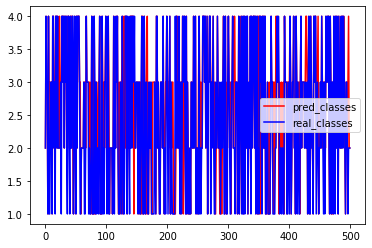

In [97]:
# 绘制预测语音种类和实际语音种类的分类图
plt.plot(output_fore,'r',label='pred_classes')
plt.plot(output1,'b',label='real_classes')
plt.legend()

Text(0, 0.5, 'classification error')

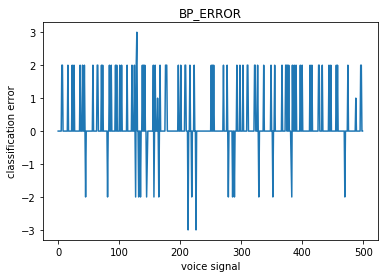

In [101]:
# 绘制误差图
plt.plot(error)
plt.title('BP_ERROR')
plt.xlabel('voice signal')
plt.ylabel('classification error')

In [113]:
# 找出判断错误的分类属于哪一类,并对每一类判断错误的数量进行汇总
k = np.zeros(4)
for i in range(500):
    if error[i] != 0:
        if output1[i] == 1:
            k[0] += 1
        elif output1[i] == 2:
            k[1] += 1
        elif output1[i] == 3:
            k[2] += 1
        elif output1[i] == 4:
            k[3] += 1

In [114]:
k

array([63., 16., 11.,  9.])

In [115]:
# 计算每个分类的总和
kk = np.zeros(4)
for i in range(500):
    if output1[i] == 1:
        kk[0] += 1
    elif output1[i] == 2:
        kk[1] += 1
    elif output1[i] == 3:
        kk[2] += 1
    elif output1[i] == 4:
        kk[3] += 1

In [116]:
kk

array([139., 135., 112., 114.])

In [122]:
# 计算正确率
def right_ridio(k, kk):
    rightridio = np.zeros(4)
    for i in range(4):
        rightridio[i] = (kk[i]-k[i])/kk[i]
    return rightridio
#rightridio = (np.mat(kk)-np.mat(k))/np.linalg.inv(np.mat(kk))

In [123]:
right_ridio(k, kk)

array([0.54676259, 0.88148148, 0.90178571, 0.92105263])